In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
from konlpy.tag import Twitter
from konlpy.utils import pprint
twitter = Twitter()

In [4]:
from collections import Counter

In [5]:
common_front = '../../dataset/sn_0715/stylenanda_' 
common_back = '.json'

def get_file(file_num):   
    file_path = common_front + str(file_num) + common_back
    json_data = open(file_path).read()
    data = json.loads(json_data)
    df_data = pd.DataFrame(data)
    return df_data

def concat_file(file_num):
    start_file = pd.DataFrame(get_file(1))
    for i in range(2,file_num+1):
        df_tmp = pd.DataFrame(get_file(i))
        start_file = pd.concat([start_file, df_tmp])
    start_file = start_file.reset_index(drop=True)
    return start_file

In [6]:
sn_data = concat_file(61)

In [39]:
sn_data.head()

,_id,bodySize,cId,desc,height,helpful,pColor,pID,pSize,pTitle,pURL,rImages,rNo,rScore,shoeSize,weight
0,stylenanda_544486,NaN,yj7***,심플하게 입을때 허리에 포인트주면 이쁠거같아용!난다메이드는 사랑입니당,158.0,"[0, 0]",블랙,226976,FRE,드로우진주 글램포인트벨트7월 31일부터 순차 배송가능!!,http://stylenanda.com/front/php/product.php?pr...,NaN,544486,4.0,225.0,NaN
1,stylenanda_544485,NaN,yj7***,허리사이즈도 딱 맞고 길이도 적당하고 너무 이뻐용,158.0,"[0, 0]",블루진,230154,S,내추럴데미지 미니데님sk,http://stylenanda.com/front/php/product.php?pr...,NaN,544485,5.0,225.0,NaN
2,stylenanda_544484,NaN,yj7***,사진으로 보는거랑 생각했던 거랑 재질이 많이 달라요.그래도 귀여운디자인에 한눈에 반...,158.0,"[0, 0]",레드,229168,FRE,캔디오션 버튼다운 st원피스,http://stylenanda.com/front/php/product.php?pr...,NaN,544484,4.0,225.0,NaN
3,stylenanda_544483,NaN,yj7***,박시하게 입어도 되고 허리끈 묶어서 입어도 되고 이쁩니다~,158.0,"[0, 0]",화이트,227429,FRE,레터링스피릿 끈드롭 박시하프티7월 31일부터 순차 배송가능!!,http://stylenanda.com/front/php/product.php?pr...,NaN,544483,4.0,225.0,NaN
4,stylenanda_544482,NaN,yj7***,허리가 얇은편인데 제곱바지는 허리가 딱맞아서 좋아요!,158.0,"[0, 0]",블루진,228627,S,사이드엣지 브라이트데님 숏pt,http://stylenanda.com/front/php/product.php?pr...,NaN,544482,5.0,225.0,NaN


In [5]:
len(sn_data)

304756

In [35]:
cnt=sn_data['rScore'].value_counts()
cnt=pd.DataFrame(cnt)
cnt

,rScore
5.0,284248
4.0,12905
3.0,5072
2.0,1447
1.0,1084


In [38]:
total=0
for i in range(len(cnt)):
    total+=cnt['rScore'][i+1]
total

304756

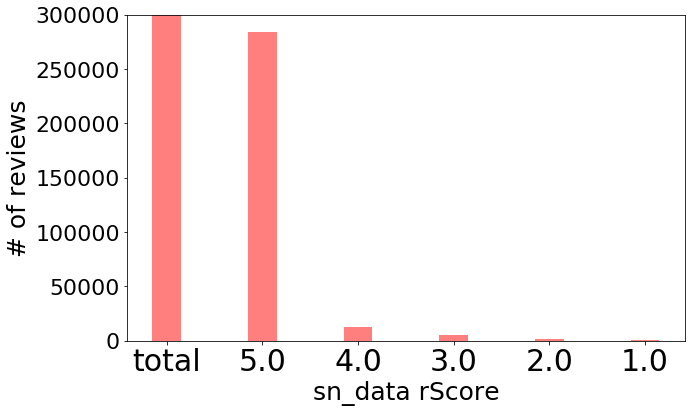

ratio 5.0: 93.271
ratio 4.0 : 4.235
ratio 3.0: 1.664
ratio 2.0 : 0.475
ratio 1.0 : 0.356


In [531]:
score = ('total', '5.0', '4.0', '3.0', '2.0', '1.0')
number_of_reviews = [304756,
                     284248,
                     12905,
                     5072,
                     1447,
                     1084]

plt.bar(score, number_of_reviews, color=['red'],
        width=0.3, alpha=0.5)
plt.xticks(score, fontsize=30)
plt.yticks(fontsize=22)
plt.ylabel('# of reviews', fontsize=25)
plt.rcParams["figure.figsize"] = (8,6)
plt.xlabel('sn_data rScore', fontsize=25)
ax = plt.gca()
ax.set_ylim([0.0, 300000])
plt.show()

print ("ratio 5.0: " + str(short_float(1.0*(284248)*100/304756)))
print ("ratio 4.0 : " + str(short_float(1.0*(12905)*100/304756)))
print ("ratio 3.0: " + str(short_float(1.0*(5072)*100/304756)))
print ("ratio 2.0 : " + str(short_float(1.0*(1447)*100/304756)))
print ("ratio 1.0 : " + str(short_float(1.0*(1084)*100/304756)))



In [46]:
rating_beauty = pd.read_csv('ratings_Beauty.csv', header=None)
rating_beauty.columns = ['user', 'item', 'rating', 'timestamp']
rating_beauty.head()

,user,item,rating,timestamp
0,A39HTATAQ9V7YF,0205616461,5.0,1369699200
1,A3JM6GV9MNOF9X,0558925278,3.0,1355443200
2,A1Z513UWSAAO0F,0558925278,5.0,1404691200
3,A1WMRR494NWEWV,0733001998,4.0,1382572800
4,A3IAAVS479H7M7,0737104473,1.0,1274227200


In [47]:
len(rating_beauty)

2023070

In [49]:
rating_beauty['rating'].value_counts()

5.0    1248721
4.0     307740
1.0     183784
3.0     169791
2.0     113034
Name: rating, dtype: int64

In [57]:
cnt=rating_beauty['rating'].value_counts()
cnt=pd.DataFrame(cnt)
cnt

,rating
5.0,1248721
4.0,307740
1.0,183784
3.0,169791
2.0,113034


In [52]:
total=0
for i in range(len(cnt)):
    total+=cnt['rating'][i+1]
total

2023070

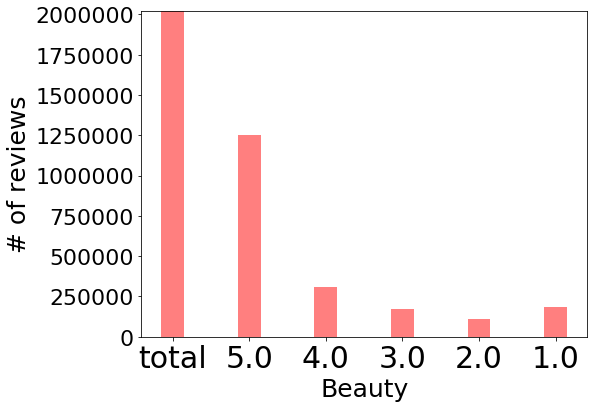

In [532]:
score = ('total', '5.0', '4.0', '3.0', '2.0', '1.0')
number_of_reviews = [2023070,
                    1248721,
                     307740,
                     169791,
                     113034,
                     183784]

plt.bar(score, number_of_reviews, color=['red'],
        width=0.3, alpha=0.5)
plt.xticks(score, fontsize=30)
plt.yticks(fontsize=22)
plt.ylabel('# of reviews', fontsize=25)
plt.rcParams["figure.figsize"] = (10,6)
plt.xlabel('Beauty', fontsize=25)
ax = plt.gca()
ax.set_ylim([0.0, 2023070])
plt.show()



In [508]:
rating_clothing = pd.read_csv('ratings_Clothing_Shoes_and_Jewelry.csv', header=None, error_bad_lines=False)
rating_clothing.columns = ['user', 'item', 'rating', 'timestamp']
rating_clothing.head()

Skipping line 283087: expected 4 fields, saw 7

Skipping line 488958: expected 4 fields, saw 7

Skipping line 591898: expected 4 fields, saw 5

Skipping line 694835: expected 4 fields, saw 7

Skipping line 849261: expected 4 fields, saw 6

Skipping line 1106608: expected 4 fields, saw 7

Skipping line 1209542: expected 4 fields, saw 6

Skipping line 1415427: expected 4 fields, saw 7

Skipping line 1569830: expected 4 fields, saw 6

Skipping line 1827160: expected 4 fields, saw 6

Skipping line 2007300: expected 4 fields, saw 7

Skipping line 2135970: expected 4 fields, saw 7

Skipping line 2238903: expected 4 fields, saw 7

Skipping line 2444773: expected 4 fields, saw 5

Skipping line 2521981: expected 4 fields, saw 6
Skipping line 2599187: expected 4 fields, saw 5

Skipping line 2779310: expected 4 fields, saw 7
Skipping line 2856501: expected 4 fields, saw 5

Skipping line 2907963: expected 4 fields, saw 5
Skipping line 2959427: expected 4 fields, saw 7

Skipping line 3062356: expec

,user,item,rating,timestamp
0,A2XVJBSRI3SWDI,0000031887,5,1.383523e+09
1,A2G0LNLN79Q6HR,0000031887,4,1.337990e+09
2,A2R3K1KX09QBYP,0000031887,2,1.361059e+09
3,A19PBP93OF896,0000031887,1,1.363824e+09
4,A1P0IHU93EF9ZK,0000031887,4,1.390435e+09


In [509]:
len(rating_clothing)

11446252

# 1) Term Frequency

reveiw : 리뷰내용을 morphs 단위로 token (type=list)

total_review : token화 한 전체 morphs를 모은 것들 (type=list)

table : bow를 dataframe으로 시각화한 테이블 (type=DataFrame)


In [15]:
def counting(input_review, total_review):
    tmp = dict()
    for i in range(len(total_review)):
        tmp[total_review[i]] = input_review.count(total_review[i])
    return tmp   

In [19]:
pprint (counting(review1, reviews_morphs))

{가: 1,
 갑: 0,
 니다: 0,
 룸서비스: 1,
 매우: 1,
 방이: 0,
 별로: 0,
 보내고: 0,
 시간: 0,
 았: 1,
 어요: 1,
 였: 0,
 은: 0,
 좋: 1,
 호텔: 1}


In [16]:
t = Twitter()

review1 = t.morphs(u"호텔 룸서비스가 매우 좋았어요")
review2 = t.morphs(u"좋은 시간 보내고 갑니다")
review3 = t.morphs(u"호텔 방이 별로였어요")

reviews_morphs=[review1, review2, review3]

reviews_morphs = list(set(review1+review2+review3))

k_table1 = pd.DataFrame(index = ['review1', 'review2', 'review3'],
                     columns = reviews_morphs,
                     data = [counting(review1,reviews_morphs),
                             counting(review2, reviews_morphs), 
                             counting(review3, reviews_morphs)])

k_table1

,가,은,룸서비스,좋,방이,니다,갑,시간,였,호텔,았,보내고,어요,매우,별로
review1,1,0,1,1,0,0,0,0,0,1,1,0,1,1,0
review2,0,1,0,1,0,1,1,1,0,0,0,1,0,0,0
review3,0,0,0,0,1,0,0,0,1,1,0,0,1,0,1


In [17]:
reviews=[u'호텔 룸서비스가 매우 좋았어요', u'좋은 시간 보내고 갑니다',u'호텔 방이 별로였어요']
pprint(reviews)

[호텔 룸서비스가 매우 좋았어요,
 좋은 시간 보내고 갑니다,
 호텔 방이 별로였어요]


In [18]:
t= Twitter()
def make_table(reviews): #morphs 집합 만들기
    review_morphs=[]
    for i in range(len(reviews)):
        review_morphs.append(t.morphs(reveiws[i]))
    reviews_morphs= list(set(review_morphs))

In [66]:
type(review1)

list

In [151]:
table_ix=k_table1.index
table_ix[0]

'review1'

In [147]:
def table_to_review_vector(table):
    table_ix=table.index
    review_vectors=[]
    for i in range(len(table_ix)):
        review_vectors.append(table.ix[table_ix[i]])
    return review_vectors

In [157]:
review_vector(k_table1)

[가       1
 은       0
 룸서비스    1
 좋       1
 방이      0
 니다      0
 갑       0
 시간      0
 였       0
 호텔      1
 았       1
 보내고     0
 어요      1
 매우      1
 별로      0
 Name: review1, dtype: int64, 가       0
 은       1
 룸서비스    0
 좋       1
 방이      0
 니다      1
 갑       1
 시간      1
 였       0
 호텔      0
 았       0
 보내고     1
 어요      0
 매우      0
 별로      0
 Name: review2, dtype: int64, 가       0
 은       0
 룸서비스    0
 좋       0
 방이      1
 니다      0
 갑       0
 시간      0
 였       1
 호텔      1
 았       0
 보내고     0
 어요      1
 매우      0
 별로      1
 Name: review3, dtype: int64]

In [87]:
review1_vector=k_table1.ix['review1']
review1_vector

가       1
은       0
룸서비스    1
좋       1
방이      0
니다      0
갑       0
시간      0
였       0
호텔      1
았       1
보내고     0
어요      1
매우      1
별로      0
Name: review1, dtype: int64

In [89]:
review2_vector=k_table1.ix['review2']
review2_vector

가       0
은       1
룸서비스    0
좋       1
방이      0
니다      1
갑       1
시간      1
였       0
호텔      0
았       0
보내고     1
어요      0
매우      0
별로      0
Name: review2, dtype: int64

In [90]:
def similarity(x, y):
    return np.dot(x, y) / (np.sqrt(np.dot(x, x)) * np.sqrt(np.dot(y, y)))

In [100]:
value=similarity(review1_vector, review2_vector)
value

0.1543033499620919

3개 리뷰의 유사도 비교해보기

In [133]:
def short_float(val):
    value = float("{:.3f}".format(val)) # 소수점 아래 2자리까지 나타내기, 3째자리에서 반올림
    return value

In [105]:
print(review1_vector)
print(review2_vector)
review3_vector=k_table1.ix['review3']
print(review3_vector)

가       1
은       0
룸서비스    1
좋       1
방이      0
니다      0
갑       0
시간      0
였       0
호텔      1
았       1
보내고     0
어요      1
매우      1
별로      0
Name: review1, dtype: int64
가       0
은       1
룸서비스    0
좋       1
방이      0
니다      1
갑       1
시간      1
였       0
호텔      0
았       0
보내고     1
어요      0
매우      0
별로      0
Name: review2, dtype: int64
가       0
은       0
룸서비스    0
좋       0
방이      1
니다      0
갑       0
시간      0
였       1
호텔      1
았       0
보내고     0
어요      1
매우      0
별로      1
Name: review3, dtype: int64


In [138]:
min=0
max=0
avg=0
sum=0
sm=[]
li=[review1_vector, review2_vector, review3_vector]
for i in range(len(li)-1):
    for j in range(i+1,len(li)):
        print(i+1),;print(u'번째 리뷰와'),;print(j+1),;print(u'번째 리뷰 : '),;  print(similarity(li[i],li[j]));
        val=short_float(similarity(li[i],li[j]))
        sm.append(val)
        
for i in range(1,len(sm)):
    min=sm[0]
    max=sm[0]
    sum+=sm[i]
    if(min>sm[i]):
        min=sm[i]
    if(max<sm[i]):
        max=sm[i]
        
avg = short_float(sum/len(sm))

print(sm)
print ('min', min)
print ('max', max)
print('avg', avg)
       


1 번째 리뷰와 2 번째 리뷰 :  0.1543033499620919
1 번째 리뷰와 3 번째 리뷰 :  0.33806170189140655
2 번째 리뷰와 3 번째 리뷰 :  0.0
[0.154, 0.338, 0.0]
('min', 0.0)
('max', 0.154)
('avg', 0.113)


In [ ]:
def review_similarity()
    min=0
    max=0
    avg=0
    sum=0
    sm=[]
    li=[review1_vector, review2_vector, review3_vector]
    for i in range(len(li)-1):
        for j in range(i+1,len(li)):
            print(i+1),;print(u'번째 리뷰와'),;print(j+1),;print(u'번째 리뷰 : '),;  print(similarity(li[i],li[j]));
            val=short_float(similarity(li[i],li[j]))
            sm.append(val)

    for i in range(1,len(sm)):
        min=sm[0]
        max=sm[0]
        sum+=sm[i]
        if(min>sm[i]):
            min=sm[i]
        if(max<sm[i]):
            max=sm[i]

    avg = short_float(sum/len(sm))

    print(sm)
    print ('min', min)
    print ('max', max)
    print('avg', avg)
       


# 함수화 하기

In [156]:
(sn_data.loc[sn_data['cId']=='bana5***'])['desc']

78311    생가보다 사이즈가 너무 작아서 놀랐어요ㅠㅠㅠㅠㅠ물론 유튜버님 준 한분의 리뷰를 알아...
91312    저는 원래 박시한 스타일을 좋아해서 크고 넉넉해서 좋아요!!색도 베이지인데 흔하지 ...
Name: desc, dtype: object

In [358]:
# 1.
#reviewer의 desc를 담는 리스트
def make_reviews(cid):
    reviews=(sn_data.loc[sn_data['cId']==cid])['desc']
    reviews=list(reviews)
    
    return reviews

#1-1 
    
# 2.
# desc의 morphs를 담는 리스트
def make_morphs(reviews):
    
    t=Twitter()
    review_morphs=[]

    for i in range(len(reviews)):
        review_morphs.append(t.morphs(reviews[i]))
        
    morphs=[y for x in review_morphs for y in x]  #2중 list를 flatten하게 만듦
    review_morphs= list(set(morphs))
    
    return review_morphs

In [180]:
# 3.
# term-frequency 함수
def counting(reviews, review_morphs):
   
    tmp = dict()
    for i in range(len(review_morphs)):
        tmp[review_morphs[i]] = reviews.count(review_morphs[i])
    return tmp  


#review_list = review들(desc)을 모두 담은 list
# term-frequency로 벡터화한 리뷰들을 담은 리스트를 만드는 함수

def term_fre(reviews):
    review_morphs=make_morphs(reviews)
    review_vec_list=[]
    for i in range(len(reviews)):  
        review_vec_list.append(counting(reviews[i],review_morphs))
    
    return review_vec_list

In [175]:
# 4. 만든 term-frequency를 table로 만들어 보기 쉽게하기
def make_table(reviews):
    vectors=term_fre(reviews)
    table=pd.DataFrame(vectors)
    return table

In [182]:
# 5. 4에서 만든 table의 행(vector들)을 하나의 리스트에 담기 -> 각 리뷰의 벡터값들만 모은 리스트
def table_to_review_vector(reviews):
    table=make_table(reviews)
    table_ix=table.index
    review_vectors=[]
    for i in range(len(table_ix)):
        review_vectors.append(table.loc[table_ix[i]])
    return review_vectors

In [293]:
 # 소수점 아래 3자리까지 나타내기, 4째자리에서 반올림
def short_float(val):
    value = float("{:.3f}".format(val))
    return value

In [21]:
#cosine similarity 함수
def similarity(x, y):
    return np.dot(x, y) / (np.sqrt(np.dot(x, x)) * np.sqrt(np.dot(y, y)))

In [ ]:
#nCr 함수, 
import math

def nCr(n,r):
    f = math.factorial
    return f(n) / f(r) / f(n-r)

In [562]:
# 6. 리뷰의 유사도 구하기
def review_similarity(review_vectors):
    over_count=0
    min=0
    max=0
    avg=0
    sum=0
    sm=[] #similarity를 담을 리스트
    cnt=0 # 유사도가 1인 개수
    li=review_vectors
    for i in range(len(li)-1):
        for j in range(i+1,len(li)):            
            val=short_float(similarity(li[i],li[j])) # 유사도를 구하고 소수점 아래 3째자리까지 나타내기
           # print(i+1),;print(u'번째 리뷰와'),;print(j+1),;print(u'번째 리뷰 : '),;  print(val); #유사도
            sm.append(val)
            if(val==1.0):
                cnt+=1
            
    if(len(sm)>1):  # 리뷰를 3개이상 작성시
        sum=sm[0]
        min=sm[0]
        max=sm[0]
        for i in range(1,len(sm)):
            sum+=sm[i]
            if(min>sm[i]):
                min=sm[i]
            if(max<sm[i]):
                max=sm[i]
            if(sm[i]>=0.8):
                over_count+=1
                
                
    else: # 리뷰를 2개만 작성시
        sum=sm[0]
        min=sm[0]
        max=sm[0]
        if(sm[0]>=0.8):
            over_count+=1
        

    avg = short_float(sum/len(sm))

    #print('similarity: ', sm)
    print ('min', min)
    print ('max', max)
    print('avg', avg)
    print('num of similarity=0.8 over : ', over_count)
    print('# of similarity=1 ', cnt)
    print('ratio of similarity=1: ', short_float(1.0*cnt*100/len(sm)))
    
    return over_count
       


In [246]:
reviewer=[]
for i in range(len(cid_count)):
    if(cid_count['cId'][i]==3):
        reviewer.append(cid[i])

In [247]:
reviewer

[u'56926683***',
 u'yeri6***',
 u'rinkr***',
 u'heejoo1***',
 u'yuna9***',
 u'anakin***',
 u'jaan0***',
 u'seyoung***',
 u'nodam***',
 u'goql***',
 u'dksrn***',
 u'tkfzhaekf***',
 u'missk***',
 u'syna***',
 u'theang***',
 u'amiam***',
 u'thdalfl***',
 u'miae***',
 u'gusalak***',
 u'yunn***',
 u'fodfo***',
 u'mnmre0***',
 u'rosemi***',
 u'ksg9***',
 u'5116835***',
 u'oldki***',
 u'dnjsal***',
 u'kq***',
 u'gkfla***',
 u'skagu***',
 u'33827045986277***',
 u'cozizi200***',
 u'god54***',
 u'woon1***',
 u'ekru***',
 u'thd9***',
 u'god56***',
 u'irc***',
 u'kjngo***',
 u'audwn0***',
 u'jyk6***',
 u'syj7***',
 u'jin31***',
 u'perfect***',
 u'qhkdw***',
 u'jaekyu***',
 u'hoi900***',
 u'rlawjd***',
 u'gmldizz***',
 u'dkal1***',
 u'alfud0***',
 u'wwwco***',
 u'tjsdo7***',
 u'love1004g***',
 u'9257963***',
 u'wjdz***',
 u'xinaj***',
 u'zzy***',
 u'kksy9***',
 u'hsy930***',
 u'east0***',
 u'dmswl7ejr***',
 u'dalzo0***',
 u'yhk***',
 u'sorksjs***',
 u'poupee***',
 u'wngus5***',
 u'spxmvld***',
 u'm

In [248]:
(sn_data.loc[sn_data['cId']=='yeri6***'])['desc']

287187    3 CONCEPT EYES GLAM CREAM SHADOW #BABY DOLLㅋㅋㅋ...
287188    3 CONCEPT EYES EYE BROW KIT ㅋㅋㅋㅋㅋㅋㅋ배송 칼배송 짱임 기...
287189    3 CONCEPT EYES EYE COLOR #MORE BROWN배송은 진짜 칼배송...
Name: desc, dtype: object

In [516]:
reviews=(u'좋아요', u'좋아요',u'조아요',u'아주 좋아요',u'괜찮아요',u'싫어요',u'싫다')
make_morphs(reviews)
term_fre(reviews)
a=make_table(reviews)
vectors=table_to_review_vector(reviews)
review_similarity(vectors)
a

1 번째 리뷰와 2 번째 리뷰 :  1.0
1 번째 리뷰와 3 번째 리뷰 :  0.667
1 번째 리뷰와 4 번째 리뷰 :  0.866
1 번째 리뷰와 5 번째 리뷰 :  0.667
1 번째 리뷰와 6 번째 리뷰 :  0.408
1 번째 리뷰와 7 번째 리뷰 :  0.0
2 번째 리뷰와 3 번째 리뷰 :  0.667
2 번째 리뷰와 4 번째 리뷰 :  0.866
2 번째 리뷰와 5 번째 리뷰 :  0.667
2 번째 리뷰와 6 번째 리뷰 :  0.408
2 번째 리뷰와 7 번째 리뷰 :  0.0
3 번째 리뷰와 4 번째 리뷰 :  0.577
3 번째 리뷰와 5 번째 리뷰 :  0.667
3 번째 리뷰와 6 번째 리뷰 :  0.408
3 번째 리뷰와 7 번째 리뷰 :  0.0
4 번째 리뷰와 5 번째 리뷰 :  0.577
4 번째 리뷰와 6 번째 리뷰 :  0.354
4 번째 리뷰와 7 번째 리뷰 :  0.0
5 번째 리뷰와 6 번째 리뷰 :  0.408
5 번째 리뷰와 7 번째 리뷰 :  0.0
6 번째 리뷰와 7 번째 리뷰 :  0.0
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.438)
('ratio of similarity=1: ', 4.8)


,괜찮,싫다,싫어,아요,아주,요,조,좋
0,0,0,0,1,0,1,0,1
1,0,0,0,1,0,1,0,1
2,0,0,0,1,0,1,1,0
3,0,0,0,1,1,1,0,1
4,1,0,0,1,0,1,0,0
5,0,0,1,0,0,1,0,0
6,0,1,0,0,0,0,0,0


In [65]:
d=sn_data['cId'].value_counts()
d=pd.DataFrame(d)
d
reviewer_list=[]
reviewer_test=[] # 리뷰가 2개인 사람
cnt=0
for i in range(len(d)):
    if(d['cId'][i]==2):
        reviewer_test.append(d.index[i])
        
reviewer_test


[u'thdgptj***',
 u'9627674***',
 u'wnzmw***',
 u'bana5***',
 u'diabl***',
 u'simsung***',
 u'shflr***',
 u'xpsltm***',
 u'gjtjddb***',
 u'mimi7***',
 u'gira***',
 u'quftmqu***',
 u'marigol***',
 u'dollyg***',
 u'alswb3***',
 u'dbtngm***',
 u'kiss8***',
 u'hie***',
 u'yaho***',
 u'hotpin***',
 u'hhsong0***',
 u'yks1***',
 u'calli2***',
 u'kimch***',
 u'aesol***',
 u'gilbert***',
 u'hway***',
 u'ujink***',
 u'yer***',
 u'suna3***',
 u'gosre***',
 u'nancyflo***',
 u'parrot***',
 u'hmae1***',
 u'realy***',
 u'p200***',
 u'dusdu***',
 u'saleru1***',
 u'wkdald***',
 u'norepl***',
 u'kimsa***',
 u'aggn***',
 u'junseu***',
 u'skfk4***',
 u'koan***',
 u'dlg***',
 u'qorals***',
 u'iide***',
 u'uokim6***',
 u'peh2***',
 u'k200***',
 u'lovehe***',
 u'2923393***',
 u'zz0***',
 u'nycg***',
 u'178041591886607***',
 u'ttang***',
 u'jian3***',
 u'junn***',
 u'chsl***',
 u'diana5***',
 u'hc***',
 u'rlathfl***',
 u'aqua***',
 u'9444887***',
 u'godn***',
 u'naibbe***',
 u'lar9***',
 u'rladkf***',
 u'emmac

In [88]:
test=sn_data.loc[sn_data['cId']=='bana5***']

In [159]:
lis=(sn_data.loc[sn_data['cId']=='bana5***'])['desc']
lis=list(lis)
pprint(lis)

[생가보다 사이즈가 너무 작아서 놀랐어요ㅠㅠㅠㅠㅠ물론 유튜버님 준 한분의 리뷰를 알아보고선 산거라 설마그렇게 작을까했는데 진짜 동전만하네욬ㅋㅋㅋㅋㅋㅋ그래도 그안에 거울도 있고 들을게 다 들어있어서 놀랬어요!!색깔의 발색이나 수분감은 다른 브랜드제품과 비교했을때 별 차이없을 정도로 괜찮습니다ㅠㅠ다만 사이즈가 작은게 아쉬울뿐....,
 저는 원래 박시한 스타일을 좋아해서 크고 넉넉해서 좋아요!!색도 베이지인데 흔하지 않은 색깔이기도하고 실제 사진에서 보이는 것과 정말 비슷한 색입니다~근데 단점을 꼽자면 단추가 너무 헐렁거려서 제꺼는 몇일만에 떨어져버렸어요ㅠㅠㅠㅜㅠ결국 제가 직접 꼬매입은것 빼고는 다 맘에 들어욯ㅎㅎ질도 부드러워서 좋습니당]


In [92]:
test=pd.DataFrame(test['desc'])
test=test.reset_index()
pprint(test['desc'][0])

생가보다 사이즈가 너무 작아서 놀랐어요ㅠㅠㅠㅠㅠ물론 유튜버님 준 한분의 리뷰를 알아보고선 산거라 설마그렇게 작을까했는데 진짜 동전만하네욬ㅋㅋㅋㅋㅋㅋ그래도 그안에 거울도 있고 들을게 다 들어있어서 놀랬어요!!색깔의 발색이나 수분감은 다른 브랜드제품과 비교했을때 별 차이없을 정도로 괜찮습니다ㅠㅠ다만 사이즈가 작은게 아쉬울뿐....


In [97]:
review_test=[]
for i in range(len(test)):
    review_test.append(test['desc'][i])
pprint(review_test)

[생가보다 사이즈가 너무 작아서 놀랐어요ㅠㅠㅠㅠㅠ물론 유튜버님 준 한분의 리뷰를 알아보고선 산거라 설마그렇게 작을까했는데 진짜 동전만하네욬ㅋㅋㅋㅋㅋㅋ그래도 그안에 거울도 있고 들을게 다 들어있어서 놀랬어요!!색깔의 발색이나 수분감은 다른 브랜드제품과 비교했을때 별 차이없을 정도로 괜찮습니다ㅠㅠ다만 사이즈가 작은게 아쉬울뿐....,
 저는 원래 박시한 스타일을 좋아해서 크고 넉넉해서 좋아요!!색도 베이지인데 흔하지 않은 색깔이기도하고 실제 사진에서 보이는 것과 정말 비슷한 색입니다~근데 단점을 꼽자면 단추가 너무 헐렁거려서 제꺼는 몇일만에 떨어져버렸어요ㅠㅠㅠㅜㅠ결국 제가 직접 꼬매입은것 빼고는 다 맘에 들어욯ㅎㅎ질도 부드러워서 좋습니당]


In [105]:
pprint(review_test[1])

저는 원래 박시한 스타일을 좋아해서 크고 넉넉해서 좋아요!!색도 베이지인데 흔하지 않은 색깔이기도하고 실제 사진에서 보이는 것과 정말 비슷한 색입니다~근데 단점을 꼽자면 단추가 너무 헐렁거려서 제꺼는 몇일만에 떨어져버렸어요ㅠㅠㅠㅜㅠ결국 제가 직접 꼬매입은것 빼고는 다 맘에 들어욯ㅎㅎ질도 부드러워서 좋습니당


In [130]:
test_morphs=[]
for i in range(len(review_test)):
        test_morphs.append(t.morphs(review_test[i]))

t=[y for x in test_morphs for y in x]
    
pprint(t)

[생가,
 보다,
 사이즈,
 가,
 너무,
 작아,
 서,
 놀랐,
 어요,
 ㅠㅠㅠㅠㅠ,
 물론,
 유튜버님,
 준,
 한,
 분,
 의,
 리뷰,
 를,
 알아보,
 고선,
 산,
 거,
 라,
 설마,
 그렇게,
 작,
 을까,
 했,
 는데,
 진짜,
 동전,
 만하,
 네,
 욬,
 ㅋㅋㅋㅋㅋㅋ,
 그래도,
 그,
 안,
 에,
 거울,
 도,
 있고,
 들,
 을,
 게,
 다,
 들어,
 있,
 어서,
 놀랬어,
 요,
 !!,
 색깔,
 의,
 발색,
 이나,
 수분,
 감은,
 다른,
 브랜드,
 제품,
 과,
 비교했,
 을,
 때,
 별,
 차이,
 없,
 을,
 정도,
 로,
 괜찮,
 습니다,
 ㅠㅠ,
 다만,
 사이즈,
 가,
 작은,
 게,
 아쉬,
 울,
 뿐,
 ....,
 저,
 는,
 원래,
 박,
 시한,
 스타일,
 을,
 좋아해서,
 크,
 고,
 넉넉해서,
 좋,
 아요,
 !!,
 색도,
 베이지,
 인데,
 흔하지,
 않은,
 색깔,
 이기도,
 하고,
 실제,
 사진,
 에서,
 보이는,
 것,
 과,
 정말,
 비슷한,
 색,
 입니,
 다,
 ~,
 근데,
 단점,
 을,
 꼽자,
 면,
 단추,
 가,
 너무,
 헐렁거려,
 서,
 제,
 꺼,
 는,
 몇,
 일만,
 에,
 떨어져,
 버렸,
 어요,
 ㅠㅠㅠㅜㅠ,
 결국,
 제,
 가,
 직접,
 꼬,
 매입,
 은,
 것,
 빼고,
 는,
 다,
 맘,
 에,
 들어욯,
 ㅎㅎ,
 질도,
 부드러워,
 서,
 좋,
 습,
 니당]


In [136]:
morphs=make_morphs(review_test)
pprint(morphs)

[가,
 것,
 몇,
 저,
 좋,
 어서,
 작,
 베이지,
 알아보,
 들어,
 않은,
 제,
 넉넉해서,
 를,
 정말,
 너무,
 흔하지,
 정도,
 비슷한,
 색깔,
 ㅠㅠㅠㅜㅠ,
 아요,
 로,
 다만,
 크,
 에서,
 거,
 면,
 괜찮,
 있고,
 을까,
 이기도,
 어요,
 게,
 요,
 빼고,
 그래도,
 질도,
 아쉬,
 니당,
 ㅋㅋㅋㅋㅋㅋ,
 단점,
 욬,
 산,
 버렸,
 울,
 일만,
 꺼,
 사진,
 별,
 없,
 시한,
 ~,
 수분,
 다른,
 사이즈,
 떨어져,
 고,
 습니다,
 들어욯,
 다,
 에,
 하고,
 라,
 브랜드,
 스타일,
 과,
 !!,
 준,
 그렇게,
 물론,
 차이,
 직접,
 놀랐,
 인데,
 서,
 입니,
 부드러워,
 네,
 ㅎㅎ,
 매입,
 꼬,
 단추,
 작은,
 놀랬어,
 습,
 작아,
 있,
 보다,
 만하,
 은,
 ㅠㅠ,
 을,
 색,
 안,
 때,
 ㅠㅠㅠㅠㅠ,
 생가,
 의,
 한,
 비교했,
 ....,
 보이는,
 감은,
 거울,
 는,
 고선,
 분,
 근데,
 했,
 유튜버님,
 진짜,
 박,
 발색,
 결국,
 설마,
 실제,
 헐렁거려,
 도,
 이나,
 좋아해서,
 는데,
 동전,
 뿐,
 맘,
 색도,
 제품,
 꼽자,
 원래,
 들,
 리뷰,
 그]


In [139]:
vectors_test=term_fre(review_test,morphs)
pprint(vectors_test)

[{!!: 1,
  ....: 1,
  ~: 0,
  ㅋㅋㅋㅋㅋㅋ: 1,
  ㅎㅎ: 0,
  ㅠㅠ: 3,
  ㅠㅠㅠㅜㅠ: 0,
  ㅠㅠㅠㅠㅠ: 1,
  가: 3,
  감은: 1,
  거: 2,
  거울: 1,
  것: 0,
  게: 3,
  결국: 0,
  고: 2,
  고선: 1,
  과: 1,
  괜찮: 1,
  그: 3,
  그래도: 1,
  그렇게: 1,
  근데: 0,
  꺼: 0,
  꼬: 0,
  꼽자: 0,
  너무: 1,
  넉넉해서: 0,
  네: 1,
  놀랐: 1,
  놀랬어: 1,
  는: 1,
  는데: 1,
  니당: 0,
  다: 5,
  다른: 1,
  다만: 1,
  단점: 0,
  단추: 0,
  도: 3,
  동전: 1,
  들: 2,
  들어: 1,
  들어욯: 0,
  때: 1,
  떨어져: 0,
  라: 1,
  로: 1,
  를: 1,
  리뷰: 1,
  만하: 1,
  맘: 0,
  매입: 0,
  면: 0,
  몇: 0,
  물론: 1,
  박: 0,
  발색: 1,
  버렸: 0,
  베이지: 0,
  별: 1,
  보다: 1,
  보이는: 0,
  부드러워: 0,
  분: 2,
  브랜드: 1,
  비교했: 1,
  비슷한: 0,
  빼고: 0,
  뿐: 1,
  사이즈: 2,
  사진: 0,
  산: 1,
  색: 2,
  색깔: 1,
  색도: 0,
  생가: 1,
  서: 2,
  설마: 1,
  수분: 1,
  스타일: 0,
  습: 1,
  습니다: 1,
  시한: 0,
  실제: 0,
  아쉬: 1,
  아요: 0,
  안: 1,
  않은: 0,
  알아보: 1,
  어서: 1,
  어요: 2,
  없: 1,
  에: 1,
  에서: 0,
  요: 2,
  욬: 1,
  울: 2,
  원래: 0,
  유튜버님: 1,
  은: 2,
  을: 4,
  을까: 1,
  의: 2,
  이기도: 0,
  이나: 1,
  인데: 0,
  일만: 0,
  입니: 0,
  있: 2,
  있고: 1,
  작: 3,


In [144]:
t=pd.DataFrame(vectors_test)
t

,!!,....,~,ㅋㅋㅋㅋㅋㅋ,ㅎㅎ,ㅠㅠ,ㅠㅠㅠㅜㅠ,ㅠㅠㅠㅠㅠ,가,감은,...,직접,진짜,질도,차이,크,하고,한,했,헐렁거려,흔하지
0,1,1,0,1,0,3,0,1,3,1,...,0,1,0,1,0,0,1,2,0,0
1,1,0,1,0,1,1,1,0,2,0,...,1,0,1,0,1,1,2,0,1,1


In [150]:
test_vector=table_to_review_vector(t)

In [154]:
review_similarity(test_vector)

1 번째 리뷰와 2 번째 리뷰 :  0.4607213376254634
('similarity: ', [0.461])
('min', 0.461)
('max', 0.461)
('avg', 0.461)


In [354]:
import math

def nCr(n,r):
    f = math.factorial
    return f(n) / f(r) / f(n-r)

In [355]:
nCr(4,2)

6

# test

In [447]:
reviews=make_reviews('bana5***')
make_morphs(reviews)
term_fre(reviews)
make_table(reviews)
vectors=table_to_review_vector(reviews)
cnt=review_similarity(vectors)
review_num=len(reviews)

print('ratio_similarity1: ', cnt/nCr(review_num,2))


('min', 0.461)
('max', 0.461)
('num of similarity=0.8 over : ', 0)
('avg', 0.461)
('ratio of similarity=1: ', 0.0)
('ratio_similarity1: ', 0)


# 리뷰를 2~5개 작성한 리뷰어

In [262]:
cid_count=sn_data['cId'].value_counts()
cid_count=pd.DataFrame(cid_count)
cid=cid_count.index

In [376]:
reviewer_list=[]
for i in range(len(cid_count)):
    if(cid_count['cId'][i] >=2 and cid_count['cId'][i]<=5):
        reviewer_list.append(cid[i])

In [377]:
len(reviewer_list)

16632

In [378]:
test_li=reviewer_list[:5]
test_li

[u'dltjdwls***', u'skfok***', u'godty2***', u'kar8***', u'yinus***']

In [379]:
for i in range(len(test_li)):
    print(i+1),;print(u'번째 리뷰어');
    reviews=make_reviews(test_li[i])
    make_morphs(reviews)
    term_fre(reviews)
    make_table(reviews)
    vectors=table_to_review_vector(reviews)
    cnt=review_similarity(vectors)
    review_num=len(reviews)

    print('ratio_similarity1: ', cnt/nCr(review_num,2))

1 번째 리뷰어
('min', 0.0)
('max', 0.444)
('avg', 0.196)
('# of similarity=1 ', 0)
('ratio_similarity1: ', 0)
2 번째 리뷰어
('min', 0.177)
('max', 0.516)
('avg', 0.351)
('# of similarity=1 ', 0)
('ratio_similarity1: ', 0)
3 번째 리뷰어
('min', 0.463)
('max', 0.594)
('avg', 0.53)
('# of similarity=1 ', 0)
('ratio_similarity1: ', 0)
4 번째 리뷰어
('min', 0.0)
('max', 0.397)
('avg', 0.198)
('# of similarity=1 ', 0)
('ratio_similarity1: ', 0)
5 번째 리뷰어
('min', 0.161)
('max', 0.518)
('avg', 0.329)
('# of similarity=1 ', 0)
('ratio_similarity1: ', 0)


# 리뷰 50개 작성한 리뷰어

In [380]:
reviewer_list=[]
for i in range(len(cid_count)):
    if(cid_count['cId'][i]==50):
        reviewer_list.append(cid[i])
        
len(reviewer_list)

26

In [381]:
test_li=reviewer_list[:5]
test_li

[u'heehj***', u'pas***', u'kuruh***', u'dbs***', u'pyj332***']

In [390]:
    reviews=make_reviews('pas***')
    make_morphs(reviews)
    term_fre(reviews)
    make_table(reviews)
    vectors=table_to_review_vector(reviews)
    cnt=review_similarity(vectors)
    review_num=len(reviews)
   # print(nCr(review_num,2))
    print('ratio_similarity1: ', short_float((1.0*cnt/nCr(review_num,2))*100))

('min', 0.0)
('max', 1.0)
('avg', 0.378)
('# of similarity=1 ', 190)
1225
('ratio_similarity1: ', 15.51)


In [391]:
for i in range(len(test_li)):
    print(i+1),;print(u'번째 리뷰어');
    reviews=make_reviews(test_li[i])
    make_morphs(reviews)
    term_fre(reviews)
    make_table(reviews)
    vectors=table_to_review_vector(reviews)
    cnt=review_similarity(vectors)
    review_num=len(reviews)

    print('ratio_similarity1: ', short_float((1.0*cnt/nCr(review_num,2))*100))

1 번째 리뷰어
('min', 0.042)
('max', 0.923)
('avg', 0.331)
('# of similarity=1 ', 0)
('ratio_similarity1: ', 0.0)
2 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.378)
('# of similarity=1 ', 190)
('ratio_similarity1: ', 15.51)
3 번째 리뷰어
('min', 0.04)
('max', 0.895)
('avg', 0.333)
('# of similarity=1 ', 0)
('ratio_similarity1: ', 0.0)
4 번째 리뷰어
('min', 0.0)
('max', 0.804)
('avg', 0.262)
('# of similarity=1 ', 0)
('ratio_similarity1: ', 0.0)
5 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.209)
('# of similarity=1 ', 3)
('ratio_similarity1: ', 0.245)


# 리뷰 100개 작성한 리뷰어

In [392]:
reviewer_list=[]
for i in range(len(cid_count)):
    if(cid_count['cId'][i] ==100):
        reviewer_list.append(cid[i])

In [393]:
reviewer_list

[u'phj8***', u'iris***', u'b4b2***', u'yr191***', u'ggom***', u'ssdd1***']

In [394]:
for i in range(len(reviewer_list)):
    print(i+1),;print(u'번째 리뷰어');
    reviews=make_reviews(reviewer_list[i])
    make_morphs(reviews)
    term_fre(reviews)
    make_table(reviews)
    vectors=table_to_review_vector(reviews)
    cnt=review_similarity(vectors)
    review_num=len(reviews)

    print('ratio_similarity=1: ', short_float((1.0*cnt/nCr(review_num,2))*100))

1 번째 리뷰어
('min', 0.0)
('max', 0.834)
('avg', 0.429)
('# of similarity=1 ', 0)
('ratio_similarity1: ', 0.0)
2 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.398)
('# of similarity=1 ', 214)
('ratio_similarity1: ', 4.323)
3 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.394)
('# of similarity=1 ', 376)
('ratio_similarity1: ', 7.596)
4 번째 리뷰어
('min', 0.134)
('max', 0.837)
('avg', 0.44)
('# of similarity=1 ', 0)
('ratio_similarity1: ', 0.0)
5 번째 리뷰어
('min', 0.0)
('max', 0.73)
('avg', 0.326)
('# of similarity=1 ', 0)
('ratio_similarity1: ', 0.0)
6 번째 리뷰어
('min', 0.085)
('max', 1.0)
('avg', 0.526)
('# of similarity=1 ', 1)
('ratio_similarity1: ', 0.02)


In [548]:
reviews=make_reviews('mkh6***') # 리뷰수 = 769
make_morphs(reviews)
term_fre(reviews)
make_table(reviews)
vectors=table_to_review_vector(reviews)
cnt=review_similarity(vectors)
review_num=len(reviews)

('min', 0.0)
('max', 1.0)
('avg', 0.46)
('num of similarity=0.8 over : ', 98723)
('# of similarity=1 ', 76431)
('ratio of similarity=1: ', 25.883)


In [547]:
reviews=make_reviews('gaki2***') # 리뷰수 = 716
make_morphs(reviews)
term_fre(reviews)
make_table(reviews)
vectors=table_to_review_vector(reviews)
cnt=review_similarity(vectors)
review_num=len(reviews)

('min', 0.087)
('max', 1.0)
('avg', 0.805)
('num of similarity=0.8 over : ', 139030)
('# of similarity=1 ', 45244)
('ratio of similarity=1: ', 17.676)
('ratio_similarity=1: ', 17.676)


In [549]:
reviews=make_reviews('suji8***') # 리뷰수 = 605
make_morphs(reviews)
term_fre(reviews)
make_table(reviews)
vectors=table_to_review_vector(reviews)
cnt=review_similarity(vectors)
review_num=len(reviews)


('min', 0.0)
('max', 1.0)
('avg', 0.243)
('num of similarity=0.8 over : ', 880)
('# of similarity=1 ', 712)
('ratio of similarity=1: ', 0.39)


In [550]:
reviews=make_reviews('ovvvvv***') # 리뷰수 = 447
make_morphs(reviews)
term_fre(reviews)
make_table(reviews)
vectors=table_to_review_vector(reviews)
cnt=review_similarity(vectors)
review_num=len(reviews)

('min', 0.0)
('max', 1.0)
('avg', 0.231)
('num of similarity=0.8 over : ', 19)
('# of similarity=1 ', 10)
('ratio of similarity=1: ', 0.01)


In [424]:
reviews=make_reviews('union***') # 리뷰수 = 300
make_morphs(reviews)
term_fre(reviews)
make_table(reviews)
vectors=table_to_review_vector(reviews)
cnt=review_similarity(vectors)
review_num=len(reviews)

('min', 0.071)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.407)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.002)


In [425]:
reviews=make_reviews('sjsj3***') # 리뷰수 = 240
make_morphs(reviews)
term_fre(reviews)
make_table(reviews)
vectors=table_to_review_vector(reviews)
cnt=review_similarity(vectors)
review_num=len(reviews)
print('ratio_similarity=1: ', short_float((1.0*cnt/nCr(review_num,2))*100))

('min', 0.081)
('max', 1.0)
('num of similarity=0.8 over : ', 15)
('avg', 0.464)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.003)


In [427]:
reviews=make_reviews('ssdd1***') # 리뷰수 = 100
make_morphs(reviews)
term_fre(reviews)
make_table(reviews)
vectors=table_to_review_vector(reviews)
cnt=review_similarity(vectors)
review_num=len(reviews)
print('ratio_similarity=1: ', short_float((1.0*cnt/nCr(review_num,2))*100))

('min', 0.085)
('max', 1.0)
('num of similarity=0.8 over : ', 27)
('avg', 0.526)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.02)


In [428]:
reviews=make_reviews('pas***') # 리뷰수 = 50
make_morphs(reviews)
term_fre(reviews)
make_table(reviews)
vectors=table_to_review_vector(reviews)
cnt=review_similarity(vectors)
review_num=len(reviews)
print('ratio_similarity=1: ', short_float((1.0*cnt/nCr(review_num,2))*100))

('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 190)
('avg', 0.378)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 15.51)


In [434]:
reviews=make_reviews('hye***') # 리뷰수 =166
make_morphs(reviews)
term_fre(reviews)
make_table(reviews)
vectors=table_to_review_vector(reviews)
cnt=review_similarity(vectors)
review_num=len(reviews)
print('ratio_similarity=1: ', short_float((1.0*cnt/nCr(review_num,2))*100))

('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 631)
('avg', 0.308)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 4.6)


In [433]:
cid_count['cId'].head(100)

mkh6***         769
gaki2***        716
suji8***        605
mny***          547
rkdrudw***      507
gbles***        501
rhswl0***       493
ovvvvv***       447
b***            434
ejc***          426
zhang***        425
cvn1***         408
sunnyfunn***    407
yjs5***         376
helena1***      365
sw991***        364
kyj4***         329
rustyap***      328
union***        300
h3j***          283
sora2***        276
ojh752***       270
lroro***        269
mani4***        263
grea***         254
ei7***          249
ehddhk***       248
yms0***         246
dnjswl***       242
sjsj3***        240
               ... 
se***           193
kkims***        191
s***            191
ttsaldu***      189
jeeu***         188
quit***         186
tsn***          184
fever***        184
dkfwkd***       183
a94***          182
phm4***         182
nas***          182
pc***           180
u751***         180
gabri***        179
yuri1***        178
sarina9***      177
3788166***      177
alsrud8***      176


In [241]:
(sn_data.loc[sn_data['cId']=='iris***'])[['desc','rScore']].tail(20)

,desc,rScore
123006,좋아요!!,5.0
123007,좋아요!!,5.0
123008,좋아요!!,5.0
123009,좋아요!!,5.0
123010,좋아요!!,5.0
123011,좋아요!!,5.0
123012,좋아요!!,5.0
123013,좋아요!!,5.0
123014,좋아요!!,5.0
123015,좋아요!!,5.0


In [296]:
test_cid=cid[:10]

In [297]:
test_cid

Index([u'mkh6***', u'gaki2***', u'suji8***', u'mny***', u'rkdrudw***',
       u'gbles***', u'rhswl0***', u'ovvvvv***', u'b***', u'ejc***'],
      dtype='object')

In [300]:
len(cid)

42917

약 9,000명

In [338]:
spammer=[]
for i in range(len(cid)):
    print(i+1),;print(u'번째 리뷰어');
    reviews=make_reviews(cid[i])
    make_morphs(reviews)
    term_fre(reviews)
    make_table(reviews)
    vectors=table_to_review_vector(reviews)
    cnt=review_similarity(vectors)
    if(cnt>=10):
        spammer.append(cid[i])

1 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.46)
('# of similarity=1 ', 76431)
2 번째 리뷰어
('min', 0.087)
('max', 1.0)
('avg', 0.805)
('# of similarity=1 ', 45244)
3 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.243)
('# of similarity=1 ', 712)
4 번째 리뷰어
('min', 0.005)
('max', 0.991)
('avg', 0.331)
('# of similarity=1 ', 0)
5 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.393)
('# of similarity=1 ', 26)
6 번째 리뷰어
('min', 0.098)
('max', 0.836)
('avg', 0.456)
('# of similarity=1 ', 0)
7 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.424)
('# of similarity=1 ', 2)
8 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.231)
('# of similarity=1 ', 10)
9 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.392)
('# of similarity=1 ', 3)
10 번째 리뷰어
('min', 0.0)
('max', 0.959)
('avg', 0.27)
('# of similarity=1 ', 0)
11 번째 리뷰어
('min', 0.0)
('max', 0.913)
('avg', 0.355)
('# of similarity=1 ', 0)
12 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.272)
('# of similarity=1 ', 4065)
13 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.211)
('# of 

('min', 0.024)
('max', 0.985)
('avg', 0.365)
('# of similarity=1 ', 0)
106 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.212)
('# of similarity=1 ', 134)
107 번째 리뷰어
('min', 0.06)
('max', 1.0)
('avg', 0.438)
('# of similarity=1 ', 1)
108 번째 리뷰어
('min', 0.029)
('max', 0.775)
('avg', 0.33)
('# of similarity=1 ', 0)
109 번째 리뷰어
('min', 0.0)
('max', 0.989)
('avg', 0.323)
('# of similarity=1 ', 0)
110 번째 리뷰어
('min', 0.0)
('max', 0.659)
('avg', 0.348)
('# of similarity=1 ', 0)
111 번째 리뷰어
('min', 0.226)
('max', 0.831)
('avg', 0.524)
('# of similarity=1 ', 0)
112 번째 리뷰어
('min', 0.03)
('max', 0.754)
('avg', 0.463)
('# of similarity=1 ', 0)
113 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.276)
('# of similarity=1 ', 446)
114 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.253)
('# of similarity=1 ', 2)
115 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.244)
('# of similarity=1 ', 3)
116 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.397)
('# of similarity=1 ', 1)
117 번째 리뷰어
('min', 0.0)
('max', 0.845)
('avg', 0.314

('min', 0.0)
('max', 1.0)
('avg', 0.091)
('# of similarity=1 ', 26)
209 번째 리뷰어
('min', 0.172)
('max', 0.75)
('avg', 0.466)
('# of similarity=1 ', 0)
210 번째 리뷰어
('min', 0.0)
('max', 0.792)
('avg', 0.382)
('# of similarity=1 ', 0)
211 번째 리뷰어
('min', 0.011)
('max', 0.946)
('avg', 0.432)
('# of similarity=1 ', 0)
212 번째 리뷰어
('min', 0.0)
('max', 0.958)
('avg', 0.273)
('# of similarity=1 ', 0)
213 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.189)
('# of similarity=1 ', 64)
214 번째 리뷰어
('min', 0.015)
('max', 0.948)
('avg', 0.338)
('# of similarity=1 ', 0)
215 번째 리뷰어
('min', 0.0)
('max', 0.716)
('avg', 0.383)
('# of similarity=1 ', 0)
216 번째 리뷰어
('min', 0.099)
('max', 0.737)
('avg', 0.433)
('# of similarity=1 ', 0)
217 번째 리뷰어
('min', 0.0)
('max', 0.906)
('avg', 0.221)
('# of similarity=1 ', 0)
218 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.319)
('# of similarity=1 ', 1)
219 번째 리뷰어
('min', 0.02)
('max', 0.718)
('avg', 0.334)
('# of similarity=1 ', 0)
220 번째 리뷰어
('min', 0.0)
('max', 0.714)
('avg', 

('min', 0.0)
('max', 1.0)
('avg', 0.276)
('# of similarity=1 ', 7)
312 번째 리뷰어
('min', 0.0)
('max', 0.714)
('avg', 0.358)
('# of similarity=1 ', 0)
313 번째 리뷰어
('min', 0.0)
('max', 0.732)
('avg', 0.34)
('# of similarity=1 ', 0)
314 번째 리뷰어
('min', 0.134)
('max', 0.672)
('avg', 0.43)
('# of similarity=1 ', 0)
315 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.259)
('# of similarity=1 ', 6)
316 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.238)
('# of similarity=1 ', 1)
317 번째 리뷰어
('min', 0.0)
('max', 0.967)
('avg', 0.318)
('# of similarity=1 ', 0)
318 번째 리뷰어
('min', 0.161)
('max', 0.706)
('avg', 0.417)
('# of similarity=1 ', 0)
319 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.217)
('# of similarity=1 ', 242)
320 번째 리뷰어
('min', 0.0)
('max', 0.714)
('avg', 0.323)
('# of similarity=1 ', 0)
321 번째 리뷰어
('min', 0.0)
('max', 0.774)
('avg', 0.294)
('# of similarity=1 ', 0)
322 번째 리뷰어
('min', 0.147)
('max', 0.882)
('avg', 0.601)
('# of similarity=1 ', 0)
323 번째 리뷰어
('min', 0.0)
('max', 0.872)
('avg', 0.38)


('min', 0.0)
('max', 1.0)
('avg', 0.251)
('# of similarity=1 ', 6)
415 번째 리뷰어
('min', 0.028)
('max', 0.741)
('avg', 0.376)
('# of similarity=1 ', 0)
416 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.29)
('# of similarity=1 ', 436)
417 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.333)
('# of similarity=1 ', 6)
418 번째 리뷰어
('min', 0.174)
('max', 0.79)
('avg', 0.435)
('# of similarity=1 ', 0)
419 번째 리뷰어
('min', 0.0)
('max', 0.824)
('avg', 0.327)
('# of similarity=1 ', 0)
420 번째 리뷰어
('min', 0.098)
('max', 0.776)
('avg', 0.431)
('# of similarity=1 ', 0)
421 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.351)
('# of similarity=1 ', 1)
422 번째 리뷰어
('min', 0.0)
('max', 0.966)
('avg', 0.421)
('# of similarity=1 ', 0)
423 번째 리뷰어
('min', 0.17)
('max', 1.0)
('avg', 0.455)
('# of similarity=1 ', 1)
424 번째 리뷰어
('min', 0.0)
('max', 0.738)
('avg', 0.35)
('# of similarity=1 ', 0)
425 번째 리뷰어
('min', 0.0)
('max', 0.763)
('avg', 0.318)
('# of similarity=1 ', 0)
426 번째 리뷰어
('min', 0.0)
('max', 0.816)
('avg', 0.286)
(

('min', 0.0)
('max', 0.622)
('avg', 0.293)
('# of similarity=1 ', 0)
517 번째 리뷰어
('min', 0.03)
('max', 0.754)
('avg', 0.335)
('# of similarity=1 ', 0)
518 번째 리뷰어
('min', 0.098)
('max', 0.935)
('avg', 0.363)
('# of similarity=1 ', 0)
519 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.278)
('# of similarity=1 ', 1)
520 번째 리뷰어
('min', 0.0)
('max', 0.745)
('avg', 0.361)
('# of similarity=1 ', 0)
521 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.592)
('# of similarity=1 ', 278)
522 번째 리뷰어
('min', 0.033)
('max', 1.0)
('avg', 0.331)
('# of similarity=1 ', 1)
523 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.273)
('# of similarity=1 ', 2)
524 번째 리뷰어
('min', 0.141)
('max', 0.792)
('avg', 0.456)
('# of similarity=1 ', 0)
525 번째 리뷰어
('min', 0.072)
('max', 0.707)
('avg', 0.38)
('# of similarity=1 ', 0)
526 번째 리뷰어
('min', 0.009)
('max', 0.909)
('avg', 0.408)
('# of similarity=1 ', 0)
527 번째 리뷰어
('min', 0.196)
('max', 0.849)
('avg', 0.511)
('# of similarity=1 ', 0)
528 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 

('min', 0.0)
('max', 0.833)
('avg', 0.33)
('# of similarity=1 ', 0)
620 번째 리뷰어
('min', 0.036)
('max', 0.802)
('avg', 0.363)
('# of similarity=1 ', 0)
621 번째 리뷰어
('min', 0.0)
('max', 0.774)
('avg', 0.255)
('# of similarity=1 ', 0)
622 번째 리뷰어
('min', 0.0)
('max', 0.977)
('avg', 0.321)
('# of similarity=1 ', 0)
623 번째 리뷰어
('min', 0.113)
('max', 0.803)
('avg', 0.408)
('# of similarity=1 ', 0)
624 번째 리뷰어
('min', 0.207)
('max', 1.0)
('avg', 0.526)
('# of similarity=1 ', 1)
625 번째 리뷰어
('min', 0.037)
('max', 1.0)
('avg', 0.385)
('# of similarity=1 ', 1)
626 번째 리뷰어
('min', 0.038)
('max', 0.969)
('avg', 0.492)
('# of similarity=1 ', 0)
627 번째 리뷰어
('min', 0.121)
('max', 0.709)
('avg', 0.423)
('# of similarity=1 ', 0)
628 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.194)
('# of similarity=1 ', 1)
629 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.303)
('# of similarity=1 ', 1)
630 번째 리뷰어
('min', 0.048)
('max', 0.744)
('avg', 0.357)
('# of similarity=1 ', 0)
631 번째 리뷰어
('min', 0.0)
('max', 0.661)
('avg',

('min', 0.0)
('max', 0.674)
('avg', 0.338)
('# of similarity=1 ', 0)
723 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.167)
('# of similarity=1 ', 10)
724 번째 리뷰어
('min', 0.07)
('max', 0.829)
('avg', 0.345)
('# of similarity=1 ', 0)
725 번째 리뷰어
('min', 0.114)
('max', 0.722)
('avg', 0.401)
('# of similarity=1 ', 0)
726 번째 리뷰어
('min', 0.057)
('max', 0.92)
('avg', 0.493)
('# of similarity=1 ', 0)
727 번째 리뷰어
('min', 0.0)
('max', 0.696)
('avg', 0.263)
('# of similarity=1 ', 0)
728 번째 리뷰어
('min', 0.0)
('max', 0.815)
('avg', 0.248)
('# of similarity=1 ', 0)
729 번째 리뷰어
('min', 0.101)
('max', 0.636)
('avg', 0.364)
('# of similarity=1 ', 0)
730 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.22)
('# of similarity=1 ', 49)
731 번째 리뷰어
('min', 0.126)
('max', 0.762)
('avg', 0.536)
('# of similarity=1 ', 0)
732 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.255)
('# of similarity=1 ', 2)
733 번째 리뷰어
('min', 0.076)
('max', 0.913)
('avg', 0.471)
('# of similarity=1 ', 0)
734 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0

('min', 0.271)
('max', 0.805)
('avg', 0.542)
('# of similarity=1 ', 0)
825 번째 리뷰어
('min', 0.0)
('max', 0.959)
('avg', 0.295)
('# of similarity=1 ', 0)
826 번째 리뷰어
('min', 0.034)
('max', 0.944)
('avg', 0.551)
('# of similarity=1 ', 0)
827 번째 리뷰어
('min', 0.0)
('max', 0.63)
('avg', 0.231)
('# of similarity=1 ', 0)
828 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.197)
('# of similarity=1 ', 1)
829 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.254)
('# of similarity=1 ', 4)
830 번째 리뷰어
('min', 0.122)
('max', 0.797)
('avg', 0.522)
('# of similarity=1 ', 0)
831 번째 리뷰어
('min', 0.178)
('max', 1.0)
('avg', 0.601)
('# of similarity=1 ', 485)
832 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.075)
('# of similarity=1 ', 4)
833 번째 리뷰어
('min', 0.061)
('max', 0.787)
('avg', 0.393)
('# of similarity=1 ', 0)
834 번째 리뷰어
('min', 0.059)
('max', 1.0)
('avg', 0.355)
('# of similarity=1 ', 1)
835 번째 리뷰어
('min', 0.0)
('max', 0.829)
('avg', 0.31)
('# of similarity=1 ', 0)
836 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.28

('min', 0.228)
('max', 0.849)
('avg', 0.516)
('# of similarity=1 ', 0)
928 번째 리뷰어
('min', 0.037)
('max', 0.813)
('avg', 0.5)
('# of similarity=1 ', 0)
929 번째 리뷰어
('min', 0.145)
('max', 0.786)
('avg', 0.478)
('# of similarity=1 ', 0)
930 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.26)
('# of similarity=1 ', 1)
931 번째 리뷰어
('min', 0.0)
('max', 0.804)
('avg', 0.303)
('# of similarity=1 ', 0)
932 번째 리뷰어
('min', 0.0)
('max', 0.628)
('avg', 0.328)
('# of similarity=1 ', 0)
933 번째 리뷰어
('min', 0.0)
('max', 0.763)
('avg', 0.395)
('# of similarity=1 ', 0)
934 번째 리뷰어
('min', 0.0)
('max', 0.665)
('avg', 0.302)
('# of similarity=1 ', 0)
935 번째 리뷰어
('min', 0.173)
('max', 0.776)
('avg', 0.447)
('# of similarity=1 ', 0)
936 번째 리뷰어
('min', 0.0)
('max', 0.671)
('avg', 0.254)
('# of similarity=1 ', 0)
937 번째 리뷰어
('min', 0.0)
('max', 0.696)
('avg', 0.243)
('# of similarity=1 ', 0)
938 번째 리뷰어
('min', 0.0)
('max', 0.803)
('avg', 0.402)
('# of similarity=1 ', 0)
939 번째 리뷰어
('min', 0.0)
('max', 0.684)
('avg', 0

('min', 0.126)
('max', 0.742)
('avg', 0.487)
('# of similarity=1 ', 0)
1031 번째 리뷰어
('min', 0.0)
('max', 0.882)
('avg', 0.316)
('# of similarity=1 ', 0)
1032 번째 리뷰어
('min', 0.208)
('max', 0.703)
('avg', 0.477)
('# of similarity=1 ', 0)
1033 번째 리뷰어
('min', 0.0)
('max', 0.647)
('avg', 0.233)
('# of similarity=1 ', 0)
1034 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.272)
('# of similarity=1 ', 2)
1035 번째 리뷰어
('min', 0.067)
('max', 0.719)
('avg', 0.424)
('# of similarity=1 ', 0)
1036 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.286)
('# of similarity=1 ', 1)
1037 번째 리뷰어
('min', 0.206)
('max', 0.805)
('avg', 0.509)
('# of similarity=1 ', 0)
1038 번째 리뷰어
('min', 0.247)
('max', 0.698)
('avg', 0.477)
('# of similarity=1 ', 0)
1039 번째 리뷰어
('min', 0.0)
('max', 0.788)
('avg', 0.493)
('# of similarity=1 ', 0)
1040 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.353)
('# of similarity=1 ', 3)
1041 번째 리뷰어
('min', 0.0)
('max', 0.759)
('avg', 0.456)
('# of similarity=1 ', 0)
1042 번째 리뷰어
('min', 0.0)
('max', 0.8

('min', 0.0)
('max', 1.0)
('avg', 0.216)
('# of similarity=1 ', 1)
1132 번째 리뷰어
('min', 0.231)
('max', 0.828)
('avg', 0.531)
('# of similarity=1 ', 0)
1133 번째 리뷰어
('min', 0.0)
('max', 0.701)
('avg', 0.301)
('# of similarity=1 ', 0)
1134 번째 리뷰어
('min', 0.0)
('max', 0.775)
('avg', 0.335)
('# of similarity=1 ', 0)
1135 번째 리뷰어
('min', 0.0)
('max', 0.889)
('avg', 0.435)
('# of similarity=1 ', 0)
1136 번째 리뷰어
('min', 0.0)
('max', 0.677)
('avg', 0.263)
('# of similarity=1 ', 0)
1137 번째 리뷰어
('min', 0.035)
('max', 0.689)
('avg', 0.381)
('# of similarity=1 ', 0)
1138 번째 리뷰어
('min', 0.07)
('max', 0.655)
('avg', 0.373)
('# of similarity=1 ', 0)
1139 번째 리뷰어
('min', 0.0)
('max', 0.655)
('avg', 0.219)
('# of similarity=1 ', 0)
1140 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.261)
('# of similarity=1 ', 1)
1141 번째 리뷰어
('min', 0.054)
('max', 0.735)
('avg', 0.342)
('# of similarity=1 ', 0)
1142 번째 리뷰어
('min', 0.127)
('max', 0.761)
('avg', 0.438)
('# of similarity=1 ', 0)
1143 번째 리뷰어
('min', 0.172)
('max', 

('min', 0.08)
('max', 0.883)
('avg', 0.368)
('# of similarity=1 ', 0)
1233 번째 리뷰어
('min', 0.109)
('max', 0.613)
('avg', 0.37)
('# of similarity=1 ', 0)
1234 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.178)
('# of similarity=1 ', 2)
1235 번째 리뷰어
('min', 0.143)
('max', 0.757)
('avg', 0.478)
('# of similarity=1 ', 0)
1236 번째 리뷰어
('min', 0.186)
('max', 0.683)
('avg', 0.427)
('# of similarity=1 ', 0)
1237 번째 리뷰어
('min', 0.092)
('max', 0.929)
('avg', 0.354)
('# of similarity=1 ', 0)
1238 번째 리뷰어
('min', 0.148)
('max', 0.734)
('avg', 0.41)
('# of similarity=1 ', 0)
1239 번째 리뷰어
('min', 0.0)
('max', 0.685)
('avg', 0.296)
('# of similarity=1 ', 0)
1240 번째 리뷰어
('min', 0.315)
('max', 0.76)
('avg', 0.541)
('# of similarity=1 ', 0)
1241 번째 리뷰어
('min', 0.0)
('max', 0.735)
('avg', 0.21)
('# of similarity=1 ', 0)
1242 번째 리뷰어
('min', 0.201)
('max', 0.735)
('avg', 0.505)
('# of similarity=1 ', 0)
1243 번째 리뷰어
('min', 0.0)
('max', 0.604)
('avg', 0.225)
('# of similarity=1 ', 0)
1244 번째 리뷰어
('min', 0.177)
('ma

('min', 0.0)
('max', 0.954)
('avg', 0.23)
('# of similarity=1 ', 0)
1334 번째 리뷰어
('min', 0.054)
('max', 0.704)
('avg', 0.323)
('# of similarity=1 ', 0)
1335 번째 리뷰어
('min', 0.028)
('max', 0.688)
('avg', 0.305)
('# of similarity=1 ', 0)
1336 번째 리뷰어
('min', 0.0)
('max', 0.822)
('avg', 0.262)
('# of similarity=1 ', 0)
1337 번째 리뷰어
('min', 0.0)
('max', 0.841)
('avg', 0.284)
('# of similarity=1 ', 0)
1338 번째 리뷰어
('min', 0.0)
('max', 0.839)
('avg', 0.337)
('# of similarity=1 ', 0)
1339 번째 리뷰어
('min', 0.278)
('max', 0.673)
('avg', 0.478)
('# of similarity=1 ', 0)
1340 번째 리뷰어
('min', 0.063)
('max', 1.0)
('avg', 0.367)
('# of similarity=1 ', 15)
1341 번째 리뷰어
('min', 0.115)
('max', 0.68)
('avg', 0.367)
('# of similarity=1 ', 0)
1342 번째 리뷰어
('min', 0.233)
('max', 0.995)
('avg', 0.483)
('# of similarity=1 ', 0)
1343 번째 리뷰어
('min', 0.0)
('max', 0.57)
('avg', 0.268)
('# of similarity=1 ', 0)
1344 번째 리뷰어
('min', 0.047)
('max', 0.988)
('avg', 0.349)
('# of similarity=1 ', 0)
1345 번째 리뷰어
('min', 0.169)
('m

('min', 0.0)
('max', 1.0)
('avg', 0.258)
('# of similarity=1 ', 1)
1435 번째 리뷰어
('min', 0.022)
('max', 0.972)
('avg', 0.405)
('# of similarity=1 ', 0)
1436 번째 리뷰어
('min', 0.304)
('max', 0.776)
('avg', 0.543)
('# of similarity=1 ', 0)
1437 번째 리뷰어
('min', 0.0)
('max', 0.565)
('avg', 0.279)
('# of similarity=1 ', 0)
1438 번째 리뷰어
('min', 0.048)
('max', 0.728)
('avg', 0.422)
('# of similarity=1 ', 0)
1439 번째 리뷰어
('min', 0.036)
('max', 0.703)
('avg', 0.363)
('# of similarity=1 ', 0)
1440 번째 리뷰어
('min', 0.139)
('max', 0.785)
('avg', 0.508)
('# of similarity=1 ', 0)
1441 번째 리뷰어
('min', 0.0)
('max', 0.678)
('avg', 0.303)
('# of similarity=1 ', 0)
1442 번째 리뷰어
('min', 0.0)
('max', 0.661)
('avg', 0.289)
('# of similarity=1 ', 0)
1443 번째 리뷰어
('min', 0.194)
('max', 0.784)
('avg', 0.499)
('# of similarity=1 ', 0)
1444 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.236)
('# of similarity=1 ', 4)
1445 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.183)
('# of similarity=1 ', 1)
1446 번째 리뷰어
('min', 0.111)
('max',

('min', 0.0)
('max', 0.813)
('avg', 0.389)
('# of similarity=1 ', 0)
1536 번째 리뷰어
('min', 0.161)
('max', 0.724)
('avg', 0.498)
('# of similarity=1 ', 0)
1537 번째 리뷰어
('min', 0.057)
('max', 0.59)
('avg', 0.307)
('# of similarity=1 ', 0)
1538 번째 리뷰어
('min', 0.0)
('max', 0.898)
('avg', 0.363)
('# of similarity=1 ', 0)
1539 번째 리뷰어
('min', 0.142)
('max', 0.726)
('avg', 0.383)
('# of similarity=1 ', 0)
1540 번째 리뷰어
('min', 0.0)
('max', 0.751)
('avg', 0.266)
('# of similarity=1 ', 0)
1541 번째 리뷰어
('min', 0.0)
('max', 0.707)
('avg', 0.385)
('# of similarity=1 ', 0)
1542 번째 리뷰어
('min', 0.093)
('max', 0.679)
('avg', 0.446)
('# of similarity=1 ', 0)
1543 번째 리뷰어
('min', 0.077)
('max', 0.791)
('avg', 0.38)
('# of similarity=1 ', 0)
1544 번째 리뷰어
('min', 0.115)
('max', 0.604)
('avg', 0.367)
('# of similarity=1 ', 0)
1545 번째 리뷰어
('min', 0.139)
('max', 0.742)
('avg', 0.43)
('# of similarity=1 ', 0)
1546 번째 리뷰어
('min', 0.0)
('max', 0.91)
('avg', 0.339)
('# of similarity=1 ', 0)
1547 번째 리뷰어
('min', 0.151)
('m

('min', 0.203)
('max', 0.787)
('avg', 0.543)
('# of similarity=1 ', 0)
1637 번째 리뷰어
('min', 0.0)
('max', 0.72)
('avg', 0.411)
('# of similarity=1 ', 0)
1638 번째 리뷰어
('min', 0.0)
('max', 0.631)
('avg', 0.291)
('# of similarity=1 ', 0)
1639 번째 리뷰어
('min', 0.022)
('max', 0.965)
('avg', 0.512)
('# of similarity=1 ', 0)
1640 번째 리뷰어
('min', 0.0)
('max', 0.79)
('avg', 0.38)
('# of similarity=1 ', 0)
1641 번째 리뷰어
('min', 0.112)
('max', 0.645)
('avg', 0.345)
('# of similarity=1 ', 0)
1642 번째 리뷰어
('min', 0.106)
('max', 0.656)
('avg', 0.411)
('# of similarity=1 ', 0)
1643 번째 리뷰어
('min', 0.029)
('max', 0.685)
('avg', 0.315)
('# of similarity=1 ', 0)
1644 번째 리뷰어
('min', 0.176)
('max', 0.694)
('avg', 0.458)
('# of similarity=1 ', 0)
1645 번째 리뷰어
('min', 0.0)
('max', 0.686)
('avg', 0.231)
('# of similarity=1 ', 0)
1646 번째 리뷰어
('min', 0.067)
('max', 0.813)
('avg', 0.418)
('# of similarity=1 ', 0)
1647 번째 리뷰어
('min', 0.0)
('max', 0.709)
('avg', 0.281)
('# of similarity=1 ', 0)
1648 번째 리뷰어
('min', 0.114)
('

('min', 0.0)
('max', 0.75)
('avg', 0.295)
('# of similarity=1 ', 0)
1738 번째 리뷰어
('min', 0.11)
('max', 0.87)
('avg', 0.385)
('# of similarity=1 ', 0)
1739 번째 리뷰어
('min', 0.069)
('max', 0.616)
('avg', 0.372)
('# of similarity=1 ', 0)
1740 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.325)
('# of similarity=1 ', 3)
1741 번째 리뷰어
('min', 0.0)
('max', 0.789)
('avg', 0.244)
('# of similarity=1 ', 0)
1742 번째 리뷰어
('min', 0.106)
('max', 0.899)
('avg', 0.5)
('# of similarity=1 ', 0)
1743 번째 리뷰어
('min', 0.086)
('max', 0.605)
('avg', 0.337)
('# of similarity=1 ', 0)
1744 번째 리뷰어
('min', 0.0)
('max', 0.805)
('avg', 0.258)
('# of similarity=1 ', 0)
1745 번째 리뷰어
('min', 0.17)
('max', 0.697)
('avg', 0.424)
('# of similarity=1 ', 0)
1746 번째 리뷰어
('min', 0.25)
('max', 0.777)
('avg', 0.571)
('# of similarity=1 ', 0)
1747 번째 리뷰어
('min', 0.0)
('max', 0.963)
('avg', 0.263)
('# of similarity=1 ', 0)
1748 번째 리뷰어
('min', 0.0)
('max', 0.877)
('avg', 0.38)
('# of similarity=1 ', 0)
1749 번째 리뷰어
('min', 0.18)
('max', 0.70

('min', 0.16)
('max', 0.668)
('avg', 0.428)
('# of similarity=1 ', 0)
1839 번째 리뷰어
('min', 0.079)
('max', 0.841)
('avg', 0.484)
('# of similarity=1 ', 0)
1840 번째 리뷰어
('min', 0.157)
('max', 0.801)
('avg', 0.582)
('# of similarity=1 ', 0)
1841 번째 리뷰어
('min', 0.146)
('max', 0.862)
('avg', 0.464)
('# of similarity=1 ', 0)
1842 번째 리뷰어
('min', 0.012)
('max', 0.769)
('avg', 0.358)
('# of similarity=1 ', 0)
1843 번째 리뷰어
('min', 0.138)
('max', 0.652)
('avg', 0.394)
('# of similarity=1 ', 0)
1844 번째 리뷰어
('min', 0.019)
('max', 0.756)
('avg', 0.357)
('# of similarity=1 ', 0)
1845 번째 리뷰어
('min', 0.0)
('max', 0.92)
('avg', 0.164)
('# of similarity=1 ', 0)
1846 번째 리뷰어
('min', 0.278)
('max', 0.804)
('avg', 0.616)
('# of similarity=1 ', 0)
1847 번째 리뷰어
('min', 0.072)
('max', 0.728)
('avg', 0.368)
('# of similarity=1 ', 0)
1848 번째 리뷰어
('min', 0.0)
('max', 0.635)
('avg', 0.257)
('# of similarity=1 ', 0)
1849 번째 리뷰어
('min', 0.0)
('max', 0.741)
('avg', 0.422)
('# of similarity=1 ', 0)
1850 번째 리뷰어
('min', 0.17

('min', 0.023)
('max', 0.983)
('avg', 0.288)
('# of similarity=1 ', 0)
1940 번째 리뷰어
('min', 0.083)
('max', 0.894)
('avg', 0.338)
('# of similarity=1 ', 0)
1941 번째 리뷰어
('min', 0.08)
('max', 0.699)
('avg', 0.363)
('# of similarity=1 ', 0)
1942 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.233)
('# of similarity=1 ', 11)
1943 번째 리뷰어
('min', 0.167)
('max', 0.734)
('avg', 0.453)
('# of similarity=1 ', 0)
1944 번째 리뷰어
('min', 0.23)
('max', 0.783)
('avg', 0.521)
('# of similarity=1 ', 0)
1945 번째 리뷰어
('min', 0.122)
('max', 0.643)
('avg', 0.34)
('# of similarity=1 ', 0)
1946 번째 리뷰어
('min', 0.088)
('max', 0.725)
('avg', 0.453)
('# of similarity=1 ', 0)
1947 번째 리뷰어
('min', 0.019)
('max', 0.696)
('avg', 0.347)
('# of similarity=1 ', 0)
1948 번째 리뷰어
('min', 0.125)
('max', 0.785)
('avg', 0.399)
('# of similarity=1 ', 0)
1949 번째 리뷰어
('min', 0.0)
('max', 0.588)
('avg', 0.257)
('# of similarity=1 ', 0)
1950 번째 리뷰어
('min', 0.119)
('max', 0.776)
('avg', 0.467)
('# of similarity=1 ', 0)
1951 번째 리뷰어
('min', 0.0)

('min', 0.298)
('max', 0.816)
('avg', 0.523)
('# of similarity=1 ', 0)
2040 번째 리뷰어
('min', 0.0)
('max', 0.714)
('avg', 0.25)
('# of similarity=1 ', 0)
2041 번째 리뷰어
('min', 0.091)
('max', 1.0)
('avg', 0.379)
('# of similarity=1 ', 7)
2042 번째 리뷰어
('min', 0.088)
('max', 0.806)
('avg', 0.368)
('# of similarity=1 ', 0)
2043 번째 리뷰어
('min', 0.0)
('max', 0.69)
('avg', 0.312)
('# of similarity=1 ', 0)
2044 번째 리뷰어
('min', 0.0)
('max', 0.917)
('avg', 0.297)
('# of similarity=1 ', 0)
2045 번째 리뷰어
('min', 0.152)
('max', 0.629)
('avg', 0.423)
('# of similarity=1 ', 0)
2046 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.17)
('# of similarity=1 ', 2)
2047 번째 리뷰어
('min', 0.0)
('max', 0.617)
('avg', 0.209)
('# of similarity=1 ', 0)
2048 번째 리뷰어
('min', 0.0)
('max', 0.508)
('avg', 0.21)
('# of similarity=1 ', 0)
2049 번째 리뷰어
('min', 0.08)
('max', 0.92)
('avg', 0.336)
('# of similarity=1 ', 0)
2050 번째 리뷰어
('min', 0.389)
('max', 0.807)
('avg', 0.619)
('# of similarity=1 ', 0)
2051 번째 리뷰어
('min', 0.0)
('max', 0.679

('min', 0.195)
('max', 0.671)
('avg', 0.455)
('# of similarity=1 ', 0)
2141 번째 리뷰어
('min', 0.236)
('max', 0.778)
('avg', 0.483)
('# of similarity=1 ', 0)
2142 번째 리뷰어
('min', 0.079)
('max', 0.96)
('avg', 0.382)
('# of similarity=1 ', 0)
2143 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.507)
('# of similarity=1 ', 153)
2144 번째 리뷰어
('min', 0.094)
('max', 0.748)
('avg', 0.437)
('# of similarity=1 ', 0)
2145 번째 리뷰어
('min', 0.112)
('max', 0.636)
('avg', 0.347)
('# of similarity=1 ', 0)
2146 번째 리뷰어
('min', 0.0)
('max', 0.737)
('avg', 0.381)
('# of similarity=1 ', 0)
2147 번째 리뷰어
('min', 0.0)
('max', 0.68)
('avg', 0.399)
('# of similarity=1 ', 0)
2148 번째 리뷰어
('min', 0.142)
('max', 0.688)
('avg', 0.465)
('# of similarity=1 ', 0)
2149 번째 리뷰어
('min', 0.043)
('max', 0.709)
('avg', 0.418)
('# of similarity=1 ', 0)
2150 번째 리뷰어
('min', 0.254)
('max', 0.746)
('avg', 0.516)
('# of similarity=1 ', 0)
2151 번째 리뷰어
('min', 0.192)
('max', 0.72)
('avg', 0.436)
('# of similarity=1 ', 0)
2152 번째 리뷰어
('min', 0.237

('min', 0.075)
('max', 1.0)
('avg', 0.332)
('# of similarity=1 ', 1)
2242 번째 리뷰어
('min', 0.083)
('max', 0.575)
('avg', 0.344)
('# of similarity=1 ', 0)
2243 번째 리뷰어
('min', 0.197)
('max', 0.687)
('avg', 0.449)
('# of similarity=1 ', 0)
2244 번째 리뷰어
('min', 0.027)
('max', 0.695)
('avg', 0.35)
('# of similarity=1 ', 0)
2245 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.216)
('# of similarity=1 ', 1)
2246 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.132)
('# of similarity=1 ', 1)
2247 번째 리뷰어
('min', 0.054)
('max', 0.69)
('avg', 0.335)
('# of similarity=1 ', 0)
2248 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.405)
('# of similarity=1 ', 14)
2249 번째 리뷰어
('min', 0.026)
('max', 1.0)
('avg', 0.332)
('# of similarity=1 ', 1)
2250 번째 리뷰어
('min', 0.396)
('max', 0.764)
('avg', 0.593)
('# of similarity=1 ', 0)
2251 번째 리뷰어
('min', 0.061)
('max', 0.664)
('avg', 0.401)
('# of similarity=1 ', 0)
2252 번째 리뷰어
('min', 0.059)
('max', 0.746)
('avg', 0.46)
('# of similarity=1 ', 0)
2253 번째 리뷰어
('min', 0.0)
('max', 0

('min', 0.175)
('max', 0.617)
('avg', 0.41)
('# of similarity=1 ', 0)
2343 번째 리뷰어
('min', 0.0)
('max', 0.729)
('avg', 0.317)
('# of similarity=1 ', 0)
2344 번째 리뷰어
('min', 0.056)
('max', 0.74)
('avg', 0.45)
('# of similarity=1 ', 0)
2345 번째 리뷰어
('min', 0.0)
('max', 0.695)
('avg', 0.331)
('# of similarity=1 ', 0)
2346 번째 리뷰어
('min', 0.247)
('max', 0.774)
('avg', 0.512)
('# of similarity=1 ', 0)
2347 번째 리뷰어
('min', 0.048)
('max', 1.0)
('avg', 0.327)
('# of similarity=1 ', 3)
2348 번째 리뷰어
('min', 0.077)
('max', 0.713)
('avg', 0.36)
('# of similarity=1 ', 0)
2349 번째 리뷰어
('min', 0.149)
('max', 0.966)
('avg', 0.429)
('# of similarity=1 ', 0)
2350 번째 리뷰어
('min', 0.0)
('max', 0.568)
('avg', 0.202)
('# of similarity=1 ', 0)
2351 번째 리뷰어
('min', 0.0)
('max', 0.607)
('avg', 0.305)
('# of similarity=1 ', 0)
2352 번째 리뷰어
('min', 0.101)
('max', 0.66)
('avg', 0.403)
('# of similarity=1 ', 0)
2353 번째 리뷰어
('min', 0.0)
('max', 0.591)
('avg', 0.306)
('# of similarity=1 ', 0)
2354 번째 리뷰어
('min', 0.0)
('max', 

('min', 0.475)
('max', 0.737)
('avg', 0.591)
('# of similarity=1 ', 0)
2444 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.242)
('# of similarity=1 ', 1)
2445 번째 리뷰어
('min', 0.0)
('max', 0.949)
('avg', 0.261)
('# of similarity=1 ', 0)
2446 번째 리뷰어
('min', 0.036)
('max', 0.778)
('avg', 0.359)
('# of similarity=1 ', 0)
2447 번째 리뷰어
('min', 0.063)
('max', 0.63)
('avg', 0.356)
('# of similarity=1 ', 0)
2448 번째 리뷰어
('min', 0.361)
('max', 0.827)
('avg', 0.572)
('# of similarity=1 ', 0)
2449 번째 리뷰어
('min', 0.217)
('max', 0.789)
('avg', 0.459)
('# of similarity=1 ', 0)
2450 번째 리뷰어
('min', 0.076)
('max', 0.631)
('avg', 0.395)
('# of similarity=1 ', 0)
2451 번째 리뷰어
('min', 0.128)
('max', 0.656)
('avg', 0.42)
('# of similarity=1 ', 0)
2452 번째 리뷰어
('min', 0.001)
('max', 1.0)
('avg', 0.309)
('# of similarity=1 ', 1)
2453 번째 리뷰어
('min', 0.0)
('max', 0.71)
('avg', 0.228)
('# of similarity=1 ', 0)
2454 번째 리뷰어
('min', 0.175)
('max', 0.74)
('avg', 0.445)
('# of similarity=1 ', 0)
2455 번째 리뷰어
('min', 0.333)
('m

('max', 0.592)
('avg', 0.335)
('# of similarity=1 ', 0)
2545 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.286)
('# of similarity=1 ', 1)
2546 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.32)
('# of similarity=1 ', 1)
2547 번째 리뷰어
('min', 0.118)
('max', 0.591)
('avg', 0.34)
('# of similarity=1 ', 0)
2548 번째 리뷰어
('min', 0.16)
('max', 0.785)
('avg', 0.449)
('# of similarity=1 ', 0)
2549 번째 리뷰어
('min', 0.0)
('max', 0.662)
('avg', 0.215)
('# of similarity=1 ', 0)
2550 번째 리뷰어
('min', 0.0)
('max', 0.628)
('avg', 0.322)
('# of similarity=1 ', 0)
2551 번째 리뷰어
('min', 0.0)
('max', 0.624)
('avg', 0.344)
('# of similarity=1 ', 0)
2552 번째 리뷰어
('min', 0.023)
('max', 0.59)
('avg', 0.315)
('# of similarity=1 ', 0)
2553 번째 리뷰어
('min', 0.07)
('max', 0.754)
('avg', 0.346)
('# of similarity=1 ', 0)
2554 번째 리뷰어
('min', 0.138)
('max', 0.706)
('avg', 0.457)
('# of similarity=1 ', 0)
2555 번째 리뷰어
('min', 0.0)
('max', 0.894)
('avg', 0.242)
('# of similarity=1 ', 0)
2556 번째 리뷰어
('min', 0.081)
('max', 1.0)
('avg', 0.46

('min', 0.277)
('max', 1.0)
('avg', 0.5)
('# of similarity=1 ', 3)
2646 번째 리뷰어
('min', 0.117)
('max', 0.601)
('avg', 0.35)
('# of similarity=1 ', 0)
2647 번째 리뷰어
('min', 0.0)
('max', 0.671)
('avg', 0.26)
('# of similarity=1 ', 0)
2648 번째 리뷰어
('min', 0.045)
('max', 0.586)
('avg', 0.324)
('# of similarity=1 ', 0)
2649 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.371)
('# of similarity=1 ', 74)
2650 번째 리뷰어
('min', 0.0)
('max', 0.711)
('avg', 0.254)
('# of similarity=1 ', 0)
2651 번째 리뷰어
('min', 0.07)
('max', 0.582)
('avg', 0.289)
('# of similarity=1 ', 0)
2652 번째 리뷰어
('min', 0.0)
('max', 0.914)
('avg', 0.581)
('# of similarity=1 ', 0)
2653 번째 리뷰어
('min', 0.0)
('max', 0.737)
('avg', 0.335)
('# of similarity=1 ', 0)
2654 번째 리뷰어
('min', 0.185)
('max', 0.899)
('avg', 0.566)
('# of similarity=1 ', 0)
2655 번째 리뷰어
('min', 0.0)
('max', 0.816)
('avg', 0.253)
('# of similarity=1 ', 0)
2656 번째 리뷰어
('min', 0.13)
('max', 0.801)
('avg', 0.377)
('# of similarity=1 ', 0)
2657 번째 리뷰어
('min', 0.0)
('max', 1.0)

('max', 0.727)
('avg', 0.404)
('# of similarity=1 ', 0)
2747 번째 리뷰어
('min', 0.0)
('max', 0.681)
('avg', 0.292)
('# of similarity=1 ', 0)
2748 번째 리뷰어
('min', 0.176)
('max', 0.598)
('avg', 0.401)
('# of similarity=1 ', 0)
2749 번째 리뷰어
('min', 0.0)
('max', 0.634)
('avg', 0.252)
('# of similarity=1 ', 0)
2750 번째 리뷰어
('min', 0.247)
('max', 0.878)
('avg', 0.536)
('# of similarity=1 ', 0)
2751 번째 리뷰어
('min', 0.0)
('max', 0.6)
('avg', 0.347)
('# of similarity=1 ', 0)
2752 번째 리뷰어
('min', 0.0)
('max', 0.669)
('avg', 0.166)
('# of similarity=1 ', 0)
2753 번째 리뷰어
('min', 0.197)
('max', 0.728)
('avg', 0.43)
('# of similarity=1 ', 0)
2754 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.201)
('# of similarity=1 ', 7)
2755 번째 리뷰어
('min', 0.139)
('max', 1.0)
('avg', 0.433)
('# of similarity=1 ', 2)
2756 번째 리뷰어
('min', 0.0)
('max', 0.932)
('avg', 0.396)
('# of similarity=1 ', 0)
2757 번째 리뷰어
('min', 0.0)
('max', 0.535)
('avg', 0.268)
('# of similarity=1 ', 0)
2758 번째 리뷰어
('min', 0.402)
('max', 0.799)
('avg', 0.

('min', 0.106)
('max', 0.761)
('avg', 0.477)
('# of similarity=1 ', 0)
2848 번째 리뷰어
('min', 0.225)
('max', 0.747)
('avg', 0.502)
('# of similarity=1 ', 0)
2849 번째 리뷰어
('min', 0.194)
('max', 0.659)
('avg', 0.445)
('# of similarity=1 ', 0)
2850 번째 리뷰어
('min', 0.007)
('max', 0.699)
('avg', 0.402)
('# of similarity=1 ', 0)
2851 번째 리뷰어
('min', 0.064)
('max', 0.552)
('avg', 0.34)
('# of similarity=1 ', 0)
2852 번째 리뷰어
('min', 0.077)
('max', 0.933)
('avg', 0.347)
('# of similarity=1 ', 0)
2853 번째 리뷰어
('min', 0.057)
('max', 0.743)
('avg', 0.426)
('# of similarity=1 ', 0)
2854 번째 리뷰어
('min', 0.153)
('max', 0.64)
('avg', 0.403)
('# of similarity=1 ', 0)
2855 번째 리뷰어
('min', 0.175)
('max', 0.643)
('avg', 0.422)
('# of similarity=1 ', 0)
2856 번째 리뷰어
('min', 0.0)
('max', 0.754)
('avg', 0.265)
('# of similarity=1 ', 0)
2857 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.401)
('# of similarity=1 ', 6)
2858 번째 리뷰어
('min', 0.0)
('max', 0.689)
('avg', 0.307)
('# of similarity=1 ', 0)
2859 번째 리뷰어
('min', 0.0)
(

('min', 0.0)
('max', 0.819)
('avg', 0.306)
('# of similarity=1 ', 0)
2948 번째 리뷰어
('min', 0.0)
('max', 0.822)
('avg', 0.294)
('# of similarity=1 ', 0)
2949 번째 리뷰어
('min', 0.036)
('max', 0.672)
('avg', 0.312)
('# of similarity=1 ', 0)
2950 번째 리뷰어
('min', 0.111)
('max', 1.0)
('avg', 0.499)
('# of similarity=1 ', 45)
2951 번째 리뷰어
('min', 0.0)
('max', 0.805)
('avg', 0.317)
('# of similarity=1 ', 0)
2952 번째 리뷰어
('min', 0.085)
('max', 1.0)
('avg', 0.357)
('# of similarity=1 ', 1)
2953 번째 리뷰어
('min', 0.032)
('max', 0.767)
('avg', 0.279)
('# of similarity=1 ', 0)
2954 번째 리뷰어
('min', 0.0)
('max', 0.684)
('avg', 0.213)
('# of similarity=1 ', 0)
2955 번째 리뷰어
('min', 0.09)
('max', 0.584)
('avg', 0.347)
('# of similarity=1 ', 0)
2956 번째 리뷰어
('min', 0.234)
('max', 0.688)
('avg', 0.464)
('# of similarity=1 ', 0)
2957 번째 리뷰어
('min', 0.048)
('max', 1.0)
('avg', 0.365)
('# of similarity=1 ', 1)
2958 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.152)
('# of similarity=1 ', 1)
2959 번째 리뷰어
('min', 0.0)
('max', 0

('min', 0.066)
('max', 0.76)
('avg', 0.37)
('# of similarity=1 ', 0)
3049 번째 리뷰어
('min', 0.155)
('max', 0.998)
('avg', 0.434)
('# of similarity=1 ', 0)
3050 번째 리뷰어
('min', 0.126)
('max', 0.763)
('avg', 0.344)
('# of similarity=1 ', 0)
3051 번째 리뷰어
('min', 0.315)
('max', 0.685)
('avg', 0.526)
('# of similarity=1 ', 0)
3052 번째 리뷰어
('min', 0.103)
('max', 0.913)
('avg', 0.454)
('# of similarity=1 ', 0)
3053 번째 리뷰어
('min', 0.032)
('max', 0.734)
('avg', 0.415)
('# of similarity=1 ', 0)
3054 번째 리뷰어
('min', 0.0)
('max', 0.68)
('avg', 0.364)
('# of similarity=1 ', 0)
3055 번째 리뷰어
('min', 0.15)
('max', 0.644)
('avg', 0.379)
('# of similarity=1 ', 0)
3056 번째 리뷰어
('min', 0.083)
('max', 0.693)
('avg', 0.419)
('# of similarity=1 ', 0)
3057 번째 리뷰어
('min', 0.0)
('max', 0.648)
('avg', 0.297)
('# of similarity=1 ', 0)
3058 번째 리뷰어
('min', 0.0)
('max', 0.549)
('avg', 0.22)
('# of similarity=1 ', 0)
3059 번째 리뷰어
('min', 0.322)
('max', 0.68)
('avg', 0.491)
('# of similarity=1 ', 0)
3060 번째 리뷰어
('min', 0.337)
(

('min', 0.073)
('max', 0.833)
('avg', 0.406)
('# of similarity=1 ', 0)
3150 번째 리뷰어
('min', 0.0)
('max', 0.667)
('avg', 0.3)
('# of similarity=1 ', 0)
3151 번째 리뷰어
('min', 0.0)
('max', 0.623)
('avg', 0.293)
('# of similarity=1 ', 0)
3152 번째 리뷰어
('min', 0.04)
('max', 0.704)
('avg', 0.345)
('# of similarity=1 ', 0)
3153 번째 리뷰어
('min', 0.0)
('max', 0.758)
('avg', 0.341)
('# of similarity=1 ', 0)
3154 번째 리뷰어
('min', 0.117)
('max', 0.592)
('avg', 0.378)
('# of similarity=1 ', 0)
3155 번째 리뷰어
('min', 0.192)
('max', 0.723)
('avg', 0.438)
('# of similarity=1 ', 0)
3156 번째 리뷰어
('min', 0.033)
('max', 0.801)
('avg', 0.298)
('# of similarity=1 ', 0)
3157 번째 리뷰어
('min', 0.258)
('max', 0.719)
('avg', 0.479)
('# of similarity=1 ', 0)
3158 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.443)
('# of similarity=1 ', 21)
3159 번째 리뷰어
('min', 0.191)
('max', 0.769)
('avg', 0.443)
('# of similarity=1 ', 0)
3160 번째 리뷰어
('min', 0.0)
('max', 0.628)
('avg', 0.226)
('# of similarity=1 ', 0)
3161 번째 리뷰어
('min', 0.297)
('m

('min', 0.138)
('max', 0.748)
('avg', 0.467)
('# of similarity=1 ', 0)
3252 번째 리뷰어
('min', 0.0)
('max', 0.564)
('avg', 0.234)
('# of similarity=1 ', 0)
3253 번째 리뷰어
('min', 0.282)
('max', 0.666)
('avg', 0.468)
('# of similarity=1 ', 0)
3254 번째 리뷰어
('min', 0.0)
('max', 0.769)
('avg', 0.273)
('# of similarity=1 ', 0)
3255 번째 리뷰어
('min', 0.091)
('max', 0.733)
('avg', 0.467)
('# of similarity=1 ', 0)
3256 번째 리뷰어
('min', 0.0)
('max', 0.794)
('avg', 0.453)
('# of similarity=1 ', 0)
3257 번째 리뷰어
('min', 0.129)
('max', 0.623)
('avg', 0.36)
('# of similarity=1 ', 0)
3258 번째 리뷰어
('min', 0.419)
('max', 0.836)
('avg', 0.645)
('# of similarity=1 ', 0)
3259 번째 리뷰어
('min', 0.198)
('max', 0.653)
('avg', 0.466)
('# of similarity=1 ', 0)
3260 번째 리뷰어
('min', 0.0)
('max', 0.857)
('avg', 0.14)
('# of similarity=1 ', 0)
3261 번째 리뷰어
('min', 0.058)
('max', 1.0)
('avg', 0.387)
('# of similarity=1 ', 1)
3262 번째 리뷰어
('min', 0.0)
('max', 0.477)
('avg', 0.133)
('# of similarity=1 ', 0)
3263 번째 리뷰어
('min', 0.08)
('ma

('min', 0.154)
('max', 0.785)
('avg', 0.502)
('# of similarity=1 ', 0)
3353 번째 리뷰어
('min', 0.309)
('max', 0.702)
('avg', 0.529)
('# of similarity=1 ', 0)
3354 번째 리뷰어
('min', 0.335)
('max', 0.766)
('avg', 0.607)
('# of similarity=1 ', 0)
3355 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.313)
('# of similarity=1 ', 5)
3356 번째 리뷰어
('min', 0.078)
('max', 0.629)
('avg', 0.363)
('# of similarity=1 ', 0)
3357 번째 리뷰어
('min', 0.141)
('max', 0.649)
('avg', 0.363)
('# of similarity=1 ', 0)
3358 번째 리뷰어
('min', 0.194)
('max', 0.749)
('avg', 0.473)
('# of similarity=1 ', 0)
3359 번째 리뷰어
('min', 0.053)
('max', 0.798)
('avg', 0.482)
('# of similarity=1 ', 0)
3360 번째 리뷰어
('min', 0.059)
('max', 0.647)
('avg', 0.333)
('# of similarity=1 ', 0)
3361 번째 리뷰어
('min', 0.119)
('max', 0.637)
('avg', 0.371)
('# of similarity=1 ', 0)
3362 번째 리뷰어
('min', 0.0)
('max', 0.801)
('avg', 0.241)
('# of similarity=1 ', 0)
3363 번째 리뷰어
('min', 0.05)
('max', 0.699)
('avg', 0.329)
('# of similarity=1 ', 0)
3364 번째 리뷰어
('min', 0.0

('min', 0.056)
('max', 0.858)
('avg', 0.334)
('# of similarity=1 ', 0)
3453 번째 리뷰어
('min', 0.113)
('max', 0.619)
('avg', 0.404)
('# of similarity=1 ', 0)
3454 번째 리뷰어
('min', 0.0)
('max', 0.738)
('avg', 0.388)
('# of similarity=1 ', 0)
3455 번째 리뷰어
('min', 0.082)
('max', 0.77)
('avg', 0.339)
('# of similarity=1 ', 0)
3456 번째 리뷰어
('min', 0.077)
('max', 0.455)
('avg', 0.271)
('# of similarity=1 ', 0)
3457 번째 리뷰어
('min', 0.065)
('max', 0.707)
('avg', 0.348)
('# of similarity=1 ', 0)
3458 번째 리뷰어
('min', 0.0)
('max', 0.772)
('avg', 0.253)
('# of similarity=1 ', 0)
3459 번째 리뷰어
('min', 0.053)
('max', 0.606)
('avg', 0.338)
('# of similarity=1 ', 0)
3460 번째 리뷰어
('min', 0.051)
('max', 0.694)
('avg', 0.42)
('# of similarity=1 ', 0)
3461 번째 리뷰어
('min', 0.134)
('max', 0.733)
('avg', 0.393)
('# of similarity=1 ', 0)
3462 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.6)
('# of similarity=1 ', 9)
3463 번째 리뷰어
('min', 0.103)
('max', 0.91)
('avg', 0.393)
('# of similarity=1 ', 0)
3464 번째 리뷰어
('min', 0.0)
('ma

('min', 0.16)
('max', 1.0)
('avg', 0.512)
('# of similarity=1 ', 1)
3553 번째 리뷰어
('min', 0.0)
('max', 0.783)
('avg', 0.198)
('# of similarity=1 ', 0)
3554 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.611)
('# of similarity=1 ', 61)
3555 번째 리뷰어
('min', 0.241)
('max', 0.676)
('avg', 0.53)
('# of similarity=1 ', 0)
3556 번째 리뷰어
('min', 0.013)
('max', 0.662)
('avg', 0.374)
('# of similarity=1 ', 0)
3557 번째 리뷰어
('min', 0.06)
('max', 0.635)
('avg', 0.353)
('# of similarity=1 ', 0)
3558 번째 리뷰어
('min', 0.123)
('max', 0.637)
('avg', 0.406)
('# of similarity=1 ', 0)
3559 번째 리뷰어
('min', 0.018)
('max', 0.93)
('avg', 0.485)
('# of similarity=1 ', 0)
3560 번째 리뷰어
('min', 0.0)
('max', 0.728)
('avg', 0.48)
('# of similarity=1 ', 0)
3561 번째 리뷰어
('min', 0.085)
('max', 1.0)
('avg', 0.568)
('# of similarity=1 ', 46)
3562 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.166)
('# of similarity=1 ', 3)
3563 번째 리뷰어
('min', 0.217)
('max', 0.654)
('avg', 0.458)
('# of similarity=1 ', 0)
3564 번째 리뷰어
('min', 0.127)
('max', 

('min', 0.0)
('max', 0.551)
('avg', 0.248)
('# of similarity=1 ', 0)
3655 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.283)
('# of similarity=1 ', 6)
3656 번째 리뷰어
('min', 0.076)
('max', 0.617)
('avg', 0.324)
('# of similarity=1 ', 0)
3657 번째 리뷰어
('min', 0.072)
('max', 0.831)
('avg', 0.53)
('# of similarity=1 ', 0)
3658 번째 리뷰어
('min', 0.27)
('max', 0.779)
('avg', 0.504)
('# of similarity=1 ', 0)
3659 번째 리뷰어
('min', 0.434)
('max', 0.719)
('avg', 0.565)
('# of similarity=1 ', 0)
3660 번째 리뷰어
('min', 0.038)
('max', 0.992)
('avg', 0.272)
('# of similarity=1 ', 0)
3661 번째 리뷰어
('min', 0.259)
('max', 0.631)
('avg', 0.436)
('# of similarity=1 ', 0)
3662 번째 리뷰어
('min', 0.021)
('max', 0.791)
('avg', 0.251)
('# of similarity=1 ', 0)
3663 번째 리뷰어
('min', 0.138)
('max', 0.757)
('avg', 0.432)
('# of similarity=1 ', 0)
3664 번째 리뷰어
('min', 0.204)
('max', 0.635)
('avg', 0.482)
('# of similarity=1 ', 0)
3665 번째 리뷰어
('min', 0.223)
('max', 0.85)
('avg', 0.593)
('# of similarity=1 ', 0)
3666 번째 리뷰어
('min', 0.095

('avg', 0.329)
('# of similarity=1 ', 0)
3755 번째 리뷰어
('min', 0.0)
('max', 0.617)
('avg', 0.32)
('# of similarity=1 ', 0)
3756 번째 리뷰어
('min', 0.147)
('max', 0.731)
('avg', 0.388)
('# of similarity=1 ', 0)
3757 번째 리뷰어
('min', 0.06)
('max', 0.656)
('avg', 0.294)
('# of similarity=1 ', 0)
3758 번째 리뷰어
('min', 0.0)
('max', 0.981)
('avg', 0.236)
('# of similarity=1 ', 0)
3759 번째 리뷰어
('min', 0.098)
('max', 0.633)
('avg', 0.414)
('# of similarity=1 ', 0)
3760 번째 리뷰어
('min', 0.083)
('max', 0.996)
('avg', 0.38)
('# of similarity=1 ', 0)
3761 번째 리뷰어
('min', 0.071)
('max', 0.72)
('avg', 0.383)
('# of similarity=1 ', 0)
3762 번째 리뷰어
('min', 0.0)
('max', 0.611)
('avg', 0.229)
('# of similarity=1 ', 0)
3763 번째 리뷰어
('min', 0.117)
('max', 0.634)
('avg', 0.359)
('# of similarity=1 ', 0)
3764 번째 리뷰어
('min', 0.221)
('max', 0.998)
('avg', 0.629)
('# of similarity=1 ', 0)
3765 번째 리뷰어
('min', 0.015)
('max', 0.73)
('avg', 0.409)
('# of similarity=1 ', 0)
3766 번째 리뷰어
('min', 0.144)
('max', 0.632)
('avg', 0.382)


('min', 0.0)
('max', 0.614)
('avg', 0.272)
('# of similarity=1 ', 0)
3856 번째 리뷰어
('min', 0.19)
('max', 0.642)
('avg', 0.446)
('# of similarity=1 ', 0)
3857 번째 리뷰어
('min', 0.552)
('max', 0.804)
('avg', 0.642)
('# of similarity=1 ', 0)
3858 번째 리뷰어
('min', 0.074)
('max', 0.52)
('avg', 0.309)
('# of similarity=1 ', 0)
3859 번째 리뷰어
('min', 0.22)
('max', 0.811)
('avg', 0.52)
('# of similarity=1 ', 0)
3860 번째 리뷰어
('min', 0.326)
('max', 0.951)
('avg', 0.725)
('# of similarity=1 ', 0)
3861 번째 리뷰어
('min', 0.108)
('max', 0.604)
('avg', 0.327)
('# of similarity=1 ', 0)
3862 번째 리뷰어
('min', 0.0)
('max', 0.745)
('avg', 0.359)
('# of similarity=1 ', 0)
3863 번째 리뷰어
('min', 0.0)
('max', 0.805)
('avg', 0.305)
('# of similarity=1 ', 0)
3864 번째 리뷰어
('min', 0.075)
('max', 0.797)
('avg', 0.356)
('# of similarity=1 ', 0)
3865 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.438)
('# of similarity=1 ', 38)
3866 번째 리뷰어
('min', 0.0)
('max', 0.917)
('avg', 0.198)
('# of similarity=1 ', 0)
3867 번째 리뷰어
('min', 0.0)
('max'

('avg', 0.199)
('# of similarity=1 ', 0)
3956 번째 리뷰어
('min', 0.209)
('max', 0.655)
('avg', 0.458)
('# of similarity=1 ', 0)
3957 번째 리뷰어
('min', 0.186)
('max', 0.988)
('avg', 0.386)
('# of similarity=1 ', 0)
3958 번째 리뷰어
('min', 0.0)
('max', 0.64)
('avg', 0.286)
('# of similarity=1 ', 0)
3959 번째 리뷰어
('min', 0.0)
('max', 0.613)
('avg', 0.208)
('# of similarity=1 ', 0)
3960 번째 리뷰어
('min', 0.0)
('max', 0.714)
('avg', 0.106)
('# of similarity=1 ', 0)
3961 번째 리뷰어
('min', 0.099)
('max', 0.687)
('avg', 0.387)
('# of similarity=1 ', 0)
3962 번째 리뷰어
('min', 0.219)
('max', 0.629)
('avg', 0.468)
('# of similarity=1 ', 0)
3963 번째 리뷰어
('min', 0.388)
('max', 0.999)
('avg', 0.644)
('# of similarity=1 ', 0)
3964 번째 리뷰어
('min', 0.078)
('max', 0.888)
('avg', 0.384)
('# of similarity=1 ', 0)
3965 번째 리뷰어
('min', 0.149)
('max', 0.922)
('avg', 0.432)
('# of similarity=1 ', 0)
3966 번째 리뷰어
('min', 0.125)
('max', 0.74)
('avg', 0.394)
('# of similarity=1 ', 0)
3967 번째 리뷰어
('min', 0.0)
('max', 0.519)
('avg', 0.227)

('min', 0.236)
('max', 0.741)
('avg', 0.479)
('# of similarity=1 ', 0)
4057 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.313)
('# of similarity=1 ', 1)
4058 번째 리뷰어
('min', 0.082)
('max', 0.581)
('avg', 0.364)
('# of similarity=1 ', 0)
4059 번째 리뷰어
('min', 0.107)
('max', 0.673)
('avg', 0.383)
('# of similarity=1 ', 0)
4060 번째 리뷰어
('min', 0.0)
('max', 0.47)
('avg', 0.274)
('# of similarity=1 ', 0)
4061 번째 리뷰어
('min', 0.0)
('max', 0.663)
('avg', 0.265)
('# of similarity=1 ', 0)
4062 번째 리뷰어
('min', 0.067)
('max', 0.626)
('avg', 0.328)
('# of similarity=1 ', 0)
4063 번째 리뷰어
('min', 0.067)
('max', 0.73)
('avg', 0.364)
('# of similarity=1 ', 0)
4064 번째 리뷰어
('min', 0.178)
('max', 0.683)
('avg', 0.458)
('# of similarity=1 ', 0)
4065 번째 리뷰어
('min', 0.145)
('max', 0.6)
('avg', 0.382)
('# of similarity=1 ', 0)
4066 번째 리뷰어
('min', 0.158)
('max', 0.567)
('avg', 0.33)
('# of similarity=1 ', 0)
4067 번째 리뷰어
('min', 0.0)
('max', 0.628)
('avg', 0.29)
('# of similarity=1 ', 0)
4068 번째 리뷰어
('min', 0.173)
('max

('min', 0.054)
('max', 0.855)
('avg', 0.447)
('# of similarity=1 ', 0)
4157 번째 리뷰어
('min', 0.188)
('max', 0.741)
('avg', 0.531)
('# of similarity=1 ', 0)
4158 번째 리뷰어
('min', 0.0)
('max', 0.469)
('avg', 0.221)
('# of similarity=1 ', 0)
4159 번째 리뷰어
('min', 0.086)
('max', 0.64)
('avg', 0.356)
('# of similarity=1 ', 0)
4160 번째 리뷰어
('min', 0.151)
('max', 0.666)
('avg', 0.366)
('# of similarity=1 ', 0)
4161 번째 리뷰어
('min', 0.082)
('max', 0.656)
('avg', 0.402)
('# of similarity=1 ', 0)
4162 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.243)
('# of similarity=1 ', 3)
4163 번째 리뷰어
('min', 0.11)
('max', 0.642)
('avg', 0.385)
('# of similarity=1 ', 0)
4164 번째 리뷰어
('min', 0.034)
('max', 0.657)
('avg', 0.335)
('# of similarity=1 ', 0)
4165 번째 리뷰어
('min', 0.403)
('max', 0.748)
('avg', 0.564)
('# of similarity=1 ', 0)
4166 번째 리뷰어
('min', 0.0)
('max', 0.756)
('avg', 0.202)
('# of similarity=1 ', 0)
4167 번째 리뷰어
('min', 0.226)
('max', 0.74)
('avg', 0.438)
('# of similarity=1 ', 0)
4168 번째 리뷰어
('min', 0.0)
('

('min', 0.046)
('max', 0.867)
('avg', 0.314)
('# of similarity=1 ', 0)
4258 번째 리뷰어
('min', 0.023)
('max', 0.674)
('avg', 0.263)
('# of similarity=1 ', 0)
4259 번째 리뷰어
('min', 0.0)
('max', 0.625)
('avg', 0.306)
('# of similarity=1 ', 0)
4260 번째 리뷰어
('min', 0.109)
('max', 0.87)
('avg', 0.464)
('# of similarity=1 ', 0)
4261 번째 리뷰어
('min', 0.0)
('max', 0.67)
('avg', 0.301)
('# of similarity=1 ', 0)
4262 번째 리뷰어
('min', 0.197)
('max', 0.733)
('avg', 0.434)
('# of similarity=1 ', 0)
4263 번째 리뷰어
('min', 0.0)
('max', 0.738)
('avg', 0.357)
('# of similarity=1 ', 0)
4264 번째 리뷰어
('min', 0.157)
('max', 0.687)
('avg', 0.388)
('# of similarity=1 ', 0)
4265 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.263)
('# of similarity=1 ', 21)
4266 번째 리뷰어
('min', 0.155)
('max', 0.615)
('avg', 0.371)
('# of similarity=1 ', 0)
4267 번째 리뷰어
('min', 0.14)
('max', 0.693)
('avg', 0.461)
('# of similarity=1 ', 0)
4268 번째 리뷰어
('min', 0.06)
('max', 0.628)
('avg', 0.325)
('# of similarity=1 ', 0)
4269 번째 리뷰어
('min', 0.0)
('ma

('max', 0.605)
('avg', 0.352)
('# of similarity=1 ', 0)
4358 번째 리뷰어
('min', 0.278)
('max', 0.782)
('avg', 0.511)
('# of similarity=1 ', 0)
4359 번째 리뷰어
('min', 0.0)
('max', 0.987)
('avg', 0.519)
('# of similarity=1 ', 0)
4360 번째 리뷰어
('min', 0.169)
('max', 0.487)
('avg', 0.298)
('# of similarity=1 ', 0)
4361 번째 리뷰어
('min', 0.03)
('max', 0.837)
('avg', 0.324)
('# of similarity=1 ', 0)
4362 번째 리뷰어
('min', 0.0)
('max', 0.585)
('avg', 0.256)
('# of similarity=1 ', 0)
4363 번째 리뷰어
('min', 0.0)
('max', 0.671)
('avg', 0.197)
('# of similarity=1 ', 0)
4364 번째 리뷰어
('min', 0.225)
('max', 0.764)
('avg', 0.51)
('# of similarity=1 ', 0)
4365 번째 리뷰어
('min', 0.08)
('max', 0.693)
('avg', 0.423)
('# of similarity=1 ', 0)
4366 번째 리뷰어
('min', 0.487)
('max', 0.775)
('avg', 0.622)
('# of similarity=1 ', 0)
4367 번째 리뷰어
('min', 0.185)
('max', 0.775)
('avg', 0.454)
('# of similarity=1 ', 0)
4368 번째 리뷰어
('min', 0.115)
('max', 0.606)
('avg', 0.383)
('# of similarity=1 ', 0)
4369 번째 리뷰어
('min', 0.112)
('max', 0.678

('min', 0.0)
('max', 0.703)
('avg', 0.332)
('# of similarity=1 ', 0)
4459 번째 리뷰어
('min', 0.0)
('max', 0.696)
('avg', 0.249)
('# of similarity=1 ', 0)
4460 번째 리뷰어
('min', 0.031)
('max', 0.507)
('avg', 0.288)
('# of similarity=1 ', 0)
4461 번째 리뷰어
('min', 0.179)
('max', 0.713)
('avg', 0.438)
('# of similarity=1 ', 0)
4462 번째 리뷰어
('min', 0.057)
('max', 0.82)
('avg', 0.289)
('# of similarity=1 ', 0)
4463 번째 리뷰어
('min', 0.0)
('max', 0.894)
('avg', 0.232)
('# of similarity=1 ', 0)
4464 번째 리뷰어
('min', 0.103)
('max', 0.898)
('avg', 0.317)
('# of similarity=1 ', 0)
4465 번째 리뷰어
('min', 0.04)
('max', 0.61)
('avg', 0.334)
('# of similarity=1 ', 0)
4466 번째 리뷰어
('min', 0.125)
('max', 1.0)
('avg', 0.41)
('# of similarity=1 ', 1)
4467 번째 리뷰어
('min', 0.09)
('max', 0.715)
('avg', 0.426)
('# of similarity=1 ', 0)
4468 번째 리뷰어
('min', 0.436)
('max', 0.811)
('avg', 0.681)
('# of similarity=1 ', 0)
4469 번째 리뷰어
('min', 0.0)
('max', 0.525)
('avg', 0.222)
('# of similarity=1 ', 0)
4470 번째 리뷰어
('min', 0.0)
('max'

('min', 0.214)
('max', 0.717)
('avg', 0.431)
('# of similarity=1 ', 0)
4560 번째 리뷰어
('min', 0.133)
('max', 0.604)
('avg', 0.399)
('# of similarity=1 ', 0)
4561 번째 리뷰어
('min', 0.099)
('max', 0.582)
('avg', 0.347)
('# of similarity=1 ', 0)
4562 번째 리뷰어
('min', 0.204)
('max', 0.802)
('avg', 0.448)
('# of similarity=1 ', 0)
4563 번째 리뷰어
('min', 0.062)
('max', 0.569)
('avg', 0.336)
('# of similarity=1 ', 0)
4564 번째 리뷰어
('min', 0.098)
('max', 0.715)
('avg', 0.376)
('# of similarity=1 ', 0)
4565 번째 리뷰어
('min', 0.471)
('max', 0.826)
('avg', 0.657)
('# of similarity=1 ', 0)
4566 번째 리뷰어
('min', 0.054)
('max', 0.6)
('avg', 0.24)
('# of similarity=1 ', 0)
4567 번째 리뷰어
('min', 0.468)
('max', 0.757)
('avg', 0.592)
('# of similarity=1 ', 0)
4568 번째 리뷰어
('min', 0.119)
('max', 0.598)
('avg', 0.356)
('# of similarity=1 ', 0)
4569 번째 리뷰어
('min', 0.228)
('max', 0.629)
('avg', 0.424)
('# of similarity=1 ', 0)
4570 번째 리뷰어
('min', 0.066)
('max', 0.626)
('avg', 0.299)
('# of similarity=1 ', 0)
4571 번째 리뷰어
('min',

('min', 0.285)
('max', 0.721)
('avg', 0.493)
('# of similarity=1 ', 0)
4660 번째 리뷰어
('min', 0.295)
('max', 0.81)
('avg', 0.571)
('# of similarity=1 ', 0)
4661 번째 리뷰어
('min', 0.241)
('max', 0.612)
('avg', 0.441)
('# of similarity=1 ', 0)
4662 번째 리뷰어
('min', 0.016)
('max', 0.528)
('avg', 0.272)
('# of similarity=1 ', 0)
4663 번째 리뷰어
('min', 0.886)
('max', 1.0)
('avg', 0.981)
('# of similarity=1 ', 3)
4664 번째 리뷰어
('min', 0.088)
('max', 0.807)
('avg', 0.446)
('# of similarity=1 ', 0)
4665 번째 리뷰어
('min', 0.0)
('max', 0.787)
('avg', 0.253)
('# of similarity=1 ', 0)
4666 번째 리뷰어
('min', 0.486)
('max', 0.762)
('avg', 0.633)
('# of similarity=1 ', 0)
4667 번째 리뷰어
('min', 0.121)
('max', 0.625)
('avg', 0.371)
('# of similarity=1 ', 0)
4668 번째 리뷰어
('min', 0.0)
('max', 0.781)
('avg', 0.288)
('# of similarity=1 ', 0)
4669 번째 리뷰어
('min', 0.266)
('max', 0.709)
('avg', 0.486)
('# of similarity=1 ', 0)
4670 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.358)
('# of similarity=1 ', 1)
4671 번째 리뷰어
('min', 0.036)


('min', 0.0)
('max', 0.614)
('avg', 0.197)
('# of similarity=1 ', 0)
4762 번째 리뷰어
('min', 0.0)
('max', 0.651)
('avg', 0.155)
('# of similarity=1 ', 0)
4763 번째 리뷰어
('min', 0.186)
('max', 0.606)
('avg', 0.403)
('# of similarity=1 ', 0)
4764 번째 리뷰어
('min', 0.051)
('max', 0.524)
('avg', 0.255)
('# of similarity=1 ', 0)
4765 번째 리뷰어
('min', 0.114)
('max', 0.561)
('avg', 0.329)
('# of similarity=1 ', 0)
4766 번째 리뷰어
('min', 0.113)
('max', 0.781)
('avg', 0.503)
('# of similarity=1 ', 0)
4767 번째 리뷰어
('min', 0.316)
('max', 0.775)
('avg', 0.542)
('# of similarity=1 ', 0)
4768 번째 리뷰어
('min', 0.134)
('max', 0.579)
('avg', 0.377)
('# of similarity=1 ', 0)
4769 번째 리뷰어
('min', 0.204)
('max', 0.566)
('avg', 0.384)
('# of similarity=1 ', 0)
4770 번째 리뷰어
('min', 0.061)
('max', 0.713)
('avg', 0.224)
('# of similarity=1 ', 0)
4771 번째 리뷰어
('min', 0.035)
('max', 0.631)
('avg', 0.344)
('# of similarity=1 ', 0)
4772 번째 리뷰어
('min', 0.32)
('max', 0.671)
('avg', 0.475)
('# of similarity=1 ', 0)
4773 번째 리뷰어
('min', 0

('min', 0.037)
('max', 0.591)
('avg', 0.33)
('# of similarity=1 ', 0)
4862 번째 리뷰어
('min', 0.0)
('max', 0.926)
('avg', 0.149)
('# of similarity=1 ', 0)
4863 번째 리뷰어
('min', 0.262)
('max', 0.606)
('avg', 0.407)
('# of similarity=1 ', 0)
4864 번째 리뷰어
('min', 0.286)
('max', 0.674)
('avg', 0.466)
('# of similarity=1 ', 0)
4865 번째 리뷰어
('min', 0.115)
('max', 0.848)
('avg', 0.318)
('# of similarity=1 ', 0)
4866 번째 리뷰어
('min', 0.142)
('max', 0.817)
('avg', 0.538)
('# of similarity=1 ', 0)
4867 번째 리뷰어
('min', 0.262)
('max', 0.809)
('avg', 0.474)
('# of similarity=1 ', 0)
4868 번째 리뷰어
('min', 0.162)
('max', 0.6)
('avg', 0.371)
('# of similarity=1 ', 0)
4869 번째 리뷰어
('min', 0.0)
('max', 0.965)
('avg', 0.227)
('# of similarity=1 ', 0)
4870 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.246)
('# of similarity=1 ', 2)
4871 번째 리뷰어
('min', 0.094)
('max', 0.666)
('avg', 0.384)
('# of similarity=1 ', 0)
4872 번째 리뷰어
('min', 0.176)
('max', 0.704)
('avg', 0.431)
('# of similarity=1 ', 0)
4873 번째 리뷰어
('min', 0.148)


('min', 0.048)
('max', 0.563)
('avg', 0.291)
('# of similarity=1 ', 0)
4963 번째 리뷰어
('min', 0.0)
('max', 0.597)
('avg', 0.197)
('# of similarity=1 ', 0)
4964 번째 리뷰어
('min', 0.0)
('max', 0.691)
('avg', 0.191)
('# of similarity=1 ', 0)
4965 번째 리뷰어
('min', 0.0)
('max', 0.795)
('avg', 0.268)
('# of similarity=1 ', 0)
4966 번째 리뷰어
('min', 0.0)
('max', 0.825)
('avg', 0.284)
('# of similarity=1 ', 0)
4967 번째 리뷰어
('min', 0.177)
('max', 0.644)
('avg', 0.395)
('# of similarity=1 ', 0)
4968 번째 리뷰어
('min', 0.036)
('max', 0.625)
('avg', 0.374)
('# of similarity=1 ', 0)
4969 번째 리뷰어
('min', 0.248)
('max', 1.0)
('avg', 0.474)
('# of similarity=1 ', 1)
4970 번째 리뷰어
('min', 0.127)
('max', 0.577)
('avg', 0.339)
('# of similarity=1 ', 0)
4971 번째 리뷰어
('min', 0.087)
('max', 0.694)
('avg', 0.304)
('# of similarity=1 ', 0)
4972 번째 리뷰어
('min', 0.022)
('max', 0.755)
('avg', 0.305)
('# of similarity=1 ', 0)
4973 번째 리뷰어
('min', 0.087)
('max', 0.692)
('avg', 0.396)
('# of similarity=1 ', 0)
4974 번째 리뷰어
('min', 0.0)
(

('min', 0.12)
('max', 0.805)
('avg', 0.492)
('# of similarity=1 ', 0)
5063 번째 리뷰어
('min', 0.14)
('max', 0.705)
('avg', 0.427)
('# of similarity=1 ', 0)
5064 번째 리뷰어
('min', 0.104)
('max', 0.72)
('avg', 0.338)
('# of similarity=1 ', 0)
5065 번째 리뷰어
('min', 0.0)
('max', 0.935)
('avg', 0.16)
('# of similarity=1 ', 0)
5066 번째 리뷰어
('min', 0.0)
('max', 0.722)
('avg', 0.271)
('# of similarity=1 ', 0)
5067 번째 리뷰어
('min', 0.048)
('max', 0.639)
('avg', 0.397)
('# of similarity=1 ', 0)
5068 번째 리뷰어
('min', 0.074)
('max', 0.74)
('avg', 0.389)
('# of similarity=1 ', 0)
5069 번째 리뷰어
('min', 0.319)
('max', 0.734)
('avg', 0.497)
('# of similarity=1 ', 0)
5070 번째 리뷰어
('min', 0.305)
('max', 0.803)
('avg', 0.491)
('# of similarity=1 ', 0)
5071 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.269)
('# of similarity=1 ', 1)
5072 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.195)
('# of similarity=1 ', 1)
5073 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.359)
('# of similarity=1 ', 28)
5074 번째 리뷰어
('min', 0.152)
('max', 0

('max', 0.642)
('avg', 0.352)
('# of similarity=1 ', 0)
5163 번째 리뷰어
('min', 0.237)
('max', 0.783)
('avg', 0.51)
('# of similarity=1 ', 0)
5164 번째 리뷰어
('min', 0.173)
('max', 0.761)
('avg', 0.417)
('# of similarity=1 ', 0)
5165 번째 리뷰어
('min', 0.351)
('max', 0.884)
('avg', 0.675)
('# of similarity=1 ', 0)
5166 번째 리뷰어
('min', 0.353)
('max', 0.675)
('avg', 0.52)
('# of similarity=1 ', 0)
5167 번째 리뷰어
('min', 0.166)
('max', 0.763)
('avg', 0.459)
('# of similarity=1 ', 0)
5168 번째 리뷰어
('min', 0.022)
('max', 0.59)
('avg', 0.262)
('# of similarity=1 ', 0)
5169 번째 리뷰어
('min', 0.0)
('max', 0.728)
('avg', 0.189)
('# of similarity=1 ', 0)
5170 번째 리뷰어
('min', 0.0)
('max', 0.976)
('avg', 0.429)
('# of similarity=1 ', 0)
5171 번째 리뷰어
('min', 0.087)
('max', 0.551)
('avg', 0.342)
('# of similarity=1 ', 0)
5172 번째 리뷰어
('min', 0.042)
('max', 0.649)
('avg', 0.369)
('# of similarity=1 ', 0)
5173 번째 리뷰어
('min', 0.209)
('max', 0.641)
('avg', 0.472)
('# of similarity=1 ', 0)
5174 번째 리뷰어
('min', 0.051)
('max', 1.0

('min', 0.351)
('max', 0.693)
('avg', 0.514)
('# of similarity=1 ', 0)
5264 번째 리뷰어
('min', 0.03)
('max', 0.622)
('avg', 0.384)
('# of similarity=1 ', 0)
5265 번째 리뷰어
('min', 0.327)
('max', 0.702)
('avg', 0.523)
('# of similarity=1 ', 0)
5266 번째 리뷰어
('min', 0.127)
('max', 0.904)
('avg', 0.406)
('# of similarity=1 ', 0)
5267 번째 리뷰어
('min', 0.057)
('max', 0.662)
('avg', 0.317)
('# of similarity=1 ', 0)
5268 번째 리뷰어
('min', 0.237)
('max', 0.701)
('avg', 0.404)
('# of similarity=1 ', 0)
5269 번째 리뷰어
('min', 0.231)
('max', 0.712)
('avg', 0.405)
('# of similarity=1 ', 0)
5270 번째 리뷰어
('min', 0.401)
('max', 0.773)
('avg', 0.646)
('# of similarity=1 ', 0)
5271 번째 리뷰어
('min', 0.361)
('max', 1.0)
('avg', 0.609)
('# of similarity=1 ', 14)
5272 번째 리뷰어
('min', 0.0)
('max', 0.913)
('avg', 0.265)
('# of similarity=1 ', 0)
5273 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.243)
('# of similarity=1 ', 1)
5274 번째 리뷰어
('min', 0.075)
('max', 0.55)
('avg', 0.3)
('# of similarity=1 ', 0)
5275 번째 리뷰어
('min', 0.253)


('min', 0.143)
('max', 0.564)
('avg', 0.339)
('# of similarity=1 ', 0)
5365 번째 리뷰어
('min', 0.29)
('max', 0.709)
('avg', 0.492)
('# of similarity=1 ', 0)
5366 번째 리뷰어
('min', 0.287)
('max', 0.743)
('avg', 0.491)
('# of similarity=1 ', 0)
5367 번째 리뷰어
('min', 0.0)
('max', 0.514)
('avg', 0.265)
('# of similarity=1 ', 0)
5368 번째 리뷰어
('min', 0.0)
('max', 0.551)
('avg', 0.246)
('# of similarity=1 ', 0)
5369 번째 리뷰어
('min', 0.125)
('max', 0.993)
('avg', 0.369)
('# of similarity=1 ', 0)
5370 번째 리뷰어
('min', 0.448)
('max', 0.785)
('avg', 0.632)
('# of similarity=1 ', 0)
5371 번째 리뷰어
('min', 0.04)
('max', 0.535)
('avg', 0.276)
('# of similarity=1 ', 0)
5372 번째 리뷰어
('min', 0.075)
('max', 0.63)
('avg', 0.314)
('# of similarity=1 ', 0)
5373 번째 리뷰어
('min', 0.14)
('max', 0.704)
('avg', 0.507)
('# of similarity=1 ', 0)
5374 번째 리뷰어
('min', 0.0)
('max', 0.869)
('avg', 0.493)
('# of similarity=1 ', 0)
5375 번째 리뷰어
('min', 0.46)
('max', 0.83)
('avg', 0.641)
('# of similarity=1 ', 0)
5376 번째 리뷰어
('min', 0.158)
(

('min', 0.0)
('max', 0.545)
('avg', 0.225)
('# of similarity=1 ', 0)
5465 번째 리뷰어
('min', 0.074)
('max', 0.68)
('avg', 0.345)
('# of similarity=1 ', 0)
5466 번째 리뷰어
('min', 0.181)
('max', 0.675)
('avg', 0.404)
('# of similarity=1 ', 0)
5467 번째 리뷰어
('min', 0.12)
('max', 0.655)
('avg', 0.416)
('# of similarity=1 ', 0)
5468 번째 리뷰어
('min', 0.292)
('max', 0.736)
('avg', 0.528)
('# of similarity=1 ', 0)
5469 번째 리뷰어
('min', 0.24)
('max', 0.77)
('avg', 0.487)
('# of similarity=1 ', 0)
5470 번째 리뷰어
('min', 0.0)
('max', 0.672)
('avg', 0.268)
('# of similarity=1 ', 0)
5471 번째 리뷰어
('min', 0.0)
('max', 0.719)
('avg', 0.223)
('# of similarity=1 ', 0)
5472 번째 리뷰어
('min', 0.172)
('max', 0.714)
('avg', 0.498)
('# of similarity=1 ', 0)
5473 번째 리뷰어
('min', 0.187)
('max', 0.566)
('avg', 0.367)
('# of similarity=1 ', 0)
5474 번째 리뷰어
('min', 0.062)
('max', 0.74)
('avg', 0.327)
('# of similarity=1 ', 0)
5475 번째 리뷰어
('min', 0.356)
('max', 0.652)
('avg', 0.521)
('# of similarity=1 ', 0)
5476 번째 리뷰어
('min', 0.114)


('min', 0.0)
('max', 0.592)
('avg', 0.301)
('# of similarity=1 ', 0)
5565 번째 리뷰어
('min', 0.077)
('max', 0.995)
('avg', 0.268)
('# of similarity=1 ', 0)
5566 번째 리뷰어
('min', 0.047)
('max', 0.497)
('avg', 0.258)
('# of similarity=1 ', 0)
5567 번째 리뷰어
('min', 0.103)
('max', 0.601)
('avg', 0.355)
('# of similarity=1 ', 0)
5568 번째 리뷰어
('min', 0.159)
('max', 0.541)
('avg', 0.297)
('# of similarity=1 ', 0)
5569 번째 리뷰어
('min', 0.133)
('max', 0.712)
('avg', 0.393)
('# of similarity=1 ', 0)
5570 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.396)
('# of similarity=1 ', 6)
5571 번째 리뷰어
('min', 0.094)
('max', 0.691)
('avg', 0.379)
('# of similarity=1 ', 0)
5572 번째 리뷰어
('min', 0.242)
('max', 0.569)
('avg', 0.404)
('# of similarity=1 ', 0)
5573 번째 리뷰어
('min', 0.058)
('max', 0.796)
('avg', 0.389)
('# of similarity=1 ', 0)
5574 번째 리뷰어
('min', 0.029)
('max', 0.545)
('avg', 0.282)
('# of similarity=1 ', 0)
5575 번째 리뷰어
('min', 0.095)
('max', 0.8)
('avg', 0.29)
('# of similarity=1 ', 0)
5576 번째 리뷰어
('min', 0.0)


('min', 0.0)
('max', 0.567)
('avg', 0.355)
('# of similarity=1 ', 0)
5666 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.237)
('# of similarity=1 ', 1)
5667 번째 리뷰어
('min', 0.334)
('max', 0.662)
('avg', 0.537)
('# of similarity=1 ', 0)
5668 번째 리뷰어
('min', 0.0)
('max', 0.48)
('avg', 0.259)
('# of similarity=1 ', 0)
5669 번째 리뷰어
('min', 0.096)
('max', 0.575)
('avg', 0.308)
('# of similarity=1 ', 0)
5670 번째 리뷰어
('min', 0.187)
('max', 0.713)
('avg', 0.408)
('# of similarity=1 ', 0)
5671 번째 리뷰어
('min', 0.144)
('max', 0.811)
('avg', 0.445)
('# of similarity=1 ', 0)
5672 번째 리뷰어
('min', 0.0)
('max', 0.748)
('avg', 0.269)
('# of similarity=1 ', 0)
5673 번째 리뷰어
('min', 0.063)
('max', 0.639)
('avg', 0.373)
('# of similarity=1 ', 0)
5674 번째 리뷰어
('min', 0.0)
('max', 0.566)
('avg', 0.278)
('# of similarity=1 ', 0)
5675 번째 리뷰어
('min', 0.269)
('max', 0.688)
('avg', 0.479)
('# of similarity=1 ', 0)
5676 번째 리뷰어
('min', 0.125)
('max', 1.0)
('avg', 0.671)
('# of similarity=1 ', 10)
5677 번째 리뷰어
('min', 0.087)
('m

('max', 0.658)
('avg', 0.407)
('# of similarity=1 ', 0)
5766 번째 리뷰어
('min', 0.052)
('max', 1.0)
('avg', 0.279)
('# of similarity=1 ', 1)
5767 번째 리뷰어
('min', 0.15)
('max', 0.684)
('avg', 0.439)
('# of similarity=1 ', 0)
5768 번째 리뷰어
('min', 0.113)
('max', 0.634)
('avg', 0.371)
('# of similarity=1 ', 0)
5769 번째 리뷰어
('min', 0.105)
('max', 0.703)
('avg', 0.41)
('# of similarity=1 ', 0)
5770 번째 리뷰어
('min', 0.0)
('max', 0.635)
('avg', 0.329)
('# of similarity=1 ', 0)
5771 번째 리뷰어
('min', 0.173)
('max', 0.648)
('avg', 0.415)
('# of similarity=1 ', 0)
5772 번째 리뷰어
('min', 0.096)
('max', 0.589)
('avg', 0.307)
('# of similarity=1 ', 0)
5773 번째 리뷰어
('min', 0.0)
('max', 0.658)
('avg', 0.227)
('# of similarity=1 ', 0)
5774 번째 리뷰어
('min', 0.077)
('max', 0.841)
('avg', 0.326)
('# of similarity=1 ', 0)
5775 번째 리뷰어
('min', 0.189)
('max', 0.686)
('avg', 0.456)
('# of similarity=1 ', 0)
5776 번째 리뷰어
('min', 0.355)
('max', 0.698)
('avg', 0.552)
('# of similarity=1 ', 0)
5777 번째 리뷰어
('min', 0.207)
('max', 0.61

('min', 0.117)
('max', 0.645)
('avg', 0.328)
('# of similarity=1 ', 0)
5866 번째 리뷰어
('min', 0.25)
('max', 0.684)
('avg', 0.465)
('# of similarity=1 ', 0)
5867 번째 리뷰어
('min', 0.436)
('max', 0.81)
('avg', 0.574)
('# of similarity=1 ', 0)
5868 번째 리뷰어
('min', 0.263)
('max', 0.651)
('avg', 0.446)
('# of similarity=1 ', 0)
5869 번째 리뷰어
('min', 0.066)
('max', 0.52)
('avg', 0.284)
('# of similarity=1 ', 0)
5870 번째 리뷰어
('min', 0.208)
('max', 0.692)
('avg', 0.391)
('# of similarity=1 ', 0)
5871 번째 리뷰어
('min', 0.147)
('max', 0.968)
('avg', 0.471)
('# of similarity=1 ', 0)
5872 번째 리뷰어
('min', 0.071)
('max', 0.636)
('avg', 0.319)
('# of similarity=1 ', 0)
5873 번째 리뷰어
('min', 0.227)
('max', 0.685)
('avg', 0.441)
('# of similarity=1 ', 0)
5874 번째 리뷰어
('min', 0.274)
('max', 0.716)
('avg', 0.502)
('# of similarity=1 ', 0)
5875 번째 리뷰어
('min', 0.197)
('max', 0.988)
('avg', 0.458)
('# of similarity=1 ', 0)
5876 번째 리뷰어
('min', 0.0)
('max', 0.8)
('avg', 0.312)
('# of similarity=1 ', 0)
5877 번째 리뷰어
('min', 0.0

('min', 0.062)
('max', 0.49)
('avg', 0.298)
('# of similarity=1 ', 0)
5967 번째 리뷰어
('min', 0.132)
('max', 0.717)
('avg', 0.461)
('# of similarity=1 ', 0)
5968 번째 리뷰어
('min', 0.133)
('max', 0.581)
('avg', 0.368)
('# of similarity=1 ', 0)
5969 번째 리뷰어
('min', 0.0)
('max', 0.964)
('avg', 0.284)
('# of similarity=1 ', 0)
5970 번째 리뷰어
('min', 0.18)
('max', 0.675)
('avg', 0.4)
('# of similarity=1 ', 0)
5971 번째 리뷰어
('min', 0.0)
('max', 0.772)
('avg', 0.258)
('# of similarity=1 ', 0)
5972 번째 리뷰어
('min', 0.0)
('max', 0.535)
('avg', 0.176)
('# of similarity=1 ', 0)
5973 번째 리뷰어
('min', 0.055)
('max', 0.638)
('avg', 0.254)
('# of similarity=1 ', 0)
5974 번째 리뷰어
('min', 0.267)
('max', 0.62)
('avg', 0.453)
('# of similarity=1 ', 0)
5975 번째 리뷰어
('min', 0.523)
('max', 0.77)
('avg', 0.667)
('# of similarity=1 ', 0)
5976 번째 리뷰어
('min', 0.33)
('max', 0.694)
('avg', 0.512)
('# of similarity=1 ', 0)
5977 번째 리뷰어
('min', 0.083)
('max', 0.498)
('avg', 0.277)
('# of similarity=1 ', 0)
5978 번째 리뷰어
('min', 0.05)
('m

('min', 0.126)
('max', 0.584)
('avg', 0.357)
('# of similarity=1 ', 0)
6068 번째 리뷰어
('min', 0.104)
('max', 0.672)
('avg', 0.404)
('# of similarity=1 ', 0)
6069 번째 리뷰어
('min', 0.18)
('max', 0.594)
('avg', 0.385)
('# of similarity=1 ', 0)
6070 번째 리뷰어
('min', 0.333)
('max', 0.609)
('avg', 0.47)
('# of similarity=1 ', 0)
6071 번째 리뷰어
('min', 0.289)
('max', 0.778)
('avg', 0.533)
('# of similarity=1 ', 0)
6072 번째 리뷰어
('min', 0.065)
('max', 0.549)
('avg', 0.299)
('# of similarity=1 ', 0)
6073 번째 리뷰어
('min', 0.108)
('max', 0.777)
('avg', 0.416)
('# of similarity=1 ', 0)
6074 번째 리뷰어
('min', 0.237)
('max', 0.719)
('avg', 0.507)
('# of similarity=1 ', 0)
6075 번째 리뷰어
('min', 0.036)
('max', 0.629)
('avg', 0.36)
('# of similarity=1 ', 0)
6076 번째 리뷰어
('min', 0.38)
('max', 0.721)
('avg', 0.586)
('# of similarity=1 ', 0)
6077 번째 리뷰어
('min', 0.317)
('max', 0.774)
('avg', 0.553)
('# of similarity=1 ', 0)
6078 번째 리뷰어
('min', 0.067)
('max', 0.858)
('avg', 0.282)
('# of similarity=1 ', 0)
6079 번째 리뷰어
('min', 

('avg', 0.278)
('# of similarity=1 ', 0)
6170 번째 리뷰어
('min', 0.134)
('max', 0.743)
('avg', 0.35)
('# of similarity=1 ', 0)
6171 번째 리뷰어
('min', 0.155)
('max', 0.67)
('avg', 0.403)
('# of similarity=1 ', 0)
6172 번째 리뷰어
('min', 0.082)
('max', 0.731)
('avg', 0.474)
('# of similarity=1 ', 0)
6173 번째 리뷰어
('min', 0.266)
('max', 0.641)
('avg', 0.427)
('# of similarity=1 ', 0)
6174 번째 리뷰어
('min', 0.0)
('max', 0.46)
('avg', 0.233)
('# of similarity=1 ', 0)
6175 번째 리뷰어
('min', 0.112)
('max', 0.546)
('avg', 0.321)
('# of similarity=1 ', 0)
6176 번째 리뷰어
('min', 0.0)
('max', 0.566)
('avg', 0.209)
('# of similarity=1 ', 0)
6177 번째 리뷰어
('min', 0.027)
('max', 0.566)
('avg', 0.276)
('# of similarity=1 ', 0)
6178 번째 리뷰어
('min', 0.451)
('max', 0.732)
('avg', 0.609)
('# of similarity=1 ', 0)
6179 번째 리뷰어
('min', 0.0)
('max', 0.577)
('avg', 0.228)
('# of similarity=1 ', 0)
6180 번째 리뷰어
('min', 0.0)
('max', 0.763)
('avg', 0.323)
('# of similarity=1 ', 0)
6181 번째 리뷰어
('min', 0.259)
('max', 0.679)
('avg', 0.516)


('min', 0.194)
('max', 0.742)
('avg', 0.411)
('# of similarity=1 ', 0)
6272 번째 리뷰어
('min', 0.119)
('max', 0.586)
('avg', 0.343)
('# of similarity=1 ', 0)
6273 번째 리뷰어
('min', 0.273)
('max', 0.593)
('avg', 0.417)
('# of similarity=1 ', 0)
6274 번째 리뷰어
('min', 0.46)
('max', 0.765)
('avg', 0.583)
('# of similarity=1 ', 0)
6275 번째 리뷰어
('min', 0.105)
('max', 0.804)
('avg', 0.318)
('# of similarity=1 ', 0)
6276 번째 리뷰어
('min', 0.135)
('max', 0.728)
('avg', 0.354)
('# of similarity=1 ', 0)
6277 번째 리뷰어
('min', 0.0)
('max', 0.945)
('avg', 0.36)
('# of similarity=1 ', 0)
6278 번째 리뷰어
('min', 0.218)
('max', 0.709)
('avg', 0.479)
('# of similarity=1 ', 0)
6279 번째 리뷰어
('min', 0.055)
('max', 0.687)
('avg', 0.373)
('# of similarity=1 ', 0)
6280 번째 리뷰어
('min', 0.0)
('max', 0.579)
('avg', 0.299)
('# of similarity=1 ', 0)
6281 번째 리뷰어
('min', 0.157)
('max', 0.629)
('avg', 0.409)
('# of similarity=1 ', 0)
6282 번째 리뷰어
('min', 0.0)
('max', 0.684)
('avg', 0.306)
('# of similarity=1 ', 0)
6283 번째 리뷰어
('min', 0.0)

('max', 0.632)
('avg', 0.461)
('# of similarity=1 ', 0)
6372 번째 리뷰어
('min', 0.0)
('max', 0.674)
('avg', 0.172)
('# of similarity=1 ', 0)
6373 번째 리뷰어
('min', 0.185)
('max', 0.946)
('avg', 0.418)
('# of similarity=1 ', 0)
6374 번째 리뷰어
('min', 0.067)
('max', 0.754)
('avg', 0.333)
('# of similarity=1 ', 0)
6375 번째 리뷰어
('min', 0.0)
('max', 0.546)
('avg', 0.227)
('# of similarity=1 ', 0)
6376 번째 리뷰어
('min', 0.163)
('max', 0.615)
('avg', 0.343)
('# of similarity=1 ', 0)
6377 번째 리뷰어
('min', 0.05)
('max', 0.705)
('avg', 0.229)
('# of similarity=1 ', 0)
6378 번째 리뷰어
('min', 0.097)
('max', 0.657)
('avg', 0.327)
('# of similarity=1 ', 0)
6379 번째 리뷰어
('min', 0.128)
('max', 0.598)
('avg', 0.275)
('# of similarity=1 ', 0)
6380 번째 리뷰어
('min', 0.207)
('max', 0.561)
('avg', 0.36)
('# of similarity=1 ', 0)
6381 번째 리뷰어
('min', 0.0)
('max', 0.516)
('avg', 0.25)
('# of similarity=1 ', 0)
6382 번째 리뷰어
('min', 0.066)
('max', 0.699)
('avg', 0.305)
('# of similarity=1 ', 0)
6383 번째 리뷰어
('min', 0.221)
('max', 0.548

('min', 0.474)
('max', 0.762)
('avg', 0.645)
('# of similarity=1 ', 0)
6473 번째 리뷰어
('min', 0.378)
('max', 0.723)
('avg', 0.564)
('# of similarity=1 ', 0)
6474 번째 리뷰어
('min', 0.217)
('max', 0.621)
('avg', 0.374)
('# of similarity=1 ', 0)
6475 번째 리뷰어
('min', 0.202)
('max', 0.594)
('avg', 0.347)
('# of similarity=1 ', 0)
6476 번째 리뷰어
('min', 0.106)
('max', 0.701)
('avg', 0.453)
('# of similarity=1 ', 0)
6477 번째 리뷰어
('min', 0.401)
('max', 1.0)
('avg', 0.843)
('# of similarity=1 ', 13)
6478 번째 리뷰어
('min', 0.135)
('max', 0.651)
('avg', 0.367)
('# of similarity=1 ', 0)
6479 번째 리뷰어
('min', 0.222)
('max', 0.979)
('avg', 0.483)
('# of similarity=1 ', 0)
6480 번째 리뷰어
('min', 0.322)
('max', 0.643)
('avg', 0.517)
('# of similarity=1 ', 0)
6481 번째 리뷰어
('min', 0.169)
('max', 0.812)
('avg', 0.37)
('# of similarity=1 ', 0)
6482 번째 리뷰어
('min', 0.153)
('max', 0.664)
('avg', 0.373)
('# of similarity=1 ', 0)
6483 번째 리뷰어
('min', 0.2)
('max', 0.642)
('avg', 0.407)
('# of similarity=1 ', 0)
6484 번째 리뷰어
('min', 

('min', 0.168)
('max', 0.665)
('avg', 0.374)
('# of similarity=1 ', 0)
6573 번째 리뷰어
('min', 0.0)
('max', 0.58)
('avg', 0.276)
('# of similarity=1 ', 0)
6574 번째 리뷰어
('min', 0.0)
('max', 0.634)
('avg', 0.226)
('# of similarity=1 ', 0)
6575 번째 리뷰어
('min', 0.09)
('max', 0.57)
('avg', 0.356)
('# of similarity=1 ', 0)
6576 번째 리뷰어
('min', 0.18)
('max', 0.634)
('avg', 0.432)
('# of similarity=1 ', 0)
6577 번째 리뷰어
('min', 0.086)
('max', 0.703)
('avg', 0.379)
('# of similarity=1 ', 0)
6578 번째 리뷰어
('min', 0.01)
('max', 0.531)
('avg', 0.319)
('# of similarity=1 ', 0)
6579 번째 리뷰어
('min', 0.078)
('max', 0.62)
('avg', 0.344)
('# of similarity=1 ', 0)
6580 번째 리뷰어
('min', 0.256)
('max', 0.837)
('avg', 0.613)
('# of similarity=1 ', 0)
6581 번째 리뷰어
('min', 0.511)
('max', 0.755)
('avg', 0.626)
('# of similarity=1 ', 0)
6582 번째 리뷰어
('min', 0.03)
('max', 0.62)
('avg', 0.333)
('# of similarity=1 ', 0)
6583 번째 리뷰어
('min', 0.419)
('max', 0.767)
('avg', 0.59)
('# of similarity=1 ', 0)
6584 번째 리뷰어
('min', 0.219)
('

('min', 0.2)
('max', 0.66)
('avg', 0.428)
('# of similarity=1 ', 0)
6673 번째 리뷰어
('min', 0.0)
('max', 0.659)
('avg', 0.235)
('# of similarity=1 ', 0)
6674 번째 리뷰어
('min', 0.366)
('max', 0.713)
('avg', 0.565)
('# of similarity=1 ', 0)
6675 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.379)
('# of similarity=1 ', 7)
6676 번째 리뷰어
('min', 0.225)
('max', 0.723)
('avg', 0.443)
('# of similarity=1 ', 0)
6677 번째 리뷰어
('min', 0.1)
('max', 1.0)
('avg', 0.418)
('# of similarity=1 ', 2)
6678 번째 리뷰어
('min', 0.0)
('max', 0.58)
('avg', 0.188)
('# of similarity=1 ', 0)
6679 번째 리뷰어
('min', 0.205)
('max', 0.777)
('avg', 0.449)
('# of similarity=1 ', 0)
6680 번째 리뷰어
('min', 0.218)
('max', 0.608)
('avg', 0.371)
('# of similarity=1 ', 0)
6681 번째 리뷰어
('min', 0.258)
('max', 0.575)
('avg', 0.435)
('# of similarity=1 ', 0)
6682 번째 리뷰어
('min', 0.067)
('max', 0.576)
('avg', 0.3)
('# of similarity=1 ', 0)
6683 번째 리뷰어
('min', 0.0)
('max', 0.667)
('avg', 0.303)
('# of similarity=1 ', 0)
6684 번째 리뷰어
('min', 0.0)
('max', 0.4

('min', 0.317)
('max', 0.646)
('avg', 0.496)
('# of similarity=1 ', 0)
6774 번째 리뷰어
('min', 0.207)
('max', 0.645)
('avg', 0.414)
('# of similarity=1 ', 0)
6775 번째 리뷰어
('min', 0.305)
('max', 0.661)
('avg', 0.495)
('# of similarity=1 ', 0)
6776 번째 리뷰어
('min', 0.062)
('max', 0.548)
('avg', 0.327)
('# of similarity=1 ', 0)
6777 번째 리뷰어
('min', 0.0)
('max', 0.486)
('avg', 0.206)
('# of similarity=1 ', 0)
6778 번째 리뷰어
('min', 0.37)
('max', 0.785)
('avg', 0.55)
('# of similarity=1 ', 0)
6779 번째 리뷰어
('min', 0.283)
('max', 0.761)
('avg', 0.498)
('# of similarity=1 ', 0)
6780 번째 리뷰어
('min', 0.079)
('max', 0.692)
('avg', 0.386)
('# of similarity=1 ', 0)
6781 번째 리뷰어
('min', 0.239)
('max', 0.747)
('avg', 0.451)
('# of similarity=1 ', 0)
6782 번째 리뷰어
('min', 0.248)
('max', 0.681)
('avg', 0.464)
('# of similarity=1 ', 0)
6783 번째 리뷰어
('min', 0.073)
('max', 0.465)
('avg', 0.303)
('# of similarity=1 ', 0)
6784 번째 리뷰어
('min', 0.154)
('max', 0.646)
('avg', 0.379)
('# of similarity=1 ', 0)
6785 번째 리뷰어
('min', 

('min', 0.196)
('max', 0.608)
('avg', 0.394)
('# of similarity=1 ', 0)
6874 번째 리뷰어
('min', 0.0)
('max', 0.56)
('avg', 0.22)
('# of similarity=1 ', 0)
6875 번째 리뷰어
('min', 0.0)
('max', 0.596)
('avg', 0.276)
('# of similarity=1 ', 0)
6876 번째 리뷰어
('min', 0.0)
('max', 0.935)
('avg', 0.288)
('# of similarity=1 ', 0)
6877 번째 리뷰어
('min', 0.029)
('max', 0.553)
('avg', 0.312)
('# of similarity=1 ', 0)
6878 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.257)
('# of similarity=1 ', 6)
6879 번째 리뷰어
('min', 0.06)
('max', 0.627)
('avg', 0.335)
('# of similarity=1 ', 0)
6880 번째 리뷰어
('min', 0.359)
('max', 0.668)
('avg', 0.508)
('# of similarity=1 ', 0)
6881 번째 리뷰어
('min', 0.114)
('max', 0.632)
('avg', 0.364)
('# of similarity=1 ', 0)
6882 번째 리뷰어
('min', 0.146)
('max', 0.584)
('avg', 0.366)
('# of similarity=1 ', 0)
6883 번째 리뷰어
('min', 0.251)
('max', 0.676)
('avg', 0.511)
('# of similarity=1 ', 0)
6884 번째 리뷰어
('min', 0.0)
('max', 0.787)
('avg', 0.321)
('# of similarity=1 ', 0)
6885 번째 리뷰어
('min', 0.341)
('ma

('min', 0.0)
('max', 0.605)
('avg', 0.301)
('# of similarity=1 ', 0)
6974 번째 리뷰어
('min', 0.066)
('max', 0.602)
('avg', 0.343)
('# of similarity=1 ', 0)
6975 번째 리뷰어
('min', 0.347)
('max', 0.676)
('avg', 0.538)
('# of similarity=1 ', 0)
6976 번째 리뷰어
('min', 0.209)
('max', 0.62)
('avg', 0.421)
('# of similarity=1 ', 0)
6977 번째 리뷰어
('min', 0.189)
('max', 0.655)
('avg', 0.46)
('# of similarity=1 ', 0)
6978 번째 리뷰어
('min', 0.409)
('max', 0.646)
('avg', 0.552)
('# of similarity=1 ', 0)
6979 번째 리뷰어
('min', 0.0)
('max', 0.629)
('avg', 0.188)
('# of similarity=1 ', 0)
6980 번째 리뷰어
('min', 0.259)
('max', 0.732)
('avg', 0.483)
('# of similarity=1 ', 0)
6981 번째 리뷰어
('min', 0.304)
('max', 0.657)
('avg', 0.477)
('# of similarity=1 ', 0)
6982 번째 리뷰어
('min', 0.0)
('max', 0.414)
('avg', 0.175)
('# of similarity=1 ', 0)
6983 번째 리뷰어
('min', 0.25)
('max', 0.635)
('avg', 0.418)
('# of similarity=1 ', 0)
6984 번째 리뷰어
('min', 0.0)
('max', 0.857)
('avg', 0.31)
('# of similarity=1 ', 0)
6985 번째 리뷰어
('min', 0.0)
('m

('min', 0.257)
('max', 0.673)
('avg', 0.443)
('# of similarity=1 ', 0)
7074 번째 리뷰어
('min', 0.188)
('max', 0.648)
('avg', 0.401)
('# of similarity=1 ', 0)
7075 번째 리뷰어
('min', 0.0)
('max', 0.559)
('avg', 0.236)
('# of similarity=1 ', 0)
7076 번째 리뷰어
('min', 0.207)
('max', 0.671)
('avg', 0.38)
('# of similarity=1 ', 0)
7077 번째 리뷰어
('min', 0.0)
('max', 0.707)
('avg', 0.062)
('# of similarity=1 ', 0)
7078 번째 리뷰어
('min', 0.067)
('max', 0.773)
('avg', 0.371)
('# of similarity=1 ', 0)
7079 번째 리뷰어
('min', 0.168)
('max', 0.669)
('avg', 0.381)
('# of similarity=1 ', 0)
7080 번째 리뷰어
('min', 0.0)
('max', 0.501)
('avg', 0.253)
('# of similarity=1 ', 0)
7081 번째 리뷰어
('min', 0.149)
('max', 0.621)
('avg', 0.343)
('# of similarity=1 ', 0)
7082 번째 리뷰어
('min', 0.233)
('max', 0.544)
('avg', 0.417)
('# of similarity=1 ', 0)
7083 번째 리뷰어
('min', 0.125)
('max', 0.904)
('avg', 0.398)
('# of similarity=1 ', 0)
7084 번째 리뷰어
('min', 0.073)
('max', 0.79)
('avg', 0.379)
('# of similarity=1 ', 0)
7085 번째 리뷰어
('min', 0.08

('min', 0.391)
('max', 0.865)
('avg', 0.646)
('# of similarity=1 ', 0)
7174 번째 리뷰어
('min', 0.079)
('max', 0.916)
('avg', 0.425)
('# of similarity=1 ', 0)
7175 번째 리뷰어
('min', 0.172)
('max', 0.581)
('avg', 0.355)
('# of similarity=1 ', 0)
7176 번째 리뷰어
('min', 0.0)
('max', 0.856)
('avg', 0.332)
('# of similarity=1 ', 0)
7177 번째 리뷰어
('min', 0.211)
('max', 0.614)
('avg', 0.392)
('# of similarity=1 ', 0)
7178 번째 리뷰어
('min', 0.257)
('max', 0.709)
('avg', 0.404)
('# of similarity=1 ', 0)
7179 번째 리뷰어
('min', 0.237)
('max', 0.622)
('avg', 0.394)
('# of similarity=1 ', 0)
7180 번째 리뷰어
('min', 0.398)
('max', 0.762)
('avg', 0.558)
('# of similarity=1 ', 0)
7181 번째 리뷰어
('min', 0.364)
('max', 0.643)
('avg', 0.485)
('# of similarity=1 ', 0)
7182 번째 리뷰어
('min', 0.364)
('max', 0.69)
('avg', 0.541)
('# of similarity=1 ', 0)
7183 번째 리뷰어
('min', 0.068)
('max', 0.708)
('avg', 0.364)
('# of similarity=1 ', 0)
7184 번째 리뷰어
('min', 0.099)
('max', 0.611)
('avg', 0.257)
('# of similarity=1 ', 0)
7185 번째 리뷰어
('min',

('min', 0.251)
('max', 0.616)
('avg', 0.434)
('# of similarity=1 ', 0)
7276 번째 리뷰어
('min', 0.418)
('max', 1.0)
('avg', 0.626)
('# of similarity=1 ', 1)
7277 번째 리뷰어
('min', 0.191)
('max', 0.563)
('avg', 0.378)
('# of similarity=1 ', 0)
7278 번째 리뷰어
('min', 0.213)
('max', 0.754)
('avg', 0.406)
('# of similarity=1 ', 0)
7279 번째 리뷰어
('min', 0.127)
('max', 0.72)
('avg', 0.479)
('# of similarity=1 ', 0)
7280 번째 리뷰어
('min', 0.098)
('max', 0.679)
('avg', 0.361)
('# of similarity=1 ', 0)
7281 번째 리뷰어
('min', 0.0)
('max', 0.569)
('avg', 0.271)
('# of similarity=1 ', 0)
7282 번째 리뷰어
('min', 0.328)
('max', 0.712)
('avg', 0.56)
('# of similarity=1 ', 0)
7283 번째 리뷰어
('min', 0.118)
('max', 0.691)
('avg', 0.376)
('# of similarity=1 ', 0)
7284 번째 리뷰어
('min', 0.094)
('max', 0.716)
('avg', 0.343)
('# of similarity=1 ', 0)
7285 번째 리뷰어
('min', 0.095)
('max', 1.0)
('avg', 0.384)
('# of similarity=1 ', 1)
7286 번째 리뷰어
('min', 0.0)
('max', 0.5)
('avg', 0.204)
('# of similarity=1 ', 0)
7287 번째 리뷰어
('min', 0.0)
('m

('min', 0.297)
('max', 0.829)
('avg', 0.603)
('# of similarity=1 ', 0)
7377 번째 리뷰어
('min', 0.0)
('max', 0.532)
('avg', 0.267)
('# of similarity=1 ', 0)
7378 번째 리뷰어
('min', 0.138)
('max', 0.449)
('avg', 0.293)
('# of similarity=1 ', 0)
7379 번째 리뷰어
('min', 0.185)
('max', 0.753)
('avg', 0.417)
('# of similarity=1 ', 0)
7380 번째 리뷰어
('min', 0.0)
('max', 0.566)
('avg', 0.239)
('# of similarity=1 ', 0)
7381 번째 리뷰어
('min', 0.098)
('max', 0.707)
('avg', 0.286)
('# of similarity=1 ', 0)
7382 번째 리뷰어
('min', 0.321)
('max', 0.649)
('avg', 0.517)
('# of similarity=1 ', 0)
7383 번째 리뷰어
('min', 0.155)
('max', 0.591)
('avg', 0.4)
('# of similarity=1 ', 0)
7384 번째 리뷰어
('min', 0.117)
('max', 0.754)
('avg', 0.353)
('# of similarity=1 ', 0)
7385 번째 리뷰어
('min', 0.16)
('max', 0.646)
('avg', 0.435)
('# of similarity=1 ', 0)
7386 번째 리뷰어
('min', 0.34)
('max', 0.725)
('avg', 0.569)
('# of similarity=1 ', 0)
7387 번째 리뷰어
('min', 0.0)
('max', 0.542)
('avg', 0.245)
('# of similarity=1 ', 0)
7388 번째 리뷰어
('min', 0.246)

('min', 0.298)
('max', 0.896)
('avg', 0.643)
('# of similarity=1 ', 0)
7477 번째 리뷰어
('min', 0.061)
('max', 0.62)
('avg', 0.295)
('# of similarity=1 ', 0)
7478 번째 리뷰어
('min', 0.113)
('max', 0.563)
('avg', 0.264)
('# of similarity=1 ', 0)
7479 번째 리뷰어
('min', 0.145)
('max', 0.661)
('avg', 0.388)
('# of similarity=1 ', 0)
7480 번째 리뷰어
('min', 0.093)
('max', 0.562)
('avg', 0.286)
('# of similarity=1 ', 0)
7481 번째 리뷰어
('min', 0.197)
('max', 0.914)
('avg', 0.449)
('# of similarity=1 ', 0)
7482 번째 리뷰어
('min', 0.161)
('max', 0.536)
('avg', 0.317)
('# of similarity=1 ', 0)
7483 번째 리뷰어
('min', 0.126)
('max', 0.53)
('avg', 0.368)
('# of similarity=1 ', 0)
7484 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.359)
('# of similarity=1 ', 4)
7485 번째 리뷰어
('min', 0.0)
('max', 0.667)
('avg', 0.216)
('# of similarity=1 ', 0)
7486 번째 리뷰어
('min', 0.404)
('max', 0.663)
('avg', 0.552)
('# of similarity=1 ', 0)
7487 번째 리뷰어
('min', 0.139)
('max', 0.584)
('avg', 0.367)
('# of similarity=1 ', 0)
7488 번째 리뷰어
('min', 0.30

('min', 0.271)
('max', 0.622)
('avg', 0.429)
('# of similarity=1 ', 0)
7578 번째 리뷰어
('min', 0.3)
('max', 0.698)
('avg', 0.52)
('# of similarity=1 ', 0)
7579 번째 리뷰어
('min', 0.366)
('max', 0.745)
('avg', 0.561)
('# of similarity=1 ', 0)
7580 번째 리뷰어
('min', 0.051)
('max', 0.555)
('avg', 0.267)
('# of similarity=1 ', 0)
7581 번째 리뷰어
('min', 0.149)
('max', 0.58)
('avg', 0.376)
('# of similarity=1 ', 0)
7582 번째 리뷰어
('min', 0.0)
('max', 0.949)
('avg', 0.47)
('# of similarity=1 ', 0)
7583 번째 리뷰어
('min', 0.299)
('max', 0.67)
('avg', 0.416)
('# of similarity=1 ', 0)
7584 번째 리뷰어
('min', 0.243)
('max', 0.668)
('avg', 0.412)
('# of similarity=1 ', 0)
7585 번째 리뷰어
('min', 0.107)
('max', 0.644)
('avg', 0.294)
('# of similarity=1 ', 0)
7586 번째 리뷰어
('min', 0.203)
('max', 0.728)
('avg', 0.42)
('# of similarity=1 ', 0)
7587 번째 리뷰어
('min', 0.087)
('max', 0.699)
('avg', 0.334)
('# of similarity=1 ', 0)
7588 번째 리뷰어
('min', 0.082)
('max', 0.447)
('avg', 0.293)
('# of similarity=1 ', 0)
7589 번째 리뷰어
('min', 0.135

('min', 0.035)
('max', 0.659)
('avg', 0.372)
('# of similarity=1 ', 0)
7679 번째 리뷰어
('min', 0.112)
('max', 0.537)
('avg', 0.355)
('# of similarity=1 ', 0)
7680 번째 리뷰어
('min', 0.148)
('max', 0.539)
('avg', 0.318)
('# of similarity=1 ', 0)
7681 번째 리뷰어
('min', 0.044)
('max', 0.607)
('avg', 0.318)
('# of similarity=1 ', 0)
7682 번째 리뷰어
('min', 0.0)
('max', 0.622)
('avg', 0.309)
('# of similarity=1 ', 0)
7683 번째 리뷰어
('min', 0.162)
('max', 0.681)
('avg', 0.47)
('# of similarity=1 ', 0)
7684 번째 리뷰어
('min', 0.217)
('max', 0.607)
('avg', 0.372)
('# of similarity=1 ', 0)
7685 번째 리뷰어
('min', 0.378)
('max', 0.759)
('avg', 0.581)
('# of similarity=1 ', 0)
7686 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.193)
('# of similarity=1 ', 1)
7687 번째 리뷰어
('min', 0.0)
('max', 0.533)
('avg', 0.153)
('# of similarity=1 ', 0)
7688 번째 리뷰어
('min', 0.089)
('max', 0.515)
('avg', 0.313)
('# of similarity=1 ', 0)
7689 번째 리뷰어
('min', 0.152)
('max', 0.709)
('avg', 0.407)
('# of similarity=1 ', 0)
7690 번째 리뷰어
('min', 0.318

('min', 0.058)
('max', 0.586)
('avg', 0.337)
('# of similarity=1 ', 0)
7779 번째 리뷰어
('min', 0.023)
('max', 0.635)
('avg', 0.355)
('# of similarity=1 ', 0)
7780 번째 리뷰어
('min', 0.277)
('max', 0.579)
('avg', 0.426)
('# of similarity=1 ', 0)
7781 번째 리뷰어
('min', 0.214)
('max', 0.595)
('avg', 0.44)
('# of similarity=1 ', 0)
7782 번째 리뷰어
('min', 0.346)
('max', 0.631)
('avg', 0.492)
('# of similarity=1 ', 0)
7783 번째 리뷰어
('min', 0.1)
('max', 0.66)
('avg', 0.379)
('# of similarity=1 ', 0)
7784 번째 리뷰어
('min', 0.088)
('max', 0.546)
('avg', 0.257)
('# of similarity=1 ', 0)
7785 번째 리뷰어
('min', 0.309)
('max', 0.685)
('avg', 0.524)
('# of similarity=1 ', 0)
7786 번째 리뷰어
('min', 0.374)
('max', 1.0)
('avg', 0.506)
('# of similarity=1 ', 1)
7787 번째 리뷰어
('min', 0.225)
('max', 0.702)
('avg', 0.415)
('# of similarity=1 ', 0)
7788 번째 리뷰어
('min', 0.011)
('max', 0.883)
('avg', 0.25)
('# of similarity=1 ', 0)
7789 번째 리뷰어
('min', 0.238)
('max', 0.643)
('avg', 0.449)
('# of similarity=1 ', 0)
7790 번째 리뷰어
('min', 0.2

('max', 0.583)
('avg', 0.348)
('# of similarity=1 ', 0)
7879 번째 리뷰어
('min', 0.0)
('max', 0.707)
('avg', 0.165)
('# of similarity=1 ', 0)
7880 번째 리뷰어
('min', 0.048)
('max', 0.68)
('avg', 0.287)
('# of similarity=1 ', 0)
7881 번째 리뷰어
('min', 0.135)
('max', 0.836)
('avg', 0.49)
('# of similarity=1 ', 0)
7882 번째 리뷰어
('min', 0.055)
('max', 0.515)
('avg', 0.196)
('# of similarity=1 ', 0)
7883 번째 리뷰어
('min', 0.816)
('max', 1.0)
('avg', 0.921)
('# of similarity=1 ', 11)
7884 번째 리뷰어
('min', 0.176)
('max', 0.902)
('avg', 0.378)
('# of similarity=1 ', 0)
7885 번째 리뷰어
('min', 0.206)
('max', 0.572)
('avg', 0.381)
('# of similarity=1 ', 0)
7886 번째 리뷰어
('min', 0.438)
('max', 0.81)
('avg', 0.585)
('# of similarity=1 ', 0)
7887 번째 리뷰어
('min', 0.315)
('max', 0.693)
('avg', 0.476)
('# of similarity=1 ', 0)
7888 번째 리뷰어
('min', 0.087)
('max', 0.866)
('avg', 0.403)
('# of similarity=1 ', 0)
7889 번째 리뷰어
('min', 0.233)
('max', 0.606)
('avg', 0.438)
('# of similarity=1 ', 0)
7890 번째 리뷰어
('min', 0.054)
('max', 0.

('min', 0.0)
('max', 0.455)
('avg', 0.215)
('# of similarity=1 ', 0)
7980 번째 리뷰어
('min', 0.088)
('max', 0.565)
('avg', 0.379)
('# of similarity=1 ', 0)
7981 번째 리뷰어
('min', 0.253)
('max', 0.644)
('avg', 0.458)
('# of similarity=1 ', 0)
7982 번째 리뷰어
('min', 0.268)
('max', 0.56)
('avg', 0.422)
('# of similarity=1 ', 0)
7983 번째 리뷰어
('min', 0.151)
('max', 0.659)
('avg', 0.373)
('# of similarity=1 ', 0)
7984 번째 리뷰어
('min', 0.145)
('max', 0.495)
('avg', 0.335)
('# of similarity=1 ', 0)
7985 번째 리뷰어
('min', 0.172)
('max', 0.637)
('avg', 0.38)
('# of similarity=1 ', 0)
7986 번째 리뷰어
('min', 0.375)
('max', 0.735)
('avg', 0.511)
('# of similarity=1 ', 0)
7987 번째 리뷰어
('min', 0.194)
('max', 0.561)
('avg', 0.415)
('# of similarity=1 ', 0)
7988 번째 리뷰어
('min', 0.25)
('max', 0.549)
('avg', 0.418)
('# of similarity=1 ', 0)
7989 번째 리뷰어
('min', 0.557)
('max', 0.759)
('avg', 0.648)
('# of similarity=1 ', 0)
7990 번째 리뷰어
('min', 0.21)
('max', 0.743)
('avg', 0.423)
('# of similarity=1 ', 0)
7991 번째 리뷰어
('min', 0.

('min', 0.112)
('max', 0.577)
('avg', 0.269)
('# of similarity=1 ', 0)
8080 번째 리뷰어
('min', 0.21)
('max', 0.634)
('avg', 0.401)
('# of similarity=1 ', 0)
8081 번째 리뷰어
('min', 0.168)
('max', 0.569)
('avg', 0.349)
('# of similarity=1 ', 0)
8082 번째 리뷰어
('min', 0.161)
('max', 0.631)
('avg', 0.429)
('# of similarity=1 ', 0)
8083 번째 리뷰어
('min', 0.232)
('max', 1.0)
('avg', 0.469)
('# of similarity=1 ', 1)
8084 번째 리뷰어
('min', 0.022)
('max', 0.912)
('avg', 0.327)
('# of similarity=1 ', 0)
8085 번째 리뷰어
('min', 0.178)
('max', 0.562)
('avg', 0.353)
('# of similarity=1 ', 0)
8086 번째 리뷰어
('min', 0.077)
('max', 0.632)
('avg', 0.385)
('# of similarity=1 ', 0)
8087 번째 리뷰어
('min', 0.057)
('max', 0.77)
('avg', 0.278)
('# of similarity=1 ', 0)
8088 번째 리뷰어
('min', 0.275)
('max', 0.993)
('avg', 0.695)
('# of similarity=1 ', 0)
8089 번째 리뷰어
('min', 0.135)
('max', 0.713)
('avg', 0.397)
('# of similarity=1 ', 0)
8090 번째 리뷰어
('min', 0.202)
('max', 0.57)
('avg', 0.41)
('# of similarity=1 ', 0)
8091 번째 리뷰어
('min', 0.

('min', 0.15)
('max', 0.437)
('avg', 0.292)
('# of similarity=1 ', 0)
8181 번째 리뷰어
('min', 0.163)
('max', 1.0)
('avg', 0.352)
('# of similarity=1 ', 1)
8182 번째 리뷰어
('min', 0.195)
('max', 0.679)
('avg', 0.428)
('# of similarity=1 ', 0)
8183 번째 리뷰어
('min', 0.0)
('max', 0.707)
('avg', 0.328)
('# of similarity=1 ', 0)
8184 번째 리뷰어
('min', 0.254)
('max', 0.669)
('avg', 0.428)
('# of similarity=1 ', 0)
8185 번째 리뷰어
('min', 0.13)
('max', 0.767)
('avg', 0.448)
('# of similarity=1 ', 0)
8186 번째 리뷰어
('min', 0.0)
('max', 0.667)
('avg', 0.286)
('# of similarity=1 ', 0)
8187 번째 리뷰어
('min', 0.089)
('max', 0.58)
('avg', 0.276)
('# of similarity=1 ', 0)
8188 번째 리뷰어
('min', 0.0)
('max', 0.667)
('avg', 0.297)
('# of similarity=1 ', 0)
8189 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.643)
('# of similarity=1 ', 15)
8190 번째 리뷰어
('min', 0.0)
('max', 0.408)
('avg', 0.091)
('# of similarity=1 ', 0)
8191 번째 리뷰어
('min', 0.21)
('max', 0.746)
('avg', 0.453)
('# of similarity=1 ', 0)
8192 번째 리뷰어
('min', 0.169)
('max'

('max', 0.612)
('avg', 0.42)
('# of similarity=1 ', 0)
8282 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('# of similarity=1 ', 28)
8283 번째 리뷰어
('min', 0.094)
('max', 0.595)
('avg', 0.283)
('# of similarity=1 ', 0)
8284 번째 리뷰어
('min', 0.167)
('max', 0.552)
('avg', 0.373)
('# of similarity=1 ', 0)
8285 번째 리뷰어
('min', 0.163)
('max', 0.595)
('avg', 0.373)
('# of similarity=1 ', 0)
8286 번째 리뷰어
('min', 0.121)
('max', 0.482)
('avg', 0.26)
('# of similarity=1 ', 0)
8287 번째 리뷰어
('min', 0.154)
('max', 0.573)
('avg', 0.418)
('# of similarity=1 ', 0)
8288 번째 리뷰어
('min', 0.515)
('max', 0.71)
('avg', 0.604)
('# of similarity=1 ', 0)
8289 번째 리뷰어
('min', 0.283)
('max', 0.787)
('avg', 0.554)
('# of similarity=1 ', 0)
8290 번째 리뷰어
('min', 0.441)
('max', 0.77)
('avg', 0.622)
('# of similarity=1 ', 0)
8291 번째 리뷰어
('min', 0.177)
('max', 0.559)
('avg', 0.353)
('# of similarity=1 ', 0)
8292 번째 리뷰어
('min', 0.092)
('max', 0.586)
('avg', 0.317)
('# of similarity=1 ', 0)
8293 번째 리뷰어
('min', 0.369)
('max', 0.732

('min', 0.271)
('max', 0.999)
('avg', 0.523)
('# of similarity=1 ', 0)
8382 번째 리뷰어
('min', 0.162)
('max', 0.704)
('avg', 0.472)
('# of similarity=1 ', 0)
8383 번째 리뷰어
('min', 0.244)
('max', 0.507)
('avg', 0.394)
('# of similarity=1 ', 0)
8384 번째 리뷰어
('min', 0.536)
('max', 0.874)
('avg', 0.635)
('# of similarity=1 ', 0)
8385 번째 리뷰어
('min', 0.663)
('max', 1.0)
('avg', 0.912)
('# of similarity=1 ', 15)
8386 번째 리뷰어
('min', 0.07)
('max', 0.598)
('avg', 0.282)
('# of similarity=1 ', 0)
8387 번째 리뷰어
('min', 0.043)
('max', 0.744)
('avg', 0.311)
('# of similarity=1 ', 0)
8388 번째 리뷰어
('min', 0.207)
('max', 0.521)
('avg', 0.367)
('# of similarity=1 ', 0)
8389 번째 리뷰어
('min', 0.134)
('max', 0.692)
('avg', 0.407)
('# of similarity=1 ', 0)
8390 번째 리뷰어
('min', 0.09)
('max', 0.67)
('avg', 0.322)
('# of similarity=1 ', 0)
8391 번째 리뷰어
('min', 0.536)
('max', 0.733)
('avg', 0.647)
('# of similarity=1 ', 0)
8392 번째 리뷰어
('min', 0.0)
('max', 0.756)
('avg', 0.221)
('# of similarity=1 ', 0)
8393 번째 리뷰어
('min', 0.

('max', 0.526)
('avg', 0.356)
('# of similarity=1 ', 0)
8482 번째 리뷰어
('min', 0.062)
('max', 1.0)
('avg', 0.467)
('# of similarity=1 ', 3)
8483 번째 리뷰어
('min', 0.318)
('max', 0.623)
('avg', 0.436)
('# of similarity=1 ', 0)
8484 번째 리뷰어
('min', 0.228)
('max', 0.606)
('avg', 0.385)
('# of similarity=1 ', 0)
8485 번째 리뷰어
('min', 0.184)
('max', 0.582)
('avg', 0.381)
('# of similarity=1 ', 0)
8486 번째 리뷰어
('min', 0.146)
('max', 0.678)
('avg', 0.479)
('# of similarity=1 ', 0)
8487 번째 리뷰어
('min', 0.337)
('max', 0.684)
('avg', 0.521)
('# of similarity=1 ', 0)
8488 번째 리뷰어
('min', 0.14)
('max', 0.644)
('avg', 0.329)
('# of similarity=1 ', 0)
8489 번째 리뷰어
('min', 0.094)
('max', 0.553)
('avg', 0.289)
('# of similarity=1 ', 0)
8490 번째 리뷰어
('min', 0.121)
('max', 0.857)
('avg', 0.41)
('# of similarity=1 ', 0)
8491 번째 리뷰어
('min', 0.213)
('max', 0.542)
('avg', 0.359)
('# of similarity=1 ', 0)
8492 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.357)
('# of similarity=1 ', 10)
8493 번째 리뷰어
('min', 0.055)
('max', 0.4

('min', 0.253)
('max', 0.84)
('avg', 0.465)
('# of similarity=1 ', 0)
8582 번째 리뷰어
('min', 0.06)
('max', 1.0)
('avg', 0.323)
('# of similarity=1 ', 1)
8583 번째 리뷰어
('min', 0.33)
('max', 0.855)
('avg', 0.553)
('# of similarity=1 ', 0)
8584 번째 리뷰어
('min', 0.414)
('max', 0.669)
('avg', 0.528)
('# of similarity=1 ', 0)
8585 번째 리뷰어
('min', 0.405)
('max', 0.669)
('avg', 0.535)
('# of similarity=1 ', 0)
8586 번째 리뷰어
('min', 0.0)
('max', 0.428)
('avg', 0.121)
('# of similarity=1 ', 0)
8587 번째 리뷰어
('min', 0.21)
('max', 0.989)
('avg', 0.404)
('# of similarity=1 ', 0)
8588 번째 리뷰어
('min', 0.121)
('max', 0.559)
('avg', 0.316)
('# of similarity=1 ', 0)
8589 번째 리뷰어
('min', 0.18)
('max', 1.0)
('avg', 0.368)
('# of similarity=1 ', 1)
8590 번째 리뷰어
('min', 0.067)
('max', 0.425)
('avg', 0.26)
('# of similarity=1 ', 0)
8591 번째 리뷰어
('min', 0.531)
('max', 0.762)
('avg', 0.642)
('# of similarity=1 ', 0)
8592 번째 리뷰어
('min', 0.034)
('max', 0.558)
('avg', 0.295)
('# of similarity=1 ', 0)
8593 번째 리뷰어
('min', 0.276)
(

('min', 0.179)
('max', 0.672)
('avg', 0.471)
('# of similarity=1 ', 0)
8683 번째 리뷰어
('min', 0.428)
('max', 0.772)
('avg', 0.6)
('# of similarity=1 ', 0)
8684 번째 리뷰어
('min', 0.293)
('max', 0.505)
('avg', 0.431)
('# of similarity=1 ', 0)
8685 번째 리뷰어
('min', 0.081)
('max', 0.926)
('avg', 0.283)
('# of similarity=1 ', 0)
8686 번째 리뷰어
('min', 0.258)
('max', 0.703)
('avg', 0.47)
('# of similarity=1 ', 0)
8687 번째 리뷰어
('min', 0.31)
('max', 0.666)
('avg', 0.511)
('# of similarity=1 ', 0)
8688 번째 리뷰어
('min', 0.166)
('max', 0.595)
('avg', 0.429)
('# of similarity=1 ', 0)
8689 번째 리뷰어
('min', 0.116)
('max', 0.884)
('avg', 0.517)
('# of similarity=1 ', 0)
8690 번째 리뷰어
('min', 0.091)
('max', 0.595)
('avg', 0.294)
('# of similarity=1 ', 0)
8691 번째 리뷰어
('min', 0.237)
('max', 0.573)
('avg', 0.422)
('# of similarity=1 ', 0)
8692 번째 리뷰어
('min', 0.219)
('max', 0.607)
('avg', 0.393)
('# of similarity=1 ', 0)
8693 번째 리뷰어
('min', 0.176)
('max', 0.59)
('avg', 0.412)
('# of similarity=1 ', 0)
8694 번째 리뷰어
('min', 0

('# of similarity=1 ', 7)
8783 번째 리뷰어
('min', 0.073)
('max', 0.863)
('avg', 0.426)
('# of similarity=1 ', 0)
8784 번째 리뷰어
('min', 0.179)
('max', 0.658)
('avg', 0.372)
('# of similarity=1 ', 0)
8785 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('# of similarity=1 ', 21)
8786 번째 리뷰어
('min', 0.047)
('max', 0.419)
('avg', 0.205)
('# of similarity=1 ', 0)
8787 번째 리뷰어
('min', 0.474)
('max', 0.823)
('avg', 0.662)
('# of similarity=1 ', 0)
8788 번째 리뷰어
('min', 0.148)
('max', 0.59)
('avg', 0.428)
('# of similarity=1 ', 0)
8789 번째 리뷰어
('min', 0.292)
('max', 0.642)
('avg', 0.476)
('# of similarity=1 ', 0)
8790 번째 리뷰어
('min', 0.111)
('max', 0.527)
('avg', 0.314)
('# of similarity=1 ', 0)
8791 번째 리뷰어
('min', 0.138)
('max', 0.589)
('avg', 0.363)
('# of similarity=1 ', 0)
8792 번째 리뷰어
('min', 0.17)
('max', 0.992)
('avg', 0.434)
('# of similarity=1 ', 0)
8793 번째 리뷰어
('min', 0.343)
('max', 0.676)
('avg', 0.474)
('# of similarity=1 ', 0)
8794 번째 리뷰어
('min', 0.178)
('max', 0.604)
('avg', 0.357)
('# of simi

('avg', 0.154)
('# of similarity=1 ', 0)
8883 번째 리뷰어
('min', 0.403)
('max', 0.607)
('avg', 0.485)
('# of similarity=1 ', 0)
8884 번째 리뷰어
('min', 0.241)
('max', 0.483)
('avg', 0.374)
('# of similarity=1 ', 0)
8885 번째 리뷰어
('min', 0.071)
('max', 0.667)
('avg', 0.189)
('# of similarity=1 ', 0)
8886 번째 리뷰어
('min', 0.252)
('max', 0.515)
('avg', 0.372)
('# of similarity=1 ', 0)
8887 번째 리뷰어
('min', 0.112)
('max', 0.579)
('avg', 0.311)
('# of similarity=1 ', 0)
8888 번째 리뷰어
('min', 0.168)
('max', 0.588)
('avg', 0.339)
('# of similarity=1 ', 0)
8889 번째 리뷰어
('min', 0.227)
('max', 0.618)
('avg', 0.398)
('# of similarity=1 ', 0)
8890 번째 리뷰어
('min', 0.266)
('max', 0.627)
('avg', 0.453)
('# of similarity=1 ', 0)
8891 번째 리뷰어
('min', 0.117)
('max', 0.559)
('avg', 0.359)
('# of similarity=1 ', 0)
8892 번째 리뷰어
('min', 0.327)
('max', 0.962)
('avg', 0.596)
('# of similarity=1 ', 0)
8893 번째 리뷰어
('min', 0.287)
('max', 0.629)
('avg', 0.386)
('# of similarity=1 ', 0)
8894 번째 리뷰어
('min', 0.235)
('max', 0.619)
('av

('min', 0.316)
('max', 0.721)
('avg', 0.494)
('# of similarity=1 ', 0)
8983 번째 리뷰어
('min', 0.467)
('max', 0.777)
('avg', 0.588)
('# of similarity=1 ', 0)
8984 번째 리뷰어
('min', 0.208)
('max', 0.553)
('avg', 0.338)
('# of similarity=1 ', 0)
8985 번째 리뷰어
('min', 0.126)
('max', 0.569)
('avg', 0.345)
('# of similarity=1 ', 0)
8986 번째 리뷰어
('min', 0.154)
('max', 0.505)
('avg', 0.293)
('# of similarity=1 ', 0)
8987 번째 리뷰어
('min', 0.209)
('max', 0.616)
('avg', 0.353)
('# of similarity=1 ', 0)
8988 번째 리뷰어
('min', 0.247)
('max', 0.918)
('avg', 0.404)
('# of similarity=1 ', 0)
8989 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.241)
('# of similarity=1 ', 1)
8990 번째 리뷰어
('min', 0.138)
('max', 0.436)
('avg', 0.31)
('# of similarity=1 ', 0)
8991 번째 리뷰어
('min', 0.0)
('max', 0.394)
('avg', 0.168)
('# of similarity=1 ', 0)
8992 번째 리뷰어
('min', 0.205)
('max', 0.665)
('avg', 0.491)
('# of similarity=1 ', 0)
8993 번째 리뷰어
('min', 0.347)
('max', 0.641)
('avg', 0.523)
('# of similarity=1 ', 0)
8994 번째 리뷰어
('min', 0.1

KeyboardInterrupt: 

In [501]:
len(spammer)

302

#전체

In [554]:
sn_spammer=[]
one_reviewer=[]
for i in range(len(cid)):
    print(i+1),;print(u'번째 리뷰어');
    reviews=make_reviews(cid[i])
    make_morphs(reviews)
    term_fre(reviews)
    make_table(reviews)
    vectors=table_to_review_vector(reviews)
    if(len(reviews)>=2):
        cnt=review_similarity(vectors)
    else:
        print('one reviewer')
        one_reviewer.append(cid[i])
        cnt=0
    
    if(cnt>=10):
        sn_spammer.append(cid[i])

1 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.46)
('num of similarity=0.8 over : ', 98723)
('# of similarity=1 ', 76431)
('ratio of similarity=1: ', 25.883)
2 번째 리뷰어
('min', 0.087)
('max', 1.0)
('avg', 0.805)
('num of similarity=0.8 over : ', 139030)
('# of similarity=1 ', 45244)
('ratio of similarity=1: ', 17.676)
3 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.243)
('num of similarity=0.8 over : ', 880)
('# of similarity=1 ', 712)
('ratio of similarity=1: ', 0.39)
4 번째 리뷰어
('min', 0.005)
('max', 0.991)
('avg', 0.331)
('num of similarity=0.8 over : ', 9290)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.393)
('num of similarity=0.8 over : ', 470)
('# of similarity=1 ', 26)
('ratio of similarity=1: ', 0.02)
6 번째 리뷰어
('min', 0.098)
('max', 0.836)
('avg', 0.456)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.424)
('num of similarity=0.8 over :

('min', 0.045)
('max', 0.726)
('avg', 0.406)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
57 번째 리뷰어
('min', 0.0)
('max', 0.958)
('avg', 0.206)
('num of similarity=0.8 over : ', 57)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
58 번째 리뷰어
('min', 0.021)
('max', 0.959)
('avg', 0.744)
('num of similarity=0.8 over : ', 8980)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
59 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.274)
('num of similarity=0.8 over : ', 59)
('# of similarity=1 ', 22)
('ratio of similarity=1: ', 0.109)
60 번째 리뷰어
('min', 0.0)
('max', 0.716)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
61 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.817)
('num of similarity=0.8 over : ', 16160)
('# of similarity=1 ', 5245)
('ratio of similarity=1: ', 26.623)
62 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.373)
('num of similarity=0.8 over : ', 1)
('# of sim

('min', 0.226)
('max', 0.831)
('avg', 0.524)
('num of similarity=0.8 over : ', 36)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
112 번째 리뷰어
('min', 0.03)
('max', 0.754)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
113 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.276)
('num of similarity=0.8 over : ', 2061)
('# of similarity=1 ', 446)
('ratio of similarity=1: ', 3.642)
114 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.253)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 0.016)
115 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.244)
('num of similarity=0.8 over : ', 7)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 0.025)
116 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.397)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.008)
117 번째 리뷰어
('min', 0.0)
('max', 0.845)
('avg', 0.314)
('num of similarity=0.8 over : ', 9)
('# of simi

('min', 0.0)
('max', 1.0)
('avg', 0.315)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.012)
167 번째 리뷰어
('min', 0.026)
('max', 0.664)
('avg', 0.336)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
168 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.246)
('num of similarity=0.8 over : ', 11)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 0.025)
169 번째 리뷰어
('min', 0.041)
('max', 0.858)
('avg', 0.472)
('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
170 번째 리뷰어
('min', 0.0)
('max', 0.857)
('avg', 0.304)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
171 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.247)
('num of similarity=0.8 over : ', 281)
('# of similarity=1 ', 139)
('ratio of similarity=1: ', 1.765)
172 번째 리뷰어
('min', 0.0)
('max', 0.676)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('# of sim

('min', 0.053)
('max', 0.765)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
222 번째 리뷰어
('min', 0.068)
('max', 0.709)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
223 번째 리뷰어
('min', 0.017)
('max', 0.715)
('avg', 0.33)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
224 번째 리뷰어
('min', 0.0)
('max', 0.828)
('avg', 0.351)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
225 번째 리뷰어
('min', 0.074)
('max', 1.0)
('avg', 0.463)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.017)
226 번째 리뷰어
('min', 0.085)
('max', 0.993)
('avg', 0.486)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
227 번째 리뷰어
('min', 0.0)
('max', 0.707)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of simi

('min', 0.0)
('max', 0.962)
('avg', 0.214)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
277 번째 리뷰어
('min', 0.0)
('max', 0.696)
('avg', 0.263)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
278 번째 리뷰어
('min', 0.013)
('max', 0.857)
('avg', 0.402)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
279 번째 리뷰어
('min', 0.0)
('max', 0.761)
('avg', 0.169)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
280 번째 리뷰어
('min', 0.0)
('max', 0.766)
('avg', 0.177)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
281 번째 리뷰어
('min', 0.0)
('max', 0.639)
('avg', 0.196)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
282 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.213)
('num of similarity=0.8 over : ', 569)
('# of similarity=

('min', 0.0)
('max', 0.723)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
332 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.475)
('num of similarity=0.8 over : ', 1768)
('# of similarity=1 ', 1768)
('ratio of similarity=1: ', 46.186)
333 번째 리뷰어
('min', 0.0)
('max', 0.831)
('avg', 0.47)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
334 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.242)
('num of similarity=0.8 over : ', 47)
('# of similarity=1 ', 14)
('ratio of similarity=1: ', 0.366)
335 번째 리뷰어
('min', 0.0)
('max', 0.793)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
336 번째 리뷰어
('min', 0.0)
('max', 0.943)
('avg', 0.309)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
337 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.373)
('num of similarity=0.8 over : ', 37)
('# of simila

('min', 0.0)
('max', 1.0)
('avg', 0.307)
('num of similarity=0.8 over : ', 244)
('# of similarity=1 ', 124)
('ratio of similarity=1: ', 3.644)
387 번째 리뷰어
('min', 0.0)
('max', 0.943)
('avg', 0.236)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
388 번째 리뷰어
('min', 0.062)
('max', 1.0)
('avg', 0.404)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 0.088)
389 번째 리뷰어
('min', 0.032)
('max', 0.782)
('avg', 0.587)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
390 번째 리뷰어
('min', 0.11)
('max', 0.761)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
391 번째 리뷰어
('min', 0.062)
('max', 1.0)
('avg', 0.437)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.03)
392 번째 리뷰어
('min', 0.079)
('max', 0.894)
('avg', 0.507)
('num of similarity=0.8 over : ', 111)
('# of

('min', 0.0)
('max', 1.0)
('avg', 0.318)
('num of similarity=0.8 over : ', 117)
('# of similarity=1 ', 22)
('ratio of similarity=1: ', 0.733)
442 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.409)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 0.068)
443 번째 리뷰어
('min', 0.0)
('max', 0.722)
('avg', 0.307)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
444 번째 리뷰어
('min', 0.0)
('max', 0.894)
('avg', 0.31)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
445 번째 리뷰어
('min', 0.121)
('max', 0.716)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
446 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.344)
('num of similarity=0.8 over : ', 25)
('# of similarity=1 ', 12)
('ratio of similarity=1: ', 0.41)
447 번째 리뷰어
('min', 0.115)
('max', 0.772)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of simila

('min', 0.05)
('max', 0.668)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
497 번째 리뷰어
('min', 0.121)
('max', 0.82)
('avg', 0.407)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
498 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.294)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.038)
499 번째 리뷰어
('min', 0.131)
('max', 0.713)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
500 번째 리뷰어
('min', 0.077)
('max', 0.991)
('avg', 0.475)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
501 번째 리뷰어
('min', 0.0)
('max', 0.844)
('avg', 0.431)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
502 번째 리뷰어
('min', 0.0)
('max', 0.984)
('avg', 0.315)
('num of similarity=0.8 over : ', 1)
('# of similar

('min', 0.0)
('max', 0.838)
('avg', 0.274)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
552 번째 리뷰어
('min', 0.143)
('max', 0.825)
('avg', 0.49)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
553 번째 리뷰어
('min', 0.0)
('max', 0.727)
('avg', 0.42)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
554 번째 리뷰어
('min', 0.0)
('max', 0.95)
('avg', 0.402)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
555 번째 리뷰어
('min', 0.12)
('max', 0.679)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
556 번째 리뷰어
('min', 0.0)
('max', 0.943)
('avg', 0.322)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
557 번째 리뷰어
('min', 0.046)
('max', 0.629)
('avg', 0.305)
('num of similarity=0.8 over : ', 0)
('# of similarity=

('min', 0.019)
('max', 0.774)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
607 번째 리뷰어
('min', 0.031)
('max', 0.694)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
608 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.413)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.05)
609 번째 리뷰어
('min', 0.077)
('max', 0.63)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
610 번째 리뷰어
('min', 0.0)
('max', 0.843)
('avg', 0.411)
('num of similarity=0.8 over : ', 11)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
611 번째 리뷰어
('min', 0.032)
('max', 0.725)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
612 번째 리뷰어
('min', 0.132)
('max', 0.695)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of simi

('min', 0.0)
('max', 0.943)
('avg', 0.338)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
662 번째 리뷰어
('min', 0.0)
('max', 0.894)
('avg', 0.249)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
663 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.238)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.055)
664 번째 리뷰어
('min', 0.05)
('max', 0.765)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
665 번째 리뷰어
('min', 0.0)
('max', 0.712)
('avg', 0.323)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
666 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.238)
('num of similarity=0.8 over : ', 212)
('# of similarity=1 ', 190)
('ratio of similarity=1: ', 10.383)
667 번째 리뷰어
('min', 0.0)
('max', 0.75)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similari

('min', 0.073)
('max', 0.683)
('avg', 0.42)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
717 번째 리뷰어
('min', 0.021)
('max', 1.0)
('avg', 0.385)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.06)
718 번째 리뷰어
('min', 0.0)
('max', 0.837)
('avg', 0.182)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
719 번째 리뷰어
('min', 0.0)
('max', 0.772)
('avg', 0.275)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
720 번째 리뷰어
('min', 0.0)
('max', 0.782)
('avg', 0.317)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
721 번째 리뷰어
('min', 0.0)
('max', 0.911)
('avg', 0.401)
('num of similarity=0.8 over : ', 49)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
722 번째 리뷰어
('min', 0.0)
('max', 0.674)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity

('min', 0.0)
('max', 0.964)
('avg', 0.269)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
772 번째 리뷰어
('min', 0.021)
('max', 0.97)
('avg', 0.38)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
773 번째 리뷰어
('min', 0.0)
('max', 0.816)
('avg', 0.253)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
774 번째 리뷰어
('min', 0.0)
('max', 0.746)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
775 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.404)
('num of similarity=0.8 over : ', 281)
('# of similarity=1 ', 279)
('ratio of similarity=1: ', 18.788)
776 번째 리뷰어
('min', 0.047)
('max', 0.734)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
777 번째 리뷰어
('min', 0.062)
('max', 0.993)
('avg', 0.49)
('num of similarity=0.8 over : ', 2)
('# of simil

('min', 0.034)
('max', 0.944)
('avg', 0.551)
('num of similarity=0.8 over : ', 455)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
827 번째 리뷰어
('min', 0.0)
('max', 0.63)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
828 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.197)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.073)
829 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.254)
('num of similarity=0.8 over : ', 41)
('# of similarity=1 ', 4)
('ratio of similarity=1: ', 0.29)
830 번째 리뷰어
('min', 0.122)
('max', 0.797)
('avg', 0.522)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
831 번째 리뷰어
('min', 0.178)
('max', 1.0)
('avg', 0.601)
('num of similarity=0.8 over : ', 484)
('# of similarity=1 ', 485)
('ratio of similarity=1: ', 35.196)
832 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.075)
('num of similarity=0.8 over : ', 5)
('# of sim

('min', 0.059)
('max', 0.678)
('avg', 0.374)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
882 번째 리뷰어
('min', 0.0)
('max', 0.711)
('avg', 0.252)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
883 번째 리뷰어
('min', 0.0)
('max', 0.686)
('avg', 0.28)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
884 번째 리뷰어
('min', 0.0)
('max', 0.775)
('avg', 0.26)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
885 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.273)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.078)
886 번째 리뷰어
('min', 0.118)
('max', 0.709)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
887 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.247)
('num of similarity=0.8 over : ', 11)
('# of similarity=1

('min', 0.0)
('max', 0.671)
('avg', 0.254)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
937 번째 리뷰어
('min', 0.0)
('max', 0.696)
('avg', 0.243)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
938 번째 리뷰어
('min', 0.0)
('max', 0.803)
('avg', 0.402)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
939 번째 리뷰어
('min', 0.0)
('max', 0.684)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
940 번째 리뷰어
('min', 0.056)
('max', 0.753)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
941 번째 리뷰어
('min', 0.02)
('max', 0.986)
('avg', 0.339)
('num of similarity=0.8 over : ', 15)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
942 번째 리뷰어
('min', 0.106)
('max', 0.646)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)
('# of similar

('min', 0.0)
('max', 0.711)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
992 번째 리뷰어
('min', 0.0)
('max', 0.857)
('avg', 0.308)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
993 번째 리뷰어
('min', 0.027)
('max', 0.748)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
994 번째 리뷰어
('min', 0.0)
('max', 0.813)
('avg', 0.316)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
995 번째 리뷰어
('min', 0.09)
('max', 0.786)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
996 번째 리뷰어
('min', 0.171)
('max', 0.805)
('avg', 0.503)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
997 번째 리뷰어
('min', 0.0)
('max', 0.979)
('avg', 0.242)
('num of similarity=0.8 over : ', 0)
('# of similari

('min', 0.05)
('max', 0.786)
('avg', 0.367)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1046 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.297)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.101)
1047 번째 리뷰어
('min', 0.11)
('max', 0.709)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1048 번째 리뷰어
('min', 0.0)
('max', 0.667)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1049 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.18)
('num of similarity=0.8 over : ', 77)
('# of similarity=1 ', 78)
('ratio of similarity=1: ', 7.879)
1050 번째 리뷰어
('min', 0.037)
('max', 0.695)
('avg', 0.33)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1051 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.326)
('num of similarity=0.8 over : ', 4)
('# of simil

('min', 0.086)
('max', 0.722)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1100 번째 리뷰어
('min', 0.0)
('max', 0.785)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1101 번째 리뷰어
('min', 0.012)
('max', 0.811)
('avg', 0.375)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1102 번째 리뷰어
('min', 0.036)
('max', 0.962)
('avg', 0.442)
('num of similarity=0.8 over : ', 13)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1103 번째 리뷰어
('min', 0.119)
('max', 0.706)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1104 번째 리뷰어
('min', 0.042)
('max', 0.69)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1105 번째 리뷰어
('min', 0.048)
('max', 0.987)
('avg', 0.34)
('num of similarity=0.8 over : ', 1)
('#

('min', 0.066)
('max', 0.766)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1154 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.305)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 0.348)
1155 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.29)
('num of similarity=0.8 over : ', 20)
('# of similarity=1 ', 18)
('ratio of similarity=1: ', 2.091)
1156 번째 리뷰어
('min', 0.0)
('max', 0.706)
('avg', 0.335)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1157 번째 리뷰어
('min', 0.07)
('max', 0.592)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1158 번째 리뷰어
('min', 0.129)
('max', 0.702)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1159 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.291)
('num of similarity=0.8 over : ', 1)
('# of sim

('min', 0.218)
('max', 0.881)
('avg', 0.589)
('num of similarity=0.8 over : ', 18)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1208 번째 리뷰어
('min', 0.0)
('max', 0.768)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1209 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.275)
('num of similarity=0.8 over : ', 11)
('# of similarity=1 ', 12)
('ratio of similarity=1: ', 1.463)
1210 번째 리뷰어
('min', 0.05)
('max', 0.764)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1211 번째 리뷰어
('min', 0.165)
('max', 0.992)
('avg', 0.433)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1212 번째 리뷰어
('min', 0.0)
('max', 0.554)
('avg', 0.245)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1213 번째 리뷰어
('min', 0.046)
('max', 0.779)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.033)
('max', 0.769)
('avg', 0.348)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1262 번째 리뷰어
('min', 0.191)
('max', 0.701)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1263 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.247)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.135)
1264 번째 리뷰어
('min', 0.0)
('max', 0.722)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1265 번째 리뷰어
('min', 0.072)
('max', 0.767)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1266 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.371)
('num of similarity=0.8 over : ', 35)
('# of similarity=1 ', 16)
('ratio of similarity=1: ', 2.159)
1267 번째 리뷰어
('min', 0.05)
('max', 0.78)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.233)
('max', 0.766)
('avg', 0.569)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1316 번째 리뷰어
('min', 0.033)
('max', 0.822)
('avg', 0.341)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1317 번째 리뷰어
('min', 0.098)
('max', 0.666)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1318 번째 리뷰어
('min', 0.102)
('max', 1.0)
('avg', 0.378)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.142)
1319 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.18)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.142)
1320 번째 리뷰어
('min', 0.0)
('max', 0.816)
('avg', 0.32)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1321 번째 리뷰어
('min', 0.369)
('max', 1.0)
('avg', 0.581)
('num of similarity=0.8 over : ', 1)
('# of s

('min', 0.138)
('max', 1.0)
('avg', 0.48)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.15)
1370 번째 리뷰어
('min', 0.011)
('max', 0.873)
('avg', 0.414)
('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1371 번째 리뷰어
('min', 0.0)
('max', 0.655)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1372 번째 리뷰어
('min', 0.374)
('max', 1.0)
('avg', 0.659)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.15)
1373 번째 리뷰어
('min', 0.117)
('max', 0.675)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1374 번째 리뷰어
('min', 0.076)
('max', 0.75)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1375 번째 리뷰어
('min', 0.053)
('max', 0.774)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.0)
('max', 0.713)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1425 번째 리뷰어
('min', 0.149)
('max', 0.862)
('avg', 0.57)
('num of similarity=0.8 over : ', 28)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1426 번째 리뷰어
('min', 0.066)
('max', 0.63)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1427 번째 리뷰어
('min', 0.0)
('max', 0.723)
('avg', 0.237)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1428 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.268)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 0.476)
1429 번째 리뷰어
('min', 0.06)
('max', 0.78)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1430 번째 리뷰어
('min', 0.18)
('max', 1.0)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of simila

('avg', 0.246)
('num of similarity=0.8 over : ', 15)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 1.008)
1479 번째 리뷰어
('min', 0.08)
('max', 0.734)
('avg', 0.462)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1480 번째 리뷰어
('min', 0.0)
('max', 0.715)
('avg', 0.28)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1481 번째 리뷰어
('min', 0.147)
('max', 0.751)
('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1482 번째 리뷰어
('min', 0.048)
('max', 1.0)
('avg', 0.377)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.168)
1483 번째 리뷰어
('min', 0.0)
('max', 0.964)
('avg', 0.376)
('num of similarity=0.8 over : ', 32)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1484 번째 리뷰어
('min', 0.098)
('max', 0.987)
('avg', 0.424)
('num of similarity=0.8 over : ', 23)
('# of similarity=1 ', 0)
('rat

('min', 0.155)
('max', 0.83)
('avg', 0.534)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1534 번째 리뷰어
('min', 0.022)
('max', 0.603)
('avg', 0.293)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1535 번째 리뷰어
('min', 0.0)
('max', 0.813)
('avg', 0.389)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1536 번째 리뷰어
('min', 0.161)
('max', 0.724)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1537 번째 리뷰어
('min', 0.057)
('max', 0.59)
('avg', 0.307)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1538 번째 리뷰어
('min', 0.0)
('max', 0.898)
('avg', 0.363)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1539 번째 리뷰어
('min', 0.142)
('max', 0.726)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.109)
('max', 0.669)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1588 번째 리뷰어
('min', 0.0)
('max', 0.884)
('avg', 0.3)
('num of similarity=0.8 over : ', 7)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1589 번째 리뷰어
('min', 0.18)
('max', 0.789)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1590 번째 리뷰어
('min', 0.056)
('max', 0.729)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1591 번째 리뷰어
('min', 0.0)
('max', 0.614)
('avg', 0.268)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1592 번째 리뷰어
('min', 0.0)
('max', 0.802)
('avg', 0.347)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1593 번째 리뷰어
('min', 0.036)
('max', 1.0)
('avg', 0.301)
('num of similarity=0.8 over : ', 2)
('# of simi

('min', 0.112)
('max', 0.645)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1642 번째 리뷰어
('min', 0.106)
('max', 0.656)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1643 번째 리뷰어
('min', 0.029)
('max', 0.685)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1644 번째 리뷰어
('min', 0.176)
('max', 0.694)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1645 번째 리뷰어
('min', 0.0)
('max', 0.686)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1646 번째 리뷰어
('min', 0.067)
('max', 0.813)
('avg', 0.418)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1647 번째 리뷰어
('min', 0.0)
('max', 0.709)
('avg', 0.281)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.345)
('max', 0.98)
('avg', 0.562)
('num of similarity=0.8 over : ', 8)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1696 번째 리뷰어
('min', 0.224)
('max', 1.0)
('avg', 0.853)
('num of similarity=0.8 over : ', 404)
('# of similarity=1 ', 326)
('ratio of similarity=1: ', 65.726)
1697 번째 리뷰어
('min', 0.061)
('max', 0.756)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1698 번째 리뷰어
('min', 0.0)
('max', 0.625)
('avg', 0.191)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1699 번째 리뷰어
('min', 0.027)
('max', 0.822)
('avg', 0.325)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1700 번째 리뷰어
('min', 0.064)
('max', 0.997)
('avg', 0.497)
('num of similarity=0.8 over : ', 46)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1701 번째 리뷰어
('min', 0.098)
('max', 0.638)
('avg', 0.395)
('num of similarity=0.8 over : ', 

('min', 0.18)
('max', 0.709)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1750 번째 리뷰어
('min', 0.032)
('max', 0.651)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1751 번째 리뷰어
('min', 0.0)
('max', 0.842)
('avg', 0.407)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1752 번째 리뷰어
('min', 0.031)
('max', 0.751)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1753 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.313)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 0.43)
1754 번째 리뷰어
('min', 0.0)
('max', 0.884)
('avg', 0.294)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1755 번째 리뷰어
('min', 0.075)
('max', 0.663)
('avg', 0.367)
('num of similarity=0.8 over : ', 0)
('# of si

('min', 0.134)
('max', 1.0)
('avg', 0.385)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.23)
1804 번째 리뷰어
('min', 0.0)
('max', 0.701)
('avg', 0.251)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1805 번째 리뷰어
('min', 0.068)
('max', 0.619)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1806 번째 리뷰어
('min', 0.042)
('max', 0.64)
('avg', 0.327)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1807 번째 리뷰어
('min', 0.0)
('max', 0.708)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1808 번째 리뷰어
('min', 0.1)
('max', 0.869)
('avg', 0.434)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1809 번째 리뷰어
('min', 0.0)
('max', 0.866)
('avg', 0.21)
('num of similarity=0.8 over : ', 1)
('# of simi

('min', 0.252)
('max', 0.758)
('avg', 0.494)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1858 번째 리뷰어
('min', 0.155)
('max', 0.698)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1859 번째 리뷰어
('min', 0.042)
('max', 0.866)
('avg', 0.367)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1860 번째 리뷰어
('min', 0.127)
('max', 0.68)
('avg', 0.375)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1861 번째 리뷰어
('min', 0.044)
('max', 0.829)
('avg', 0.474)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1862 번째 리뷰어
('min', 0.234)
('max', 0.958)
('avg', 0.558)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1863 번째 리뷰어
('min', 0.074)
('max', 0.76)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('

('min', 0.0)
('max', 0.667)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1913 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.372)
('num of similarity=0.8 over : ', 98)
('# of similarity=1 ', 96)
('ratio of similarity=1: ', 23.645)
1914 번째 리뷰어
('min', 0.065)
('max', 0.711)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1915 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.69)
('num of similarity=0.8 over : ', 233)
('# of similarity=1 ', 211)
('ratio of similarity=1: ', 51.97)
1916 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.364)
('num of similarity=0.8 over : ', 16)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 1.478)
1917 번째 리뷰어
('min', 0.0)
('max', 0.778)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1918 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.293)
('num of similarity=0.8 over : ', 2)
('# of s

('min', 0.012)
('max', 0.7)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1967 번째 리뷰어
('min', 0.0)
('max', 0.849)
('avg', 0.186)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1968 번째 리뷰어
('min', 0.109)
('max', 0.797)
('avg', 0.426)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1969 번째 리뷰어
('min', 0.073)
('max', 0.957)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1970 번째 리뷰어
('min', 0.275)
('max', 0.992)
('avg', 0.53)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1971 번째 리뷰어
('min', 0.117)
('max', 0.992)
('avg', 0.504)
('num of similarity=0.8 over : ', 57)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1972 번째 리뷰어
('min', 0.054)
('max', 0.659)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.273)
('max', 0.775)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2021 번째 리뷰어
('min', 0.0)
('max', 0.646)
('avg', 0.269)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2022 번째 리뷰어
('min', 0.236)
('max', 0.734)
('avg', 0.469)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2023 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.283)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.265)
2024 번째 리뷰어
('min', 0.115)
('max', 0.691)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2025 번째 리뷰어
('min', 0.0)
('max', 0.771)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2026 번째 리뷰어
('min', 0.149)
('max', 1.0)
('avg', 0.414)
('num of similarity=0.8 over : ', 1)
('# of s

('min', 0.141)
('max', 0.712)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2075 번째 리뷰어
('min', 0.0)
('max', 0.727)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2076 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.342)
('num of similarity=0.8 over : ', 66)
('# of similarity=1 ', 39)
('ratio of similarity=1: ', 10.317)
2077 번째 리뷰어
('min', 0.0)
('max', 0.816)
('avg', 0.173)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2078 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.162)
('num of similarity=0.8 over : ', 13)
('# of similarity=1 ', 8)
('ratio of similarity=1: ', 2.116)
2079 번째 리뷰어
('min', 0.132)
('max', 0.694)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2080 번째 리뷰어
('min', 0.06)
('max', 0.816)
('avg', 0.357)
('num of similarity=0.8 over : ', 2)
('# o

('min', 0.004)
('max', 0.782)
('avg', 0.325)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2130 번째 리뷰어
('min', 0.035)
('max', 0.544)
('avg', 0.245)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2131 번째 리뷰어
('min', 0.338)
('max', 0.734)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2132 번째 리뷰어
('min', 0.488)
('max', 0.85)
('avg', 0.71)
('num of similarity=0.8 over : ', 55)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2133 번째 리뷰어
('min', 0.092)
('max', 0.929)
('avg', 0.502)
('num of similarity=0.8 over : ', 20)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2134 번째 리뷰어
('min', 0.0)
('max', 0.576)
('avg', 0.325)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2135 번째 리뷰어
('min', 0.146)
('max', 0.662)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.117)
('max', 0.996)
('avg', 0.404)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2184 번째 리뷰어
('min', 0.17)
('max', 0.687)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2185 번째 리뷰어
('min', 0.087)
('max', 0.742)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2186 번째 리뷰어
('min', 0.056)
('max', 0.991)
('avg', 0.347)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2187 번째 리뷰어
('min', 0.0)
('max', 0.662)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2188 번째 리뷰어
('min', 0.0)
('max', 0.77)
('avg', 0.319)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2189 번째 리뷰어
('min', 0.002)
('max', 0.892)
('avg', 0.273)
('num of similarity=0.8 over : ', 3)
('# of

('min', 0.049)
('max', 1.0)
('avg', 0.302)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.308)
2238 번째 리뷰어
('min', 0.055)
('max', 0.686)
('avg', 0.337)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2239 번째 리뷰어
('min', 0.043)
('max', 0.684)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2240 번째 리뷰어
('min', 0.017)
('max', 0.804)
('avg', 0.303)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2241 번째 리뷰어
('min', 0.075)
('max', 1.0)
('avg', 0.332)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.308)
2242 번째 리뷰어
('min', 0.083)
('max', 0.575)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2243 번째 리뷰어
('min', 0.197)
('max', 0.687)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
(

('min', 0.0)
('max', 0.688)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2292 번째 리뷰어
('min', 0.146)
('max', 0.785)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2293 번째 리뷰어
('min', 0.192)
('max', 1.0)
('avg', 0.487)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 0.667)
2294 번째 리뷰어
('min', 0.0)
('max', 0.613)
('avg', 0.313)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2295 번째 리뷰어
('min', 0.047)
('max', 0.989)
('avg', 0.379)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2296 번째 리뷰어
('min', 0.068)
('max', 0.856)
('avg', 0.388)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2297 번째 리뷰어
('min', 0.306)
('max', 0.737)
('avg', 0.531)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.0)
('max', 0.695)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2346 번째 리뷰어
('min', 0.247)
('max', 0.774)
('avg', 0.512)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2347 번째 리뷰어
('min', 0.048)
('max', 1.0)
('avg', 0.327)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 1.0)
2348 번째 리뷰어
('min', 0.077)
('max', 0.713)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2349 번째 리뷰어
('min', 0.149)
('max', 0.966)
('avg', 0.429)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2350 번째 리뷰어
('min', 0.0)
('max', 0.568)
('avg', 0.202)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2351 번째 리뷰어
('min', 0.0)
('max', 0.607)
('avg', 0.305)
('num of similarity=0.8 over : ', 0)
('# of si

('min', 0.0)
('max', 0.694)
('avg', 0.297)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2400 번째 리뷰어
('min', 0.085)
('max', 0.596)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2401 번째 리뷰어
('min', 0.175)
('max', 0.682)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2402 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.747)
('num of similarity=0.8 over : ', 199)
('# of similarity=1 ', 58)
('ratio of similarity=1: ', 19.333)
2403 번째 리뷰어
('min', 0.124)
('max', 0.703)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2404 번째 리뷰어
('min', 0.309)
('max', 0.788)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2405 번째 리뷰어
('min', 0.043)
('max', 1.0)
('avg', 0.34)
('num of similarity=0.8 over : ', 1)
('#

('avg', 0.228)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2454 번째 리뷰어
('min', 0.175)
('max', 0.74)
('avg', 0.445)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2455 번째 리뷰어
('min', 0.333)
('max', 0.837)
('avg', 0.595)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2456 번째 리뷰어
('min', 0.189)
('max', 0.822)
('avg', 0.463)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2457 번째 리뷰어
('min', 0.067)
('max', 1.0)
('avg', 0.482)
('num of similarity=0.8 over : ', 26)
('# of similarity=1 ', 4)
('ratio of similarity=1: ', 1.449)
2458 번째 리뷰어
('min', 0.252)
('max', 0.714)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2459 번째 리뷰어
('min', 0.135)
('max', 0.594)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('min', 0.0)
('max', 0.687)
('avg', 0.321)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2508 번째 리뷰어
('min', 0.0)
('max', 0.591)
('avg', 0.241)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2509 번째 리뷰어
('min', 0.294)
('max', 0.844)
('avg', 0.64)
('num of similarity=0.8 over : ', 14)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2510 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.312)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.362)
2511 번째 리뷰어
('min', 0.132)
('max', 0.53)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2512 번째 리뷰어
('min', 0.03)
('max', 0.629)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2513 번째 리뷰어
('min', 0.049)
('max', 0.657)
('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of s

('min', 0.075)
('max', 0.8)
('avg', 0.464)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2562 번째 리뷰어
('min', 0.021)
('max', 0.857)
('avg', 0.573)
('num of similarity=0.8 over : ', 8)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2563 번째 리뷰어
('min', 0.049)
('max', 0.565)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2564 번째 리뷰어
('min', 0.246)
('max', 1.0)
('avg', 0.427)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.395)
2565 번째 리뷰어
('min', 0.336)
('max', 0.723)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2566 번째 리뷰어
('min', 0.042)
('max', 1.0)
('avg', 0.369)
('num of similarity=0.8 over : ', 12)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 0.791)
2567 번째 리뷰어
('min', 0.079)
('max', 0.582)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
(

('min', 0.365)
('max', 0.738)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2617 번째 리뷰어
('min', 0.023)
('max', 1.0)
('avg', 0.318)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 1.186)
2618 번째 리뷰어
('min', 0.221)
('max', 0.704)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2619 번째 리뷰어
('min', 0.0)
('max', 0.857)
('avg', 0.336)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2620 번째 리뷰어
('min', 0.107)
('max', 0.764)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2621 번째 리뷰어
('min', 0.276)
('max', 0.975)
('avg', 0.572)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2622 번째 리뷰어
('min', 0.237)
('max', 0.787)
('avg', 0.515)
('num of similarity=0.8 over : ', 0)
('

('min', 0.031)
('max', 0.663)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2671 번째 리뷰어
('min', 0.187)
('max', 0.611)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2672 번째 리뷰어
('min', 0.0)
('max', 0.624)
('avg', 0.234)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2673 번째 리뷰어
('min', 0.004)
('max', 0.963)
('avg', 0.318)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2674 번째 리뷰어
('min', 0.078)
('max', 0.867)
('avg', 0.355)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2675 번째 리뷰어
('min', 0.143)
('max', 0.636)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2676 번째 리뷰어
('min', 0.109)
('max', 0.651)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.234)
('max', 0.731)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2725 번째 리뷰어
('min', 0.037)
('max', 1.0)
('avg', 0.348)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.433)
2726 번째 리뷰어
('min', 0.214)
('max', 0.756)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2727 번째 리뷰어
('min', 0.041)
('max', 0.62)
('avg', 0.294)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2728 번째 리뷰어
('min', 0.169)
('max', 0.586)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2729 번째 리뷰어
('min', 0.216)
('max', 0.693)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2730 번째 리뷰어
('min', 0.0)
('max', 0.659)
('avg', 0.215)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.0)
('max', 0.693)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2779 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.425)
('num of similarity=0.8 over : ', 12)
('# of similarity=1 ', 10)
('ratio of similarity=1: ', 4.329)
2780 번째 리뷰어
('min', 0.18)
('max', 0.73)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2781 번째 리뷰어
('min', 0.0)
('max', 0.574)
('avg', 0.277)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2782 번째 리뷰어
('min', 0.0)
('max', 0.622)
('avg', 0.267)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2783 번째 리뷰어
('min', 0.38)
('max', 0.747)
('avg', 0.565)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2784 번째 리뷰어
('min', 0.311)
('max', 0.677)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of si

('min', 0.134)
('max', 0.628)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2833 번째 리뷰어
('min', 0.202)
('max', 0.905)
('avg', 0.47)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2834 번째 리뷰어
('min', 0.313)
('max', 0.748)
('avg', 0.573)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2835 번째 리뷰어
('min', 0.267)
('max', 0.734)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2836 번째 리뷰어
('min', 0.0)
('max', 0.562)
('avg', 0.228)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2837 번째 리뷰어
('min', 0.117)
('max', 0.82)
('avg', 0.392)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2838 번째 리뷰어
('min', 0.135)
('max', 0.687)
('avg', 0.38)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.218)
('max', 1.0)
('avg', 0.419)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.476)
2887 번째 리뷰어
('min', 0.0)
('max', 0.697)
('avg', 0.158)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2888 번째 리뷰어
('min', 0.121)
('max', 0.812)
('avg', 0.399)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2889 번째 리뷰어
('min', 0.0)
('max', 0.722)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2890 번째 리뷰어
('min', 0.0)
('max', 0.572)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2891 번째 리뷰어
('min', 0.228)
('max', 0.728)
('avg', 0.476)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2892 번째 리뷰어
('min', 0.253)
('max', 0.653)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of 

('min', 0.143)
('max', 0.625)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2941 번째 리뷰어
('min', 0.099)
('max', 0.767)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2942 번째 리뷰어
('min', 0.0)
('max', 0.818)
('avg', 0.201)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2943 번째 리뷰어
('min', 0.0)
('max', 0.743)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2944 번째 리뷰어
('min', 0.094)
('max', 0.641)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2945 번째 리뷰어
('min', 0.097)
('max', 0.798)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2946 번째 리뷰어
('min', 0.266)
('max', 0.777)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.275)
('max', 0.996)
('avg', 0.461)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2996 번째 리뷰어
('min', 0.029)
('max', 0.573)
('avg', 0.249)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2997 번째 리뷰어
('min', 0.032)
('max', 0.643)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2998 번째 리뷰어
('min', 0.218)
('max', 0.694)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2999 번째 리뷰어
('min', 0.0)
('max', 0.963)
('avg', 0.326)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3000 번째 리뷰어
('min', 0.162)
('max', 0.606)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3001 번째 리뷰어
('min', 0.355)
('max', 0.784)
('avg', 0.516)
('num of similarity=0.8 over : ', 0)
('

('min', 0.155)
('max', 0.998)
('avg', 0.434)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3050 번째 리뷰어
('min', 0.126)
('max', 0.763)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3051 번째 리뷰어
('min', 0.315)
('max', 0.685)
('avg', 0.526)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3052 번째 리뷰어
('min', 0.103)
('max', 0.913)
('avg', 0.454)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3053 번째 리뷰어
('min', 0.032)
('max', 0.734)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3054 번째 리뷰어
('min', 0.0)
('max', 0.68)
('avg', 0.364)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3055 번째 리뷰어
('min', 0.15)
('max', 0.644)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.13)
('max', 0.68)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3104 번째 리뷰어
('min', 0.053)
('max', 0.587)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3105 번째 리뷰어
('min', 0.091)
('max', 0.627)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3106 번째 리뷰어
('min', 0.032)
('max', 0.844)
('avg', 0.352)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3107 번째 리뷰어
('min', 0.126)
('max', 0.805)
('avg', 0.37)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3108 번째 리뷰어
('min', 0.013)
('max', 0.673)
('avg', 0.262)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3109 번째 리뷰어
('min', 0.123)
('max', 0.647)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.258)
('max', 0.719)
('avg', 0.479)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3158 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.443)
('num of similarity=0.8 over : ', 24)
('# of similarity=1 ', 21)
('ratio of similarity=1: ', 11.053)
3159 번째 리뷰어
('min', 0.191)
('max', 0.769)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3160 번째 리뷰어
('min', 0.0)
('max', 0.628)
('avg', 0.226)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3161 번째 리뷰어
('min', 0.297)
('max', 0.636)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3162 번째 리뷰어
('min', 0.138)
('max', 0.854)
('avg', 0.577)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3163 번째 리뷰어
('min', 0.242)
('max', 0.63)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('

('min', 0.153)
('max', 0.879)
('avg', 0.437)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3212 번째 리뷰어
('min', 0.404)
('max', 0.838)
('avg', 0.665)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3213 번째 리뷰어
('min', 0.166)
('max', 0.638)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3214 번째 리뷰어
('min', 0.224)
('max', 0.652)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3215 번째 리뷰어
('min', 0.165)
('max', 0.731)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3216 번째 리뷰어
('min', 0.045)
('max', 0.613)
('avg', 0.322)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3217 번째 리뷰어
('min', 0.057)
('max', 0.949)
('avg', 0.302)
('num of similarity=0.8 over : ', 1)


('min', 0.0)
('max', 0.669)
('avg', 0.27)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3266 번째 리뷰어
('min', 0.101)
('max', 0.6)
('avg', 0.366)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3267 번째 리뷰어
('min', 0.208)
('max', 0.692)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3268 번째 리뷰어
('min', 0.0)
('max', 0.733)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3269 번째 리뷰어
('min', 0.021)
('max', 0.906)
('avg', 0.49)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3270 번째 리뷰어
('min', 0.0)
('max', 0.645)
('avg', 0.218)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3271 번째 리뷰어
('min', 0.0)
('max', 0.783)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of simil

('min', 0.0)
('max', 0.581)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3321 번째 리뷰어
('min', 0.23)
('max', 0.645)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3322 번째 리뷰어
('min', 0.037)
('max', 0.737)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3323 번째 리뷰어
('min', 0.202)
('max', 0.725)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3324 번째 리뷰어
('min', 0.176)
('max', 0.648)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3325 번째 리뷰어
('min', 0.246)
('max', 0.741)
('avg', 0.493)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3326 번째 리뷰어
('min', 0.146)
('max', 0.767)
('avg', 0.532)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.056)
('max', 0.635)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3375 번째 리뷰어
('min', 0.042)
('max', 1.0)
('avg', 0.364)
('num of similarity=0.8 over : ', 13)
('# of similarity=1 ', 11)
('ratio of similarity=1: ', 7.19)
3376 번째 리뷰어
('min', 0.269)
('max', 0.682)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3377 번째 리뷰어
('min', 0.0)
('max', 0.617)
('avg', 0.305)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3378 번째 리뷰어
('min', 0.0)
('max', 0.575)
('avg', 0.252)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3379 번째 리뷰어
('min', 0.236)
('max', 0.676)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3380 번째 리뷰어
('min', 0.0)
('max', 0.655)
('avg', 0.27)
('num of similarity=0.8 over : ', 0)
('# of

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3429 번째 리뷰어
('min', 0.0)
('max', 0.716)
('avg', 0.193)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3430 번째 리뷰어
('min', 0.228)
('max', 0.822)
('avg', 0.615)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3431 번째 리뷰어
('min', 0.09)
('max', 0.576)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3432 번째 리뷰어
('min', 0.077)
('max', 0.68)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3433 번째 리뷰어
('min', 0.042)
('max', 0.698)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3434 번째 리뷰어
('min', 0.182)
('max', 0.592)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1

('min', 0.191)
('max', 0.671)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3484 번째 리뷰어
('min', 0.036)
('max', 0.596)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3485 번째 리뷰어
('min', 0.217)
('max', 0.791)
('avg', 0.566)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3486 번째 리뷰어
('min', 0.086)
('max', 0.756)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3487 번째 리뷰어
('min', 0.067)
('max', 0.624)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3488 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.419)
('num of similarity=0.8 over : ', 23)
('# of similarity=1 ', 21)
('ratio of similarity=1: ', 13.725)
3489 번째 리뷰어
('min', 0.0)
('max', 0.617)
('avg', 0.228)
('num of similarity=0.8 over : ', 0)
(

('min', 0.0)
('max', 0.684)
('avg', 0.253)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3539 번째 리뷰어
('min', 0.053)
('max', 0.669)
('avg', 0.341)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3540 번째 리뷰어
('min', 0.048)
('max', 0.517)
('avg', 0.293)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3541 번째 리뷰어
('min', 0.061)
('max', 1.0)
('avg', 0.361)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.654)
3542 번째 리뷰어
('min', 0.024)
('max', 0.617)
('avg', 0.285)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3543 번째 리뷰어
('min', 0.045)
('max', 0.735)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3544 번째 리뷰어
('min', 0.333)
('max', 0.761)
('avg', 0.578)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.184)
('max', 0.701)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3594 번째 리뷰어
('min', 0.03)
('max', 0.683)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3595 번째 리뷰어
('min', 0.0)
('max', 0.645)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3596 번째 리뷰어
('min', 0.073)
('max', 1.0)
('avg', 0.498)
('num of similarity=0.8 over : ', 12)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.735)
3597 번째 리뷰어
('min', 0.102)
('max', 1.0)
('avg', 0.345)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.735)
3598 번째 리뷰어
('min', 0.203)
('max', 0.623)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3599 번째 리뷰어
('min', 0.069)
('max', 0.583)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('

('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3649 번째 리뷰어
('min', 0.0)
('max', 0.594)
('avg', 0.234)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3650 번째 리뷰어
('min', 0.0)
('max', 0.615)
('avg', 0.322)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3651 번째 리뷰어
('min', 0.0)
('max', 0.822)
('avg', 0.263)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3652 번째 리뷰어
('min', 0.033)
('max', 0.729)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3653 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.882)
('num of similarity=0.8 over : ', 119)
('# of similarity=1 ', 120)
('ratio of similarity=1: ', 88.235)
3654 번째 리뷰어
('min', 0.0)
('max', 0.551)
('avg', 0.248)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio o

('min', 0.107)
('max', 0.732)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3703 번째 리뷰어
('min', 0.112)
('max', 0.633)
('avg', 0.336)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3704 번째 리뷰어
('min', 0.05)
('max', 0.742)
('avg', 0.291)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3705 번째 리뷰어
('min', 0.059)
('max', 0.543)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3706 번째 리뷰어
('min', 0.0)
('max', 0.496)
('avg', 0.213)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3707 번째 리뷰어
('min', 0.088)
('max', 1.0)
('avg', 0.437)
('num of similarity=0.8 over : ', 15)
('# of similarity=1 ', 4)
('ratio of similarity=1: ', 2.941)
3708 번째 리뷰어
('min', 0.285)
('max', 0.717)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('

('min', 0.147)
('max', 0.731)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3757 번째 리뷰어
('min', 0.06)
('max', 0.656)
('avg', 0.294)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3758 번째 리뷰어
('min', 0.0)
('max', 0.981)
('avg', 0.236)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3759 번째 리뷰어
('min', 0.098)
('max', 0.633)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3760 번째 리뷰어
('min', 0.083)
('max', 0.996)
('avg', 0.38)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3761 번째 리뷰어
('min', 0.071)
('max', 0.72)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3762 번째 리뷰어
('min', 0.0)
('max', 0.611)
('avg', 0.229)
('num of similarity=0.8 over : ', 0)
('# of 

('min', 0.096)
('max', 0.739)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3811 번째 리뷰어
('min', 0.201)
('max', 0.73)
('avg', 0.522)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3812 번째 리뷰어
('min', 0.316)
('max', 0.721)
('avg', 0.53)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3813 번째 리뷰어
('min', 0.034)
('max', 0.66)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3814 번째 리뷰어
('min', 0.152)
('max', 0.629)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3815 번째 리뷰어
('min', 0.0)
('max', 0.521)
('avg', 0.236)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3816 번째 리뷰어
('min', 0.35)
('max', 1.0)
('avg', 0.497)
('num of similarity=0.8 over : ', 1)
('# of si

('min', 0.075)
('max', 0.797)
('avg', 0.356)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3865 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.438)
('num of similarity=0.8 over : ', 45)
('# of similarity=1 ', 38)
('ratio of similarity=1: ', 31.667)
3866 번째 리뷰어
('min', 0.0)
('max', 0.917)
('avg', 0.198)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3867 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.282)
('num of similarity=0.8 over : ', 16)
('# of similarity=1 ', 16)
('ratio of similarity=1: ', 13.333)
3868 번째 리뷰어
('min', 0.387)
('max', 0.913)
('avg', 0.586)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3869 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.221)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.833)
3870 번째 리뷰어
('min', 0.174)
('max', 0.64)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('#

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3919 번째 리뷰어
('min', 0.0)
('max', 0.538)
('avg', 0.201)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3920 번째 리뷰어
('min', 0.245)
('max', 0.702)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3921 번째 리뷰어
('min', 0.09)
('max', 0.871)
('avg', 0.446)
('num of similarity=0.8 over : ', 12)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3922 번째 리뷰어
('min', 0.02)
('max', 0.622)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3923 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.296)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.833)
3924 번째 리뷰어
('min', 0.283)
('max', 0.706)
('avg', 0.506)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1:

('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3974 번째 리뷰어
('min', 0.178)
('max', 0.8)
('avg', 0.387)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3975 번째 리뷰어
('min', 0.045)
('max', 0.721)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3976 번째 리뷰어
('min', 0.135)
('max', 1.0)
('avg', 0.405)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.833)
3977 번째 리뷰어
('min', 0.136)
('max', 0.688)
('avg', 0.459)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3978 번째 리뷰어
('min', 0.339)
('max', 0.72)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3979 번째 리뷰어
('min', 0.0)
('max', 0.605)
('avg', 0.236)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of

('min', 0.101)
('max', 0.765)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4029 번째 리뷰어
('min', 0.153)
('max', 0.668)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4030 번째 리뷰어
('min', 0.164)
('max', 0.807)
('avg', 0.475)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4031 번째 리뷰어
('min', 0.058)
('max', 1.0)
('avg', 0.457)
('num of similarity=0.8 over : ', 23)
('# of similarity=1 ', 13)
('ratio of similarity=1: ', 10.833)
4032 번째 리뷰어
('min', 0.126)
('max', 0.8)
('avg', 0.338)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4033 번째 리뷰어
('min', 0.157)
('max', 0.713)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4034 번째 리뷰어
('min', 0.176)
('max', 0.677)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)

('min', 0.156)
('max', 0.73)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4083 번째 리뷰어
('min', 0.195)
('max', 0.742)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4084 번째 리뷰어
('min', 0.447)
('max', 0.743)
('avg', 0.606)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4085 번째 리뷰어
('min', 0.262)
('max', 0.676)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4086 번째 리뷰어
('min', 0.111)
('max', 0.634)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4087 번째 리뷰어
('min', 0.173)
('max', 0.784)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4088 번째 리뷰어
('min', 0.195)
('max', 0.664)
('avg', 0.481)
('num of similarity=0.8 over : ', 0)
(

('min', 0.34)
('max', 0.777)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4137 번째 리뷰어
('min', 0.15)
('max', 0.909)
('avg', 0.602)
('num of similarity=0.8 over : ', 45)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4138 번째 리뷰어
('min', 0.111)
('max', 0.708)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4139 번째 리뷰어
('min', 0.265)
('max', 0.676)
('avg', 0.508)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4140 번째 리뷰어
('min', 0.126)
('max', 0.782)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4141 번째 리뷰어
('min', 0.208)
('max', 0.8)
('avg', 0.51)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4142 번째 리뷰어
('min', 0.434)
('max', 0.897)
('avg', 0.707)
('num of similarity=0.8 over : ', 20)
('#

('min', 0.032)
('max', 0.887)
('avg', 0.364)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4191 번째 리뷰어
('min', 0.255)
('max', 0.686)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4192 번째 리뷰어
('min', 0.097)
('max', 0.621)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4193 번째 리뷰어
('min', 0.305)
('max', 0.763)
('avg', 0.54)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4194 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.308)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.952)
4195 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.246)
('num of similarity=0.8 over : ', 7)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.952)
4196 번째 리뷰어
('min', 0.021)
('max', 0.561)
('avg', 0.271)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.224)
('max', 0.647)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4245 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.307)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.952)
4246 번째 리뷰어
('min', 0.083)
('max', 0.744)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4247 번째 리뷰어
('min', 0.072)
('max', 0.755)
('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4248 번째 리뷰어
('min', 0.0)
('max', 0.609)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4249 번째 리뷰어
('min', 0.138)
('max', 0.647)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4250 번째 리뷰어
('min', 0.251)
('max', 0.868)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# 

('avg', 0.253)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4300 번째 리뷰어
('min', 0.0)
('max', 0.866)
('avg', 0.215)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4301 번째 리뷰어
('min', 0.131)
('max', 1.0)
('avg', 0.405)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.952)
4302 번째 리뷰어
('min', 0.215)
('max', 0.642)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4303 번째 리뷰어
('min', 0.098)
('max', 0.564)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4304 번째 리뷰어
('min', 0.048)
('max', 0.657)
('avg', 0.385)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4305 번째 리뷰어
('min', 0.325)
('max', 0.668)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio 

('min', 0.252)
('max', 0.823)
('avg', 0.502)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4354 번째 리뷰어
('min', 0.0)
('max', 0.58)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4355 번째 리뷰어
('min', 0.049)
('max', 0.579)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4356 번째 리뷰어
('min', 0.304)
('max', 0.712)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4357 번째 리뷰어
('min', 0.03)
('max', 0.605)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4358 번째 리뷰어
('min', 0.278)
('max', 0.782)
('avg', 0.511)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4359 번째 리뷰어
('min', 0.0)
('max', 0.987)
('avg', 0.519)
('num of similarity=0.8 over : ', 3)
('# of

('min', 0.12)
('max', 0.703)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4408 번째 리뷰어
('min', 0.0)
('max', 0.645)
('avg', 0.292)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4409 번째 리뷰어
('min', 0.096)
('max', 0.603)
('avg', 0.381)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4410 번째 리뷰어
('min', 0.06)
('max', 0.791)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4411 번째 리뷰어
('min', 0.371)
('max', 0.773)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4412 번째 리뷰어
('min', 0.199)
('max', 0.631)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4413 번째 리뷰어
('min', 0.227)
('max', 0.773)
('avg', 0.49)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.179)
('max', 0.713)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4462 번째 리뷰어
('min', 0.057)
('max', 0.82)
('avg', 0.289)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4463 번째 리뷰어
('min', 0.0)
('max', 0.894)
('avg', 0.232)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4464 번째 리뷰어
('min', 0.103)
('max', 0.898)
('avg', 0.317)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4465 번째 리뷰어
('min', 0.04)
('max', 0.61)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4466 번째 리뷰어
('min', 0.125)
('max', 1.0)
('avg', 0.41)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.099)
4467 번째 리뷰어
('min', 0.09)
('max', 0.715)
('avg', 0.426)
('num of similarity=0.8 over : ', 0)
('# of 

('min', 0.111)
('max', 0.758)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4517 번째 리뷰어
('min', 0.078)
('max', 0.672)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4518 번째 리뷰어
('min', 0.0)
('max', 0.716)
('avg', 0.274)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4519 번째 리뷰어
('min', 0.0)
('max', 0.764)
('avg', 0.285)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4520 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.351)
('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 6.593)
4521 번째 리뷰어
('min', 0.437)
('max', 0.746)
('avg', 0.581)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4522 번째 리뷰어
('min', 0.504)
('max', 0.928)
('avg', 0.785)
('num of similarity=0.8 over : ', 60)
('# 

('min', 0.273)
('max', 0.684)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4572 번째 리뷰어
('min', 0.0)
('max', 0.612)
('avg', 0.141)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4573 번째 리뷰어
('min', 0.0)
('max', 0.639)
('avg', 0.305)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4574 번째 리뷰어
('min', 0.07)
('max', 0.652)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4575 번째 리뷰어
('min', 0.118)
('max', 0.681)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4576 번째 리뷰어
('min', 0.136)
('max', 0.754)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4577 번째 리뷰어
('min', 0.062)
('max', 0.739)
('avg', 0.366)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.11)
('max', 1.0)
('avg', 0.455)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.099)
4627 번째 리뷰어
('min', 0.112)
('max', 0.72)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4628 번째 리뷰어
('min', 0.061)
('max', 0.587)
('avg', 0.309)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4629 번째 리뷰어
('min', 0.392)
('max', 0.856)
('avg', 0.691)
('num of similarity=0.8 over : ', 7)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4630 번째 리뷰어
('min', 0.224)
('max', 0.729)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4631 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.225)
('num of similarity=0.8 over : ', 7)
('# of similarity=1 ', 5)
('ratio of similarity=1: ', 5.495)
4632 번째 리뷰어
('min', 0.256)
('max', 0.999)
('avg', 0.568)
('num of similarity=0.8 over : ', 3)
('# 

('min', 0.253)
('max', 0.975)
('avg', 0.508)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4682 번째 리뷰어
('min', 0.094)
('max', 0.884)
('avg', 0.677)
('num of similarity=0.8 over : ', 25)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4683 번째 리뷰어
('min', 0.1)
('max', 0.998)
('avg', 0.496)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4684 번째 리뷰어
('min', 0.0)
('max', 0.614)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4685 번째 리뷰어
('min', 0.393)
('max', 0.793)
('avg', 0.615)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4686 번째 리뷰어
('min', 0.131)
('max', 0.646)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4687 번째 리뷰어
('min', 0.287)
('max', 0.645)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.068)
('max', 0.601)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4736 번째 리뷰어
('min', 0.108)
('max', 0.885)
('avg', 0.416)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4737 번째 리뷰어
('min', 0.053)
('max', 0.795)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4738 번째 리뷰어
('min', 0.042)
('max', 0.736)
('avg', 0.48)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4739 번째 리뷰어
('min', 0.033)
('max', 0.625)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4740 번째 리뷰어
('min', 0.233)
('max', 0.731)
('avg', 0.515)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4741 번째 리뷰어
('min', 0.0)
('max', 0.733)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.147)
('max', 0.775)
('avg', 0.51)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4790 번째 리뷰어
('min', 0.395)
('max', 0.766)
('avg', 0.63)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4791 번째 리뷰어
('min', 0.25)
('max', 0.79)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4792 번째 리뷰어
('min', 0.059)
('max', 0.603)
('avg', 0.311)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4793 번째 리뷰어
('min', 0.087)
('max', 0.775)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4794 번째 리뷰어
('min', 0.464)
('max', 0.835)
('avg', 0.598)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4795 번째 리뷰어
('min', 0.19)
('max', 0.645)
('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4844 번째 리뷰어
('min', 0.548)
('max', 0.872)
('avg', 0.726)
('num of similarity=0.8 over : ', 7)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4845 번째 리뷰어
('min', 0.0)
('max', 0.932)
('avg', 0.487)
('num of similarity=0.8 over : ', 28)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4846 번째 리뷰어
('min', 0.127)
('max', 0.677)
('avg', 0.38)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4847 번째 리뷰어
('min', 0.233)
('max', 0.65)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4848 번째 리뷰어
('min', 0.0)
('max', 0.684)
('avg', 0.272)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4849 번째 리뷰어
('min', 0.36)
('max', 0.867)
('avg', 0.674)
('num of similarity=0.8 over : ', 8)
('# of similarity=1 ', 0)
('ratio of similarity=1: 

('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4899 번째 리뷰어
('min', 0.067)
('max', 0.756)
('avg', 0.435)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4900 번째 리뷰어
('min', 0.228)
('max', 0.745)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4901 번째 리뷰어
('min', 0.052)
('max', 0.452)
('avg', 0.219)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4902 번째 리뷰어
('min', 0.118)
('max', 0.676)
('avg', 0.337)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4903 번째 리뷰어
('min', 0.106)
('max', 0.587)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4904 번째 리뷰어
('min', 0.031)
('max', 0.529)
('avg', 0.268)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4954 번째 리뷰어
('min', 0.192)
('max', 0.788)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4955 번째 리뷰어
('min', 0.174)
('max', 0.7)
('avg', 0.435)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4956 번째 리뷰어
('min', 0.0)
('max', 0.645)
('avg', 0.211)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4957 번째 리뷰어
('min', 0.0)
('max', 0.596)
('avg', 0.248)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4958 번째 리뷰어
('min', 0.0)
('max', 0.757)
('avg', 0.281)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4959 번째 리뷰어
('min', 0.0)
('max', 0.577)
('avg', 0.095)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4960 번째 리뷰어
('min', 0.0)
('max', 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5009 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.499)
('num of similarity=0.8 over : ', 19)
('# of similarity=1 ', 19)
('ratio of similarity=1: ', 24.359)
5010 번째 리뷰어
('min', 0.155)
('max', 0.603)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5011 번째 리뷰어
('min', 0.09)
('max', 0.488)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5012 번째 리뷰어
('min', 0.154)
('max', 0.633)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5013 번째 리뷰어
('min', 0.047)
('max', 0.816)
('avg', 0.476)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5014 번째 리뷰어
('min', 0.18)
('max', 0.774)
('avg', 0.426)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5015 번째 리뷰어
('min', 0.16

('min', 0.14)
('max', 0.705)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5064 번째 리뷰어
('min', 0.104)
('max', 0.72)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5065 번째 리뷰어
('min', 0.0)
('max', 0.935)
('avg', 0.16)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5066 번째 리뷰어
('min', 0.0)
('max', 0.722)
('avg', 0.271)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5067 번째 리뷰어
('min', 0.048)
('max', 0.639)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5068 번째 리뷰어
('min', 0.074)
('max', 0.74)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5069 번째 리뷰어
('min', 0.319)
('max', 0.734)
('avg', 0.497)
('num of similarity=0.8 over : ', 0)
('# of s

('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5118 번째 리뷰어
('min', 0.0)
('max', 0.992)
('avg', 0.257)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5119 번째 리뷰어
('min', 0.07)
('max', 0.605)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5120 번째 리뷰어
('min', 0.195)
('max', 0.641)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5121 번째 리뷰어
('min', 0.052)
('max', 0.592)
('avg', 0.356)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5122 번째 리뷰어
('min', 0.0)
('max', 0.843)
('avg', 0.384)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5123 번째 리뷰어
('min', 0.053)
('max', 0.641)
('avg', 0.324)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio o

('min', 0.087)
('max', 0.551)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5172 번째 리뷰어
('min', 0.042)
('max', 0.649)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5173 번째 리뷰어
('min', 0.209)
('max', 0.641)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5174 번째 리뷰어
('min', 0.051)
('max', 1.0)
('avg', 0.276)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5175 번째 리뷰어
('min', 0.0)
('max', 0.514)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5176 번째 리뷰어
('min', 0.16)
('max', 0.658)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5177 번째 리뷰어
('min', 0.169)
('max', 0.586)
('avg', 0.381)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.049)
('max', 1.0)
('avg', 0.353)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5227 번째 리뷰어
('min', 0.39)
('max', 0.682)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5228 번째 리뷰어
('min', 0.062)
('max', 0.591)
('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5229 번째 리뷰어
('min', 0.352)
('max', 1.0)
('avg', 0.489)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5230 번째 리뷰어
('min', 0.0)
('max', 0.598)
('avg', 0.255)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5231 번째 리뷰어
('min', 0.072)
('max', 0.509)
('avg', 0.282)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5232 번째 리뷰어
('min', 0.237)
('max', 0.631)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.238)
('max', 0.996)
('avg', 0.472)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5281 번째 리뷰어
('min', 0.25)
('max', 0.568)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5282 번째 리뷰어
('min', 0.032)
('max', 0.755)
('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5283 번째 리뷰어
('min', 0.303)
('max', 1.0)
('avg', 0.706)
('num of similarity=0.8 over : ', 21)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5284 번째 리뷰어
('min', 0.334)
('max', 0.665)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5285 번째 리뷰어
('min', 0.0)
('max', 0.775)
('avg', 0.093)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5286 번째 리뷰어
('min', 0.455)
('max', 0.747)
('avg', 0.607)
('num of similarity=0.8 over : ', 0)
('

('min', 0.0)
('max', 0.749)
('avg', 0.224)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5337 번째 리뷰어
('min', 0.081)
('max', 0.703)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5338 번째 리뷰어
('min', 0.342)
('max', 0.744)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5339 번째 리뷰어
('min', 0.0)
('max', 0.566)
('avg', 0.192)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5340 번째 리뷰어
('min', 0.057)
('max', 0.689)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5341 번째 리뷰어
('min', 0.0)
('max', 0.52)
('avg', 0.244)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5342 번째 리뷰어
('min', 0.068)
('max', 0.707)
('avg', 0.319)
('num of similarity=0.8 over : ', 0)
('# of 

('min', 0.301)
('max', 0.714)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5391 번째 리뷰어
('min', 0.0)
('max', 0.816)
('avg', 0.165)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5392 번째 리뷰어
('min', 0.145)
('max', 0.669)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5393 번째 리뷰어
('min', 0.101)
('max', 1.0)
('avg', 0.378)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5394 번째 리뷰어
('min', 0.0)
('max', 0.896)
('avg', 0.407)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5395 번째 리뷰어
('min', 0.248)
('max', 0.676)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5396 번째 리뷰어
('min', 0.114)
('max', 0.541)
('avg', 0.348)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.357)
('max', 0.648)
('avg', 0.505)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5445 번째 리뷰어
('min', 0.0)
('max', 0.754)
('avg', 0.28)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5446 번째 리뷰어
('min', 0.101)
('max', 0.614)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5447 번째 리뷰어
('min', 0.0)
('max', 0.953)
('avg', 0.338)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5448 번째 리뷰어
('min', 0.19)
('max', 0.781)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5449 번째 리뷰어
('min', 0.482)
('max', 0.872)
('avg', 0.69)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5450 번째 리뷰어
('min', 0.049)
('max', 0.64)
('avg', 0.288)
('num of similarity=0.8 over : ', 0)
('# of si

('min', 0.273)
('max', 0.693)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5500 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.111)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5501 번째 리뷰어
('min', 0.178)
('max', 0.643)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5502 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.296)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5503 번째 리뷰어
('min', 0.147)
('max', 0.784)
('avg', 0.562)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5504 번째 리뷰어
('min', 0.2)
('max', 0.583)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5505 번째 리뷰어
('min', 0.0)
('max', 0.516)
('avg', 0.247)
('num of similarity=0.8 over : ', 0)
('# of s

('min', 0.062)
('max', 0.696)
('avg', 0.378)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5555 번째 리뷰어
('min', 0.0)
('max', 0.97)
('avg', 0.24)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5556 번째 리뷰어
('min', 0.187)
('max', 0.813)
('avg', 0.443)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5557 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.146)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 4.545)
5558 번째 리뷰어
('min', 0.289)
('max', 0.681)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5559 번째 리뷰어
('min', 0.0)
('max', 0.894)
('avg', 0.279)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5560 번째 리뷰어
('min', 0.345)
('max', 0.71)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of simi

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5609 번째 리뷰어
('min', 0.125)
('max', 0.608)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5610 번째 리뷰어
('min', 0.062)
('max', 1.0)
('avg', 0.316)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5611 번째 리뷰어
('min', 0.025)
('max', 0.786)
('avg', 0.277)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5612 번째 리뷰어
('min', 0.212)
('max', 1.0)
('avg', 0.51)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5613 번째 리뷰어
('min', 0.0)
('max', 0.806)
('avg', 0.208)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5614 번째 리뷰어
('min', 0.202)
('max', 0.796)
('avg', 0.558)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=

('min', 0.203)
('max', 0.736)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5664 번째 리뷰어
('min', 0.17)
('max', 0.7)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5665 번째 리뷰어
('min', 0.0)
('max', 0.567)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5666 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.237)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.818)
5667 번째 리뷰어
('min', 0.334)
('max', 0.662)
('avg', 0.537)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5668 번째 리뷰어
('min', 0.0)
('max', 0.48)
('avg', 0.259)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5669 번째 리뷰어
('min', 0.096)
('max', 0.575)
('avg', 0.308)
('num of similarity=0.8 over : ', 0)
('# of sim

('min', 0.0)
('max', 0.713)
('avg', 0.301)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5719 번째 리뷰어
('min', 0.298)
('max', 0.712)
('avg', 0.497)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5720 번째 리뷰어
('min', 0.144)
('max', 0.658)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5721 번째 리뷰어
('min', 0.0)
('max', 0.566)
('avg', 0.24)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5722 번째 리뷰어
('min', 0.528)
('max', 0.936)
('avg', 0.824)
('num of similarity=0.8 over : ', 44)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5723 번째 리뷰어
('min', 0.12)
('max', 0.608)
('avg', 0.366)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5724 번째 리뷰어
('min', 0.18)
('max', 0.728)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.096)
('max', 0.589)
('avg', 0.307)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5773 번째 리뷰어
('min', 0.0)
('max', 0.658)
('avg', 0.227)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5774 번째 리뷰어
('min', 0.077)
('max', 0.841)
('avg', 0.326)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5775 번째 리뷰어
('min', 0.189)
('max', 0.686)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5776 번째 리뷰어
('min', 0.355)
('max', 0.698)
('avg', 0.552)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5777 번째 리뷰어
('min', 0.207)
('max', 0.616)
('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5778 번째 리뷰어
('min', 0.207)
('max', 0.604)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('

('min', 0.248)
('max', 0.647)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5828 번째 리뷰어
('min', 0.081)
('max', 0.96)
('avg', 0.327)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5829 번째 리뷰어
('min', 0.153)
('max', 0.714)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5830 번째 리뷰어
('min', 0.049)
('max', 0.584)
('avg', 0.311)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5831 번째 리뷰어
('min', 0.038)
('max', 0.545)
('avg', 0.307)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5832 번째 리뷰어
('min', 0.521)
('max', 0.755)
('avg', 0.632)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5833 번째 리뷰어
('min', 0.0)
('max', 0.422)
('avg', 0.167)
('num of similarity=0.8 over : ', 0)
('#

('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5882 번째 리뷰어
('min', 0.232)
('max', 0.61)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5883 번째 리뷰어
('min', 0.0)
('max', 0.654)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5884 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.106)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.818)
5885 번째 리뷰어
('min', 0.319)
('max', 0.658)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5886 번째 리뷰어
('min', 0.192)
('max', 0.62)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5887 번째 리뷰어
('min', 0.151)
('max', 0.602)
('avg', 0.337)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of 

('avg', 0.304)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5938 번째 리뷰어
('min', 0.095)
('max', 0.832)
('avg', 0.316)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5939 번째 리뷰어
('min', 0.0)
('max', 0.853)
('avg', 0.285)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5940 번째 리뷰어
('min', 0.388)
('max', 0.956)
('avg', 0.634)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5941 번째 리뷰어
('min', 0.129)
('max', 0.645)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5942 번째 리뷰어
('min', 0.072)
('max', 0.624)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5943 번째 리뷰어
('min', 0.36)
('max', 0.924)
('avg', 0.555)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio

('min', 0.0)
('max', 0.894)
('avg', 0.421)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5993 번째 리뷰어
('min', 0.098)
('max', 0.605)
('avg', 0.319)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5994 번째 리뷰어
('min', 0.023)
('max', 0.867)
('avg', 0.232)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5995 번째 리뷰어
('min', 0.399)
('max', 0.627)
('avg', 0.51)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5996 번째 리뷰어
('min', 0.14)
('max', 0.589)
('avg', 0.337)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5997 번째 리뷰어
('min', 0.32)
('max', 0.728)
('avg', 0.506)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5998 번째 리뷰어
('min', 0.118)
('max', 0.787)
('avg', 0.594)
('num of similarity=0.8 over : ', 0)
('# o

('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6047 번째 리뷰어
('min', 0.305)
('max', 0.621)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6048 번째 리뷰어
('min', 0.101)
('max', 0.682)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6049 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.221)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 4)
('ratio of similarity=1: ', 7.273)
6050 번째 리뷰어
('min', 0.302)
('max', 0.98)
('avg', 0.65)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6051 번째 리뷰어
('min', 0.04)
('max', 0.528)
('avg', 0.272)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6052 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.682)
('num of similarity=0.8 over : ', 31)
('# of similarity=1 ', 9)
('ratio of s

('min', 0.0)
('max', 0.656)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6101 번째 리뷰어
('min', 0.367)
('max', 0.912)
('avg', 0.597)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6102 번째 리뷰어
('min', 0.258)
('max', 0.725)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6103 번째 리뷰어
('min', 0.283)
('max', 0.645)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6104 번째 리뷰어
('min', 0.0)
('max', 0.693)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6105 번째 리뷰어
('min', 0.448)
('max', 0.721)
('avg', 0.584)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6106 번째 리뷰어
('min', 0.192)
('max', 0.722)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.192)
('max', 0.685)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6157 번째 리뷰어
('min', 0.0)
('max', 0.571)
('avg', 0.268)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6158 번째 리뷰어
('min', 0.111)
('max', 0.518)
('avg', 0.335)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6159 번째 리뷰어
('min', 0.276)
('max', 0.8)
('avg', 0.534)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6160 번째 리뷰어
('min', 0.0)
('max', 0.789)
('avg', 0.257)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6161 번째 리뷰어
('min', 0.0)
('max', 0.519)
('avg', 0.218)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6162 번째 리뷰어
('min', 0.111)
('max', 0.673)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of s

('min', 0.391)
('max', 0.711)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6211 번째 리뷰어
('min', 0.053)
('max', 0.506)
('avg', 0.276)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6212 번째 리뷰어
('min', 0.231)
('max', 0.626)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6213 번째 리뷰어
('min', 0.0)
('max', 0.816)
('avg', 0.249)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6214 번째 리뷰어
('min', 0.264)
('max', 0.789)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6215 번째 리뷰어
('min', 0.312)
('max', 0.62)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6216 번째 리뷰어
('min', 0.068)
('max', 0.522)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.253)
('max', 0.724)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6265 번째 리뷰어
('min', 0.157)
('max', 0.988)
('avg', 0.371)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6266 번째 리뷰어
('min', 0.121)
('max', 0.53)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6267 번째 리뷰어
('min', 0.222)
('max', 0.647)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6268 번째 리뷰어
('min', 0.182)
('max', 0.609)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6269 번째 리뷰어
('min', 0.176)
('max', 0.687)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6270 번째 리뷰어
('min', 0.286)
('max', 0.689)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('

('num of similarity=0.8 over : ', 12)
('# of similarity=1 ', 13)
('ratio of similarity=1: ', 28.889)
6320 번째 리뷰어
('min', 0.3)
('max', 0.647)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6321 번째 리뷰어
('min', 0.298)
('max', 0.625)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6322 번째 리뷰어
('min', 0.437)
('max', 0.781)
('avg', 0.591)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6323 번째 리뷰어
('min', 0.114)
('max', 0.819)
('avg', 0.413)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6324 번째 리뷰어
('min', 0.0)
('max', 0.905)
('avg', 0.354)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6325 번째 리뷰어
('min', 0.258)
('max', 0.621)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similar

('avg', 0.418)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6374 번째 리뷰어
('min', 0.067)
('max', 0.754)
('avg', 0.333)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6375 번째 리뷰어
('min', 0.0)
('max', 0.546)
('avg', 0.227)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6376 번째 리뷰어
('min', 0.163)
('max', 0.615)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6377 번째 리뷰어
('min', 0.05)
('max', 0.705)
('avg', 0.229)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6378 번째 리뷰어
('min', 0.097)
('max', 0.657)
('avg', 0.327)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6379 번째 리뷰어
('min', 0.128)
('max', 0.598)
('avg', 0.275)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio

6428 번째 리뷰어
('min', 0.0)
('max', 0.631)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6429 번째 리뷰어
('min', 0.175)
('max', 0.548)
('avg', 0.339)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6430 번째 리뷰어
('min', 0.302)
('max', 0.631)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6431 번째 리뷰어
('min', 0.251)
('max', 0.762)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6432 번째 리뷰어
('min', 0.129)
('max', 0.566)
('avg', 0.329)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6433 번째 리뷰어
('min', 0.0)
('max', 0.843)
('avg', 0.428)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6434 번째 리뷰어
('min', 0.0)
('max', 0.571)
('avg', 0.277)
('num of similarity=0.8 over : '

('min', 0.153)
('max', 0.664)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6483 번째 리뷰어
('min', 0.2)
('max', 0.642)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6484 번째 리뷰어
('min', 0.116)
('max', 0.987)
('avg', 0.438)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6485 번째 리뷰어
('min', 0.078)
('max', 0.694)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6486 번째 리뷰어
('min', 0.0)
('max', 0.612)
('avg', 0.279)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6487 번째 리뷰어
('min', 0.049)
('max', 0.918)
('avg', 0.352)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6488 번째 리뷰어
('min', 0.245)
('max', 0.577)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.268)
('max', 0.648)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6537 번째 리뷰어
('min', 0.119)
('max', 0.69)
('avg', 0.348)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6538 번째 리뷰어
('min', 0.0)
('max', 0.433)
('avg', 0.156)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6539 번째 리뷰어
('min', 0.243)
('max', 0.662)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6540 번째 리뷰어
('min', 0.218)
('max', 0.537)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6541 번째 리뷰어
('min', 0.388)
('max', 0.813)
('avg', 0.634)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6542 번째 리뷰어
('min', 0.102)
('max', 1.0)
('avg', 0.307)
('num of similarity=0.8 over : ', 1)
('# of

('min', 0.317)
('max', 0.717)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6591 번째 리뷰어
('min', 0.179)
('max', 0.612)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6592 번째 리뷰어
('min', 0.454)
('max', 0.686)
('avg', 0.56)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6593 번째 리뷰어
('min', 0.142)
('max', 0.799)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6594 번째 리뷰어
('min', 0.0)
('max', 0.501)
('avg', 0.117)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6595 번째 리뷰어
('min', 0.233)
('max', 0.78)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6596 번째 리뷰어
('min', 0.0)
('max', 0.585)
('avg', 0.307)
('num of similarity=0.8 over : ', 0)
('# of s

('min', 0.413)
('max', 0.711)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6645 번째 리뷰어
('min', 0.169)
('max', 0.586)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6646 번째 리뷰어
('min', 0.035)
('max', 0.794)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6647 번째 리뷰어
('min', 0.167)
('max', 0.668)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6648 번째 리뷰어
('min', 0.158)
('max', 0.642)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6649 번째 리뷰어
('min', 0.17)
('max', 0.838)
('avg', 0.394)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6650 번째 리뷰어
('min', 0.185)
('max', 0.674)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
(

('min', 0.392)
('max', 0.677)
('avg', 0.558)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6700 번째 리뷰어
('min', 0.096)
('max', 0.669)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6701 번째 리뷰어
('min', 0.036)
('max', 0.626)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6702 번째 리뷰어
('min', 0.088)
('max', 0.546)
('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6703 번째 리뷰어
('min', 0.205)
('max', 0.533)
('avg', 0.381)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6704 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 44)
('# of similarity=1 ', 45)
('ratio of similarity=1: ', 100.0)
6705 번째 리뷰어
('min', 0.469)
('max', 0.836)
('avg', 0.675)
('num of similarity=0.8 over : ', 1)
('

('min', 0.163)
('max', 0.518)
('avg', 0.34)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6756 번째 리뷰어
('min', 0.056)
('max', 0.762)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6757 번째 리뷰어
('min', 0.148)
('max', 0.864)
('avg', 0.407)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6758 번째 리뷰어
('min', 0.27)
('max', 0.713)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6759 번째 리뷰어
('min', 0.26)
('max', 0.648)
('avg', 0.399)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6760 번째 리뷰어
('min', 0.073)
('max', 0.473)
('avg', 0.269)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6761 번째 리뷰어
('min', 0.247)
('max', 0.837)
('avg', 0.522)
('num of similarity=0.8 over : ', 1)
('#

('min', 0.197)
('max', 0.507)
('avg', 0.335)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6811 번째 리뷰어
('min', 0.213)
('max', 0.653)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6812 번째 리뷰어
('min', 0.0)
('max', 0.661)
('avg', 0.282)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6813 번째 리뷰어
('min', 0.204)
('max', 0.775)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6814 번째 리뷰어
('min', 0.0)
('max', 0.802)
('avg', 0.261)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6815 번째 리뷰어
('min', 0.173)
('max', 0.765)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6816 번째 리뷰어
('min', 0.247)
('max', 0.73)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.371)
('max', 0.97)
('avg', 0.578)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6867 번째 리뷰어
('min', 0.1)
('max', 0.59)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6868 번째 리뷰어
('min', 0.213)
('max', 0.638)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6869 번째 리뷰어
('min', 0.181)
('max', 0.635)
('avg', 0.479)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6870 번째 리뷰어
('min', 0.0)
('max', 0.702)
('avg', 0.236)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6871 번째 리뷰어
('min', 0.19)
('max', 0.674)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6872 번째 리뷰어
('min', 0.0)
('max', 0.5)
('avg', 0.221)
('num of similarity=0.8 over : ', 0)
('# of simi

('min', 0.184)
('max', 0.659)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6921 번째 리뷰어
('min', 0.239)
('max', 0.788)
('avg', 0.462)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6922 번째 리뷰어
('min', 0.0)
('max', 0.517)
('avg', 0.269)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6923 번째 리뷰어
('min', 0.118)
('max', 0.615)
('avg', 0.321)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6924 번째 리뷰어
('min', 0.041)
('max', 0.492)
('avg', 0.244)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6925 번째 리뷰어
('min', 0.107)
('max', 0.576)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6926 번째 리뷰어
('min', 0.368)
('max', 0.725)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('

('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6975 번째 리뷰어
('min', 0.347)
('max', 0.676)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6976 번째 리뷰어
('min', 0.209)
('max', 0.62)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6977 번째 리뷰어
('min', 0.189)
('max', 0.655)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6978 번째 리뷰어
('min', 0.409)
('max', 0.646)
('avg', 0.552)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6979 번째 리뷰어
('min', 0.0)
('max', 0.629)
('avg', 0.188)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6980 번째 리뷰어
('min', 0.259)
('max', 0.732)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio 

('min', 0.109)
('max', 0.732)
('avg', 0.375)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7031 번째 리뷰어
('min', 0.41)
('max', 0.744)
('avg', 0.602)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7032 번째 리뷰어
('min', 0.047)
('max', 0.643)
('avg', 0.292)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7033 번째 리뷰어
('min', 0.138)
('max', 1.0)
('avg', 0.37)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 2.778)
7034 번째 리뷰어
('min', 0.138)
('max', 0.681)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7035 번째 리뷰어
('min', 0.0)
('max', 0.656)
('avg', 0.263)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7036 번째 리뷰어
('min', 0.0)
('max', 0.603)
('avg', 0.244)
('num of similarity=0.8 over : ', 0)
('# of

('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 16.667)
7086 번째 리뷰어
('min', 0.056)
('max', 0.839)
('avg', 0.428)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7087 번째 리뷰어
('min', 0.08)
('max', 1.0)
('avg', 0.508)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 16.667)
7088 번째 리뷰어
('min', 0.0)
('max', 0.816)
('avg', 0.337)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7089 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.24)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 8.333)
7090 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.575)
('num of similarity=0.8 over : ', 20)
('# of similarity=1 ', 15)
('ratio of similarity=1: ', 41.667)
7091 번째 리뷰어
('min', 0.027)
('max', 0.479)
('avg', 0.228)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similari

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7140 번째 리뷰어
('min', 0.103)
('max', 0.802)
('avg', 0.341)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7141 번째 리뷰어
('min', 0.155)
('max', 0.762)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7142 번째 리뷰어
('min', 0.293)
('max', 0.738)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7143 번째 리뷰어
('min', 0.22)
('max', 0.738)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7144 번째 리뷰어
('min', 0.073)
('max', 0.671)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7145 번째 리뷰어
('min', 0.068)
('max', 1.0)
('avg', 0.455)
('num of similarity=0.8 over : ', 8)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 8.333)
7146 번째 리뷰어
('min', 0.112

('min', 0.273)
('max', 0.623)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7195 번째 리뷰어
('min', 0.0)
('max', 0.617)
('avg', 0.23)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7196 번째 리뷰어
('min', 0.153)
('max', 0.589)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7197 번째 리뷰어
('min', 0.204)
('max', 0.716)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7198 번째 리뷰어
('min', 0.312)
('max', 0.739)
('avg', 0.513)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7199 번째 리뷰어
('min', 0.181)
('max', 0.63)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7200 번째 리뷰어
('min', 0.112)
('max', 0.72)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.401)
('max', 0.689)
('avg', 0.522)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7249 번째 리뷰어
('min', 0.183)
('max', 0.578)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7250 번째 리뷰어
('min', 0.052)
('max', 0.676)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7251 번째 리뷰어
('min', 0.0)
('max', 0.803)
('avg', 0.286)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7252 번째 리뷰어
('min', 0.027)
('max', 0.588)
('avg', 0.222)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7253 번째 리뷰어
('min', 0.0)
('max', 0.503)
('avg', 0.263)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7254 번째 리뷰어
('min', 0.176)
('max', 0.659)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.374)
('max', 0.604)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7304 번째 리뷰어
('min', 0.0)
('max', 0.515)
('avg', 0.24)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7305 번째 리뷰어
('min', 0.192)
('max', 0.564)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7306 번째 리뷰어
('min', 0.37)
('max', 0.77)
('avg', 0.53)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7307 번째 리뷰어
('min', 0.358)
('max', 0.731)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7308 번째 리뷰어
('min', 0.295)
('max', 0.663)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7309 번째 리뷰어
('min', 0.136)
('max', 1.0)
('avg', 0.533)
('num of similarity=0.8 over : ', 9)
('# of si

('min', 0.159)
('max', 0.719)
('avg', 0.49)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7358 번째 리뷰어
('min', 0.132)
('max', 0.977)
('avg', 0.353)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7359 번째 리뷰어
('min', 0.128)
('max', 0.566)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7360 번째 리뷰어
('min', 0.364)
('max', 0.676)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7361 번째 리뷰어
('min', 0.417)
('max', 0.769)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7362 번째 리뷰어
('min', 0.151)
('max', 0.573)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7363 번째 리뷰어
('min', 0.0)
('max', 0.516)
('avg', 0.214)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.27)
('max', 0.697)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7412 번째 리뷰어
('min', 0.0)
('max', 0.499)
('avg', 0.217)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7413 번째 리뷰어
('min', 0.034)
('max', 1.0)
('avg', 0.653)
('num of similarity=0.8 over : ', 12)
('# of similarity=1 ', 13)
('ratio of similarity=1: ', 36.111)
7414 번째 리뷰어
('min', 0.0)
('max', 0.522)
('avg', 0.253)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7415 번째 리뷰어
('min', 0.183)
('max', 0.649)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7416 번째 리뷰어
('min', 0.0)
('max', 0.791)
('avg', 0.207)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7417 번째 리뷰어
('min', 0.131)
('max', 0.609)
('avg', 0.339)
('num of similarity=0.8 over : ', 0)
('# 

('avg', 0.396)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7466 번째 리뷰어
('min', 0.0)
('max', 0.542)
('avg', 0.282)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7467 번째 리뷰어
('min', 0.168)
('max', 0.788)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7468 번째 리뷰어
('min', 0.057)
('max', 0.554)
('avg', 0.264)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7469 번째 리뷰어
('min', 0.049)
('max', 0.614)
('avg', 0.322)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7470 번째 리뷰어
('min', 0.209)
('max', 0.831)
('avg', 0.535)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7471 번째 리뷰어
('min', 0.322)
('max', 0.7)
('avg', 0.547)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio 

('min', 0.098)
('max', 0.788)
('avg', 0.367)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7520 번째 리뷰어
('min', 0.456)
('max', 0.737)
('avg', 0.576)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7521 번째 리뷰어
('min', 0.201)
('max', 0.683)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7522 번째 리뷰어
('min', 0.201)
('max', 0.612)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7523 번째 리뷰어
('min', 0.157)
('max', 0.701)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7524 번째 리뷰어
('min', 0.183)
('max', 0.734)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7525 번째 리뷰어
('min', 0.387)
('max', 0.686)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)


('min', 0.316)
('max', 0.802)
('avg', 0.584)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7574 번째 리뷰어
('min', 0.0)
('max', 0.535)
('avg', 0.242)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7575 번째 리뷰어
('min', 0.327)
('max', 0.651)
('avg', 0.508)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7576 번째 리뷰어
('min', 0.0)
('max', 0.528)
('avg', 0.203)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7577 번째 리뷰어
('min', 0.271)
('max', 0.622)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7578 번째 리뷰어
('min', 0.3)
('max', 0.698)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7579 번째 리뷰어
('min', 0.366)
('max', 0.745)
('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of 

('min', 0.074)
('max', 0.65)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7629 번째 리뷰어
('min', 0.148)
('max', 0.706)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7630 번째 리뷰어
('min', 0.266)
('max', 1.0)
('avg', 0.404)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 2.778)
7631 번째 리뷰어
('min', 0.02)
('max', 0.866)
('avg', 0.341)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7632 번째 리뷰어
('min', 0.201)
('max', 0.687)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7633 번째 리뷰어
('min', 0.0)
('max', 0.577)
('avg', 0.244)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7634 번째 리뷰어
('min', 0.123)
('max', 0.58)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.162)
('max', 0.681)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7684 번째 리뷰어
('min', 0.217)
('max', 0.607)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7685 번째 리뷰어
('min', 0.378)
('max', 0.759)
('avg', 0.581)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7686 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.193)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 2.778)
7687 번째 리뷰어
('min', 0.0)
('max', 0.533)
('avg', 0.153)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7688 번째 리뷰어
('min', 0.089)
('max', 0.515)
('avg', 0.313)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7689 번째 리뷰어
('min', 0.152)
('max', 0.709)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# o

('# of similarity=1 ', 1)
('ratio of similarity=1: ', 3.571)
7738 번째 리뷰어
('min', 0.266)
('max', 0.688)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7739 번째 리뷰어
('min', 0.0)
('max', 0.802)
('avg', 0.336)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7740 번째 리뷰어
('min', 0.284)
('max', 0.655)
('avg', 0.478)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7741 번째 리뷰어
('min', 0.476)
('max', 0.876)
('avg', 0.7)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7742 번째 리뷰어
('min', 0.154)
('max', 0.742)
('avg', 0.529)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7743 번째 리뷰어
('min', 0.368)
('max', 0.653)
('avg', 0.489)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7744 번째 리뷰어
('min', 0.373

('min', 0.076)
('max', 0.999)
('avg', 0.453)
('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7794 번째 리뷰어
('min', 0.043)
('max', 0.531)
('avg', 0.277)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7795 번째 리뷰어
('min', 0.126)
('max', 0.564)
('avg', 0.269)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7796 번째 리뷰어
('min', 0.316)
('max', 0.636)
('avg', 0.482)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7797 번째 리뷰어
('min', 0.258)
('max', 0.763)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7798 번째 리뷰어
('min', 0.149)
('max', 0.479)
('avg', 0.325)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7799 번째 리뷰어
('min', 0.091)
('max', 0.701)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)


('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7848 번째 리뷰어
('min', 0.085)
('max', 0.694)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7849 번째 리뷰어
('min', 0.065)
('max', 0.602)
('avg', 0.336)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7850 번째 리뷰어
('min', 0.0)
('max', 0.67)
('avg', 0.249)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7851 번째 리뷰어
('min', 0.076)
('max', 0.574)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7852 번째 리뷰어
('min', 0.053)
('max', 0.49)
('avg', 0.254)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7853 번째 리뷰어
('min', 0.25)
('max', 0.567)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7854 번째 리뷰어
('min', 0.09)
('

('min', 0.378)
('max', 0.661)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7903 번째 리뷰어
('min', 0.149)
('max', 0.586)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7904 번째 리뷰어
('min', 0.189)
('max', 0.488)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7905 번째 리뷰어
('min', 0.277)
('max', 0.774)
('avg', 0.506)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7906 번째 리뷰어
('min', 0.479)
('max', 0.756)
('avg', 0.62)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7907 번째 리뷰어
('min', 0.28)
('max', 1.0)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 3.571)
7908 번째 리뷰어
('min', 0.0)
('max', 0.75)
('avg', 0.202)
('num of similarity=0.8 over : ', 0)
('# of

('ratio of similarity=1: ', 0.0)
7956 번째 리뷰어
('min', 0.171)
('max', 0.741)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7957 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.508)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 10)
('ratio of similarity=1: ', 35.714)
7958 번째 리뷰어
('min', 0.175)
('max', 0.533)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7959 번째 리뷰어
('min', 0.138)
('max', 0.556)
('avg', 0.262)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7960 번째 리뷰어
('min', 0.254)
('max', 0.823)
('avg', 0.489)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7961 번째 리뷰어
('min', 0.236)
('max', 0.535)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7962 번째 리뷰어
('min', 0.22)
('max', 0.674)
('avg', 

('min', 0.243)
('max', 0.894)
('avg', 0.436)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8012 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.541)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 10.714)
8013 번째 리뷰어
('min', 0.244)
('max', 0.568)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8014 번째 리뷰어
('min', 0.206)
('max', 0.634)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8015 번째 리뷰어
('min', 0.573)
('max', 0.748)
('avg', 0.672)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8016 번째 리뷰어
('min', 0.0)
('max', 0.589)
('avg', 0.162)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8017 번째 리뷰어
('min', 0.249)
('max', 0.58)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.196)
('max', 0.808)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8068 번째 리뷰어
('min', 0.219)
('max', 0.548)
('avg', 0.364)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8069 번째 리뷰어
('min', 0.293)
('max', 0.703)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8070 번째 리뷰어
('min', 0.113)
('max', 0.575)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8071 번째 리뷰어
('min', 0.238)
('max', 0.612)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8072 번째 리뷰어
('min', 0.463)
('max', 0.699)
('avg', 0.611)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8073 번째 리뷰어
('min', 0.248)
('max', 0.615)
('avg', 0.424)
('num of similarity=0.8 over : ', 0)


('min', 0.065)
('max', 0.724)
('avg', 0.309)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8123 번째 리뷰어
('min', 0.273)
('max', 0.611)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8124 번째 리뷰어
('min', 0.315)
('max', 1.0)
('avg', 0.555)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 3.571)
8125 번째 리뷰어
('min', 0.0)
('max', 0.679)
('avg', 0.317)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8126 번째 리뷰어
('min', 0.282)
('max', 0.781)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8127 번째 리뷰어
('min', 0.071)
('max', 0.652)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8128 번째 리뷰어
('min', 0.0)
('max', 0.437)
('avg', 0.177)
('num of similarity=0.8 over : ', 0)
('# 

('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8177 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.284)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 10.714)
8178 번째 리뷰어
('min', 0.253)
('max', 0.483)
('avg', 0.364)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8179 번째 리뷰어
('min', 0.152)
('max', 0.544)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8180 번째 리뷰어
('min', 0.15)
('max', 0.437)
('avg', 0.292)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8181 번째 리뷰어
('min', 0.163)
('max', 1.0)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 3.571)
8182 번째 리뷰어
('min', 0.195)
('max', 0.679)
('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('rati

('avg', 0.298)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8231 번째 리뷰어
('min', 0.047)
('max', 0.862)
('avg', 0.274)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8232 번째 리뷰어
('min', 0.183)
('max', 1.0)
('avg', 0.447)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 10.714)
8233 번째 리뷰어
('min', 0.231)
('max', 0.663)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8234 번째 리뷰어
('min', 0.274)
('max', 0.744)
('avg', 0.524)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8235 번째 리뷰어
('min', 0.152)
('max', 0.681)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8236 번째 리뷰어
('min', 0.221)
('max', 0.659)
('avg', 0.413)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('r

('min', 0.167)
('max', 0.552)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8285 번째 리뷰어
('min', 0.163)
('max', 0.595)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8286 번째 리뷰어
('min', 0.121)
('max', 0.482)
('avg', 0.26)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8287 번째 리뷰어
('min', 0.154)
('max', 0.573)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8288 번째 리뷰어
('min', 0.515)
('max', 0.71)
('avg', 0.604)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8289 번째 리뷰어
('min', 0.283)
('max', 0.787)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8290 번째 리뷰어
('min', 0.441)
('max', 0.77)
('avg', 0.622)
('num of similarity=0.8 over : ', 0)
('#

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8339 번째 리뷰어
('min', 0.236)
('max', 0.706)
('avg', 0.482)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8340 번째 리뷰어
('min', 0.16)
('max', 0.632)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8341 번째 리뷰어
('min', 0.414)
('max', 0.753)
('avg', 0.624)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8342 번째 리뷰어
('min', 0.153)
('max', 0.762)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8343 번째 리뷰어
('min', 0.073)
('max', 0.617)
('avg', 0.34)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8344 번째 리뷰어
('min', 0.063)
('max', 0.875)
('avg', 0.301)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8345 번째 리뷰어
('min', 0.3)
(

('max', 0.582)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8394 번째 리뷰어
('min', 0.165)
('max', 0.508)
('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8395 번째 리뷰어
('min', 0.257)
('max', 0.556)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8396 번째 리뷰어
('min', 0.149)
('max', 0.719)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8397 번째 리뷰어
('min', 0.171)
('max', 0.453)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8398 번째 리뷰어
('min', 0.125)
('max', 0.62)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8399 번째 리뷰어
('min', 0.19)
('max', 0.738)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ',

('min', 0.232)
('max', 0.663)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8449 번째 리뷰어
('min', 0.349)
('max', 0.967)
('avg', 0.481)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8450 번째 리뷰어
('min', 0.126)
('max', 0.546)
('avg', 0.313)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8451 번째 리뷰어
('min', 0.283)
('max', 0.598)
('avg', 0.479)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8452 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.563)
('num of similarity=0.8 over : ', 15)
('# of similarity=1 ', 15)
('ratio of similarity=1: ', 53.571)
8453 번째 리뷰어
('min', 0.21)
('max', 0.687)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8454 번째 리뷰어
('min', 0.317)
('max', 0.695)
('avg', 0.555)
('num of similarity=0.8 over : ', 0)


('min', 0.055)
('max', 0.465)
('avg', 0.258)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8504 번째 리뷰어
('min', 0.257)
('max', 0.762)
('avg', 0.556)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8505 번째 리뷰어
('min', 0.119)
('max', 0.638)
('avg', 0.431)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8506 번째 리뷰어
('min', 0.143)
('max', 0.588)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8507 번째 리뷰어
('min', 0.168)
('max', 0.655)
('avg', 0.469)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8508 번째 리뷰어
('min', 0.072)
('max', 0.719)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8509 번째 리뷰어
('min', 0.0)
('max', 0.607)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('

('min', 0.09)
('max', 0.644)
('avg', 0.319)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8559 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.483)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 3.571)
8560 번째 리뷰어
('min', 0.563)
('max', 0.812)
('avg', 0.702)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8561 번째 리뷰어
('min', 0.392)
('max', 0.774)
('avg', 0.585)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8562 번째 리뷰어
('min', 0.0)
('max', 0.577)
('avg', 0.092)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8563 번째 리뷰어
('min', 0.375)
('max', 0.664)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8564 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.357)
('num of similarity=0.8 over : ', 10)
('# of s

('min', 0.125)
('max', 0.667)
('avg', 0.423)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8614 번째 리뷰어
('min', 0.226)
('max', 0.708)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8615 번째 리뷰어
('min', 0.391)
('max', 0.659)
('avg', 0.547)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8616 번째 리뷰어
('min', 0.398)
('max', 0.757)
('avg', 0.557)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8617 번째 리뷰어
('min', 0.183)
('max', 0.615)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8618 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.234)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 10.714)
8619 번째 리뷰어
('min', 0.546)
('max', 0.768)
('avg', 0.619)
('num of similarity=0.8 over : ', 0)
(

('avg', 0.61)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8668 번째 리뷰어
('min', 0.272)
('max', 0.605)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8669 번째 리뷰어
('min', 0.216)
('max', 0.503)
('avg', 0.398)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8670 번째 리뷰어
('min', 0.0)
('max', 0.497)
('avg', 0.28)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8671 번째 리뷰어
('min', 0.0)
('max', 0.465)
('avg', 0.213)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8672 번째 리뷰어
('min', 0.0)
('max', 0.368)
('avg', 0.183)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8673 번째 리뷰어
('min', 0.202)
('max', 0.585)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('max', 0.816)
('avg', 0.487)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8723 번째 리뷰어
('min', 0.524)
('max', 0.918)
('avg', 0.616)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8724 번째 리뷰어
('min', 0.14)
('max', 0.575)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8725 번째 리뷰어
('min', 0.0)
('max', 0.716)
('avg', 0.282)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8726 번째 리뷰어
('min', 0.03)
('max', 0.503)
('avg', 0.268)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8727 번째 리뷰어
('min', 0.153)
('max', 0.679)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8728 번째 리뷰어
('min', 0.235)
('max', 0.759)
('avg', 0.481)
('num of similarity=0.8 over : ', 0)
('# of similarity=1

('min', 0.0)
('max', 0.355)
('avg', 0.16)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8777 번째 리뷰어
('min', 0.225)
('max', 0.59)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8778 번째 리뷰어
('min', 0.0)
('max', 0.499)
('avg', 0.18)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8779 번째 리뷰어
('min', 0.23)
('max', 0.647)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8780 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 20)
('# of similarity=1 ', 21)
('ratio of similarity=1: ', 100.0)
8781 번째 리뷰어
('min', 0.0)
('max', 0.639)
('avg', 0.213)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8782 번째 리뷰어
('min', 0.316)
('max', 1.0)
('avg', 0.761)
('num of similarity=0.8 over : ', 7)
('# of similar

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8832 번째 리뷰어
('min', 0.231)
('max', 0.709)
('avg', 0.512)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8833 번째 리뷰어
('min', 0.174)
('max', 1.0)
('avg', 0.322)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 4.762)
8834 번째 리뷰어
('min', 0.304)
('max', 0.686)
('avg', 0.489)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8835 번째 리뷰어
('min', 0.369)
('max', 1.0)
('avg', 0.82)
('num of similarity=0.8 over : ', 14)
('# of similarity=1 ', 15)
('ratio of similarity=1: ', 71.429)
8836 번째 리뷰어
('min', 0.208)
('max', 0.779)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8837 번째 리뷰어
('min', 0.145)
('max', 0.433)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8838 번째 리뷰어
('min', 0

('min', 0.112)
('max', 0.579)
('avg', 0.311)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8888 번째 리뷰어
('min', 0.168)
('max', 0.588)
('avg', 0.339)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8889 번째 리뷰어
('min', 0.227)
('max', 0.618)
('avg', 0.398)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8890 번째 리뷰어
('min', 0.266)
('max', 0.627)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8891 번째 리뷰어
('min', 0.117)
('max', 0.559)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8892 번째 리뷰어
('min', 0.327)
('max', 0.962)
('avg', 0.596)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8893 번째 리뷰어
('min', 0.287)
('max', 0.629)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)


('min', 0.319)
('max', 0.61)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8944 번째 리뷰어
('min', 0.23)
('max', 0.558)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8945 번째 리뷰어
('min', 0.415)
('max', 0.871)
('avg', 0.668)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8946 번째 리뷰어
('min', 0.275)
('max', 0.654)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8947 번째 리뷰어
('min', 0.0)
('max', 0.6)
('avg', 0.176)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8948 번째 리뷰어
('min', 0.122)
('max', 0.666)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8949 번째 리뷰어
('min', 0.121)
('max', 0.632)
('avg', 0.375)
('num of similarity=0.8 over : ', 0)
('# of 

('min', 0.206)
('max', 0.539)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8998 번째 리뷰어
('min', 0.317)
('max', 0.627)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8999 번째 리뷰어
('min', 0.282)
('max', 0.691)
('avg', 0.499)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9000 번째 리뷰어
('min', 0.214)
('max', 0.742)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9001 번째 리뷰어
('min', 0.319)
('max', 0.643)
('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9002 번째 리뷰어
('min', 0.105)
('max', 0.568)
('avg', 0.27)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9003 번째 리뷰어
('min', 0.287)
('max', 0.632)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('

('min', 0.133)
('max', 0.942)
('avg', 0.32)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9053 번째 리뷰어
('min', 0.432)
('max', 0.765)
('avg', 0.631)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9054 번째 리뷰어
('min', 0.0)
('max', 0.744)
('avg', 0.211)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9055 번째 리뷰어
('min', 0.0)
('max', 0.556)
('avg', 0.235)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9056 번째 리뷰어
('min', 0.041)
('max', 0.785)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9057 번째 리뷰어
('min', 0.224)
('max', 0.614)
('avg', 0.431)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9058 번째 리뷰어
('min', 0.091)
('max', 0.525)
('avg', 0.222)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.147)
('max', 0.626)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9109 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 20)
('# of similarity=1 ', 21)
('ratio of similarity=1: ', 100.0)
9110 번째 리뷰어
('min', 0.051)
('max', 0.577)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9111 번째 리뷰어
('min', 0.123)
('max', 0.501)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9112 번째 리뷰어
('min', 0.543)
('max', 0.702)
('avg', 0.599)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9113 번째 리뷰어
('min', 0.447)
('max', 0.771)
('avg', 0.638)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9114 번째 리뷰어
('min', 0.337)
('max', 0.608)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# 

('max', 0.76)
('avg', 0.485)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9163 번째 리뷰어
('min', 0.04)
('max', 0.671)
('avg', 0.317)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9164 번째 리뷰어
('min', 0.179)
('max', 0.718)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9165 번째 리뷰어
('min', 0.261)
('max', 0.559)
('avg', 0.399)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9166 번째 리뷰어
('min', 0.151)
('max', 0.636)
('avg', 0.398)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9167 번째 리뷰어
('min', 0.057)
('max', 0.776)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9168 번째 리뷰어
('min', 0.51)
('max', 0.783)
('avg', 0.613)
('num of similarity=0.8 over : ', 0)
('# of similarity=

('min', 0.271)
('max', 0.608)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9219 번째 리뷰어
('min', 0.362)
('max', 0.591)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9220 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.602)
('num of similarity=0.8 over : ', 7)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 4.762)
9221 번째 리뷰어
('min', 0.093)
('max', 0.749)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9222 번째 리뷰어
('min', 0.333)
('max', 0.646)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9223 번째 리뷰어
('min', 0.28)
('max', 0.673)
('avg', 0.513)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9224 번째 리뷰어
('min', 0.249)
('max', 0.547)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.402)
('max', 0.706)
('avg', 0.524)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9273 번째 리뷰어
('min', 0.12)
('max', 1.0)
('avg', 0.347)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 4.762)
9274 번째 리뷰어
('min', 0.05)
('max', 0.566)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9275 번째 리뷰어
('min', 0.256)
('max', 0.617)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9276 번째 리뷰어
('min', 0.062)
('max', 0.432)
('avg', 0.225)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9277 번째 리뷰어
('min', 0.3)
('max', 0.615)
('avg', 0.462)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9278 번째 리뷰어
('min', 0.214)
('max', 0.701)
('avg', 0.426)
('num of similarity=0.8 over : ', 0)
('# 

('ratio of similarity=1: ', 0.0)
9327 번째 리뷰어
('min', 0.179)
('max', 0.584)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9328 번째 리뷰어
('min', 0.0)
('max', 0.559)
('avg', 0.243)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9329 번째 리뷰어
('min', 0.494)
('max', 0.678)
('avg', 0.583)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9330 번째 리뷰어
('min', 0.106)
('max', 0.521)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9331 번째 리뷰어
('min', 0.348)
('max', 0.752)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9332 번째 리뷰어
('min', 0.088)
('max', 0.484)
('avg', 0.321)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9333 번째 리뷰어
('min', 0.077)
('max', 0.668)
('avg', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9382 번째 리뷰어
('min', 0.194)
('max', 0.735)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9383 번째 리뷰어
('min', 0.285)
('max', 0.65)
('avg', 0.502)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9384 번째 리뷰어
('min', 0.0)
('max', 0.506)
('avg', 0.261)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9385 번째 리뷰어
('min', 0.285)
('max', 0.631)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9386 번째 리뷰어
('min', 0.098)
('max', 0.428)
('avg', 0.277)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9387 번째 리뷰어
('min', 0.0)
('max', 0.556)
('avg', 0.177)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1:

('min', 0.035)
('max', 0.569)
('avg', 0.251)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9437 번째 리뷰어
('min', 0.152)
('max', 1.0)
('avg', 0.428)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 4.762)
9438 번째 리뷰어
('min', 0.276)
('max', 0.661)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9439 번째 리뷰어
('min', 0.319)
('max', 0.562)
('avg', 0.431)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9440 번째 리뷰어
('min', 0.279)
('max', 0.54)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9441 번째 리뷰어
('min', 0.284)
('max', 0.62)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9442 번째 리뷰어
('min', 0.307)
('max', 0.76)
('avg', 0.537)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.224)
('max', 0.564)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9492 번째 리뷰어
('min', 0.16)
('max', 0.639)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9493 번째 리뷰어
('min', 0.45)
('max', 0.701)
('avg', 0.569)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9494 번째 리뷰어
('min', 0.235)
('max', 0.596)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9495 번째 리뷰어
('min', 0.268)
('max', 0.643)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9496 번째 리뷰어
('min', 0.257)
('max', 0.643)
('avg', 0.445)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9497 번째 리뷰어
('min', 0.149)
('max', 0.65)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.116)
('max', 0.569)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9546 번째 리뷰어
('min', 0.376)
('max', 0.666)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9547 번째 리뷰어
('min', 0.225)
('max', 0.65)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9548 번째 리뷰어
('min', 0.241)
('max', 0.589)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9549 번째 리뷰어
('min', 0.091)
('max', 0.804)
('avg', 0.363)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9550 번째 리뷰어
('min', 0.049)
('max', 0.602)
('avg', 0.273)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9551 번째 리뷰어
('min', 0.278)
('max', 0.586)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
(

('min', 0.447)
('max', 0.728)
('avg', 0.588)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9600 번째 리뷰어
('min', 0.418)
('max', 1.0)
('avg', 0.591)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 14.286)
9601 번째 리뷰어
('min', 0.0)
('max', 0.408)
('avg', 0.177)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9602 번째 리뷰어
('min', 0.242)
('max', 0.616)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9603 번째 리뷰어
('min', 0.051)
('max', 0.57)
('avg', 0.292)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9604 번째 리뷰어
('min', 0.458)
('max', 0.692)
('avg', 0.589)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9605 번째 리뷰어
('min', 0.332)
('max', 0.614)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('

9654 번째 리뷰어
('min', 0.259)
('max', 0.532)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9655 번째 리뷰어
('min', 0.187)
('max', 0.657)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9656 번째 리뷰어
('min', 0.116)
('max', 0.633)
('avg', 0.282)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9657 번째 리뷰어
('min', 0.344)
('max', 0.608)
('avg', 0.478)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9658 번째 리뷰어
('min', 0.404)
('max', 0.692)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9659 번째 리뷰어
('min', 0.17)
('max', 0.542)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9660 번째 리뷰어
('min', 0.574)
('max', 0.865)
('avg', 0.714)
('num of similarity=0.8 ove

('min', 0.297)
('max', 0.531)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9709 번째 리뷰어
('min', 0.327)
('max', 0.684)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9710 번째 리뷰어
('min', 0.035)
('max', 0.743)
('avg', 0.284)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9711 번째 리뷰어
('min', 0.207)
('max', 0.566)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9712 번째 리뷰어
('min', 0.382)
('max', 0.62)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9713 번째 리뷰어
('min', 0.357)
('max', 0.592)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9714 번째 리뷰어
('min', 0.032)
('max', 0.544)
('avg', 0.221)
('num of similarity=0.8 over : ', 0)
(

('min', 0.075)
('max', 1.0)
('avg', 0.245)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 4.762)
9763 번째 리뷰어
('min', 0.29)
('max', 0.605)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9764 번째 리뷰어
('min', 0.086)
('max', 0.614)
('avg', 0.288)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9765 번째 리뷰어
('min', 0.371)
('max', 0.574)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9766 번째 리뷰어
('min', 0.0)
('max', 0.879)
('avg', 0.279)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9767 번째 리뷰어
('min', 0.0)
('max', 0.447)
('avg', 0.16)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9768 번째 리뷰어
('min', 0.175)
('max', 0.716)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.151)
('max', 0.596)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9818 번째 리뷰어
('min', 0.059)
('max', 0.505)
('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9819 번째 리뷰어
('min', 0.109)
('max', 0.546)
('avg', 0.298)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9820 번째 리뷰어
('min', 0.193)
('max', 0.505)
('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9821 번째 리뷰어
('min', 0.297)
('max', 0.665)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9822 번째 리뷰어
('min', 0.297)
('max', 0.546)
('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9823 번째 리뷰어
('min', 0.252)
('max', 0.581)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
(

('min', 0.48)
('max', 0.784)
('avg', 0.642)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9873 번째 리뷰어
('min', 0.325)
('max', 0.679)
('avg', 0.499)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9874 번째 리뷰어
('min', 0.123)
('max', 0.595)
('avg', 0.337)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9875 번째 리뷰어
('min', 0.158)
('max', 0.661)
('avg', 0.367)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9876 번째 리뷰어
('min', 0.202)
('max', 0.725)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9877 번째 리뷰어
('min', 0.182)
('max', 0.933)
('avg', 0.717)
('num of similarity=0.8 over : ', 15)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9878 번째 리뷰어
('min', 0.111)
('max', 0.704)
('avg', 0.33)
('num of similarity=0.8 over : ', 0)
(

('max', 0.356)
('avg', 0.083)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9928 번째 리뷰어
('min', 0.211)
('max', 0.548)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9929 번째 리뷰어
('min', 0.32)
('max', 0.56)
('avg', 0.435)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9930 번째 리뷰어
('min', 0.324)
('max', 0.728)
('avg', 0.512)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9931 번째 리뷰어
('min', 0.357)
('max', 0.557)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9932 번째 리뷰어
('min', 0.284)
('max', 0.605)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9933 번째 리뷰어
('min', 0.456)
('max', 0.677)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('# of similarity

('min', 0.369)
('max', 0.577)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9982 번째 리뷰어
('min', 0.405)
('max', 0.833)
('avg', 0.628)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9983 번째 리뷰어
('min', 0.391)
('max', 0.748)
('avg', 0.605)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9984 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 14)
('# of similarity=1 ', 15)
('ratio of similarity=1: ', 100.0)
9985 번째 리뷰어
('min', 0.215)
('max', 0.575)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9986 번째 리뷰어
('min', 0.189)
('max', 0.553)
('avg', 0.38)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9987 번째 리뷰어
('min', 0.129)
('max', 0.461)
('avg', 0.285)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.351)
('max', 0.551)
('avg', 0.445)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10036 번째 리뷰어
('min', 0.158)
('max', 0.505)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10037 번째 리뷰어
('min', 0.357)
('max', 0.697)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10038 번째 리뷰어
('min', 0.11)
('max', 0.534)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10039 번째 리뷰어
('min', 0.185)
('max', 0.671)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10040 번째 리뷰어
('min', 0.0)
('max', 0.48)
('avg', 0.171)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10041 번째 리뷰어
('min', 0.101)
('max', 0.517)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)

('min', 0.079)
('max', 0.558)
('avg', 0.311)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10091 번째 리뷰어
('min', 0.438)
('max', 0.647)
('avg', 0.546)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10092 번째 리뷰어
('min', 0.332)
('max', 0.691)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10093 번째 리뷰어
('min', 0.0)
('max', 0.614)
('avg', 0.13)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10094 번째 리뷰어
('min', 0.345)
('max', 0.577)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10095 번째 리뷰어
('min', 0.107)
('max', 0.448)
('avg', 0.275)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10096 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.263)
('num of similarity=0.8 over : ', 2)
(

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10144 번째 리뷰어
('min', 0.17)
('max', 0.722)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10145 번째 리뷰어
('min', 0.352)
('max', 0.673)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10146 번째 리뷰어
('min', 0.773)
('max', 0.852)
('avg', 0.813)
('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10147 번째 리뷰어
('min', 0.0)
('max', 0.267)
('avg', 0.141)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10148 번째 리뷰어
('min', 0.143)
('max', 0.884)
('avg', 0.411)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10149 번째 리뷰어
('min', 0.2)
('max', 0.447)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10150 번째 리뷰어
('min', 

('min', 0.183)
('max', 0.726)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10199 번째 리뷰어
('min', 0.059)
('max', 0.965)
('avg', 0.373)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10200 번째 리뷰어
('min', 0.182)
('max', 0.434)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10201 번째 리뷰어
('min', 0.126)
('max', 0.906)
('avg', 0.645)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10202 번째 리뷰어
('min', 0.27)
('max', 0.561)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10203 번째 리뷰어
('min', 0.044)
('max', 0.816)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10204 번째 리뷰어
('min', 0.054)
('max', 0.39)
('avg', 0.244)
('num of similarity=0.8 over : ', 0

('min', 0.393)
('max', 0.634)
('avg', 0.519)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10254 번째 리뷰어
('min', 0.0)
('max', 0.425)
('avg', 0.205)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10255 번째 리뷰어
('min', 0.0)
('max', 0.458)
('avg', 0.223)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10256 번째 리뷰어
('min', 0.125)
('max', 0.452)
('avg', 0.279)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10257 번째 리뷰어
('min', 0.136)
('max', 0.828)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10258 번째 리뷰어
('min', 0.0)
('max', 0.577)
('avg', 0.074)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10259 번째 리뷰어
('min', 0.267)
('max', 0.602)
('avg', 0.435)
('num of similarity=0.8 over : ', 0)


('min', 0.244)
('max', 0.762)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10309 번째 리뷰어
('min', 0.142)
('max', 0.454)
('avg', 0.294)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10310 번째 리뷰어
('min', 0.047)
('max', 0.397)
('avg', 0.218)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10311 번째 리뷰어
('min', 0.191)
('max', 0.46)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10312 번째 리뷰어
('min', 0.185)
('max', 0.63)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10313 번째 리뷰어
('min', 0.387)
('max', 0.704)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10314 번째 리뷰어
('min', 0.368)
('max', 0.587)
('avg', 0.471)
('num of similarity=0.8 over : ', 

('min', 0.343)
('max', 0.625)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10418 번째 리뷰어
('min', 0.242)
('max', 0.573)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10419 번째 리뷰어
('min', 0.434)
('max', 0.641)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10420 번째 리뷰어
('min', 0.23)
('max', 0.561)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10421 번째 리뷰어
('min', 0.225)
('max', 0.727)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10422 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.255)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 6.667)
10423 번째 리뷰어
('min', 0.26)
('max', 0.597)
('avg', 0.454)
('num of similarity=0.8 over : ', 0

('min', 0.572)
('max', 0.713)
('avg', 0.641)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10472 번째 리뷰어
('min', 0.174)
('max', 0.659)
('avg', 0.367)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10473 번째 리뷰어
('min', 0.297)
('max', 0.763)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10474 번째 리뷰어
('min', 0.19)
('max', 0.615)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10475 번째 리뷰어
('min', 0.231)
('max', 0.599)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10476 번째 리뷰어
('min', 0.51)
('max', 0.757)
('avg', 0.657)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10477 번째 리뷰어
('min', 0.339)
('max', 0.671)
('avg', 0.511)
('num of similarity=0.8 over : ',

('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10527 번째 리뷰어
('min', 0.24)
('max', 0.6)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10528 번째 리뷰어
('min', 0.191)
('max', 0.68)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10529 번째 리뷰어
('min', 0.348)
('max', 0.632)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10530 번째 리뷰어
('min', 0.13)
('max', 0.479)
('avg', 0.276)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10531 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.141)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 6.667)
10532 번째 리뷰어
('min', 0.0)
('max', 0.635)
('avg', 0.159)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio

('min', 0.397)
('max', 0.657)
('avg', 0.548)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10582 번째 리뷰어
('min', 0.229)
('max', 0.629)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10583 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.38)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 20.0)
10584 번째 리뷰어
('min', 0.287)
('max', 0.62)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10585 번째 리뷰어
('min', 0.096)
('max', 0.496)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10586 번째 리뷰어
('min', 0.414)
('max', 0.682)
('avg', 0.572)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10587 번째 리뷰어
('min', 0.246)
('max', 0.617)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10637 번째 리뷰어
('min', 0.316)
('max', 1.0)
('avg', 0.487)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 6.667)
10638 번째 리뷰어
('min', 0.205)
('max', 0.626)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10639 번째 리뷰어
('min', 0.497)
('max', 0.758)
('avg', 0.648)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10640 번째 리뷰어
('min', 0.418)
('max', 0.647)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10641 번째 리뷰어
('min', 0.083)
('max', 0.414)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10642 번째 리뷰어
('min', 0.258)
('max', 0.676)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('min', 0.189)
('max', 0.635)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10692 번째 리뷰어
('min', 0.174)
('max', 0.72)
('avg', 0.385)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10693 번째 리뷰어
('min', 0.297)
('max', 0.56)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10694 번째 리뷰어
('min', 0.707)
('max', 1.0)
('avg', 0.85)
('num of similarity=0.8 over : ', 11)
('# of similarity=1 ', 4)
('ratio of similarity=1: ', 26.667)
10695 번째 리뷰어
('min', 0.054)
('max', 0.603)
('avg', 0.237)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10696 번째 리뷰어
('min', 0.0)
('max', 0.557)
('avg', 0.211)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10697 번째 리뷰어
('min', 0.142)
('max', 0.514)
('avg', 0.384)
('num of similarity=0.8 over : ', 0

('avg', 0.201)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10747 번째 리뷰어
('min', 0.0)
('max', 0.711)
('avg', 0.247)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10748 번째 리뷰어
('min', 0.364)
('max', 0.701)
('avg', 0.539)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10749 번째 리뷰어
('min', 0.129)
('max', 0.751)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10750 번째 리뷰어
('min', 0.0)
('max', 0.478)
('avg', 0.169)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10751 번째 리뷰어
('min', 0.0)
('max', 0.324)
('avg', 0.139)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10752 번째 리뷰어
('min', 0.098)
('max', 0.802)
('avg', 0.421)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ra

('min', 0.321)
('max', 0.703)
('avg', 0.499)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10801 번째 리뷰어
('min', 0.093)
('max', 0.47)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10802 번째 리뷰어
('min', 0.443)
('max', 0.634)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10803 번째 리뷰어
('min', 0.316)
('max', 0.539)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10804 번째 리뷰어
('min', 0.0)
('max', 0.328)
('avg', 0.102)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10805 번째 리뷰어
('min', 0.0)
('max', 0.472)
('avg', 0.268)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10806 번째 리뷰어
('min', 0.557)
('max', 0.754)
('avg', 0.679)
('num of similarity=0.8 over : ', 0)

('min', 0.111)
('max', 0.315)
('avg', 0.206)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10856 번째 리뷰어
('min', 0.24)
('max', 0.56)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10857 번째 리뷰어
('min', 0.0)
('max', 0.707)
('avg', 0.145)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10858 번째 리뷰어
('min', 0.32)
('max', 0.69)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10859 번째 리뷰어
('min', 0.475)
('max', 0.703)
('avg', 0.564)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10860 번째 리뷰어
('min', 0.298)
('max', 0.637)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10861 번째 리뷰어
('min', 0.183)
('max', 0.943)
('avg', 0.588)
('num of similarity=0.8 over : ', 5)
(

('min', 0.1)
('max', 0.575)
('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10910 번째 리뷰어
('min', 0.16)
('max', 0.593)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10911 번째 리뷰어
('min', 0.186)
('max', 0.706)
('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10912 번째 리뷰어
('min', 0.35)
('max', 0.638)
('avg', 0.524)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10913 번째 리뷰어
('min', 0.465)
('max', 1.0)
('avg', 0.793)
('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 20.0)
10914 번째 리뷰어
('min', 0.026)
('max', 0.503)
('avg', 0.194)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10915 번째 리뷰어
('min', 0.309)
('max', 0.59)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)


('min', 0.139)
('max', 0.523)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10964 번째 리뷰어
('min', 0.262)
('max', 0.705)
('avg', 0.492)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10965 번째 리뷰어
('min', 0.526)
('max', 1.0)
('avg', 0.705)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 6.667)
10966 번째 리뷰어
('min', 0.187)
('max', 0.757)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10967 번째 리뷰어
('min', 0.513)
('max', 0.705)
('avg', 0.624)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10968 번째 리뷰어
('min', 0.134)
('max', 0.573)
('avg', 0.381)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10969 번째 리뷰어
('min', 0.0)
('max', 0.316)
('avg', 0.126)
('num of similarity=0.8 over : ',

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11019 번째 리뷰어
('min', 0.173)
('max', 0.708)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11020 번째 리뷰어
('min', 0.191)
('max', 0.701)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11021 번째 리뷰어
('min', 0.112)
('max', 0.722)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11022 번째 리뷰어
('min', 0.051)
('max', 0.525)
('avg', 0.252)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11023 번째 리뷰어
('min', 0.298)
('max', 0.719)
('avg', 0.48)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11024 번째 리뷰어
('min', 0.053)
('max', 0.454)
('avg', 0.24)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11073 번째 리뷰어
('min', 0.268)
('max', 0.69)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11074 번째 리뷰어
('min', 0.161)
('max', 0.527)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11075 번째 리뷰어
('min', 0.091)
('max', 0.474)
('avg', 0.286)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11076 번째 리뷰어
('min', 0.494)
('max', 1.0)
('avg', 0.663)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 13.333)
11077 번째 리뷰어
('min', 0.12)
('max', 0.658)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11078 번째 리뷰어
('min', 0.086)
('max', 0.762)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)

('min', 0.0)
('max', 0.554)
('avg', 0.21)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11127 번째 리뷰어
('min', 0.24)
('max', 0.572)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11128 번째 리뷰어
('min', 0.126)
('max', 0.684)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11129 번째 리뷰어
('min', 0.141)
('max', 0.45)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11130 번째 리뷰어
('min', 0.137)
('max', 0.477)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11131 번째 리뷰어
('min', 0.413)
('max', 0.657)
('avg', 0.548)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11132 번째 리뷰어
('min', 0.11)
('max', 0.503)
('avg', 0.291)
('num of similarity=0.8 over : ', 0)
(

('min', 0.189)
('max', 0.698)
('avg', 0.521)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11181 번째 리뷰어
('min', 0.201)
('max', 0.418)
('avg', 0.277)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11182 번째 리뷰어
('min', 0.297)
('max', 0.535)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11183 번째 리뷰어
('min', 0.187)
('max', 0.471)
('avg', 0.319)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11184 번째 리뷰어
('min', 0.532)
('max', 0.814)
('avg', 0.695)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11185 번째 리뷰어
('min', 0.174)
('max', 0.532)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11186 번째 리뷰어
('min', 0.15)
('max', 0.672)
('avg', 0.474)
('num of similarity=0.8 over : '

('min', 0.335)
('max', 0.689)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11236 번째 리뷰어
('min', 0.237)
('max', 0.544)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11237 번째 리뷰어
('min', 0.441)
('max', 0.601)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11238 번째 리뷰어
('min', 0.0)
('max', 0.528)
('avg', 0.322)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11239 번째 리뷰어
('min', 0.0)
('max', 0.534)
('avg', 0.255)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11240 번째 리뷰어
('min', 0.319)
('max', 0.605)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11241 번째 리뷰어
('min', 0.385)
('max', 0.671)
('avg', 0.518)
('num of similarity=0.8 over : ', 0

('min', 0.542)
('max', 0.679)
('avg', 0.611)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11290 번째 리뷰어
('min', 0.277)
('max', 0.605)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11291 번째 리뷰어
('min', 0.139)
('max', 0.404)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11292 번째 리뷰어
('min', 0.058)
('max', 0.388)
('avg', 0.228)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11293 번째 리뷰어
('min', 0.048)
('max', 0.429)
('avg', 0.205)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11294 번째 리뷰어
('min', 0.169)
('max', 0.68)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11295 번째 리뷰어
('min', 0.412)
('max', 0.69)
('avg', 0.542)
('num of similarity=0.8 over : ',

('min', 0.461)
('max', 0.748)
('avg', 0.598)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11345 번째 리뷰어
('min', 0.107)
('max', 0.401)
('avg', 0.23)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11346 번째 리뷰어
('min', 0.16)
('max', 0.585)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11347 번째 리뷰어
('min', 0.045)
('max', 0.836)
('avg', 0.365)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11348 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.599)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 40.0)
11349 번째 리뷰어
('min', 0.597)
('max', 0.879)
('avg', 0.706)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11350 번째 리뷰어
('min', 0.0)
('max', 0.548)
('avg', 0.258)
('num of similarity=0.8 over : ', 0)
(

('min', 0.18)
('max', 0.542)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11400 번째 리뷰어
('min', 0.495)
('max', 0.736)
('avg', 0.634)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11401 번째 리뷰어
('min', 0.16)
('max', 0.683)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11402 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.301)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 6.667)
11403 번째 리뷰어
('min', 0.182)
('max', 0.487)
('avg', 0.341)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11404 번째 리뷰어
('min', 0.239)
('max', 0.53)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11405 번째 리뷰어
('min', 0.129)
('max', 0.495)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
(

('min', 0.463)
('max', 0.594)
('avg', 0.53)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11454 번째 리뷰어
('min', 0.0)
('max', 0.397)
('avg', 0.198)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11455 번째 리뷰어
('min', 0.161)
('max', 0.518)
('avg', 0.329)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11456 번째 리뷰어
('min', 0.0)
('max', 0.445)
('avg', 0.184)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11457 번째 리뷰어
('min', 0.277)
('max', 0.631)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11458 번째 리뷰어
('min', 0.161)
('max', 0.7)
('avg', 0.424)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11459 번째 리뷰어
('min', 0.421)
('max', 0.606)
('avg', 0.513)
('num of similarity=0.8 over : ', 0)
(

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11508 번째 리뷰어
('min', 0.0)
('max', 0.639)
('avg', 0.195)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11509 번째 리뷰어
('min', 0.301)
('max', 0.515)
('avg', 0.398)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11510 번째 리뷰어
('min', 0.481)
('max', 0.768)
('avg', 0.625)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11511 번째 리뷰어
('min', 0.705)
('max', 0.827)
('avg', 0.769)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11512 번째 리뷰어
('min', 0.37)
('max', 0.555)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11513 번째 리뷰어
('min', 0.337)
('max', 0.533)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11514 번째 리뷰어
('min', 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11562 번째 리뷰어
('min', 0.046)
('max', 0.462)
('avg', 0.257)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11563 번째 리뷰어
('min', 0.287)
('max', 0.472)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11564 번째 리뷰어
('min', 0.075)
('max', 0.521)
('avg', 0.247)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11565 번째 리뷰어
('min', 0.223)
('max', 0.587)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11566 번째 리뷰어
('min', 0.374)
('max', 0.548)
('avg', 0.459)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11567 번째 리뷰어
('min', 0.383)
('max', 0.588)
('avg', 0.493)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11617 번째 리뷰어
('min', 0.371)
('max', 0.487)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11618 번째 리뷰어
('min', 0.431)
('max', 0.689)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11619 번째 리뷰어
('min', 0.339)
('max', 0.526)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11620 번째 리뷰어
('min', 0.237)
('max', 0.471)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11621 번째 리뷰어
('min', 0.177)
('max', 0.441)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11622 번째 리뷰어
('min', 0.583)
('max', 0.724)
('avg', 0.675)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11672 번째 리뷰어
('min', 0.105)
('max', 0.337)
('avg', 0.235)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11673 번째 리뷰어
('min', 0.0)
('max', 0.5)
('avg', 0.198)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11674 번째 리뷰어
('min', 0.342)
('max', 0.592)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11675 번째 리뷰어
('min', 0.055)
('max', 0.567)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11676 번째 리뷰어
('min', 0.204)
('max', 0.481)
('avg', 0.302)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11677 번째 리뷰어
('min', 0.254)
('max', 0.54)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similar

('min', 0.179)
('max', 0.594)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11727 번째 리뷰어
('min', 0.434)
('max', 0.667)
('avg', 0.595)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11728 번째 리뷰어
('min', 0.0)
('max', 0.286)
('avg', 0.125)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11729 번째 리뷰어
('min', 0.459)
('max', 0.554)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11730 번째 리뷰어
('min', 0.255)
('max', 0.808)
('avg', 0.576)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11731 번째 리뷰어
('min', 0.378)
('max', 1.0)
('avg', 0.546)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 10.0)
11732 번째 리뷰어
('min', 0.222)
('max', 0.724)
('avg', 0.397)
('num of similarity=0.8 over : ', 

('min', 0.189)
('max', 0.478)
('avg', 0.339)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11781 번째 리뷰어
('min', 0.816)
('max', 1.0)
('avg', 0.926)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 60.0)
11782 번째 리뷰어
('min', 0.224)
('max', 0.669)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11783 번째 리뷰어
('min', 0.331)
('max', 0.688)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11784 번째 리뷰어
('min', 0.263)
('max', 0.468)
('avg', 0.364)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11785 번째 리뷰어
('min', 0.108)
('max', 0.69)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11786 번째 리뷰어
('min', 0.205)
('max', 0.547)
('avg', 0.344)
('num of similarity=0.8 over : ',

('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11835 번째 리뷰어
('min', 0.211)
('max', 0.651)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11836 번째 리뷰어
('min', 0.146)
('max', 0.559)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11837 번째 리뷰어
('min', 0.118)
('max', 0.492)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11838 번째 리뷰어
('min', 0.324)
('max', 0.726)
('avg', 0.482)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11839 번째 리뷰어
('min', 0.0)
('max', 0.551)
('avg', 0.28)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11840 번째 리뷰어
('min', 0.347)
('max', 0.615)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('min', 0.254)
('max', 0.551)
('avg', 0.42)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11891 번째 리뷰어
('min', 0.613)
('max', 0.759)
('avg', 0.7)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11892 번째 리뷰어
('min', 0.083)
('max', 0.422)
('avg', 0.257)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11893 번째 리뷰어
('min', 0.456)
('max', 0.713)
('avg', 0.61)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11894 번째 리뷰어
('min', 0.057)
('max', 0.552)
('avg', 0.261)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11895 번째 리뷰어
('min', 0.114)
('max', 0.457)
('avg', 0.321)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11896 번째 리뷰어
('min', 0.232)
('max', 0.477)
('avg', 0.339)
('num of similarity=0.8 over : ', 0

('min', 0.185)
('max', 0.534)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11946 번째 리뷰어
('min', 0.137)
('max', 0.593)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11947 번째 리뷰어
('min', 0.217)
('max', 0.989)
('avg', 0.455)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11948 번째 리뷰어
('min', 0.239)
('max', 0.478)
('avg', 0.357)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11949 번째 리뷰어
('min', 0.371)
('max', 0.632)
('avg', 0.521)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11950 번째 리뷰어
('min', 0.087)
('max', 0.398)
('avg', 0.257)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11951 번째 리뷰어
('min', 0.336)
('max', 0.724)
('avg', 0.48)
('num of similarity=0.8 over : '

('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12002 번째 리뷰어
('min', 0.144)
('max', 0.524)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12003 번째 리뷰어
('min', 0.217)
('max', 0.448)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12004 번째 리뷰어
('min', 0.264)
('max', 1.0)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 10.0)
12005 번째 리뷰어
('min', 0.0)
('max', 0.118)
('avg', 0.012)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12006 번째 리뷰어
('min', 0.073)
('max', 0.499)
('avg', 0.203)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12007 번째 리뷰어
('min', 0.289)
('max', 0.609)
('avg', 0.426)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12059 번째 리뷰어
('min', 0.119)
('max', 0.687)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12060 번째 리뷰어
('min', 0.131)
('max', 0.556)
('avg', 0.263)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12061 번째 리뷰어
('min', 0.516)
('max', 0.734)
('avg', 0.578)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12062 번째 리뷰어
('min', 0.364)
('max', 0.681)
('avg', 0.552)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12063 번째 리뷰어
('min', 0.514)
('max', 1.0)
('avg', 0.601)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 10.0)
12064 번째 리뷰어
('min', 0.242)
('max', 0.604)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)


('min', 0.46)
('max', 0.658)
('avg', 0.56)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12114 번째 리뷰어
('min', 0.106)
('max', 0.724)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12115 번째 리뷰어
('min', 0.342)
('max', 0.566)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12116 번째 리뷰어
('min', 0.141)
('max', 0.534)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12117 번째 리뷰어
('min', 0.43)
('max', 0.775)
('avg', 0.588)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12118 번째 리뷰어
('min', 0.462)
('max', 0.633)
('avg', 0.559)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12119 번째 리뷰어
('min', 0.034)
('max', 0.566)
('avg', 0.221)
('num of similarity=0.8 over : ', 

('avg', 0.582)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12168 번째 리뷰어
('min', 0.097)
('max', 0.782)
('avg', 0.34)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12169 번째 리뷰어
('min', 0.23)
('max', 0.51)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12170 번째 리뷰어
('min', 0.21)
('max', 0.653)
('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12171 번째 리뷰어
('min', 0.0)
('max', 0.53)
('avg', 0.217)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12172 번째 리뷰어
('min', 0.524)
('max', 0.741)
('avg', 0.626)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12173 번째 리뷰어
('min', 0.425)
('max', 1.0)
('avg', 0.573)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio

('min', 0.226)
('max', 0.459)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12223 번째 리뷰어
('min', 0.322)
('max', 0.756)
('avg', 0.563)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12224 번째 리뷰어
('min', 0.219)
('max', 0.667)
('avg', 0.431)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12225 번째 리뷰어
('min', 0.296)
('max', 0.564)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12226 번째 리뷰어
('min', 0.53)
('max', 0.667)
('avg', 0.589)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12227 번째 리뷰어
('min', 0.445)
('max', 0.601)
('avg', 0.542)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12228 번째 리뷰어
('min', 0.391)
('max', 0.768)
('avg', 0.597)
('num of similarity=0.8 over : ', 0

('# of similarity=1 ', 1)
('ratio of similarity=1: ', 10.0)
12278 번째 리뷰어
('min', 0.228)
('max', 0.588)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12279 번째 리뷰어
('min', 0.209)
('max', 0.557)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12280 번째 리뷰어
('min', 0.083)
('max', 0.523)
('avg', 0.317)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12281 번째 리뷰어
('min', 0.145)
('max', 0.447)
('avg', 0.254)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12282 번째 리뷰어
('min', 0.399)
('max', 0.635)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12283 번째 리뷰어
('min', 0.113)
('max', 0.354)
('avg', 0.239)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12284 번째 리뷰어
('mi

('min', 0.501)
('max', 0.713)
('avg', 0.608)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12332 번째 리뷰어
('min', 0.02)
('max', 0.751)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12333 번째 리뷰어
('min', 0.118)
('max', 0.629)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12334 번째 리뷰어
('min', 0.265)
('max', 0.685)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12335 번째 리뷰어
('min', 0.0)
('max', 0.625)
('avg', 0.364)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12336 번째 리뷰어
('min', 0.383)
('max', 0.646)
('avg', 0.49)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12337 번째 리뷰어
('min', 0.339)
('max', 0.597)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)

('min', 0.402)
('max', 0.676)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12387 번째 리뷰어
('min', 0.0)
('max', 0.57)
('avg', 0.205)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12388 번째 리뷰어
('min', 0.745)
('max', 1.0)
('avg', 0.909)
('num of similarity=0.8 over : ', 8)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 30.0)
12389 번째 리뷰어
('min', 0.265)
('max', 0.63)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12390 번째 리뷰어
('min', 0.27)
('max', 0.478)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12391 번째 리뷰어
('min', 0.402)
('max', 0.63)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12392 번째 리뷰어
('min', 0.47)
('max', 0.602)
('avg', 0.525)
('num of similarity=0.8 over : ', 0)
('

('min', 0.295)
('max', 0.531)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12442 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 10)
('ratio of similarity=1: ', 100.0)
12443 번째 리뷰어
('min', 0.0)
('max', 0.532)
('avg', 0.224)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12444 번째 리뷰어
('min', 0.11)
('max', 0.435)
('avg', 0.246)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12445 번째 리뷰어
('min', 0.179)
('max', 0.419)
('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12446 번째 리뷰어
('min', 0.384)
('max', 0.954)
('avg', 0.568)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12447 번째 리뷰어
('min', 0.053)
('max', 0.457)
('avg', 0.305)
('num of similarity=0.8 over : ', 0)


('min', 0.392)
('max', 0.622)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12498 번째 리뷰어
('min', 0.0)
('max', 0.299)
('avg', 0.15)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12499 번째 리뷰어
('min', 0.313)
('max', 0.573)
('avg', 0.423)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12500 번째 리뷰어
('min', 0.334)
('max', 0.629)
('avg', 0.519)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12501 번째 리뷰어
('min', 0.058)
('max', 0.564)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12502 번째 리뷰어
('min', 0.234)
('max', 0.601)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12503 번째 리뷰어
('min', 0.194)
('max', 1.0)
('avg', 0.498)
('num of similarity=0.8 over : ', 3)


('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12551 번째 리뷰어
('min', 0.059)
('max', 0.48)
('avg', 0.265)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12552 번째 리뷰어
('min', 0.571)
('max', 0.695)
('avg', 0.636)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12553 번째 리뷰어
('min', 0.35)
('max', 0.509)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12554 번째 리뷰어
('min', 0.277)
('max', 0.655)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12555 번째 리뷰어
('min', 0.168)
('max', 0.609)
('avg', 0.329)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12556 번째 리뷰어
('min', 0.219)
('max', 0.476)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12557 번째 리뷰어
('min'

('min', 0.178)
('max', 0.58)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12605 번째 리뷰어
('min', 0.23)
('max', 0.651)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12606 번째 리뷰어
('min', 0.42)
('max', 0.668)
('avg', 0.559)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12607 번째 리뷰어
('min', 0.143)
('max', 0.833)
('avg', 0.355)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12608 번째 리뷰어
('min', 0.439)
('max', 0.703)
('avg', 0.589)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12609 번째 리뷰어
('min', 0.108)
('max', 0.524)
('avg', 0.303)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12610 번째 리뷰어
('min', 0.31)
('max', 0.746)
('avg', 0.573)
('num of similarity=0.8 over : ', 0

('min', 0.274)
('max', 0.579)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12659 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 10)
('ratio of similarity=1: ', 100.0)
12660 번째 리뷰어
('min', 0.299)
('max', 0.507)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12661 번째 리뷰어
('min', 0.447)
('max', 0.668)
('avg', 0.566)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12662 번째 리뷰어
('min', 0.28)
('max', 0.71)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12663 번째 리뷰어
('min', 0.135)
('max', 0.706)
('avg', 0.285)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12664 번째 리뷰어
('min', 0.468)
('max', 0.675)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)

('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12714 번째 리뷰어
('min', 0.086)
('max', 0.605)
('avg', 0.265)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12715 번째 리뷰어
('min', 0.402)
('max', 0.626)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12716 번째 리뷰어
('min', 0.496)
('max', 0.763)
('avg', 0.642)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12717 번째 리뷰어
('min', 0.239)
('max', 0.501)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12718 번째 리뷰어
('min', 0.426)
('max', 0.742)
('avg', 0.55)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12719 번째 리뷰어
('min', 0.047)
('max', 0.369)
('avg', 0.204)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12768 번째 리뷰어
('min', 0.281)
('max', 0.513)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12769 번째 리뷰어
('min', 0.417)
('max', 0.681)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12770 번째 리뷰어
('min', 0.302)
('max', 0.667)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12771 번째 리뷰어
('min', 0.331)
('max', 0.649)
('avg', 0.502)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12772 번째 리뷰어
('min', 0.163)
('max', 0.39)
('avg', 0.256)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12773 번째 리뷰어
('min', 0.487)
('max', 0.71)
('avg', 0.594)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simi

('min', 0.385)
('max', 0.638)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12823 번째 리뷰어
('min', 0.224)
('max', 1.0)
('avg', 0.537)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 30.0)
12824 번째 리뷰어
('min', 0.108)
('max', 0.456)
('avg', 0.348)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12825 번째 리뷰어
('min', 0.211)
('max', 0.498)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12826 번째 리뷰어
('min', 0.309)
('max', 0.581)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12827 번째 리뷰어
('min', 0.214)
('max', 0.666)
('avg', 0.448)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12828 번째 리뷰어
('min', 0.117)
('max', 0.577)
('avg', 0.353)
('num of similarity=0.8 over : '

('min', 0.209)
('max', 0.6)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12877 번째 리뷰어
('min', 0.036)
('max', 0.413)
('avg', 0.228)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12878 번째 리뷰어
('min', 0.225)
('max', 0.541)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12879 번째 리뷰어
('min', 0.29)
('max', 0.622)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12880 번째 리뷰어
('min', 0.254)
('max', 0.591)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12881 번째 리뷰어
('min', 0.142)
('max', 0.696)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12882 번째 리뷰어
('min', 0.48)
('max', 0.664)
('avg', 0.569)
('num of similarity=0.8 over : ', 0

('min', 0.531)
('max', 0.729)
('avg', 0.638)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12932 번째 리뷰어
('min', 0.107)
('max', 0.483)
('avg', 0.266)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12933 번째 리뷰어
('min', 0.377)
('max', 0.688)
('avg', 0.493)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12934 번째 리뷰어
('min', 0.559)
('max', 0.693)
('avg', 0.615)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12935 번째 리뷰어
('min', 0.076)
('max', 0.691)
('avg', 0.186)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12936 번째 리뷰어
('min', 0.406)
('max', 0.642)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12937 번째 리뷰어
('min', 0.49)
('max', 0.701)
('avg', 0.591)
('num of similarity=0.8 over : '

('min', 0.098)
('max', 0.574)
('avg', 0.302)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12989 번째 리뷰어
('min', 0.336)
('max', 0.55)
('avg', 0.431)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12990 번째 리뷰어
('min', 0.121)
('max', 0.557)
('avg', 0.272)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12991 번째 리뷰어
('min', 0.255)
('max', 0.468)
('avg', 0.356)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12992 번째 리뷰어
('min', 0.187)
('max', 0.576)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12993 번째 리뷰어
('min', 0.096)
('max', 0.474)
('avg', 0.286)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12994 번째 리뷰어
('min', 0.719)
('max', 0.807)
('avg', 0.751)
('num of similarity=0.8 over : '

('min', 0.081)
('max', 0.823)
('avg', 0.347)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13044 번째 리뷰어
('min', 0.277)
('max', 0.62)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13045 번째 리뷰어
('min', 0.472)
('max', 0.827)
('avg', 0.598)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13046 번째 리뷰어
('min', 0.0)
('max', 0.204)
('avg', 0.031)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13047 번째 리뷰어
('min', 0.144)
('max', 0.44)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13048 번째 리뷰어
('min', 0.432)
('max', 0.601)
('avg', 0.519)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13049 번째 리뷰어
('min', 0.438)
('max', 0.697)
('avg', 0.528)
('num of similarity=0.8 over : ', 0

('avg', 0.285)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13099 번째 리뷰어
('min', 0.246)
('max', 0.547)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13100 번째 리뷰어
('min', 0.207)
('max', 0.531)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13101 번째 리뷰어
('min', 0.096)
('max', 0.507)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13102 번째 리뷰어
('min', 0.14)
('max', 1.0)
('avg', 0.378)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 10.0)
13103 번째 리뷰어
('min', 0.075)
('max', 0.469)
('avg', 0.255)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13104 번째 리뷰어
('min', 0.0)
('max', 0.499)
('avg', 0.235)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('min', 0.35)
('max', 0.568)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13154 번째 리뷰어
('min', 0.389)
('max', 0.558)
('avg', 0.481)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13155 번째 리뷰어
('min', 0.204)
('max', 0.599)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13156 번째 리뷰어
('min', 0.41)
('max', 0.573)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13157 번째 리뷰어
('min', 0.377)
('max', 0.671)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13158 번째 리뷰어
('min', 0.0)
('max', 0.547)
('avg', 0.271)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13159 번째 리뷰어
('min', 0.446)
('max', 0.721)
('avg', 0.583)
('num of similarity=0.8 over : ', 0)

('min', 0.141)
('max', 0.611)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13209 번째 리뷰어
('min', 0.423)
('max', 0.649)
('avg', 0.55)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13210 번째 리뷰어
('min', 0.261)
('max', 0.557)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13211 번째 리뷰어
('min', 0.3)
('max', 0.601)
('avg', 0.469)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13212 번째 리뷰어
('min', 0.334)
('max', 0.636)
('avg', 0.459)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13213 번째 리뷰어
('min', 0.286)
('max', 0.607)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13214 번째 리뷰어
('min', 0.194)
('max', 0.655)
('avg', 0.399)
('num of similarity=0.8 over : ', 

('avg', 0.165)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13263 번째 리뷰어
('min', 0.46)
('max', 0.716)
('avg', 0.558)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13264 번째 리뷰어
('min', 0.482)
('max', 0.709)
('avg', 0.567)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13265 번째 리뷰어
('min', 0.186)
('max', 0.633)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13266 번째 리뷰어
('min', 0.116)
('max', 0.593)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13267 번째 리뷰어
('min', 0.0)
('max', 0.5)
('avg', 0.226)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13268 번째 리뷰어
('min', 0.243)
('max', 0.567)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('r

13316 번째 리뷰어
('min', 0.168)
('max', 0.384)
('avg', 0.275)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13317 번째 리뷰어
('min', 0.385)
('max', 0.603)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13318 번째 리뷰어
('min', 0.337)
('max', 0.667)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13319 번째 리뷰어
('min', 0.0)
('max', 0.873)
('avg', 0.416)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13320 번째 리뷰어
('min', 0.281)
('max', 0.695)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13321 번째 리뷰어
('min', 0.267)
('max', 0.54)
('avg', 0.406)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13322 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over

('min', 0.316)
('max', 0.656)
('avg', 0.464)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13372 번째 리뷰어
('min', 0.539)
('max', 0.727)
('avg', 0.645)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13373 번째 리뷰어
('min', 0.16)
('max', 0.447)
('avg', 0.323)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13374 번째 리뷰어
('min', 0.138)
('max', 0.488)
('avg', 0.301)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13375 번째 리뷰어
('min', 0.27)
('max', 0.629)
('avg', 0.481)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13376 번째 리뷰어
('min', 0.338)
('max', 0.627)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13377 번째 리뷰어
('min', 0.393)
('max', 0.619)
('avg', 0.452)
('num of similarity=0.8 over : ',

('min', 0.573)
('max', 0.745)
('avg', 0.624)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13428 번째 리뷰어
('min', 0.0)
('max', 0.646)
('avg', 0.254)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13429 번째 리뷰어
('min', 0.036)
('max', 0.374)
('avg', 0.209)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13430 번째 리뷰어
('min', 0.276)
('max', 0.696)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13431 번째 리뷰어
('min', 0.55)
('max', 0.686)
('avg', 0.592)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13432 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.6)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 60.0)
13433 번째 리뷰어
('min', 0.443)
('max', 0.679)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('

('min', 0.352)
('max', 0.678)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13482 번째 리뷰어
('min', 0.091)
('max', 0.458)
('avg', 0.26)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13483 번째 리뷰어
('min', 0.368)
('max', 0.736)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13484 번째 리뷰어
('min', 0.399)
('max', 0.667)
('avg', 0.531)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13485 번째 리뷰어
('min', 0.0)
('max', 0.436)
('avg', 0.233)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13486 번째 리뷰어
('min', 0.439)
('max', 1.0)
('avg', 0.581)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 10.0)
13487 번째 리뷰어
('min', 0.377)
('max', 0.71)
('avg', 0.571)
('num of similarity=0.8 over : ', 0)

('min', 0.486)
('max', 0.58)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13536 번째 리뷰어
('min', 0.109)
('max', 0.793)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13537 번째 리뷰어
('min', 0.474)
('max', 0.692)
('avg', 0.56)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13538 번째 리뷰어
('min', 0.0)
('max', 0.745)
('avg', 0.216)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13539 번째 리뷰어
('min', 0.175)
('max', 0.561)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13540 번째 리뷰어
('min', 0.456)
('max', 1.0)
('avg', 0.603)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 16.667)
13541 번째 리뷰어
('min', 0.14)
('max', 0.592)
('avg', 0.341)
('num of similarity=0.8 over : ', 0

('max', 0.725)
('avg', 0.53)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13590 번째 리뷰어
('min', 0.456)
('max', 0.69)
('avg', 0.58)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13591 번째 리뷰어
('min', 0.089)
('max', 0.581)
('avg', 0.28)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13592 번째 리뷰어
('min', 0.707)
('max', 1.0)
('avg', 0.853)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 50.0)
13593 번째 리뷰어
('min', 0.593)
('max', 0.739)
('avg', 0.664)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13594 번째 리뷰어
('min', 0.0)
('max', 0.404)
('avg', 0.181)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13595 번째 리뷰어
('min', 0.279)
('max', 0.446)
('avg', 0.341)
('num of similarity=0.8 over : ', 0)
('# of similarit

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13645 번째 리뷰어
('min', 0.063)
('max', 0.486)
('avg', 0.264)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13646 번째 리뷰어
('min', 0.525)
('max', 0.699)
('avg', 0.609)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13647 번째 리뷰어
('min', 0.311)
('max', 0.55)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13648 번째 리뷰어
('min', 0.111)
('max', 0.298)
('avg', 0.184)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13649 번째 리뷰어
('min', 0.346)
('max', 0.619)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13650 번째 리뷰어
('min', 0.33)
('max', 0.426)
('avg', 0.38)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('min', 0.464)
('max', 0.727)
('avg', 0.621)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13699 번째 리뷰어
('min', 0.325)
('max', 0.693)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13700 번째 리뷰어
('min', 0.427)
('max', 0.708)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13701 번째 리뷰어
('min', 0.472)
('max', 0.637)
('avg', 0.546)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13702 번째 리뷰어
('min', 0.204)
('max', 0.536)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13703 번째 리뷰어
('min', 0.329)
('max', 0.537)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13704 번째 리뷰어
('min', 0.167)
('max', 0.336)
('avg', 0.243)
('num of similarity=0.8 over : 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13755 번째 리뷰어
('min', 0.382)
('max', 0.528)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13756 번째 리뷰어
('min', 0.209)
('max', 0.638)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13757 번째 리뷰어
('min', 0.409)
('max', 0.763)
('avg', 0.537)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13758 번째 리뷰어
('min', 0.183)
('max', 0.573)
('avg', 0.322)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13759 번째 리뷰어
('min', 0.56)
('max', 0.771)
('avg', 0.676)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13760 번째 리뷰어
('min', 0.713)
('max', 0.869)
('avg', 0.763)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13761 번째 리뷰어
('min

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13810 번째 리뷰어
('min', 0.0)
('max', 0.45)
('avg', 0.248)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13811 번째 리뷰어
('min', 0.531)
('max', 0.811)
('avg', 0.652)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13812 번째 리뷰어
('min', 0.178)
('max', 0.551)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13813 번째 리뷰어
('min', 0.526)
('max', 0.622)
('avg', 0.586)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13814 번째 리뷰어
('min', 0.2)
('max', 0.587)
('avg', 0.413)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13815 번째 리뷰어
('min', 0.405)
('max', 0.713)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similar

('min', 0.218)
('max', 0.611)
('avg', 0.38)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13864 번째 리뷰어
('min', 0.725)
('max', 0.862)
('avg', 0.793)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13865 번째 리뷰어
('min', 0.26)
('max', 0.563)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13866 번째 리뷰어
('min', 0.387)
('max', 0.517)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13867 번째 리뷰어
('min', 0.297)
('max', 0.515)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13868 번째 리뷰어
('min', 0.075)
('max', 0.597)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13869 번째 리뷰어
('min', 0.135)
('max', 0.645)
('avg', 0.297)
('num of similarity=0.8 over : ',

('min', 0.557)
('max', 0.775)
('avg', 0.663)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13918 번째 리뷰어
('min', 0.096)
('max', 0.589)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13919 번째 리뷰어
('min', 0.384)
('max', 0.604)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13920 번째 리뷰어
('min', 0.145)
('max', 0.671)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13921 번째 리뷰어
('min', 0.304)
('max', 0.566)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13922 번째 리뷰어
('min', 0.239)
('max', 0.506)
('avg', 0.333)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13923 번째 리뷰어
('min', 0.225)
('max', 0.494)
('avg', 0.348)
('num of similarity=0.8 over : 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13973 번째 리뷰어
('min', 0.0)
('max', 0.375)
('avg', 0.242)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13974 번째 리뷰어
('min', 0.243)
('max', 0.443)
('avg', 0.374)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13975 번째 리뷰어
('min', 0.194)
('max', 0.473)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13976 번째 리뷰어
('min', 0.566)
('max', 0.866)
('avg', 0.723)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13977 번째 리뷰어
('min', 0.083)
('max', 0.354)
('avg', 0.209)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13978 번째 리뷰어
('min', 0.133)
('max', 0.519)
('avg', 0.298)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13979 번째 리뷰어
('min'

('min', 0.558)
('max', 0.772)
('avg', 0.648)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14028 번째 리뷰어
('min', 0.256)
('max', 0.608)
('avg', 0.478)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14029 번째 리뷰어
('min', 0.398)
('max', 0.597)
('avg', 0.49)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14030 번째 리뷰어
('min', 0.534)
('max', 0.747)
('avg', 0.633)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14031 번째 리뷰어
('min', 0.287)
('max', 0.556)
('avg', 0.445)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14032 번째 리뷰어
('min', 0.149)
('max', 0.489)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14033 번째 리뷰어
('min', 0.444)
('max', 0.652)
('avg', 0.557)
('num of similarity=0.8 over : '

('avg', 0.253)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14082 번째 리뷰어
('min', 0.298)
('max', 0.662)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14083 번째 리뷰어
('min', 0.409)
('max', 0.623)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14084 번째 리뷰어
('min', 0.546)
('max', 0.732)
('avg', 0.64)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14085 번째 리뷰어
('min', 0.361)
('max', 0.704)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14086 번째 리뷰어
('min', 0.337)
('max', 0.527)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14087 번째 리뷰어
('min', 0.517)
('max', 0.649)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('ratio of similarity=1: ', 0.0)
14135 번째 리뷰어
('min', 0.495)
('max', 0.7)
('avg', 0.59)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14136 번째 리뷰어
('min', 0.33)
('max', 0.488)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14137 번째 리뷰어
('min', 0.073)
('max', 0.456)
('avg', 0.286)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14138 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.5)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 50.0)
14139 번째 리뷰어
('min', 0.111)
('max', 0.635)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14140 번째 리뷰어
('min', 0.669)
('max', 0.789)
('avg', 0.734)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14141 번째 리뷰어
('min', 0.275)
('max', 0.659)
('avg', 0.

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14191 번째 리뷰어
('min', 0.461)
('max', 0.603)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14192 번째 리뷰어
('min', 0.0)
('max', 0.685)
('avg', 0.114)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14193 번째 리뷰어
('min', 0.298)
('max', 0.605)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14194 번째 리뷰어
('min', 0.34)
('max', 0.508)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14195 번째 리뷰어
('min', 0.177)
('max', 0.654)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14196 번째 리뷰어
('min', 0.63)
('max', 0.799)
('avg', 0.719)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14197 번째 리뷰어
('min', 

('min', 0.303)
('max', 0.506)
('avg', 0.398)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14247 번째 리뷰어
('min', 0.553)
('max', 0.7)
('avg', 0.605)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14248 번째 리뷰어
('min', 0.0)
('max', 0.276)
('avg', 0.079)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14249 번째 리뷰어
('min', 0.299)
('max', 0.473)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14250 번째 리뷰어
('min', 0.56)
('max', 0.74)
('avg', 0.657)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14251 번째 리뷰어
('min', 0.536)
('max', 0.665)
('avg', 0.6)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14252 번째 리뷰어
('min', 0.471)
('max', 0.62)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('#

('ratio of similarity=1: ', 0.0)
14301 번째 리뷰어
('min', 0.402)
('max', 0.649)
('avg', 0.477)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14302 번째 리뷰어
('min', 0.528)
('max', 0.751)
('avg', 0.621)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14303 번째 리뷰어
('min', 0.411)
('max', 0.997)
('avg', 0.589)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14304 번째 리뷰어
('min', 0.144)
('max', 0.711)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14305 번째 리뷰어
('min', 0.0)
('max', 0.364)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14306 번째 리뷰어
('min', 0.588)
('max', 0.673)
('avg', 0.633)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14307 번째 리뷰어
('min', 0.257)
('max', 0.69)
('a

('min', 0.203)
('max', 0.542)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14357 번째 리뷰어
('min', 0.575)
('max', 0.799)
('avg', 0.661)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14358 번째 리뷰어
('min', 0.217)
('max', 0.487)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14359 번째 리뷰어
('min', 0.213)
('max', 0.406)
('avg', 0.323)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14360 번째 리뷰어
('min', 0.044)
('max', 0.517)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14361 번째 리뷰어
('min', 0.493)
('max', 0.622)
('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14362 번째 리뷰어
('min', 0.263)
('max', 0.578)
('avg', 0.482)
('num of similarity=0.8 over : '

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14410 번째 리뷰어
('min', 0.402)
('max', 0.659)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14411 번째 리뷰어
('min', 0.122)
('max', 0.296)
('avg', 0.189)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14412 번째 리뷰어
('min', 0.406)
('max', 0.554)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14413 번째 리뷰어
('min', 0.383)
('max', 0.565)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14414 번째 리뷰어
('min', 0.464)
('max', 0.635)
('avg', 0.549)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14415 번째 리뷰어
('min', 0.279)
('max', 0.587)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14416 번째 리뷰어
('min', 

('min', 0.585)
('max', 0.733)
('avg', 0.651)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14464 번째 리뷰어
('min', 0.514)
('max', 0.615)
('avg', 0.575)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14465 번째 리뷰어
('min', 0.236)
('max', 0.497)
('avg', 0.353)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14466 번째 리뷰어
('min', 0.178)
('max', 0.571)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14467 번째 리뷰어
('min', 0.429)
('max', 0.656)
('avg', 0.537)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14468 번째 리뷰어
('min', 0.376)
('max', 0.604)
('avg', 0.479)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14469 번째 리뷰어
('min', 0.18)
('max', 0.406)
('avg', 0.299)
('num of similarity=0.8 over : '

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14518 번째 리뷰어
('min', 0.149)
('max', 0.504)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14519 번째 리뷰어
('min', 0.171)
('max', 0.585)
('avg', 0.34)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14520 번째 리뷰어
('min', 0.317)
('max', 0.545)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14521 번째 리뷰어
('min', 0.352)
('max', 0.898)
('avg', 0.522)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14522 번째 리뷰어
('min', 0.556)
('max', 0.849)
('avg', 0.625)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14523 번째 리뷰어
('min', 0.0)
('max', 0.383)
('avg', 0.102)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('ratio of similarity=1: ', 0.0)
14572 번째 리뷰어
('min', 0.263)
('max', 0.434)
('avg', 0.337)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14573 번째 리뷰어
('min', 0.103)
('max', 0.29)
('avg', 0.204)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14574 번째 리뷰어
('min', 0.652)
('max', 0.858)
('avg', 0.759)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14575 번째 리뷰어
('min', 0.195)
('max', 0.477)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14576 번째 리뷰어
('min', 0.389)
('max', 0.548)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14577 번째 리뷰어
('min', 0.139)
('max', 0.49)
('avg', 0.296)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14578 번째 리뷰어
('min', 0.368)
('max', 0.533)
('

('min', 0.336)
('max', 0.505)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14628 번째 리뷰어
('min', 0.64)
('max', 0.953)
('avg', 0.752)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14629 번째 리뷰어
('min', 0.539)
('max', 1.0)
('avg', 0.643)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 16.667)
14630 번째 리뷰어
('min', 0.289)
('max', 1.0)
('avg', 0.644)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 50.0)
14631 번째 리뷰어
('min', 0.173)
('max', 0.488)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14632 번째 리뷰어
('min', 0.222)
('max', 0.573)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14633 번째 리뷰어
('min', 0.226)
('max', 0.86)
('avg', 0.477)
('num of similarity=0.8 over : ', 

('min', 0.274)
('max', 0.541)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14682 번째 리뷰어
('min', 0.452)
('max', 0.696)
('avg', 0.569)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14683 번째 리뷰어
('min', 0.404)
('max', 0.56)
('avg', 0.479)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14684 번째 리뷰어
('min', 0.369)
('max', 0.597)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14685 번째 리뷰어
('min', 0.536)
('max', 0.729)
('avg', 0.655)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14686 번째 리뷰어
('min', 0.177)
('max', 0.468)
('avg', 0.305)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14687 번째 리뷰어
('min', 0.392)
('max', 0.87)
('avg', 0.531)
('num of similarity=0.8 over : ',

('ratio of similarity=1: ', 0.0)
14737 번째 리뷰어
('min', 0.236)
('max', 0.495)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14738 번째 리뷰어
('min', 0.149)
('max', 0.495)
('avg', 0.26)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14739 번째 리뷰어
('min', 0.329)
('max', 0.459)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14740 번째 리뷰어
('min', 0.517)
('max', 0.708)
('avg', 0.586)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14741 번째 리뷰어
('min', 0.28)
('max', 0.64)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14742 번째 리뷰어
('min', 0.303)
('max', 0.54)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14743 번째 리뷰어
('min', 0.412)
('max', 0.569)
('avg

('min', 0.23)
('max', 0.543)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14793 번째 리뷰어
('min', 0.296)
('max', 0.47)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14794 번째 리뷰어
('min', 0.0)
('max', 0.156)
('avg', 0.052)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14795 번째 리뷰어
('min', 0.434)
('max', 0.581)
('avg', 0.511)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14796 번째 리뷰어
('min', 0.296)
('max', 0.632)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14797 번째 리뷰어
('min', 0.27)
('max', 0.733)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14798 번째 리뷰어
('min', 0.033)
('max', 0.414)
('avg', 0.219)
('num of similarity=0.8 over : ', 0)


('max', 0.457)
('avg', 0.247)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14848 번째 리뷰어
('min', 0.351)
('max', 0.5)
('avg', 0.435)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14849 번째 리뷰어
('min', 0.343)
('max', 0.495)
('avg', 0.398)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14850 번째 리뷰어
('min', 0.282)
('max', 0.441)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14851 번째 리뷰어
('min', 0.311)
('max', 0.559)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14852 번째 리뷰어
('min', 0.252)
('max', 0.45)
('avg', 0.353)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14853 번째 리뷰어
('min', 0.265)
('max', 0.466)
('avg', 0.394)
('num of similarity=0.8 over : ', 0)
('# of simil

('min', 0.467)
('max', 0.708)
('avg', 0.601)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14904 번째 리뷰어
('min', 0.043)
('max', 0.525)
('avg', 0.288)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14905 번째 리뷰어
('min', 0.37)
('max', 0.543)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14906 번째 리뷰어
('min', 0.399)
('max', 0.659)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14907 번째 리뷰어
('min', 0.288)
('max', 0.532)
('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14908 번째 리뷰어
('min', 0.29)
('max', 0.548)
('avg', 0.398)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14909 번째 리뷰어
('min', 0.225)
('max', 0.719)
('avg', 0.481)
('num of similarity=0.8 over : ',

('min', 0.38)
('max', 0.522)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14959 번째 리뷰어
('min', 0.072)
('max', 0.509)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14960 번째 리뷰어
('min', 0.377)
('max', 0.581)
('avg', 0.525)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14961 번째 리뷰어
('min', 0.4)
('max', 0.665)
('avg', 0.55)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14962 번째 리뷰어
('min', 0.171)
('max', 0.523)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14963 번째 리뷰어
('min', 0.149)
('max', 0.456)
('avg', 0.329)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14964 번째 리뷰어
('min', 0.265)
('max', 0.788)
('avg', 0.535)
('num of similarity=0.8 over : ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15013 번째 리뷰어
('min', 0.186)
('max', 0.534)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15014 번째 리뷰어
('min', 0.382)
('max', 0.601)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15015 번째 리뷰어
('min', 0.06)
('max', 0.62)
('avg', 0.27)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15016 번째 리뷰어
('min', 0.183)
('max', 0.363)
('avg', 0.273)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15017 번째 리뷰어
('min', 0.309)
('max', 0.474)
('avg', 0.406)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15018 번째 리뷰어
('min', 0.226)
('max', 0.39)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simila

('min', 0.297)
('max', 0.628)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15067 번째 리뷰어
('min', 0.16)
('max', 0.378)
('avg', 0.256)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15068 번째 리뷰어
('min', 0.647)
('max', 0.716)
('avg', 0.677)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15069 번째 리뷰어
('min', 0.222)
('max', 0.444)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15070 번째 리뷰어
('min', 0.162)
('max', 0.536)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15071 번째 리뷰어
('min', 0.35)
('max', 0.51)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15072 번째 리뷰어
('min', 0.183)
('max', 0.75)
('avg', 0.398)
('num of similarity=0.8 over : ', 0

('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15121 번째 리뷰어
('min', 0.16)
('max', 0.408)
('avg', 0.281)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15122 번째 리뷰어
('min', 0.332)
('max', 0.569)
('avg', 0.426)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15123 번째 리뷰어
('min', 0.0)
('max', 0.816)
('avg', 0.218)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15124 번째 리뷰어
('min', 0.408)
('max', 0.745)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15125 번째 리뷰어
('min', 0.563)
('max', 0.737)
('avg', 0.623)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15126 번째 리뷰어
('min', 0.182)
('max', 0.533)
('avg', 0.33)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15175 번째 리뷰어
('min', 0.0)
('max', 0.505)
('avg', 0.168)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15176 번째 리뷰어
('min', 0.175)
('max', 0.605)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15177 번째 리뷰어
('min', 0.741)
('max', 0.836)
('avg', 0.798)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15178 번째 리뷰어
('min', 0.0)
('max', 0.456)
('avg', 0.218)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15179 번째 리뷰어
('min', 0.143)
('max', 0.309)
('avg', 0.239)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15180 번째 리뷰어
('min', 0.465)
('max', 0.625)
('avg', 0.558)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15181 번째 리뷰어
('min', 

('min', 0.529)
('max', 0.648)
('avg', 0.59)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15229 번째 리뷰어
('min', 0.246)
('max', 0.484)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15230 번째 리뷰어
('min', 0.196)
('max', 0.667)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15231 번째 리뷰어
('min', 0.275)
('max', 0.437)
('avg', 0.366)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15232 번째 리뷰어
('min', 0.189)
('max', 0.593)
('avg', 0.335)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15233 번째 리뷰어
('min', 0.32)
('max', 0.676)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15234 번째 리뷰어
('min', 0.231)
('max', 0.632)
('avg', 0.391)
('num of similarity=0.8 over : ',

('min', 0.328)
('max', 0.649)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15283 번째 리뷰어
('min', 0.339)
('max', 0.531)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15284 번째 리뷰어
('min', 0.056)
('max', 0.486)
('avg', 0.249)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15285 번째 리뷰어
('min', 0.437)
('max', 0.636)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15286 번째 리뷰어
('min', 0.41)
('max', 0.59)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15287 번째 리뷰어
('min', 0.0)
('max', 0.667)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15288 번째 리뷰어
('min', 0.225)
('max', 0.446)
('avg', 0.303)
('num of similarity=0.8 over : ', 0)

('avg', 0.285)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15337 번째 리뷰어
('min', 0.262)
('max', 0.656)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15338 번째 리뷰어
('min', 0.282)
('max', 0.482)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15339 번째 리뷰어
('min', 0.418)
('max', 0.562)
('avg', 0.479)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15340 번째 리뷰어
('min', 0.345)
('max', 0.584)
('avg', 0.477)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15341 번째 리뷰어
('min', 0.245)
('max', 0.621)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15342 번째 리뷰어
('min', 0.325)
('max', 0.7)
('avg', 0.477)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)


('min', 0.401)
('max', 0.667)
('avg', 0.531)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15391 번째 리뷰어
('min', 0.236)
('max', 0.429)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15392 번째 리뷰어
('min', 0.394)
('max', 0.608)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15393 번째 리뷰어
('min', 0.434)
('max', 0.506)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15394 번째 리뷰어
('min', 0.236)
('max', 0.611)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15395 번째 리뷰어
('min', 0.434)
('max', 0.631)
('avg', 0.529)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15396 번째 리뷰어
('min', 0.4)
('max', 0.63)
('avg', 0.498)
('num of similarity=0.8 over : ', 

('min', 0.422)
('max', 0.811)
('avg', 0.592)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15445 번째 리뷰어
('min', 0.275)
('max', 0.448)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15446 번째 리뷰어
('min', 0.0)
('max', 0.707)
('avg', 0.134)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15447 번째 리뷰어
('min', 0.298)
('max', 0.492)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15448 번째 리뷰어
('min', 0.232)
('max', 0.569)
('avg', 0.367)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15449 번째 리뷰어
('min', 0.057)
('max', 0.759)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15450 번째 리뷰어
('min', 0.336)
('max', 0.595)
('avg', 0.466)
('num of similarity=0.8 over : ', 

('min', 0.168)
('max', 0.462)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15500 번째 리뷰어
('min', 0.325)
('max', 0.624)
('avg', 0.516)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15501 번째 리뷰어
('min', 0.149)
('max', 0.5)
('avg', 0.292)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15502 번째 리뷰어
('min', 0.206)
('max', 0.343)
('avg', 0.294)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15503 번째 리뷰어
('min', 0.305)
('max', 0.471)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15504 번째 리뷰어
('min', 0.41)
('max', 0.8)
('avg', 0.616)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15505 번째 리뷰어
('min', 0.428)
('max', 0.54)
('avg', 0.476)
('num of similarity=0.8 over : ', 0)


('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15553 번째 리뷰어
('min', 0.51)
('max', 0.607)
('avg', 0.546)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15554 번째 리뷰어
('min', 0.371)
('max', 0.584)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15555 번째 리뷰어
('min', 0.413)
('max', 0.593)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15556 번째 리뷰어
('min', 0.438)
('max', 0.53)
('avg', 0.493)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15557 번째 리뷰어
('min', 0.559)
('max', 0.673)
('avg', 0.614)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15558 번째 리뷰어
('min', 0.448)
('max', 0.644)
('avg', 0.521)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15559 번째 리뷰어
('min'

('min', 0.39)
('max', 0.535)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15608 번째 리뷰어
('min', 0.384)
('max', 0.617)
('avg', 0.502)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15609 번째 리뷰어
('min', 0.119)
('max', 0.315)
('avg', 0.218)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15610 번째 리뷰어
('min', 0.053)
('max', 0.487)
('avg', 0.246)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15611 번째 리뷰어
('min', 0.04)
('max', 0.461)
('avg', 0.204)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15612 번째 리뷰어
('min', 0.12)
('max', 0.412)
('avg', 0.284)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15613 번째 리뷰어
('min', 0.304)
('max', 0.837)
('avg', 0.486)
('num of similarity=0.8 over : ', 

('min', 0.23)
('max', 0.441)
('avg', 0.333)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15662 번째 리뷰어
('min', 0.357)
('max', 0.629)
('avg', 0.435)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15663 번째 리뷰어
('min', 0.349)
('max', 0.505)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15664 번째 리뷰어
('min', 0.125)
('max', 0.452)
('avg', 0.292)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15665 번째 리뷰어
('min', 0.22)
('max', 0.502)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15666 번째 리뷰어
('min', 0.347)
('max', 0.541)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15667 번째 리뷰어
('min', 0.111)
('max', 0.494)
('avg', 0.282)
('num of similarity=0.8 over : ',

('min', 0.327)
('max', 0.512)
('avg', 0.445)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15716 번째 리뷰어
('min', 0.551)
('max', 0.688)
('avg', 0.617)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15717 번째 리뷰어
('min', 0.111)
('max', 0.412)
('avg', 0.298)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15718 번째 리뷰어
('min', 0.321)
('max', 0.94)
('avg', 0.634)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15719 번째 리뷰어
('min', 0.19)
('max', 0.753)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15720 번째 리뷰어
('min', 0.0)
('max', 0.538)
('avg', 0.146)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15721 번째 리뷰어
('min', 0.247)
('max', 0.482)
('avg', 0.368)
('num of similarity=0.8 over : ', 0

('min', 0.31)
('max', 0.364)
('avg', 0.341)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15771 번째 리뷰어
('min', 0.401)
('max', 0.706)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15772 번째 리뷰어
('min', 0.2)
('max', 0.533)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15773 번째 리뷰어
('min', 0.204)
('max', 0.521)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15774 번째 리뷰어
('min', 0.523)
('max', 0.783)
('avg', 0.642)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15775 번째 리뷰어
('min', 0.593)
('max', 0.686)
('avg', 0.638)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15776 번째 리뷰어
('min', 0.346)
('max', 0.597)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)

('min', 0.371)
('max', 0.517)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15826 번째 리뷰어
('min', 0.444)
('max', 0.558)
('avg', 0.51)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15827 번째 리뷰어
('min', 0.0)
('max', 0.361)
('avg', 0.093)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15828 번째 리뷰어
('min', 0.249)
('max', 0.551)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15829 번째 리뷰어
('min', 0.195)
('max', 0.548)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15830 번째 리뷰어
('min', 0.227)
('max', 0.375)
('avg', 0.296)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15831 번째 리뷰어
('min', 0.286)
('max', 0.56)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15882 번째 리뷰어
('min', 0.0)
('max', 0.354)
('avg', 0.197)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15883 번째 리뷰어
('min', 0.253)
('max', 0.588)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15884 번째 리뷰어
('min', 0.3)
('max', 0.595)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15885 번째 리뷰어
('min', 0.39)
('max', 0.668)
('avg', 0.506)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15886 번째 리뷰어
('min', 0.458)
('max', 0.665)
('avg', 0.54)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15887 번째 리뷰어
('min', 0.213)
('max', 0.376)
('avg', 0.286)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similari

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15936 번째 리뷰어
('min', 0.529)
('max', 0.824)
('avg', 0.659)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15937 번째 리뷰어
('min', 0.35)
('max', 0.47)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15938 번째 리뷰어
('min', 0.0)
('max', 0.75)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15939 번째 리뷰어
('min', 0.0)
('max', 0.258)
('avg', 0.073)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15940 번째 리뷰어
('min', 0.21)
('max', 0.468)
('avg', 0.313)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15941 번째 리뷰어
('min', 0.36)
('max', 0.538)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1

('min', 0.485)
('max', 0.707)
('avg', 0.616)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15990 번째 리뷰어
('min', 0.054)
('max', 0.351)
('avg', 0.239)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15991 번째 리뷰어
('min', 0.475)
('max', 0.748)
('avg', 0.571)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15992 번째 리뷰어
('min', 0.298)
('max', 0.634)
('avg', 0.42)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15993 번째 리뷰어
('min', 0.265)
('max', 1.0)
('avg', 0.627)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 16.667)
15994 번째 리뷰어
('min', 0.623)
('max', 0.723)
('avg', 0.664)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15995 번째 리뷰어
('min', 0.359)
('max', 0.556)
('avg', 0.463)
('num of similarity=0.8 over : 

('min', 0.118)
('max', 0.617)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16044 번째 리뷰어
('min', 0.37)
('max', 0.673)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16045 번째 리뷰어
('min', 0.064)
('max', 0.853)
('avg', 0.349)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16046 번째 리뷰어
('min', 0.258)
('max', 0.555)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16047 번째 리뷰어
('min', 0.271)
('max', 0.551)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16048 번째 리뷰어
('min', 0.101)
('max', 0.299)
('avg', 0.199)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16049 번째 리뷰어
('min', 0.223)
('max', 0.496)
('avg', 0.363)
('num of similarity=0.8 over : '

('ratio of similarity=1: ', 0.0)
16098 번째 리뷰어
('min', 0.331)
('max', 0.705)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16099 번째 리뷰어
('min', 0.575)
('max', 0.661)
('avg', 0.638)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16100 번째 리뷰어
('min', 0.305)
('max', 0.557)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16101 번째 리뷰어
('min', 0.381)
('max', 0.528)
('avg', 0.476)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16102 번째 리뷰어
('min', 0.523)
('max', 0.579)
('avg', 0.551)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16103 번째 리뷰어
('min', 0.403)
('max', 0.632)
('avg', 0.533)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16104 번째 리뷰어
('min', 0.176)
('max', 0.458)


('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16154 번째 리뷰어
('min', 0.458)
('max', 1.0)
('avg', 0.655)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 16.667)
16155 번째 리뷰어
('min', 0.369)
('max', 0.529)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16156 번째 리뷰어
('min', 0.196)
('max', 0.515)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16157 번째 리뷰어
('min', 0.251)
('max', 0.565)
('avg', 0.435)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16158 번째 리뷰어
('min', 0.4)
('max', 0.638)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16159 번째 리뷰어
('min', 0.523)
('max', 0.874)
('avg', 0.664)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of sim

('avg', 0.34)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16208 번째 리뷰어
('min', 0.264)
('max', 0.393)
('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16209 번째 리뷰어
('min', 0.145)
('max', 0.746)
('avg', 0.366)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16210 번째 리뷰어
('min', 0.293)
('max', 0.51)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16211 번째 리뷰어
('min', 0.092)
('max', 0.524)
('avg', 0.321)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16212 번째 리뷰어
('min', 0.452)
('max', 0.682)
('avg', 0.548)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16213 번째 리뷰어
('min', 0.317)
('max', 0.578)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)


('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16263 번째 리뷰어
('min', 0.254)
('max', 0.427)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16264 번째 리뷰어
('min', 0.334)
('max', 0.56)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16265 번째 리뷰어
('min', 0.407)
('max', 0.591)
('avg', 0.499)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16266 번째 리뷰어
('min', 0.359)
('max', 0.504)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16267 번째 리뷰어
('min', 0.0)
('max', 0.177)
('avg', 0.07)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16268 번째 리뷰어
('min', 0.34)
('max', 0.5)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16269 번째 리뷰어
('min', 0.3

('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16317 번째 리뷰어
('min', 0.136)
('max', 0.669)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16318 번째 리뷰어
('min', 0.0)
('max', 0.707)
('avg', 0.324)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16319 번째 리뷰어
('min', 0.319)
('max', 0.618)
('avg', 0.459)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16320 번째 리뷰어
('min', 0.08)
('max', 0.342)
('avg', 0.26)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16321 번째 리뷰어
('min', 0.389)
('max', 0.65)
('avg', 0.53)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16322 번째 리뷰어
('min', 0.451)
('max', 0.646)
('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarit

('min', 0.084)
('max', 0.368)
('avg', 0.246)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16373 번째 리뷰어
('min', 0.4)
('max', 0.739)
('avg', 0.537)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16374 번째 리뷰어
('min', 0.0)
('max', 0.494)
('avg', 0.309)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16375 번째 리뷰어
('min', 0.196)
('max', 0.444)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16376 번째 리뷰어
('min', 0.291)
('max', 0.539)
('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16377 번째 리뷰어
('min', 0.0)
('max', 0.455)
('avg', 0.152)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16378 번째 리뷰어
('min', 0.75)
('max', 0.948)
('avg', 0.832)
('num of similarity=0.8 over : ', 0)
(

('ratio of similarity=1: ', 0.0)
16429 번째 리뷰어
('min', 0.233)
('max', 0.395)
('avg', 0.288)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16430 번째 리뷰어
('min', 0.308)
('max', 0.504)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16431 번째 리뷰어
('min', 0.35)
('max', 0.39)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16432 번째 리뷰어
('min', 0.307)
('max', 0.613)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16433 번째 리뷰어
('min', 0.556)
('max', 0.587)
('avg', 0.568)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16434 번째 리뷰어
('min', 0.041)
('max', 0.827)
('avg', 0.324)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16435 번째 리뷰어
('min', 0.735)
('max', 1.0)
('av

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16483 번째 리뷰어
('min', 0.24)
('max', 0.499)
('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16484 번째 리뷰어
('min', 0.056)
('max', 0.475)
('avg', 0.199)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16485 번째 리뷰어
('min', 0.286)
('max', 0.64)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16486 번째 리뷰어
('min', 0.315)
('max', 0.463)
('avg', 0.375)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16487 번째 리뷰어
('min', 0.397)
('max', 0.614)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16488 번째 리뷰어
('min', 0.458)
('max', 0.657)
('avg', 0.541)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simi

('min', 0.353)
('max', 0.598)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16539 번째 리뷰어
('min', 0.247)
('max', 0.546)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16540 번째 리뷰어
('min', 0.471)
('max', 1.0)
('avg', 0.647)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
16541 번째 리뷰어
('min', 0.095)
('max', 0.527)
('avg', 0.324)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16542 번째 리뷰어
('min', 0.409)
('max', 0.59)
('avg', 0.508)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16543 번째 리뷰어
('min', 0.103)
('max', 0.255)
('avg', 0.162)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16544 번째 리뷰어
('min', 0.278)
('max', 0.356)
('avg', 0.308)
('num of similarity=0.8 over : 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16594 번째 리뷰어
('min', 0.439)
('max', 0.589)
('avg', 0.511)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16595 번째 리뷰어
('min', 0.4)
('max', 0.405)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16596 번째 리뷰어
('min', 0.368)
('max', 0.53)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16597 번째 리뷰어
('min', 0.44)
('max', 0.548)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16598 번째 리뷰어
('min', 0.094)
('max', 0.343)
('avg', 0.224)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16599 번째 리뷰어
('min', 0.549)
('max', 0.626)
('avg', 0.576)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simila

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16649 번째 리뷰어
('min', 0.175)
('max', 0.759)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16650 번째 리뷰어
('min', 0.454)
('max', 0.486)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16651 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 100.0)
16652 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.333)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
16653 번째 리뷰어
('min', 0.165)
('max', 0.341)
('avg', 0.275)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16654 번째 리뷰어
('min', 0.588)
('max', 0.621)
('avg', 0.602)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similari

('min', 0.395)
('max', 0.54)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16704 번째 리뷰어
('min', 0.142)
('max', 0.372)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16705 번째 리뷰어
('min', 0.517)
('max', 0.547)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16706 번째 리뷰어
('min', 0.264)
('max', 0.365)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16707 번째 리뷰어
('min', 0.126)
('max', 0.157)
('avg', 0.139)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16708 번째 리뷰어
('min', 0.162)
('max', 0.544)
('avg', 0.329)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16709 번째 리뷰어
('min', 0.334)
('max', 0.572)
('avg', 0.434)
('num of similarity=0.8 over : '

('avg', 0.997)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
16758 번째 리뷰어
('min', 0.528)
('max', 0.692)
('avg', 0.625)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16759 번째 리뷰어
('min', 0.449)
('max', 0.697)
('avg', 0.558)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16760 번째 리뷰어
('min', 0.676)
('max', 1.0)
('avg', 0.784)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
16761 번째 리뷰어
('min', 0.426)
('max', 1.0)
('avg', 0.617)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
16762 번째 리뷰어
('min', 0.368)
('max', 0.672)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16763 번째 리뷰어
('min', 0.202)
('max', 0.487)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16814 번째 리뷰어
('min', 0.263)
('max', 0.589)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16815 번째 리뷰어
('min', 0.377)
('max', 0.491)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16816 번째 리뷰어
('min', 0.452)
('max', 0.712)
('avg', 0.578)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16817 번째 리뷰어
('min', 0.184)
('max', 0.623)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16818 번째 리뷰어
('min', 0.357)
('max', 0.659)
('avg', 0.462)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16819 번째 리뷰어
('min', 0.272)
('max', 0.497)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of sim

('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16868 번째 리뷰어
('min', 0.189)
('max', 0.342)
('avg', 0.249)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16869 번째 리뷰어
('min', 0.188)
('max', 0.379)
('avg', 0.311)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16870 번째 리뷰어
('min', 0.261)
('max', 0.388)
('avg', 0.32)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16871 번째 리뷰어
('min', 0.352)
('max', 0.642)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16872 번째 리뷰어
('min', 0.169)
('max', 0.356)
('avg', 0.292)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16873 번째 리뷰어
('min', 0.187)
('max', 0.47)
('avg', 0.294)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)


('min', 0.566)
('max', 0.586)
('avg', 0.578)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16924 번째 리뷰어
('min', 0.219)
('max', 0.485)
('avg', 0.308)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16925 번째 리뷰어
('min', 0.446)
('max', 0.495)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16926 번째 리뷰어
('min', 0.396)
('max', 0.503)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16927 번째 리뷰어
('min', 0.427)
('max', 0.613)
('avg', 0.51)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16928 번째 리뷰어
('min', 0.488)
('max', 0.553)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16929 번째 리뷰어
('min', 0.19)
('max', 0.367)
('avg', 0.265)
('num of similarity=0.8 over : ',

('min', 0.353)
('max', 0.589)
('avg', 0.448)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16979 번째 리뷰어
('min', 0.089)
('max', 0.201)
('avg', 0.158)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16980 번째 리뷰어
('min', 0.442)
('max', 0.612)
('avg', 0.539)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16981 번째 리뷰어
('min', 0.525)
('max', 0.677)
('avg', 0.587)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16982 번째 리뷰어
('min', 0.305)
('max', 0.611)
('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16983 번째 리뷰어
('min', 0.256)
('max', 0.368)
('avg', 0.327)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16984 번째 리뷰어
('min', 0.522)
('max', 0.674)
('avg', 0.587)
('num of similarity=0.8 over : 

('min', 0.389)
('max', 0.557)
('avg', 0.492)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17033 번째 리뷰어
('min', 0.0)
('max', 0.289)
('avg', 0.096)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17034 번째 리뷰어
('min', 0.129)
('max', 0.559)
('avg', 0.293)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17035 번째 리뷰어
('min', 0.204)
('max', 0.816)
('avg', 0.451)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17036 번째 리뷰어
('min', 0.212)
('max', 0.495)
('avg', 0.336)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17037 번째 리뷰어
('min', 0.06)
('max', 0.213)
('avg', 0.155)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17038 번째 리뷰어
('min', 0.163)
('max', 0.374)
('avg', 0.237)
('num of similarity=0.8 over : ', 

('min', 0.438)
('max', 0.663)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17087 번째 리뷰어
('min', 0.591)
('max', 0.756)
('avg', 0.658)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17088 번째 리뷰어
('min', 0.536)
('max', 0.571)
('avg', 0.552)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17089 번째 리뷰어
('min', 0.179)
('max', 0.349)
('avg', 0.269)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17090 번째 리뷰어
('min', 0.427)
('max', 0.616)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17091 번째 리뷰어
('min', 0.203)
('max', 0.451)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17092 번째 리뷰어
('min', 0.168)
('max', 0.325)
('avg', 0.255)
('num of similarity=0.8 over : 

('min', 0.48)
('max', 0.631)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17141 번째 리뷰어
('min', 0.221)
('max', 0.755)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17142 번째 리뷰어
('min', 0.517)
('max', 0.529)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17143 번째 리뷰어
('min', 0.499)
('max', 0.662)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17144 번째 리뷰어
('min', 0.616)
('max', 0.703)
('avg', 0.653)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17145 번째 리뷰어
('min', 0.324)
('max', 0.543)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17146 번째 리뷰어
('min', 0.165)
('max', 0.317)
('avg', 0.262)
('num of similarity=0.8 over : '

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17249 번째 리뷰어
('min', 0.455)
('max', 0.716)
('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17250 번째 리뷰어
('min', 0.3)
('max', 0.52)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17251 번째 리뷰어
('min', 0.381)
('max', 0.478)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17252 번째 리뷰어
('min', 0.371)
('max', 0.592)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17253 번째 리뷰어
('min', 0.403)
('max', 0.571)
('avg', 0.481)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17254 번째 리뷰어
('min', 0.519)
('max', 0.677)
('avg', 0.591)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17303 번째 리뷰어
('min', 0.183)
('max', 0.468)
('avg', 0.279)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17304 번째 리뷰어
('min', 0.385)
('max', 0.519)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17305 번째 리뷰어
('min', 0.337)
('max', 0.541)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17306 번째 리뷰어
('min', 0.219)
('max', 0.286)
('avg', 0.243)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17307 번째 리뷰어
('min', 0.35)
('max', 0.446)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17308 번째 리뷰어
('min', 0.35)
('max', 0.458)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17309 번째 리뷰어
('min',

('min', 0.382)
('max', 0.494)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17358 번째 리뷰어
('min', 0.483)
('max', 0.569)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17359 번째 리뷰어
('min', 0.475)
('max', 0.706)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17360 번째 리뷰어
('min', 0.388)
('max', 0.467)
('avg', 0.431)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17361 번째 리뷰어
('min', 0.373)
('max', 0.442)
('avg', 0.417)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17362 번째 리뷰어
('min', 0.107)
('max', 0.831)
('avg', 0.371)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17363 번째 리뷰어
('min', 0.251)
('max', 0.493)
('avg', 0.356)
('num of similarity=0.8 over : 

('min', 0.289)
('max', 0.357)
('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17412 번째 리뷰어
('min', 0.485)
('max', 0.695)
('avg', 0.598)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17413 번째 리뷰어
('min', 0.472)
('max', 0.555)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17414 번째 리뷰어
('min', 0.628)
('max', 0.663)
('avg', 0.651)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17415 번째 리뷰어
('min', 0.232)
('max', 0.428)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17416 번째 리뷰어
('min', 0.233)
('max', 0.441)
('avg', 0.323)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17417 번째 리뷰어
('min', 0.212)
('max', 0.566)
('avg', 0.412)
('num of similarity=0.8 over : 

('ratio of similarity=1: ', 0.0)
17465 번째 리뷰어
('min', 0.136)
('max', 1.0)
('avg', 0.424)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
17466 번째 리뷰어
('min', 0.389)
('max', 0.449)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17467 번째 리뷰어
('min', 0.525)
('max', 0.635)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17468 번째 리뷰어
('min', 0.201)
('max', 0.419)
('avg', 0.317)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17469 번째 리뷰어
('min', 0.621)
('max', 0.665)
('avg', 0.644)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17470 번째 리뷰어
('min', 0.35)
('max', 0.514)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17471 번째 리뷰어
('min', 0.311)
('max', 0.54)
(

('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17520 번째 리뷰어
('min', 0.281)
('max', 0.477)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17521 번째 리뷰어
('min', 0.361)
('max', 0.475)
('avg', 0.435)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17522 번째 리뷰어
('min', 0.513)
('max', 0.706)
('avg', 0.578)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17523 번째 리뷰어
('min', 0.308)
('max', 0.583)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17524 번째 리뷰어
('min', 0.435)
('max', 0.532)
('avg', 0.469)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17525 번째 리뷰어
('min', 0.269)
('max', 0.286)
('avg', 0.28)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)

('avg', 0.301)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17575 번째 리뷰어
('min', 0.34)
('max', 0.522)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17576 번째 리뷰어
('min', 0.609)
('max', 0.772)
('avg', 0.67)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17577 번째 리뷰어
('min', 0.454)
('max', 0.613)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17578 번째 리뷰어
('min', 0.303)
('max', 0.554)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17579 번째 리뷰어
('min', 0.209)
('max', 0.553)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17580 번째 리뷰어
('min', 0.363)
('max', 0.574)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)


('min', 0.103)
('max', 0.519)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17629 번째 리뷰어
('min', 0.499)
('max', 0.676)
('avg', 0.593)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17630 번째 리뷰어
('min', 0.557)
('max', 0.644)
('avg', 0.587)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17631 번째 리뷰어
('min', 0.211)
('max', 0.491)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17632 번째 리뷰어
('min', 0.433)
('max', 0.588)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17633 번째 리뷰어
('min', 0.68)
('max', 0.832)
('avg', 0.757)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17634 번째 리뷰어
('min', 0.358)
('max', 0.485)
('avg', 0.43)
('num of similarity=0.8 over : ',

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17684 번째 리뷰어
('min', 0.26)
('max', 0.472)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17685 번째 리뷰어
('min', 0.0)
('max', 0.5)
('avg', 0.333)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17686 번째 리뷰어
('min', 0.192)
('max', 0.369)
('avg', 0.273)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17687 번째 리뷰어
('min', 0.174)
('max', 0.319)
('avg', 0.265)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17688 번째 리뷰어
('min', 0.341)
('max', 0.564)
('avg', 0.448)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17689 번째 리뷰어
('min', 0.534)
('max', 0.624)
('avg', 0.575)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17690 번째 리뷰어
('min', 0

('avg', 0.154)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17738 번째 리뷰어
('min', 0.407)
('max', 0.583)
('avg', 0.477)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17739 번째 리뷰어
('min', 0.158)
('max', 0.236)
('avg', 0.206)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17740 번째 리뷰어
('min', 0.434)
('max', 0.584)
('avg', 0.499)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17741 번째 리뷰어
('min', 0.441)
('max', 0.612)
('avg', 0.505)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17742 번째 리뷰어
('min', 0.245)
('max', 0.402)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17743 번째 리뷰어
('min', 0.404)
('max', 0.736)
('avg', 0.527)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17793 번째 리뷰어
('min', 0.244)
('max', 0.437)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17794 번째 리뷰어
('min', 0.0)
('max', 0.462)
('avg', 0.154)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17795 번째 리뷰어
('min', 0.0)
('max', 0.477)
('avg', 0.191)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17796 번째 리뷰어
('min', 0.411)
('max', 0.47)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17797 번째 리뷰어
('min', 0.396)
('max', 0.537)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17798 번째 리뷰어
('min', 0.638)
('max', 0.73)
('avg', 0.677)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similari

('min', 0.357)
('max', 0.458)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17847 번째 리뷰어
('min', 0.539)
('max', 0.562)
('avg', 0.549)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17848 번째 리뷰어
('min', 0.15)
('max', 0.503)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17849 번째 리뷰어
('min', 0.509)
('max', 0.578)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17850 번째 리뷰어
('min', 0.319)
('max', 0.603)
('avg', 0.462)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17851 번째 리뷰어
('min', 0.432)
('max', 0.732)
('avg', 0.563)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17852 번째 리뷰어
('min', 0.174)
('max', 0.346)
('avg', 0.274)
('num of similarity=0.8 over : '

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17902 번째 리뷰어
('min', 0.429)
('max', 0.567)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17903 번째 리뷰어
('min', 0.234)
('max', 0.721)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17904 번째 리뷰어
('min', 0.347)
('max', 0.5)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17905 번째 리뷰어
('min', 0.387)
('max', 1.0)
('avg', 0.591)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
17906 번째 리뷰어
('min', 0.387)
('max', 0.482)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17907 번째 리뷰어
('min', 0.118)
('max', 0.327)
('avg', 0.225)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of sim

('max', 0.731)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17956 번째 리뷰어
('min', 0.24)
('max', 0.419)
('avg', 0.329)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17957 번째 리뷰어
('min', 0.37)
('max', 0.525)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17958 번째 리뷰어
('min', 0.544)
('max', 0.682)
('avg', 0.591)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17959 번째 리뷰어
('min', 0.517)
('max', 0.555)
('avg', 0.537)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17960 번째 리뷰어
('min', 0.167)
('max', 0.291)
('avg', 0.225)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17961 번째 리뷰어
('min', 0.253)
('max', 0.423)
('avg', 0.319)
('num of similarity=0.8 over : ', 0)
('# of simi

('min', 0.142)
('max', 0.582)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18010 번째 리뷰어
('min', 0.228)
('max', 0.636)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18011 번째 리뷰어
('min', 0.114)
('max', 0.288)
('avg', 0.207)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18012 번째 리뷰어
('min', 0.12)
('max', 0.386)
('avg', 0.23)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18013 번째 리뷰어
('min', 0.108)
('max', 0.366)
('avg', 0.203)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18014 번째 리뷰어
('min', 0.0)
('max', 0.283)
('avg', 0.094)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18015 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18066 번째 리뷰어
('min', 0.361)
('max', 0.523)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18067 번째 리뷰어
('min', 0.677)
('max', 0.818)
('avg', 0.738)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18068 번째 리뷰어
('min', 0.224)
('max', 0.508)
('avg', 0.38)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18069 번째 리뷰어
('min', 0.362)
('max', 0.516)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18070 번째 리뷰어
('min', 0.232)
('max', 0.301)
('avg', 0.276)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18071 번째 리뷰어
('min', 0.353)
('max', 0.505)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of sim

('min', 0.444)
('max', 0.504)
('avg', 0.478)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18121 번째 리뷰어
('min', 0.168)
('max', 0.348)
('avg', 0.274)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18122 번째 리뷰어
('min', 0.164)
('max', 0.271)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18123 번째 리뷰어
('min', 0.275)
('max', 0.5)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18124 번째 리뷰어
('min', 0.501)
('max', 0.61)
('avg', 0.544)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18125 번째 리뷰어
('min', 0.321)
('max', 0.526)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18126 번째 리뷰어
('min', 0.327)
('max', 0.403)
('avg', 0.375)
('num of similarity=0.8 over : ', 

18176 번째 리뷰어
('min', 0.554)
('max', 1.0)
('avg', 0.703)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
18177 번째 리뷰어
('min', 0.371)
('max', 0.468)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18178 번째 리뷰어
('min', 0.669)
('max', 0.722)
('avg', 0.702)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18179 번째 리뷰어
('min', 0.518)
('max', 0.65)
('avg', 0.574)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18180 번째 리뷰어
('min', 0.465)
('max', 0.581)
('avg', 0.54)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18181 번째 리뷰어
('min', 0.211)
('max', 0.527)
('avg', 0.357)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18182 번째 리뷰어
('min', 0.351)
('max', 0.521)
('avg', 0.415)
('num of similarity

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18231 번째 리뷰어
('min', 0.33)
('max', 0.482)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18232 번째 리뷰어
('min', 0.455)
('max', 0.626)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18233 번째 리뷰어
('min', 0.515)
('max', 0.691)
('avg', 0.597)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18234 번째 리뷰어
('min', 0.26)
('max', 0.417)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18235 번째 리뷰어
('min', 0.462)
('max', 0.599)
('avg', 0.539)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18236 번째 리뷰어
('min', 0.411)
('max', 0.557)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simi

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18285 번째 리뷰어
('min', 0.658)
('max', 0.684)
('avg', 0.671)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18286 번째 리뷰어
('min', 0.381)
('max', 0.662)
('avg', 0.479)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18287 번째 리뷰어
('min', 0.302)
('max', 0.36)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18288 번째 리뷰어
('min', 0.258)
('max', 0.35)
('avg', 0.313)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18289 번째 리뷰어
('min', 0.428)
('max', 0.445)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18290 번째 리뷰어
('min', 0.258)
('max', 0.528)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simi

('min', 0.524)
('max', 0.66)
('avg', 0.574)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18341 번째 리뷰어
('min', 0.194)
('max', 0.399)
('avg', 0.309)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18342 번째 리뷰어
('min', 0.505)
('max', 0.611)
('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18343 번째 리뷰어
('min', 0.33)
('max', 0.518)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18344 번째 리뷰어
('min', 0.489)
('max', 0.592)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18345 번째 리뷰어
('min', 0.043)
('max', 0.182)
('avg', 0.134)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18346 번째 리뷰어
('min', 0.232)
('max', 0.383)
('avg', 0.299)
('num of similarity=0.8 over : ',

('min', 0.438)
('max', 0.473)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18396 번째 리뷰어
('min', 0.352)
('max', 0.685)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18397 번째 리뷰어
('min', 0.667)
('max', 1.0)
('avg', 0.778)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
18398 번째 리뷰어
('min', 0.257)
('max', 0.57)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18399 번째 리뷰어
('min', 0.479)
('max', 0.666)
('avg', 0.546)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18400 번째 리뷰어
('min', 0.439)
('max', 0.549)
('avg', 0.494)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18401 번째 리뷰어
('min', 0.406)
('max', 0.536)
('avg', 0.461)
('num of similarity=0.8 over : '

('min', 0.611)
('max', 0.73)
('avg', 0.681)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18450 번째 리뷰어
('min', 0.0)
('max', 0.544)
('avg', 0.254)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18451 번째 리뷰어
('min', 0.475)
('max', 0.702)
('avg', 0.552)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18452 번째 리뷰어
('min', 0.05)
('max', 0.434)
('avg', 0.207)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18453 번째 리뷰어
('min', 0.177)
('max', 0.468)
('avg', 0.34)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18454 번째 리뷰어
('min', 0.33)
('max', 0.405)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18455 번째 리뷰어
('min', 0.188)
('max', 0.396)
('avg', 0.272)
('num of similarity=0.8 over : ', 0)


('min', 0.465)
('max', 0.486)
('avg', 0.477)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18505 번째 리뷰어
('min', 0.319)
('max', 0.52)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18506 번째 리뷰어
('min', 0.335)
('max', 0.502)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18507 번째 리뷰어
('min', 0.288)
('max', 0.62)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18508 번째 리뷰어
('min', 0.599)
('max', 0.7)
('avg', 0.639)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18509 번째 리뷰어
('min', 0.426)
('max', 0.581)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18510 번째 리뷰어
('min', 0.35)
('max', 0.642)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)

('min', 0.81)
('max', 0.833)
('avg', 0.823)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18559 번째 리뷰어
('min', 0.464)
('max', 0.587)
('avg', 0.521)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18560 번째 리뷰어
('min', 0.31)
('max', 0.87)
('avg', 0.513)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18561 번째 리뷰어
('min', 0.339)
('max', 0.526)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18562 번째 리뷰어
('min', 0.44)
('max', 0.479)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18563 번째 리뷰어
('min', 0.277)
('max', 0.467)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18564 번째 리뷰어
('min', 0.223)
('max', 0.379)
('avg', 0.314)
('num of similarity=0.8 over : ', 0

('ratio of similarity=1: ', 0.0)
18612 번째 리뷰어
('min', 0.324)
('max', 0.505)
('avg', 0.423)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18613 번째 리뷰어
('min', 0.344)
('max', 0.551)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18614 번째 리뷰어
('min', 0.463)
('max', 0.614)
('avg', 0.527)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18615 번째 리뷰어
('min', 0.0)
('max', 0.802)
('avg', 0.267)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18616 번째 리뷰어
('min', 0.736)
('max', 0.748)
('avg', 0.743)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18617 번째 리뷰어
('min', 0.458)
('max', 0.527)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18618 번째 리뷰어
('min', 0.442)
('max', 0.584)
('

('avg', 0.424)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18668 번째 리뷰어
('min', 0.265)
('max', 0.417)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18669 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.333)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
18670 번째 리뷰어
('min', 0.273)
('max', 0.487)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18671 번째 리뷰어
('min', 0.436)
('max', 0.623)
('avg', 0.519)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18672 번째 리뷰어
('min', 0.448)
('max', 0.699)
('avg', 0.573)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18673 번째 리뷰어
('min', 0.554)
('max', 0.645)
('avg', 0.591)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)

('min', 0.446)
('max', 0.606)
('avg', 0.512)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18723 번째 리뷰어
('min', 0.065)
('max', 0.237)
('avg', 0.135)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18724 번째 리뷰어
('min', 0.492)
('max', 0.583)
('avg', 0.532)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18725 번째 리뷰어
('min', 0.086)
('max', 0.508)
('avg', 0.263)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18726 번째 리뷰어
('min', 0.411)
('max', 0.599)
('avg', 0.527)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18727 번째 리뷰어
('min', 0.0)
('max', 0.216)
('avg', 0.087)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18728 번째 리뷰어
('min', 0.359)
('max', 0.65)
('avg', 0.456)
('num of similarity=0.8 over : ', 

('min', 0.24)
('max', 0.465)
('avg', 0.353)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18779 번째 리뷰어
('min', 0.506)
('max', 0.66)
('avg', 0.568)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18780 번째 리뷰어
('min', 0.632)
('max', 0.726)
('avg', 0.686)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18781 번째 리뷰어
('min', 0.231)
('max', 0.412)
('avg', 0.323)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18782 번째 리뷰어
('min', 0.331)
('max', 0.631)
('avg', 0.448)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18783 번째 리뷰어
('min', 0.396)
('max', 0.66)
('avg', 0.502)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18784 번째 리뷰어
('min', 0.359)
('max', 0.527)
('avg', 0.447)
('num of similarity=0.8 over : ', 

('ratio of similarity=1: ', 0.0)
18833 번째 리뷰어
('min', 0.678)
('max', 0.758)
('avg', 0.709)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18834 번째 리뷰어
('min', 0.392)
('max', 0.589)
('avg', 0.512)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18835 번째 리뷰어
('min', 0.406)
('max', 0.593)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18836 번째 리뷰어
('min', 0.283)
('max', 0.354)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18837 번째 리뷰어
('min', 0.375)
('max', 0.603)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18838 번째 리뷰어
('min', 0.389)
('max', 0.548)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18839 번째 리뷰어
('min', 0.566)
('max', 0.711)


('avg', 0.154)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18888 번째 리뷰어
('min', 0.275)
('max', 0.44)
('avg', 0.374)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18889 번째 리뷰어
('min', 0.467)
('max', 0.562)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18890 번째 리뷰어
('min', 0.566)
('max', 0.67)
('avg', 0.613)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18891 번째 리뷰어
('min', 0.373)
('max', 1.0)
('avg', 0.582)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
18892 번째 리뷰어
('min', 0.893)
('max', 0.905)
('avg', 0.9)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18893 번째 리뷰어
('min', 0.313)
('max', 0.673)
('avg', 0.525)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('ratio of similarity=1: ', 0.0)
18942 번째 리뷰어
('min', 0.514)
('max', 0.616)
('avg', 0.57)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18943 번째 리뷰어
('min', 0.16)
('max', 0.35)
('avg', 0.237)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18944 번째 리뷰어
('min', 0.148)
('max', 0.32)
('avg', 0.259)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18945 번째 리뷰어
('min', 0.252)
('max', 0.312)
('avg', 0.285)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18946 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 100.0)
18947 번째 리뷰어
('min', 0.446)
('max', 0.599)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18948 번째 리뷰어
('min', 0.249)
('max', 0.375)
('avg', 

('max', 0.578)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18996 번째 리뷰어
('min', 0.408)
('max', 0.492)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18997 번째 리뷰어
('min', 0.712)
('max', 0.769)
('avg', 0.733)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18998 번째 리뷰어
('min', 0.354)
('max', 0.581)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18999 번째 리뷰어
('min', 0.177)
('max', 0.935)
('avg', 0.434)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19000 번째 리뷰어
('min', 0.901)
('max', 1.0)
('avg', 0.934)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
19001 번째 리뷰어
('min', 0.623)
('max', 0.721)
('avg', 0.665)
('num of similarity=0.8 over : ', 0)
('# of s

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19050 번째 리뷰어
('min', 0.124)
('max', 0.306)
('avg', 0.222)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19051 번째 리뷰어
('min', 0.667)
('max', 1.0)
('avg', 0.778)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
19052 번째 리뷰어
('min', 0.623)
('max', 0.698)
('avg', 0.67)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19053 번째 리뷰어
('min', 0.548)
('max', 0.659)
('avg', 0.619)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19054 번째 리뷰어
('min', 0.319)
('max', 0.514)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19055 번째 리뷰어
('min', 0.102)
('max', 0.134)
('avg', 0.115)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('ratio of similarity=1: ', 0.0)
19103 번째 리뷰어
('min', 0.462)
('max', 0.563)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19104 번째 리뷰어
('min', 0.51)
('max', 0.659)
('avg', 0.593)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19105 번째 리뷰어
('min', 0.431)
('max', 0.726)
('avg', 0.573)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19106 번째 리뷰어
('min', 0.0)
('max', 0.37)
('avg', 0.221)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19107 번째 리뷰어
('min', 0.414)
('max', 0.472)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19108 번째 리뷰어
('min', 0.197)
('max', 0.35)
('avg', 0.267)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19109 번째 리뷰어
('min', 0.268)
('max', 0.528)
('avg

('min', 0.407)
('max', 0.467)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19159 번째 리뷰어
('min', 0.32)
('max', 0.409)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19160 번째 리뷰어
('min', 0.478)
('max', 0.535)
('avg', 0.513)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19161 번째 리뷰어
('min', 0.334)
('max', 0.387)
('avg', 0.357)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19162 번째 리뷰어
('min', 0.107)
('max', 0.25)
('avg', 0.166)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19163 번째 리뷰어
('min', 0.297)
('max', 0.648)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19164 번째 리뷰어
('min', 0.137)
('max', 0.472)
('avg', 0.324)
('num of similarity=0.8 over : ', 

('avg', 0.293)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19215 번째 리뷰어
('min', 0.189)
('max', 0.567)
('avg', 0.335)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19216 번째 리뷰어
('min', 0.199)
('max', 0.514)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19217 번째 리뷰어
('min', 0.445)
('max', 0.606)
('avg', 0.504)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19218 번째 리뷰어
('min', 0.283)
('max', 0.55)
('avg', 0.38)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19219 번째 리뷰어
('min', 0.464)
('max', 0.592)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19220 번째 리뷰어
('min', 0.52)
('max', 0.549)
('avg', 0.532)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('avg', 0.494)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19270 번째 리뷰어
('min', 0.112)
('max', 0.476)
('avg', 0.32)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19271 번째 리뷰어
('min', 0.474)
('max', 0.673)
('avg', 0.551)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19272 번째 리뷰어
('min', 0.195)
('max', 0.379)
('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19273 번째 리뷰어
('min', 0.396)
('max', 0.485)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19274 번째 리뷰어
('min', 0.227)
('max', 0.535)
('avg', 0.335)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19275 번째 리뷰어
('min', 0.22)
('max', 0.387)
('avg', 0.305)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)


('min', 0.61)
('max', 0.743)
('avg', 0.666)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19325 번째 리뷰어
('min', 0.0)
('max', 0.866)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19326 번째 리뷰어
('min', 0.318)
('max', 0.447)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19327 번째 리뷰어
('min', 0.498)
('max', 0.587)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19328 번째 리뷰어
('min', 0.0)
('max', 0.179)
('avg', 0.06)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19329 번째 리뷰어
('min', 0.276)
('max', 0.46)
('avg', 0.356)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19330 번째 리뷰어
('min', 0.333)
('max', 0.74)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19380 번째 리뷰어
('min', 0.6)
('max', 0.619)
('avg', 0.609)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19381 번째 리뷰어
('min', 0.422)
('max', 0.618)
('avg', 0.513)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19382 번째 리뷰어
('min', 0.796)
('max', 0.859)
('avg', 0.834)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19383 번째 리뷰어
('min', 0.421)
('max', 0.499)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19384 번째 리뷰어
('min', 0.334)
('max', 0.525)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19385 번째 리뷰어
('min', 0.249)
('max', 0.483)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simi

('min', 0.279)
('max', 0.499)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19434 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 100.0)
19435 번째 리뷰어
('min', 0.092)
('max', 0.336)
('avg', 0.233)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19436 번째 리뷰어
('min', 0.227)
('max', 0.441)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19437 번째 리뷰어
('min', 0.12)
('max', 0.387)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19438 번째 리뷰어
('min', 0.59)
('max', 0.619)
('avg', 0.607)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19439 번째 리뷰어
('min', 0.699)
('max', 0.706)
('avg', 0.702)
('num of similarity=0.8 over : ', 0)


('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19489 번째 리뷰어
('min', 0.503)
('max', 0.596)
('avg', 0.548)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19490 번째 리뷰어
('min', 0.26)
('max', 0.381)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19491 번째 리뷰어
('min', 0.231)
('max', 0.522)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19492 번째 리뷰어
('min', 0.172)
('max', 0.431)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19493 번째 리뷰어
('min', 0.0)
('max', 0.373)
('avg', 0.171)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19494 번째 리뷰어
('min', 0.497)
('max', 0.699)
('avg', 0.572)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19545 번째 리뷰어
('min', 0.092)
('max', 0.214)
('avg', 0.143)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19546 번째 리뷰어
('min', 0.527)
('max', 0.695)
('avg', 0.599)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19547 번째 리뷰어
('min', 0.273)
('max', 0.399)
('avg', 0.34)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19548 번째 리뷰어
('min', 0.394)
('max', 0.435)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19549 번째 리뷰어
('min', 0.605)
('max', 0.722)
('avg', 0.649)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19550 번째 리뷰어
('min', 0.227)
('max', 0.744)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of sim

('min', 0.32)
('max', 0.496)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19602 번째 리뷰어
('min', 0.431)
('max', 0.673)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19603 번째 리뷰어
('min', 0.204)
('max', 0.316)
('avg', 0.259)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19604 번째 리뷰어
('min', 0.528)
('max', 0.866)
('avg', 0.668)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19605 번째 리뷰어
('min', 0.386)
('max', 0.538)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19606 번째 리뷰어
('min', 0.261)
('max', 0.397)
('avg', 0.336)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19607 번째 리뷰어
('min', 0.367)
('max', 0.546)
('avg', 0.472)
('num of similarity=0.8 over : '

('min', 0.557)
('max', 0.738)
('avg', 0.677)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19657 번째 리뷰어
('min', 0.347)
('max', 0.518)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19658 번째 리뷰어
('min', 0.408)
('max', 0.448)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19659 번째 리뷰어
('min', 0.077)
('max', 0.407)
('avg', 0.242)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19660 번째 리뷰어
('min', 0.15)
('max', 0.303)
('avg', 0.208)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19661 번째 리뷰어
('min', 0.53)
('max', 0.664)
('avg', 0.579)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19662 번째 리뷰어
('min', 0.0)
('max', 0.408)
('avg', 0.136)
('num of similarity=0.8 over : ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19711 번째 리뷰어
('min', 0.467)
('max', 0.619)
('avg', 0.526)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19712 번째 리뷰어
('min', 0.258)
('max', 0.451)
('avg', 0.341)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19713 번째 리뷰어
('min', 0.421)
('max', 0.566)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19714 번째 리뷰어
('min', 0.489)
('max', 0.569)
('avg', 0.533)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19715 번째 리뷰어
('min', 0.479)
('max', 0.604)
('avg', 0.53)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19716 번째 리뷰어
('min', 0.327)
('max', 0.471)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of sim

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19766 번째 리뷰어
('min', 0.64)
('max', 0.702)
('avg', 0.667)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19767 번째 리뷰어
('min', 0.465)
('max', 0.651)
('avg', 0.564)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19768 번째 리뷰어
('min', 0.384)
('max', 0.433)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19769 번째 리뷰어
('min', 0.472)
('max', 0.698)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19770 번째 리뷰어
('min', 0.493)
('max', 0.595)
('avg', 0.551)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19771 번째 리뷰어
('min', 0.286)
('max', 0.384)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19772 번째 리뷰어
('min

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
19820 번째 리뷰어
('min', 0.0)
('max', 0.46)
('avg', 0.2)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19821 번째 리뷰어
('min', 0.0)
('max', 0.445)
('avg', 0.148)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19822 번째 리뷰어
('min', 0.467)
('max', 0.552)
('avg', 0.505)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19823 번째 리뷰어
('min', 0.509)
('max', 0.835)
('avg', 0.621)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19824 번째 리뷰어
('min', 0.268)
('max', 0.548)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19825 번째 리뷰어
('min', 0.0)
('max', 0.356)
('avg', 0.119)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similari

('min', 0.314)
('max', 0.547)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19875 번째 리뷰어
('min', 0.338)
('max', 0.559)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19876 번째 리뷰어
('min', 0.188)
('max', 0.264)
('avg', 0.227)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19877 번째 리뷰어
('min', 0.186)
('max', 0.44)
('avg', 0.278)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19878 번째 리뷰어
('min', 0.644)
('max', 0.768)
('avg', 0.694)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19879 번째 리뷰어
('min', 0.26)
('max', 0.331)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19880 번째 리뷰어
('min', 0.477)
('max', 0.655)
('avg', 0.545)
('num of similarity=0.8 over : ',

('min', 0.0)
('max', 0.289)
('avg', 0.143)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19930 번째 리뷰어
('min', 0.446)
('max', 0.575)
('avg', 0.516)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19931 번째 리뷰어
('min', 0.186)
('max', 0.612)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19932 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 100.0)
19933 번째 리뷰어
('min', 0.424)
('max', 0.525)
('avg', 0.485)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19934 번째 리뷰어
('min', 0.055)
('max', 0.3)
('avg', 0.158)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19935 번째 리뷰어
('min', 0.409)
('max', 0.493)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19984 번째 리뷰어
('min', 0.408)
('max', 0.451)
('avg', 0.424)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19985 번째 리뷰어
('min', 0.459)
('max', 0.584)
('avg', 0.525)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19986 번째 리뷰어
('min', 0.471)
('max', 0.562)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19987 번째 리뷰어
('min', 0.384)
('max', 0.599)
('avg', 0.469)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19988 번째 리뷰어
('min', 0.434)
('max', 0.628)
('avg', 0.56)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19989 번째 리뷰어
('min', 0.273)
('max', 0.506)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of sim

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20039 번째 리뷰어
('min', 0.12)
('max', 0.236)
('avg', 0.185)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20040 번째 리뷰어
('min', 0.521)
('max', 0.671)
('avg', 0.594)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20041 번째 리뷰어
('min', 0.197)
('max', 0.364)
('avg', 0.257)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20042 번째 리뷰어
('min', 0.323)
('max', 0.429)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20043 번째 리뷰어
('min', 0.057)
('max', 0.324)
('avg', 0.158)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20044 번째 리뷰어
('min', 0.446)
('max', 0.629)
('avg', 0.56)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simi

('avg', 0.115)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20093 번째 리뷰어
('min', 0.226)
('max', 0.275)
('avg', 0.254)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20094 번째 리뷰어
('min', 0.603)
('max', 0.655)
('avg', 0.638)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20095 번째 리뷰어
('min', 0.732)
('max', 0.777)
('avg', 0.759)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20096 번째 리뷰어
('min', 0.382)
('max', 0.542)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20097 번째 리뷰어
('min', 0.273)
('max', 0.513)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20098 번째 리뷰어
('min', 0.459)
('max', 0.608)
('avg', 0.512)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('min', 0.332)
('max', 0.462)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20150 번째 리뷰어
('min', 0.352)
('max', 0.644)
('avg', 0.479)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20151 번째 리뷰어
('min', 0.433)
('max', 0.48)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20152 번째 리뷰어
('min', 0.678)
('max', 0.81)
('avg', 0.731)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20153 번째 리뷰어
('min', 0.329)
('max', 0.538)
('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20154 번째 리뷰어
('min', 0.346)
('max', 0.512)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20155 번째 리뷰어
('min', 0.184)
('max', 0.522)
('avg', 0.314)
('num of similarity=0.8 over : ',

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20205 번째 리뷰어
('min', 0.532)
('max', 0.602)
('avg', 0.564)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20206 번째 리뷰어
('min', 0.138)
('max', 0.443)
('avg', 0.245)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20207 번째 리뷰어
('min', 0.22)
('max', 0.458)
('avg', 0.353)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20208 번째 리뷰어
('min', 0.421)
('max', 0.624)
('avg', 0.531)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20209 번째 리뷰어
('min', 0.354)
('max', 0.413)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20210 번째 리뷰어
('min', 0.529)
('max', 0.772)
('avg', 0.624)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simi

('min', 0.239)
('max', 0.421)
('avg', 0.321)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20260 번째 리뷰어
('min', 0.731)
('max', 0.764)
('avg', 0.744)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20261 번째 리뷰어
('min', 0.468)
('max', 0.576)
('avg', 0.533)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20262 번째 리뷰어
('min', 0.102)
('max', 0.395)
('avg', 0.252)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20263 번째 리뷰어
('min', 0.193)
('max', 0.705)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20264 번째 리뷰어
('min', 0.029)
('max', 0.472)
('avg', 0.233)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20265 번째 리뷰어
('min', 0.0)
('max', 0.577)
('avg', 0.192)
('num of similarity=0.8 over : ',

('min', 0.575)
('max', 0.658)
('avg', 0.61)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20315 번째 리뷰어
('min', 0.0)
('max', 0.545)
('avg', 0.182)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20316 번째 리뷰어
('min', 0.397)
('max', 0.633)
('avg', 0.48)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20317 번째 리뷰어
('min', 0.104)
('max', 0.351)
('avg', 0.212)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20318 번째 리뷰어
('min', 0.0)
('max', 0.223)
('avg', 0.106)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20319 번째 리뷰어
('min', 0.207)
('max', 0.278)
('avg', 0.233)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20320 번째 리뷰어
('min', 0.292)
('max', 0.453)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
(

('min', 0.574)
('max', 0.701)
('avg', 0.643)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20370 번째 리뷰어
('min', 0.361)
('max', 0.542)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20371 번째 리뷰어
('min', 0.664)
('max', 0.813)
('avg', 0.74)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20372 번째 리뷰어
('min', 0.255)
('max', 0.444)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20373 번째 리뷰어
('min', 0.126)
('max', 0.333)
('avg', 0.258)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20374 번째 리뷰어
('min', 0.547)
('max', 0.691)
('avg', 0.614)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20375 번째 리뷰어
('min', 0.447)
('max', 0.602)
('avg', 0.537)
('num of similarity=0.8 over : '

('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20424 번째 리뷰어
('min', 0.521)
('max', 0.63)
('avg', 0.581)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20425 번째 리뷰어
('min', 0.385)
('max', 0.562)
('avg', 0.482)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20426 번째 리뷰어
('min', 0.392)
('max', 0.705)
('avg', 0.497)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20427 번째 리뷰어
('min', 0.162)
('max', 0.25)
('avg', 0.191)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20428 번째 리뷰어
('min', 0.699)
('max', 0.732)
('avg', 0.717)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20429 번째 리뷰어
('min', 0.189)
('max', 0.321)
('avg', 0.26)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('avg', 0.639)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20479 번째 리뷰어
('min', 0.329)
('max', 0.565)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20480 번째 리뷰어
('min', 0.272)
('max', 0.481)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20481 번째 리뷰어
('min', 0.501)
('max', 0.523)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20482 번째 리뷰어
('min', 0.225)
('max', 0.343)
('avg', 0.286)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20483 번째 리뷰어
('min', 0.526)
('max', 0.705)
('avg', 0.586)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20484 번째 리뷰어
('min', 0.0)
('max', 0.358)
('avg', 0.119)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)


('min', 0.654)
('max', 0.693)
('avg', 0.674)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20534 번째 리뷰어
('min', 0.3)
('max', 0.526)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20535 번째 리뷰어
('min', 0.267)
('max', 0.454)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20536 번째 리뷰어
('min', 0.278)
('max', 0.51)
('avg', 0.417)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20537 번째 리뷰어
('min', 0.336)
('max', 0.582)
('avg', 0.464)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20538 번째 리뷰어
('min', 0.445)
('max', 0.6)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20539 번째 리뷰어
('min', 0.307)
('max', 0.375)
('avg', 0.339)
('num of similarity=0.8 over : ', 0)

('avg', 0.684)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20643 번째 리뷰어
('min', 0.185)
('max', 0.4)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20644 번째 리뷰어
('min', 0.514)
('max', 0.708)
('avg', 0.591)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20645 번째 리뷰어
('min', 0.253)
('max', 0.796)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20646 번째 리뷰어
('min', 0.647)
('max', 0.774)
('avg', 0.726)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20647 번째 리뷰어
('min', 0.393)
('max', 0.547)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20648 번째 리뷰어
('min', 0.111)
('max', 0.39)
('avg', 0.248)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('min', 0.283)
('max', 0.636)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20699 번째 리뷰어
('min', 0.376)
('max', 0.461)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20700 번째 리뷰어
('min', 0.401)
('max', 0.536)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20701 번째 리뷰어
('min', 0.649)
('max', 0.697)
('avg', 0.677)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20702 번째 리뷰어
('min', 0.366)
('max', 0.558)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20703 번째 리뷰어
('min', 0.15)
('max', 0.329)
('avg', 0.228)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20704 번째 리뷰어
('min', 0.422)
('max', 0.527)
('avg', 0.484)
('num of similarity=0.8 over : '

('avg', 0.647)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
20756 번째 리뷰어
('min', 0.315)
('max', 0.666)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20757 번째 리뷰어
('min', 0.073)
('max', 0.331)
('avg', 0.185)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20758 번째 리뷰어
('min', 0.362)
('max', 0.488)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20759 번째 리뷰어
('min', 0.17)
('max', 0.428)
('avg', 0.293)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20760 번째 리뷰어
('min', 0.536)
('max', 0.602)
('avg', 0.575)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20761 번째 리뷰어
('min', 0.239)
('max', 0.425)
('avg', 0.311)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20810 번째 리뷰어
('min', 0.549)
('max', 0.793)
('avg', 0.641)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20811 번째 리뷰어
('min', 0.386)
('max', 0.386)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20812 번째 리뷰어
('min', 0.521)
('max', 0.521)
('avg', 0.521)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20813 번째 리뷰어
('min', 0.694)
('max', 0.694)
('avg', 0.694)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20814 번째 리뷰어
('min', 0.461)
('max', 0.461)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20815 번째 리뷰어
('min', 0.393)
('max', 0.393)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20864 번째 리뷰어
('min', 0.371)
('max', 0.371)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20865 번째 리뷰어
('min', 0.641)
('max', 0.641)
('avg', 0.641)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20866 번째 리뷰어
('min', 0.534)
('max', 0.534)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20867 번째 리뷰어
('min', 0.474)
('max', 0.474)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20868 번째 리뷰어
('min', 0.592)
('max', 0.592)
('avg', 0.592)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20869 번째 리뷰어
('min', 0.303)
('max', 0.303)
('avg', 0.303)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20920 번째 리뷰어
('min', 0.427)
('max', 0.427)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20921 번째 리뷰어
('min', 0.059)
('max', 0.059)
('avg', 0.059)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20922 번째 리뷰어
('min', 0.384)
('max', 0.384)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20923 번째 리뷰어
('min', 0.22)
('max', 0.22)
('avg', 0.22)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20924 번째 리뷰어
('min', 0.333)
('max', 0.333)
('avg', 0.333)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20925 번째 리뷰어
('min', 0.507)
('max', 0.507)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('avg', 0.083)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20975 번째 리뷰어
('min', 0.633)
('max', 0.633)
('avg', 0.633)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20976 번째 리뷰어
('min', 0.767)
('max', 0.767)
('avg', 0.767)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20977 번째 리뷰어
('min', 0.359)
('max', 0.359)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20978 번째 리뷰어
('min', 0.598)
('max', 0.598)
('avg', 0.598)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20979 번째 리뷰어
('min', 0.335)
('max', 0.335)
('avg', 0.335)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20980 번째 리뷰어
('min', 0.763)
('max', 0.763)
('avg', 0.763)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('min', 0.667)
('max', 0.667)
('avg', 0.667)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21031 번째 리뷰어
('min', 0.397)
('max', 0.397)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21032 번째 리뷰어
('min', 0.485)
('max', 0.485)
('avg', 0.485)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21033 번째 리뷰어
('min', 0.154)
('max', 0.154)
('avg', 0.154)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21034 번째 리뷰어
('min', 0.301)
('max', 0.301)
('avg', 0.301)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21035 번째 리뷰어
('min', 0.405)
('max', 0.405)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21036 번째 리뷰어
('min', 0.451)
('max', 0.451)
('avg', 0.451)
('num of similarity=0.8 over : 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21085 번째 리뷰어
('min', 0.369)
('max', 0.369)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21086 번째 리뷰어
('min', 0.495)
('max', 0.495)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21087 번째 리뷰어
('min', 0.303)
('max', 0.303)
('avg', 0.303)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21088 번째 리뷰어
('min', 0.388)
('max', 0.388)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21089 번째 리뷰어
('min', 0.36)
('max', 0.36)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21090 번째 리뷰어
('min', 0.271)
('max', 0.271)
('avg', 0.271)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21091 번째 리뷰어
('min',

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21141 번째 리뷰어
('min', 0.583)
('max', 0.583)
('avg', 0.583)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21142 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21143 번째 리뷰어
('min', 0.485)
('max', 0.485)
('avg', 0.485)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21144 번째 리뷰어
('min', 0.18)
('max', 0.18)
('avg', 0.18)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21145 번째 리뷰어
('min', 0.692)
('max', 0.692)
('avg', 0.692)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21146 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
21147 번째 리뷰어
('min', 0.4

('min', 0.641)
('max', 0.641)
('avg', 0.641)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21196 번째 리뷰어
('min', 0.326)
('max', 0.326)
('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21197 번째 리뷰어
('min', 0.312)
('max', 0.312)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21198 번째 리뷰어
('min', 0.551)
('max', 0.551)
('avg', 0.551)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21199 번째 리뷰어
('min', 0.477)
('max', 0.477)
('avg', 0.477)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21200 번째 리뷰어
('min', 0.223)
('max', 0.223)
('avg', 0.223)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21201 번째 리뷰어
('min', 0.614)
('max', 0.614)
('avg', 0.614)
('num of similarity=0.8 over : 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21250 번째 리뷰어
('min', 0.481)
('max', 0.481)
('avg', 0.481)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21251 번째 리뷰어
('min', 0.441)
('max', 0.441)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21252 번째 리뷰어
('min', 0.696)
('max', 0.696)
('avg', 0.696)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21253 번째 리뷰어
('min', 0.682)
('max', 0.682)
('avg', 0.682)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21254 번째 리뷰어
('min', 0.586)
('max', 0.586)
('avg', 0.586)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21255 번째 리뷰어
('min', 0.251)
('max', 0.251)
('avg', 0.251)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21305 번째 리뷰어
('min', 0.504)
('max', 0.504)
('avg', 0.504)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21306 번째 리뷰어
('min', 0.602)
('max', 0.602)
('avg', 0.602)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21307 번째 리뷰어
('min', 0.447)
('max', 0.447)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21308 번째 리뷰어
('min', 0.424)
('max', 0.424)
('avg', 0.424)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21309 번째 리뷰어
('min', 0.182)
('max', 0.182)
('avg', 0.182)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21310 번째 리뷰어
('min', 0.391)
('max', 0.391)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('min', 0.542)
('max', 0.542)
('avg', 0.542)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21360 번째 리뷰어
('min', 0.487)
('max', 0.487)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21361 번째 리뷰어
('min', 0.542)
('max', 0.542)
('avg', 0.542)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21362 번째 리뷰어
('min', 0.737)
('max', 0.737)
('avg', 0.737)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21363 번째 리뷰어
('min', 0.542)
('max', 0.542)
('avg', 0.542)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21364 번째 리뷰어
('min', 0.41)
('max', 0.41)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21365 번째 리뷰어
('min', 0.195)
('max', 0.195)
('avg', 0.195)
('num of similarity=0.8 over : ', 

('min', 0.578)
('max', 0.578)
('avg', 0.578)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21415 번째 리뷰어
('min', 0.45)
('max', 0.45)
('avg', 0.45)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21416 번째 리뷰어
('min', 0.382)
('max', 0.382)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21417 번째 리뷰어
('min', 0.52)
('max', 0.52)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21418 번째 리뷰어
('min', 0.458)
('max', 0.458)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21419 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21420 번째 리뷰어
('min', 0.455)
('max', 0.455)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)


('ratio of similarity=1: ', 0.0)
21469 번째 리뷰어
('min', 0.012)
('max', 0.012)
('avg', 0.012)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21470 번째 리뷰어
('min', 0.24)
('max', 0.24)
('avg', 0.24)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21471 번째 리뷰어
('min', 0.489)
('max', 0.489)
('avg', 0.489)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21472 번째 리뷰어
('min', 0.776)
('max', 0.776)
('avg', 0.776)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21473 번째 리뷰어
('min', 0.726)
('max', 0.726)
('avg', 0.726)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21474 번째 리뷰어
('min', 0.097)
('max', 0.097)
('avg', 0.097)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21475 번째 리뷰어
('min', 0.839)
('max', 0.839)
('a

('min', 0.451)
('max', 0.451)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21525 번째 리뷰어
('min', 0.503)
('max', 0.503)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21526 번째 리뷰어
('min', 0.667)
('max', 0.667)
('avg', 0.667)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21527 번째 리뷰어
('min', 0.666)
('max', 0.666)
('avg', 0.666)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21528 번째 리뷰어
('min', 0.189)
('max', 0.189)
('avg', 0.189)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21529 번째 리뷰어
('min', 0.602)
('max', 0.602)
('avg', 0.602)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21530 번째 리뷰어
('min', 0.233)
('max', 0.233)
('avg', 0.233)
('num of similarity=0.8 over : 

('min', 0.554)
('max', 0.554)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21579 번째 리뷰어
('min', 0.278)
('max', 0.278)
('avg', 0.278)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21580 번째 리뷰어
('min', 0.493)
('max', 0.493)
('avg', 0.493)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21581 번째 리뷰어
('min', 0.418)
('max', 0.418)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21582 번째 리뷰어
('min', 0.323)
('max', 0.323)
('avg', 0.323)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21583 번째 리뷰어
('min', 0.384)
('max', 0.384)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21584 번째 리뷰어
('min', 0.592)
('max', 0.592)
('avg', 0.592)
('num of similarity=0.8 over : 

('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21634 번째 리뷰어
('min', 0.166)
('max', 0.166)
('avg', 0.166)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21635 번째 리뷰어
('min', 0.562)
('max', 0.562)
('avg', 0.562)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21636 번째 리뷰어
('min', 0.377)
('max', 0.377)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21637 번째 리뷰어
('min', 0.682)
('max', 0.682)
('avg', 0.682)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21638 번째 리뷰어
('min', 0.647)
('max', 0.647)
('avg', 0.647)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21639 번째 리뷰어
('min', 0.484)
('max', 0.484)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)

('min', 0.463)
('max', 0.463)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21689 번째 리뷰어
('min', 0.359)
('max', 0.359)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21690 번째 리뷰어
('min', 0.55)
('max', 0.55)
('avg', 0.55)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21691 번째 리뷰어
('min', 0.741)
('max', 0.741)
('avg', 0.741)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21692 번째 리뷰어
('min', 0.636)
('max', 0.636)
('avg', 0.636)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21693 번째 리뷰어
('min', 0.509)
('max', 0.509)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21694 번째 리뷰어
('min', 0.616)
('max', 0.616)
('avg', 0.616)
('num of similarity=0.8 over : ', 

('min', 0.558)
('max', 0.558)
('avg', 0.558)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21744 번째 리뷰어
('min', 0.57)
('max', 0.57)
('avg', 0.57)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21745 번째 리뷰어
('min', 0.579)
('max', 0.579)
('avg', 0.579)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21746 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
21747 번째 리뷰어
('min', 0.29)
('max', 0.29)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21748 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
21749 번째 리뷰어
('min', 0.256)
('max', 0.256)
('avg', 0.256)
('num of similarity=0.8 over : ', 0)
('# of s

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21798 번째 리뷰어
('min', 0.556)
('max', 0.556)
('avg', 0.556)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21799 번째 리뷰어
('min', 0.377)
('max', 0.377)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21800 번째 리뷰어
('min', 0.547)
('max', 0.547)
('avg', 0.547)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21801 번째 리뷰어
('min', 0.217)
('max', 0.217)
('avg', 0.217)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21802 번째 리뷰어
('min', 0.602)
('max', 0.602)
('avg', 0.602)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21803 번째 리뷰어
('min', 0.127)
('max', 0.127)
('avg', 0.127)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('min', 0.694)
('max', 0.694)
('avg', 0.694)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21855 번째 리뷰어
('min', 0.41)
('max', 0.41)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21856 번째 리뷰어
('min', 0.293)
('max', 0.293)
('avg', 0.293)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21857 번째 리뷰어
('min', 0.417)
('max', 0.417)
('avg', 0.417)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21858 번째 리뷰어
('min', 0.279)
('max', 0.279)
('avg', 0.279)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21859 번째 리뷰어
('min', 0.324)
('max', 0.324)
('avg', 0.324)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21860 번째 리뷰어
('min', 0.455)
('max', 0.455)
('avg', 0.455)
('num of similarity=0.8 over : ', 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21911 번째 리뷰어
('min', 0.432)
('max', 0.432)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21912 번째 리뷰어
('min', 0.634)
('max', 0.634)
('avg', 0.634)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21913 번째 리뷰어
('min', 0.464)
('max', 0.464)
('avg', 0.464)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21914 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
21915 번째 리뷰어
('min', 0.534)
('max', 0.534)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21916 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21917 번째 리뷰어
('min', 

('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21967 번째 리뷰어
('min', 0.586)
('max', 0.586)
('avg', 0.586)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21968 번째 리뷰어
('min', 0.463)
('max', 0.463)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21969 번째 리뷰어
('min', 0.719)
('max', 0.719)
('avg', 0.719)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21970 번째 리뷰어
('min', 0.325)
('max', 0.325)
('avg', 0.325)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21971 번째 리뷰어
('min', 0.569)
('max', 0.569)
('avg', 0.569)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21972 번째 리뷰어
('min', 0.375)
('max', 0.375)
('avg', 0.375)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22022 번째 리뷰어
('min', 0.343)
('max', 0.343)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22023 번째 리뷰어
('min', 0.577)
('max', 0.577)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22024 번째 리뷰어
('min', 0.598)
('max', 0.598)
('avg', 0.598)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22025 번째 리뷰어
('min', 0.383)
('max', 0.383)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22026 번째 리뷰어
('min', 0.61)
('max', 0.61)
('avg', 0.61)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22027 번째 리뷰어
('min', 0.444)
('max', 0.444)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('avg', 0.56)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22077 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22078 번째 리뷰어
('min', 0.615)
('max', 0.615)
('avg', 0.615)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22079 번째 리뷰어
('min', 0.218)
('max', 0.218)
('avg', 0.218)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22080 번째 리뷰어
('min', 0.224)
('max', 0.224)
('avg', 0.224)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22081 번째 리뷰어
('min', 0.115)
('max', 0.115)
('avg', 0.115)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22082 번째 리뷰어
('min', 0.731)
('max', 0.731)
('avg', 0.731)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('rat

('avg', 0.724)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22132 번째 리뷰어
('min', 0.677)
('max', 0.677)
('avg', 0.677)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22133 번째 리뷰어
('min', 0.411)
('max', 0.411)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22134 번째 리뷰어
('min', 0.414)
('max', 0.414)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22135 번째 리뷰어
('min', 0.296)
('max', 0.296)
('avg', 0.296)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22136 번째 리뷰어
('min', 0.471)
('max', 0.471)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22137 번째 리뷰어
('min', 0.585)
('max', 0.585)
('avg', 0.585)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22188 번째 리뷰어
('min', 0.353)
('max', 0.353)
('avg', 0.353)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22189 번째 리뷰어
('min', 0.54)
('max', 0.54)
('avg', 0.54)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22190 번째 리뷰어
('min', 0.532)
('max', 0.532)
('avg', 0.532)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22191 번째 리뷰어
('min', 0.31)
('max', 0.31)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22192 번째 리뷰어
('min', 0.884)
('max', 0.884)
('avg', 0.884)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22193 번째 리뷰어
('min', 0.231)
('max', 0.231)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('min', 0.436)
('max', 0.436)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22244 번째 리뷰어
('min', 0.535)
('max', 0.535)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22245 번째 리뷰어
('min', 0.642)
('max', 0.642)
('avg', 0.642)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22246 번째 리뷰어
('min', 0.357)
('max', 0.357)
('avg', 0.357)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22247 번째 리뷰어
('min', 0.368)
('max', 0.368)
('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22248 번째 리뷰어
('min', 0.327)
('max', 0.327)
('avg', 0.327)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22249 번째 리뷰어
('min', 0.755)
('max', 0.755)
('avg', 0.755)
('num of similarity=0.8 over : 

('min', 0.411)
('max', 0.411)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22298 번째 리뷰어
('min', 0.472)
('max', 0.472)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22299 번째 리뷰어
('min', 0.456)
('max', 0.456)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22300 번째 리뷰어
('min', 0.503)
('max', 0.503)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22301 번째 리뷰어
('min', 0.605)
('max', 0.605)
('avg', 0.605)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22302 번째 리뷰어
('min', 0.424)
('max', 0.424)
('avg', 0.424)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22303 번째 리뷰어
('min', 0.365)
('max', 0.365)
('avg', 0.365)
('num of similarity=0.8 over : 

('min', 0.42)
('max', 0.42)
('avg', 0.42)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22354 번째 리뷰어
('min', 0.363)
('max', 0.363)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22355 번째 리뷰어
('min', 0.547)
('max', 0.547)
('avg', 0.547)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22356 번째 리뷰어
('min', 0.459)
('max', 0.459)
('avg', 0.459)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22357 번째 리뷰어
('min', 0.359)
('max', 0.359)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22358 번째 리뷰어
('min', 0.623)
('max', 0.623)
('avg', 0.623)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22359 번째 리뷰어
('min', 0.079)
('max', 0.079)
('avg', 0.079)
('num of similarity=0.8 over : ', 

('avg', 0.204)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22409 번째 리뷰어
('min', 0.534)
('max', 0.534)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22410 번째 리뷰어
('min', 0.447)
('max', 0.447)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22411 번째 리뷰어
('min', 0.244)
('max', 0.244)
('avg', 0.244)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22412 번째 리뷰어
('min', 0.096)
('max', 0.096)
('avg', 0.096)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22413 번째 리뷰어
('min', 0.475)
('max', 0.475)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22414 번째 리뷰어
('min', 0.361)
('max', 0.361)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('ratio of similarity=1: ', 0.0)
22465 번째 리뷰어
('min', 0.27)
('max', 0.27)
('avg', 0.27)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22466 번째 리뷰어
('min', 0.304)
('max', 0.304)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22467 번째 리뷰어
('min', 0.333)
('max', 0.333)
('avg', 0.333)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22468 번째 리뷰어
('min', 0.3)
('max', 0.3)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22469 번째 리뷰어
('min', 0.599)
('max', 0.599)
('avg', 0.599)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22470 번째 리뷰어
('min', 0.566)
('max', 0.566)
('avg', 0.566)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22471 번째 리뷰어
('min', 0.634)
('max', 0.634)
('avg', 0

('min', 0.753)
('max', 0.753)
('avg', 0.753)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22521 번째 리뷰어
('min', 0.675)
('max', 0.675)
('avg', 0.675)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22522 번째 리뷰어
('min', 0.399)
('max', 0.399)
('avg', 0.399)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22523 번째 리뷰어
('min', 0.495)
('max', 0.495)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22524 번째 리뷰어
('min', 0.726)
('max', 0.726)
('avg', 0.726)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22525 번째 리뷰어
('min', 0.175)
('max', 0.175)
('avg', 0.175)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22526 번째 리뷰어
('min', 0.613)
('max', 0.613)
('avg', 0.613)
('num of similarity=0.8 over : 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22575 번째 리뷰어
('min', 0.445)
('max', 0.445)
('avg', 0.445)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22576 번째 리뷰어
('min', 0.456)
('max', 0.456)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22577 번째 리뷰어
('min', 0.343)
('max', 0.343)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22578 번째 리뷰어
('min', 0.367)
('max', 0.367)
('avg', 0.367)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22579 번째 리뷰어
('min', 0.619)
('max', 0.619)
('avg', 0.619)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22580 번째 리뷰어
('min', 0.601)
('max', 0.601)
('avg', 0.601)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22631 번째 리뷰어
('min', 0.593)
('max', 0.593)
('avg', 0.593)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22632 번째 리뷰어
('min', 0.284)
('max', 0.284)
('avg', 0.284)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22633 번째 리뷰어
('min', 0.62)
('max', 0.62)
('avg', 0.62)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22634 번째 리뷰어
('min', 0.39)
('max', 0.39)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22635 번째 리뷰어
('min', 0.336)
('max', 0.336)
('avg', 0.336)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22636 번째 리뷰어
('min', 0.497)
('max', 0.497)
('avg', 0.497)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22637 번째 리뷰어
('min', 0.

('min', 0.606)
('max', 0.606)
('avg', 0.606)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22686 번째 리뷰어
('min', 0.534)
('max', 0.534)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22687 번째 리뷰어
('min', 0.531)
('max', 0.531)
('avg', 0.531)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22688 번째 리뷰어
('min', 0.258)
('max', 0.258)
('avg', 0.258)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22689 번째 리뷰어
('min', 0.594)
('max', 0.594)
('avg', 0.594)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22690 번째 리뷰어
('min', 0.636)
('max', 0.636)
('avg', 0.636)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22691 번째 리뷰어
('min', 0.416)
('max', 0.416)
('avg', 0.416)
('num of similarity=0.8 over : 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22739 번째 리뷰어
('min', 0.186)
('max', 0.186)
('avg', 0.186)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22740 번째 리뷰어
('min', 0.544)
('max', 0.544)
('avg', 0.544)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22741 번째 리뷰어
('min', 0.395)
('max', 0.395)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22742 번째 리뷰어
('min', 0.171)
('max', 0.171)
('avg', 0.171)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22743 번째 리뷰어
('min', 0.183)
('max', 0.183)
('avg', 0.183)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22744 번째 리뷰어
('min', 0.607)
('max', 0.607)
('avg', 0.607)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22745 번째 리뷰어
('mi

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22793 번째 리뷰어
('min', 0.341)
('max', 0.341)
('avg', 0.341)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22794 번째 리뷰어
('min', 0.445)
('max', 0.445)
('avg', 0.445)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22795 번째 리뷰어
('min', 0.272)
('max', 0.272)
('avg', 0.272)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22796 번째 리뷰어
('min', 0.724)
('max', 0.724)
('avg', 0.724)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22797 번째 리뷰어
('min', 0.387)
('max', 0.387)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22798 번째 리뷰어
('min', 0.495)
('max', 0.495)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('min', 0.351)
('max', 0.351)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22850 번째 리뷰어
('min', 0.172)
('max', 0.172)
('avg', 0.172)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22851 번째 리뷰어
('min', 0.139)
('max', 0.139)
('avg', 0.139)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22852 번째 리뷰어
('min', 0.409)
('max', 0.409)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22853 번째 리뷰어
('min', 0.329)
('max', 0.329)
('avg', 0.329)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22854 번째 리뷰어
('min', 0.589)
('max', 0.589)
('avg', 0.589)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22855 번째 리뷰어
('min', 0.229)
('max', 0.229)
('avg', 0.229)
('num of similarity=0.8 over : 

('avg', 0.646)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22906 번째 리뷰어
('min', 0.401)
('max', 0.401)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22907 번째 리뷰어
('min', 0.238)
('max', 0.238)
('avg', 0.238)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22908 번째 리뷰어
('min', 0.577)
('max', 0.577)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22909 번째 리뷰어
('min', 0.519)
('max', 0.519)
('avg', 0.519)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22910 번째 리뷰어
('min', 0.336)
('max', 0.336)
('avg', 0.336)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22911 번째 리뷰어
('min', 0.329)
('max', 0.329)
('avg', 0.329)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('min', 0.399)
('max', 0.399)
('avg', 0.399)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22960 번째 리뷰어
('min', 0.418)
('max', 0.418)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22961 번째 리뷰어
('min', 0.5)
('max', 0.5)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22962 번째 리뷰어
('min', 0.671)
('max', 0.671)
('avg', 0.671)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22963 번째 리뷰어
('min', 0.552)
('max', 0.552)
('avg', 0.552)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22964 번째 리뷰어
('min', 0.584)
('max', 0.584)
('avg', 0.584)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22965 번째 리뷰어
('min', 0.461)
('max', 0.461)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)


('min', 0.162)
('max', 0.162)
('avg', 0.162)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23015 번째 리뷰어
('min', 0.504)
('max', 0.504)
('avg', 0.504)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23016 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23017 번째 리뷰어
('min', 0.405)
('max', 0.405)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23018 번째 리뷰어
('min', 0.63)
('max', 0.63)
('avg', 0.63)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23019 번째 리뷰어
('min', 0.656)
('max', 0.656)
('avg', 0.656)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23020 번째 리뷰어
('min', 0.595)
('max', 0.595)
('avg', 0.595)
('num of similarity=0.8 over : ', 0)
('#

('avg', 0.613)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23071 번째 리뷰어
('min', 0.443)
('max', 0.443)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23072 번째 리뷰어
('min', 0.282)
('max', 0.282)
('avg', 0.282)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23073 번째 리뷰어
('min', 0.63)
('max', 0.63)
('avg', 0.63)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23074 번째 리뷰어
('min', 0.47)
('max', 0.47)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23075 번째 리뷰어
('min', 0.633)
('max', 0.633)
('avg', 0.633)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23076 번째 리뷰어
('min', 0.533)
('max', 0.533)
('avg', 0.533)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('min', 0.719)
('max', 0.719)
('avg', 0.719)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23125 번째 리뷰어
('min', 0.193)
('max', 0.193)
('avg', 0.193)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23126 번째 리뷰어
('min', 0.636)
('max', 0.636)
('avg', 0.636)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23127 번째 리뷰어
('min', 0.254)
('max', 0.254)
('avg', 0.254)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23128 번째 리뷰어
('min', 0.641)
('max', 0.641)
('avg', 0.641)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23129 번째 리뷰어
('min', 0.553)
('max', 0.553)
('avg', 0.553)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23130 번째 리뷰어
('min', 0.563)
('max', 0.563)
('avg', 0.563)
('num of similarity=0.8 over : 

('avg', 0.709)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23179 번째 리뷰어
('min', 0.111)
('max', 0.111)
('avg', 0.111)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23180 번째 리뷰어
('min', 0.312)
('max', 0.312)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23181 번째 리뷰어
('min', 0.228)
('max', 0.228)
('avg', 0.228)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23182 번째 리뷰어
('min', 0.561)
('max', 0.561)
('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23183 번째 리뷰어
('min', 0.5)
('max', 0.5)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23184 번째 리뷰어
('min', 0.473)
('max', 0.473)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('avg', 0.608)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23234 번째 리뷰어
('min', 0.555)
('max', 0.555)
('avg', 0.555)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23235 번째 리뷰어
('min', 0.427)
('max', 0.427)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23236 번째 리뷰어
('min', 0.47)
('max', 0.47)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23237 번째 리뷰어
('min', 0.334)
('max', 0.334)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23238 번째 리뷰어
('min', 0.24)
('max', 0.24)
('avg', 0.24)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23239 번째 리뷰어
('min', 0.178)
('max', 0.178)
('avg', 0.178)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('min', 0.201)
('max', 0.201)
('avg', 0.201)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23289 번째 리뷰어
('min', 0.554)
('max', 0.554)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23290 번째 리뷰어
('min', 0.624)
('max', 0.624)
('avg', 0.624)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23291 번째 리뷰어
('min', 0.4)
('max', 0.4)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23292 번째 리뷰어
('min', 0.555)
('max', 0.555)
('avg', 0.555)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23293 번째 리뷰어
('min', 0.189)
('max', 0.189)
('avg', 0.189)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23294 번째 리뷰어
('min', 0.473)
('max', 0.473)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)


('avg', 0.732)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23345 번째 리뷰어
('min', 0.683)
('max', 0.683)
('avg', 0.683)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23346 번째 리뷰어
('min', 0.3)
('max', 0.3)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23347 번째 리뷰어
('min', 0.446)
('max', 0.446)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23348 번째 리뷰어
('min', 0.176)
('max', 0.176)
('avg', 0.176)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23349 번째 리뷰어
('min', 0.792)
('max', 0.792)
('avg', 0.792)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23350 번째 리뷰어
('min', 0.222)
('max', 0.222)
('avg', 0.222)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('min', 0.432)
('max', 0.432)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23402 번째 리뷰어
('min', 0.54)
('max', 0.54)
('avg', 0.54)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23403 번째 리뷰어
('min', 0.402)
('max', 0.402)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23404 번째 리뷰어
('min', 0.45)
('max', 0.45)
('avg', 0.45)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23405 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23406 번째 리뷰어
('min', 0.407)
('max', 0.407)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23407 번째 리뷰어
('min', 0.309)
('max', 0.309)
('avg', 0.309)
('num of similarity=0.8 over : ', 0)
('# of

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23456 번째 리뷰어
('min', 0.132)
('max', 0.132)
('avg', 0.132)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23457 번째 리뷰어
('min', 0.865)
('max', 0.865)
('avg', 0.865)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23458 번째 리뷰어
('min', 0.485)
('max', 0.485)
('avg', 0.485)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23459 번째 리뷰어
('min', 0.38)
('max', 0.38)
('avg', 0.38)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23460 번째 리뷰어
('min', 0.562)
('max', 0.562)
('avg', 0.562)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23461 번째 리뷰어
('min', 0.715)
('max', 0.715)
('avg', 0.715)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('min', 0.655)
('max', 0.655)
('avg', 0.655)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23511 번째 리뷰어
('min', 0.506)
('max', 0.506)
('avg', 0.506)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23512 번째 리뷰어
('min', 0.273)
('max', 0.273)
('avg', 0.273)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23513 번째 리뷰어
('min', 0.575)
('max', 0.575)
('avg', 0.575)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23514 번째 리뷰어
('min', 0.298)
('max', 0.298)
('avg', 0.298)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23515 번째 리뷰어
('min', 0.326)
('max', 0.326)
('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23516 번째 리뷰어
('min', 0.231)
('max', 0.231)
('avg', 0.231)
('num of similarity=0.8 over : 

('avg', 0.301)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23620 번째 리뷰어
('min', 0.562)
('max', 0.562)
('avg', 0.562)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23621 번째 리뷰어
('min', 0.643)
('max', 0.643)
('avg', 0.643)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23622 번째 리뷰어
('min', 0.447)
('max', 0.447)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23623 번째 리뷰어
('min', 0.748)
('max', 0.748)
('avg', 0.748)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23624 번째 리뷰어
('min', 0.412)
('max', 0.412)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23625 번째 리뷰어
('min', 0.537)
('max', 0.537)
('avg', 0.537)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('min', 0.517)
('max', 0.517)
('avg', 0.517)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23675 번째 리뷰어
('min', 0.284)
('max', 0.284)
('avg', 0.284)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23676 번째 리뷰어
('min', 0.255)
('max', 0.255)
('avg', 0.255)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23677 번째 리뷰어
('min', 0.566)
('max', 0.566)
('avg', 0.566)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23678 번째 리뷰어
('min', 0.633)
('max', 0.633)
('avg', 0.633)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23679 번째 리뷰어
('min', 0.437)
('max', 0.437)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23680 번째 리뷰어
('min', 0.68)
('max', 0.68)
('avg', 0.68)
('num of similarity=0.8 over : ', 

('min', 0.446)
('max', 0.446)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23729 번째 리뷰어
('min', 0.555)
('max', 0.555)
('avg', 0.555)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23730 번째 리뷰어
('min', 0.624)
('max', 0.624)
('avg', 0.624)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23731 번째 리뷰어
('min', 0.43)
('max', 0.43)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23732 번째 리뷰어
('min', 0.662)
('max', 0.662)
('avg', 0.662)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23733 번째 리뷰어
('min', 0.129)
('max', 0.129)
('avg', 0.129)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23734 번째 리뷰어
('min', 0.436)
('max', 0.436)
('avg', 0.436)
('num of similarity=0.8 over : ', 

('min', 0.334)
('max', 0.334)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23785 번째 리뷰어
('min', 0.48)
('max', 0.48)
('avg', 0.48)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23786 번째 리뷰어
('min', 0.446)
('max', 0.446)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23787 번째 리뷰어
('min', 0.504)
('max', 0.504)
('avg', 0.504)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23788 번째 리뷰어
('min', 0.246)
('max', 0.246)
('avg', 0.246)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23789 번째 리뷰어
('min', 0.54)
('max', 0.54)
('avg', 0.54)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23790 번째 리뷰어
('min', 0.306)
('max', 0.306)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)


('min', 0.499)
('max', 0.499)
('avg', 0.499)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23839 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
23840 번째 리뷰어
('min', 0.559)
('max', 0.559)
('avg', 0.559)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23841 번째 리뷰어
('min', 0.197)
('max', 0.197)
('avg', 0.197)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23842 번째 리뷰어
('min', 0.525)
('max', 0.525)
('avg', 0.525)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23843 번째 리뷰어
('min', 0.474)
('max', 0.474)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23844 번째 리뷰어
('min', 0.506)
('max', 0.506)
('avg', 0.506)
('num of similarity=0.8 over : ', 0

('min', 0.515)
('max', 0.515)
('avg', 0.515)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23896 번째 리뷰어
('min', 0.537)
('max', 0.537)
('avg', 0.537)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23897 번째 리뷰어
('min', 0.623)
('max', 0.623)
('avg', 0.623)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23898 번째 리뷰어
('min', 0.694)
('max', 0.694)
('avg', 0.694)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23899 번째 리뷰어
('min', 0.174)
('max', 0.174)
('avg', 0.174)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23900 번째 리뷰어
('min', 0.585)
('max', 0.585)
('avg', 0.585)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23901 번째 리뷰어
('min', 0.299)
('max', 0.299)
('avg', 0.299)
('num of similarity=0.8 over : 

('min', 0.51)
('max', 0.51)
('avg', 0.51)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23950 번째 리뷰어
('min', 0.461)
('max', 0.461)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23951 번째 리뷰어
('min', 0.776)
('max', 0.776)
('avg', 0.776)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23952 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23953 번째 리뷰어
('min', 0.363)
('max', 0.363)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23954 번째 리뷰어
('min', 0.614)
('max', 0.614)
('avg', 0.614)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23955 번째 리뷰어
('min', 0.35)
('max', 0.35)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)


('min', 0.455)
('max', 0.455)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24005 번째 리뷰어
('min', 0.204)
('max', 0.204)
('avg', 0.204)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24006 번째 리뷰어
('min', 0.436)
('max', 0.436)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24007 번째 리뷰어
('min', 0.362)
('max', 0.362)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24008 번째 리뷰어
('min', 0.624)
('max', 0.624)
('avg', 0.624)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24009 번째 리뷰어
('min', 0.423)
('max', 0.423)
('avg', 0.423)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24010 번째 리뷰어
('min', 0.908)
('max', 0.908)
('avg', 0.908)
('num of similarity=0.8 over : 

('min', 0.646)
('max', 0.646)
('avg', 0.646)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24059 번째 리뷰어
('min', 0.308)
('max', 0.308)
('avg', 0.308)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24060 번째 리뷰어
('min', 0.261)
('max', 0.261)
('avg', 0.261)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24061 번째 리뷰어
('min', 0.554)
('max', 0.554)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24062 번째 리뷰어
('min', 0.335)
('max', 0.335)
('avg', 0.335)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24063 번째 리뷰어
('min', 0.315)
('max', 0.315)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24064 번째 리뷰어
('min', 0.331)
('max', 0.331)
('avg', 0.331)
('num of similarity=0.8 over : 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24114 번째 리뷰어
('min', 0.089)
('max', 0.089)
('avg', 0.089)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24115 번째 리뷰어
('min', 0.501)
('max', 0.501)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24116 번째 리뷰어
('min', 0.476)
('max', 0.476)
('avg', 0.476)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24117 번째 리뷰어
('min', 0.652)
('max', 0.652)
('avg', 0.652)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24118 번째 리뷰어
('min', 0.23)
('max', 0.23)
('avg', 0.23)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24119 번째 리뷰어
('min', 0.061)
('max', 0.061)
('avg', 0.061)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('min', 0.598)
('max', 0.598)
('avg', 0.598)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24170 번째 리뷰어
('min', 0.658)
('max', 0.658)
('avg', 0.658)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24171 번째 리뷰어
('min', 0.752)
('max', 0.752)
('avg', 0.752)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24172 번째 리뷰어
('min', 0.423)
('max', 0.423)
('avg', 0.423)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24173 번째 리뷰어
('min', 0.322)
('max', 0.322)
('avg', 0.322)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24174 번째 리뷰어
('min', 0.559)
('max', 0.559)
('avg', 0.559)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24175 번째 리뷰어
('min', 0.533)
('max', 0.533)
('avg', 0.533)
('num of similarity=0.8 over : 

('min', 0.292)
('max', 0.292)
('avg', 0.292)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24225 번째 리뷰어
('min', 0.783)
('max', 0.783)
('avg', 0.783)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24226 번째 리뷰어
('min', 0.219)
('max', 0.219)
('avg', 0.219)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24227 번째 리뷰어
('min', 0.617)
('max', 0.617)
('avg', 0.617)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24228 번째 리뷰어
('min', 0.318)
('max', 0.318)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24229 번째 리뷰어
('min', 0.3)
('max', 0.3)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24230 번째 리뷰어
('min', 0.44)
('max', 0.44)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('#

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24280 번째 리뷰어
('min', 0.211)
('max', 0.211)
('avg', 0.211)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24281 번째 리뷰어
('min', 0.773)
('max', 0.773)
('avg', 0.773)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24282 번째 리뷰어
('min', 0.127)
('max', 0.127)
('avg', 0.127)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24283 번째 리뷰어
('min', 0.382)
('max', 0.382)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24284 번째 리뷰어
('min', 0.333)
('max', 0.333)
('avg', 0.333)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24285 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similari

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24337 번째 리뷰어
('min', 0.088)
('max', 0.088)
('avg', 0.088)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24338 번째 리뷰어
('min', 0.938)
('max', 0.938)
('avg', 0.938)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24339 번째 리뷰어
('min', 0.554)
('max', 0.554)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24340 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24341 번째 리뷰어
('min', 0.531)
('max', 0.531)
('avg', 0.531)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24342 번째 리뷰어
('min', 0.584)
('max', 0.584)
('avg', 0.584)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similari

('min', 0.936)
('max', 0.936)
('avg', 0.936)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24391 번째 리뷰어
('min', 0.391)
('max', 0.391)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24392 번째 리뷰어
('min', 0.682)
('max', 0.682)
('avg', 0.682)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24393 번째 리뷰어
('min', 0.504)
('max', 0.504)
('avg', 0.504)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24394 번째 리뷰어
('min', 0.449)
('max', 0.449)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24395 번째 리뷰어
('min', 0.667)
('max', 0.667)
('avg', 0.667)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24396 번째 리뷰어
('min', 0.056)
('max', 0.056)
('avg', 0.056)
('num of similarity=0.8 over : 

('min', 0.655)
('max', 0.655)
('avg', 0.655)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24447 번째 리뷰어
('min', 0.594)
('max', 0.594)
('avg', 0.594)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24448 번째 리뷰어
('min', 0.667)
('max', 0.667)
('avg', 0.667)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24449 번째 리뷰어
('min', 0.528)
('max', 0.528)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24450 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
24451 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24452 번째 리뷰어
('min', 0.241)
('max', 0.241)
('avg', 0.241)
('num of similarity=0.8 over : ', 0

('min', 0.647)
('max', 0.647)
('avg', 0.647)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24504 번째 리뷰어
('min', 0.612)
('max', 0.612)
('avg', 0.612)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24505 번째 리뷰어
('min', 0.36)
('max', 0.36)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24506 번째 리뷰어
('min', 0.399)
('max', 0.399)
('avg', 0.399)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24507 번째 리뷰어
('min', 0.202)
('max', 0.202)
('avg', 0.202)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24508 번째 리뷰어
('min', 0.346)
('max', 0.346)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24509 번째 리뷰어
('min', 0.58)
('max', 0.58)
('avg', 0.58)
('num of similarity=0.8 over : ', 0)


('min', 0.458)
('max', 0.458)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24558 번째 리뷰어
('min', 0.586)
('max', 0.586)
('avg', 0.586)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24559 번째 리뷰어
('min', 0.29)
('max', 0.29)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24560 번째 리뷰어
('min', 0.597)
('max', 0.597)
('avg', 0.597)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24561 번째 리뷰어
('min', 0.171)
('max', 0.171)
('avg', 0.171)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24562 번째 리뷰어
('min', 0.433)
('max', 0.433)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24563 번째 리뷰어
('min', 0.424)
('max', 0.424)
('avg', 0.424)
('num of similarity=0.8 over : ', 

('min', 0.423)
('max', 0.423)
('avg', 0.423)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24613 번째 리뷰어
('min', 0.463)
('max', 0.463)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24614 번째 리뷰어
('min', 0.027)
('max', 0.027)
('avg', 0.027)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24615 번째 리뷰어
('min', 0.178)
('max', 0.178)
('avg', 0.178)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24616 번째 리뷰어
('min', 0.688)
('max', 0.688)
('avg', 0.688)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24617 번째 리뷰어
('min', 0.517)
('max', 0.517)
('avg', 0.517)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24618 번째 리뷰어
('min', 0.357)
('max', 0.357)
('avg', 0.357)
('num of similarity=0.8 over : 

('min', 0.644)
('max', 0.644)
('avg', 0.644)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24667 번째 리뷰어
('min', 0.48)
('max', 0.48)
('avg', 0.48)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24668 번째 리뷰어
('min', 0.177)
('max', 0.177)
('avg', 0.177)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24669 번째 리뷰어
('min', 0.436)
('max', 0.436)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24670 번째 리뷰어
('min', 0.529)
('max', 0.529)
('avg', 0.529)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24671 번째 리뷰어
('min', 0.275)
('max', 0.275)
('avg', 0.275)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24672 번째 리뷰어
('min', 0.471)
('max', 0.471)
('avg', 0.471)
('num of similarity=0.8 over : ', 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24722 번째 리뷰어
('min', 0.375)
('max', 0.375)
('avg', 0.375)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24723 번째 리뷰어
('min', 0.32)
('max', 0.32)
('avg', 0.32)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24724 번째 리뷰어
('min', 0.434)
('max', 0.434)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24725 번째 리뷰어
('min', 0.41)
('max', 0.41)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24726 번째 리뷰어
('min', 0.491)
('max', 0.491)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24727 번째 리뷰어
('min', 0.618)
('max', 0.618)
('avg', 0.618)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24728 번째 리뷰어
('min', 0.

('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24776 번째 리뷰어
('min', 0.36)
('max', 0.36)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24777 번째 리뷰어
('min', 0.387)
('max', 0.387)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24778 번째 리뷰어
('min', 0.25)
('max', 0.25)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24779 번째 리뷰어
('min', 0.354)
('max', 0.354)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24780 번째 리뷰어
('min', 0.708)
('max', 0.708)
('avg', 0.708)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24781 번째 리뷰어
('min', 0.777)
('max', 0.777)
('avg', 0.777)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('min', 0.65)
('max', 0.65)
('avg', 0.65)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24832 번째 리뷰어
('min', 0.303)
('max', 0.303)
('avg', 0.303)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24833 번째 리뷰어
('min', 0.498)
('max', 0.498)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24834 번째 리뷰어
('min', 0.444)
('max', 0.444)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24835 번째 리뷰어
('min', 0.599)
('max', 0.599)
('avg', 0.599)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24836 번째 리뷰어
('min', 0.736)
('max', 0.736)
('avg', 0.736)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24837 번째 리뷰어
('min', 0.437)
('max', 0.437)
('avg', 0.437)
('num of similarity=0.8 over : ', 

('avg', 0.612)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24886 번째 리뷰어
('min', 0.286)
('max', 0.286)
('avg', 0.286)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24887 번째 리뷰어
('min', 0.464)
('max', 0.464)
('avg', 0.464)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24888 번째 리뷰어
('min', 0.735)
('max', 0.735)
('avg', 0.735)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24889 번째 리뷰어
('min', 0.502)
('max', 0.502)
('avg', 0.502)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24890 번째 리뷰어
('min', 0.575)
('max', 0.575)
('avg', 0.575)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24891 번째 리뷰어
('min', 0.135)
('max', 0.135)
('avg', 0.135)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('min', 0.792)
('max', 0.792)
('avg', 0.792)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24942 번째 리뷰어
('min', 0.497)
('max', 0.497)
('avg', 0.497)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24943 번째 리뷰어
('min', 0.536)
('max', 0.536)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24944 번째 리뷰어
('min', 0.113)
('max', 0.113)
('avg', 0.113)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24945 번째 리뷰어
('min', 0.389)
('max', 0.389)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24946 번째 리뷰어
('min', 0.57)
('max', 0.57)
('avg', 0.57)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24947 번째 리뷰어
('min', 0.422)
('max', 0.422)
('avg', 0.422)
('num of similarity=0.8 over : ', 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24997 번째 리뷰어
('min', 0.486)
('max', 0.486)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24998 번째 리뷰어
('min', 0.465)
('max', 0.465)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24999 번째 리뷰어
('min', 0.483)
('max', 0.483)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25000 번째 리뷰어
('min', 0.376)
('max', 0.376)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25001 번째 리뷰어
('min', 0.267)
('max', 0.267)
('avg', 0.267)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25002 번째 리뷰어
('min', 0.401)
('max', 0.401)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25003 번째 리뷰어
('mi

('min', 0.771)
('max', 0.771)
('avg', 0.771)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25053 번째 리뷰어
('min', 0.259)
('max', 0.259)
('avg', 0.259)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25054 번째 리뷰어
('min', 0.442)
('max', 0.442)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25055 번째 리뷰어
('min', 0.419)
('max', 0.419)
('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25056 번째 리뷰어
('min', 0.296)
('max', 0.296)
('avg', 0.296)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25057 번째 리뷰어
('min', 0.514)
('max', 0.514)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25058 번째 리뷰어
('min', 0.429)
('max', 0.429)
('avg', 0.429)
('num of similarity=0.8 over : 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25107 번째 리뷰어
('min', 0.353)
('max', 0.353)
('avg', 0.353)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25108 번째 리뷰어
('min', 0.139)
('max', 0.139)
('avg', 0.139)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25109 번째 리뷰어
('min', 0.487)
('max', 0.487)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25110 번째 리뷰어
('min', 0.521)
('max', 0.521)
('avg', 0.521)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25111 번째 리뷰어
('min', 0.575)
('max', 0.575)
('avg', 0.575)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25112 번째 리뷰어
('min', 0.342)
('max', 0.342)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('min', 0.491)
('max', 0.491)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25164 번째 리뷰어
('min', 0.391)
('max', 0.391)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25165 번째 리뷰어
('min', 0.258)
('max', 0.258)
('avg', 0.258)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25166 번째 리뷰어
('min', 0.695)
('max', 0.695)
('avg', 0.695)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25167 번째 리뷰어
('min', 0.523)
('max', 0.523)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25168 번째 리뷰어
('min', 0.6)
('max', 0.6)
('avg', 0.6)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25169 번째 리뷰어
('min', 0.544)
('max', 0.544)
('avg', 0.544)
('num of similarity=0.8 over : ', 0)


('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25219 번째 리뷰어
('min', 0.722)
('max', 0.722)
('avg', 0.722)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25220 번째 리뷰어
('min', 0.579)
('max', 0.579)
('avg', 0.579)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25221 번째 리뷰어
('min', 0.395)
('max', 0.395)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25222 번째 리뷰어
('min', 0.546)
('max', 0.546)
('avg', 0.546)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25223 번째 리뷰어
('min', 0.373)
('max', 0.373)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25224 번째 리뷰어
('min', 0.332)
('max', 0.332)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25225 번째 리뷰어
('mi

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25275 번째 리뷰어
('min', 0.312)
('max', 0.312)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25276 번째 리뷰어
('min', 0.21)
('max', 0.21)
('avg', 0.21)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25277 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
25278 번째 리뷰어
('min', 0.751)
('max', 0.751)
('avg', 0.751)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25279 번째 리뷰어
('min', 0.72)
('max', 0.72)
('avg', 0.72)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25280 번째 리뷰어
('min', 0.283)
('max', 0.283)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1

('min', 0.662)
('max', 0.662)
('avg', 0.662)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25329 번째 리뷰어
('min', 0.491)
('max', 0.491)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25330 번째 리뷰어
('min', 0.563)
('max', 0.563)
('avg', 0.563)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25331 번째 리뷰어
('min', 0.327)
('max', 0.327)
('avg', 0.327)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25332 번째 리뷰어
('min', 0.342)
('max', 0.342)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25333 번째 리뷰어
('min', 0.724)
('max', 0.724)
('avg', 0.724)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25334 번째 리뷰어
('min', 0.434)
('max', 0.434)
('avg', 0.434)
('num of similarity=0.8 over : 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25383 번째 리뷰어
('min', 0.291)
('max', 0.291)
('avg', 0.291)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25384 번째 리뷰어
('min', 0.425)
('max', 0.425)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25385 번째 리뷰어
('min', 0.757)
('max', 0.757)
('avg', 0.757)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25386 번째 리뷰어
('min', 0.757)
('max', 0.757)
('avg', 0.757)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25387 번째 리뷰어
('min', 0.574)
('max', 0.574)
('avg', 0.574)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25388 번째 리뷰어
('min', 0.585)
('max', 0.585)
('avg', 0.585)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25389 번째 리뷰어
('mi

('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25439 번째 리뷰어
('min', 0.455)
('max', 0.455)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25440 번째 리뷰어
('min', 0.488)
('max', 0.488)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25441 번째 리뷰어
('min', 0.31)
('max', 0.31)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25442 번째 리뷰어
('min', 0.3)
('max', 0.3)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25443 번째 리뷰어
('min', 0.599)
('max', 0.599)
('avg', 0.599)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25444 번째 리뷰어
('min', 0.801)
('max', 0.801)
('avg', 0.801)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio

('min', 0.577)
('max', 0.577)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25493 번째 리뷰어
('min', 0.583)
('max', 0.583)
('avg', 0.583)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25494 번째 리뷰어
('min', 0.46)
('max', 0.46)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25495 번째 리뷰어
('min', 0.542)
('max', 0.542)
('avg', 0.542)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25496 번째 리뷰어
('min', 0.514)
('max', 0.514)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25497 번째 리뷰어
('min', 0.631)
('max', 0.631)
('avg', 0.631)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25498 번째 리뷰어
('min', 0.409)
('max', 0.409)
('avg', 0.409)
('num of similarity=0.8 over : ', 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25548 번째 리뷰어
('min', 0.272)
('max', 0.272)
('avg', 0.272)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25549 번째 리뷰어
('min', 0.465)
('max', 0.465)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25550 번째 리뷰어
('min', 0.435)
('max', 0.435)
('avg', 0.435)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25551 번째 리뷰어
('min', 0.284)
('max', 0.284)
('avg', 0.284)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25552 번째 리뷰어
('min', 0.293)
('max', 0.293)
('avg', 0.293)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25553 번째 리뷰어
('min', 0.547)
('max', 0.547)
('avg', 0.547)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25602 번째 리뷰어
('min', 0.072)
('max', 0.072)
('avg', 0.072)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25603 번째 리뷰어
('min', 0.413)
('max', 0.413)
('avg', 0.413)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25604 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25605 번째 리뷰어
('min', 0.755)
('max', 0.755)
('avg', 0.755)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25606 번째 리뷰어
('min', 0.383)
('max', 0.383)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25607 번째 리뷰어
('min', 0.286)
('max', 0.286)
('avg', 0.286)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('rati

('min', 0.497)
('max', 0.497)
('avg', 0.497)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25657 번째 리뷰어
('min', 0.309)
('max', 0.309)
('avg', 0.309)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25658 번째 리뷰어
('min', 0.324)
('max', 0.324)
('avg', 0.324)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25659 번째 리뷰어
('min', 0.384)
('max', 0.384)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25660 번째 리뷰어
('min', 0.528)
('max', 0.528)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25661 번째 리뷰어
('min', 0.316)
('max', 0.316)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25662 번째 리뷰어
('min', 0.595)
('max', 0.595)
('avg', 0.595)
('num of similarity=0.8 over : 

('min', 0.306)
('max', 0.306)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25711 번째 리뷰어
('min', 0.452)
('max', 0.452)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25712 번째 리뷰어
('min', 0.386)
('max', 0.386)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25713 번째 리뷰어
('min', 0.588)
('max', 0.588)
('avg', 0.588)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25714 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25715 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25716 번째 리뷰어
('min', 0.359)
('max', 0.359)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.549)
('max', 0.549)
('avg', 0.549)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25766 번째 리뷰어
('min', 0.346)
('max', 0.346)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25767 번째 리뷰어
('min', 0.656)
('max', 0.656)
('avg', 0.656)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25768 번째 리뷰어
('min', 0.468)
('max', 0.468)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25769 번째 리뷰어
('min', 0.62)
('max', 0.62)
('avg', 0.62)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25770 번째 리뷰어
('min', 0.515)
('max', 0.515)
('avg', 0.515)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25771 번째 리뷰어
('min', 0.433)
('max', 0.433)
('avg', 0.433)
('num of similarity=0.8 over : ', 

('avg', 0.725)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25821 번째 리뷰어
('min', 0.533)
('max', 0.533)
('avg', 0.533)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25822 번째 리뷰어
('min', 0.309)
('max', 0.309)
('avg', 0.309)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25823 번째 리뷰어
('min', 0.574)
('max', 0.574)
('avg', 0.574)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25824 번째 리뷰어
('min', 0.796)
('max', 0.796)
('avg', 0.796)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25825 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
25826 번째 리뷰어
('min', 0.118)
('max', 0.118)
('avg', 0.118)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('min', 0.532)
('max', 0.532)
('avg', 0.532)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25876 번째 리뷰어
('min', 0.699)
('max', 0.699)
('avg', 0.699)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25877 번째 리뷰어
('min', 0.218)
('max', 0.218)
('avg', 0.218)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25878 번째 리뷰어
('min', 0.394)
('max', 0.394)
('avg', 0.394)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25879 번째 리뷰어
('min', 0.068)
('max', 0.068)
('avg', 0.068)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25880 번째 리뷰어
('min', 0.481)
('max', 0.481)
('avg', 0.481)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25881 번째 리뷰어
('min', 0.679)
('max', 0.679)
('avg', 0.679)
('num of similarity=0.8 over : 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25933 번째 리뷰어
('min', 0.733)
('max', 0.733)
('avg', 0.733)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25934 번째 리뷰어
('min', 0.731)
('max', 0.731)
('avg', 0.731)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25935 번째 리뷰어
('min', 0.694)
('max', 0.694)
('avg', 0.694)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25936 번째 리뷰어
('min', 0.438)
('max', 0.438)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25937 번째 리뷰어
('min', 0.371)
('max', 0.371)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25938 번째 리뷰어
('min', 0.351)
('max', 0.351)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25939 번째 리뷰어
('mi

('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25989 번째 리뷰어
('min', 0.422)
('max', 0.422)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25990 번째 리뷰어
('min', 0.302)
('max', 0.302)
('avg', 0.302)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25991 번째 리뷰어
('min', 0.354)
('max', 0.354)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25992 번째 리뷰어
('min', 0.6)
('max', 0.6)
('avg', 0.6)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25993 번째 리뷰어
('min', 0.523)
('max', 0.523)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25994 번째 리뷰어
('min', 0.763)
('max', 0.763)
('avg', 0.763)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('min', 0.597)
('max', 0.597)
('avg', 0.597)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26045 번째 리뷰어
('min', 0.29)
('max', 0.29)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26046 번째 리뷰어
('min', 0.447)
('max', 0.447)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26047 번째 리뷰어
('min', 0.465)
('max', 0.465)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26048 번째 리뷰어
('min', 0.355)
('max', 0.355)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26049 번째 리뷰어
('min', 0.351)
('max', 0.351)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26050 번째 리뷰어
('min', 0.188)
('max', 0.188)
('avg', 0.188)
('num of similarity=0.8 over : ', 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26101 번째 리뷰어
('min', 0.318)
('max', 0.318)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26102 번째 리뷰어
('min', 0.568)
('max', 0.568)
('avg', 0.568)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26103 번째 리뷰어
('min', 0.349)
('max', 0.349)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26104 번째 리뷰어
('min', 0.513)
('max', 0.513)
('avg', 0.513)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26105 번째 리뷰어
('min', 0.496)
('max', 0.496)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26106 번째 리뷰어
('min', 0.391)
('max', 0.391)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
26157 번째 리뷰어
('min', 0.426)
('max', 0.426)
('avg', 0.426)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26158 번째 리뷰어
('min', 0.621)
('max', 0.621)
('avg', 0.621)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26159 번째 리뷰어
('min', 0.606)
('max', 0.606)
('avg', 0.606)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26160 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26161 번째 리뷰어
('min', 0.253)
('max', 0.253)
('avg', 0.253)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26162 번째 리뷰어
('min', 0.233)
('max', 0.233)
('avg', 0.233)
('num of similarity=0.8 over : ', 0

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26212 번째 리뷰어
('min', 0.474)
('max', 0.474)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26213 번째 리뷰어
('min', 0.679)
('max', 0.679)
('avg', 0.679)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26214 번째 리뷰어
('min', 0.635)
('max', 0.635)
('avg', 0.635)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26215 번째 리뷰어
('min', 0.449)
('max', 0.449)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26216 번째 리뷰어
('min', 0.662)
('max', 0.662)
('avg', 0.662)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26217 번째 리뷰어
('min', 0.451)
('max', 0.451)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26218 번째 리뷰어
('mi

('min', 0.298)
('max', 0.298)
('avg', 0.298)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26266 번째 리뷰어
('min', 0.763)
('max', 0.763)
('avg', 0.763)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26267 번째 리뷰어
('min', 0.518)
('max', 0.518)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26268 번째 리뷰어
('min', 0.365)
('max', 0.365)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26269 번째 리뷰어
('min', 0.405)
('max', 0.405)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26270 번째 리뷰어
('min', 0.316)
('max', 0.316)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26271 번째 리뷰어
('min', 0.348)
('max', 0.348)
('avg', 0.348)
('num of similarity=0.8 over : 

('avg', 0.628)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26320 번째 리뷰어
('min', 0.348)
('max', 0.348)
('avg', 0.348)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26321 번째 리뷰어
('min', 0.449)
('max', 0.449)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26322 번째 리뷰어
('min', 0.845)
('max', 0.845)
('avg', 0.845)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26323 번째 리뷰어
('min', 0.174)
('max', 0.174)
('avg', 0.174)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26324 번째 리뷰어
('min', 0.25)
('max', 0.25)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26325 번째 리뷰어
('min', 0.688)
('max', 0.688)
('avg', 0.688)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('min', 0.652)
('max', 0.652)
('avg', 0.652)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26376 번째 리뷰어
('min', 0.255)
('max', 0.255)
('avg', 0.255)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26377 번째 리뷰어
('min', 0.643)
('max', 0.643)
('avg', 0.643)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26378 번째 리뷰어
('min', 0.454)
('max', 0.454)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26379 번째 리뷰어
('min', 0.684)
('max', 0.684)
('avg', 0.684)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26380 번째 리뷰어
('min', 0.369)
('max', 0.369)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26381 번째 리뷰어
('min', 0.132)
('max', 0.132)
('avg', 0.132)
('num of similarity=0.8 over : 

('avg', 0.381)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26431 번째 리뷰어
('min', 0.663)
('max', 0.663)
('avg', 0.663)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26432 번째 리뷰어
('min', 0.382)
('max', 0.382)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26433 번째 리뷰어
('min', 0.622)
('max', 0.622)
('avg', 0.622)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26434 번째 리뷰어
('min', 0.518)
('max', 0.518)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26435 번째 리뷰어
('min', 0.273)
('max', 0.273)
('avg', 0.273)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26436 번째 리뷰어
('min', 0.273)
('max', 0.273)
('avg', 0.273)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('min', 0.357)
('max', 0.357)
('avg', 0.357)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26487 번째 리뷰어
('min', 0.054)
('max', 0.054)
('avg', 0.054)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26488 번째 리뷰어
('min', 0.25)
('max', 0.25)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26489 번째 리뷰어
('min', 0.467)
('max', 0.467)
('avg', 0.467)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26490 번째 리뷰어
('min', 0.535)
('max', 0.535)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26491 번째 리뷰어
('min', 0.3)
('max', 0.3)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26492 번째 리뷰어
('min', 0.569)
('max', 0.569)
('avg', 0.569)
('num of similarity=0.8 over : ', 0)
('#

('avg', 0.499)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26543 번째 리뷰어
('min', 0.548)
('max', 0.548)
('avg', 0.548)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26544 번째 리뷰어
('min', 0.224)
('max', 0.224)
('avg', 0.224)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26545 번째 리뷰어
('min', 0.231)
('max', 0.231)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26546 번째 리뷰어
('min', 0.651)
('max', 0.651)
('avg', 0.651)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26547 번째 리뷰어
('min', 0.402)
('max', 0.402)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26548 번째 리뷰어
('min', 0.596)
('max', 0.596)
('avg', 0.596)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26597 번째 리뷰어
('min', 0.549)
('max', 0.549)
('avg', 0.549)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26598 번째 리뷰어
('min', 0.149)
('max', 0.149)
('avg', 0.149)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26599 번째 리뷰어
('min', 0.156)
('max', 0.156)
('avg', 0.156)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26600 번째 리뷰어
('min', 0.619)
('max', 0.619)
('avg', 0.619)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26601 번째 리뷰어
('min', 0.475)
('max', 0.475)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26602 번째 리뷰어
('min', 0.461)
('max', 0.461)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('min', 0.442)
('max', 0.442)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26651 번째 리뷰어
('min', 0.644)
('max', 0.644)
('avg', 0.644)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26652 번째 리뷰어
('min', 0.572)
('max', 0.572)
('avg', 0.572)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26653 번째 리뷰어
('min', 0.492)
('max', 0.492)
('avg', 0.492)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26654 번째 리뷰어
('min', 0.054)
('max', 0.054)
('avg', 0.054)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26655 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26656 번째 리뷰어
('min', 0.736)
('max', 0.736)
('avg', 0.736)
('num of similarity=0.8 over : ', 0)


('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26707 번째 리뷰어
('min', 0.648)
('max', 0.648)
('avg', 0.648)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26708 번째 리뷰어
('min', 0.393)
('max', 0.393)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26709 번째 리뷰어
('min', 0.634)
('max', 0.634)
('avg', 0.634)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26710 번째 리뷰어
('min', 0.481)
('max', 0.481)
('avg', 0.481)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26711 번째 리뷰어
('min', 0.437)
('max', 0.437)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26712 번째 리뷰어
('min', 0.765)
('max', 0.765)
('avg', 0.765)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26762 번째 리뷰어
('min', 0.267)
('max', 0.267)
('avg', 0.267)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26763 번째 리뷰어
('min', 0.527)
('max', 0.527)
('avg', 0.527)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26764 번째 리뷰어
('min', 0.388)
('max', 0.388)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26765 번째 리뷰어
('min', 0.72)
('max', 0.72)
('avg', 0.72)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26766 번째 리뷰어
('min', 0.228)
('max', 0.228)
('avg', 0.228)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26767 번째 리뷰어
('min', 0.06)
('max', 0.06)
('avg', 0.06)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('rati

('avg', 0.563)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26818 번째 리뷰어
('min', 0.607)
('max', 0.607)
('avg', 0.607)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26819 번째 리뷰어
('min', 0.586)
('max', 0.586)
('avg', 0.586)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26820 번째 리뷰어
('min', 0.611)
('max', 0.611)
('avg', 0.611)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26821 번째 리뷰어
('min', 0.454)
('max', 0.454)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26822 번째 리뷰어
('min', 0.422)
('max', 0.422)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26823 번째 리뷰어
('min', 0.491)
('max', 0.491)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26871 번째 리뷰어
('min', 0.342)
('max', 0.342)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26872 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26873 번째 리뷰어
('min', 0.58)
('max', 0.58)
('avg', 0.58)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26874 번째 리뷰어
('min', 0.857)
('max', 0.857)
('avg', 0.857)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26875 번째 리뷰어
('min', 0.571)
('max', 0.571)
('avg', 0.571)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26876 번째 리뷰어
('min', 0.322)
('max', 0.322)
('avg', 0.322)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26877 번째 리뷰어
('min', 0.734

('avg', 0.614)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26926 번째 리뷰어
('min', 0.61)
('max', 0.61)
('avg', 0.61)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26927 번째 리뷰어
('min', 0.299)
('max', 0.299)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26928 번째 리뷰어
('min', 0.793)
('max', 0.793)
('avg', 0.793)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26929 번째 리뷰어
('min', 0.357)
('max', 0.357)
('avg', 0.357)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26930 번째 리뷰어
('min', 0.347)
('max', 0.347)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26931 번째 리뷰어
('min', 0.36)
('max', 0.36)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('avg', 0.302)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26981 번째 리뷰어
('min', 0.254)
('max', 0.254)
('avg', 0.254)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26982 번째 리뷰어
('min', 0.519)
('max', 0.519)
('avg', 0.519)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26983 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26984 번째 리뷰어
('min', 0.607)
('max', 0.607)
('avg', 0.607)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26985 번째 리뷰어
('min', 0.526)
('max', 0.526)
('avg', 0.526)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26986 번째 리뷰어
('min', 0.461)
('max', 0.461)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

27034 번째 리뷰어
('min', 0.717)
('max', 0.717)
('avg', 0.717)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27035 번째 리뷰어
('min', 0.363)
('max', 0.363)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27036 번째 리뷰어
('min', 0.454)
('max', 0.454)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27037 번째 리뷰어
('min', 0.656)
('max', 0.656)
('avg', 0.656)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27038 번째 리뷰어
('min', 0.535)
('max', 0.535)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27039 번째 리뷰어
('min', 0.833)
('max', 0.833)
('avg', 0.833)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27040 번째 리뷰어
('min', 0.501)
('max', 0.501)
('avg', 0.501)
('num of similarit

('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27090 번째 리뷰어
('min', 0.369)
('max', 0.369)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27091 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27092 번째 리뷰어
('min', 0.339)
('max', 0.339)
('avg', 0.339)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27093 번째 리뷰어
('min', 0.183)
('max', 0.183)
('avg', 0.183)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27094 번째 리뷰어
('min', 0.575)
('max', 0.575)
('avg', 0.575)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27095 번째 리뷰어
('min', 0.306)
('max', 0.306)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27146 번째 리뷰어
('min', 0.46)
('max', 0.46)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27147 번째 리뷰어
('min', 0.196)
('max', 0.196)
('avg', 0.196)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27148 번째 리뷰어
('min', 0.519)
('max', 0.519)
('avg', 0.519)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27149 번째 리뷰어
('min', 0.507)
('max', 0.507)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27150 번째 리뷰어
('min', 0.621)
('max', 0.621)
('avg', 0.621)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27151 번째 리뷰어
('min', 0.41)
('max', 0.41)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27200 번째 리뷰어
('min', 0.72)
('max', 0.72)
('avg', 0.72)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27201 번째 리뷰어
('min', 0.335)
('max', 0.335)
('avg', 0.335)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27202 번째 리뷰어
('min', 0.596)
('max', 0.596)
('avg', 0.596)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27203 번째 리뷰어
('min', 0.277)
('max', 0.277)
('avg', 0.277)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27204 번째 리뷰어
('min', 0.498)
('max', 0.498)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27205 번째 리뷰어
('min', 0.566)
('max', 0.566)
('avg', 0.566)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27206 번째 리뷰어
('min',

('min', 0.436)
('max', 0.436)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27255 번째 리뷰어
('min', 0.326)
('max', 0.326)
('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27256 번째 리뷰어
('min', 0.471)
('max', 0.471)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27257 번째 리뷰어
('min', 0.284)
('max', 0.284)
('avg', 0.284)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27258 번째 리뷰어
('min', 0.653)
('max', 0.653)
('avg', 0.653)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27259 번째 리뷰어
('min', 0.639)
('max', 0.639)
('avg', 0.639)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27260 번째 리뷰어
('min', 0.28)
('max', 0.28)
('avg', 0.28)
('num of similarity=0.8 over : ', 

('min', 0.261)
('max', 0.261)
('avg', 0.261)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27310 번째 리뷰어
('min', 0.627)
('max', 0.627)
('avg', 0.627)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27311 번째 리뷰어
('min', 0.533)
('max', 0.533)
('avg', 0.533)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27312 번째 리뷰어
('min', 0.379)
('max', 0.379)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27313 번째 리뷰어
('min', 0.458)
('max', 0.458)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27314 번째 리뷰어
('min', 0.507)
('max', 0.507)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27315 번째 리뷰어
('min', 0.325)
('max', 0.325)
('avg', 0.325)
('num of similarity=0.8 over : 

('min', 0.453)
('max', 0.453)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27365 번째 리뷰어
('min', 0.4)
('max', 0.4)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27366 번째 리뷰어
('min', 0.389)
('max', 0.389)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27367 번째 리뷰어
('min', 0.864)
('max', 0.864)
('avg', 0.864)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27368 번째 리뷰어
('min', 0.548)
('max', 0.548)
('avg', 0.548)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27369 번째 리뷰어
('min', 0.307)
('max', 0.307)
('avg', 0.307)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27370 번째 리뷰어
('min', 0.381)
('max', 0.381)
('avg', 0.381)
('num of similarity=0.8 over : ', 0)


('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27419 번째 리뷰어
('min', 0.617)
('max', 0.617)
('avg', 0.617)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27420 번째 리뷰어
('min', 0.227)
('max', 0.227)
('avg', 0.227)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27421 번째 리뷰어
('min', 0.822)
('max', 0.822)
('avg', 0.822)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27422 번째 리뷰어
('min', 0.574)
('max', 0.574)
('avg', 0.574)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27423 번째 리뷰어
('min', 0.092)
('max', 0.092)
('avg', 0.092)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27424 번째 리뷰어
('min', 0.217)
('max', 0.217)
('avg', 0.217)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27425 번째 리뷰어
('mi

('min', 0.588)
('max', 0.588)
('avg', 0.588)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27473 번째 리뷰어
('min', 0.326)
('max', 0.326)
('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27474 번째 리뷰어
('min', 0.229)
('max', 0.229)
('avg', 0.229)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27475 번째 리뷰어
('min', 0.414)
('max', 0.414)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27476 번째 리뷰어
('min', 0.81)
('max', 0.81)
('avg', 0.81)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27477 번째 리뷰어
('min', 0.396)
('max', 0.396)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27478 번째 리뷰어
('min', 0.458)
('max', 0.458)
('avg', 0.458)
('num of similarity=0.8 over : ', 

('avg', 0.665)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27528 번째 리뷰어
('min', 0.603)
('max', 0.603)
('avg', 0.603)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27529 번째 리뷰어
('min', 0.288)
('max', 0.288)
('avg', 0.288)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27530 번째 리뷰어
('min', 0.394)
('max', 0.394)
('avg', 0.394)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27531 번째 리뷰어
('min', 0.25)
('max', 0.25)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27532 번째 리뷰어
('min', 0.149)
('max', 0.149)
('avg', 0.149)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27533 번째 리뷰어
('min', 0.589)
('max', 0.589)
('avg', 0.589)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('min', 0.501)
('max', 0.501)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27583 번째 리뷰어
('min', 0.592)
('max', 0.592)
('avg', 0.592)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27584 번째 리뷰어
('min', 0.486)
('max', 0.486)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27585 번째 리뷰어
('min', 0.417)
('max', 0.417)
('avg', 0.417)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27586 번째 리뷰어
('min', 0.678)
('max', 0.678)
('avg', 0.678)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27587 번째 리뷰어
('min', 0.39)
('max', 0.39)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27588 번째 리뷰어
('min', 0.585)
('max', 0.585)
('avg', 0.585)
('num of similarity=0.8 over : ', 

('avg', 0.273)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27639 번째 리뷰어
('min', 0.174)
('max', 0.174)
('avg', 0.174)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27640 번째 리뷰어
('min', 0.704)
('max', 0.704)
('avg', 0.704)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27641 번째 리뷰어
('min', 0.443)
('max', 0.443)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27642 번째 리뷰어
('min', 0.451)
('max', 0.451)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27643 번째 리뷰어
('min', 0.52)
('max', 0.52)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27644 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('min', 0.407)
('max', 0.407)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27693 번째 리뷰어
('min', 0.657)
('max', 0.657)
('avg', 0.657)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27694 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
27695 번째 리뷰어
('min', 0.687)
('max', 0.687)
('avg', 0.687)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27696 번째 리뷰어
('min', 0.229)
('max', 0.229)
('avg', 0.229)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27697 번째 리뷰어
('min', 0.441)
('max', 0.441)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27698 번째 리뷰어
('min', 0.845)
('max', 0.845)
('avg', 0.845)
('num of similarity=0.8 over : ', 1

('min', 0.664)
('max', 0.664)
('avg', 0.664)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27748 번째 리뷰어
('min', 0.23)
('max', 0.23)
('avg', 0.23)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27749 번째 리뷰어
('min', 0.501)
('max', 0.501)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27750 번째 리뷰어
('min', 0.483)
('max', 0.483)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27751 번째 리뷰어
('min', 0.268)
('max', 0.268)
('avg', 0.268)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27752 번째 리뷰어
('min', 0.712)
('max', 0.712)
('avg', 0.712)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27753 번째 리뷰어
('min', 0.671)
('max', 0.671)
('avg', 0.671)
('num of similarity=0.8 over : ', 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27803 번째 리뷰어
('min', 0.428)
('max', 0.428)
('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27804 번째 리뷰어
('min', 0.636)
('max', 0.636)
('avg', 0.636)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27805 번째 리뷰어
('min', 0.367)
('max', 0.367)
('avg', 0.367)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27806 번째 리뷰어
('min', 0.619)
('max', 0.619)
('avg', 0.619)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27807 번째 리뷰어
('min', 0.278)
('max', 0.278)
('avg', 0.278)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27808 번째 리뷰어
('min', 0.56)
('max', 0.56)
('avg', 0.56)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27859 번째 리뷰어
('min', 0.538)
('max', 0.538)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27860 번째 리뷰어
('min', 0.539)
('max', 0.539)
('avg', 0.539)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27861 번째 리뷰어
('min', 0.16)
('max', 0.16)
('avg', 0.16)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27862 번째 리뷰어
('min', 0.646)
('max', 0.646)
('avg', 0.646)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27863 번째 리뷰어
('min', 0.368)
('max', 0.368)
('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27864 번째 리뷰어
('min', 0.357)
('max', 0.357)
('avg', 0.357)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27913 번째 리뷰어
('min', 0.521)
('max', 0.521)
('avg', 0.521)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27914 번째 리뷰어
('min', 0.516)
('max', 0.516)
('avg', 0.516)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27915 번째 리뷰어
('min', 0.621)
('max', 0.621)
('avg', 0.621)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27916 번째 리뷰어
('min', 0.345)
('max', 0.345)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27917 번째 리뷰어
('min', 0.565)
('max', 0.565)
('avg', 0.565)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27918 번째 리뷰어
('min', 0.576)
('max', 0.576)
('avg', 0.576)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('min', 0.575)
('max', 0.575)
('avg', 0.575)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28020 번째 리뷰어
('min', 0.414)
('max', 0.414)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28021 번째 리뷰어
('min', 0.813)
('max', 0.813)
('avg', 0.813)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28022 번째 리뷰어
('min', 0.368)
('max', 0.368)
('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28023 번째 리뷰어
('min', 0.54)
('max', 0.54)
('avg', 0.54)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28024 번째 리뷰어
('min', 0.163)
('max', 0.163)
('avg', 0.163)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28025 번째 리뷰어
('min', 0.518)
('max', 0.518)
('avg', 0.518)
('num of similarity=0.8 over : ', 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28076 번째 리뷰어
('min', 0.101)
('max', 0.101)
('avg', 0.101)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28077 번째 리뷰어
('min', 0.32)
('max', 0.32)
('avg', 0.32)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28078 번째 리뷰어
('min', 0.309)
('max', 0.309)
('avg', 0.309)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28079 번째 리뷰어
('min', 0.546)
('max', 0.546)
('avg', 0.546)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28080 번째 리뷰어
('min', 0.289)
('max', 0.289)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28081 번째 리뷰어
('min', 0.593)
('max', 0.593)
('avg', 0.593)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

one reviewer
28355 번째 리뷰어
one reviewer
28356 번째 리뷰어
one reviewer
28357 번째 리뷰어
one reviewer
28358 번째 리뷰어
one reviewer
28359 번째 리뷰어
one reviewer
28360 번째 리뷰어
one reviewer
28361 번째 리뷰어
one reviewer
28362 번째 리뷰어
one reviewer
28363 번째 리뷰어
one reviewer
28364 번째 리뷰어
one reviewer
28365 번째 리뷰어
one reviewer
28366 번째 리뷰어
one reviewer
28367 번째 리뷰어
one reviewer
28368 번째 리뷰어
one reviewer
28369 번째 리뷰어
one reviewer
28370 번째 리뷰어
one reviewer
28371 번째 리뷰어
one reviewer
28372 번째 리뷰어
one reviewer
28373 번째 리뷰어
one reviewer
28374 번째 리뷰어
one reviewer
28375 번째 리뷰어
one reviewer
28376 번째 리뷰어
one reviewer
28377 번째 리뷰어
one reviewer
28378 번째 리뷰어
one reviewer
28379 번째 리뷰어
one reviewer
28380 번째 리뷰어
one reviewer
28381 번째 리뷰어
one reviewer
28382 번째 리뷰어
one reviewer
28383 번째 리뷰어
one reviewer
28384 번째 리뷰어
one reviewer
28385 번째 리뷰어
one reviewer
28386 번째 리뷰어
one reviewer
28387 번째 리뷰어
one reviewer
28388 번째 리뷰어
one reviewer
28389 번째 리뷰어
one reviewer
28390 번째 리뷰어
one reviewer
28391 번째 리뷰어
one reviewer
28392 번째 리뷰어
one reviewer

one reviewer
28673 번째 리뷰어
one reviewer
28674 번째 리뷰어
one reviewer
28675 번째 리뷰어
one reviewer
28676 번째 리뷰어
one reviewer
28677 번째 리뷰어
one reviewer
28678 번째 리뷰어
one reviewer
28679 번째 리뷰어
one reviewer
28680 번째 리뷰어
one reviewer
28681 번째 리뷰어
one reviewer
28682 번째 리뷰어
one reviewer
28683 번째 리뷰어
one reviewer
28684 번째 리뷰어
one reviewer
28685 번째 리뷰어
one reviewer
28686 번째 리뷰어
one reviewer
28687 번째 리뷰어
one reviewer
28688 번째 리뷰어
one reviewer
28689 번째 리뷰어
one reviewer
28690 번째 리뷰어
one reviewer
28691 번째 리뷰어
one reviewer
28692 번째 리뷰어
one reviewer
28693 번째 리뷰어
one reviewer
28694 번째 리뷰어
one reviewer
28695 번째 리뷰어
one reviewer
28696 번째 리뷰어
one reviewer
28697 번째 리뷰어
one reviewer
28698 번째 리뷰어
one reviewer
28699 번째 리뷰어
one reviewer
28700 번째 리뷰어
one reviewer
28701 번째 리뷰어
one reviewer
28702 번째 리뷰어
one reviewer
28703 번째 리뷰어
one reviewer
28704 번째 리뷰어
one reviewer
28705 번째 리뷰어
one reviewer
28706 번째 리뷰어
one reviewer
28707 번째 리뷰어
one reviewer
28708 번째 리뷰어
one reviewer
28709 번째 리뷰어
one reviewer
28710 번째 리뷰어
one reviewer

28991 번째 리뷰어
one reviewer
28992 번째 리뷰어
one reviewer
28993 번째 리뷰어
one reviewer
28994 번째 리뷰어
one reviewer
28995 번째 리뷰어
one reviewer
28996 번째 리뷰어
one reviewer
28997 번째 리뷰어
one reviewer
28998 번째 리뷰어
one reviewer
28999 번째 리뷰어
one reviewer
29000 번째 리뷰어
one reviewer
29001 번째 리뷰어
one reviewer
29002 번째 리뷰어
one reviewer
29003 번째 리뷰어
one reviewer
29004 번째 리뷰어
one reviewer
29005 번째 리뷰어
one reviewer
29006 번째 리뷰어
one reviewer
29007 번째 리뷰어
one reviewer
29008 번째 리뷰어
one reviewer
29009 번째 리뷰어
one reviewer
29010 번째 리뷰어
one reviewer
29011 번째 리뷰어
one reviewer
29012 번째 리뷰어
one reviewer
29013 번째 리뷰어
one reviewer
29014 번째 리뷰어
one reviewer
29015 번째 리뷰어
one reviewer
29016 번째 리뷰어
one reviewer
29017 번째 리뷰어
one reviewer
29018 번째 리뷰어
one reviewer
29019 번째 리뷰어
one reviewer
29020 번째 리뷰어
one reviewer
29021 번째 리뷰어
one reviewer
29022 번째 리뷰어
one reviewer
29023 번째 리뷰어
one reviewer
29024 번째 리뷰어
one reviewer
29025 번째 리뷰어
one reviewer
29026 번째 리뷰어
one reviewer
29027 번째 리뷰어
one reviewer
29028 번째 리뷰어
one reviewer
29029 번째 리뷰어

one reviewer
29308 번째 리뷰어
one reviewer
29309 번째 리뷰어
one reviewer
29310 번째 리뷰어
one reviewer
29311 번째 리뷰어
one reviewer
29312 번째 리뷰어
one reviewer
29313 번째 리뷰어
one reviewer
29314 번째 리뷰어
one reviewer
29315 번째 리뷰어
one reviewer
29316 번째 리뷰어
one reviewer
29317 번째 리뷰어
one reviewer
29318 번째 리뷰어
one reviewer
29319 번째 리뷰어
one reviewer
29320 번째 리뷰어
one reviewer
29321 번째 리뷰어
one reviewer
29322 번째 리뷰어
one reviewer
29323 번째 리뷰어
one reviewer
29324 번째 리뷰어
one reviewer
29325 번째 리뷰어
one reviewer
29326 번째 리뷰어
one reviewer
29327 번째 리뷰어
one reviewer
29328 번째 리뷰어
one reviewer
29329 번째 리뷰어
one reviewer
29330 번째 리뷰어
one reviewer
29331 번째 리뷰어
one reviewer
29332 번째 리뷰어
one reviewer
29333 번째 리뷰어
one reviewer
29334 번째 리뷰어
one reviewer
29335 번째 리뷰어
one reviewer
29336 번째 리뷰어
one reviewer
29337 번째 리뷰어
one reviewer
29338 번째 리뷰어
one reviewer
29339 번째 리뷰어
one reviewer
29340 번째 리뷰어
one reviewer
29341 번째 리뷰어
one reviewer
29342 번째 리뷰어
one reviewer
29343 번째 리뷰어
one reviewer
29344 번째 리뷰어
one reviewer
29345 번째 리뷰어
one reviewer

one reviewer
29626 번째 리뷰어
one reviewer
29627 번째 리뷰어
one reviewer
29628 번째 리뷰어
one reviewer
29629 번째 리뷰어
one reviewer
29630 번째 리뷰어
one reviewer
29631 번째 리뷰어
one reviewer
29632 번째 리뷰어
one reviewer
29633 번째 리뷰어
one reviewer
29634 번째 리뷰어
one reviewer
29635 번째 리뷰어
one reviewer
29636 번째 리뷰어
one reviewer
29637 번째 리뷰어
one reviewer
29638 번째 리뷰어
one reviewer
29639 번째 리뷰어
one reviewer
29640 번째 리뷰어
one reviewer
29641 번째 리뷰어
one reviewer
29642 번째 리뷰어
one reviewer
29643 번째 리뷰어
one reviewer
29644 번째 리뷰어
one reviewer
29645 번째 리뷰어
one reviewer
29646 번째 리뷰어
one reviewer
29647 번째 리뷰어
one reviewer
29648 번째 리뷰어
one reviewer
29649 번째 리뷰어
one reviewer
29650 번째 리뷰어
one reviewer
29651 번째 리뷰어
one reviewer
29652 번째 리뷰어
one reviewer
29653 번째 리뷰어
one reviewer
29654 번째 리뷰어
one reviewer
29655 번째 리뷰어
one reviewer
29656 번째 리뷰어
one reviewer
29657 번째 리뷰어
one reviewer
29658 번째 리뷰어
one reviewer
29659 번째 리뷰어
one reviewer
29660 번째 리뷰어
one reviewer
29661 번째 리뷰어
one reviewer
29662 번째 리뷰어
one reviewer
29663 번째 리뷰어
one reviewer

one reviewer
29944 번째 리뷰어
one reviewer
29945 번째 리뷰어
one reviewer
29946 번째 리뷰어
one reviewer
29947 번째 리뷰어
one reviewer
29948 번째 리뷰어
one reviewer
29949 번째 리뷰어
one reviewer
29950 번째 리뷰어
one reviewer
29951 번째 리뷰어
one reviewer
29952 번째 리뷰어
one reviewer
29953 번째 리뷰어
one reviewer
29954 번째 리뷰어
one reviewer
29955 번째 리뷰어
one reviewer
29956 번째 리뷰어
one reviewer
29957 번째 리뷰어
one reviewer
29958 번째 리뷰어
one reviewer
29959 번째 리뷰어
one reviewer
29960 번째 리뷰어
one reviewer
29961 번째 리뷰어
one reviewer
29962 번째 리뷰어
one reviewer
29963 번째 리뷰어
one reviewer
29964 번째 리뷰어
one reviewer
29965 번째 리뷰어
one reviewer
29966 번째 리뷰어
one reviewer
29967 번째 리뷰어
one reviewer
29968 번째 리뷰어
one reviewer
29969 번째 리뷰어
one reviewer
29970 번째 리뷰어
one reviewer
29971 번째 리뷰어
one reviewer
29972 번째 리뷰어
one reviewer
29973 번째 리뷰어
one reviewer
29974 번째 리뷰어
one reviewer
29975 번째 리뷰어
one reviewer
29976 번째 리뷰어
one reviewer
29977 번째 리뷰어
one reviewer
29978 번째 리뷰어
one reviewer
29979 번째 리뷰어
one reviewer
29980 번째 리뷰어
one reviewer
29981 번째 리뷰어
one reviewer

30260 번째 리뷰어
one reviewer
30261 번째 리뷰어
one reviewer
30262 번째 리뷰어
one reviewer
30263 번째 리뷰어
one reviewer
30264 번째 리뷰어
one reviewer
30265 번째 리뷰어
one reviewer
30266 번째 리뷰어
one reviewer
30267 번째 리뷰어
one reviewer
30268 번째 리뷰어
one reviewer
30269 번째 리뷰어
one reviewer
30270 번째 리뷰어
one reviewer
30271 번째 리뷰어
one reviewer
30272 번째 리뷰어
one reviewer
30273 번째 리뷰어
one reviewer
30274 번째 리뷰어
one reviewer
30275 번째 리뷰어
one reviewer
30276 번째 리뷰어
one reviewer
30277 번째 리뷰어
one reviewer
30278 번째 리뷰어
one reviewer
30279 번째 리뷰어
one reviewer
30280 번째 리뷰어
one reviewer
30281 번째 리뷰어
one reviewer
30282 번째 리뷰어
one reviewer
30283 번째 리뷰어
one reviewer
30284 번째 리뷰어
one reviewer
30285 번째 리뷰어
one reviewer
30286 번째 리뷰어
one reviewer
30287 번째 리뷰어
one reviewer
30288 번째 리뷰어
one reviewer
30289 번째 리뷰어
one reviewer
30290 번째 리뷰어
one reviewer
30291 번째 리뷰어
one reviewer
30292 번째 리뷰어
one reviewer
30293 번째 리뷰어
one reviewer
30294 번째 리뷰어
one reviewer
30295 번째 리뷰어
one reviewer
30296 번째 리뷰어
one reviewer
30297 번째 리뷰어
one reviewer
30298 번째 리뷰어

30578 번째 리뷰어
one reviewer
30579 번째 리뷰어
one reviewer
30580 번째 리뷰어
one reviewer
30581 번째 리뷰어
one reviewer
30582 번째 리뷰어
one reviewer
30583 번째 리뷰어
one reviewer
30584 번째 리뷰어
one reviewer
30585 번째 리뷰어
one reviewer
30586 번째 리뷰어
one reviewer
30587 번째 리뷰어
one reviewer
30588 번째 리뷰어
one reviewer
30589 번째 리뷰어
one reviewer
30590 번째 리뷰어
one reviewer
30591 번째 리뷰어
one reviewer
30592 번째 리뷰어
one reviewer
30593 번째 리뷰어
one reviewer
30594 번째 리뷰어
one reviewer
30595 번째 리뷰어
one reviewer
30596 번째 리뷰어
one reviewer
30597 번째 리뷰어
one reviewer
30598 번째 리뷰어
one reviewer
30599 번째 리뷰어
one reviewer
30600 번째 리뷰어
one reviewer
30601 번째 리뷰어
one reviewer
30602 번째 리뷰어
one reviewer
30603 번째 리뷰어
one reviewer
30604 번째 리뷰어
one reviewer
30605 번째 리뷰어
one reviewer
30606 번째 리뷰어
one reviewer
30607 번째 리뷰어
one reviewer
30608 번째 리뷰어
one reviewer
30609 번째 리뷰어
one reviewer
30610 번째 리뷰어
one reviewer
30611 번째 리뷰어
one reviewer
30612 번째 리뷰어
one reviewer
30613 번째 리뷰어
one reviewer
30614 번째 리뷰어
one reviewer
30615 번째 리뷰어
one reviewer
30616 번째 리뷰어

one reviewer
30897 번째 리뷰어
one reviewer
30898 번째 리뷰어
one reviewer
30899 번째 리뷰어
one reviewer
30900 번째 리뷰어
one reviewer
30901 번째 리뷰어
one reviewer
30902 번째 리뷰어
one reviewer
30903 번째 리뷰어
one reviewer
30904 번째 리뷰어
one reviewer
30905 번째 리뷰어
one reviewer
30906 번째 리뷰어
one reviewer
30907 번째 리뷰어
one reviewer
30908 번째 리뷰어
one reviewer
30909 번째 리뷰어
one reviewer
30910 번째 리뷰어
one reviewer
30911 번째 리뷰어
one reviewer
30912 번째 리뷰어
one reviewer
30913 번째 리뷰어
one reviewer
30914 번째 리뷰어
one reviewer
30915 번째 리뷰어
one reviewer
30916 번째 리뷰어
one reviewer
30917 번째 리뷰어
one reviewer
30918 번째 리뷰어
one reviewer
30919 번째 리뷰어
one reviewer
30920 번째 리뷰어
one reviewer
30921 번째 리뷰어
one reviewer
30922 번째 리뷰어
one reviewer
30923 번째 리뷰어
one reviewer
30924 번째 리뷰어
one reviewer
30925 번째 리뷰어
one reviewer
30926 번째 리뷰어
one reviewer
30927 번째 리뷰어
one reviewer
30928 번째 리뷰어
one reviewer
30929 번째 리뷰어
one reviewer
30930 번째 리뷰어
one reviewer
30931 번째 리뷰어
one reviewer
30932 번째 리뷰어
one reviewer
30933 번째 리뷰어
one reviewer
30934 번째 리뷰어
one reviewer

31530 번째 리뷰어
one reviewer
31531 번째 리뷰어
one reviewer
31532 번째 리뷰어
one reviewer
31533 번째 리뷰어
one reviewer
31534 번째 리뷰어
one reviewer
31535 번째 리뷰어
one reviewer
31536 번째 리뷰어
one reviewer
31537 번째 리뷰어
one reviewer
31538 번째 리뷰어
one reviewer
31539 번째 리뷰어
one reviewer
31540 번째 리뷰어
one reviewer
31541 번째 리뷰어
one reviewer
31542 번째 리뷰어
one reviewer
31543 번째 리뷰어
one reviewer
31544 번째 리뷰어
one reviewer
31545 번째 리뷰어
one reviewer
31546 번째 리뷰어
one reviewer
31547 번째 리뷰어
one reviewer
31548 번째 리뷰어
one reviewer
31549 번째 리뷰어
one reviewer
31550 번째 리뷰어
one reviewer
31551 번째 리뷰어
one reviewer
31552 번째 리뷰어
one reviewer
31553 번째 리뷰어
one reviewer
31554 번째 리뷰어
one reviewer
31555 번째 리뷰어
one reviewer
31556 번째 리뷰어
one reviewer
31557 번째 리뷰어
one reviewer
31558 번째 리뷰어
one reviewer
31559 번째 리뷰어
one reviewer
31560 번째 리뷰어
one reviewer
31561 번째 리뷰어
one reviewer
31562 번째 리뷰어
one reviewer
31563 번째 리뷰어
one reviewer
31564 번째 리뷰어
one reviewer
31565 번째 리뷰어
one reviewer
31566 번째 리뷰어
one reviewer
31567 번째 리뷰어
one reviewer
31568 번째 리뷰어

one reviewer
31846 번째 리뷰어
one reviewer
31847 번째 리뷰어
one reviewer
31848 번째 리뷰어
one reviewer
31849 번째 리뷰어
one reviewer
31850 번째 리뷰어
one reviewer
31851 번째 리뷰어
one reviewer
31852 번째 리뷰어
one reviewer
31853 번째 리뷰어
one reviewer
31854 번째 리뷰어
one reviewer
31855 번째 리뷰어
one reviewer
31856 번째 리뷰어
one reviewer
31857 번째 리뷰어
one reviewer
31858 번째 리뷰어
one reviewer
31859 번째 리뷰어
one reviewer
31860 번째 리뷰어
one reviewer
31861 번째 리뷰어
one reviewer
31862 번째 리뷰어
one reviewer
31863 번째 리뷰어
one reviewer
31864 번째 리뷰어
one reviewer
31865 번째 리뷰어
one reviewer
31866 번째 리뷰어
one reviewer
31867 번째 리뷰어
one reviewer
31868 번째 리뷰어
one reviewer
31869 번째 리뷰어
one reviewer
31870 번째 리뷰어
one reviewer
31871 번째 리뷰어
one reviewer
31872 번째 리뷰어
one reviewer
31873 번째 리뷰어
one reviewer
31874 번째 리뷰어
one reviewer
31875 번째 리뷰어
one reviewer
31876 번째 리뷰어
one reviewer
31877 번째 리뷰어
one reviewer
31878 번째 리뷰어
one reviewer
31879 번째 리뷰어
one reviewer
31880 번째 리뷰어
one reviewer
31881 번째 리뷰어
one reviewer
31882 번째 리뷰어
one reviewer
31883 번째 리뷰어
one reviewer

32161 번째 리뷰어
one reviewer
32162 번째 리뷰어
one reviewer
32163 번째 리뷰어
one reviewer
32164 번째 리뷰어
one reviewer
32165 번째 리뷰어
one reviewer
32166 번째 리뷰어
one reviewer
32167 번째 리뷰어
one reviewer
32168 번째 리뷰어
one reviewer
32169 번째 리뷰어
one reviewer
32170 번째 리뷰어
one reviewer
32171 번째 리뷰어
one reviewer
32172 번째 리뷰어
one reviewer
32173 번째 리뷰어
one reviewer
32174 번째 리뷰어
one reviewer
32175 번째 리뷰어
one reviewer
32176 번째 리뷰어
one reviewer
32177 번째 리뷰어
one reviewer
32178 번째 리뷰어
one reviewer
32179 번째 리뷰어
one reviewer
32180 번째 리뷰어
one reviewer
32181 번째 리뷰어
one reviewer
32182 번째 리뷰어
one reviewer
32183 번째 리뷰어
one reviewer
32184 번째 리뷰어
one reviewer
32185 번째 리뷰어
one reviewer
32186 번째 리뷰어
one reviewer
32187 번째 리뷰어
one reviewer
32188 번째 리뷰어
one reviewer
32189 번째 리뷰어
one reviewer
32190 번째 리뷰어
one reviewer
32191 번째 리뷰어
one reviewer
32192 번째 리뷰어
one reviewer
32193 번째 리뷰어
one reviewer
32194 번째 리뷰어
one reviewer
32195 번째 리뷰어
one reviewer
32196 번째 리뷰어
one reviewer
32197 번째 리뷰어
one reviewer
32198 번째 리뷰어
one reviewer
32199 번째 리뷰어

32477 번째 리뷰어
one reviewer
32478 번째 리뷰어
one reviewer
32479 번째 리뷰어
one reviewer
32480 번째 리뷰어
one reviewer
32481 번째 리뷰어
one reviewer
32482 번째 리뷰어
one reviewer
32483 번째 리뷰어
one reviewer
32484 번째 리뷰어
one reviewer
32485 번째 리뷰어
one reviewer
32486 번째 리뷰어
one reviewer
32487 번째 리뷰어
one reviewer
32488 번째 리뷰어
one reviewer
32489 번째 리뷰어
one reviewer
32490 번째 리뷰어
one reviewer
32491 번째 리뷰어
one reviewer
32492 번째 리뷰어
one reviewer
32493 번째 리뷰어
one reviewer
32494 번째 리뷰어
one reviewer
32495 번째 리뷰어
one reviewer
32496 번째 리뷰어
one reviewer
32497 번째 리뷰어
one reviewer
32498 번째 리뷰어
one reviewer
32499 번째 리뷰어
one reviewer
32500 번째 리뷰어
one reviewer
32501 번째 리뷰어
one reviewer
32502 번째 리뷰어
one reviewer
32503 번째 리뷰어
one reviewer
32504 번째 리뷰어
one reviewer
32505 번째 리뷰어
one reviewer
32506 번째 리뷰어
one reviewer
32507 번째 리뷰어
one reviewer
32508 번째 리뷰어
one reviewer
32509 번째 리뷰어
one reviewer
32510 번째 리뷰어
one reviewer
32511 번째 리뷰어
one reviewer
32512 번째 리뷰어
one reviewer
32513 번째 리뷰어
one reviewer
32514 번째 리뷰어
one reviewer
32515 번째 리뷰어

32793 번째 리뷰어
one reviewer
32794 번째 리뷰어
one reviewer
32795 번째 리뷰어
one reviewer
32796 번째 리뷰어
one reviewer
32797 번째 리뷰어
one reviewer
32798 번째 리뷰어
one reviewer
32799 번째 리뷰어
one reviewer
32800 번째 리뷰어
one reviewer
32801 번째 리뷰어
one reviewer
32802 번째 리뷰어
one reviewer
32803 번째 리뷰어
one reviewer
32804 번째 리뷰어
one reviewer
32805 번째 리뷰어
one reviewer
32806 번째 리뷰어
one reviewer
32807 번째 리뷰어
one reviewer
32808 번째 리뷰어
one reviewer
32809 번째 리뷰어
one reviewer
32810 번째 리뷰어
one reviewer
32811 번째 리뷰어
one reviewer
32812 번째 리뷰어
one reviewer
32813 번째 리뷰어
one reviewer
32814 번째 리뷰어
one reviewer
32815 번째 리뷰어
one reviewer
32816 번째 리뷰어
one reviewer
32817 번째 리뷰어
one reviewer
32818 번째 리뷰어
one reviewer
32819 번째 리뷰어
one reviewer
32820 번째 리뷰어
one reviewer
32821 번째 리뷰어
one reviewer
32822 번째 리뷰어
one reviewer
32823 번째 리뷰어
one reviewer
32824 번째 리뷰어
one reviewer
32825 번째 리뷰어
one reviewer
32826 번째 리뷰어
one reviewer
32827 번째 리뷰어
one reviewer
32828 번째 리뷰어
one reviewer
32829 번째 리뷰어
one reviewer
32830 번째 리뷰어
one reviewer
32831 번째 리뷰어

33110 번째 리뷰어
one reviewer
33111 번째 리뷰어
one reviewer
33112 번째 리뷰어
one reviewer
33113 번째 리뷰어
one reviewer
33114 번째 리뷰어
one reviewer
33115 번째 리뷰어
one reviewer
33116 번째 리뷰어
one reviewer
33117 번째 리뷰어
one reviewer
33118 번째 리뷰어
one reviewer
33119 번째 리뷰어
one reviewer
33120 번째 리뷰어
one reviewer
33121 번째 리뷰어
one reviewer
33122 번째 리뷰어
one reviewer
33123 번째 리뷰어
one reviewer
33124 번째 리뷰어
one reviewer
33125 번째 리뷰어
one reviewer
33126 번째 리뷰어
one reviewer
33127 번째 리뷰어
one reviewer
33128 번째 리뷰어
one reviewer
33129 번째 리뷰어
one reviewer
33130 번째 리뷰어
one reviewer
33131 번째 리뷰어
one reviewer
33132 번째 리뷰어
one reviewer
33133 번째 리뷰어
one reviewer
33134 번째 리뷰어
one reviewer
33135 번째 리뷰어
one reviewer
33136 번째 리뷰어
one reviewer
33137 번째 리뷰어
one reviewer
33138 번째 리뷰어
one reviewer
33139 번째 리뷰어
one reviewer
33140 번째 리뷰어
one reviewer
33141 번째 리뷰어
one reviewer
33142 번째 리뷰어
one reviewer
33143 번째 리뷰어
one reviewer
33144 번째 리뷰어
one reviewer
33145 번째 리뷰어
one reviewer
33146 번째 리뷰어
one reviewer
33147 번째 리뷰어
one reviewer
33148 번째 리뷰어

33426 번째 리뷰어
one reviewer
33427 번째 리뷰어
one reviewer
33428 번째 리뷰어
one reviewer
33429 번째 리뷰어
one reviewer
33430 번째 리뷰어
one reviewer
33431 번째 리뷰어
one reviewer
33432 번째 리뷰어
one reviewer
33433 번째 리뷰어
one reviewer
33434 번째 리뷰어
one reviewer
33435 번째 리뷰어
one reviewer
33436 번째 리뷰어
one reviewer
33437 번째 리뷰어
one reviewer
33438 번째 리뷰어
one reviewer
33439 번째 리뷰어
one reviewer
33440 번째 리뷰어
one reviewer
33441 번째 리뷰어
one reviewer
33442 번째 리뷰어
one reviewer
33443 번째 리뷰어
one reviewer
33444 번째 리뷰어
one reviewer
33445 번째 리뷰어
one reviewer
33446 번째 리뷰어
one reviewer
33447 번째 리뷰어
one reviewer
33448 번째 리뷰어
one reviewer
33449 번째 리뷰어
one reviewer
33450 번째 리뷰어
one reviewer
33451 번째 리뷰어
one reviewer
33452 번째 리뷰어
one reviewer
33453 번째 리뷰어
one reviewer
33454 번째 리뷰어
one reviewer
33455 번째 리뷰어
one reviewer
33456 번째 리뷰어
one reviewer
33457 번째 리뷰어
one reviewer
33458 번째 리뷰어
one reviewer
33459 번째 리뷰어
one reviewer
33460 번째 리뷰어
one reviewer
33461 번째 리뷰어
one reviewer
33462 번째 리뷰어
one reviewer
33463 번째 리뷰어
one reviewer
33464 번째 리뷰어

33742 번째 리뷰어
one reviewer
33743 번째 리뷰어
one reviewer
33744 번째 리뷰어
one reviewer
33745 번째 리뷰어
one reviewer
33746 번째 리뷰어
one reviewer
33747 번째 리뷰어
one reviewer
33748 번째 리뷰어
one reviewer
33749 번째 리뷰어
one reviewer
33750 번째 리뷰어
one reviewer
33751 번째 리뷰어
one reviewer
33752 번째 리뷰어
one reviewer
33753 번째 리뷰어
one reviewer
33754 번째 리뷰어
one reviewer
33755 번째 리뷰어
one reviewer
33756 번째 리뷰어
one reviewer
33757 번째 리뷰어
one reviewer
33758 번째 리뷰어
one reviewer
33759 번째 리뷰어
one reviewer
33760 번째 리뷰어
one reviewer
33761 번째 리뷰어
one reviewer
33762 번째 리뷰어
one reviewer
33763 번째 리뷰어
one reviewer
33764 번째 리뷰어
one reviewer
33765 번째 리뷰어
one reviewer
33766 번째 리뷰어
one reviewer
33767 번째 리뷰어
one reviewer
33768 번째 리뷰어
one reviewer
33769 번째 리뷰어
one reviewer
33770 번째 리뷰어
one reviewer
33771 번째 리뷰어
one reviewer
33772 번째 리뷰어
one reviewer
33773 번째 리뷰어
one reviewer
33774 번째 리뷰어
one reviewer
33775 번째 리뷰어
one reviewer
33776 번째 리뷰어
one reviewer
33777 번째 리뷰어
one reviewer
33778 번째 리뷰어
one reviewer
33779 번째 리뷰어
one reviewer
33780 번째 리뷰어

34061 번째 리뷰어
one reviewer
34062 번째 리뷰어
one reviewer
34063 번째 리뷰어
one reviewer
34064 번째 리뷰어
one reviewer
34065 번째 리뷰어
one reviewer
34066 번째 리뷰어
one reviewer
34067 번째 리뷰어
one reviewer
34068 번째 리뷰어
one reviewer
34069 번째 리뷰어
one reviewer
34070 번째 리뷰어
one reviewer
34071 번째 리뷰어
one reviewer
34072 번째 리뷰어
one reviewer
34073 번째 리뷰어
one reviewer
34074 번째 리뷰어
one reviewer
34075 번째 리뷰어
one reviewer
34076 번째 리뷰어
one reviewer
34077 번째 리뷰어
one reviewer
34078 번째 리뷰어
one reviewer
34079 번째 리뷰어
one reviewer
34080 번째 리뷰어
one reviewer
34081 번째 리뷰어
one reviewer
34082 번째 리뷰어
one reviewer
34083 번째 리뷰어
one reviewer
34084 번째 리뷰어
one reviewer
34085 번째 리뷰어
one reviewer
34086 번째 리뷰어
one reviewer
34087 번째 리뷰어
one reviewer
34088 번째 리뷰어
one reviewer
34089 번째 리뷰어
one reviewer
34090 번째 리뷰어
one reviewer
34091 번째 리뷰어
one reviewer
34092 번째 리뷰어
one reviewer
34093 번째 리뷰어
one reviewer
34094 번째 리뷰어
one reviewer
34095 번째 리뷰어
one reviewer
34096 번째 리뷰어
one reviewer
34097 번째 리뷰어
one reviewer
34098 번째 리뷰어
one reviewer
34099 번째 리뷰어

one reviewer
34378 번째 리뷰어
one reviewer
34379 번째 리뷰어
one reviewer
34380 번째 리뷰어
one reviewer
34381 번째 리뷰어
one reviewer
34382 번째 리뷰어
one reviewer
34383 번째 리뷰어
one reviewer
34384 번째 리뷰어
one reviewer
34385 번째 리뷰어
one reviewer
34386 번째 리뷰어
one reviewer
34387 번째 리뷰어
one reviewer
34388 번째 리뷰어
one reviewer
34389 번째 리뷰어
one reviewer
34390 번째 리뷰어
one reviewer
34391 번째 리뷰어
one reviewer
34392 번째 리뷰어
one reviewer
34393 번째 리뷰어
one reviewer
34394 번째 리뷰어
one reviewer
34395 번째 리뷰어
one reviewer
34396 번째 리뷰어
one reviewer
34397 번째 리뷰어
one reviewer
34398 번째 리뷰어
one reviewer
34399 번째 리뷰어
one reviewer
34400 번째 리뷰어
one reviewer
34401 번째 리뷰어
one reviewer
34402 번째 리뷰어
one reviewer
34403 번째 리뷰어
one reviewer
34404 번째 리뷰어
one reviewer
34405 번째 리뷰어
one reviewer
34406 번째 리뷰어
one reviewer
34407 번째 리뷰어
one reviewer
34408 번째 리뷰어
one reviewer
34409 번째 리뷰어
one reviewer
34410 번째 리뷰어
one reviewer
34411 번째 리뷰어
one reviewer
34412 번째 리뷰어
one reviewer
34413 번째 리뷰어
one reviewer
34414 번째 리뷰어
one reviewer
34415 번째 리뷰어
one reviewer

one reviewer
34695 번째 리뷰어
one reviewer
34696 번째 리뷰어
one reviewer
34697 번째 리뷰어
one reviewer
34698 번째 리뷰어
one reviewer
34699 번째 리뷰어
one reviewer
34700 번째 리뷰어
one reviewer
34701 번째 리뷰어
one reviewer
34702 번째 리뷰어
one reviewer
34703 번째 리뷰어
one reviewer
34704 번째 리뷰어
one reviewer
34705 번째 리뷰어
one reviewer
34706 번째 리뷰어
one reviewer
34707 번째 리뷰어
one reviewer
34708 번째 리뷰어
one reviewer
34709 번째 리뷰어
one reviewer
34710 번째 리뷰어
one reviewer
34711 번째 리뷰어
one reviewer
34712 번째 리뷰어
one reviewer
34713 번째 리뷰어
one reviewer
34714 번째 리뷰어
one reviewer
34715 번째 리뷰어
one reviewer
34716 번째 리뷰어
one reviewer
34717 번째 리뷰어
one reviewer
34718 번째 리뷰어
one reviewer
34719 번째 리뷰어
one reviewer
34720 번째 리뷰어
one reviewer
34721 번째 리뷰어
one reviewer
34722 번째 리뷰어
one reviewer
34723 번째 리뷰어
one reviewer
34724 번째 리뷰어
one reviewer
34725 번째 리뷰어
one reviewer
34726 번째 리뷰어
one reviewer
34727 번째 리뷰어
one reviewer
34728 번째 리뷰어
one reviewer
34729 번째 리뷰어
one reviewer
34730 번째 리뷰어
one reviewer
34731 번째 리뷰어
one reviewer
34732 번째 리뷰어
one reviewer

one reviewer
35013 번째 리뷰어
one reviewer
35014 번째 리뷰어
one reviewer
35015 번째 리뷰어
one reviewer
35016 번째 리뷰어
one reviewer
35017 번째 리뷰어
one reviewer
35018 번째 리뷰어
one reviewer
35019 번째 리뷰어
one reviewer
35020 번째 리뷰어
one reviewer
35021 번째 리뷰어
one reviewer
35022 번째 리뷰어
one reviewer
35023 번째 리뷰어
one reviewer
35024 번째 리뷰어
one reviewer
35025 번째 리뷰어
one reviewer
35026 번째 리뷰어
one reviewer
35027 번째 리뷰어
one reviewer
35028 번째 리뷰어
one reviewer
35029 번째 리뷰어
one reviewer
35030 번째 리뷰어
one reviewer
35031 번째 리뷰어
one reviewer
35032 번째 리뷰어
one reviewer
35033 번째 리뷰어
one reviewer
35034 번째 리뷰어
one reviewer
35035 번째 리뷰어
one reviewer
35036 번째 리뷰어
one reviewer
35037 번째 리뷰어
one reviewer
35038 번째 리뷰어
one reviewer
35039 번째 리뷰어
one reviewer
35040 번째 리뷰어
one reviewer
35041 번째 리뷰어
one reviewer
35042 번째 리뷰어
one reviewer
35043 번째 리뷰어
one reviewer
35044 번째 리뷰어
one reviewer
35045 번째 리뷰어
one reviewer
35046 번째 리뷰어
one reviewer
35047 번째 리뷰어
one reviewer
35048 번째 리뷰어
one reviewer
35049 번째 리뷰어
one reviewer
35050 번째 리뷰어
one reviewer

35329 번째 리뷰어
one reviewer
35330 번째 리뷰어
one reviewer
35331 번째 리뷰어
one reviewer
35332 번째 리뷰어
one reviewer
35333 번째 리뷰어
one reviewer
35334 번째 리뷰어
one reviewer
35335 번째 리뷰어
one reviewer
35336 번째 리뷰어
one reviewer
35337 번째 리뷰어
one reviewer
35338 번째 리뷰어
one reviewer
35339 번째 리뷰어
one reviewer
35340 번째 리뷰어
one reviewer
35341 번째 리뷰어
one reviewer
35342 번째 리뷰어
one reviewer
35343 번째 리뷰어
one reviewer
35344 번째 리뷰어
one reviewer
35345 번째 리뷰어
one reviewer
35346 번째 리뷰어
one reviewer
35347 번째 리뷰어
one reviewer
35348 번째 리뷰어
one reviewer
35349 번째 리뷰어
one reviewer
35350 번째 리뷰어
one reviewer
35351 번째 리뷰어
one reviewer
35352 번째 리뷰어
one reviewer
35353 번째 리뷰어
one reviewer
35354 번째 리뷰어
one reviewer
35355 번째 리뷰어
one reviewer
35356 번째 리뷰어
one reviewer
35357 번째 리뷰어
one reviewer
35358 번째 리뷰어
one reviewer
35359 번째 리뷰어
one reviewer
35360 번째 리뷰어
one reviewer
35361 번째 리뷰어
one reviewer
35362 번째 리뷰어
one reviewer
35363 번째 리뷰어
one reviewer
35364 번째 리뷰어
one reviewer
35365 번째 리뷰어
one reviewer
35366 번째 리뷰어
one reviewer
35367 번째 리뷰어

one reviewer
35646 번째 리뷰어
one reviewer
35647 번째 리뷰어
one reviewer
35648 번째 리뷰어
one reviewer
35649 번째 리뷰어
one reviewer
35650 번째 리뷰어
one reviewer
35651 번째 리뷰어
one reviewer
35652 번째 리뷰어
one reviewer
35653 번째 리뷰어
one reviewer
35654 번째 리뷰어
one reviewer
35655 번째 리뷰어
one reviewer
35656 번째 리뷰어
one reviewer
35657 번째 리뷰어
one reviewer
35658 번째 리뷰어
one reviewer
35659 번째 리뷰어
one reviewer
35660 번째 리뷰어
one reviewer
35661 번째 리뷰어
one reviewer
35662 번째 리뷰어
one reviewer
35663 번째 리뷰어
one reviewer
35664 번째 리뷰어
one reviewer
35665 번째 리뷰어
one reviewer
35666 번째 리뷰어
one reviewer
35667 번째 리뷰어
one reviewer
35668 번째 리뷰어
one reviewer
35669 번째 리뷰어
one reviewer
35670 번째 리뷰어
one reviewer
35671 번째 리뷰어
one reviewer
35672 번째 리뷰어
one reviewer
35673 번째 리뷰어
one reviewer
35674 번째 리뷰어
one reviewer
35675 번째 리뷰어
one reviewer
35676 번째 리뷰어
one reviewer
35677 번째 리뷰어
one reviewer
35678 번째 리뷰어
one reviewer
35679 번째 리뷰어
one reviewer
35680 번째 리뷰어
one reviewer
35681 번째 리뷰어
one reviewer
35682 번째 리뷰어
one reviewer
35683 번째 리뷰어
one reviewer

one reviewer
35962 번째 리뷰어
one reviewer
35963 번째 리뷰어
one reviewer
35964 번째 리뷰어
one reviewer
35965 번째 리뷰어
one reviewer
35966 번째 리뷰어
one reviewer
35967 번째 리뷰어
one reviewer
35968 번째 리뷰어
one reviewer
35969 번째 리뷰어
one reviewer
35970 번째 리뷰어
one reviewer
35971 번째 리뷰어
one reviewer
35972 번째 리뷰어
one reviewer
35973 번째 리뷰어
one reviewer
35974 번째 리뷰어
one reviewer
35975 번째 리뷰어
one reviewer
35976 번째 리뷰어
one reviewer
35977 번째 리뷰어
one reviewer
35978 번째 리뷰어
one reviewer
35979 번째 리뷰어
one reviewer
35980 번째 리뷰어
one reviewer
35981 번째 리뷰어
one reviewer
35982 번째 리뷰어
one reviewer
35983 번째 리뷰어
one reviewer
35984 번째 리뷰어
one reviewer
35985 번째 리뷰어
one reviewer
35986 번째 리뷰어
one reviewer
35987 번째 리뷰어
one reviewer
35988 번째 리뷰어
one reviewer
35989 번째 리뷰어
one reviewer
35990 번째 리뷰어
one reviewer
35991 번째 리뷰어
one reviewer
35992 번째 리뷰어
one reviewer
35993 번째 리뷰어
one reviewer
35994 번째 리뷰어
one reviewer
35995 번째 리뷰어
one reviewer
35996 번째 리뷰어
one reviewer
35997 번째 리뷰어
one reviewer
35998 번째 리뷰어
one reviewer
35999 번째 리뷰어
one reviewer

one reviewer
36278 번째 리뷰어
one reviewer
36279 번째 리뷰어
one reviewer
36280 번째 리뷰어
one reviewer
36281 번째 리뷰어
one reviewer
36282 번째 리뷰어
one reviewer
36283 번째 리뷰어
one reviewer
36284 번째 리뷰어
one reviewer
36285 번째 리뷰어
one reviewer
36286 번째 리뷰어
one reviewer
36287 번째 리뷰어
one reviewer
36288 번째 리뷰어
one reviewer
36289 번째 리뷰어
one reviewer
36290 번째 리뷰어
one reviewer
36291 번째 리뷰어
one reviewer
36292 번째 리뷰어
one reviewer
36293 번째 리뷰어
one reviewer
36294 번째 리뷰어
one reviewer
36295 번째 리뷰어
one reviewer
36296 번째 리뷰어
one reviewer
36297 번째 리뷰어
one reviewer
36298 번째 리뷰어
one reviewer
36299 번째 리뷰어
one reviewer
36300 번째 리뷰어
one reviewer
36301 번째 리뷰어
one reviewer
36302 번째 리뷰어
one reviewer
36303 번째 리뷰어
one reviewer
36304 번째 리뷰어
one reviewer
36305 번째 리뷰어
one reviewer
36306 번째 리뷰어
one reviewer
36307 번째 리뷰어
one reviewer
36308 번째 리뷰어
one reviewer
36309 번째 리뷰어
one reviewer
36310 번째 리뷰어
one reviewer
36311 번째 리뷰어
one reviewer
36312 번째 리뷰어
one reviewer
36313 번째 리뷰어
one reviewer
36314 번째 리뷰어
one reviewer
36315 번째 리뷰어
one reviewer

36595 번째 리뷰어
one reviewer
36596 번째 리뷰어
one reviewer
36597 번째 리뷰어
one reviewer
36598 번째 리뷰어
one reviewer
36599 번째 리뷰어
one reviewer
36600 번째 리뷰어
one reviewer
36601 번째 리뷰어
one reviewer
36602 번째 리뷰어
one reviewer
36603 번째 리뷰어
one reviewer
36604 번째 리뷰어
one reviewer
36605 번째 리뷰어
one reviewer
36606 번째 리뷰어
one reviewer
36607 번째 리뷰어
one reviewer
36608 번째 리뷰어
one reviewer
36609 번째 리뷰어
one reviewer
36610 번째 리뷰어
one reviewer
36611 번째 리뷰어
one reviewer
36612 번째 리뷰어
one reviewer
36613 번째 리뷰어
one reviewer
36614 번째 리뷰어
one reviewer
36615 번째 리뷰어
one reviewer
36616 번째 리뷰어
one reviewer
36617 번째 리뷰어
one reviewer
36618 번째 리뷰어
one reviewer
36619 번째 리뷰어
one reviewer
36620 번째 리뷰어
one reviewer
36621 번째 리뷰어
one reviewer
36622 번째 리뷰어
one reviewer
36623 번째 리뷰어
one reviewer
36624 번째 리뷰어
one reviewer
36625 번째 리뷰어
one reviewer
36626 번째 리뷰어
one reviewer
36627 번째 리뷰어
one reviewer
36628 번째 리뷰어
one reviewer
36629 번째 리뷰어
one reviewer
36630 번째 리뷰어
one reviewer
36631 번째 리뷰어
one reviewer
36632 번째 리뷰어
one reviewer
36633 번째 리뷰어

one reviewer
36913 번째 리뷰어
one reviewer
36914 번째 리뷰어
one reviewer
36915 번째 리뷰어
one reviewer
36916 번째 리뷰어
one reviewer
36917 번째 리뷰어
one reviewer
36918 번째 리뷰어
one reviewer
36919 번째 리뷰어
one reviewer
36920 번째 리뷰어
one reviewer
36921 번째 리뷰어
one reviewer
36922 번째 리뷰어
one reviewer
36923 번째 리뷰어
one reviewer
36924 번째 리뷰어
one reviewer
36925 번째 리뷰어
one reviewer
36926 번째 리뷰어
one reviewer
36927 번째 리뷰어
one reviewer
36928 번째 리뷰어
one reviewer
36929 번째 리뷰어
one reviewer
36930 번째 리뷰어
one reviewer
36931 번째 리뷰어
one reviewer
36932 번째 리뷰어
one reviewer
36933 번째 리뷰어
one reviewer
36934 번째 리뷰어
one reviewer
36935 번째 리뷰어
one reviewer
36936 번째 리뷰어
one reviewer
36937 번째 리뷰어
one reviewer
36938 번째 리뷰어
one reviewer
36939 번째 리뷰어
one reviewer
36940 번째 리뷰어
one reviewer
36941 번째 리뷰어
one reviewer
36942 번째 리뷰어
one reviewer
36943 번째 리뷰어
one reviewer
36944 번째 리뷰어
one reviewer
36945 번째 리뷰어
one reviewer
36946 번째 리뷰어
one reviewer
36947 번째 리뷰어
one reviewer
36948 번째 리뷰어
one reviewer
36949 번째 리뷰어
one reviewer
36950 번째 리뷰어
one reviewer

37231 번째 리뷰어
one reviewer
37232 번째 리뷰어
one reviewer
37233 번째 리뷰어
one reviewer
37234 번째 리뷰어
one reviewer
37235 번째 리뷰어
one reviewer
37236 번째 리뷰어
one reviewer
37237 번째 리뷰어
one reviewer
37238 번째 리뷰어
one reviewer
37239 번째 리뷰어
one reviewer
37240 번째 리뷰어
one reviewer
37241 번째 리뷰어
one reviewer
37242 번째 리뷰어
one reviewer
37243 번째 리뷰어
one reviewer
37244 번째 리뷰어
one reviewer
37245 번째 리뷰어
one reviewer
37246 번째 리뷰어
one reviewer
37247 번째 리뷰어
one reviewer
37248 번째 리뷰어
one reviewer
37249 번째 리뷰어
one reviewer
37250 번째 리뷰어
one reviewer
37251 번째 리뷰어
one reviewer
37252 번째 리뷰어
one reviewer
37253 번째 리뷰어
one reviewer
37254 번째 리뷰어
one reviewer
37255 번째 리뷰어
one reviewer
37256 번째 리뷰어
one reviewer
37257 번째 리뷰어
one reviewer
37258 번째 리뷰어
one reviewer
37259 번째 리뷰어
one reviewer
37260 번째 리뷰어
one reviewer
37261 번째 리뷰어
one reviewer
37262 번째 리뷰어
one reviewer
37263 번째 리뷰어
one reviewer
37264 번째 리뷰어
one reviewer
37265 번째 리뷰어
one reviewer
37266 번째 리뷰어
one reviewer
37267 번째 리뷰어
one reviewer
37268 번째 리뷰어
one reviewer
37269 번째 리뷰어

37551 번째 리뷰어
one reviewer
37552 번째 리뷰어
one reviewer
37553 번째 리뷰어
one reviewer
37554 번째 리뷰어
one reviewer
37555 번째 리뷰어
one reviewer
37556 번째 리뷰어
one reviewer
37557 번째 리뷰어
one reviewer
37558 번째 리뷰어
one reviewer
37559 번째 리뷰어
one reviewer
37560 번째 리뷰어
one reviewer
37561 번째 리뷰어
one reviewer
37562 번째 리뷰어
one reviewer
37563 번째 리뷰어
one reviewer
37564 번째 리뷰어
one reviewer
37565 번째 리뷰어
one reviewer
37566 번째 리뷰어
one reviewer
37567 번째 리뷰어
one reviewer
37568 번째 리뷰어
one reviewer
37569 번째 리뷰어
one reviewer
37570 번째 리뷰어
one reviewer
37571 번째 리뷰어
one reviewer
37572 번째 리뷰어
one reviewer
37573 번째 리뷰어
one reviewer
37574 번째 리뷰어
one reviewer
37575 번째 리뷰어
one reviewer
37576 번째 리뷰어
one reviewer
37577 번째 리뷰어
one reviewer
37578 번째 리뷰어
one reviewer
37579 번째 리뷰어
one reviewer
37580 번째 리뷰어
one reviewer
37581 번째 리뷰어
one reviewer
37582 번째 리뷰어
one reviewer
37583 번째 리뷰어
one reviewer
37584 번째 리뷰어
one reviewer
37585 번째 리뷰어
one reviewer
37586 번째 리뷰어
one reviewer
37587 번째 리뷰어
one reviewer
37588 번째 리뷰어
one reviewer
37589 번째 리뷰어

37867 번째 리뷰어
one reviewer
37868 번째 리뷰어
one reviewer
37869 번째 리뷰어
one reviewer
37870 번째 리뷰어
one reviewer
37871 번째 리뷰어
one reviewer
37872 번째 리뷰어
one reviewer
37873 번째 리뷰어
one reviewer
37874 번째 리뷰어
one reviewer
37875 번째 리뷰어
one reviewer
37876 번째 리뷰어
one reviewer
37877 번째 리뷰어
one reviewer
37878 번째 리뷰어
one reviewer
37879 번째 리뷰어
one reviewer
37880 번째 리뷰어
one reviewer
37881 번째 리뷰어
one reviewer
37882 번째 리뷰어
one reviewer
37883 번째 리뷰어
one reviewer
37884 번째 리뷰어
one reviewer
37885 번째 리뷰어
one reviewer
37886 번째 리뷰어
one reviewer
37887 번째 리뷰어
one reviewer
37888 번째 리뷰어
one reviewer
37889 번째 리뷰어
one reviewer
37890 번째 리뷰어
one reviewer
37891 번째 리뷰어
one reviewer
37892 번째 리뷰어
one reviewer
37893 번째 리뷰어
one reviewer
37894 번째 리뷰어
one reviewer
37895 번째 리뷰어
one reviewer
37896 번째 리뷰어
one reviewer
37897 번째 리뷰어
one reviewer
37898 번째 리뷰어
one reviewer
37899 번째 리뷰어
one reviewer
37900 번째 리뷰어
one reviewer
37901 번째 리뷰어
one reviewer
37902 번째 리뷰어
one reviewer
37903 번째 리뷰어
one reviewer
37904 번째 리뷰어
one reviewer
37905 번째 리뷰어

one reviewer
38185 번째 리뷰어
one reviewer
38186 번째 리뷰어
one reviewer
38187 번째 리뷰어
one reviewer
38188 번째 리뷰어
one reviewer
38189 번째 리뷰어
one reviewer
38190 번째 리뷰어
one reviewer
38191 번째 리뷰어
one reviewer
38192 번째 리뷰어
one reviewer
38193 번째 리뷰어
one reviewer
38194 번째 리뷰어
one reviewer
38195 번째 리뷰어
one reviewer
38196 번째 리뷰어
one reviewer
38197 번째 리뷰어
one reviewer
38198 번째 리뷰어
one reviewer
38199 번째 리뷰어
one reviewer
38200 번째 리뷰어
one reviewer
38201 번째 리뷰어
one reviewer
38202 번째 리뷰어
one reviewer
38203 번째 리뷰어
one reviewer
38204 번째 리뷰어
one reviewer
38205 번째 리뷰어
one reviewer
38206 번째 리뷰어
one reviewer
38207 번째 리뷰어
one reviewer
38208 번째 리뷰어
one reviewer
38209 번째 리뷰어
one reviewer
38210 번째 리뷰어
one reviewer
38211 번째 리뷰어
one reviewer
38212 번째 리뷰어
one reviewer
38213 번째 리뷰어
one reviewer
38214 번째 리뷰어
one reviewer
38215 번째 리뷰어
one reviewer
38216 번째 리뷰어
one reviewer
38217 번째 리뷰어
one reviewer
38218 번째 리뷰어
one reviewer
38219 번째 리뷰어
one reviewer
38220 번째 리뷰어
one reviewer
38221 번째 리뷰어
one reviewer
38222 번째 리뷰어
one reviewer

38500 번째 리뷰어
one reviewer
38501 번째 리뷰어
one reviewer
38502 번째 리뷰어
one reviewer
38503 번째 리뷰어
one reviewer
38504 번째 리뷰어
one reviewer
38505 번째 리뷰어
one reviewer
38506 번째 리뷰어
one reviewer
38507 번째 리뷰어
one reviewer
38508 번째 리뷰어
one reviewer
38509 번째 리뷰어
one reviewer
38510 번째 리뷰어
one reviewer
38511 번째 리뷰어
one reviewer
38512 번째 리뷰어
one reviewer
38513 번째 리뷰어
one reviewer
38514 번째 리뷰어
one reviewer
38515 번째 리뷰어
one reviewer
38516 번째 리뷰어
one reviewer
38517 번째 리뷰어
one reviewer
38518 번째 리뷰어
one reviewer
38519 번째 리뷰어
one reviewer
38520 번째 리뷰어
one reviewer
38521 번째 리뷰어
one reviewer
38522 번째 리뷰어
one reviewer
38523 번째 리뷰어
one reviewer
38524 번째 리뷰어
one reviewer
38525 번째 리뷰어
one reviewer
38526 번째 리뷰어
one reviewer
38527 번째 리뷰어
one reviewer
38528 번째 리뷰어
one reviewer
38529 번째 리뷰어
one reviewer
38530 번째 리뷰어
one reviewer
38531 번째 리뷰어
one reviewer
38532 번째 리뷰어
one reviewer
38533 번째 리뷰어
one reviewer
38534 번째 리뷰어
one reviewer
38535 번째 리뷰어
one reviewer
38536 번째 리뷰어
one reviewer
38537 번째 리뷰어
one reviewer
38538 번째 리뷰어

one reviewer
38817 번째 리뷰어
one reviewer
38818 번째 리뷰어
one reviewer
38819 번째 리뷰어
one reviewer
38820 번째 리뷰어
one reviewer
38821 번째 리뷰어
one reviewer
38822 번째 리뷰어
one reviewer
38823 번째 리뷰어
one reviewer
38824 번째 리뷰어
one reviewer
38825 번째 리뷰어
one reviewer
38826 번째 리뷰어
one reviewer
38827 번째 리뷰어
one reviewer
38828 번째 리뷰어
one reviewer
38829 번째 리뷰어
one reviewer
38830 번째 리뷰어
one reviewer
38831 번째 리뷰어
one reviewer
38832 번째 리뷰어
one reviewer
38833 번째 리뷰어
one reviewer
38834 번째 리뷰어
one reviewer
38835 번째 리뷰어
one reviewer
38836 번째 리뷰어
one reviewer
38837 번째 리뷰어
one reviewer
38838 번째 리뷰어
one reviewer
38839 번째 리뷰어
one reviewer
38840 번째 리뷰어
one reviewer
38841 번째 리뷰어
one reviewer
38842 번째 리뷰어
one reviewer
38843 번째 리뷰어
one reviewer
38844 번째 리뷰어
one reviewer
38845 번째 리뷰어
one reviewer
38846 번째 리뷰어
one reviewer
38847 번째 리뷰어
one reviewer
38848 번째 리뷰어
one reviewer
38849 번째 리뷰어
one reviewer
38850 번째 리뷰어
one reviewer
38851 번째 리뷰어
one reviewer
38852 번째 리뷰어
one reviewer
38853 번째 리뷰어
one reviewer
38854 번째 리뷰어
one reviewer

39135 번째 리뷰어
one reviewer
39136 번째 리뷰어
one reviewer
39137 번째 리뷰어
one reviewer
39138 번째 리뷰어
one reviewer
39139 번째 리뷰어
one reviewer
39140 번째 리뷰어
one reviewer
39141 번째 리뷰어
one reviewer
39142 번째 리뷰어
one reviewer
39143 번째 리뷰어
one reviewer
39144 번째 리뷰어
one reviewer
39145 번째 리뷰어
one reviewer
39146 번째 리뷰어
one reviewer
39147 번째 리뷰어
one reviewer
39148 번째 리뷰어
one reviewer
39149 번째 리뷰어
one reviewer
39150 번째 리뷰어
one reviewer
39151 번째 리뷰어
one reviewer
39152 번째 리뷰어
one reviewer
39153 번째 리뷰어
one reviewer
39154 번째 리뷰어
one reviewer
39155 번째 리뷰어
one reviewer
39156 번째 리뷰어
one reviewer
39157 번째 리뷰어
one reviewer
39158 번째 리뷰어
one reviewer
39159 번째 리뷰어
one reviewer
39160 번째 리뷰어
one reviewer
39161 번째 리뷰어
one reviewer
39162 번째 리뷰어
one reviewer
39163 번째 리뷰어
one reviewer
39164 번째 리뷰어
one reviewer
39165 번째 리뷰어
one reviewer
39166 번째 리뷰어
one reviewer
39167 번째 리뷰어
one reviewer
39168 번째 리뷰어
one reviewer
39169 번째 리뷰어
one reviewer
39170 번째 리뷰어
one reviewer
39171 번째 리뷰어
one reviewer
39172 번째 리뷰어
one reviewer
39173 번째 리뷰어

one reviewer
39453 번째 리뷰어
one reviewer
39454 번째 리뷰어
one reviewer
39455 번째 리뷰어
one reviewer
39456 번째 리뷰어
one reviewer
39457 번째 리뷰어
one reviewer
39458 번째 리뷰어
one reviewer
39459 번째 리뷰어
one reviewer
39460 번째 리뷰어
one reviewer
39461 번째 리뷰어
one reviewer
39462 번째 리뷰어
one reviewer
39463 번째 리뷰어
one reviewer
39464 번째 리뷰어
one reviewer
39465 번째 리뷰어
one reviewer
39466 번째 리뷰어
one reviewer
39467 번째 리뷰어
one reviewer
39468 번째 리뷰어
one reviewer
39469 번째 리뷰어
one reviewer
39470 번째 리뷰어
one reviewer
39471 번째 리뷰어
one reviewer
39472 번째 리뷰어
one reviewer
39473 번째 리뷰어
one reviewer
39474 번째 리뷰어
one reviewer
39475 번째 리뷰어
one reviewer
39476 번째 리뷰어
one reviewer
39477 번째 리뷰어
one reviewer
39478 번째 리뷰어
one reviewer
39479 번째 리뷰어
one reviewer
39480 번째 리뷰어
one reviewer
39481 번째 리뷰어
one reviewer
39482 번째 리뷰어
one reviewer
39483 번째 리뷰어
one reviewer
39484 번째 리뷰어
one reviewer
39485 번째 리뷰어
one reviewer
39486 번째 리뷰어
one reviewer
39487 번째 리뷰어
one reviewer
39488 번째 리뷰어
one reviewer
39489 번째 리뷰어
one reviewer
39490 번째 리뷰어
one reviewer

one reviewer
39770 번째 리뷰어
one reviewer
39771 번째 리뷰어
one reviewer
39772 번째 리뷰어
one reviewer
39773 번째 리뷰어
one reviewer
39774 번째 리뷰어
one reviewer
39775 번째 리뷰어
one reviewer
39776 번째 리뷰어
one reviewer
39777 번째 리뷰어
one reviewer
39778 번째 리뷰어
one reviewer
39779 번째 리뷰어
one reviewer
39780 번째 리뷰어
one reviewer
39781 번째 리뷰어
one reviewer
39782 번째 리뷰어
one reviewer
39783 번째 리뷰어
one reviewer
39784 번째 리뷰어
one reviewer
39785 번째 리뷰어
one reviewer
39786 번째 리뷰어
one reviewer
39787 번째 리뷰어
one reviewer
39788 번째 리뷰어
one reviewer
39789 번째 리뷰어
one reviewer
39790 번째 리뷰어
one reviewer
39791 번째 리뷰어
one reviewer
39792 번째 리뷰어
one reviewer
39793 번째 리뷰어
one reviewer
39794 번째 리뷰어
one reviewer
39795 번째 리뷰어
one reviewer
39796 번째 리뷰어
one reviewer
39797 번째 리뷰어
one reviewer
39798 번째 리뷰어
one reviewer
39799 번째 리뷰어
one reviewer
39800 번째 리뷰어
one reviewer
39801 번째 리뷰어
one reviewer
39802 번째 리뷰어
one reviewer
39803 번째 리뷰어
one reviewer
39804 번째 리뷰어
one reviewer
39805 번째 리뷰어
one reviewer
39806 번째 리뷰어
one reviewer
39807 번째 리뷰어
one reviewer

40088 번째 리뷰어
one reviewer
40089 번째 리뷰어
one reviewer
40090 번째 리뷰어
one reviewer
40091 번째 리뷰어
one reviewer
40092 번째 리뷰어
one reviewer
40093 번째 리뷰어
one reviewer
40094 번째 리뷰어
one reviewer
40095 번째 리뷰어
one reviewer
40096 번째 리뷰어
one reviewer
40097 번째 리뷰어
one reviewer
40098 번째 리뷰어
one reviewer
40099 번째 리뷰어
one reviewer
40100 번째 리뷰어
one reviewer
40101 번째 리뷰어
one reviewer
40102 번째 리뷰어
one reviewer
40103 번째 리뷰어
one reviewer
40104 번째 리뷰어
one reviewer
40105 번째 리뷰어
one reviewer
40106 번째 리뷰어
one reviewer
40107 번째 리뷰어
one reviewer
40108 번째 리뷰어
one reviewer
40109 번째 리뷰어
one reviewer
40110 번째 리뷰어
one reviewer
40111 번째 리뷰어
one reviewer
40112 번째 리뷰어
one reviewer
40113 번째 리뷰어
one reviewer
40114 번째 리뷰어
one reviewer
40115 번째 리뷰어
one reviewer
40116 번째 리뷰어
one reviewer
40117 번째 리뷰어
one reviewer
40118 번째 리뷰어
one reviewer
40119 번째 리뷰어
one reviewer
40120 번째 리뷰어
one reviewer
40121 번째 리뷰어
one reviewer
40122 번째 리뷰어
one reviewer
40123 번째 리뷰어
one reviewer
40124 번째 리뷰어
one reviewer
40125 번째 리뷰어
one reviewer
40126 번째 리뷰어

one reviewer
40405 번째 리뷰어
one reviewer
40406 번째 리뷰어
one reviewer
40407 번째 리뷰어
one reviewer
40408 번째 리뷰어
one reviewer
40409 번째 리뷰어
one reviewer
40410 번째 리뷰어
one reviewer
40411 번째 리뷰어
one reviewer
40412 번째 리뷰어
one reviewer
40413 번째 리뷰어
one reviewer
40414 번째 리뷰어
one reviewer
40415 번째 리뷰어
one reviewer
40416 번째 리뷰어
one reviewer
40417 번째 리뷰어
one reviewer
40418 번째 리뷰어
one reviewer
40419 번째 리뷰어
one reviewer
40420 번째 리뷰어
one reviewer
40421 번째 리뷰어
one reviewer
40422 번째 리뷰어
one reviewer
40423 번째 리뷰어
one reviewer
40424 번째 리뷰어
one reviewer
40425 번째 리뷰어
one reviewer
40426 번째 리뷰어
one reviewer
40427 번째 리뷰어
one reviewer
40428 번째 리뷰어
one reviewer
40429 번째 리뷰어
one reviewer
40430 번째 리뷰어
one reviewer
40431 번째 리뷰어
one reviewer
40432 번째 리뷰어
one reviewer
40433 번째 리뷰어
one reviewer
40434 번째 리뷰어
one reviewer
40435 번째 리뷰어
one reviewer
40436 번째 리뷰어
one reviewer
40437 번째 리뷰어
one reviewer
40438 번째 리뷰어
one reviewer
40439 번째 리뷰어
one reviewer
40440 번째 리뷰어
one reviewer
40441 번째 리뷰어
one reviewer
40442 번째 리뷰어
one reviewer

40723 번째 리뷰어
one reviewer
40724 번째 리뷰어
one reviewer
40725 번째 리뷰어
one reviewer
40726 번째 리뷰어
one reviewer
40727 번째 리뷰어
one reviewer
40728 번째 리뷰어
one reviewer
40729 번째 리뷰어
one reviewer
40730 번째 리뷰어
one reviewer
40731 번째 리뷰어
one reviewer
40732 번째 리뷰어
one reviewer
40733 번째 리뷰어
one reviewer
40734 번째 리뷰어
one reviewer
40735 번째 리뷰어
one reviewer
40736 번째 리뷰어
one reviewer
40737 번째 리뷰어
one reviewer
40738 번째 리뷰어
one reviewer
40739 번째 리뷰어
one reviewer
40740 번째 리뷰어
one reviewer
40741 번째 리뷰어
one reviewer
40742 번째 리뷰어
one reviewer
40743 번째 리뷰어
one reviewer
40744 번째 리뷰어
one reviewer
40745 번째 리뷰어
one reviewer
40746 번째 리뷰어
one reviewer
40747 번째 리뷰어
one reviewer
40748 번째 리뷰어
one reviewer
40749 번째 리뷰어
one reviewer
40750 번째 리뷰어
one reviewer
40751 번째 리뷰어
one reviewer
40752 번째 리뷰어
one reviewer
40753 번째 리뷰어
one reviewer
40754 번째 리뷰어
one reviewer
40755 번째 리뷰어
one reviewer
40756 번째 리뷰어
one reviewer
40757 번째 리뷰어
one reviewer
40758 번째 리뷰어
one reviewer
40759 번째 리뷰어
one reviewer
40760 번째 리뷰어
one reviewer
40761 번째 리뷰어

41039 번째 리뷰어
one reviewer
41040 번째 리뷰어
one reviewer
41041 번째 리뷰어
one reviewer
41042 번째 리뷰어
one reviewer
41043 번째 리뷰어
one reviewer
41044 번째 리뷰어
one reviewer
41045 번째 리뷰어
one reviewer
41046 번째 리뷰어
one reviewer
41047 번째 리뷰어
one reviewer
41048 번째 리뷰어
one reviewer
41049 번째 리뷰어
one reviewer
41050 번째 리뷰어
one reviewer
41051 번째 리뷰어
one reviewer
41052 번째 리뷰어
one reviewer
41053 번째 리뷰어
one reviewer
41054 번째 리뷰어
one reviewer
41055 번째 리뷰어
one reviewer
41056 번째 리뷰어
one reviewer
41057 번째 리뷰어
one reviewer
41058 번째 리뷰어
one reviewer
41059 번째 리뷰어
one reviewer
41060 번째 리뷰어
one reviewer
41061 번째 리뷰어
one reviewer
41062 번째 리뷰어
one reviewer
41063 번째 리뷰어
one reviewer
41064 번째 리뷰어
one reviewer
41065 번째 리뷰어
one reviewer
41066 번째 리뷰어
one reviewer
41067 번째 리뷰어
one reviewer
41068 번째 리뷰어
one reviewer
41069 번째 리뷰어
one reviewer
41070 번째 리뷰어
one reviewer
41071 번째 리뷰어
one reviewer
41072 번째 리뷰어
one reviewer
41073 번째 리뷰어
one reviewer
41074 번째 리뷰어
one reviewer
41075 번째 리뷰어
one reviewer
41076 번째 리뷰어
one reviewer
41077 번째 리뷰어

one reviewer
41356 번째 리뷰어
one reviewer
41357 번째 리뷰어
one reviewer
41358 번째 리뷰어
one reviewer
41359 번째 리뷰어
one reviewer
41360 번째 리뷰어
one reviewer
41361 번째 리뷰어
one reviewer
41362 번째 리뷰어
one reviewer
41363 번째 리뷰어
one reviewer
41364 번째 리뷰어
one reviewer
41365 번째 리뷰어
one reviewer
41366 번째 리뷰어
one reviewer
41367 번째 리뷰어
one reviewer
41368 번째 리뷰어
one reviewer
41369 번째 리뷰어
one reviewer
41370 번째 리뷰어
one reviewer
41371 번째 리뷰어
one reviewer
41372 번째 리뷰어
one reviewer
41373 번째 리뷰어
one reviewer
41374 번째 리뷰어
one reviewer
41375 번째 리뷰어
one reviewer
41376 번째 리뷰어
one reviewer
41377 번째 리뷰어
one reviewer
41378 번째 리뷰어
one reviewer
41379 번째 리뷰어
one reviewer
41380 번째 리뷰어
one reviewer
41381 번째 리뷰어
one reviewer
41382 번째 리뷰어
one reviewer
41383 번째 리뷰어
one reviewer
41384 번째 리뷰어
one reviewer
41385 번째 리뷰어
one reviewer
41386 번째 리뷰어
one reviewer
41387 번째 리뷰어
one reviewer
41388 번째 리뷰어
one reviewer
41389 번째 리뷰어
one reviewer
41390 번째 리뷰어
one reviewer
41391 번째 리뷰어
one reviewer
41392 번째 리뷰어
one reviewer
41393 번째 리뷰어
one reviewer

one reviewer
41673 번째 리뷰어
one reviewer
41674 번째 리뷰어
one reviewer
41675 번째 리뷰어
one reviewer
41676 번째 리뷰어
one reviewer
41677 번째 리뷰어
one reviewer
41678 번째 리뷰어
one reviewer
41679 번째 리뷰어
one reviewer
41680 번째 리뷰어
one reviewer
41681 번째 리뷰어
one reviewer
41682 번째 리뷰어
one reviewer
41683 번째 리뷰어
one reviewer
41684 번째 리뷰어
one reviewer
41685 번째 리뷰어
one reviewer
41686 번째 리뷰어
one reviewer
41687 번째 리뷰어
one reviewer
41688 번째 리뷰어
one reviewer
41689 번째 리뷰어
one reviewer
41690 번째 리뷰어
one reviewer
41691 번째 리뷰어
one reviewer
41692 번째 리뷰어
one reviewer
41693 번째 리뷰어
one reviewer
41694 번째 리뷰어
one reviewer
41695 번째 리뷰어
one reviewer
41696 번째 리뷰어
one reviewer
41697 번째 리뷰어
one reviewer
41698 번째 리뷰어
one reviewer
41699 번째 리뷰어
one reviewer
41700 번째 리뷰어
one reviewer
41701 번째 리뷰어
one reviewer
41702 번째 리뷰어
one reviewer
41703 번째 리뷰어
one reviewer
41704 번째 리뷰어
one reviewer
41705 번째 리뷰어
one reviewer
41706 번째 리뷰어
one reviewer
41707 번째 리뷰어
one reviewer
41708 번째 리뷰어
one reviewer
41709 번째 리뷰어
one reviewer
41710 번째 리뷰어
one reviewer

one reviewer
41989 번째 리뷰어
one reviewer
41990 번째 리뷰어
one reviewer
41991 번째 리뷰어
one reviewer
41992 번째 리뷰어
one reviewer
41993 번째 리뷰어
one reviewer
41994 번째 리뷰어
one reviewer
41995 번째 리뷰어
one reviewer
41996 번째 리뷰어
one reviewer
41997 번째 리뷰어
one reviewer
41998 번째 리뷰어
one reviewer
41999 번째 리뷰어
one reviewer
42000 번째 리뷰어
one reviewer
42001 번째 리뷰어
one reviewer
42002 번째 리뷰어
one reviewer
42003 번째 리뷰어
one reviewer
42004 번째 리뷰어
one reviewer
42005 번째 리뷰어
one reviewer
42006 번째 리뷰어
one reviewer
42007 번째 리뷰어
one reviewer
42008 번째 리뷰어
one reviewer
42009 번째 리뷰어
one reviewer
42010 번째 리뷰어
one reviewer
42011 번째 리뷰어
one reviewer
42012 번째 리뷰어
one reviewer
42013 번째 리뷰어
one reviewer
42014 번째 리뷰어
one reviewer
42015 번째 리뷰어
one reviewer
42016 번째 리뷰어
one reviewer
42017 번째 리뷰어
one reviewer
42018 번째 리뷰어
one reviewer
42019 번째 리뷰어
one reviewer
42020 번째 리뷰어
one reviewer
42021 번째 리뷰어
one reviewer
42022 번째 리뷰어
one reviewer
42023 번째 리뷰어
one reviewer
42024 번째 리뷰어
one reviewer
42025 번째 리뷰어
one reviewer
42026 번째 리뷰어
one reviewer

42305 번째 리뷰어
one reviewer
42306 번째 리뷰어
one reviewer
42307 번째 리뷰어
one reviewer
42308 번째 리뷰어
one reviewer
42309 번째 리뷰어
one reviewer
42310 번째 리뷰어
one reviewer
42311 번째 리뷰어
one reviewer
42312 번째 리뷰어
one reviewer
42313 번째 리뷰어
one reviewer
42314 번째 리뷰어
one reviewer
42315 번째 리뷰어
one reviewer
42316 번째 리뷰어
one reviewer
42317 번째 리뷰어
one reviewer
42318 번째 리뷰어
one reviewer
42319 번째 리뷰어
one reviewer
42320 번째 리뷰어
one reviewer
42321 번째 리뷰어
one reviewer
42322 번째 리뷰어
one reviewer
42323 번째 리뷰어
one reviewer
42324 번째 리뷰어
one reviewer
42325 번째 리뷰어
one reviewer
42326 번째 리뷰어
one reviewer
42327 번째 리뷰어
one reviewer
42328 번째 리뷰어
one reviewer
42329 번째 리뷰어
one reviewer
42330 번째 리뷰어
one reviewer
42331 번째 리뷰어
one reviewer
42332 번째 리뷰어
one reviewer
42333 번째 리뷰어
one reviewer
42334 번째 리뷰어
one reviewer
42335 번째 리뷰어
one reviewer
42336 번째 리뷰어
one reviewer
42337 번째 리뷰어
one reviewer
42338 번째 리뷰어
one reviewer
42339 번째 리뷰어
one reviewer
42340 번째 리뷰어
one reviewer
42341 번째 리뷰어
one reviewer
42342 번째 리뷰어
one reviewer
42343 번째 리뷰어

one reviewer
42623 번째 리뷰어
one reviewer
42624 번째 리뷰어
one reviewer
42625 번째 리뷰어
one reviewer
42626 번째 리뷰어
one reviewer
42627 번째 리뷰어
one reviewer
42628 번째 리뷰어
one reviewer
42629 번째 리뷰어
one reviewer
42630 번째 리뷰어
one reviewer
42631 번째 리뷰어
one reviewer
42632 번째 리뷰어
one reviewer
42633 번째 리뷰어
one reviewer
42634 번째 리뷰어
one reviewer
42635 번째 리뷰어
one reviewer
42636 번째 리뷰어
one reviewer
42637 번째 리뷰어
one reviewer
42638 번째 리뷰어
one reviewer
42639 번째 리뷰어
one reviewer
42640 번째 리뷰어
one reviewer
42641 번째 리뷰어
one reviewer
42642 번째 리뷰어
one reviewer
42643 번째 리뷰어
one reviewer
42644 번째 리뷰어
one reviewer
42645 번째 리뷰어
one reviewer
42646 번째 리뷰어
one reviewer
42647 번째 리뷰어
one reviewer
42648 번째 리뷰어
one reviewer
42649 번째 리뷰어
one reviewer
42650 번째 리뷰어
one reviewer
42651 번째 리뷰어
one reviewer
42652 번째 리뷰어
one reviewer
42653 번째 리뷰어
one reviewer
42654 번째 리뷰어
one reviewer
42655 번째 리뷰어
one reviewer
42656 번째 리뷰어
one reviewer
42657 번째 리뷰어
one reviewer
42658 번째 리뷰어
one reviewer
42659 번째 리뷰어
one reviewer
42660 번째 리뷰어
one reviewer

In [555]:
len(sn_spammer)

376

In [558]:
len(one_reviewer)

14835

In [580]:
len(cid)

42917

In [556]:
copy_df=sn_data

In [557]:
for i in range(len(sn_spammer)): # similiarty=1 개수가 10개 이상인 리뷰어들 제거
    copy_df=copy_df[copy_df.cId != sn_spammer[i]]

In [559]:
len(copy_df)

284833

In [560]:
copy_df['rScore'].value_counts()

5.0    265391
4.0     12380
3.0      4708
2.0      1344
1.0      1010
Name: rScore, dtype: int64

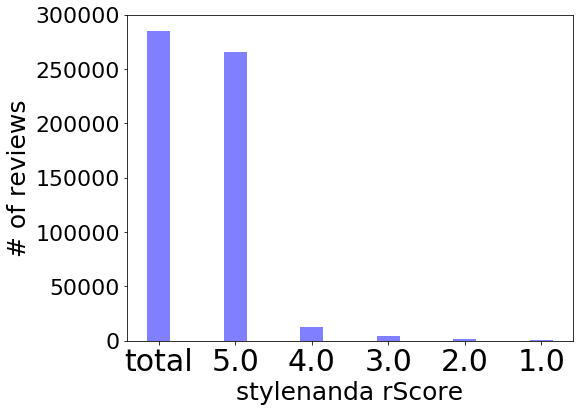

ratio 5.0: 93.174
ratio 4.0 : 4.346
ratio 3.0: 1.653
ratio 2.0 : 0.472
ratio 1.0 : 0.355


In [579]:
score = ('total', '5.0', '4.0', '3.0', '2.0', '1.0')
total=284833
score5= 265391
score4=12380
score3= 4708
score2= 1344
score1=1010
number_of_reviews = [total,
                     score5,
                     score4,
                     score3,
                     score2,
                     score1]

plt.bar(score, number_of_reviews, color=['blue'],
        width=0.3, alpha=0.5)
plt.xticks(score, fontsize=30)
plt.yticks(fontsize=22)
plt.ylabel('# of reviews', fontsize=25)
plt.rcParams["figure.figsize"] = (8,6)
plt.xlabel('stylenanda rScore', fontsize=25)
ax = plt.gca()
ax.set_ylim([0.0, 300000])
plt.show()


print ("ratio 5.0: " + str(short_float(1.0*(score5)*100/total)))
print ("ratio 4.0 : " + str(short_float(1.0*(score4)*100/total)))
print ("ratio 3.0: " + str(short_float(1.0*(score3)*100/total)))
print ("ratio 2.0 : " + str(short_float(1.0*(score2)*100/total)))
print ("ratio 1.0 : " + str(short_float(1.0*(score1)*100/total)))


In [564]:
sn_spammer2=[]
one_reviewer2=[]
for i in range(len(cid)):
    print(i+1),;print(u'번째 리뷰어');
    reviews=make_reviews(cid[i])
    make_morphs(reviews)
    term_fre(reviews)
    make_table(reviews)
    vectors=table_to_review_vector(reviews)
    if(len(reviews)>=2):
        over_count=review_similarity(vectors)
    else:
        print('one reviewer')
        one_reviewer2.append(cid[i])
        cnt=0
    
    if(over_count>=1):
        sn_spammer2.append(cid[i])

1 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.46)
('num of similarity=0.8 over : ', 98723)
('# of similarity=1 ', 76431)
('ratio of similarity=1: ', 25.883)
2 번째 리뷰어
('min', 0.087)
('max', 1.0)
('avg', 0.805)
('num of similarity=0.8 over : ', 139030)
('# of similarity=1 ', 45244)
('ratio of similarity=1: ', 17.676)
3 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.243)
('num of similarity=0.8 over : ', 880)
('# of similarity=1 ', 712)
('ratio of similarity=1: ', 0.39)
4 번째 리뷰어
('min', 0.005)
('max', 0.991)
('avg', 0.331)
('num of similarity=0.8 over : ', 9290)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.393)
('num of similarity=0.8 over : ', 470)
('# of similarity=1 ', 26)
('ratio of similarity=1: ', 0.02)
6 번째 리뷰어
('min', 0.098)
('max', 0.836)
('avg', 0.456)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.424)
('num of similarity=0.8 over :

('min', 0.045)
('max', 0.726)
('avg', 0.406)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
57 번째 리뷰어
('min', 0.0)
('max', 0.958)
('avg', 0.206)
('num of similarity=0.8 over : ', 57)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
58 번째 리뷰어
('min', 0.021)
('max', 0.959)
('avg', 0.744)
('num of similarity=0.8 over : ', 8980)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
59 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.274)
('num of similarity=0.8 over : ', 59)
('# of similarity=1 ', 22)
('ratio of similarity=1: ', 0.109)
60 번째 리뷰어
('min', 0.0)
('max', 0.716)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
61 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.817)
('num of similarity=0.8 over : ', 16160)
('# of similarity=1 ', 5245)
('ratio of similarity=1: ', 26.623)
62 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.373)
('num of similarity=0.8 over : ', 1)
('# of sim

('min', 0.226)
('max', 0.831)
('avg', 0.524)
('num of similarity=0.8 over : ', 36)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
112 번째 리뷰어
('min', 0.03)
('max', 0.754)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
113 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.276)
('num of similarity=0.8 over : ', 2061)
('# of similarity=1 ', 446)
('ratio of similarity=1: ', 3.642)
114 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.253)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 0.016)
115 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.244)
('num of similarity=0.8 over : ', 7)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 0.025)
116 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.397)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.008)
117 번째 리뷰어
('min', 0.0)
('max', 0.845)
('avg', 0.314)
('num of similarity=0.8 over : ', 9)
('# of simi

('min', 0.0)
('max', 1.0)
('avg', 0.315)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.012)
167 번째 리뷰어
('min', 0.026)
('max', 0.664)
('avg', 0.336)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
168 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.246)
('num of similarity=0.8 over : ', 11)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 0.025)
169 번째 리뷰어
('min', 0.041)
('max', 0.858)
('avg', 0.472)
('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
170 번째 리뷰어
('min', 0.0)
('max', 0.857)
('avg', 0.304)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
171 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.247)
('num of similarity=0.8 over : ', 281)
('# of similarity=1 ', 139)
('ratio of similarity=1: ', 1.765)
172 번째 리뷰어
('min', 0.0)
('max', 0.676)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('# of sim

('min', 0.053)
('max', 0.765)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
222 번째 리뷰어
('min', 0.068)
('max', 0.709)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
223 번째 리뷰어
('min', 0.017)
('max', 0.715)
('avg', 0.33)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
224 번째 리뷰어
('min', 0.0)
('max', 0.828)
('avg', 0.351)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
225 번째 리뷰어
('min', 0.074)
('max', 1.0)
('avg', 0.463)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.017)
226 번째 리뷰어
('min', 0.085)
('max', 0.993)
('avg', 0.486)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
227 번째 리뷰어
('min', 0.0)
('max', 0.707)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of simi

('min', 0.0)
('max', 0.962)
('avg', 0.214)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
277 번째 리뷰어
('min', 0.0)
('max', 0.696)
('avg', 0.263)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
278 번째 리뷰어
('min', 0.013)
('max', 0.857)
('avg', 0.402)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
279 번째 리뷰어
('min', 0.0)
('max', 0.761)
('avg', 0.169)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
280 번째 리뷰어
('min', 0.0)
('max', 0.766)
('avg', 0.177)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
281 번째 리뷰어
('min', 0.0)
('max', 0.639)
('avg', 0.196)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
282 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.213)
('num of similarity=0.8 over : ', 569)
('# of similarity=

('min', 0.0)
('max', 0.723)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
332 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.475)
('num of similarity=0.8 over : ', 1768)
('# of similarity=1 ', 1768)
('ratio of similarity=1: ', 46.186)
333 번째 리뷰어
('min', 0.0)
('max', 0.831)
('avg', 0.47)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
334 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.242)
('num of similarity=0.8 over : ', 47)
('# of similarity=1 ', 14)
('ratio of similarity=1: ', 0.366)
335 번째 리뷰어
('min', 0.0)
('max', 0.793)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
336 번째 리뷰어
('min', 0.0)
('max', 0.943)
('avg', 0.309)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
337 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.373)
('num of similarity=0.8 over : ', 37)
('# of simila

('min', 0.0)
('max', 1.0)
('avg', 0.307)
('num of similarity=0.8 over : ', 244)
('# of similarity=1 ', 124)
('ratio of similarity=1: ', 3.644)
387 번째 리뷰어
('min', 0.0)
('max', 0.943)
('avg', 0.236)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
388 번째 리뷰어
('min', 0.062)
('max', 1.0)
('avg', 0.404)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 0.088)
389 번째 리뷰어
('min', 0.032)
('max', 0.782)
('avg', 0.587)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
390 번째 리뷰어
('min', 0.11)
('max', 0.761)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
391 번째 리뷰어
('min', 0.062)
('max', 1.0)
('avg', 0.437)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.03)
392 번째 리뷰어
('min', 0.079)
('max', 0.894)
('avg', 0.507)
('num of similarity=0.8 over : ', 111)
('# of

('min', 0.0)
('max', 1.0)
('avg', 0.318)
('num of similarity=0.8 over : ', 117)
('# of similarity=1 ', 22)
('ratio of similarity=1: ', 0.733)
442 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.409)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 0.068)
443 번째 리뷰어
('min', 0.0)
('max', 0.722)
('avg', 0.307)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
444 번째 리뷰어
('min', 0.0)
('max', 0.894)
('avg', 0.31)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
445 번째 리뷰어
('min', 0.121)
('max', 0.716)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
446 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.344)
('num of similarity=0.8 over : ', 25)
('# of similarity=1 ', 12)
('ratio of similarity=1: ', 0.41)
447 번째 리뷰어
('min', 0.115)
('max', 0.772)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of simila

('min', 0.05)
('max', 0.668)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
497 번째 리뷰어
('min', 0.121)
('max', 0.82)
('avg', 0.407)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
498 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.294)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.038)
499 번째 리뷰어
('min', 0.131)
('max', 0.713)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
500 번째 리뷰어
('min', 0.077)
('max', 0.991)
('avg', 0.475)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
501 번째 리뷰어
('min', 0.0)
('max', 0.844)
('avg', 0.431)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
502 번째 리뷰어
('min', 0.0)
('max', 0.984)
('avg', 0.315)
('num of similarity=0.8 over : ', 1)
('# of similar

('min', 0.0)
('max', 0.838)
('avg', 0.274)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
552 번째 리뷰어
('min', 0.143)
('max', 0.825)
('avg', 0.49)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
553 번째 리뷰어
('min', 0.0)
('max', 0.727)
('avg', 0.42)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
554 번째 리뷰어
('min', 0.0)
('max', 0.95)
('avg', 0.402)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
555 번째 리뷰어
('min', 0.12)
('max', 0.679)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
556 번째 리뷰어
('min', 0.0)
('max', 0.943)
('avg', 0.322)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
557 번째 리뷰어
('min', 0.046)
('max', 0.629)
('avg', 0.305)
('num of similarity=0.8 over : ', 0)
('# of similarity=

('min', 0.019)
('max', 0.774)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
607 번째 리뷰어
('min', 0.031)
('max', 0.694)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
608 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.413)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.05)
609 번째 리뷰어
('min', 0.077)
('max', 0.63)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
610 번째 리뷰어
('min', 0.0)
('max', 0.843)
('avg', 0.411)
('num of similarity=0.8 over : ', 11)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
611 번째 리뷰어
('min', 0.032)
('max', 0.725)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
612 번째 리뷰어
('min', 0.132)
('max', 0.695)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of simi

('min', 0.0)
('max', 0.894)
('avg', 0.249)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
663 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.238)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.055)
664 번째 리뷰어
('min', 0.05)
('max', 0.765)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
665 번째 리뷰어
('min', 0.0)
('max', 0.712)
('avg', 0.323)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
666 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.238)
('num of similarity=0.8 over : ', 212)
('# of similarity=1 ', 190)
('ratio of similarity=1: ', 10.383)
667 번째 리뷰어
('min', 0.0)
('max', 0.75)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
668 번째 리뷰어
('min', 0.0)
('max', 0.627)
('avg', 0.288)
('num of similarity=0.8 over : ', 0)
('# of similari

('min', 0.021)
('max', 1.0)
('avg', 0.385)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.06)
718 번째 리뷰어
('min', 0.0)
('max', 0.837)
('avg', 0.182)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
719 번째 리뷰어
('min', 0.0)
('max', 0.772)
('avg', 0.275)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
720 번째 리뷰어
('min', 0.0)
('max', 0.782)
('avg', 0.317)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
721 번째 리뷰어
('min', 0.0)
('max', 0.911)
('avg', 0.401)
('num of similarity=0.8 over : ', 49)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
722 번째 리뷰어
('min', 0.0)
('max', 0.674)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
723 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.167)
('num of similarity=0.8 over : ', 14)
('# of similarity=1

('min', 0.021)
('max', 0.97)
('avg', 0.38)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
773 번째 리뷰어
('min', 0.0)
('max', 0.816)
('avg', 0.253)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
774 번째 리뷰어
('min', 0.0)
('max', 0.746)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
775 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.404)
('num of similarity=0.8 over : ', 281)
('# of similarity=1 ', 279)
('ratio of similarity=1: ', 18.788)
776 번째 리뷰어
('min', 0.047)
('max', 0.734)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
777 번째 리뷰어
('min', 0.062)
('max', 0.993)
('avg', 0.49)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
778 번째 리뷰어
('min', 0.043)
('max', 0.899)
('avg', 0.395)
('num of similarity=0.8 over : ', 2)
('# of sim

('min', 0.0)
('max', 0.63)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
828 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.197)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.073)
829 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.254)
('num of similarity=0.8 over : ', 41)
('# of similarity=1 ', 4)
('ratio of similarity=1: ', 0.29)
830 번째 리뷰어
('min', 0.122)
('max', 0.797)
('avg', 0.522)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
831 번째 리뷰어
('min', 0.178)
('max', 1.0)
('avg', 0.601)
('num of similarity=0.8 over : ', 484)
('# of similarity=1 ', 485)
('ratio of similarity=1: ', 35.196)
832 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.075)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 4)
('ratio of similarity=1: ', 0.29)
833 번째 리뷰어
('min', 0.061)
('max', 0.787)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
('# of simi

('min', 0.0)
('max', 0.711)
('avg', 0.252)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
883 번째 리뷰어
('min', 0.0)
('max', 0.686)
('avg', 0.28)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
884 번째 리뷰어
('min', 0.0)
('max', 0.775)
('avg', 0.26)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
885 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.273)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.078)
886 번째 리뷰어
('min', 0.118)
('max', 0.709)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
887 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.247)
('num of similarity=0.8 over : ', 11)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.078)
888 번째 리뷰어
('min', 0.085)
('max', 0.806)
('avg', 0.405)
('num of similarity=0.8 over : ', 1)
('# of similarity

('min', 0.0)
('max', 0.696)
('avg', 0.243)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
938 번째 리뷰어
('min', 0.0)
('max', 0.803)
('avg', 0.402)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
939 번째 리뷰어
('min', 0.0)
('max', 0.684)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
940 번째 리뷰어
('min', 0.056)
('max', 0.753)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
941 번째 리뷰어
('min', 0.02)
('max', 0.986)
('avg', 0.339)
('num of similarity=0.8 over : ', 15)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
942 번째 리뷰어
('min', 0.106)
('max', 0.646)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
943 번째 리뷰어
('min', 0.122)
('max', 0.767)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of simil

('min', 0.0)
('max', 0.857)
('avg', 0.308)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
993 번째 리뷰어
('min', 0.027)
('max', 0.748)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
994 번째 리뷰어
('min', 0.0)
('max', 0.813)
('avg', 0.316)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
995 번째 리뷰어
('min', 0.09)
('max', 0.786)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
996 번째 리뷰어
('min', 0.171)
('max', 0.805)
('avg', 0.503)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
997 번째 리뷰어
('min', 0.0)
('max', 0.979)
('avg', 0.242)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
998 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.116)
('num of similarity=0.8 over : ', 5)
('# of similarity

('min', 0.0)
('max', 1.0)
('avg', 0.297)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.101)
1047 번째 리뷰어
('min', 0.11)
('max', 0.709)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1048 번째 리뷰어
('min', 0.0)
('max', 0.667)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1049 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.18)
('num of similarity=0.8 over : ', 77)
('# of similarity=1 ', 78)
('ratio of similarity=1: ', 7.879)
1050 번째 리뷰어
('min', 0.037)
('max', 0.695)
('avg', 0.33)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1051 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.326)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.101)
1052 번째 리뷰어
('min', 0.0)
('max', 0.724)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of simi

('min', 0.0)
('max', 0.785)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1101 번째 리뷰어
('min', 0.012)
('max', 0.811)
('avg', 0.375)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1102 번째 리뷰어
('min', 0.036)
('max', 0.962)
('avg', 0.442)
('num of similarity=0.8 over : ', 13)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1103 번째 리뷰어
('min', 0.119)
('max', 0.706)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1104 번째 리뷰어
('min', 0.042)
('max', 0.69)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1105 번째 리뷰어
('min', 0.048)
('max', 0.987)
('avg', 0.34)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1106 번째 리뷰어
('min', 0.0)
('max', 0.675)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.0)
('max', 1.0)
('avg', 0.305)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 0.348)
1155 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.29)
('num of similarity=0.8 over : ', 20)
('# of similarity=1 ', 18)
('ratio of similarity=1: ', 2.091)
1156 번째 리뷰어
('min', 0.0)
('max', 0.706)
('avg', 0.335)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1157 번째 리뷰어
('min', 0.07)
('max', 0.592)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1158 번째 리뷰어
('min', 0.129)
('max', 0.702)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1159 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.291)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.116)
1160 번째 리뷰어
('min', 0.0)
('max', 0.73)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of simi

('min', 0.0)
('max', 0.768)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1209 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.275)
('num of similarity=0.8 over : ', 11)
('# of similarity=1 ', 12)
('ratio of similarity=1: ', 1.463)
1210 번째 리뷰어
('min', 0.05)
('max', 0.764)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1211 번째 리뷰어
('min', 0.165)
('max', 0.992)
('avg', 0.433)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1212 번째 리뷰어
('min', 0.0)
('max', 0.554)
('avg', 0.245)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1213 번째 리뷰어
('min', 0.046)
('max', 0.779)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1214 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.268)
('num of similarity=0.8 over : ', 1)
('# of simi

('min', 0.191)
('max', 0.701)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1263 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.247)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.135)
1264 번째 리뷰어
('min', 0.0)
('max', 0.722)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1265 번째 리뷰어
('min', 0.072)
('max', 0.767)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1266 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.371)
('num of similarity=0.8 over : ', 35)
('# of similarity=1 ', 16)
('ratio of similarity=1: ', 2.159)
1267 번째 리뷰어
('min', 0.05)
('max', 0.78)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1268 번째 리뷰어
('min', 0.0)
('max', 0.642)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of s

('min', 0.033)
('max', 0.822)
('avg', 0.341)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1317 번째 리뷰어
('min', 0.098)
('max', 0.666)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1318 번째 리뷰어
('min', 0.102)
('max', 1.0)
('avg', 0.378)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.142)
1319 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.18)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.142)
1320 번째 리뷰어
('min', 0.0)
('max', 0.816)
('avg', 0.32)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1321 번째 리뷰어
('min', 0.369)
('max', 1.0)
('avg', 0.581)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.142)
1322 번째 리뷰어
('min', 0.0)
('max', 0.684)
('avg', 0.285)
('num of similarity=0.8 over : ', 0)
('# of s

('min', 0.011)
('max', 0.873)
('avg', 0.414)
('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1371 번째 리뷰어
('min', 0.0)
('max', 0.655)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1372 번째 리뷰어
('min', 0.374)
('max', 1.0)
('avg', 0.659)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.15)
1373 번째 리뷰어
('min', 0.117)
('max', 0.675)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1374 번째 리뷰어
('min', 0.076)
('max', 0.75)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1375 번째 리뷰어
('min', 0.053)
('max', 0.774)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1376 번째 리뷰어
('min', 0.0)
('max', 0.781)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.149)
('max', 0.862)
('avg', 0.57)
('num of similarity=0.8 over : ', 28)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1426 번째 리뷰어
('min', 0.066)
('max', 0.63)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1427 번째 리뷰어
('min', 0.0)
('max', 0.723)
('avg', 0.237)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1428 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.268)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 0.476)
1429 번째 리뷰어
('min', 0.06)
('max', 0.78)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1430 번째 리뷰어
('min', 0.18)
('max', 1.0)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.159)
1431 번째 리뷰어
('min', 0.363)
('max', 0.794)
('avg', 0.616)
('num of similarity=0.8 over : ', 0)
('# of si

('min', 0.08)
('max', 0.734)
('avg', 0.462)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1480 번째 리뷰어
('min', 0.0)
('max', 0.715)
('avg', 0.28)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1481 번째 리뷰어
('min', 0.147)
('max', 0.751)
('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1482 번째 리뷰어
('min', 0.048)
('max', 1.0)
('avg', 0.377)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.168)
1483 번째 리뷰어
('min', 0.0)
('max', 0.964)
('avg', 0.376)
('num of similarity=0.8 over : ', 32)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1484 번째 리뷰어
('min', 0.098)
('max', 0.987)
('avg', 0.424)
('num of similarity=0.8 over : ', 23)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1485 번째 리뷰어
('min', 0.05)
('max', 0.782)
('avg', 0.505)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.155)
('max', 0.83)
('avg', 0.534)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1534 번째 리뷰어
('min', 0.022)
('max', 0.603)
('avg', 0.293)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1535 번째 리뷰어
('min', 0.0)
('max', 0.813)
('avg', 0.389)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1536 번째 리뷰어
('min', 0.161)
('max', 0.724)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1537 번째 리뷰어
('min', 0.057)
('max', 0.59)
('avg', 0.307)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1538 번째 리뷰어
('min', 0.0)
('max', 0.898)
('avg', 0.363)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1539 번째 리뷰어
('min', 0.142)
('max', 0.726)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.109)
('max', 0.669)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1588 번째 리뷰어
('min', 0.0)
('max', 0.884)
('avg', 0.3)
('num of similarity=0.8 over : ', 7)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1589 번째 리뷰어
('min', 0.18)
('max', 0.789)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1590 번째 리뷰어
('min', 0.056)
('max', 0.729)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1591 번째 리뷰어
('min', 0.0)
('max', 0.614)
('avg', 0.268)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1592 번째 리뷰어
('min', 0.0)
('max', 0.802)
('avg', 0.347)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1593 번째 리뷰어
('min', 0.036)
('max', 1.0)
('avg', 0.301)
('num of similarity=0.8 over : ', 2)
('# of simi

('min', 0.112)
('max', 0.645)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1642 번째 리뷰어
('min', 0.106)
('max', 0.656)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1643 번째 리뷰어
('min', 0.029)
('max', 0.685)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1644 번째 리뷰어
('min', 0.176)
('max', 0.694)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1645 번째 리뷰어
('min', 0.0)
('max', 0.686)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1646 번째 리뷰어
('min', 0.067)
('max', 0.813)
('avg', 0.418)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1647 번째 리뷰어
('min', 0.0)
('max', 0.709)
('avg', 0.281)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.345)
('max', 0.98)
('avg', 0.562)
('num of similarity=0.8 over : ', 8)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1696 번째 리뷰어
('min', 0.224)
('max', 1.0)
('avg', 0.853)
('num of similarity=0.8 over : ', 404)
('# of similarity=1 ', 326)
('ratio of similarity=1: ', 65.726)
1697 번째 리뷰어
('min', 0.061)
('max', 0.756)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1698 번째 리뷰어
('min', 0.0)
('max', 0.625)
('avg', 0.191)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1699 번째 리뷰어
('min', 0.027)
('max', 0.822)
('avg', 0.325)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1700 번째 리뷰어
('min', 0.064)
('max', 0.997)
('avg', 0.497)
('num of similarity=0.8 over : ', 46)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1701 번째 리뷰어
('min', 0.098)
('max', 0.638)
('avg', 0.395)
('num of similarity=0.8 over : ', 

('min', 0.18)
('max', 0.709)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1750 번째 리뷰어
('min', 0.032)
('max', 0.651)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1751 번째 리뷰어
('min', 0.0)
('max', 0.842)
('avg', 0.407)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1752 번째 리뷰어
('min', 0.031)
('max', 0.751)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1753 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.313)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 0.43)
1754 번째 리뷰어
('min', 0.0)
('max', 0.884)
('avg', 0.294)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1755 번째 리뷰어
('min', 0.075)
('max', 0.663)
('avg', 0.367)
('num of similarity=0.8 over : ', 0)
('# of si

('min', 0.134)
('max', 1.0)
('avg', 0.385)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.23)
1804 번째 리뷰어
('min', 0.0)
('max', 0.701)
('avg', 0.251)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1805 번째 리뷰어
('min', 0.068)
('max', 0.619)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1806 번째 리뷰어
('min', 0.042)
('max', 0.64)
('avg', 0.327)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1807 번째 리뷰어
('min', 0.0)
('max', 0.708)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1808 번째 리뷰어
('min', 0.1)
('max', 0.869)
('avg', 0.434)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1809 번째 리뷰어
('min', 0.0)
('max', 0.866)
('avg', 0.21)
('num of similarity=0.8 over : ', 1)
('# of simi

('min', 0.252)
('max', 0.758)
('avg', 0.494)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1858 번째 리뷰어
('min', 0.155)
('max', 0.698)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1859 번째 리뷰어
('min', 0.042)
('max', 0.866)
('avg', 0.367)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1860 번째 리뷰어
('min', 0.127)
('max', 0.68)
('avg', 0.375)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1861 번째 리뷰어
('min', 0.044)
('max', 0.829)
('avg', 0.474)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1862 번째 리뷰어
('min', 0.234)
('max', 0.958)
('avg', 0.558)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1863 번째 리뷰어
('min', 0.074)
('max', 0.76)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('

('min', 0.038)
('max', 0.683)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1912 번째 리뷰어
('min', 0.0)
('max', 0.667)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1913 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.372)
('num of similarity=0.8 over : ', 98)
('# of similarity=1 ', 96)
('ratio of similarity=1: ', 23.645)
1914 번째 리뷰어
('min', 0.065)
('max', 0.711)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1915 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.69)
('num of similarity=0.8 over : ', 233)
('# of similarity=1 ', 211)
('ratio of similarity=1: ', 51.97)
1916 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.364)
('num of similarity=0.8 over : ', 16)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 1.478)
1917 번째 리뷰어
('min', 0.0)
('max', 0.778)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.0)
('max', 1.0)
('avg', 0.16)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.246)
1966 번째 리뷰어
('min', 0.012)
('max', 0.7)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1967 번째 리뷰어
('min', 0.0)
('max', 0.849)
('avg', 0.186)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1968 번째 리뷰어
('min', 0.109)
('max', 0.797)
('avg', 0.426)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1969 번째 리뷰어
('min', 0.073)
('max', 0.957)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1970 번째 리뷰어
('min', 0.275)
('max', 0.992)
('avg', 0.53)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
1971 번째 리뷰어
('min', 0.117)
('max', 0.992)
('avg', 0.504)
('num of similarity=0.8 over : ', 57)
('# of 

('min', 0.0)
('max', 0.758)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2020 번째 리뷰어
('min', 0.273)
('max', 0.775)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2021 번째 리뷰어
('min', 0.0)
('max', 0.646)
('avg', 0.269)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2022 번째 리뷰어
('min', 0.236)
('max', 0.734)
('avg', 0.469)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2023 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.283)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.265)
2024 번째 리뷰어
('min', 0.115)
('max', 0.691)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2025 번째 리뷰어
('min', 0.0)
('max', 0.771)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of s

('min', 0.127)
('max', 0.807)
('avg', 0.456)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2074 번째 리뷰어
('min', 0.141)
('max', 0.712)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2075 번째 리뷰어
('min', 0.0)
('max', 0.727)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2076 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.342)
('num of similarity=0.8 over : ', 66)
('# of similarity=1 ', 39)
('ratio of similarity=1: ', 10.317)
2077 번째 리뷰어
('min', 0.0)
('max', 0.816)
('avg', 0.173)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2078 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.162)
('num of similarity=0.8 over : ', 13)
('# of similarity=1 ', 8)
('ratio of similarity=1: ', 2.116)
2079 번째 리뷰어
('min', 0.132)
('max', 0.694)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.0)
('max', 0.885)
('avg', 0.19)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2128 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.155)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 0.855)
2129 번째 리뷰어
('min', 0.004)
('max', 0.782)
('avg', 0.325)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2130 번째 리뷰어
('min', 0.035)
('max', 0.544)
('avg', 0.245)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2131 번째 리뷰어
('min', 0.338)
('max', 0.734)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2132 번째 리뷰어
('min', 0.488)
('max', 0.85)
('avg', 0.71)
('num of similarity=0.8 over : ', 55)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2133 번째 리뷰어
('min', 0.092)
('max', 0.929)
('avg', 0.502)
('num of similarity=0.8 over : ', 20)
('# o

('min', 0.13)
('max', 0.706)
('avg', 0.45)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2182 번째 리뷰어
('min', 0.068)
('max', 0.746)
('avg', 0.308)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2183 번째 리뷰어
('min', 0.117)
('max', 0.996)
('avg', 0.404)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2184 번째 리뷰어
('min', 0.17)
('max', 0.687)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2185 번째 리뷰어
('min', 0.087)
('max', 0.742)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2186 번째 리뷰어
('min', 0.056)
('max', 0.991)
('avg', 0.347)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2187 번째 리뷰어
('min', 0.0)
('max', 0.662)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.164)
('max', 0.737)
('avg', 0.477)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2236 번째 리뷰어
('min', 0.113)
('max', 0.636)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2237 번째 리뷰어
('min', 0.049)
('max', 1.0)
('avg', 0.302)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.308)
2238 번째 리뷰어
('min', 0.055)
('max', 0.686)
('avg', 0.337)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2239 번째 리뷰어
('min', 0.043)
('max', 0.684)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2240 번째 리뷰어
('min', 0.017)
('max', 0.804)
('avg', 0.303)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2241 번째 리뷰어
('min', 0.075)
('max', 1.0)
('avg', 0.332)
('num of similarity=0.8 over : ', 1)
('#

('min', 0.144)
('max', 0.676)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2290 번째 리뷰어
('min', 0.024)
('max', 0.814)
('avg', 0.338)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2291 번째 리뷰어
('min', 0.0)
('max', 0.688)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2292 번째 리뷰어
('min', 0.146)
('max', 0.785)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2293 번째 리뷰어
('min', 0.192)
('max', 1.0)
('avg', 0.487)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 0.667)
2294 번째 리뷰어
('min', 0.0)
('max', 0.613)
('avg', 0.313)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2295 번째 리뷰어
('min', 0.047)
('max', 0.989)
('avg', 0.379)
('num of similarity=0.8 over : ', 1)
('# 

('min', 0.0)
('max', 0.729)
('avg', 0.317)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2344 번째 리뷰어
('min', 0.056)
('max', 0.74)
('avg', 0.45)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2345 번째 리뷰어
('min', 0.0)
('max', 0.695)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2346 번째 리뷰어
('min', 0.247)
('max', 0.774)
('avg', 0.512)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2347 번째 리뷰어
('min', 0.048)
('max', 1.0)
('avg', 0.327)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 1.0)
2348 번째 리뷰어
('min', 0.077)
('max', 0.713)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2349 번째 리뷰어
('min', 0.149)
('max', 0.966)
('avg', 0.429)
('num of similarity=0.8 over : ', 1)
('# of si

('min', 0.058)
('max', 0.686)
('avg', 0.357)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2398 번째 리뷰어
('min', 0.064)
('max', 0.571)
('avg', 0.308)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2399 번째 리뷰어
('min', 0.0)
('max', 0.694)
('avg', 0.297)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2400 번째 리뷰어
('min', 0.085)
('max', 0.596)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2401 번째 리뷰어
('min', 0.175)
('max', 0.682)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2402 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.747)
('num of similarity=0.8 over : ', 199)
('# of similarity=1 ', 58)
('ratio of similarity=1: ', 19.333)
2403 번째 리뷰어
('min', 0.124)
('max', 0.703)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)


('min', 0.128)
('max', 0.656)
('avg', 0.42)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2452 번째 리뷰어
('min', 0.001)
('max', 1.0)
('avg', 0.309)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.362)
2453 번째 리뷰어
('min', 0.0)
('max', 0.71)
('avg', 0.228)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2454 번째 리뷰어
('min', 0.175)
('max', 0.74)
('avg', 0.445)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2455 번째 리뷰어
('min', 0.333)
('max', 0.837)
('avg', 0.595)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2456 번째 리뷰어
('min', 0.189)
('max', 0.822)
('avg', 0.463)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2457 번째 리뷰어
('min', 0.067)
('max', 1.0)
('avg', 0.482)
('num of similarity=0.8 over : ', 26)
('# of

('min', 0.142)
('max', 0.969)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2506 번째 리뷰어
('min', 0.0)
('max', 0.839)
('avg', 0.506)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2507 번째 리뷰어
('min', 0.0)
('max', 0.687)
('avg', 0.321)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2508 번째 리뷰어
('min', 0.0)
('max', 0.591)
('avg', 0.241)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2509 번째 리뷰어
('min', 0.294)
('max', 0.844)
('avg', 0.64)
('num of similarity=0.8 over : ', 14)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2510 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.312)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.362)
2511 번째 리뷰어
('min', 0.132)
('max', 0.53)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of si

('min', 0.0)
('max', 1.0)
('avg', 0.328)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.395)
2560 번째 리뷰어
('min', 0.13)
('max', 0.795)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2561 번째 리뷰어
('min', 0.075)
('max', 0.8)
('avg', 0.464)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2562 번째 리뷰어
('min', 0.021)
('max', 0.857)
('avg', 0.573)
('num of similarity=0.8 over : ', 8)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2563 번째 리뷰어
('min', 0.049)
('max', 0.565)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2564 번째 리뷰어
('min', 0.246)
('max', 1.0)
('avg', 0.427)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.395)
2565 번째 리뷰어
('min', 0.336)
('max', 0.723)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.0)
('max', 0.71)
('avg', 0.325)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2614 번째 리뷰어
('min', 0.0)
('max', 0.919)
('avg', 0.247)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2615 번째 리뷰어
('min', 0.0)
('max', 0.667)
('avg', 0.209)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2616 번째 리뷰어
('min', 0.365)
('max', 0.738)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2617 번째 리뷰어
('min', 0.023)
('max', 1.0)
('avg', 0.318)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 1.186)
2618 번째 리뷰어
('min', 0.221)
('max', 0.704)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2619 번째 리뷰어
('min', 0.0)
('max', 0.857)
('avg', 0.336)
('num of similarity=0.8 over : ', 2)
('# of si

('min', 0.0)
('max', 0.728)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2668 번째 리뷰어
('min', 0.201)
('max', 0.652)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2669 번째 리뷰어
('min', 0.066)
('max', 0.606)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2670 번째 리뷰어
('min', 0.031)
('max', 0.663)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2671 번째 리뷰어
('min', 0.187)
('max', 0.611)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2672 번째 리뷰어
('min', 0.0)
('max', 0.624)
('avg', 0.234)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2673 번째 리뷰어
('min', 0.004)
('max', 0.963)
('avg', 0.318)
('num of similarity=0.8 over : ', 6)
('# o

('min', 0.153)
('max', 0.767)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2722 번째 리뷰어
('min', 0.065)
('max', 0.593)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2723 번째 리뷰어
('min', 0.177)
('max', 0.673)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2724 번째 리뷰어
('min', 0.234)
('max', 0.731)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2725 번째 리뷰어
('min', 0.037)
('max', 1.0)
('avg', 0.348)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.433)
2726 번째 리뷰어
('min', 0.214)
('max', 0.756)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2727 번째 리뷰어
('min', 0.041)
('max', 0.62)
('avg', 0.294)
('num of similarity=0.8 over : ', 0)
('

('min', 0.038)
('max', 0.693)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2776 번째 리뷰어
('min', 0.073)
('max', 0.87)
('avg', 0.38)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2777 번째 리뷰어
('min', 0.05)
('max', 0.641)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2778 번째 리뷰어
('min', 0.0)
('max', 0.693)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2779 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.425)
('num of similarity=0.8 over : ', 12)
('# of similarity=1 ', 10)
('ratio of similarity=1: ', 4.329)
2780 번째 리뷰어
('min', 0.18)
('max', 0.73)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2781 번째 리뷰어
('min', 0.0)
('max', 0.574)
('avg', 0.277)
('num of similarity=0.8 over : ', 0)
('# of si

('min', 0.058)
('max', 0.65)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2830 번째 리뷰어
('min', 0.0)
('max', 0.667)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2831 번째 리뷰어
('min', 0.0)
('max', 0.668)
('avg', 0.21)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2832 번째 리뷰어
('min', 0.134)
('max', 0.628)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2833 번째 리뷰어
('min', 0.202)
('max', 0.905)
('avg', 0.47)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2834 번째 리뷰어
('min', 0.313)
('max', 0.748)
('avg', 0.573)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2835 번째 리뷰어
('min', 0.267)
('max', 0.734)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of 

('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2884 번째 리뷰어
('min', 0.03)
('max', 0.645)
('avg', 0.296)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2885 번째 리뷰어
('min', 0.136)
('max', 0.754)
('avg', 0.423)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2886 번째 리뷰어
('min', 0.218)
('max', 1.0)
('avg', 0.419)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.476)
2887 번째 리뷰어
('min', 0.0)
('max', 0.697)
('avg', 0.158)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2888 번째 리뷰어
('min', 0.121)
('max', 0.812)
('avg', 0.399)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2889 번째 리뷰어
('min', 0.0)
('max', 0.722)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio o

('min', 0.448)
('max', 0.752)
('avg', 0.612)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2940 번째 리뷰어
('min', 0.143)
('max', 0.625)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2941 번째 리뷰어
('min', 0.099)
('max', 0.767)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2942 번째 리뷰어
('min', 0.0)
('max', 0.818)
('avg', 0.201)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2943 번째 리뷰어
('min', 0.0)
('max', 0.743)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2944 번째 리뷰어
('min', 0.094)
('max', 0.641)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2945 번째 리뷰어
('min', 0.097)
('max', 0.798)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.062)
('max', 0.684)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2994 번째 리뷰어
('min', 0.0)
('max', 0.949)
('avg', 0.186)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2995 번째 리뷰어
('min', 0.275)
('max', 0.996)
('avg', 0.461)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2996 번째 리뷰어
('min', 0.029)
('max', 0.573)
('avg', 0.249)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2997 번째 리뷰어
('min', 0.032)
('max', 0.643)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2998 번째 리뷰어
('min', 0.218)
('max', 0.694)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
2999 번째 리뷰어
('min', 0.0)
('max', 0.963)
('avg', 0.326)
('num of similarity=0.8 over : ', 1)
('# 

('min', 0.066)
('max', 0.76)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3049 번째 리뷰어
('min', 0.155)
('max', 0.998)
('avg', 0.434)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3050 번째 리뷰어
('min', 0.126)
('max', 0.763)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3051 번째 리뷰어
('min', 0.315)
('max', 0.685)
('avg', 0.526)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3052 번째 리뷰어
('min', 0.103)
('max', 0.913)
('avg', 0.454)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3053 번째 리뷰어
('min', 0.032)
('max', 0.734)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3054 번째 리뷰어
('min', 0.0)
('max', 0.68)
('avg', 0.364)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.13)
('max', 0.68)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3104 번째 리뷰어
('min', 0.053)
('max', 0.587)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3105 번째 리뷰어
('min', 0.091)
('max', 0.627)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3106 번째 리뷰어
('min', 0.032)
('max', 0.844)
('avg', 0.352)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3107 번째 리뷰어
('min', 0.126)
('max', 0.805)
('avg', 0.37)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3108 번째 리뷰어
('min', 0.013)
('max', 0.673)
('avg', 0.262)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3109 번째 리뷰어
('min', 0.123)
('max', 0.647)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.258)
('max', 0.719)
('avg', 0.479)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3158 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.443)
('num of similarity=0.8 over : ', 24)
('# of similarity=1 ', 21)
('ratio of similarity=1: ', 11.053)
3159 번째 리뷰어
('min', 0.191)
('max', 0.769)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3160 번째 리뷰어
('min', 0.0)
('max', 0.628)
('avg', 0.226)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3161 번째 리뷰어
('min', 0.297)
('max', 0.636)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3162 번째 리뷰어
('min', 0.138)
('max', 0.854)
('avg', 0.577)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3163 번째 리뷰어
('min', 0.242)
('max', 0.63)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('

('min', 0.153)
('max', 0.879)
('avg', 0.437)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3212 번째 리뷰어
('min', 0.404)
('max', 0.838)
('avg', 0.665)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3213 번째 리뷰어
('min', 0.166)
('max', 0.638)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3214 번째 리뷰어
('min', 0.224)
('max', 0.652)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3215 번째 리뷰어
('min', 0.165)
('max', 0.731)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3216 번째 리뷰어
('min', 0.045)
('max', 0.613)
('avg', 0.322)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3217 번째 리뷰어
('min', 0.057)
('max', 0.949)
('avg', 0.302)
('num of similarity=0.8 over : ', 1)


('min', 0.0)
('max', 0.669)
('avg', 0.27)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3266 번째 리뷰어
('min', 0.101)
('max', 0.6)
('avg', 0.366)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3267 번째 리뷰어
('min', 0.208)
('max', 0.692)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3268 번째 리뷰어
('min', 0.0)
('max', 0.733)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3269 번째 리뷰어
('min', 0.021)
('max', 0.906)
('avg', 0.49)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3270 번째 리뷰어
('min', 0.0)
('max', 0.645)
('avg', 0.218)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3271 번째 리뷰어
('min', 0.0)
('max', 0.783)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of simil

('min', 0.0)
('max', 0.581)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3321 번째 리뷰어
('min', 0.23)
('max', 0.645)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3322 번째 리뷰어
('min', 0.037)
('max', 0.737)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3323 번째 리뷰어
('min', 0.202)
('max', 0.725)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3324 번째 리뷰어
('min', 0.176)
('max', 0.648)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3325 번째 리뷰어
('min', 0.246)
('max', 0.741)
('avg', 0.493)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3326 번째 리뷰어
('min', 0.146)
('max', 0.767)
('avg', 0.532)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.056)
('max', 0.635)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3375 번째 리뷰어
('min', 0.042)
('max', 1.0)
('avg', 0.364)
('num of similarity=0.8 over : ', 13)
('# of similarity=1 ', 11)
('ratio of similarity=1: ', 7.19)
3376 번째 리뷰어
('min', 0.269)
('max', 0.682)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3377 번째 리뷰어
('min', 0.0)
('max', 0.617)
('avg', 0.305)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3378 번째 리뷰어
('min', 0.0)
('max', 0.575)
('avg', 0.252)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3379 번째 리뷰어
('min', 0.236)
('max', 0.676)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3380 번째 리뷰어
('min', 0.0)
('max', 0.655)
('avg', 0.27)
('num of similarity=0.8 over : ', 0)
('# of

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3429 번째 리뷰어
('min', 0.0)
('max', 0.716)
('avg', 0.193)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3430 번째 리뷰어
('min', 0.228)
('max', 0.822)
('avg', 0.615)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3431 번째 리뷰어
('min', 0.09)
('max', 0.576)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3432 번째 리뷰어
('min', 0.077)
('max', 0.68)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3433 번째 리뷰어
('min', 0.042)
('max', 0.698)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3434 번째 리뷰어
('min', 0.182)
('max', 0.592)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3435 번째 리뷰어
('min', 0.073)


('min', 0.191)
('max', 0.671)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3484 번째 리뷰어
('min', 0.036)
('max', 0.596)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3485 번째 리뷰어
('min', 0.217)
('max', 0.791)
('avg', 0.566)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3486 번째 리뷰어
('min', 0.086)
('max', 0.756)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3487 번째 리뷰어
('min', 0.067)
('max', 0.624)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3488 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.419)
('num of similarity=0.8 over : ', 23)
('# of similarity=1 ', 21)
('ratio of similarity=1: ', 13.725)
3489 번째 리뷰어
('min', 0.0)
('max', 0.617)
('avg', 0.228)
('num of similarity=0.8 over : ', 0)
(

('min', 0.0)
('max', 0.684)
('avg', 0.253)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3539 번째 리뷰어
('min', 0.053)
('max', 0.669)
('avg', 0.341)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3540 번째 리뷰어
('min', 0.048)
('max', 0.517)
('avg', 0.293)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3541 번째 리뷰어
('min', 0.061)
('max', 1.0)
('avg', 0.361)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.654)
3542 번째 리뷰어
('min', 0.024)
('max', 0.617)
('avg', 0.285)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3543 번째 리뷰어
('min', 0.045)
('max', 0.735)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3544 번째 리뷰어
('min', 0.333)
('max', 0.761)
('avg', 0.578)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.025)
('max', 0.847)
('avg', 0.508)
('num of similarity=0.8 over : ', 8)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3593 번째 리뷰어
('min', 0.184)
('max', 0.701)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3594 번째 리뷰어
('min', 0.03)
('max', 0.683)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3595 번째 리뷰어
('min', 0.0)
('max', 0.645)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3596 번째 리뷰어
('min', 0.073)
('max', 1.0)
('avg', 0.498)
('num of similarity=0.8 over : ', 12)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.735)
3597 번째 리뷰어
('min', 0.102)
('max', 1.0)
('avg', 0.345)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.735)
3598 번째 리뷰어
('min', 0.203)
('max', 0.623)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('

('min', 0.241)
('max', 0.723)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3647 번째 리뷰어
('min', 0.079)
('max', 0.913)
('avg', 0.277)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3648 번째 리뷰어
('min', 0.067)
('max', 0.605)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3649 번째 리뷰어
('min', 0.0)
('max', 0.594)
('avg', 0.234)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3650 번째 리뷰어
('min', 0.0)
('max', 0.615)
('avg', 0.322)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3651 번째 리뷰어
('min', 0.0)
('max', 0.822)
('avg', 0.263)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3652 번째 리뷰어
('min', 0.033)
('max', 0.729)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.0)
('max', 0.638)
('avg', 0.279)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3701 번째 리뷰어
('min', 0.196)
('max', 0.619)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3702 번째 리뷰어
('min', 0.107)
('max', 0.732)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3703 번째 리뷰어
('min', 0.112)
('max', 0.633)
('avg', 0.336)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3704 번째 리뷰어
('min', 0.05)
('max', 0.742)
('avg', 0.291)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3705 번째 리뷰어
('min', 0.059)
('max', 0.543)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3706 번째 리뷰어
('min', 0.0)
('max', 0.496)
('avg', 0.213)
('num of similarity=0.8 over : ', 0)
('# o

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3755 번째 리뷰어
('min', 0.0)
('max', 0.617)
('avg', 0.32)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3756 번째 리뷰어
('min', 0.147)
('max', 0.731)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3757 번째 리뷰어
('min', 0.06)
('max', 0.656)
('avg', 0.294)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3758 번째 리뷰어
('min', 0.0)
('max', 0.981)
('avg', 0.236)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3759 번째 리뷰어
('min', 0.098)
('max', 0.633)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3760 번째 리뷰어
('min', 0.083)
('max', 0.996)
('avg', 0.38)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: '

('min', 0.044)
('max', 0.606)
('avg', 0.33)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3810 번째 리뷰어
('min', 0.096)
('max', 0.739)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3811 번째 리뷰어
('min', 0.201)
('max', 0.73)
('avg', 0.522)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3812 번째 리뷰어
('min', 0.316)
('max', 0.721)
('avg', 0.53)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3813 번째 리뷰어
('min', 0.034)
('max', 0.66)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3814 번째 리뷰어
('min', 0.152)
('max', 0.629)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3815 번째 리뷰어
('min', 0.0)
('max', 0.521)
('avg', 0.236)
('num of similarity=0.8 over : ', 0)
('# of 

('min', 0.075)
('max', 0.797)
('avg', 0.356)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3865 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.438)
('num of similarity=0.8 over : ', 45)
('# of similarity=1 ', 38)
('ratio of similarity=1: ', 31.667)
3866 번째 리뷰어
('min', 0.0)
('max', 0.917)
('avg', 0.198)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3867 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.282)
('num of similarity=0.8 over : ', 16)
('# of similarity=1 ', 16)
('ratio of similarity=1: ', 13.333)
3868 번째 리뷰어
('min', 0.387)
('max', 0.913)
('avg', 0.586)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3869 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.221)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.833)
3870 번째 리뷰어
('min', 0.174)
('max', 0.64)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('#

('ratio of similarity=1: ', 0.0)
3919 번째 리뷰어
('min', 0.0)
('max', 0.538)
('avg', 0.201)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3920 번째 리뷰어
('min', 0.245)
('max', 0.702)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3921 번째 리뷰어
('min', 0.09)
('max', 0.871)
('avg', 0.446)
('num of similarity=0.8 over : ', 12)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3922 번째 리뷰어
('min', 0.02)
('max', 0.622)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3923 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.296)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.833)
3924 번째 리뷰어
('min', 0.283)
('max', 0.706)
('avg', 0.506)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3925 번째 리뷰어
('min', 0.136)
('max', 0.889)
('avg', 0.38

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3974 번째 리뷰어
('min', 0.178)
('max', 0.8)
('avg', 0.387)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3975 번째 리뷰어
('min', 0.045)
('max', 0.721)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3976 번째 리뷰어
('min', 0.135)
('max', 1.0)
('avg', 0.405)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.833)
3977 번째 리뷰어
('min', 0.136)
('max', 0.688)
('avg', 0.459)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3978 번째 리뷰어
('min', 0.339)
('max', 0.72)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3979 번째 리뷰어
('min', 0.0)
('max', 0.605)
('avg', 0.236)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
3980 번째 리뷰어
('min', 0.0)
('ma

('min', 0.101)
('max', 0.765)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4029 번째 리뷰어
('min', 0.153)
('max', 0.668)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4030 번째 리뷰어
('min', 0.164)
('max', 0.807)
('avg', 0.475)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4031 번째 리뷰어
('min', 0.058)
('max', 1.0)
('avg', 0.457)
('num of similarity=0.8 over : ', 23)
('# of similarity=1 ', 13)
('ratio of similarity=1: ', 10.833)
4032 번째 리뷰어
('min', 0.126)
('max', 0.8)
('avg', 0.338)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4033 번째 리뷰어
('min', 0.157)
('max', 0.713)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4034 번째 리뷰어
('min', 0.176)
('max', 0.677)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)

('min', 0.156)
('max', 0.73)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4083 번째 리뷰어
('min', 0.195)
('max', 0.742)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4084 번째 리뷰어
('min', 0.447)
('max', 0.743)
('avg', 0.606)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4085 번째 리뷰어
('min', 0.262)
('max', 0.676)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4086 번째 리뷰어
('min', 0.111)
('max', 0.634)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4087 번째 리뷰어
('min', 0.173)
('max', 0.784)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4088 번째 리뷰어
('min', 0.195)
('max', 0.664)
('avg', 0.481)
('num of similarity=0.8 over : ', 0)
(

('min', 0.34)
('max', 0.777)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4137 번째 리뷰어
('min', 0.15)
('max', 0.909)
('avg', 0.602)
('num of similarity=0.8 over : ', 45)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4138 번째 리뷰어
('min', 0.111)
('max', 0.708)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4139 번째 리뷰어
('min', 0.265)
('max', 0.676)
('avg', 0.508)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4140 번째 리뷰어
('min', 0.126)
('max', 0.782)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4141 번째 리뷰어
('min', 0.208)
('max', 0.8)
('avg', 0.51)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4142 번째 리뷰어
('min', 0.434)
('max', 0.897)
('avg', 0.707)
('num of similarity=0.8 over : ', 20)
('#

('min', 0.032)
('max', 0.887)
('avg', 0.364)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4191 번째 리뷰어
('min', 0.255)
('max', 0.686)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4192 번째 리뷰어
('min', 0.097)
('max', 0.621)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4193 번째 리뷰어
('min', 0.305)
('max', 0.763)
('avg', 0.54)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4194 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.308)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.952)
4195 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.246)
('num of similarity=0.8 over : ', 7)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.952)
4196 번째 리뷰어
('min', 0.021)
('max', 0.561)
('avg', 0.271)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.224)
('max', 0.647)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4245 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.307)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.952)
4246 번째 리뷰어
('min', 0.083)
('max', 0.744)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4247 번째 리뷰어
('min', 0.072)
('max', 0.755)
('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4248 번째 리뷰어
('min', 0.0)
('max', 0.609)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4249 번째 리뷰어
('min', 0.138)
('max', 0.647)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4250 번째 리뷰어
('min', 0.251)
('max', 0.868)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# 

('ratio of similarity=1: ', 0.0)
4300 번째 리뷰어
('min', 0.0)
('max', 0.866)
('avg', 0.215)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4301 번째 리뷰어
('min', 0.131)
('max', 1.0)
('avg', 0.405)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 0.952)
4302 번째 리뷰어
('min', 0.215)
('max', 0.642)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4303 번째 리뷰어
('min', 0.098)
('max', 0.564)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4304 번째 리뷰어
('min', 0.048)
('max', 0.657)
('avg', 0.385)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4305 번째 리뷰어
('min', 0.325)
('max', 0.668)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4306 번째 리뷰어
('min', 0.174)
('max', 0.548)
('avg', 0.3

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4355 번째 리뷰어
('min', 0.049)
('max', 0.579)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4356 번째 리뷰어
('min', 0.304)
('max', 0.712)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4357 번째 리뷰어
('min', 0.03)
('max', 0.605)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4358 번째 리뷰어
('min', 0.278)
('max', 0.782)
('avg', 0.511)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4359 번째 리뷰어
('min', 0.0)
('max', 0.987)
('avg', 0.519)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4360 번째 리뷰어
('min', 0.169)
('max', 0.487)
('avg', 0.298)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=

('min', 0.096)
('max', 0.603)
('avg', 0.381)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4410 번째 리뷰어
('min', 0.06)
('max', 0.791)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4411 번째 리뷰어
('min', 0.371)
('max', 0.773)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4412 번째 리뷰어
('min', 0.199)
('max', 0.631)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4413 번째 리뷰어
('min', 0.227)
('max', 0.773)
('avg', 0.49)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4414 번째 리뷰어
('min', 0.069)
('max', 0.68)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4415 번째 리뷰어
('min', 0.217)
('max', 0.676)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.04)
('max', 0.61)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4466 번째 리뷰어
('min', 0.125)
('max', 1.0)
('avg', 0.41)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.099)
4467 번째 리뷰어
('min', 0.09)
('max', 0.715)
('avg', 0.426)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4468 번째 리뷰어
('min', 0.436)
('max', 0.811)
('avg', 0.681)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4469 번째 리뷰어
('min', 0.0)
('max', 0.525)
('avg', 0.222)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4470 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.285)
('num of similarity=0.8 over : ', 20)
('# of similarity=1 ', 21)
('ratio of similarity=1: ', 23.077)
4471 번째 리뷰어
('min', 0.128)
('max', 0.574)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# o

('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 6.593)
4521 번째 리뷰어
('min', 0.437)
('max', 0.746)
('avg', 0.581)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4522 번째 리뷰어
('min', 0.504)
('max', 0.928)
('avg', 0.785)
('num of similarity=0.8 over : ', 60)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4523 번째 리뷰어
('min', 0.307)
('max', 0.684)
('avg', 0.529)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4524 번째 리뷰어
('min', 0.312)
('max', 0.712)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4525 번째 리뷰어
('min', 0.173)
('max', 0.6)
('avg', 0.33)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4526 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.242)
('num of similarity=0.8 over : ', 21)
('# of similarity=1 ', 22)
('ratio of similarit

('min', 0.118)
('max', 0.681)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4576 번째 리뷰어
('min', 0.136)
('max', 0.754)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4577 번째 리뷰어
('min', 0.062)
('max', 0.739)
('avg', 0.366)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4578 번째 리뷰어
('min', 0.065)
('max', 0.572)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4579 번째 리뷰어
('min', 0.169)
('max', 0.689)
('avg', 0.378)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4580 번째 리뷰어
('min', 0.179)
('max', 0.707)
('avg', 0.505)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4581 번째 리뷰어
('min', 0.061)
('max', 0.971)
('avg', 0.343)
('num of similarity=0.8 over : ', 1)


('min', 0.392)
('max', 0.856)
('avg', 0.691)
('num of similarity=0.8 over : ', 7)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4630 번째 리뷰어
('min', 0.224)
('max', 0.729)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4631 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.225)
('num of similarity=0.8 over : ', 7)
('# of similarity=1 ', 5)
('ratio of similarity=1: ', 5.495)
4632 번째 리뷰어
('min', 0.256)
('max', 0.999)
('avg', 0.568)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4633 번째 리뷰어
('min', 0.196)
('max', 0.615)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4634 번째 리뷰어
('min', 0.103)
('max', 0.743)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4635 번째 리뷰어
('min', 0.0)
('max', 0.73)
('avg', 0.242)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.1)
('max', 0.998)
('avg', 0.496)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4684 번째 리뷰어
('min', 0.0)
('max', 0.614)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4685 번째 리뷰어
('min', 0.393)
('max', 0.793)
('avg', 0.615)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4686 번째 리뷰어
('min', 0.131)
('max', 0.646)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4687 번째 리뷰어
('min', 0.287)
('max', 0.645)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4688 번째 리뷰어
('min', 0.0)
('max', 0.597)
('avg', 0.293)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4689 번째 리뷰어
('min', 0.167)
('max', 1.0)
('avg', 0.887)
('num of similarity=0.8 over : ', 66)
('# of 

('min', 0.053)
('max', 0.795)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4738 번째 리뷰어
('min', 0.042)
('max', 0.736)
('avg', 0.48)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4739 번째 리뷰어
('min', 0.033)
('max', 0.625)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4740 번째 리뷰어
('min', 0.233)
('max', 0.731)
('avg', 0.515)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4741 번째 리뷰어
('min', 0.0)
('max', 0.733)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4742 번째 리뷰어
('min', 0.059)
('max', 0.668)
('avg', 0.303)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4743 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.203)
('num of similarity=0.8 over : ', 3)
('# of 

('min', 0.25)
('max', 0.79)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4792 번째 리뷰어
('min', 0.059)
('max', 0.603)
('avg', 0.311)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4793 번째 리뷰어
('min', 0.087)
('max', 0.775)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4794 번째 리뷰어
('min', 0.464)
('max', 0.835)
('avg', 0.598)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4795 번째 리뷰어
('min', 0.19)
('max', 0.645)
('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4796 번째 리뷰어
('min', 0.064)
('max', 0.702)
('avg', 0.339)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4797 번째 리뷰어
('min', 0.093)
('max', 0.72)
('avg', 0.423)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.0)
('max', 0.932)
('avg', 0.487)
('num of similarity=0.8 over : ', 28)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4846 번째 리뷰어
('min', 0.127)
('max', 0.677)
('avg', 0.38)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4847 번째 리뷰어
('min', 0.233)
('max', 0.65)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4848 번째 리뷰어
('min', 0.0)
('max', 0.684)
('avg', 0.272)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4849 번째 리뷰어
('min', 0.36)
('max', 0.867)
('avg', 0.674)
('num of similarity=0.8 over : ', 8)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4850 번째 리뷰어
('min', 0.145)
('max', 0.982)
('avg', 0.501)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4851 번째 리뷰어
('min', 0.14)
('max', 0.624)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# of 

('min', 0.228)
('max', 0.745)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4901 번째 리뷰어
('min', 0.052)
('max', 0.452)
('avg', 0.219)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4902 번째 리뷰어
('min', 0.118)
('max', 0.676)
('avg', 0.337)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4903 번째 리뷰어
('min', 0.106)
('max', 0.587)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4904 번째 리뷰어
('min', 0.031)
('max', 0.529)
('avg', 0.268)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4905 번째 리뷰어
('min', 0.09)
('max', 1.0)
('avg', 0.342)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 7.692)
4906 번째 리뷰어
('min', 0.21)
('max', 0.681)
('avg', 0.42)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.192)
('max', 0.788)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4955 번째 리뷰어
('min', 0.174)
('max', 0.7)
('avg', 0.435)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4956 번째 리뷰어
('min', 0.0)
('max', 0.645)
('avg', 0.211)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4957 번째 리뷰어
('min', 0.0)
('max', 0.596)
('avg', 0.248)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4958 번째 리뷰어
('min', 0.0)
('max', 0.757)
('avg', 0.281)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4959 번째 리뷰어
('min', 0.0)
('max', 0.577)
('avg', 0.095)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
4960 번째 리뷰어
('min', 0.0)
('max', 0.588)
('avg', 0.263)
('num of similarity=0.8 over : ', 0)
('# of simil

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5009 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.499)
('num of similarity=0.8 over : ', 19)
('# of similarity=1 ', 19)
('ratio of similarity=1: ', 24.359)
5010 번째 리뷰어
('min', 0.155)
('max', 0.603)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5011 번째 리뷰어
('min', 0.09)
('max', 0.488)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5012 번째 리뷰어
('min', 0.154)
('max', 0.633)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5013 번째 리뷰어
('min', 0.047)
('max', 0.816)
('avg', 0.476)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5014 번째 리뷰어
('min', 0.18)
('max', 0.774)
('avg', 0.426)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarit

('min', 0.14)
('max', 0.705)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5064 번째 리뷰어
('min', 0.104)
('max', 0.72)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5065 번째 리뷰어
('min', 0.0)
('max', 0.935)
('avg', 0.16)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5066 번째 리뷰어
('min', 0.0)
('max', 0.722)
('avg', 0.271)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5067 번째 리뷰어
('min', 0.048)
('max', 0.639)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5068 번째 리뷰어
('min', 0.074)
('max', 0.74)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5069 번째 리뷰어
('min', 0.319)
('max', 0.734)
('avg', 0.497)
('num of similarity=0.8 over : ', 0)
('# of s

('min', 0.186)
('max', 0.644)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5118 번째 리뷰어
('min', 0.0)
('max', 0.992)
('avg', 0.257)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5119 번째 리뷰어
('min', 0.07)
('max', 0.605)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5120 번째 리뷰어
('min', 0.195)
('max', 0.641)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5121 번째 리뷰어
('min', 0.052)
('max', 0.592)
('avg', 0.356)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5122 번째 리뷰어
('min', 0.0)
('max', 0.843)
('avg', 0.384)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5123 번째 리뷰어
('min', 0.053)
('max', 0.641)
('avg', 0.324)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.087)
('max', 0.551)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5172 번째 리뷰어
('min', 0.042)
('max', 0.649)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5173 번째 리뷰어
('min', 0.209)
('max', 0.641)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5174 번째 리뷰어
('min', 0.051)
('max', 1.0)
('avg', 0.276)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5175 번째 리뷰어
('min', 0.0)
('max', 0.514)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5176 번째 리뷰어
('min', 0.16)
('max', 0.658)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5177 번째 리뷰어
('min', 0.169)
('max', 0.586)
('avg', 0.381)
('num of similarity=0.8 over : ', 0)
('#

('avg', 0.432)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5226 번째 리뷰어
('min', 0.049)
('max', 1.0)
('avg', 0.353)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5227 번째 리뷰어
('min', 0.39)
('max', 0.682)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5228 번째 리뷰어
('min', 0.062)
('max', 0.591)
('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5229 번째 리뷰어
('min', 0.352)
('max', 1.0)
('avg', 0.489)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5230 번째 리뷰어
('min', 0.0)
('max', 0.598)
('avg', 0.255)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5231 번째 리뷰어
('min', 0.072)
('max', 0.509)
('avg', 0.282)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio

('min', 0.238)
('max', 0.996)
('avg', 0.472)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5281 번째 리뷰어
('min', 0.25)
('max', 0.568)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5282 번째 리뷰어
('min', 0.032)
('max', 0.755)
('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5283 번째 리뷰어
('min', 0.303)
('max', 1.0)
('avg', 0.706)
('num of similarity=0.8 over : ', 21)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5284 번째 리뷰어
('min', 0.334)
('max', 0.665)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5285 번째 리뷰어
('min', 0.0)
('max', 0.775)
('avg', 0.093)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5286 번째 리뷰어
('min', 0.455)
('max', 0.747)
('avg', 0.607)
('num of similarity=0.8 over : ', 0)
('

('min', 0.152)
('max', 0.671)
('avg', 0.424)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5335 번째 리뷰어
('min', 0.0)
('max', 0.678)
('avg', 0.253)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5336 번째 리뷰어
('min', 0.0)
('max', 0.749)
('avg', 0.224)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5337 번째 리뷰어
('min', 0.081)
('max', 0.703)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5338 번째 리뷰어
('min', 0.342)
('max', 0.744)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5339 번째 리뷰어
('min', 0.0)
('max', 0.566)
('avg', 0.192)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5340 번째 리뷰어
('min', 0.057)
('max', 0.689)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.243)
('max', 0.642)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5390 번째 리뷰어
('min', 0.301)
('max', 0.714)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5391 번째 리뷰어
('min', 0.0)
('max', 0.816)
('avg', 0.165)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5392 번째 리뷰어
('min', 0.145)
('max', 0.669)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5393 번째 리뷰어
('min', 0.101)
('max', 1.0)
('avg', 0.378)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5394 번째 리뷰어
('min', 0.0)
('max', 0.896)
('avg', 0.407)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5395 번째 리뷰어
('min', 0.248)
('max', 0.676)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.19)
('max', 0.614)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5444 번째 리뷰어
('min', 0.357)
('max', 0.648)
('avg', 0.505)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5445 번째 리뷰어
('min', 0.0)
('max', 0.754)
('avg', 0.28)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5446 번째 리뷰어
('min', 0.101)
('max', 0.614)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5447 번째 리뷰어
('min', 0.0)
('max', 0.953)
('avg', 0.338)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5448 번째 리뷰어
('min', 0.19)
('max', 0.781)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5449 번째 리뷰어
('min', 0.482)
('max', 0.872)
('avg', 0.69)
('num of similarity=0.8 over : ', 9)
('# of sim

('min', 0.12)
('max', 0.672)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5498 번째 리뷰어
('min', 0.07)
('max', 0.655)
('avg', 0.317)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5499 번째 리뷰어
('min', 0.273)
('max', 0.693)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5500 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.111)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5501 번째 리뷰어
('min', 0.178)
('max', 0.643)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5502 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.296)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5503 번째 리뷰어
('min', 0.147)
('max', 0.784)
('avg', 0.562)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.218)
('max', 0.636)
('avg', 0.378)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5552 번째 리뷰어
('min', 0.084)
('max', 0.588)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5553 번째 리뷰어
('min', 0.135)
('max', 0.651)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5554 번째 리뷰어
('min', 0.062)
('max', 0.696)
('avg', 0.378)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5555 번째 리뷰어
('min', 0.0)
('max', 0.97)
('avg', 0.24)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5556 번째 리뷰어
('min', 0.187)
('max', 0.813)
('avg', 0.443)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5557 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.146)
('num of similarity=0.8 over : ', 3)
('# of s

('min', 0.086)
('max', 0.658)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5606 번째 리뷰어
('min', 0.077)
('max', 0.758)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5607 번째 리뷰어
('min', 0.197)
('max', 0.697)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5608 번째 리뷰어
('min', 0.189)
('max', 0.641)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5609 번째 리뷰어
('min', 0.125)
('max', 0.608)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5610 번째 리뷰어
('min', 0.062)
('max', 1.0)
('avg', 0.316)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.515)
5611 번째 리뷰어
('min', 0.025)
('max', 0.786)
('avg', 0.277)
('num of similarity=0.8 over : ', 0)


('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5661 번째 리뷰어
('min', 0.042)
('max', 0.574)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5662 번째 리뷰어
('min', 0.139)
('max', 0.615)
('avg', 0.34)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5663 번째 리뷰어
('min', 0.203)
('max', 0.736)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5664 번째 리뷰어
('min', 0.17)
('max', 0.7)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5665 번째 리뷰어
('min', 0.0)
('max', 0.567)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5666 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.237)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.818)
5667 번째 리뷰어
('min', 0.334)
('ma

('min', 0.135)
('max', 0.562)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5716 번째 리뷰어
('min', 0.031)
('max', 0.712)
('avg', 0.329)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5717 번째 리뷰어
('min', 0.128)
('max', 0.588)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5718 번째 리뷰어
('min', 0.0)
('max', 0.713)
('avg', 0.301)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5719 번째 리뷰어
('min', 0.298)
('max', 0.712)
('avg', 0.497)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5720 번째 리뷰어
('min', 0.144)
('max', 0.658)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5721 번째 리뷰어
('min', 0.0)
('max', 0.566)
('avg', 0.24)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.105)
('max', 0.703)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5770 번째 리뷰어
('min', 0.0)
('max', 0.635)
('avg', 0.329)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5771 번째 리뷰어
('min', 0.173)
('max', 0.648)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5772 번째 리뷰어
('min', 0.096)
('max', 0.589)
('avg', 0.307)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5773 번째 리뷰어
('min', 0.0)
('max', 0.658)
('avg', 0.227)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5774 번째 리뷰어
('min', 0.077)
('max', 0.841)
('avg', 0.326)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5775 번째 리뷰어
('min', 0.189)
('max', 0.686)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)
('# o

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5824 번째 리뷰어
('min', 0.212)
('max', 0.692)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5825 번째 리뷰어
('min', 0.476)
('max', 1.0)
('avg', 0.656)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.818)
5826 번째 리뷰어
('min', 0.236)
('max', 0.637)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5827 번째 리뷰어
('min', 0.248)
('max', 0.647)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5828 번째 리뷰어
('min', 0.081)
('max', 0.96)
('avg', 0.327)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5829 번째 리뷰어
('min', 0.153)
('max', 0.714)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarit

('min', 0.38)
('max', 0.681)
('avg', 0.548)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5879 번째 리뷰어
('min', 0.0)
('max', 0.507)
('avg', 0.192)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5880 번째 리뷰어
('min', 0.038)
('max', 0.799)
('avg', 0.248)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5881 번째 리뷰어
('min', 0.109)
('max', 0.609)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5882 번째 리뷰어
('min', 0.232)
('max', 0.61)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5883 번째 리뷰어
('min', 0.0)
('max', 0.654)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5884 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.106)
('num of similarity=0.8 over : ', 2)
('# of simi

('min', 0.185)
('max', 0.611)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5934 번째 리뷰어
('min', 0.049)
('max', 0.803)
('avg', 0.328)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5935 번째 리뷰어
('min', 0.15)
('max', 0.774)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5936 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.247)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 10.909)
5937 번째 리뷰어
('min', 0.085)
('max', 0.802)
('avg', 0.304)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5938 번째 리뷰어
('min', 0.095)
('max', 0.832)
('avg', 0.316)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5939 번째 리뷰어
('min', 0.0)
('max', 0.853)
('avg', 0.285)
('num of similarity=0.8 over : ', 1)
('# 

('min', 0.211)
('max', 0.874)
('avg', 0.637)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5989 번째 리뷰어
('min', 0.067)
('max', 0.707)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5990 번째 리뷰어
('min', 0.183)
('max', 0.751)
('avg', 0.435)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5991 번째 리뷰어
('min', 0.204)
('max', 0.685)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5992 번째 리뷰어
('min', 0.0)
('max', 0.894)
('avg', 0.421)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5993 번째 리뷰어
('min', 0.098)
('max', 0.605)
('avg', 0.319)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
5994 번째 리뷰어
('min', 0.023)
('max', 0.867)
('avg', 0.232)
('num of similarity=0.8 over : ', 1)
('#

('min', 0.269)
('max', 0.63)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6043 번째 리뷰어
('min', 0.216)
('max', 1.0)
('avg', 0.446)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.818)
6044 번째 리뷰어
('min', 0.089)
('max', 0.746)
('avg', 0.298)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6045 번째 리뷰어
('min', 0.437)
('max', 0.744)
('avg', 0.586)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6046 번째 리뷰어
('min', 0.256)
('max', 0.595)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6047 번째 리뷰어
('min', 0.305)
('max', 0.621)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6048 번째 리뷰어
('min', 0.101)
('max', 0.682)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
(

('min', 0.341)
('max', 0.824)
('avg', 0.573)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6098 번째 리뷰어
('min', 0.165)
('max', 0.659)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6099 번째 리뷰어
('min', 0.184)
('max', 0.603)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6100 번째 리뷰어
('min', 0.0)
('max', 0.656)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6101 번째 리뷰어
('min', 0.367)
('max', 0.912)
('avg', 0.597)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6102 번째 리뷰어
('min', 0.258)
('max', 0.725)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6103 번째 리뷰어
('min', 0.283)
('max', 0.645)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('

('min', 0.113)
('max', 0.639)
('avg', 0.394)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6152 번째 리뷰어
('min', 0.174)
('max', 0.628)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6153 번째 리뷰어
('min', 0.227)
('max', 0.62)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6154 번째 리뷰어
('min', 0.042)
('max', 0.578)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6155 번째 리뷰어
('min', 0.081)
('max', 1.0)
('avg', 0.275)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 1.818)
6156 번째 리뷰어
('min', 0.192)
('max', 0.685)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6157 번째 리뷰어
('min', 0.0)
('max', 0.571)
('avg', 0.268)
('num of similarity=0.8 over : ', 0)
('#

('ratio of similarity=1: ', 0.0)
6206 번째 리뷰어
('min', 0.098)
('max', 0.933)
('avg', 0.573)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6207 번째 리뷰어
('min', 0.052)
('max', 1.0)
('avg', 0.375)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 4)
('ratio of similarity=1: ', 8.889)
6208 번째 리뷰어
('min', 0.0)
('max', 0.583)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6209 번째 리뷰어
('min', 0.0)
('max', 0.599)
('avg', 0.308)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6210 번째 리뷰어
('min', 0.391)
('max', 0.711)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6211 번째 리뷰어
('min', 0.053)
('max', 0.506)
('avg', 0.276)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6212 번째 리뷰어
('min', 0.231)
('max', 0.626)
('avg', 0.45

('min', 0.147)
('max', 0.577)
('avg', 0.341)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6261 번째 리뷰어
('min', 0.184)
('max', 0.544)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6262 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.154)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 13.333)
6263 번째 리뷰어
('min', 0.291)
('max', 0.729)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6264 번째 리뷰어
('min', 0.253)
('max', 0.724)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6265 번째 리뷰어
('min', 0.157)
('max', 0.988)
('avg', 0.371)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6266 번째 리뷰어
('min', 0.121)
('max', 0.53)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('

('min', 0.226)
('max', 0.57)
('avg', 0.366)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6316 번째 리뷰어
('min', 0.352)
('max', 0.748)
('avg', 0.544)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6317 번째 리뷰어
('min', 0.041)
('max', 0.88)
('avg', 0.376)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6318 번째 리뷰어
('min', 0.057)
('max', 0.652)
('avg', 0.296)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6319 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.415)
('num of similarity=0.8 over : ', 12)
('# of similarity=1 ', 13)
('ratio of similarity=1: ', 28.889)
6320 번째 리뷰어
('min', 0.3)
('max', 0.647)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6321 번째 리뷰어
('min', 0.298)
('max', 0.625)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('#

('avg', 1.0)
('num of similarity=0.8 over : ', 44)
('# of similarity=1 ', 45)
('ratio of similarity=1: ', 100.0)
6370 번째 리뷰어
('min', 0.0)
('max', 0.875)
('avg', 0.196)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6371 번째 리뷰어
('min', 0.357)
('max', 0.632)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6372 번째 리뷰어
('min', 0.0)
('max', 0.674)
('avg', 0.172)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6373 번째 리뷰어
('min', 0.185)
('max', 0.946)
('avg', 0.418)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6374 번째 리뷰어
('min', 0.067)
('max', 0.754)
('avg', 0.333)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6375 번째 리뷰어
('min', 0.0)
('max', 0.546)
('avg', 0.227)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio 

('min', 0.079)
('max', 0.544)
('avg', 0.34)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6425 번째 리뷰어
('min', 0.23)
('max', 0.628)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6426 번째 리뷰어
('min', 0.0)
('max', 0.679)
('avg', 0.173)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6427 번째 리뷰어
('min', 0.163)
('max', 0.735)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6428 번째 리뷰어
('min', 0.0)
('max', 0.631)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6429 번째 리뷰어
('min', 0.175)
('max', 0.548)
('avg', 0.339)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6430 번째 리뷰어
('min', 0.302)
('max', 0.631)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of 

('ratio of similarity=1: ', 0.0)
6479 번째 리뷰어
('min', 0.222)
('max', 0.979)
('avg', 0.483)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6480 번째 리뷰어
('min', 0.322)
('max', 0.643)
('avg', 0.517)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6481 번째 리뷰어
('min', 0.169)
('max', 0.812)
('avg', 0.37)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6482 번째 리뷰어
('min', 0.153)
('max', 0.664)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6483 번째 리뷰어
('min', 0.2)
('max', 0.642)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6484 번째 리뷰어
('min', 0.116)
('max', 0.987)
('avg', 0.438)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6485 번째 리뷰어
('min', 0.078)
('max', 0.694)
('avg', 0.

('min', 0.133)
('max', 1.0)
('avg', 0.398)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 2.222)
6535 번째 리뷰어
('min', 0.103)
('max', 0.807)
('avg', 0.48)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6536 번째 리뷰어
('min', 0.268)
('max', 0.648)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6537 번째 리뷰어
('min', 0.119)
('max', 0.69)
('avg', 0.348)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6538 번째 리뷰어
('min', 0.0)
('max', 0.433)
('avg', 0.156)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6539 번째 리뷰어
('min', 0.243)
('max', 0.662)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6540 번째 리뷰어
('min', 0.218)
('max', 0.537)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.391)
('max', 0.647)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6590 번째 리뷰어
('min', 0.317)
('max', 0.717)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6591 번째 리뷰어
('min', 0.179)
('max', 0.612)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6592 번째 리뷰어
('min', 0.454)
('max', 0.686)
('avg', 0.56)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6593 번째 리뷰어
('min', 0.142)
('max', 0.799)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6594 번째 리뷰어
('min', 0.0)
('max', 0.501)
('avg', 0.117)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6595 번째 리뷰어
('min', 0.233)
('max', 0.78)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.413)
('max', 0.711)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6645 번째 리뷰어
('min', 0.169)
('max', 0.586)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6646 번째 리뷰어
('min', 0.035)
('max', 0.794)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6647 번째 리뷰어
('min', 0.167)
('max', 0.668)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6648 번째 리뷰어
('min', 0.158)
('max', 0.642)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6649 번째 리뷰어
('min', 0.17)
('max', 0.838)
('avg', 0.394)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6650 번째 리뷰어
('min', 0.185)
('max', 0.674)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
(

('min', 0.392)
('max', 0.677)
('avg', 0.558)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6700 번째 리뷰어
('min', 0.096)
('max', 0.669)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6701 번째 리뷰어
('min', 0.036)
('max', 0.626)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6702 번째 리뷰어
('min', 0.088)
('max', 0.546)
('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6703 번째 리뷰어
('min', 0.205)
('max', 0.533)
('avg', 0.381)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6704 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 44)
('# of similarity=1 ', 45)
('ratio of similarity=1: ', 100.0)
6705 번째 리뷰어
('min', 0.469)
('max', 0.836)
('avg', 0.675)
('num of similarity=0.8 over : ', 1)
('

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6808 번째 리뷰어
('min', 0.075)
('max', 0.591)
('avg', 0.322)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6809 번째 리뷰어
('min', 0.0)
('max', 0.544)
('avg', 0.262)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6810 번째 리뷰어
('min', 0.197)
('max', 0.507)
('avg', 0.335)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6811 번째 리뷰어
('min', 0.213)
('max', 0.653)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6812 번째 리뷰어
('min', 0.0)
('max', 0.661)
('avg', 0.282)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6813 번째 리뷰어
('min', 0.204)
('max', 0.775)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1

('min', 0.177)
('max', 0.608)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6863 번째 리뷰어
('min', 0.098)
('max', 0.711)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6864 번째 리뷰어
('min', 0.296)
('max', 0.712)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6865 번째 리뷰어
('min', 0.085)
('max', 0.617)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6866 번째 리뷰어
('min', 0.371)
('max', 0.97)
('avg', 0.578)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6867 번째 리뷰어
('min', 0.1)
('max', 0.59)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6868 번째 리뷰어
('min', 0.213)
('max', 0.638)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.096)
('max', 0.783)
('avg', 0.467)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6917 번째 리뷰어
('min', 0.299)
('max', 0.702)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6918 번째 리뷰어
('min', 0.168)
('max', 0.669)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6919 번째 리뷰어
('min', 0.042)
('max', 0.429)
('avg', 0.196)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6920 번째 리뷰어
('min', 0.184)
('max', 0.659)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6921 번째 리뷰어
('min', 0.239)
('max', 0.788)
('avg', 0.462)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6922 번째 리뷰어
('min', 0.0)
('max', 0.517)
('avg', 0.269)
('num of similarity=0.8 over : ', 0)
('

('min', 0.328)
('max', 1.0)
('avg', 0.496)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 8.333)
6972 번째 리뷰어
('min', 0.0)
('max', 0.493)
('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6973 번째 리뷰어
('min', 0.0)
('max', 0.605)
('avg', 0.301)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6974 번째 리뷰어
('min', 0.066)
('max', 0.602)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6975 번째 리뷰어
('min', 0.347)
('max', 0.676)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6976 번째 리뷰어
('min', 0.209)
('max', 0.62)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
6977 번째 리뷰어
('min', 0.189)
('max', 0.655)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.3)
('max', 0.622)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7027 번째 리뷰어
('min', 0.102)
('max', 0.577)
('avg', 0.311)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7028 번째 리뷰어
('min', 0.205)
('max', 1.0)
('avg', 0.522)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 8.333)
7029 번째 리뷰어
('min', 0.118)
('max', 0.706)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7030 번째 리뷰어
('min', 0.109)
('max', 0.732)
('avg', 0.375)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7031 번째 리뷰어
('min', 0.41)
('max', 0.744)
('avg', 0.602)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7032 번째 리뷰어
('min', 0.047)
('max', 0.643)
('avg', 0.292)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.149)
('max', 0.621)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7082 번째 리뷰어
('min', 0.233)
('max', 0.544)
('avg', 0.417)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7083 번째 리뷰어
('min', 0.125)
('max', 0.904)
('avg', 0.398)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7084 번째 리뷰어
('min', 0.073)
('max', 0.79)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7085 번째 리뷰어
('min', 0.085)
('max', 1.0)
('avg', 0.479)
('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 16.667)
7086 번째 리뷰어
('min', 0.056)
('max', 0.839)
('avg', 0.428)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7087 번째 리뷰어
('min', 0.08)
('max', 1.0)
('avg', 0.508)
('num of similarity=0.8 over : ', 6)
('

('min', 0.083)
('max', 1.0)
('avg', 0.344)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 2.778)
7137 번째 리뷰어
('min', 0.159)
('max', 0.686)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7138 번째 리뷰어
('min', 0.0)
('max', 0.894)
('avg', 0.309)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7139 번째 리뷰어
('min', 0.24)
('max', 0.609)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7140 번째 리뷰어
('min', 0.103)
('max', 0.802)
('avg', 0.341)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7141 번째 리뷰어
('min', 0.155)
('max', 0.762)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7142 번째 리뷰어
('min', 0.293)
('max', 0.738)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7191 번째 리뷰어
('min', 0.0)
('max', 0.475)
('avg', 0.269)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7192 번째 리뷰어
('min', 0.363)
('max', 0.659)
('avg', 0.489)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7193 번째 리뷰어
('min', 0.067)
('max', 0.684)
('avg', 0.353)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7194 번째 리뷰어
('min', 0.273)
('max', 0.623)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7195 번째 리뷰어
('min', 0.0)
('max', 0.617)
('avg', 0.23)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7196 번째 리뷰어
('min', 0.153)
('max', 0.589)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1:

('min', 0.355)
('max', 0.752)
('avg', 0.55)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7246 번째 리뷰어
('min', 0.313)
('max', 0.685)
('avg', 0.479)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7247 번째 리뷰어
('min', 0.39)
('max', 0.821)
('avg', 0.584)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7248 번째 리뷰어
('min', 0.401)
('max', 0.689)
('avg', 0.522)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7249 번째 리뷰어
('min', 0.183)
('max', 0.578)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7250 번째 리뷰어
('min', 0.052)
('max', 0.676)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7251 번째 리뷰어
('min', 0.0)
('max', 0.803)
('avg', 0.286)
('num of similarity=0.8 over : ', 1)
('# 

('min', 0.188)
('max', 0.817)
('avg', 0.499)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7300 번째 리뷰어
('min', 0.116)
('max', 0.573)
('avg', 0.356)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7301 번째 리뷰어
('min', 0.331)
('max', 0.746)
('avg', 0.549)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7302 번째 리뷰어
('min', 0.235)
('max', 1.0)
('avg', 0.461)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 2.778)
7303 번째 리뷰어
('min', 0.374)
('max', 0.604)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7304 번째 리뷰어
('min', 0.0)
('max', 0.515)
('avg', 0.24)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7305 번째 리뷰어
('min', 0.192)
('max', 0.564)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.51)
('max', 0.824)
('avg', 0.668)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7355 번째 리뷰어
('min', 0.347)
('max', 0.756)
('avg', 0.54)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7356 번째 리뷰어
('min', 0.489)
('max', 0.818)
('avg', 0.626)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7357 번째 리뷰어
('min', 0.159)
('max', 0.719)
('avg', 0.49)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7358 번째 리뷰어
('min', 0.132)
('max', 0.977)
('avg', 0.353)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7359 번째 리뷰어
('min', 0.128)
('max', 0.566)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7360 번째 리뷰어
('min', 0.364)
('max', 0.676)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('#

('ratio of similarity=1: ', 58.333)
7409 번째 리뷰어
('min', 0.889)
('max', 0.967)
('avg', 0.927)
('num of similarity=0.8 over : ', 35)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7410 번째 리뷰어
('min', 0.271)
('max', 0.579)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7411 번째 리뷰어
('min', 0.27)
('max', 0.697)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7412 번째 리뷰어
('min', 0.0)
('max', 0.499)
('avg', 0.217)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7413 번째 리뷰어
('min', 0.034)
('max', 1.0)
('avg', 0.653)
('num of similarity=0.8 over : ', 12)
('# of similarity=1 ', 13)
('ratio of similarity=1: ', 36.111)
7414 번째 리뷰어
('min', 0.0)
('max', 0.522)
('avg', 0.253)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7415 번째 리뷰어
('min', 0.183)
('max', 0.649)
('avg'

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7465 번째 리뷰어
('min', 0.041)
('max', 0.98)
('avg', 0.396)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7466 번째 리뷰어
('min', 0.0)
('max', 0.542)
('avg', 0.282)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7467 번째 리뷰어
('min', 0.168)
('max', 0.788)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7468 번째 리뷰어
('min', 0.057)
('max', 0.554)
('avg', 0.264)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7469 번째 리뷰어
('min', 0.049)
('max', 0.614)
('avg', 0.322)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7470 번째 리뷰어
('min', 0.209)
('max', 0.831)
('avg', 0.535)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=

('min', 0.098)
('max', 0.788)
('avg', 0.367)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7520 번째 리뷰어
('min', 0.456)
('max', 0.737)
('avg', 0.576)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7521 번째 리뷰어
('min', 0.201)
('max', 0.683)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7522 번째 리뷰어
('min', 0.201)
('max', 0.612)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7523 번째 리뷰어
('min', 0.157)
('max', 0.701)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7524 번째 리뷰어
('min', 0.183)
('max', 0.734)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7525 번째 리뷰어
('min', 0.387)
('max', 0.686)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)


('min', 0.316)
('max', 0.802)
('avg', 0.584)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7574 번째 리뷰어
('min', 0.0)
('max', 0.535)
('avg', 0.242)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7575 번째 리뷰어
('min', 0.327)
('max', 0.651)
('avg', 0.508)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7576 번째 리뷰어
('min', 0.0)
('max', 0.528)
('avg', 0.203)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7577 번째 리뷰어
('min', 0.271)
('max', 0.622)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7578 번째 리뷰어
('min', 0.3)
('max', 0.698)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7579 번째 리뷰어
('min', 0.366)
('max', 0.745)
('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of 

('min', 0.074)
('max', 0.65)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7629 번째 리뷰어
('min', 0.148)
('max', 0.706)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7630 번째 리뷰어
('min', 0.266)
('max', 1.0)
('avg', 0.404)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 2.778)
7631 번째 리뷰어
('min', 0.02)
('max', 0.866)
('avg', 0.341)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7632 번째 리뷰어
('min', 0.201)
('max', 0.687)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7633 번째 리뷰어
('min', 0.0)
('max', 0.577)
('avg', 0.244)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7634 번째 리뷰어
('min', 0.123)
('max', 0.58)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.162)
('max', 0.681)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7684 번째 리뷰어
('min', 0.217)
('max', 0.607)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7685 번째 리뷰어
('min', 0.378)
('max', 0.759)
('avg', 0.581)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7686 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.193)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 2.778)
7687 번째 리뷰어
('min', 0.0)
('max', 0.533)
('avg', 0.153)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7688 번째 리뷰어
('min', 0.089)
('max', 0.515)
('avg', 0.313)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7689 번째 리뷰어
('min', 0.152)
('max', 0.709)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# o

('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 3.571)
7738 번째 리뷰어
('min', 0.266)
('max', 0.688)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7739 번째 리뷰어
('min', 0.0)
('max', 0.802)
('avg', 0.336)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7740 번째 리뷰어
('min', 0.284)
('max', 0.655)
('avg', 0.478)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7741 번째 리뷰어
('min', 0.476)
('max', 0.876)
('avg', 0.7)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7742 번째 리뷰어
('min', 0.154)
('max', 0.742)
('avg', 0.529)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7743 번째 리뷰어
('min', 0.368)
('max', 0.653)
('avg', 0.489)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7793 번째 리뷰어
('min', 0.076)
('max', 0.999)
('avg', 0.453)
('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7794 번째 리뷰어
('min', 0.043)
('max', 0.531)
('avg', 0.277)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7795 번째 리뷰어
('min', 0.126)
('max', 0.564)
('avg', 0.269)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7796 번째 리뷰어
('min', 0.316)
('max', 0.636)
('avg', 0.482)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7797 번째 리뷰어
('min', 0.258)
('max', 0.763)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7798 번째 리뷰어
('min', 0.149)
('max', 0.479)
('avg', 0.325)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similar

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7848 번째 리뷰어
('min', 0.085)
('max', 0.694)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7849 번째 리뷰어
('min', 0.065)
('max', 0.602)
('avg', 0.336)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7850 번째 리뷰어
('min', 0.0)
('max', 0.67)
('avg', 0.249)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7851 번째 리뷰어
('min', 0.076)
('max', 0.574)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7852 번째 리뷰어
('min', 0.053)
('max', 0.49)
('avg', 0.254)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7853 번째 리뷰어
('min', 0.25)
('max', 0.567)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7854 번째 리뷰어
('min', 0.09)
('

('min', 0.378)
('max', 0.661)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7903 번째 리뷰어
('min', 0.149)
('max', 0.586)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7904 번째 리뷰어
('min', 0.189)
('max', 0.488)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7905 번째 리뷰어
('min', 0.277)
('max', 0.774)
('avg', 0.506)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7906 번째 리뷰어
('min', 0.479)
('max', 0.756)
('avg', 0.62)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7907 번째 리뷰어
('min', 0.28)
('max', 1.0)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 3.571)
7908 번째 리뷰어
('min', 0.0)
('max', 0.75)
('avg', 0.202)
('num of similarity=0.8 over : ', 0)
('# of

('min', 0.171)
('max', 0.741)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7957 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.508)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 10)
('ratio of similarity=1: ', 35.714)
7958 번째 리뷰어
('min', 0.175)
('max', 0.533)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7959 번째 리뷰어
('min', 0.138)
('max', 0.556)
('avg', 0.262)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7960 번째 리뷰어
('min', 0.254)
('max', 0.823)
('avg', 0.489)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7961 번째 리뷰어
('min', 0.236)
('max', 0.535)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
7962 번째 리뷰어
('min', 0.22)
('max', 0.674)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
(

('min', 0.243)
('max', 0.894)
('avg', 0.436)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8012 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.541)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 10.714)
8013 번째 리뷰어
('min', 0.244)
('max', 0.568)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8014 번째 리뷰어
('min', 0.206)
('max', 0.634)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8015 번째 리뷰어
('min', 0.573)
('max', 0.748)
('avg', 0.672)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8016 번째 리뷰어
('min', 0.0)
('max', 0.589)
('avg', 0.162)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8017 번째 리뷰어
('min', 0.249)
('max', 0.58)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.06)
('max', 0.8)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8067 번째 리뷰어
('min', 0.196)
('max', 0.808)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8068 번째 리뷰어
('min', 0.219)
('max', 0.548)
('avg', 0.364)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8069 번째 리뷰어
('min', 0.293)
('max', 0.703)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8070 번째 리뷰어
('min', 0.113)
('max', 0.575)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8071 번째 리뷰어
('min', 0.238)
('max', 0.612)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8072 번째 리뷰어
('min', 0.463)
('max', 0.699)
('avg', 0.611)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.239)
('max', 0.7)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8121 번째 리뷰어
('min', 0.0)
('max', 0.333)
('avg', 0.196)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8122 번째 리뷰어
('min', 0.065)
('max', 0.724)
('avg', 0.309)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8123 번째 리뷰어
('min', 0.273)
('max', 0.611)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8124 번째 리뷰어
('min', 0.315)
('max', 1.0)
('avg', 0.555)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 3.571)
8125 번째 리뷰어
('min', 0.0)
('max', 0.679)
('avg', 0.317)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8126 번째 리뷰어
('min', 0.282)
('max', 0.781)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8175 번째 리뷰어
('min', 0.071)
('max', 0.964)
('avg', 0.498)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8176 번째 리뷰어
('min', 0.261)
('max', 0.626)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8177 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.284)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 10.714)
8178 번째 리뷰어
('min', 0.253)
('max', 0.483)
('avg', 0.364)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8179 번째 리뷰어
('min', 0.152)
('max', 0.544)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8180 번째 리뷰어
('min', 0.15)
('max', 0.437)
('avg', 0.292)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8229 번째 리뷰어
('min', 0.214)
('max', 0.456)
('avg', 0.337)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8230 번째 리뷰어
('min', 0.094)
('max', 0.587)
('avg', 0.298)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8231 번째 리뷰어
('min', 0.047)
('max', 0.862)
('avg', 0.274)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8232 번째 리뷰어
('min', 0.183)
('max', 1.0)
('avg', 0.447)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 10.714)
8233 번째 리뷰어
('min', 0.231)
('max', 0.663)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8234 번째 리뷰어
('min', 0.274)
('max', 0.744)
('avg', 0.524)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similar

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8284 번째 리뷰어
('min', 0.167)
('max', 0.552)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8285 번째 리뷰어
('min', 0.163)
('max', 0.595)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8286 번째 리뷰어
('min', 0.121)
('max', 0.482)
('avg', 0.26)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8287 번째 리뷰어
('min', 0.154)
('max', 0.573)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8288 번째 리뷰어
('min', 0.515)
('max', 0.71)
('avg', 0.604)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8289 번째 리뷰어
('min', 0.283)
('max', 0.787)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8339 번째 리뷰어
('min', 0.236)
('max', 0.706)
('avg', 0.482)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8340 번째 리뷰어
('min', 0.16)
('max', 0.632)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8341 번째 리뷰어
('min', 0.414)
('max', 0.753)
('avg', 0.624)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8342 번째 리뷰어
('min', 0.153)
('max', 0.762)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8343 번째 리뷰어
('min', 0.073)
('max', 0.617)
('avg', 0.34)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8344 번째 리뷰어
('min', 0.063)
('max', 0.875)
('avg', 0.301)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8394 번째 리뷰어
('min', 0.165)
('max', 0.508)
('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8395 번째 리뷰어
('min', 0.257)
('max', 0.556)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8396 번째 리뷰어
('min', 0.149)
('max', 0.719)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8397 번째 리뷰어
('min', 0.171)
('max', 0.453)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8398 번째 리뷰어
('min', 0.125)
('max', 0.62)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8399 번째 리뷰어
('min', 0.19)
('max', 0.738)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: '

('min', 0.232)
('max', 0.663)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8449 번째 리뷰어
('min', 0.349)
('max', 0.967)
('avg', 0.481)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8450 번째 리뷰어
('min', 0.126)
('max', 0.546)
('avg', 0.313)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8451 번째 리뷰어
('min', 0.283)
('max', 0.598)
('avg', 0.479)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8452 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.563)
('num of similarity=0.8 over : ', 15)
('# of similarity=1 ', 15)
('ratio of similarity=1: ', 53.571)
8453 번째 리뷰어
('min', 0.21)
('max', 0.687)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8454 번째 리뷰어
('min', 0.317)
('max', 0.695)
('avg', 0.555)
('num of similarity=0.8 over : ', 0)


('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8503 번째 리뷰어
('min', 0.055)
('max', 0.465)
('avg', 0.258)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8504 번째 리뷰어
('min', 0.257)
('max', 0.762)
('avg', 0.556)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8505 번째 리뷰어
('min', 0.119)
('max', 0.638)
('avg', 0.431)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8506 번째 리뷰어
('min', 0.143)
('max', 0.588)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8507 번째 리뷰어
('min', 0.168)
('max', 0.655)
('avg', 0.469)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8508 번째 리뷰어
('min', 0.072)
('max', 0.719)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similari

('min', 0.09)
('max', 0.644)
('avg', 0.319)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8559 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.483)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 3.571)
8560 번째 리뷰어
('min', 0.563)
('max', 0.812)
('avg', 0.702)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8561 번째 리뷰어
('min', 0.392)
('max', 0.774)
('avg', 0.585)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8562 번째 리뷰어
('min', 0.0)
('max', 0.577)
('avg', 0.092)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8563 번째 리뷰어
('min', 0.375)
('max', 0.664)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8564 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.357)
('num of similarity=0.8 over : ', 10)
('# of s

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8614 번째 리뷰어
('min', 0.226)
('max', 0.708)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8615 번째 리뷰어
('min', 0.391)
('max', 0.659)
('avg', 0.547)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8616 번째 리뷰어
('min', 0.398)
('max', 0.757)
('avg', 0.557)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8617 번째 리뷰어
('min', 0.183)
('max', 0.615)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8618 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.234)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 10.714)
8619 번째 리뷰어
('min', 0.546)
('max', 0.768)
('avg', 0.619)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8620 번째 리뷰어
('min', 0.23

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8668 번째 리뷰어
('min', 0.272)
('max', 0.605)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8669 번째 리뷰어
('min', 0.216)
('max', 0.503)
('avg', 0.398)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8670 번째 리뷰어
('min', 0.0)
('max', 0.497)
('avg', 0.28)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8671 번째 리뷰어
('min', 0.0)
('max', 0.465)
('avg', 0.213)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8672 번째 리뷰어
('min', 0.0)
('max', 0.368)
('avg', 0.183)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8673 번째 리뷰어
('min', 0.202)
('max', 0.585)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ',

('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8723 번째 리뷰어
('min', 0.524)
('max', 0.918)
('avg', 0.616)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8724 번째 리뷰어
('min', 0.14)
('max', 0.575)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8725 번째 리뷰어
('min', 0.0)
('max', 0.716)
('avg', 0.282)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8726 번째 리뷰어
('min', 0.03)
('max', 0.503)
('avg', 0.268)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8727 번째 리뷰어
('min', 0.153)
('max', 0.679)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8728 번째 리뷰어
('min', 0.235)
('max', 0.759)
('avg', 0.481)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1

('min', 0.0)
('max', 0.355)
('avg', 0.16)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8777 번째 리뷰어
('min', 0.225)
('max', 0.59)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8778 번째 리뷰어
('min', 0.0)
('max', 0.499)
('avg', 0.18)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8779 번째 리뷰어
('min', 0.23)
('max', 0.647)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8780 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 20)
('# of similarity=1 ', 21)
('ratio of similarity=1: ', 100.0)
8781 번째 리뷰어
('min', 0.0)
('max', 0.639)
('avg', 0.213)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8782 번째 리뷰어
('min', 0.316)
('max', 1.0)
('avg', 0.761)
('num of similarity=0.8 over : ', 7)
('# of similar

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8832 번째 리뷰어
('min', 0.231)
('max', 0.709)
('avg', 0.512)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8833 번째 리뷰어
('min', 0.174)
('max', 1.0)
('avg', 0.322)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 4.762)
8834 번째 리뷰어
('min', 0.304)
('max', 0.686)
('avg', 0.489)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8835 번째 리뷰어
('min', 0.369)
('max', 1.0)
('avg', 0.82)
('num of similarity=0.8 over : ', 14)
('# of similarity=1 ', 15)
('ratio of similarity=1: ', 71.429)
8836 번째 리뷰어
('min', 0.208)
('max', 0.779)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8837 번째 리뷰어
('min', 0.145)
('max', 0.433)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simila

('min', 0.112)
('max', 0.579)
('avg', 0.311)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8888 번째 리뷰어
('min', 0.168)
('max', 0.588)
('avg', 0.339)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8889 번째 리뷰어
('min', 0.227)
('max', 0.618)
('avg', 0.398)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8890 번째 리뷰어
('min', 0.266)
('max', 0.627)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8891 번째 리뷰어
('min', 0.117)
('max', 0.559)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8892 번째 리뷰어
('min', 0.327)
('max', 0.962)
('avg', 0.596)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8893 번째 리뷰어
('min', 0.287)
('max', 0.629)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)


('min', 0.319)
('max', 0.61)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8944 번째 리뷰어
('min', 0.23)
('max', 0.558)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8945 번째 리뷰어
('min', 0.415)
('max', 0.871)
('avg', 0.668)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8946 번째 리뷰어
('min', 0.275)
('max', 0.654)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8947 번째 리뷰어
('min', 0.0)
('max', 0.6)
('avg', 0.176)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8948 번째 리뷰어
('min', 0.122)
('max', 0.666)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8949 번째 리뷰어
('min', 0.121)
('max', 0.632)
('avg', 0.375)
('num of similarity=0.8 over : ', 0)
('# of 

('min', 0.206)
('max', 0.539)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8998 번째 리뷰어
('min', 0.317)
('max', 0.627)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
8999 번째 리뷰어
('min', 0.282)
('max', 0.691)
('avg', 0.499)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9000 번째 리뷰어
('min', 0.214)
('max', 0.742)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9001 번째 리뷰어
('min', 0.319)
('max', 0.643)
('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9002 번째 리뷰어
('min', 0.105)
('max', 0.568)
('avg', 0.27)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9003 번째 리뷰어
('min', 0.287)
('max', 0.632)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('

('min', 0.133)
('max', 0.942)
('avg', 0.32)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9053 번째 리뷰어
('min', 0.432)
('max', 0.765)
('avg', 0.631)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9054 번째 리뷰어
('min', 0.0)
('max', 0.744)
('avg', 0.211)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9055 번째 리뷰어
('min', 0.0)
('max', 0.556)
('avg', 0.235)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9056 번째 리뷰어
('min', 0.041)
('max', 0.785)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9057 번째 리뷰어
('min', 0.224)
('max', 0.614)
('avg', 0.431)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9058 번째 리뷰어
('min', 0.091)
('max', 0.525)
('avg', 0.222)
('num of similarity=0.8 over : ', 0)
('# o

('min', 0.388)
('max', 0.69)
('avg', 0.512)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9107 번째 리뷰어
('min', 0.041)
('max', 0.466)
('avg', 0.191)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9108 번째 리뷰어
('min', 0.147)
('max', 0.626)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9109 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 20)
('# of similarity=1 ', 21)
('ratio of similarity=1: ', 100.0)
9110 번째 리뷰어
('min', 0.051)
('max', 0.577)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9111 번째 리뷰어
('min', 0.123)
('max', 0.501)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9112 번째 리뷰어
('min', 0.543)
('max', 0.702)
('avg', 0.599)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.411)
('max', 0.792)
('avg', 0.629)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9161 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.451)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 4.762)
9162 번째 리뷰어
('min', 0.37)
('max', 0.76)
('avg', 0.485)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9163 번째 리뷰어
('min', 0.04)
('max', 0.671)
('avg', 0.317)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9164 번째 리뷰어
('min', 0.179)
('max', 0.718)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9165 번째 리뷰어
('min', 0.261)
('max', 0.559)
('avg', 0.399)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9166 번째 리뷰어
('min', 0.151)
('max', 0.636)
('avg', 0.398)
('num of similarity=0.8 over : ', 0)
('# o

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9216 번째 리뷰어
('min', 0.081)
('max', 0.858)
('avg', 0.478)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9217 번째 리뷰어
('min', 0.0)
('max', 0.661)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9218 번째 리뷰어
('min', 0.271)
('max', 0.608)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9219 번째 리뷰어
('min', 0.362)
('max', 0.591)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9220 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.602)
('num of similarity=0.8 over : ', 7)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 4.762)
9221 번째 리뷰어
('min', 0.093)
('max', 0.749)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9222 번째 리뷰어
('min', 0.333)


('min', 0.058)
('max', 0.587)
('avg', 0.378)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9326 번째 리뷰어
('min', 0.349)
('max', 0.68)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9327 번째 리뷰어
('min', 0.179)
('max', 0.584)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9328 번째 리뷰어
('min', 0.0)
('max', 0.559)
('avg', 0.243)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9329 번째 리뷰어
('min', 0.494)
('max', 0.678)
('avg', 0.583)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9330 번째 리뷰어
('min', 0.106)
('max', 0.521)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9331 번째 리뷰어
('min', 0.348)
('max', 0.752)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.159)
('max', 0.508)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9380 번째 리뷰어
('min', 0.161)
('max', 0.614)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9381 번째 리뷰어
('min', 0.155)
('max', 0.568)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9382 번째 리뷰어
('min', 0.194)
('max', 0.735)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9383 번째 리뷰어
('min', 0.285)
('max', 0.65)
('avg', 0.502)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9384 번째 리뷰어
('min', 0.0)
('max', 0.506)
('avg', 0.261)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9385 번째 리뷰어
('min', 0.285)
('max', 0.631)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.214)
('max', 0.784)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9435 번째 리뷰어
('min', 0.139)
('max', 0.631)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9436 번째 리뷰어
('min', 0.035)
('max', 0.569)
('avg', 0.251)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9437 번째 리뷰어
('min', 0.152)
('max', 1.0)
('avg', 0.428)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 4.762)
9438 번째 리뷰어
('min', 0.276)
('max', 0.661)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9439 번째 리뷰어
('min', 0.319)
('max', 0.562)
('avg', 0.431)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9440 번째 리뷰어
('min', 0.279)
('max', 0.54)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('

('min', 0.094)
('max', 0.524)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9490 번째 리뷰어
('min', 0.15)
('max', 0.539)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9491 번째 리뷰어
('min', 0.224)
('max', 0.564)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9492 번째 리뷰어
('min', 0.16)
('max', 0.639)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9493 번째 리뷰어
('min', 0.45)
('max', 0.701)
('avg', 0.569)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9494 번째 리뷰어
('min', 0.235)
('max', 0.596)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9495 번째 리뷰어
('min', 0.268)
('max', 0.643)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.311)
('max', 0.564)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9544 번째 리뷰어
('min', 0.0)
('max', 0.526)
('avg', 0.276)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9545 번째 리뷰어
('min', 0.116)
('max', 0.569)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9546 번째 리뷰어
('min', 0.376)
('max', 0.666)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9547 번째 리뷰어
('min', 0.225)
('max', 0.65)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9548 번째 리뷰어
('min', 0.241)
('max', 0.589)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9549 번째 리뷰어
('min', 0.091)
('max', 0.804)
('avg', 0.363)
('num of similarity=0.8 over : ', 1)
('#

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9598 번째 리뷰어
('min', 0.0)
('max', 0.537)
('avg', 0.217)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9599 번째 리뷰어
('min', 0.447)
('max', 0.728)
('avg', 0.588)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9600 번째 리뷰어
('min', 0.418)
('max', 1.0)
('avg', 0.591)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 14.286)
9601 번째 리뷰어
('min', 0.0)
('max', 0.408)
('avg', 0.177)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9602 번째 리뷰어
('min', 0.242)
('max', 0.616)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9603 번째 리뷰어
('min', 0.051)
('max', 0.57)
('avg', 0.292)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9654 번째 리뷰어
('min', 0.259)
('max', 0.532)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9655 번째 리뷰어
('min', 0.187)
('max', 0.657)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9656 번째 리뷰어
('min', 0.116)
('max', 0.633)
('avg', 0.282)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9657 번째 리뷰어
('min', 0.344)
('max', 0.608)
('avg', 0.478)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9658 번째 리뷰어
('min', 0.404)
('max', 0.692)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9659 번째 리뷰어
('min', 0.17)
('max', 0.542)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9709 번째 리뷰어
('min', 0.327)
('max', 0.684)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9710 번째 리뷰어
('min', 0.035)
('max', 0.743)
('avg', 0.284)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9711 번째 리뷰어
('min', 0.207)
('max', 0.566)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9712 번째 리뷰어
('min', 0.382)
('max', 0.62)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9713 번째 리뷰어
('min', 0.357)
('max', 0.592)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9714 번째 리뷰어
('min', 0.032)
('max', 0.544)
('avg', 0.221)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarit

('avg', 0.245)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 4.762)
9763 번째 리뷰어
('min', 0.29)
('max', 0.605)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9764 번째 리뷰어
('min', 0.086)
('max', 0.614)
('avg', 0.288)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9765 번째 리뷰어
('min', 0.371)
('max', 0.574)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9766 번째 리뷰어
('min', 0.0)
('max', 0.879)
('avg', 0.279)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9767 번째 리뷰어
('min', 0.0)
('max', 0.447)
('avg', 0.16)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9768 번째 리뷰어
('min', 0.175)
('max', 0.716)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio 

('min', 0.151)
('max', 0.596)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9818 번째 리뷰어
('min', 0.059)
('max', 0.505)
('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9819 번째 리뷰어
('min', 0.109)
('max', 0.546)
('avg', 0.298)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9820 번째 리뷰어
('min', 0.193)
('max', 0.505)
('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9821 번째 리뷰어
('min', 0.297)
('max', 0.665)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9822 번째 리뷰어
('min', 0.297)
('max', 0.546)
('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9823 번째 리뷰어
('min', 0.252)
('max', 0.581)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
(

('min', 0.48)
('max', 0.784)
('avg', 0.642)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9873 번째 리뷰어
('min', 0.325)
('max', 0.679)
('avg', 0.499)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9874 번째 리뷰어
('min', 0.123)
('max', 0.595)
('avg', 0.337)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9875 번째 리뷰어
('min', 0.158)
('max', 0.661)
('avg', 0.367)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9876 번째 리뷰어
('min', 0.202)
('max', 0.725)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9877 번째 리뷰어
('min', 0.182)
('max', 0.933)
('avg', 0.717)
('num of similarity=0.8 over : ', 15)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9878 번째 리뷰어
('min', 0.111)
('max', 0.704)
('avg', 0.33)
('num of similarity=0.8 over : ', 0)
(

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9928 번째 리뷰어
('min', 0.211)
('max', 0.548)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9929 번째 리뷰어
('min', 0.32)
('max', 0.56)
('avg', 0.435)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9930 번째 리뷰어
('min', 0.324)
('max', 0.728)
('avg', 0.512)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9931 번째 리뷰어
('min', 0.357)
('max', 0.557)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9932 번째 리뷰어
('min', 0.284)
('max', 0.605)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9933 번째 리뷰어
('min', 0.456)
('max', 0.677)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9934 번째 리뷰어
('min', 0.232

('min', 0.391)
('max', 0.748)
('avg', 0.605)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9984 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 14)
('# of similarity=1 ', 15)
('ratio of similarity=1: ', 100.0)
9985 번째 리뷰어
('min', 0.215)
('max', 0.575)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9986 번째 리뷰어
('min', 0.189)
('max', 0.553)
('avg', 0.38)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9987 번째 리뷰어
('min', 0.129)
('max', 0.461)
('avg', 0.285)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9988 번째 리뷰어
('min', 0.424)
('max', 0.643)
('avg', 0.533)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
9989 번째 리뷰어
('min', 0.181)
('max', 0.615)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.357)
('max', 0.697)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10038 번째 리뷰어
('min', 0.11)
('max', 0.534)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10039 번째 리뷰어
('min', 0.185)
('max', 0.671)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10040 번째 리뷰어
('min', 0.0)
('max', 0.48)
('avg', 0.171)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10041 번째 리뷰어
('min', 0.101)
('max', 0.517)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10042 번째 리뷰어
('min', 0.454)
('max', 0.769)
('avg', 0.618)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10043 번째 리뷰어
('min', 0.089)
('max', 0.639)
('avg', 0.294)
('num of similarity=0.8 over : ', 0

('min', 0.438)
('max', 0.647)
('avg', 0.546)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10092 번째 리뷰어
('min', 0.332)
('max', 0.691)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10093 번째 리뷰어
('min', 0.0)
('max', 0.614)
('avg', 0.13)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10094 번째 리뷰어
('min', 0.345)
('max', 0.577)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10095 번째 리뷰어
('min', 0.107)
('max', 0.448)
('avg', 0.275)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10096 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.263)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 20.0)
10097 번째 리뷰어
('min', 0.109)
('max', 0.641)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)


('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10146 번째 리뷰어
('min', 0.773)
('max', 0.852)
('avg', 0.813)
('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10147 번째 리뷰어
('min', 0.0)
('max', 0.267)
('avg', 0.141)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10148 번째 리뷰어
('min', 0.143)
('max', 0.884)
('avg', 0.411)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10149 번째 리뷰어
('min', 0.2)
('max', 0.447)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10150 번째 리뷰어
('min', 0.438)
('max', 0.774)
('avg', 0.565)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10151 번째 리뷰어
('min', 0.436)
('max', 0.683)
('avg', 0.555)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10201 번째 리뷰어
('min', 0.126)
('max', 0.906)
('avg', 0.645)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10202 번째 리뷰어
('min', 0.27)
('max', 0.561)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10203 번째 리뷰어
('min', 0.044)
('max', 0.816)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10204 번째 리뷰어
('min', 0.054)
('max', 0.39)
('avg', 0.244)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10205 번째 리뷰어
('min', 0.229)
('max', 0.606)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10206 번째 리뷰어
('min', 0.0)
('max', 0.401)
('avg', 0.127)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10207 번째 리뷰어
('min', 0.

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10256 번째 리뷰어
('min', 0.125)
('max', 0.452)
('avg', 0.279)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10257 번째 리뷰어
('min', 0.136)
('max', 0.828)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10258 번째 리뷰어
('min', 0.0)
('max', 0.577)
('avg', 0.074)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10259 번째 리뷰어
('min', 0.267)
('max', 0.602)
('avg', 0.435)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10260 번째 리뷰어
('min', 0.463)
('max', 0.689)
('avg', 0.565)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10261 번째 리뷰어
('min', 0.484)
('max', 0.657)
('avg', 0.58)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10262 번째 리뷰어
('min',

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10311 번째 리뷰어
('min', 0.191)
('max', 0.46)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10312 번째 리뷰어
('min', 0.185)
('max', 0.63)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10313 번째 리뷰어
('min', 0.387)
('max', 0.704)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10314 번째 리뷰어
('min', 0.368)
('max', 0.587)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10315 번째 리뷰어
('min', 0.182)
('max', 0.532)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10316 번째 리뷰어
('min', 0.3)
('max', 0.662)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10317 번째 리뷰어
('min', 0

('min', 0.186)
('max', 0.687)
('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10365 번째 리뷰어
('min', 0.0)
('max', 0.5)
('avg', 0.053)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10366 번째 리뷰어
('min', 0.094)
('max', 0.504)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10367 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.169)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 6.667)
10368 번째 리뷰어
('min', 0.0)
('max', 0.667)
('avg', 0.242)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10369 번째 리뷰어
('min', 0.108)
('max', 0.989)
('avg', 0.452)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10370 번째 리뷰어
('min', 0.097)
('max', 0.556)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('

('min', 0.434)
('max', 0.641)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10420 번째 리뷰어
('min', 0.23)
('max', 0.561)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10421 번째 리뷰어
('min', 0.225)
('max', 0.727)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10422 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.255)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 6.667)
10423 번째 리뷰어
('min', 0.26)
('max', 0.597)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10424 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.667)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 10)
('ratio of similarity=1: ', 66.667)
10425 번째 리뷰어
('min', 0.218)
('max', 0.529)
('avg', 0.389)
('num of similarity=0.8 over : ', 0

('min', 0.297)
('max', 0.763)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10474 번째 리뷰어
('min', 0.19)
('max', 0.615)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10475 번째 리뷰어
('min', 0.231)
('max', 0.599)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10476 번째 리뷰어
('min', 0.51)
('max', 0.757)
('avg', 0.657)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10477 번째 리뷰어
('min', 0.339)
('max', 0.671)
('avg', 0.511)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10478 번째 리뷰어
('min', 0.0)
('max', 0.645)
('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10479 번째 리뷰어
('min', 0.224)
('max', 1.0)
('avg', 0.539)
('num of similarity=0.8 over : ', 1)


('min', 0.24)
('max', 0.6)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10528 번째 리뷰어
('min', 0.191)
('max', 0.68)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10529 번째 리뷰어
('min', 0.348)
('max', 0.632)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10530 번째 리뷰어
('min', 0.13)
('max', 0.479)
('avg', 0.276)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10531 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.141)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 6.667)
10532 번째 리뷰어
('min', 0.0)
('max', 0.635)
('avg', 0.159)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10533 번째 리뷰어
('min', 0.317)
('max', 0.67)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.397)
('max', 0.657)
('avg', 0.548)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10582 번째 리뷰어
('min', 0.229)
('max', 0.629)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10583 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.38)
('num of similarity=0.8 over : ', 6)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 20.0)
10584 번째 리뷰어
('min', 0.287)
('max', 0.62)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10585 번째 리뷰어
('min', 0.096)
('max', 0.496)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10586 번째 리뷰어
('min', 0.414)
('max', 0.682)
('avg', 0.572)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10587 번째 리뷰어
('min', 0.246)
('max', 0.617)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)

('avg', 0.51)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10637 번째 리뷰어
('min', 0.316)
('max', 1.0)
('avg', 0.487)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 6.667)
10638 번째 리뷰어
('min', 0.205)
('max', 0.626)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10639 번째 리뷰어
('min', 0.497)
('max', 0.758)
('avg', 0.648)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10640 번째 리뷰어
('min', 0.418)
('max', 0.647)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10641 번째 리뷰어
('min', 0.083)
('max', 0.414)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10642 번째 리뷰어
('min', 0.258)
('max', 0.676)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('min', 0.189)
('max', 0.635)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10692 번째 리뷰어
('min', 0.174)
('max', 0.72)
('avg', 0.385)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10693 번째 리뷰어
('min', 0.297)
('max', 0.56)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10694 번째 리뷰어
('min', 0.707)
('max', 1.0)
('avg', 0.85)
('num of similarity=0.8 over : ', 11)
('# of similarity=1 ', 4)
('ratio of similarity=1: ', 26.667)
10695 번째 리뷰어
('min', 0.054)
('max', 0.603)
('avg', 0.237)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10696 번째 리뷰어
('min', 0.0)
('max', 0.557)
('avg', 0.211)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10697 번째 리뷰어
('min', 0.142)
('max', 0.514)
('avg', 0.384)
('num of similarity=0.8 over : ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10747 번째 리뷰어
('min', 0.0)
('max', 0.711)
('avg', 0.247)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10748 번째 리뷰어
('min', 0.364)
('max', 0.701)
('avg', 0.539)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10749 번째 리뷰어
('min', 0.129)
('max', 0.751)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10750 번째 리뷰어
('min', 0.0)
('max', 0.478)
('avg', 0.169)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10751 번째 리뷰어
('min', 0.0)
('max', 0.324)
('avg', 0.139)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10752 번째 리뷰어
('min', 0.098)
('max', 0.802)
('avg', 0.421)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similari

('min', 0.321)
('max', 0.703)
('avg', 0.499)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10801 번째 리뷰어
('min', 0.093)
('max', 0.47)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10802 번째 리뷰어
('min', 0.443)
('max', 0.634)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10803 번째 리뷰어
('min', 0.316)
('max', 0.539)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10804 번째 리뷰어
('min', 0.0)
('max', 0.328)
('avg', 0.102)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10805 번째 리뷰어
('min', 0.0)
('max', 0.472)
('avg', 0.268)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10806 번째 리뷰어
('min', 0.557)
('max', 0.754)
('avg', 0.679)
('num of similarity=0.8 over : ', 0)

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10855 번째 리뷰어
('min', 0.111)
('max', 0.315)
('avg', 0.206)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10856 번째 리뷰어
('min', 0.24)
('max', 0.56)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10857 번째 리뷰어
('min', 0.0)
('max', 0.707)
('avg', 0.145)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10858 번째 리뷰어
('min', 0.32)
('max', 0.69)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10859 번째 리뷰어
('min', 0.475)
('max', 0.703)
('avg', 0.564)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10860 번째 리뷰어
('min', 0.298)
('max', 0.637)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarit

('min', 0.1)
('max', 0.575)
('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10910 번째 리뷰어
('min', 0.16)
('max', 0.593)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10911 번째 리뷰어
('min', 0.186)
('max', 0.706)
('avg', 0.368)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10912 번째 리뷰어
('min', 0.35)
('max', 0.638)
('avg', 0.524)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10913 번째 리뷰어
('min', 0.465)
('max', 1.0)
('avg', 0.793)
('num of similarity=0.8 over : ', 10)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 20.0)
10914 번째 리뷰어
('min', 0.026)
('max', 0.503)
('avg', 0.194)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10915 번째 리뷰어
('min', 0.309)
('max', 0.59)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)


('min', 0.139)
('max', 0.523)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10964 번째 리뷰어
('min', 0.262)
('max', 0.705)
('avg', 0.492)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10965 번째 리뷰어
('min', 0.526)
('max', 1.0)
('avg', 0.705)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 6.667)
10966 번째 리뷰어
('min', 0.187)
('max', 0.757)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10967 번째 리뷰어
('min', 0.513)
('max', 0.705)
('avg', 0.624)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10968 번째 리뷰어
('min', 0.134)
('max', 0.573)
('avg', 0.381)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
10969 번째 리뷰어
('min', 0.0)
('max', 0.316)
('avg', 0.126)
('num of similarity=0.8 over : ',

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11019 번째 리뷰어
('min', 0.173)
('max', 0.708)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11020 번째 리뷰어
('min', 0.191)
('max', 0.701)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11021 번째 리뷰어
('min', 0.112)
('max', 0.722)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11022 번째 리뷰어
('min', 0.051)
('max', 0.525)
('avg', 0.252)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11023 번째 리뷰어
('min', 0.298)
('max', 0.719)
('avg', 0.48)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11024 번째 리뷰어
('min', 0.053)
('max', 0.454)
('avg', 0.24)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11025 번째 리뷰어
('min',

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11073 번째 리뷰어
('min', 0.268)
('max', 0.69)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11074 번째 리뷰어
('min', 0.161)
('max', 0.527)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11075 번째 리뷰어
('min', 0.091)
('max', 0.474)
('avg', 0.286)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11076 번째 리뷰어
('min', 0.494)
('max', 1.0)
('avg', 0.663)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 13.333)
11077 번째 리뷰어
('min', 0.12)
('max', 0.658)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11078 번째 리뷰어
('min', 0.086)
('max', 0.762)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of sim

('min', 0.0)
('max', 0.554)
('avg', 0.21)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11127 번째 리뷰어
('min', 0.24)
('max', 0.572)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11128 번째 리뷰어
('min', 0.126)
('max', 0.684)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11129 번째 리뷰어
('min', 0.141)
('max', 0.45)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11130 번째 리뷰어
('min', 0.137)
('max', 0.477)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11131 번째 리뷰어
('min', 0.413)
('max', 0.657)
('avg', 0.548)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11132 번째 리뷰어
('min', 0.11)
('max', 0.503)
('avg', 0.291)
('num of similarity=0.8 over : ', 0)
(

('min', 0.189)
('max', 0.698)
('avg', 0.521)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11181 번째 리뷰어
('min', 0.201)
('max', 0.418)
('avg', 0.277)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11182 번째 리뷰어
('min', 0.297)
('max', 0.535)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11183 번째 리뷰어
('min', 0.187)
('max', 0.471)
('avg', 0.319)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11184 번째 리뷰어
('min', 0.532)
('max', 0.814)
('avg', 0.695)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11185 번째 리뷰어
('min', 0.174)
('max', 0.532)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11186 번째 리뷰어
('min', 0.15)
('max', 0.672)
('avg', 0.474)
('num of similarity=0.8 over : '

('min', 0.335)
('max', 0.689)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11236 번째 리뷰어
('min', 0.237)
('max', 0.544)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11237 번째 리뷰어
('min', 0.441)
('max', 0.601)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11238 번째 리뷰어
('min', 0.0)
('max', 0.528)
('avg', 0.322)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11239 번째 리뷰어
('min', 0.0)
('max', 0.534)
('avg', 0.255)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11240 번째 리뷰어
('min', 0.319)
('max', 0.605)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11241 번째 리뷰어
('min', 0.385)
('max', 0.671)
('avg', 0.518)
('num of similarity=0.8 over : ', 0

('min', 0.542)
('max', 0.679)
('avg', 0.611)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11290 번째 리뷰어
('min', 0.277)
('max', 0.605)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11291 번째 리뷰어
('min', 0.139)
('max', 0.404)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11292 번째 리뷰어
('min', 0.058)
('max', 0.388)
('avg', 0.228)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11293 번째 리뷰어
('min', 0.048)
('max', 0.429)
('avg', 0.205)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11294 번째 리뷰어
('min', 0.169)
('max', 0.68)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11295 번째 리뷰어
('min', 0.412)
('max', 0.69)
('avg', 0.542)
('num of similarity=0.8 over : ',

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11344 번째 리뷰어
('min', 0.461)
('max', 0.748)
('avg', 0.598)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11345 번째 리뷰어
('min', 0.107)
('max', 0.401)
('avg', 0.23)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11346 번째 리뷰어
('min', 0.16)
('max', 0.585)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11347 번째 리뷰어
('min', 0.045)
('max', 0.836)
('avg', 0.365)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11348 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.599)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 40.0)
11349 번째 리뷰어
('min', 0.597)
('max', 0.879)
('avg', 0.706)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 0)
('ratio of similar

('min', 0.18)
('max', 0.542)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11400 번째 리뷰어
('min', 0.495)
('max', 0.736)
('avg', 0.634)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11401 번째 리뷰어
('min', 0.16)
('max', 0.683)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11402 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.301)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 6.667)
11403 번째 리뷰어
('min', 0.182)
('max', 0.487)
('avg', 0.341)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11404 번째 리뷰어
('min', 0.239)
('max', 0.53)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11405 번째 리뷰어
('min', 0.129)
('max', 0.495)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
(

('min', 0.0)
('max', 0.397)
('avg', 0.198)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11455 번째 리뷰어
('min', 0.161)
('max', 0.518)
('avg', 0.329)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11456 번째 리뷰어
('min', 0.0)
('max', 0.445)
('avg', 0.184)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11457 번째 리뷰어
('min', 0.277)
('max', 0.631)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11458 번째 리뷰어
('min', 0.161)
('max', 0.7)
('avg', 0.424)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11459 번째 리뷰어
('min', 0.421)
('max', 0.606)
('avg', 0.513)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11460 번째 리뷰어
('min', 0.484)
('max', 0.887)
('avg', 0.636)
('num of similarity=0.8 over : ', 3)


('min', 0.481)
('max', 0.768)
('avg', 0.625)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11511 번째 리뷰어
('min', 0.705)
('max', 0.827)
('avg', 0.769)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11512 번째 리뷰어
('min', 0.37)
('max', 0.555)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11513 번째 리뷰어
('min', 0.337)
('max', 0.533)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11514 번째 리뷰어
('min', 0.353)
('max', 0.681)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11515 번째 리뷰어
('min', 0.309)
('max', 0.519)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11516 번째 리뷰어
('min', 0.042)
('max', 0.347)
('avg', 0.173)
('num of similarity=0.8 over : ', 

('min', 0.223)
('max', 0.587)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11566 번째 리뷰어
('min', 0.374)
('max', 0.548)
('avg', 0.459)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11567 번째 리뷰어
('min', 0.383)
('max', 0.588)
('avg', 0.493)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11568 번째 리뷰어
('min', 0.218)
('max', 0.816)
('avg', 0.482)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11569 번째 리뷰어
('min', 0.39)
('max', 0.564)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11570 번째 리뷰어
('min', 0.319)
('max', 0.717)
('avg', 0.566)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11571 번째 리뷰어
('min', 0.352)
('max', 0.528)
('avg', 0.434)
('num of similarity=0.8 over : '

('min', 0.339)
('max', 0.526)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11620 번째 리뷰어
('min', 0.237)
('max', 0.471)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11621 번째 리뷰어
('min', 0.177)
('max', 0.441)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11622 번째 리뷰어
('min', 0.583)
('max', 0.724)
('avg', 0.675)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11623 번째 리뷰어
('min', 0.568)
('max', 0.737)
('avg', 0.651)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11624 번째 리뷰어
('min', 0.647)
('max', 0.728)
('avg', 0.683)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11625 번째 리뷰어
('min', 0.299)
('max', 0.662)
('avg', 0.46)
('num of similarity=0.8 over : '

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11675 번째 리뷰어
('min', 0.055)
('max', 0.567)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11676 번째 리뷰어
('min', 0.204)
('max', 0.481)
('avg', 0.302)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11677 번째 리뷰어
('min', 0.254)
('max', 0.54)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11678 번째 리뷰어
('min', 0.426)
('max', 0.595)
('avg', 0.504)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11679 번째 리뷰어
('min', 0.24)
('max', 0.547)
('avg', 0.424)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11680 번째 리뷰어
('min', 0.076)
('max', 0.774)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simi

('min', 0.459)
('max', 0.554)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11730 번째 리뷰어
('min', 0.255)
('max', 0.808)
('avg', 0.576)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11731 번째 리뷰어
('min', 0.378)
('max', 1.0)
('avg', 0.546)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 10.0)
11732 번째 리뷰어
('min', 0.222)
('max', 0.724)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11733 번째 리뷰어
('min', 0.17)
('max', 0.525)
('avg', 0.333)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11734 번째 리뷰어
('min', 0.094)
('max', 0.43)
('avg', 0.256)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11735 번째 리뷰어
('min', 0.313)
('max', 0.558)
('avg', 0.44)
('num of similarity=0.8 over : ', 0

('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11784 번째 리뷰어
('min', 0.263)
('max', 0.468)
('avg', 0.364)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11785 번째 리뷰어
('min', 0.108)
('max', 0.69)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11786 번째 리뷰어
('min', 0.205)
('max', 0.547)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11787 번째 리뷰어
('min', 0.241)
('max', 0.561)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11788 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 10.0)
11789 번째 리뷰어
('min', 0.386)
('max', 1.0)
('avg', 0.663)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ra

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11838 번째 리뷰어
('min', 0.324)
('max', 0.726)
('avg', 0.482)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11839 번째 리뷰어
('min', 0.0)
('max', 0.551)
('avg', 0.28)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11840 번째 리뷰어
('min', 0.347)
('max', 0.615)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11841 번째 리뷰어
('min', 0.404)
('max', 0.671)
('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11842 번째 리뷰어
('min', 0.193)
('max', 0.536)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11843 번째 리뷰어
('min', 0.276)
('max', 0.563)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('min', 0.613)
('max', 0.759)
('avg', 0.7)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11892 번째 리뷰어
('min', 0.083)
('max', 0.422)
('avg', 0.257)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11893 번째 리뷰어
('min', 0.456)
('max', 0.713)
('avg', 0.61)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11894 번째 리뷰어
('min', 0.057)
('max', 0.552)
('avg', 0.261)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11895 번째 리뷰어
('min', 0.114)
('max', 0.457)
('avg', 0.321)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11896 번째 리뷰어
('min', 0.232)
('max', 0.477)
('avg', 0.339)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11897 번째 리뷰어
('min', 0.154)
('max', 0.467)
('avg', 0.327)
('num of similarity=0.8 over : ', 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11946 번째 리뷰어
('min', 0.137)
('max', 0.593)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11947 번째 리뷰어
('min', 0.217)
('max', 0.989)
('avg', 0.455)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11948 번째 리뷰어
('min', 0.239)
('max', 0.478)
('avg', 0.357)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11949 번째 리뷰어
('min', 0.371)
('max', 0.632)
('avg', 0.521)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11950 번째 리뷰어
('min', 0.087)
('max', 0.398)
('avg', 0.257)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11951 번째 리뷰어
('min', 0.336)
('max', 0.724)
('avg', 0.48)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
11952 번째 리뷰어
('min

('ratio of similarity=1: ', 0.0)
12001 번째 리뷰어
('min', 0.355)
('max', 0.571)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12002 번째 리뷰어
('min', 0.144)
('max', 0.524)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12003 번째 리뷰어
('min', 0.217)
('max', 0.448)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12004 번째 리뷰어
('min', 0.264)
('max', 1.0)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 10.0)
12005 번째 리뷰어
('min', 0.0)
('max', 0.118)
('avg', 0.012)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12006 번째 리뷰어
('min', 0.073)
('max', 0.499)
('avg', 0.203)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12007 번째 리뷰어
('min', 0.289)
('max', 0.609)
('av

('avg', 0.697)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12055 번째 리뷰어
('min', 0.356)
('max', 0.588)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12056 번째 리뷰어
('min', 0.152)
('max', 0.436)
('avg', 0.303)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12057 번째 리뷰어
('min', 0.0)
('max', 0.98)
('avg', 0.514)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12058 번째 리뷰어
('min', 0.129)
('max', 0.505)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12059 번째 리뷰어
('min', 0.119)
('max', 0.687)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12060 번째 리뷰어
('min', 0.131)
('max', 0.556)
('avg', 0.263)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('min', 0.267)
('max', 0.914)
('avg', 0.602)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12110 번째 리뷰어
('min', 0.515)
('max', 0.757)
('avg', 0.609)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12111 번째 리뷰어
('min', 0.0)
('max', 0.346)
('avg', 0.153)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12112 번째 리뷰어
('min', 0.134)
('max', 0.567)
('avg', 0.246)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12113 번째 리뷰어
('min', 0.46)
('max', 0.658)
('avg', 0.56)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12114 번째 리뷰어
('min', 0.106)
('max', 0.724)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12115 번째 리뷰어
('min', 0.342)
('max', 0.566)
('avg', 0.438)
('num of similarity=0.8 over : ', 0

('min', 0.316)
('max', 0.704)
('avg', 0.485)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12164 번째 리뷰어
('min', 0.347)
('max', 0.544)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12165 번째 리뷰어
('min', 0.0)
('max', 0.401)
('avg', 0.071)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12166 번째 리뷰어
('min', 0.225)
('max', 0.523)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12167 번째 리뷰어
('min', 0.543)
('max', 0.653)
('avg', 0.582)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12168 번째 리뷰어
('min', 0.097)
('max', 0.782)
('avg', 0.34)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12169 번째 리뷰어
('min', 0.23)
('max', 0.51)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)

('min', 0.104)
('max', 0.585)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12218 번째 리뷰어
('min', 0.17)
('max', 0.642)
('avg', 0.399)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12219 번째 리뷰어
('min', 0.123)
('max', 0.464)
('avg', 0.302)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12220 번째 리뷰어
('min', 0.149)
('max', 0.518)
('avg', 0.307)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12221 번째 리뷰어
('min', 0.124)
('max', 0.64)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12222 번째 리뷰어
('min', 0.226)
('max', 0.459)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12223 번째 리뷰어
('min', 0.322)
('max', 0.756)
('avg', 0.563)
('num of similarity=0.8 over : ', 

('min', 0.359)
('max', 0.701)
('avg', 0.51)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12272 번째 리뷰어
('min', 0.247)
('max', 0.648)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12273 번째 리뷰어
('min', 0.3)
('max', 0.63)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12274 번째 리뷰어
('min', 0.135)
('max', 0.599)
('avg', 0.385)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12275 번째 리뷰어
('min', 0.225)
('max', 0.663)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12276 번째 리뷰어
('min', 0.427)
('max', 0.682)
('avg', 0.557)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12277 번째 리뷰어
('min', 0.0)
('max', 1.0)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
('

('max', 0.715)
('avg', 0.476)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12327 번째 리뷰어
('min', 0.424)
('max', 0.672)
('avg', 0.562)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12328 번째 리뷰어
('min', 0.335)
('max', 0.594)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12329 번째 리뷰어
('min', 0.331)
('max', 0.619)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12330 번째 리뷰어
('min', 0.144)
('max', 0.592)
('avg', 0.327)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12331 번째 리뷰어
('min', 0.501)
('max', 0.713)
('avg', 0.608)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12332 번째 리뷰어
('min', 0.02)
('max', 0.751)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of sim

('min', 0.286)
('max', 0.591)
('avg', 0.431)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12383 번째 리뷰어
('min', 0.269)
('max', 0.674)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12384 번째 리뷰어
('min', 0.214)
('max', 0.529)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12385 번째 리뷰어
('min', 0.067)
('max', 0.385)
('avg', 0.204)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12386 번째 리뷰어
('min', 0.402)
('max', 0.676)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12387 번째 리뷰어
('min', 0.0)
('max', 0.57)
('avg', 0.205)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12388 번째 리뷰어
('min', 0.745)
('max', 1.0)
('avg', 0.909)
('num of similarity=0.8 over : ', 8)

('ratio of similarity=1: ', 0.0)
12438 번째 리뷰어
('min', 0.148)
('max', 0.416)
('avg', 0.267)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12439 번째 리뷰어
('min', 0.242)
('max', 0.584)
('avg', 0.398)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12440 번째 리뷰어
('min', 0.345)
('max', 0.599)
('avg', 0.469)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12441 번째 리뷰어
('min', 0.295)
('max', 0.531)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12442 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 10)
('ratio of similarity=1: ', 100.0)
12443 번째 리뷰어
('min', 0.0)
('max', 0.532)
('avg', 0.224)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12444 번째 리뷰어
('min', 0.11)
('max', 0.435)
('avg'

('min', 0.401)
('max', 1.0)
('avg', 0.531)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 10.0)
12493 번째 리뷰어
('min', 0.055)
('max', 0.342)
('avg', 0.186)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12494 번째 리뷰어
('min', 0.13)
('max', 0.402)
('avg', 0.249)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12495 번째 리뷰어
('min', 0.0)
('max', 0.661)
('avg', 0.32)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12496 번째 리뷰어
('min', 0.36)
('max', 0.561)
('avg', 0.469)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12497 번째 리뷰어
('min', 0.392)
('max', 0.622)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12498 번째 리뷰어
('min', 0.0)
('max', 0.299)
('avg', 0.15)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.412)
('max', 0.698)
('avg', 0.542)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12548 번째 리뷰어
('min', 0.239)
('max', 0.476)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12549 번째 리뷰어
('min', 0.0)
('max', 0.738)
('avg', 0.242)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12550 번째 리뷰어
('min', 0.315)
('max', 0.513)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12551 번째 리뷰어
('min', 0.059)
('max', 0.48)
('avg', 0.265)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12552 번째 리뷰어
('min', 0.571)
('max', 0.695)
('avg', 0.636)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12553 번째 리뷰어
('min', 0.35)
('max', 0.509)
('avg', 0.449)
('num of similarity=0.8 over : ', 0

('ratio of similarity=1: ', 0.0)
12603 번째 리뷰어
('min', 0.058)
('max', 0.684)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12604 번째 리뷰어
('min', 0.178)
('max', 0.58)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12605 번째 리뷰어
('min', 0.23)
('max', 0.651)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12606 번째 리뷰어
('min', 0.42)
('max', 0.668)
('avg', 0.559)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12607 번째 리뷰어
('min', 0.143)
('max', 0.833)
('avg', 0.355)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12608 번째 리뷰어
('min', 0.439)
('max', 0.703)
('avg', 0.589)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12609 번째 리뷰어
('min', 0.108)
('max', 0.524)
('avg

('ratio of similarity=1: ', 0.0)
12657 번째 리뷰어
('min', 0.31)
('max', 0.575)
('avg', 0.423)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12658 번째 리뷰어
('min', 0.274)
('max', 0.579)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12659 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 9)
('# of similarity=1 ', 10)
('ratio of similarity=1: ', 100.0)
12660 번째 리뷰어
('min', 0.299)
('max', 0.507)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12661 번째 리뷰어
('min', 0.447)
('max', 0.668)
('avg', 0.566)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12662 번째 리뷰어
('min', 0.28)
('max', 0.71)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12663 번째 리뷰어
('min', 0.135)
('max', 0.706)
('avg'

('min', 0.463)
('max', 0.65)
('avg', 0.564)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12712 번째 리뷰어
('min', 0.145)
('max', 0.408)
('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12713 번째 리뷰어
('min', 0.301)
('max', 0.482)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12714 번째 리뷰어
('min', 0.086)
('max', 0.605)
('avg', 0.265)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12715 번째 리뷰어
('min', 0.402)
('max', 0.626)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12716 번째 리뷰어
('min', 0.496)
('max', 0.763)
('avg', 0.642)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12717 번째 리뷰어
('min', 0.239)
('max', 0.501)
('avg', 0.387)
('num of similarity=0.8 over : '

('min', 0.239)
('max', 0.414)
('avg', 0.341)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12766 번째 리뷰어
('min', 0.289)
('max', 1.0)
('avg', 0.716)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 60.0)
12767 번째 리뷰어
('min', 0.157)
('max', 0.711)
('avg', 0.353)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12768 번째 리뷰어
('min', 0.281)
('max', 0.513)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12769 번째 리뷰어
('min', 0.417)
('max', 0.681)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12770 번째 리뷰어
('min', 0.302)
('max', 0.667)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12771 번째 리뷰어
('min', 0.331)
('max', 0.649)
('avg', 0.502)
('num of similarity=0.8 over : '

('min', 0.269)
('max', 0.657)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12821 번째 리뷰어
('min', 0.082)
('max', 0.314)
('avg', 0.184)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12822 번째 리뷰어
('min', 0.385)
('max', 0.638)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12823 번째 리뷰어
('min', 0.224)
('max', 1.0)
('avg', 0.537)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 30.0)
12824 번째 리뷰어
('min', 0.108)
('max', 0.456)
('avg', 0.348)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12825 번째 리뷰어
('min', 0.211)
('max', 0.498)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12826 번째 리뷰어
('min', 0.309)
('max', 0.581)
('avg', 0.418)
('num of similarity=0.8 over : '

('min', 0.53)
('max', 0.739)
('avg', 0.614)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12875 번째 리뷰어
('min', 0.0)
('max', 0.544)
('avg', 0.164)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12876 번째 리뷰어
('min', 0.209)
('max', 0.6)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12877 번째 리뷰어
('min', 0.036)
('max', 0.413)
('avg', 0.228)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12878 번째 리뷰어
('min', 0.225)
('max', 0.541)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12879 번째 리뷰어
('min', 0.29)
('max', 0.622)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12880 번째 리뷰어
('min', 0.254)
('max', 0.591)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)


('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12929 번째 리뷰어
('min', 0.135)
('max', 0.605)
('avg', 0.325)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12930 번째 리뷰어
('min', 0.165)
('max', 0.486)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12931 번째 리뷰어
('min', 0.531)
('max', 0.729)
('avg', 0.638)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12932 번째 리뷰어
('min', 0.107)
('max', 0.483)
('avg', 0.266)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12933 번째 리뷰어
('min', 0.377)
('max', 0.688)
('avg', 0.493)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12934 번째 리뷰어
('min', 0.559)
('max', 0.693)
('avg', 0.615)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('min', 0.046)
('max', 0.371)
('avg', 0.183)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12983 번째 리뷰어
('min', 0.53)
('max', 0.685)
('avg', 0.582)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12984 번째 리뷰어
('min', 0.151)
('max', 0.517)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12985 번째 리뷰어
('min', 0.283)
('max', 0.59)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12986 번째 리뷰어
('min', 0.196)
('max', 0.894)
('avg', 0.414)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12987 번째 리뷰어
('min', 0.278)
('max', 0.588)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
12988 번째 리뷰어
('min', 0.098)
('max', 0.574)
('avg', 0.302)
('num of similarity=0.8 over : ',

('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13037 번째 리뷰어
('min', 0.0)
('max', 0.535)
('avg', 0.206)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13038 번째 리뷰어
('min', 0.433)
('max', 0.73)
('avg', 0.602)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13039 번째 리뷰어
('min', 0.0)
('max', 0.572)
('avg', 0.253)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13040 번째 리뷰어
('min', 0.069)
('max', 0.573)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13041 번째 리뷰어
('min', 0.432)
('max', 0.623)
('avg', 0.555)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13042 번째 리뷰어
('min', 0.209)
('max', 0.558)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('r

('min', 0.156)
('max', 0.541)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13091 번째 리뷰어
('min', 0.301)
('max', 0.708)
('avg', 0.385)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13092 번째 리뷰어
('min', 0.543)
('max', 0.712)
('avg', 0.63)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13093 번째 리뷰어
('min', 0.474)
('max', 1.0)
('avg', 0.64)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 2)
('ratio of similarity=1: ', 20.0)
13094 번째 리뷰어
('min', 0.164)
('max', 0.352)
('avg', 0.278)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13095 번째 리뷰어
('min', 0.105)
('max', 0.566)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13096 번째 리뷰어
('min', 0.553)
('max', 0.651)
('avg', 0.609)
('num of similarity=0.8 over : ', 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13145 번째 리뷰어
('min', 0.072)
('max', 0.28)
('avg', 0.158)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13146 번째 리뷰어
('min', 0.217)
('max', 0.546)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13147 번째 리뷰어
('min', 0.343)
('max', 0.582)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13148 번째 리뷰어
('min', 0.171)
('max', 1.0)
('avg', 0.668)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 60.0)
13149 번째 리뷰어
('min', 0.222)
('max', 0.454)
('avg', 0.325)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13150 번째 리뷰어
('min', 0.173)
('max', 1.0)
('avg', 0.442)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of simila

('min', 0.212)
('max', 0.549)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13200 번째 리뷰어
('min', 0.096)
('max', 0.368)
('avg', 0.241)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13201 번째 리뷰어
('min', 0.0)
('max', 0.628)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13202 번째 리뷰어
('min', 0.258)
('max', 0.75)
('avg', 0.413)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13203 번째 리뷰어
('min', 0.374)
('max', 0.592)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13204 번째 리뷰어
('min', 0.22)
('max', 0.895)
('avg', 0.43)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13205 번째 리뷰어
('min', 0.446)
('max', 0.579)
('avg', 0.494)
('num of similarity=0.8 over : ', 0)

('min', 0.375)
('max', 0.686)
('avg', 0.49)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13255 번째 리뷰어
('min', 0.327)
('max', 0.597)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13256 번째 리뷰어
('min', 0.364)
('max', 1.0)
('avg', 0.464)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 10.0)
13257 번째 리뷰어
('min', 0.274)
('max', 0.532)
('avg', 0.399)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13258 번째 리뷰어
('min', 0.453)
('max', 0.69)
('avg', 0.579)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13259 번째 리뷰어
('min', 0.161)
('max', 0.818)
('avg', 0.509)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13260 번째 리뷰어
('min', 0.154)
('max', 0.55)
('avg', 0.299)
('num of similarity=0.8 over : ', 0

('ratio of similarity=1: ', 0.0)
13310 번째 리뷰어
('min', 0.321)
('max', 0.582)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13311 번째 리뷰어
('min', 0.241)
('max', 0.54)
('avg', 0.341)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13312 번째 리뷰어
('min', 0.323)
('max', 0.506)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13313 번째 리뷰어
('min', 0.324)
('max', 0.681)
('avg', 0.524)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13314 번째 리뷰어
('min', 0.443)
('max', 0.601)
('avg', 0.526)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13315 번째 리뷰어
('min', 0.342)
('max', 0.727)
('avg', 0.579)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13316 번째 리뷰어
('min', 0.168)
('max', 0.384)
('

('min', 0.04)
('max', 0.573)
('avg', 0.325)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13366 번째 리뷰어
('min', 0.429)
('max', 0.629)
('avg', 0.533)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13367 번째 리뷰어
('min', 0.179)
('max', 0.636)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13368 번째 리뷰어
('min', 0.057)
('max', 0.395)
('avg', 0.253)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13369 번째 리뷰어
('min', 0.524)
('max', 0.643)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13370 번째 리뷰어
('min', 0.239)
('max', 0.495)
('avg', 0.323)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13371 번째 리뷰어
('min', 0.316)
('max', 0.656)
('avg', 0.464)
('num of similarity=0.8 over : ', 

('min', 0.442)
('max', 0.574)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13420 번째 리뷰어
('min', 0.519)
('max', 0.697)
('avg', 0.604)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13421 번째 리뷰어
('min', 0.236)
('max', 0.514)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13422 번째 리뷰어
('min', 0.518)
('max', 0.763)
('avg', 0.609)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13423 번째 리뷰어
('min', 0.186)
('max', 0.64)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13424 번째 리뷰어
('min', 0.192)
('max', 0.335)
('avg', 0.271)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13425 번째 리뷰어
('min', 0.452)
('max', 0.713)
('avg', 0.56)
('num of similarity=0.8 over : ',

('min', 0.625)
('max', 0.785)
('avg', 0.706)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13474 번째 리뷰어
('min', 0.172)
('max', 0.424)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13475 번째 리뷰어
('min', 0.082)
('max', 0.384)
('avg', 0.225)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13476 번째 리뷰어
('min', 0.216)
('max', 0.532)
('avg', 0.356)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13477 번째 리뷰어
('min', 0.0)
('max', 0.339)
('avg', 0.212)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13478 번째 리뷰어
('min', 0.301)
('max', 0.462)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13479 번째 리뷰어
('min', 0.258)
('max', 0.548)
('avg', 0.393)
('num of similarity=0.8 over : ',

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13528 번째 리뷰어
('min', 0.165)
('max', 0.607)
('avg', 0.339)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13529 번째 리뷰어
('min', 0.243)
('max', 0.574)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13530 번째 리뷰어
('min', 0.051)
('max', 0.37)
('avg', 0.252)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13531 번째 리뷰어
('min', 0.324)
('max', 0.471)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13532 번째 리뷰어
('min', 0.059)
('max', 0.392)
('avg', 0.215)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13533 번째 리뷰어
('min', 0.094)
('max', 0.334)
('avg', 0.227)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of sim

('min', 0.357)
('max', 0.843)
('avg', 0.591)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13582 번째 리뷰어
('min', 0.352)
('max', 0.721)
('avg', 0.467)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13583 번째 리뷰어
('min', 0.305)
('max', 0.524)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13584 번째 리뷰어
('min', 0.313)
('max', 1.0)
('avg', 0.516)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 16.667)
13585 번째 리뷰어
('min', 0.256)
('max', 0.485)
('avg', 0.34)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13586 번째 리뷰어
('min', 0.464)
('max', 0.619)
('avg', 0.565)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13587 번째 리뷰어
('min', 0.52)
('max', 0.571)
('avg', 0.542)
('num of similarity=0.8 over : '

('avg', 0.301)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13636 번째 리뷰어
('min', 0.472)
('max', 0.594)
('avg', 0.527)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13637 번째 리뷰어
('min', 0.455)
('max', 0.711)
('avg', 0.59)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13638 번째 리뷰어
('min', 0.115)
('max', 0.482)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13639 번째 리뷰어
('min', 0.366)
('max', 0.644)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13640 번째 리뷰어
('min', 0.122)
('max', 0.54)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13641 번째 리뷰어
('min', 0.383)
('max', 0.58)
('avg', 0.494)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13690 번째 리뷰어
('min', 0.458)
('max', 0.611)
('avg', 0.522)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13691 번째 리뷰어
('min', 0.317)
('max', 0.632)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13692 번째 리뷰어
('min', 0.436)
('max', 0.819)
('avg', 0.605)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13693 번째 리뷰어
('min', 0.354)
('max', 0.585)
('avg', 0.431)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13694 번째 리뷰어
('min', 0.383)
('max', 0.568)
('avg', 0.482)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13695 번째 리뷰어
('min', 0.302)
('max', 0.604)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13696 번째 리뷰어
('mi

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13744 번째 리뷰어
('min', 0.235)
('max', 0.455)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13745 번째 리뷰어
('min', 0.479)
('max', 0.627)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13746 번째 리뷰어
('min', 0.478)
('max', 0.67)
('avg', 0.585)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13747 번째 리뷰어
('min', 0.363)
('max', 0.63)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13748 번째 리뷰어
('min', 0.523)
('max', 0.602)
('avg', 0.57)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13749 번째 리뷰어
('min', 0.321)
('max', 0.617)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('min', 0.305)
('max', 0.624)
('avg', 0.492)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13798 번째 리뷰어
('min', 0.087)
('max', 0.591)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13799 번째 리뷰어
('min', 0.529)
('max', 0.709)
('avg', 0.618)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13800 번째 리뷰어
('min', 0.122)
('max', 0.484)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13801 번째 리뷰어
('min', 0.046)
('max', 0.895)
('avg', 0.5)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13802 번째 리뷰어
('min', 0.346)
('max', 1.0)
('avg', 0.489)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 16.667)
13803 번째 리뷰어
('min', 0.176)
('max', 0.543)
('avg', 0.37)
('num of similarity=0.8 over : ',

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13853 번째 리뷰어
('min', 0.152)
('max', 0.568)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13854 번째 리뷰어
('min', 0.866)
('max', 1.0)
('avg', 0.933)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 50.0)
13855 번째 리뷰어
('min', 0.0)
('max', 0.079)
('avg', 0.013)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13856 번째 리뷰어
('min', 0.645)
('max', 0.77)
('avg', 0.693)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13857 번째 리뷰어
('min', 0.127)
('max', 0.545)
('avg', 0.327)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13858 번째 리뷰어
('min', 0.372)
('max', 0.717)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simila

('min', 0.332)
('max', 0.699)
('avg', 0.499)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13908 번째 리뷰어
('min', 0.177)
('max', 0.487)
('avg', 0.266)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13909 번째 리뷰어
('min', 0.57)
('max', 0.809)
('avg', 0.695)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13910 번째 리뷰어
('min', 0.363)
('max', 0.629)
('avg', 0.544)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13911 번째 리뷰어
('min', 0.085)
('max', 0.486)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13912 번째 리뷰어
('min', 0.0)
('max', 0.722)
('avg', 0.229)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13913 번째 리뷰어
('min', 0.201)
('max', 0.919)
('avg', 0.397)
('num of similarity=0.8 over : ', 0

('min', 0.599)
('max', 0.771)
('avg', 0.674)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13963 번째 리뷰어
('min', 0.149)
('max', 0.364)
('avg', 0.238)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13964 번째 리뷰어
('min', 0.281)
('max', 0.517)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13965 번째 리뷰어
('min', 0.623)
('max', 0.741)
('avg', 0.679)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13966 번째 리뷰어
('min', 0.265)
('max', 0.514)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13967 번째 리뷰어
('min', 0.455)
('max', 0.68)
('avg', 0.558)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
13968 번째 리뷰어
('min', 0.148)
('max', 0.642)
('avg', 0.421)
('num of similarity=0.8 over : '

('min', 0.263)
('max', 0.58)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14070 번째 리뷰어
('min', 0.558)
('max', 0.852)
('avg', 0.689)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14071 번째 리뷰어
('min', 0.0)
('max', 0.884)
('avg', 0.187)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14072 번째 리뷰어
('min', 0.259)
('max', 0.465)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14073 번째 리뷰어
('min', 0.426)
('max', 0.53)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14074 번째 리뷰어
('min', 0.312)
('max', 0.512)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14075 번째 리뷰어
('min', 0.324)
('max', 0.435)
('avg', 0.375)
('num of similarity=0.8 over : ', 0)

('min', 0.263)
('max', 0.681)
('avg', 0.385)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14125 번째 리뷰어
('min', 0.175)
('max', 0.569)
('avg', 0.357)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14126 번째 리뷰어
('min', 0.435)
('max', 0.63)
('avg', 0.539)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14127 번째 리뷰어
('min', 0.289)
('max', 0.668)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14128 번째 리뷰어
('min', 0.117)
('max', 0.527)
('avg', 0.294)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14129 번째 리뷰어
('min', 0.682)
('max', 0.77)
('avg', 0.724)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14130 번째 리뷰어
('min', 0.436)
('max', 0.574)
('avg', 0.511)
('num of similarity=0.8 over : ',

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14179 번째 리뷰어
('min', 0.192)
('max', 0.493)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14180 번째 리뷰어
('min', 0.391)
('max', 0.559)
('avg', 0.492)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14181 번째 리뷰어
('min', 0.207)
('max', 0.483)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14182 번째 리뷰어
('min', 0.102)
('max', 0.402)
('avg', 0.271)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14183 번째 리뷰어
('min', 0.714)
('max', 1.0)
('avg', 0.816)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 16.667)
14184 번째 리뷰어
('min', 0.0)
('max', 0.378)
('avg', 0.198)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of sim

('min', 0.598)
('max', 0.778)
('avg', 0.706)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14233 번째 리뷰어
('min', 0.0)
('max', 0.458)
('avg', 0.168)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14234 번째 리뷰어
('min', 0.183)
('max', 0.426)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14235 번째 리뷰어
('min', 0.499)
('max', 0.653)
('avg', 0.553)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14236 번째 리뷰어
('min', 0.304)
('max', 0.513)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14237 번째 리뷰어
('min', 0.268)
('max', 0.517)
('avg', 0.406)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14238 번째 리뷰어
('min', 0.142)
('max', 0.361)
('avg', 0.229)
('num of similarity=0.8 over : ',

('min', 0.368)
('max', 0.586)
('avg', 0.431)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14288 번째 리뷰어
('min', 0.529)
('max', 0.756)
('avg', 0.645)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14289 번째 리뷰어
('min', 0.328)
('max', 0.573)
('avg', 0.467)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14290 번째 리뷰어
('min', 0.28)
('max', 0.673)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14291 번째 리뷰어
('min', 0.167)
('max', 0.507)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14292 번째 리뷰어
('min', 0.397)
('max', 0.487)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14293 번째 리뷰어
('min', 0.092)
('max', 0.277)
('avg', 0.194)
('num of similarity=0.8 over : '

('ratio of similarity=1: ', 0.0)
14344 번째 리뷰어
('min', 0.364)
('max', 0.667)
('avg', 0.525)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14345 번째 리뷰어
('min', 0.213)
('max', 0.48)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14346 번째 리뷰어
('min', 0.042)
('max', 0.397)
('avg', 0.188)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14347 번째 리뷰어
('min', 0.599)
('max', 0.743)
('avg', 0.677)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14348 번째 리뷰어
('min', 0.417)
('max', 0.708)
('avg', 0.49)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14349 번째 리뷰어
('min', 0.458)
('max', 0.895)
('avg', 0.565)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14350 번째 리뷰어
('min', 0.226)
('max', 0.662)
('

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14398 번째 리뷰어
('min', 0.514)
('max', 0.743)
('avg', 0.61)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14399 번째 리뷰어
('min', 0.427)
('max', 0.561)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14400 번째 리뷰어
('min', 0.198)
('max', 0.42)
('avg', 0.311)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14401 번째 리뷰어
('min', 0.208)
('max', 0.582)
('avg', 0.344)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14402 번째 리뷰어
('min', 0.563)
('max', 0.98)
('avg', 0.663)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14403 번째 리뷰어
('min', 0.477)
('max', 0.715)
('avg', 0.607)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14454 번째 리뷰어
('min', 0.243)
('max', 0.539)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14455 번째 리뷰어
('min', 0.261)
('max', 0.554)
('avg', 0.385)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14456 번째 리뷰어
('min', 0.513)
('max', 0.75)
('avg', 0.622)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14457 번째 리뷰어
('min', 0.296)
('max', 0.484)
('avg', 0.385)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14458 번째 리뷰어
('min', 0.271)
('max', 0.586)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14459 번째 리뷰어
('min', 0.667)
('max', 0.805)
('avg', 0.72)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14460 번째 리뷰어
('min'

('min', 0.358)
('max', 0.498)
('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14508 번째 리뷰어
('min', 0.0)
('max', 0.638)
('avg', 0.223)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14509 번째 리뷰어
('min', 0.283)
('max', 0.659)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14510 번째 리뷰어
('min', 0.087)
('max', 0.452)
('avg', 0.251)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14511 번째 리뷰어
('min', 0.5)
('max', 0.652)
('avg', 0.572)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14512 번째 리뷰어
('min', 0.085)
('max', 0.507)
('avg', 0.239)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14513 번째 리뷰어
('min', 0.52)
('max', 0.727)
('avg', 0.613)
('num of similarity=0.8 over : ', 0)

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14562 번째 리뷰어
('min', 0.153)
('max', 0.378)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14563 번째 리뷰어
('min', 0.0)
('max', 0.408)
('avg', 0.232)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14564 번째 리뷰어
('min', 0.686)
('max', 0.753)
('avg', 0.723)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14565 번째 리뷰어
('min', 0.306)
('max', 0.569)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14566 번째 리뷰어
('min', 0.334)
('max', 0.56)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14567 번째 리뷰어
('min', 0.105)
('max', 0.535)
('avg', 0.251)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14568 번째 리뷰어
('min', 

('min', 0.27)
('max', 0.702)
('avg', 0.511)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14616 번째 리뷰어
('min', 0.494)
('max', 0.8)
('avg', 0.667)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14617 번째 리뷰어
('min', 0.243)
('max', 0.521)
('avg', 0.399)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14618 번째 리뷰어
('min', 0.26)
('max', 0.427)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14619 번째 리뷰어
('min', 0.0)
('max', 0.5)
('avg', 0.251)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14620 번째 리뷰어
('min', 0.0)
('max', 0.348)
('avg', 0.173)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14621 번째 리뷰어
('min', 0.131)
('max', 0.503)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.122)
('max', 0.501)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14670 번째 리뷰어
('min', 0.481)
('max', 0.679)
('avg', 0.584)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14671 번째 리뷰어
('min', 0.311)
('max', 0.575)
('avg', 0.445)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14672 번째 리뷰어
('min', 0.301)
('max', 0.627)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14673 번째 리뷰어
('min', 0.382)
('max', 0.685)
('avg', 0.585)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14674 번째 리뷰어
('min', 0.233)
('max', 0.436)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14675 번째 리뷰어
('min', 0.255)
('max', 0.509)
('avg', 0.362)
('num of similarity=0.8 over : 

('min', 0.426)
('max', 0.673)
('avg', 0.546)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14724 번째 리뷰어
('min', 0.27)
('max', 0.581)
('avg', 0.45)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14725 번째 리뷰어
('min', 0.75)
('max', 1.0)
('avg', 0.875)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 50.0)
14726 번째 리뷰어
('min', 0.329)
('max', 0.609)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14727 번째 리뷰어
('min', 0.259)
('max', 0.567)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14728 번째 리뷰어
('min', 0.434)
('max', 0.57)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14729 번째 리뷰어
('min', 0.0)
('max', 0.428)
('avg', 0.235)
('num of similarity=0.8 over : ', 0)
(

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14779 번째 리뷰어
('min', 0.471)
('max', 1.0)
('avg', 0.709)
('num of similarity=0.8 over : ', 3)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 16.667)
14780 번째 리뷰어
('min', 0.845)
('max', 0.976)
('avg', 0.91)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14781 번째 리뷰어
('min', 0.0)
('max', 0.283)
('avg', 0.108)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14782 번째 리뷰어
('min', 0.371)
('max', 0.554)
('avg', 0.45)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14783 번째 리뷰어
('min', 0.314)
('max', 0.431)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14784 번째 리뷰어
('min', 0.37)
('max', 0.698)
('avg', 0.553)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similar

('ratio of similarity=1: ', 0.0)
14832 번째 리뷰어
('min', 0.281)
('max', 0.452)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14833 번째 리뷰어
('min', 0.278)
('max', 0.521)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14834 번째 리뷰어
('min', 0.408)
('max', 0.894)
('avg', 0.558)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14835 번째 리뷰어
('min', 0.304)
('max', 0.661)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14836 번째 리뷰어
('min', 0.27)
('max', 0.598)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14837 번째 리뷰어
('min', 0.247)
('max', 0.596)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14838 번째 리뷰어
('min', 0.068)
('max', 0.392)
(

('avg', 0.511)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14886 번째 리뷰어
('min', 0.213)
('max', 0.951)
('avg', 0.403)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14887 번째 리뷰어
('min', 0.404)
('max', 0.675)
('avg', 0.526)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14888 번째 리뷰어
('min', 0.457)
('max', 0.613)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14889 번째 리뷰어
('min', 0.471)
('max', 0.669)
('avg', 0.541)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14890 번째 리뷰어
('min', 0.334)
('max', 0.753)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14891 번째 리뷰어
('min', 0.198)
('max', 0.526)
('avg', 0.339)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)

('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14941 번째 리뷰어
('min', 0.0)
('max', 0.879)
('avg', 0.17)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14942 번째 리뷰어
('min', 0.129)
('max', 0.481)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14943 번째 리뷰어
('min', 0.344)
('max', 0.656)
('avg', 0.508)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14944 번째 리뷰어
('min', 0.109)
('max', 0.339)
('avg', 0.229)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14945 번째 리뷰어
('min', 0.222)
('max', 0.576)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14946 번째 리뷰어
('min', 0.197)
('max', 0.582)
('avg', 0.399)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14995 번째 리뷰어
('min', 0.575)
('max', 0.79)
('avg', 0.674)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14996 번째 리뷰어
('min', 0.168)
('max', 0.324)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14997 번째 리뷰어
('min', 0.591)
('max', 0.76)
('avg', 0.683)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
14998 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 5)
('# of similarity=1 ', 6)
('ratio of similarity=1: ', 100.0)
14999 번째 리뷰어
('min', 0.621)
('max', 0.769)
('avg', 0.672)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15000 번째 리뷰어
('min', 0.138)
('max', 0.463)
('avg', 0.274)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('rat

('min', 0.541)
('max', 0.67)
('avg', 0.633)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15050 번째 리뷰어
('min', 0.393)
('max', 0.619)
('avg', 0.516)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15051 번째 리뷰어
('min', 0.288)
('max', 0.565)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15052 번째 리뷰어
('min', 0.313)
('max', 0.6)
('avg', 0.464)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15053 번째 리뷰어
('min', 0.402)
('max', 0.582)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15054 번째 리뷰어
('min', 0.403)
('max', 0.608)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15055 번째 리뷰어
('min', 0.505)
('max', 0.773)
('avg', 0.624)
('num of similarity=0.8 over : ', 0)
(

('min', 0.319)
('max', 0.502)
('avg', 0.417)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15105 번째 리뷰어
('min', 0.578)
('max', 0.625)
('avg', 0.601)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15106 번째 리뷰어
('min', 0.54)
('max', 0.7)
('avg', 0.606)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15107 번째 리뷰어
('min', 0.576)
('max', 0.642)
('avg', 0.601)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15108 번째 리뷰어
('min', 0.456)
('max', 0.56)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15109 번째 리뷰어
('min', 0.412)
('max', 0.675)
('avg', 0.515)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15110 번째 리뷰어
('min', 0.426)
('max', 0.563)
('avg', 0.479)
('num of similarity=0.8 over : ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15160 번째 리뷰어
('min', 0.32)
('max', 0.592)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15161 번째 리뷰어
('min', 0.391)
('max', 0.531)
('avg', 0.45)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15162 번째 리뷰어
('min', 0.112)
('max', 0.448)
('avg', 0.337)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15163 번째 리뷰어
('min', 0.208)
('max', 0.459)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15164 번째 리뷰어
('min', 0.643)
('max', 0.786)
('avg', 0.711)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15165 번째 리뷰어
('min', 0.386)
('max', 0.667)
('avg', 0.515)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simi

('min', 0.582)
('max', 1.0)
('avg', 0.708)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 16.667)
15215 번째 리뷰어
('min', 0.267)
('max', 0.702)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15216 번째 리뷰어
('min', 0.075)
('max', 0.608)
('avg', 0.259)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15217 번째 리뷰어
('min', 0.381)
('max', 0.588)
('avg', 0.51)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15218 번째 리뷰어
('min', 0.154)
('max', 0.435)
('avg', 0.298)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15219 번째 리뷰어
('min', 0.351)
('max', 0.643)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15220 번째 리뷰어
('min', 0.529)
('max', 0.659)
('avg', 0.609)
('num of similarity=0.8 over : 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15268 번째 리뷰어
('min', 0.0)
('max', 0.391)
('avg', 0.1)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15269 번째 리뷰어
('min', 0.333)
('max', 0.587)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15270 번째 리뷰어
('min', 0.623)
('max', 0.72)
('avg', 0.663)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15271 번째 리뷰어
('min', 0.313)
('max', 0.597)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15272 번째 리뷰어
('min', 0.368)
('max', 0.735)
('avg', 0.51)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15273 번째 리뷰어
('min', 0.331)
('max', 0.631)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15274 번째 리뷰어
('min', 0.1

('min', 0.143)
('max', 0.435)
('avg', 0.278)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15324 번째 리뷰어
('min', 0.183)
('max', 0.415)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15325 번째 리뷰어
('min', 0.28)
('max', 0.548)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15326 번째 리뷰어
('min', 0.573)
('max', 0.699)
('avg', 0.622)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15327 번째 리뷰어
('min', 0.29)
('max', 0.438)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15328 번째 리뷰어
('min', 0.285)
('max', 0.509)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15329 번째 리뷰어
('min', 0.375)
('max', 0.554)
('avg', 0.467)
('num of similarity=0.8 over : ', 

('avg', 0.308)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15379 번째 리뷰어
('min', 0.317)
('max', 0.594)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15380 번째 리뷰어
('min', 0.078)
('max', 0.554)
('avg', 0.238)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15381 번째 리뷰어
('min', 0.316)
('max', 0.846)
('avg', 0.541)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15382 번째 리뷰어
('min', 0.299)
('max', 0.479)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15383 번째 리뷰어
('min', 0.144)
('max', 0.447)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15384 번째 리뷰어
('min', 0.619)
('max', 0.689)
('avg', 0.657)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)


('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15433 번째 리뷰어
('min', 0.207)
('max', 0.567)
('avg', 0.301)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15434 번째 리뷰어
('min', 0.469)
('max', 0.609)
('avg', 0.573)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15435 번째 리뷰어
('min', 0.193)
('max', 0.435)
('avg', 0.323)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15436 번째 리뷰어
('min', 0.246)
('max', 0.448)
('avg', 0.321)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15437 번째 리뷰어
('min', 0.0)
('max', 0.405)
('avg', 0.215)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15438 번째 리뷰어
('min', 0.0)
('max', 0.408)
('avg', 0.123)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('min', 0.647)
('max', 0.737)
('avg', 0.705)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15487 번째 리뷰어
('min', 0.458)
('max', 0.599)
('avg', 0.526)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15488 번째 리뷰어
('min', 0.399)
('max', 0.491)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15489 번째 리뷰어
('min', 0.414)
('max', 0.781)
('avg', 0.593)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15490 번째 리뷰어
('min', 0.234)
('max', 0.508)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15491 번째 리뷰어
('min', 0.739)
('max', 1.0)
('avg', 0.855)
('num of similarity=0.8 over : ', 4)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 16.667)
15492 번째 리뷰어
('min', 0.161)
('max', 0.417)
('avg', 0.323)
('num of similarity=0.8 over :

('ratio of similarity=1: ', 0.0)
15542 번째 리뷰어
('min', 0.418)
('max', 0.595)
('avg', 0.504)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15543 번째 리뷰어
('min', 0.558)
('max', 0.729)
('avg', 0.62)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15544 번째 리뷰어
('min', 0.351)
('max', 0.642)
('avg', 0.505)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15545 번째 리뷰어
('min', 0.24)
('max', 0.523)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15546 번째 리뷰어
('min', 0.1)
('max', 0.548)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15547 번째 리뷰어
('min', 0.118)
('max', 0.622)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15548 번째 리뷰어
('min', 0.118)
('max', 0.375)
('av

('min', 0.312)
('max', 0.686)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15598 번째 리뷰어
('min', 0.48)
('max', 0.673)
('avg', 0.585)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15599 번째 리뷰어
('min', 0.137)
('max', 0.333)
('avg', 0.238)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15600 번째 리뷰어
('min', 0.0)
('max', 0.408)
('avg', 0.196)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15601 번째 리뷰어
('min', 0.339)
('max', 0.628)
('avg', 0.481)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15602 번째 리뷰어
('min', 0.236)
('max', 0.505)
('avg', 0.356)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15603 번째 리뷰어
('min', 0.342)
('max', 0.503)
('avg', 0.448)
('num of similarity=0.8 over : ', 

('max', 0.143)
('avg', 0.081)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15652 번째 리뷰어
('min', 0.311)
('max', 0.655)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15653 번째 리뷰어
('min', 0.0)
('max', 0.577)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15654 번째 리뷰어
('min', 0.442)
('max', 0.571)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15655 번째 리뷰어
('min', 0.05)
('max', 0.356)
('avg', 0.237)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15656 번째 리뷰어
('min', 0.654)
('max', 0.796)
('avg', 0.712)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15657 번째 리뷰어
('min', 0.339)
('max', 0.616)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of simil

('ratio of similarity=1: ', 0.0)
15707 번째 리뷰어
('min', 0.344)
('max', 0.468)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15708 번째 리뷰어
('min', 0.282)
('max', 0.702)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15709 번째 리뷰어
('min', 0.556)
('max', 0.803)
('avg', 0.678)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15710 번째 리뷰어
('min', 0.394)
('max', 0.512)
('avg', 0.462)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15711 번째 리뷰어
('min', 0.235)
('max', 0.674)
('avg', 0.381)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15712 번째 리뷰어
('min', 0.347)
('max', 0.656)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15713 번째 리뷰어
('min', 0.167)
('max', 0.387)


('min', 0.47)
('max', 0.558)
('avg', 0.527)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15762 번째 리뷰어
('min', 0.352)
('max', 0.63)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15763 번째 리뷰어
('min', 0.349)
('max', 0.54)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15764 번째 리뷰어
('min', 0.308)
('max', 0.46)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15765 번째 리뷰어
('min', 0.0)
('max', 0.707)
('avg', 0.26)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15766 번째 리뷰어
('min', 0.393)
('max', 0.487)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15767 번째 리뷰어
('min', 0.244)
('max', 0.758)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
(

('min', 0.336)
('max', 0.544)
('avg', 0.426)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15818 번째 리뷰어
('min', 0.516)
('max', 0.573)
('avg', 0.542)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15819 번째 리뷰어
('min', 0.238)
('max', 0.547)
('avg', 0.406)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15820 번째 리뷰어
('min', 0.585)
('max', 0.774)
('avg', 0.669)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15821 번째 리뷰어
('min', 0.348)
('max', 0.614)
('avg', 0.459)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15822 번째 리뷰어
('min', 0.366)
('max', 0.508)
('avg', 0.448)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15823 번째 리뷰어
('min', 0.234)
('max', 0.815)
('avg', 0.557)
('num of similarity=0.8 over : 

('min', 0.382)
('max', 0.566)
('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15873 번째 리뷰어
('min', 0.491)
('max', 0.668)
('avg', 0.595)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15874 번째 리뷰어
('min', 0.118)
('max', 0.441)
('avg', 0.285)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15875 번째 리뷰어
('min', 0.24)
('max', 0.526)
('avg', 0.357)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15876 번째 리뷰어
('min', 0.576)
('max', 0.739)
('avg', 0.672)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15877 번째 리뷰어
('min', 0.348)
('max', 0.717)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15878 번째 리뷰어
('min', 0.0)
('max', 0.154)
('avg', 0.061)
('num of similarity=0.8 over : ', 

('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15928 번째 리뷰어
('min', 0.248)
('max', 0.581)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15929 번째 리뷰어
('min', 0.0)
('max', 0.351)
('avg', 0.135)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15930 번째 리뷰어
('min', 0.168)
('max', 0.63)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15931 번째 리뷰어
('min', 0.439)
('max', 1.0)
('avg', 0.57)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 16.667)
15932 번째 리뷰어
('min', 0.494)
('max', 0.725)
('avg', 0.613)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15933 번째 리뷰어
('min', 0.365)
('max', 0.552)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15982 번째 리뷰어
('min', 0.141)
('max', 0.624)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15983 번째 리뷰어
('min', 0.637)
('max', 0.883)
('avg', 0.725)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15984 번째 리뷰어
('min', 0.18)
('max', 0.545)
('avg', 0.348)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15985 번째 리뷰어
('min', 0.39)
('max', 0.622)
('avg', 0.524)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15986 번째 리뷰어
('min', 0.154)
('max', 0.55)
('avg', 0.324)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
15987 번째 리뷰어
('min', 0.439)
('max', 0.699)
('avg', 0.582)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('min', 0.45)
('max', 0.705)
('avg', 0.607)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16037 번째 리뷰어
('min', 0.456)
('max', 0.653)
('avg', 0.562)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16038 번째 리뷰어
('min', 0.213)
('max', 0.414)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16039 번째 리뷰어
('min', 0.446)
('max', 0.571)
('avg', 0.506)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16040 번째 리뷰어
('min', 0.276)
('max', 0.444)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16041 번째 리뷰어
('min', 0.336)
('max', 0.648)
('avg', 0.445)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16042 번째 리뷰어
('min', 0.245)
('max', 0.713)
('avg', 0.444)
('num of similarity=0.8 over : '

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16091 번째 리뷰어
('min', 0.236)
('max', 0.562)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16092 번째 리뷰어
('min', 0.471)
('max', 0.626)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16093 번째 리뷰어
('min', 0.112)
('max', 0.68)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16094 번째 리뷰어
('min', 0.652)
('max', 1.0)
('avg', 0.821)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 16.667)
16095 번째 리뷰어
('min', 0.057)
('max', 0.569)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16096 번째 리뷰어
('min', 0.415)
('max', 0.632)
('avg', 0.525)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simi

('avg', 0.506)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16145 번째 리뷰어
('min', 0.316)
('max', 0.56)
('avg', 0.45)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16146 번째 리뷰어
('min', 0.159)
('max', 0.542)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16147 번째 리뷰어
('min', 0.25)
('max', 0.474)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16148 번째 리뷰어
('min', 0.131)
('max', 0.335)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16149 번째 리뷰어
('min', 0.251)
('max', 0.486)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16150 번째 리뷰어
('min', 0.0)
('max', 0.289)
('avg', 0.1)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('rat

('avg', 0.601)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16199 번째 리뷰어
('min', 0.598)
('max', 0.821)
('avg', 0.709)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16200 번째 리뷰어
('min', 0.075)
('max', 0.589)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16201 번째 리뷰어
('min', 0.355)
('max', 0.644)
('avg', 0.497)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16202 번째 리뷰어
('min', 0.359)
('max', 0.638)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16203 번째 리뷰어
('min', 0.32)
('max', 0.724)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16204 번째 리뷰어
('min', 0.122)
('max', 0.331)
('avg', 0.236)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)

('min', 0.584)
('max', 0.687)
('avg', 0.654)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16254 번째 리뷰어
('min', 0.0)
('max', 0.377)
('avg', 0.161)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16255 번째 리뷰어
('min', 0.068)
('max', 0.407)
('avg', 0.207)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16256 번째 리뷰어
('min', 0.215)
('max', 0.433)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16257 번째 리뷰어
('min', 0.141)
('max', 0.334)
('avg', 0.224)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16258 번째 리뷰어
('min', 0.407)
('max', 0.571)
('avg', 0.485)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16259 번째 리뷰어
('min', 0.0)
('max', 0.116)
('avg', 0.019)
('num of similarity=0.8 over : ', 0

('ratio of similarity=1: ', 0.0)
16307 번째 리뷰어
('min', 0.187)
('max', 0.637)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16308 번째 리뷰어
('min', 0.153)
('max', 0.285)
('avg', 0.235)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16309 번째 리뷰어
('min', 0.0)
('max', 0.56)
('avg', 0.194)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16310 번째 리뷰어
('min', 0.0)
('max', 0.5)
('avg', 0.083)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16311 번째 리뷰어
('min', 0.701)
('max', 0.834)
('avg', 0.752)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16312 번째 리뷰어
('min', 0.255)
('max', 0.444)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16313 번째 리뷰어
('min', 0.561)
('max', 0.695)
('avg',

('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 50.0)
16364 번째 리뷰어
('min', 0.0)
('max', 0.239)
('avg', 0.119)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16365 번째 리뷰어
('min', 0.0)
('max', 0.926)
('avg', 0.219)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16366 번째 리뷰어
('min', 0.45)
('max', 0.552)
('avg', 0.512)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16367 번째 리뷰어
('min', 0.585)
('max', 0.725)
('avg', 0.659)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16368 번째 리뷰어
('min', 0.381)
('max', 0.57)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16369 번째 리뷰어
('min', 0.158)
('max', 0.398)
('avg', 0.273)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similar

('min', 0.062)
('max', 0.215)
('avg', 0.162)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16419 번째 리뷰어
('min', 0.53)
('max', 0.675)
('avg', 0.62)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16420 번째 리뷰어
('min', 0.174)
('max', 0.323)
('avg', 0.27)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16421 번째 리뷰어
('min', 0.425)
('max', 0.505)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16422 번째 리뷰어
('min', 0.674)
('max', 0.767)
('avg', 0.709)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16423 번째 리뷰어
('min', 0.374)
('max', 0.57)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16424 번째 리뷰어
('min', 0.523)
('max', 0.593)
('avg', 0.549)
('num of similarity=0.8 over : ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16473 번째 리뷰어
('min', 0.2)
('max', 0.412)
('avg', 0.296)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16474 번째 리뷰어
('min', 0.315)
('max', 0.443)
('avg', 0.378)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16475 번째 리뷰어
('min', 0.297)
('max', 0.382)
('avg', 0.341)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16476 번째 리뷰어
('min', 0.541)
('max', 0.587)
('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16477 번째 리뷰어
('min', 0.516)
('max', 0.599)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16478 번째 리뷰어
('min', 0.117)
('max', 0.2)
('avg', 0.16)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similar

('min', 0.0)
('max', 0.286)
('avg', 0.121)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16527 번째 리뷰어
('min', 0.395)
('max', 0.534)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16528 번째 리뷰어
('min', 0.08)
('max', 0.478)
('avg', 0.255)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16529 번째 리뷰어
('min', 0.224)
('max', 0.48)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16530 번째 리뷰어
('min', 0.188)
('max', 0.515)
('avg', 0.305)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16531 번째 리뷰어
('min', 0.218)
('max', 0.364)
('avg', 0.281)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16532 번째 리뷰어
('min', 0.483)
('max', 0.534)
('avg', 0.502)
('num of similarity=0.8 over : ', 0

('avg', 0.604)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16582 번째 리뷰어
('min', 0.254)
('max', 0.51)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16583 번째 리뷰어
('min', 0.085)
('max', 0.428)
('avg', 0.211)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16584 번째 리뷰어
('min', 0.267)
('max', 0.5)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16585 번째 리뷰어
('min', 0.472)
('max', 0.606)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16586 번째 리뷰어
('min', 0.568)
('max', 0.707)
('avg', 0.624)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16587 번째 리뷰어
('min', 0.267)
('max', 0.32)
('avg', 0.291)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16637 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 100.0)
16638 번째 리뷰어
('min', 0.191)
('max', 0.247)
('avg', 0.228)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16639 번째 리뷰어
('min', 0.219)
('max', 0.42)
('avg', 0.325)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16640 번째 리뷰어
('min', 0.546)
('max', 0.646)
('avg', 0.597)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16641 번째 리뷰어
('min', 0.074)
('max', 0.574)
('avg', 0.275)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16642 번째 리뷰어
('min', 0.739)
('max', 0.783)
('avg', 0.759)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16643 번째 리뷰어
('min', 0

('min', 0.554)
('max', 0.629)
('avg', 0.604)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16691 번째 리뷰어
('min', 0.065)
('max', 0.244)
('avg', 0.179)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16692 번째 리뷰어
('min', 0.058)
('max', 0.311)
('avg', 0.169)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16693 번째 리뷰어
('min', 0.545)
('max', 0.585)
('avg', 0.568)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16694 번째 리뷰어
('min', 0.211)
('max', 0.512)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16695 번째 리뷰어
('min', 0.866)
('max', 1.0)
('avg', 0.911)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
16696 번째 리뷰어
('min', 0.385)
('max', 0.612)
('avg', 0.508)
('num of similarity=0.8 over :

('min', 0.509)
('max', 0.611)
('avg', 0.547)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16745 번째 리뷰어
('min', 0.274)
('max', 0.6)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16746 번째 리뷰어
('min', 0.274)
('max', 0.456)
('avg', 0.385)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16747 번째 리뷰어
('min', 0.213)
('max', 0.435)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16748 번째 리뷰어
('min', 0.366)
('max', 0.514)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16749 번째 리뷰어
('min', 0.145)
('max', 0.507)
('avg', 0.309)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16750 번째 리뷰어
('min', 0.324)
('max', 0.396)
('avg', 0.358)
('num of similarity=0.8 over : ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16799 번째 리뷰어
('min', 0.562)
('max', 0.659)
('avg', 0.608)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16800 번째 리뷰어
('min', 0.724)
('max', 0.912)
('avg', 0.813)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16801 번째 리뷰어
('min', 0.378)
('max', 0.463)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16802 번째 리뷰어
('min', 0.06)
('max', 0.471)
('avg', 0.234)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16803 번째 리뷰어
('min', 0.194)
('max', 0.42)
('avg', 0.296)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16804 번째 리뷰어
('min', 0.994)
('max', 1.0)
('avg', 0.996)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of simila

('avg', 0.278)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16855 번째 리뷰어
('min', 0.649)
('max', 0.741)
('avg', 0.694)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16856 번째 리뷰어
('min', 0.385)
('max', 0.58)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16857 번째 리뷰어
('min', 0.521)
('max', 0.55)
('avg', 0.537)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16858 번째 리뷰어
('min', 0.313)
('max', 0.497)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16859 번째 리뷰어
('min', 0.291)
('max', 0.39)
('avg', 0.327)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16860 번째 리뷰어
('min', 0.487)
('max', 0.598)
('avg', 0.532)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('min', 0.478)
('max', 0.6)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16910 번째 리뷰어
('min', 0.0)
('max', 0.327)
('avg', 0.172)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16911 번째 리뷰어
('min', 0.32)
('max', 0.462)
('avg', 0.413)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16912 번째 리뷰어
('min', 0.605)
('max', 0.771)
('avg', 0.68)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16913 번째 리뷰어
('min', 0.309)
('max', 0.481)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16914 번째 리뷰어
('min', 0.515)
('max', 0.592)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16915 번째 리뷰어
('min', 0.375)
('max', 0.53)
('avg', 0.459)
('num of similarity=0.8 over : ', 0)
(

('avg', 0.511)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16966 번째 리뷰어
('min', 0.278)
('max', 0.402)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16967 번째 리뷰어
('min', 0.384)
('max', 0.535)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16968 번째 리뷰어
('min', 0.124)
('max', 0.487)
('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16969 번째 리뷰어
('min', 0.808)
('max', 0.877)
('avg', 0.839)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16970 번째 리뷰어
('min', 0.395)
('max', 0.602)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
16971 번째 리뷰어
('min', 0.272)
('max', 0.339)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)


('min', 0.0)
('max', 0.277)
('avg', 0.151)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17020 번째 리뷰어
('min', 0.419)
('max', 0.625)
('avg', 0.521)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17021 번째 리뷰어
('min', 0.52)
('max', 0.66)
('avg', 0.58)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17022 번째 리뷰어
('min', 0.244)
('max', 0.5)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17023 번째 리뷰어
('min', 0.109)
('max', 0.857)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17024 번째 리뷰어
('min', 0.559)
('max', 0.638)
('avg', 0.594)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17025 번째 리뷰어
('min', 0.519)
('max', 0.715)
('avg', 0.628)
('num of similarity=0.8 over : ', 0)
(

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17075 번째 리뷰어
('min', 0.258)
('max', 0.504)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17076 번째 리뷰어
('min', 0.604)
('max', 0.625)
('avg', 0.614)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17077 번째 리뷰어
('min', 0.503)
('max', 0.619)
('avg', 0.574)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17078 번째 리뷰어
('min', 0.289)
('max', 0.746)
('avg', 0.448)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17079 번째 리뷰어
('min', 0.422)
('max', 0.617)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17080 번째 리뷰어
('min', 0.438)
('max', 0.534)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17081 번째 리뷰어
('mi

('min', 0.536)
('max', 0.571)
('avg', 0.558)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17129 번째 리뷰어
('min', 0.147)
('max', 0.5)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17130 번째 리뷰어
('min', 0.16)
('max', 0.294)
('avg', 0.219)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17131 번째 리뷰어
('min', 0.118)
('max', 0.365)
('avg', 0.204)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17132 번째 리뷰어
('min', 0.648)
('max', 0.697)
('avg', 0.674)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17133 번째 리뷰어
('min', 0.629)
('max', 0.691)
('avg', 0.655)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17134 번째 리뷰어
('min', 0.435)
('max', 0.495)
('avg', 0.464)
('num of similarity=0.8 over : ', 

('max', 0.852)
('avg', 0.737)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17185 번째 리뷰어
('min', 0.148)
('max', 0.4)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17186 번째 리뷰어
('min', 0.743)
('max', 0.79)
('avg', 0.763)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17187 번째 리뷰어
('min', 0.297)
('max', 0.55)
('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17188 번째 리뷰어
('min', 0.457)
('max', 0.646)
('avg', 0.522)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17189 번째 리뷰어
('min', 0.157)
('max', 0.55)
('avg', 0.405)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17190 번째 리뷰어
('min', 0.469)
('max', 0.521)
('avg', 0.497)
('num of similarity=0.8 over : ', 0)
('# of similari

('min', 0.629)
('max', 0.672)
('avg', 0.645)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17241 번째 리뷰어
('min', 0.354)
('max', 0.47)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17242 번째 리뷰어
('min', 0.379)
('max', 0.487)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17243 번째 리뷰어
('min', 0.273)
('max', 0.552)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17244 번째 리뷰어
('min', 0.448)
('max', 0.68)
('avg', 0.54)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17245 번째 리뷰어
('min', 0.364)
('max', 0.496)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17246 번째 리뷰어
('min', 0.84)
('max', 0.863)
('avg', 0.854)
('num of similarity=0.8 over : ', 2

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17294 번째 리뷰어
('min', 0.376)
('max', 0.651)
('avg', 0.516)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17295 번째 리뷰어
('min', 0.386)
('max', 0.441)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17296 번째 리뷰어
('min', 0.221)
('max', 0.342)
('avg', 0.293)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17297 번째 리뷰어
('min', 0.0)
('max', 0.134)
('avg', 0.045)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17298 번째 리뷰어
('min', 0.264)
('max', 0.571)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17299 번째 리뷰어
('min', 0.347)
('max', 0.601)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17300 번째 리뷰어
('min',

('min', 0.482)
('max', 0.565)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17349 번째 리뷰어
('min', 0.412)
('max', 0.689)
('avg', 0.526)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17350 번째 리뷰어
('min', 0.204)
('max', 0.542)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17351 번째 리뷰어
('min', 0.092)
('max', 0.613)
('avg', 0.343)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17352 번째 리뷰어
('min', 0.393)
('max', 0.58)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17353 번째 리뷰어
('min', 0.363)
('max', 0.53)
('avg', 0.426)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17354 번째 리뷰어
('min', 0.375)
('max', 0.578)
('avg', 0.464)
('num of similarity=0.8 over : ',

('min', 0.226)
('max', 0.331)
('avg', 0.276)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17405 번째 리뷰어
('min', 0.144)
('max', 0.267)
('avg', 0.188)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17406 번째 리뷰어
('min', 0.267)
('max', 0.501)
('avg', 0.423)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17407 번째 리뷰어
('min', 0.286)
('max', 0.66)
('avg', 0.417)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17408 번째 리뷰어
('min', 0.227)
('max', 0.346)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17409 번째 리뷰어
('min', 0.104)
('max', 0.471)
('avg', 0.297)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17410 번째 리뷰어
('min', 0.46)
('max', 0.616)
('avg', 0.514)
('num of similarity=0.8 over : ',

('min', 0.333)
('max', 1.0)
('avg', 0.555)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
17460 번째 리뷰어
('min', 0.368)
('max', 0.578)
('avg', 0.467)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17461 번째 리뷰어
('min', 0.265)
('max', 0.577)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17462 번째 리뷰어
('min', 0.198)
('max', 0.513)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17463 번째 리뷰어
('min', 0.0)
('max', 0.587)
('avg', 0.196)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17464 번째 리뷰어
('min', 0.581)
('max', 0.65)
('avg', 0.619)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17465 번째 리뷰어
('min', 0.136)
('max', 1.0)
('avg', 0.424)
('num of similarity=0.8 over : ', 0

('min', 0.584)
('max', 0.629)
('avg', 0.609)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17514 번째 리뷰어
('min', 0.684)
('max', 0.79)
('avg', 0.723)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17515 번째 리뷰어
('min', 0.335)
('max', 0.567)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17516 번째 리뷰어
('min', 0.106)
('max', 0.351)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17517 번째 리뷰어
('min', 0.048)
('max', 0.354)
('avg', 0.157)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17518 번째 리뷰어
('min', 0.0)
('max', 0.238)
('avg', 0.109)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17519 번째 리뷰어
('min', 0.295)
('max', 0.5)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)

('min', 0.522)
('max', 0.586)
('avg', 0.551)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17624 번째 리뷰어
('min', 0.393)
('max', 0.659)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17625 번째 리뷰어
('min', 0.405)
('max', 0.56)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17626 번째 리뷰어
('min', 0.091)
('max', 0.327)
('avg', 0.214)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17627 번째 리뷰어
('min', 0.332)
('max', 0.503)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17628 번째 리뷰어
('min', 0.103)
('max', 0.519)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17629 번째 리뷰어
('min', 0.499)
('max', 0.676)
('avg', 0.593)
('num of similarity=0.8 over : '

('avg', 0.605)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17679 번째 리뷰어
('min', 0.421)
('max', 0.564)
('avg', 0.497)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17680 번째 리뷰어
('min', 0.0)
('max', 0.348)
('avg', 0.116)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17681 번째 리뷰어
('min', 0.0)
('max', 0.359)
('avg', 0.176)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17682 번째 리뷰어
('min', 0.406)
('max', 0.671)
('avg', 0.559)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17683 번째 리뷰어
('min', 0.619)
('max', 0.676)
('avg', 0.654)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17684 번째 리뷰어
('min', 0.26)
('max', 0.472)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('r

('min', 0.378)
('max', 0.494)
('avg', 0.448)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17734 번째 리뷰어
('min', 0.338)
('max', 0.504)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17735 번째 리뷰어
('min', 0.0)
('max', 0.158)
('avg', 0.053)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17736 번째 리뷰어
('min', 0.286)
('max', 0.46)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17737 번째 리뷰어
('min', 0.05)
('max', 0.331)
('avg', 0.154)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17738 번째 리뷰어
('min', 0.407)
('max', 0.583)
('avg', 0.477)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17739 번째 리뷰어
('min', 0.158)
('max', 0.236)
('avg', 0.206)
('num of similarity=0.8 over : ', 0)

('min', 0.207)
('max', 0.548)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17788 번째 리뷰어
('min', 0.064)
('max', 0.218)
('avg', 0.127)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17789 번째 리뷰어
('min', 0.408)
('max', 0.628)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17790 번째 리뷰어
('min', 0.369)
('max', 0.453)
('avg', 0.42)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17791 번째 리뷰어
('min', 0.525)
('max', 0.71)
('avg', 0.597)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17792 번째 리뷰어
('min', 0.326)
('max', 0.449)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17793 번째 리뷰어
('min', 0.244)
('max', 0.437)
('avg', 0.315)
('num of similarity=0.8 over : ',

('min', 0.526)
('max', 0.756)
('avg', 0.606)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17842 번째 리뷰어
('min', 0.47)
('max', 0.582)
('avg', 0.516)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17843 번째 리뷰어
('min', 0.395)
('max', 0.478)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17844 번째 리뷰어
('min', 0.069)
('max', 0.825)
('avg', 0.331)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17845 번째 리뷰어
('min', 0.511)
('max', 0.64)
('avg', 0.595)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17846 번째 리뷰어
('min', 0.357)
('max', 0.458)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17847 번째 리뷰어
('min', 0.539)
('max', 0.562)
('avg', 0.549)
('num of similarity=0.8 over : ', 

('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
17897 번째 리뷰어
('min', 0.2)
('max', 0.436)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17898 번째 리뷰어
('min', 0.445)
('max', 0.551)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17899 번째 리뷰어
('min', 0.246)
('max', 0.455)
('avg', 0.321)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17900 번째 리뷰어
('min', 0.411)
('max', 0.505)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17901 번째 리뷰어
('min', 0.355)
('max', 0.507)
('avg', 0.45)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17902 번째 리뷰어
('min', 0.429)
('max', 0.567)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17903 번째 리뷰어
('min

('min', 0.174)
('max', 0.403)
('avg', 0.297)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17952 번째 리뷰어
('min', 0.57)
('max', 0.721)
('avg', 0.628)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17953 번째 리뷰어
('min', 0.468)
('max', 0.702)
('avg', 0.584)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17954 번째 리뷰어
('min', 0.361)
('max', 0.589)
('avg', 0.469)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17955 번째 리뷰어
('min', 0.155)
('max', 0.731)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17956 번째 리뷰어
('min', 0.24)
('max', 0.419)
('avg', 0.329)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
17957 번째 리뷰어
('min', 0.37)
('max', 0.525)
('avg', 0.443)
('num of similarity=0.8 over : ', 

('min', 0.614)
('max', 0.712)
('avg', 0.661)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18006 번째 리뷰어
('min', 0.399)
('max', 0.472)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18007 번째 리뷰어
('min', 0.377)
('max', 0.595)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18008 번째 리뷰어
('min', 0.488)
('max', 0.666)
('avg', 0.583)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18009 번째 리뷰어
('min', 0.142)
('max', 0.582)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18010 번째 리뷰어
('min', 0.228)
('max', 0.636)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18011 번째 리뷰어
('min', 0.114)
('max', 0.288)
('avg', 0.207)
('num of similarity=0.8 over : ',

('avg', 0.18)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18060 번째 리뷰어
('min', 0.458)
('max', 0.524)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18061 번째 리뷰어
('min', 0.401)
('max', 0.595)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18062 번째 리뷰어
('min', 0.534)
('max', 0.591)
('avg', 0.562)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18063 번째 리뷰어
('min', 0.074)
('max', 0.41)
('avg', 0.203)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18064 번째 리뷰어
('min', 0.35)
('max', 0.631)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18065 번째 리뷰어
('min', 0.437)
('max', 0.478)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('r

('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18114 번째 리뷰어
('min', 0.347)
('max', 0.47)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18115 번째 리뷰어
('min', 0.386)
('max', 0.767)
('avg', 0.556)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18116 번째 리뷰어
('min', 0.35)
('max', 0.655)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18117 번째 리뷰어
('min', 0.195)
('max', 0.481)
('avg', 0.319)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18118 번째 리뷰어
('min', 0.494)
('max', 0.626)
('avg', 0.56)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18119 번째 리뷰어
('min', 0.4)
('max', 0.452)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18169 번째 리뷰어
('min', 0.126)
('max', 0.174)
('avg', 0.146)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18170 번째 리뷰어
('min', 0.261)
('max', 0.622)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18171 번째 리뷰어
('min', 0.401)
('max', 0.657)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18172 번째 리뷰어
('min', 0.111)
('max', 0.351)
('avg', 0.221)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18173 번째 리뷰어
('min', 0.404)
('max', 0.483)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18174 번째 리뷰어
('min', 0.414)
('max', 0.615)
('avg', 0.513)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('avg', 0.71)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18223 번째 리뷰어
('min', 0.115)
('max', 0.415)
('avg', 0.241)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18224 번째 리뷰어
('min', 0.253)
('max', 0.42)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18225 번째 리뷰어
('min', 0.344)
('max', 0.532)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18226 번째 리뷰어
('min', 0.453)
('max', 0.472)
('avg', 0.459)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18227 번째 리뷰어
('min', 0.142)
('max', 0.403)
('avg', 0.264)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18228 번째 리뷰어
('min', 0.313)
('max', 0.375)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)


('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18277 번째 리뷰어
('min', 0.547)
('max', 0.582)
('avg', 0.567)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18278 번째 리뷰어
('min', 0.4)
('max', 0.515)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18279 번째 리뷰어
('min', 0.821)
('max', 0.836)
('avg', 0.829)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18280 번째 리뷰어
('min', 0.384)
('max', 0.526)
('avg', 0.462)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18281 번째 리뷰어
('min', 0.592)
('max', 0.723)
('avg', 0.66)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18282 번째 리뷰어
('min', 0.427)
('max', 0.436)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18333 번째 리뷰어
('min', 0.257)
('max', 0.599)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18334 번째 리뷰어
('min', 0.364)
('max', 0.487)
('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18335 번째 리뷰어
('min', 0.45)
('max', 0.602)
('avg', 0.532)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18336 번째 리뷰어
('min', 0.542)
('max', 0.641)
('avg', 0.597)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18337 번째 리뷰어
('min', 0.452)
('max', 0.58)
('avg', 0.508)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18338 번째 리뷰어
('min', 0.367)
('max', 0.536)
('avg', 0.443)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simi

('min', 0.241)
('max', 0.352)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18387 번째 리뷰어
('min', 0.27)
('max', 0.382)
('avg', 0.322)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18388 번째 리뷰어
('min', 0.35)
('max', 0.543)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18389 번째 리뷰어
('min', 0.359)
('max', 0.61)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18390 번째 리뷰어
('min', 0.101)
('max', 0.189)
('avg', 0.135)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18391 번째 리뷰어
('min', 0.258)
('max', 0.381)
('avg', 0.336)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18392 번째 리뷰어
('min', 0.234)
('max', 0.5)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)

('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18494 번째 리뷰어
('min', 0.508)
('max', 0.626)
('avg', 0.568)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18495 번째 리뷰어
('min', 0.455)
('max', 0.547)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18496 번째 리뷰어
('min', 0.528)
('max', 0.677)
('avg', 0.583)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18497 번째 리뷰어
('min', 0.446)
('max', 0.694)
('avg', 0.549)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18498 번째 리뷰어
('min', 0.246)
('max', 0.33)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18499 번째 리뷰어
('min', 0.377)
('max', 0.588)
('avg', 0.482)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('r

('min', 0.12)
('max', 0.272)
('avg', 0.198)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18548 번째 리뷰어
('min', 0.405)
('max', 0.552)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18549 번째 리뷰어
('min', 0.142)
('max', 0.476)
('avg', 0.276)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18550 번째 리뷰어
('min', 0.385)
('max', 0.676)
('avg', 0.494)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18551 번째 리뷰어
('min', 0.462)
('max', 0.532)
('avg', 0.502)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18552 번째 리뷰어
('min', 0.275)
('max', 0.544)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18553 번째 리뷰어
('min', 0.136)
('max', 0.408)
('avg', 0.265)
('num of similarity=0.8 over : '

('min', 0.051)
('max', 0.369)
('avg', 0.243)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18605 번째 리뷰어
('min', 0.673)
('max', 0.744)
('avg', 0.712)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18606 번째 리뷰어
('min', 0.19)
('max', 0.396)
('avg', 0.296)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18607 번째 리뷰어
('min', 0.866)
('max', 1.0)
('avg', 0.911)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
18608 번째 리뷰어
('min', 0.0)
('max', 0.354)
('avg', 0.157)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18609 번째 리뷰어
('min', 0.406)
('max', 0.466)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18610 번째 리뷰어
('min', 0.326)
('max', 0.49)
('avg', 0.42)
('num of similarity=0.8 over : ', 0

('min', 0.293)
('max', 0.354)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18660 번째 리뷰어
('min', 0.599)
('max', 0.696)
('avg', 0.647)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18661 번째 리뷰어
('min', 0.613)
('max', 0.706)
('avg', 0.644)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18662 번째 리뷰어
('min', 0.16)
('max', 0.386)
('avg', 0.281)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18663 번째 리뷰어
('min', 0.0)
('max', 0.246)
('avg', 0.082)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18664 번째 리뷰어
('min', 0.375)
('max', 0.497)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18665 번째 리뷰어
('min', 0.712)
('max', 0.771)
('avg', 0.732)
('num of similarity=0.8 over : ', 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18714 번째 리뷰어
('min', 0.309)
('max', 0.594)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18715 번째 리뷰어
('min', 0.272)
('max', 0.435)
('avg', 0.364)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18716 번째 리뷰어
('min', 0.244)
('max', 0.363)
('avg', 0.323)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18717 번째 리뷰어
('min', 0.481)
('max', 0.623)
('avg', 0.573)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18718 번째 리뷰어
('min', 0.629)
('max', 0.966)
('avg', 0.748)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18719 번째 리뷰어
('min', 0.224)
('max', 0.596)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simi

('min', 0.401)
('max', 0.504)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18769 번째 리뷰어
('min', 0.436)
('max', 0.661)
('avg', 0.53)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18770 번째 리뷰어
('min', 0.238)
('max', 0.515)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18771 번째 리뷰어
('min', 0.376)
('max', 0.51)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18772 번째 리뷰어
('min', 0.247)
('max', 0.359)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18773 번째 리뷰어
('min', 0.204)
('max', 0.306)
('avg', 0.255)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18774 번째 리뷰어
('min', 0.267)
('max', 0.402)
('avg', 0.332)
('num of similarity=0.8 over : ',

('min', 0.273)
('max', 0.378)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18825 번째 리뷰어
('min', 0.409)
('max', 0.561)
('avg', 0.508)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18826 번째 리뷰어
('min', 0.084)
('max', 0.298)
('avg', 0.202)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18827 번째 리뷰어
('min', 0.88)
('max', 1.0)
('avg', 0.92)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
18828 번째 리뷰어
('min', 0.4)
('max', 0.603)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18829 번째 리뷰어
('min', 0.258)
('max', 0.522)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18830 번째 리뷰어
('min', 0.333)
('max', 0.563)
('avg', 0.443)
('num of similarity=0.8 over : ', 0

('min', 0.324)
('max', 0.483)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18881 번째 리뷰어
('min', 0.284)
('max', 0.443)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18882 번째 리뷰어
('min', 0.897)
('max', 1.0)
('avg', 0.931)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
18883 번째 리뷰어
('min', 0.363)
('max', 0.547)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18884 번째 리뷰어
('min', 0.528)
('max', 0.585)
('avg', 0.558)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18885 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 3)
('ratio of similarity=1: ', 100.0)
18886 번째 리뷰어
('min', 0.177)
('max', 0.211)
('avg', 0.199)
('num of similarity=0.8 over : ', 0

('min', 0.877)
('max', 0.935)
('avg', 0.905)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18938 번째 리뷰어
('min', 0.42)
('max', 0.581)
('avg', 0.521)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18939 번째 리뷰어
('min', 0.475)
('max', 0.594)
('avg', 0.543)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18940 번째 리뷰어
('min', 0.414)
('max', 0.508)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18941 번째 리뷰어
('min', 0.464)
('max', 0.531)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18942 번째 리뷰어
('min', 0.514)
('max', 0.616)
('avg', 0.57)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18943 번째 리뷰어
('min', 0.16)
('max', 0.35)
('avg', 0.237)
('num of similarity=0.8 over : ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18992 번째 리뷰어
('min', 0.384)
('max', 0.516)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18993 번째 리뷰어
('min', 0.449)
('max', 0.515)
('avg', 0.479)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18994 번째 리뷰어
('min', 0.593)
('max', 0.631)
('avg', 0.614)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18995 번째 리뷰어
('min', 0.293)
('max', 0.578)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18996 번째 리뷰어
('min', 0.408)
('max', 0.492)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
18997 번째 리뷰어
('min', 0.712)
('max', 0.769)
('avg', 0.733)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('avg', 0.557)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19046 번째 리뷰어
('min', 0.382)
('max', 0.494)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19047 번째 리뷰어
('min', 0.442)
('max', 0.615)
('avg', 0.526)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19048 번째 리뷰어
('min', 0.354)
('max', 0.625)
('avg', 0.482)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19049 번째 리뷰어
('min', 0.468)
('max', 0.595)
('avg', 0.533)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19050 번째 리뷰어
('min', 0.124)
('max', 0.306)
('avg', 0.222)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19051 번째 리뷰어
('min', 0.667)
('max', 1.0)
('avg', 0.778)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)


('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19100 번째 리뷰어
('min', 0.419)
('max', 0.446)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19101 번째 리뷰어
('min', 0.756)
('max', 0.889)
('avg', 0.8)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19102 번째 리뷰어
('min', 0.489)
('max', 0.609)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19103 번째 리뷰어
('min', 0.462)
('max', 0.563)
('avg', 0.503)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19104 번째 리뷰어
('min', 0.51)
('max', 0.659)
('avg', 0.593)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19105 번째 리뷰어
('min', 0.431)
('max', 0.726)
('avg', 0.573)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('avg', 0.556)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19154 번째 리뷰어
('min', 0.231)
('max', 0.392)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19155 번째 리뷰어
('min', 0.661)
('max', 0.743)
('avg', 0.703)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19156 번째 리뷰어
('min', 0.557)
('max', 0.657)
('avg', 0.605)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19157 번째 리뷰어
('min', 0.507)
('max', 0.579)
('avg', 0.551)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19158 번째 리뷰어
('min', 0.407)
('max', 0.467)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19159 번째 리뷰어
('min', 0.32)
('max', 0.409)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)


('avg', 0.588)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19208 번째 리뷰어
('min', 0.114)
('max', 0.334)
('avg', 0.256)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19209 번째 리뷰어
('min', 0.577)
('max', 0.816)
('avg', 0.7)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19210 번째 리뷰어
('min', 0.274)
('max', 0.49)
('avg', 0.374)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19211 번째 리뷰어
('min', 0.39)
('max', 0.469)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19212 번째 리뷰어
('min', 0.377)
('max', 0.63)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19213 번째 리뷰어
('min', 0.109)
('max', 0.237)
('avg', 0.171)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('r

('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19262 번째 리뷰어
('min', 0.13)
('max', 0.29)
('avg', 0.211)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19263 번째 리뷰어
('min', 0.656)
('max', 0.702)
('avg', 0.677)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19264 번째 리뷰어
('min', 0.602)
('max', 0.735)
('avg', 0.681)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19265 번째 리뷰어
('min', 0.528)
('max', 0.648)
('avg', 0.582)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19266 번째 리뷰어
('min', 0.229)
('max', 0.311)
('avg', 0.281)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19267 번째 리뷰어
('min', 0.565)
('max', 0.597)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)


('min', 0.35)
('max', 0.576)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19317 번째 리뷰어
('min', 0.225)
('max', 0.33)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19318 번째 리뷰어
('min', 0.498)
('max', 0.566)
('avg', 0.522)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19319 번째 리뷰어
('min', 0.348)
('max', 0.618)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19320 번째 리뷰어
('min', 0.343)
('max', 0.429)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19321 번째 리뷰어
('min', 0.309)
('max', 0.424)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19322 번째 리뷰어
('min', 0.288)
('max', 0.506)
('avg', 0.423)
('num of similarity=0.8 over : ', 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19372 번째 리뷰어
('min', 0.256)
('max', 0.59)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19373 번째 리뷰어
('min', 0.278)
('max', 0.42)
('avg', 0.335)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19374 번째 리뷰어
('min', 0.394)
('max', 0.409)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19375 번째 리뷰어
('min', 0.369)
('max', 0.437)
('avg', 0.406)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19376 번째 리뷰어
('min', 0.603)
('max', 0.69)
('avg', 0.632)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19377 번째 리뷰어
('min', 0.259)
('max', 0.315)
('avg', 0.278)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similar

('avg', 0.42)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19427 번째 리뷰어
('min', 0.427)
('max', 0.627)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19428 번째 리뷰어
('min', 0.374)
('max', 0.596)
('avg', 0.466)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19429 번째 리뷰어
('min', 0.476)
('max', 0.66)
('avg', 0.584)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19430 번째 리뷰어
('min', 0.471)
('max', 0.641)
('avg', 0.583)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19431 번째 리뷰어
('min', 0.401)
('max', 0.61)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19432 번째 리뷰어
('min', 0.162)
('max', 0.397)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('min', 0.401)
('max', 0.545)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19482 번째 리뷰어
('min', 0.159)
('max', 0.402)
('avg', 0.255)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19483 번째 리뷰어
('min', 0.288)
('max', 0.447)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19484 번째 리뷰어
('min', 0.395)
('max', 0.507)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19485 번째 리뷰어
('min', 0.463)
('max', 0.531)
('avg', 0.494)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19486 번째 리뷰어
('min', 0.737)
('max', 0.855)
('avg', 0.785)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19487 번째 리뷰어
('min', 0.267)
('max', 0.882)
('avg', 0.488)
('num of similarity=0.8 over : '

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19537 번째 리뷰어
('min', 0.512)
('max', 0.703)
('avg', 0.58)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19538 번째 리뷰어
('min', 0.252)
('max', 0.295)
('avg', 0.267)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19539 번째 리뷰어
('min', 0.716)
('max', 0.741)
('avg', 0.73)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19540 번째 리뷰어
('min', 0.545)
('max', 0.722)
('avg', 0.643)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19541 번째 리뷰어
('min', 0.544)
('max', 0.733)
('avg', 0.625)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19542 번째 리뷰어
('min', 0.0)
('max', 0.34)
('avg', 0.127)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19543 번째 리뷰어
('min', 0

('min', 0.408)
('max', 0.61)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19592 번째 리뷰어
('min', 0.546)
('max', 0.732)
('avg', 0.653)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19593 번째 리뷰어
('min', 0.397)
('max', 0.945)
('avg', 0.587)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19594 번째 리뷰어
('min', 0.371)
('max', 0.475)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19595 번째 리뷰어
('min', 0.259)
('max', 0.561)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19596 번째 리뷰어
('min', 0.246)
('max', 0.419)
('avg', 0.319)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19597 번째 리뷰어
('min', 0.328)
('max', 0.439)
('avg', 0.387)
('num of similarity=0.8 over : '

('min', 0.566)
('max', 0.711)
('avg', 0.658)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19646 번째 리뷰어
('min', 0.39)
('max', 0.606)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19647 번째 리뷰어
('min', 0.491)
('max', 0.575)
('avg', 0.523)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19648 번째 리뷰어
('min', 0.345)
('max', 0.508)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19649 번째 리뷰어
('min', 0.65)
('max', 0.751)
('avg', 0.703)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19650 번째 리뷰어
('min', 0.204)
('max', 0.446)
('avg', 0.295)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19651 번째 리뷰어
('min', 0.48)
('max', 0.897)
('avg', 0.628)
('num of similarity=0.8 over : ', 1

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19700 번째 리뷰어
('min', 0.449)
('max', 0.57)
('avg', 0.497)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19701 번째 리뷰어
('min', 0.365)
('max', 0.632)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19702 번째 리뷰어
('min', 0.268)
('max', 0.483)
('avg', 0.341)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19703 번째 리뷰어
('min', 0.0)
('max', 0.424)
('avg', 0.2)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19704 번째 리뷰어
('min', 0.255)
('max', 0.464)
('avg', 0.337)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19705 번째 리뷰어
('min', 0.492)
('max', 0.69)
('avg', 0.593)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similari

('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19755 번째 리뷰어
('min', 0.438)
('max', 0.582)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19756 번째 리뷰어
('min', 0.261)
('max', 0.444)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19757 번째 리뷰어
('min', 0.433)
('max', 0.536)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19758 번째 리뷰어
('min', 0.339)
('max', 0.484)
('avg', 0.394)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19759 번째 리뷰어
('min', 0.179)
('max', 0.309)
('avg', 0.239)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19760 번째 리뷰어
('min', 0.234)
('max', 0.435)
('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19809 번째 리뷰어
('min', 0.62)
('max', 0.66)
('avg', 0.645)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19810 번째 리뷰어
('min', 0.26)
('max', 0.535)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19811 번째 리뷰어
('min', 0.487)
('max', 1.0)
('avg', 0.658)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
19812 번째 리뷰어
('min', 0.604)
('max', 0.672)
('avg', 0.648)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19813 번째 리뷰어
('min', 0.32)
('max', 0.439)
('avg', 0.375)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19814 번째 리뷰어
('min', 0.296)
('max', 0.511)
('avg', 0.394)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('min', 0.252)
('max', 0.373)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19863 번째 리뷰어
('min', 0.577)
('max', 0.644)
('avg', 0.616)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19864 번째 리뷰어
('min', 0.534)
('max', 0.655)
('avg', 0.6)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19865 번째 리뷰어
('min', 0.48)
('max', 0.551)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19866 번째 리뷰어
('min', 0.048)
('max', 0.6)
('avg', 0.245)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19867 번째 리뷰어
('min', 0.451)
('max', 0.525)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19868 번째 리뷰어
('min', 0.41)
('max', 0.608)
('avg', 0.522)
('num of similarity=0.8 over : ', 0)


('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19918 번째 리뷰어
('min', 0.225)
('max', 0.522)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19919 번째 리뷰어
('min', 0.536)
('max', 0.578)
('avg', 0.563)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19920 번째 리뷰어
('min', 0.291)
('max', 0.607)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19921 번째 리뷰어
('min', 0.44)
('max', 0.598)
('avg', 0.543)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19922 번째 리뷰어
('min', 0.191)
('max', 0.444)
('avg', 0.297)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19923 번째 리뷰어
('min', 0.67)
('max', 0.738)
('avg', 0.694)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simi

('ratio of similarity=1: ', 0.0)
19971 번째 리뷰어
('min', 0.322)
('max', 0.634)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19972 번째 리뷰어
('min', 0.136)
('max', 0.4)
('avg', 0.276)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19973 번째 리뷰어
('min', 0.189)
('max', 0.403)
('avg', 0.282)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19974 번째 리뷰어
('min', 0.361)
('max', 0.499)
('avg', 0.445)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19975 번째 리뷰어
('min', 0.183)
('max', 0.548)
('avg', 0.321)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19976 번째 리뷰어
('min', 0.513)
('max', 0.724)
('avg', 0.619)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
19977 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg'

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20026 번째 리뷰어
('min', 0.244)
('max', 0.476)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20027 번째 리뷰어
('min', 0.482)
('max', 0.619)
('avg', 0.53)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20028 번째 리뷰어
('min', 0.623)
('max', 0.741)
('avg', 0.686)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20029 번째 리뷰어
('min', 0.36)
('max', 0.416)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20030 번째 리뷰어
('min', 0.34)
('max', 0.564)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20031 번째 리뷰어
('min', 0.266)
('max', 0.402)
('avg', 0.342)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20032 번째 리뷰어
('min',

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20080 번째 리뷰어
('min', 0.356)
('max', 1.0)
('avg', 0.571)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
20081 번째 리뷰어
('min', 0.327)
('max', 0.415)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20082 번째 리뷰어
('min', 0.481)
('max', 0.605)
('avg', 0.558)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20083 번째 리뷰어
('min', 0.473)
('max', 0.48)
('avg', 0.477)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20084 번째 리뷰어
('min', 0.37)
('max', 0.423)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20085 번째 리뷰어
('min', 0.098)
('max', 0.355)
('avg', 0.209)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('max', 0.352)
('avg', 0.229)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20135 번째 리뷰어
('min', 0.584)
('max', 0.727)
('avg', 0.64)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20136 번째 리뷰어
('min', 0.65)
('max', 0.77)
('avg', 0.694)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20137 번째 리뷰어
('min', 0.489)
('max', 0.647)
('avg', 0.578)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20138 번째 리뷰어
('min', 0.114)
('max', 0.338)
('avg', 0.196)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20139 번째 리뷰어
('min', 0.316)
('max', 0.447)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20140 번째 리뷰어
('min', 0.423)
('max', 0.547)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of simil

('min', 0.167)
('max', 0.259)
('avg', 0.218)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20191 번째 리뷰어
('min', 0.308)
('max', 0.502)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20192 번째 리뷰어
('min', 0.372)
('max', 0.501)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20193 번째 리뷰어
('min', 0.35)
('max', 1.0)
('avg', 0.567)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
20194 번째 리뷰어
('min', 0.273)
('max', 0.358)
('avg', 0.309)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20195 번째 리뷰어
('min', 0.241)
('max', 0.7)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20196 번째 리뷰어
('min', 0.344)
('max', 0.506)
('avg', 0.435)
('num of similarity=0.8 over : ', 

('min', 0.375)
('max', 0.667)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20246 번째 리뷰어
('min', 0.192)
('max', 0.524)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20247 번째 리뷰어
('min', 0.324)
('max', 0.386)
('avg', 0.359)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20248 번째 리뷰어
('min', 0.332)
('max', 0.403)
('avg', 0.366)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20249 번째 리뷰어
('min', 0.167)
('max', 0.261)
('avg', 0.208)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20250 번째 리뷰어
('min', 0.536)
('max', 0.615)
('avg', 0.583)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20251 번째 리뷰어
('min', 0.559)
('max', 0.693)
('avg', 0.605)
('num of similarity=0.8 over : '

('min', 0.38)
('max', 0.472)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20301 번째 리뷰어
('min', 0.389)
('max', 0.431)
('avg', 0.417)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20302 번째 리뷰어
('min', 0.44)
('max', 0.511)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20303 번째 리뷰어
('min', 0.216)
('max', 0.395)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20304 번째 리뷰어
('min', 0.434)
('max', 0.637)
('avg', 0.539)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20305 번째 리뷰어
('min', 0.218)
('max', 0.408)
('avg', 0.298)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20306 번째 리뷰어
('min', 0.481)
('max', 0.646)
('avg', 0.583)
('num of similarity=0.8 over : ',

('min', 0.345)
('max', 0.508)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20355 번째 리뷰어
('min', 0.339)
('max', 0.482)
('avg', 0.394)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20356 번째 리뷰어
('min', 0.509)
('max', 0.58)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20357 번째 리뷰어
('min', 0.604)
('max', 0.689)
('avg', 0.637)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20358 번째 리뷰어
('min', 0.377)
('max', 0.496)
('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20359 번째 리뷰어
('min', 0.0)
('max', 0.354)
('avg', 0.118)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20360 번째 리뷰어
('min', 0.412)
('max', 0.485)
('avg', 0.451)
('num of similarity=0.8 over : ', 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20463 번째 리뷰어
('min', 0.549)
('max', 0.682)
('avg', 0.62)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20464 번째 리뷰어
('min', 0.506)
('max', 0.625)
('avg', 0.555)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20465 번째 리뷰어
('min', 0.396)
('max', 0.491)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20466 번째 리뷰어
('min', 0.217)
('max', 0.557)
('avg', 0.406)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20467 번째 리뷰어
('min', 0.423)
('max', 0.596)
('avg', 0.506)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20468 번째 리뷰어
('min', 0.397)
('max', 0.768)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of sim

('min', 0.143)
('max', 0.463)
('avg', 0.266)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20517 번째 리뷰어
('min', 0.305)
('max', 0.415)
('avg', 0.356)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20518 번째 리뷰어
('min', 0.39)
('max', 0.55)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20519 번째 리뷰어
('min', 0.295)
('max', 0.682)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20520 번째 리뷰어
('min', 0.254)
('max', 0.712)
('avg', 0.42)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20521 번째 리뷰어
('min', 0.535)
('max', 0.74)
('avg', 0.631)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20522 번째 리뷰어
('min', 0.338)
('max', 0.417)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)

('min', 0.88)
('max', 1.0)
('avg', 0.92)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
20572 번째 리뷰어
('min', 0.488)
('max', 0.535)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20573 번째 리뷰어
('min', 0.155)
('max', 0.307)
('avg', 0.214)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20574 번째 리뷰어
('min', 0.165)
('max', 0.251)
('avg', 0.2)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20575 번째 리뷰어
('min', 0.249)
('max', 0.431)
('avg', 0.311)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20576 번째 리뷰어
('min', 0.403)
('max', 0.607)
('avg', 0.485)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20577 번째 리뷰어
('min', 0.588)
('max', 0.979)
('avg', 0.724)
('num of similarity=0.8 over : ', 

('min', 0.377)
('max', 0.451)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20626 번째 리뷰어
('min', 0.0)
('max', 0.316)
('avg', 0.166)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20627 번째 리뷰어
('min', 0.094)
('max', 0.206)
('avg', 0.152)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20628 번째 리뷰어
('min', 0.048)
('max', 0.261)
('avg', 0.127)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20629 번째 리뷰어
('min', 0.618)
('max', 0.683)
('avg', 0.64)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20630 번째 리뷰어
('min', 0.183)
('max', 0.274)
('avg', 0.236)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20631 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 2)
('#

('min', 0.453)
('max', 0.58)
('avg', 0.504)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20681 번째 리뷰어
('min', 0.365)
('max', 0.558)
('avg', 0.441)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20682 번째 리뷰어
('min', 0.292)
('max', 0.458)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20683 번째 리뷰어
('min', 0.231)
('max', 0.568)
('avg', 0.376)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20684 번째 리뷰어
('min', 0.327)
('max', 0.615)
('avg', 0.482)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20685 번째 리뷰어
('min', 0.169)
('max', 0.483)
('avg', 0.317)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20686 번째 리뷰어
('min', 0.612)
('max', 0.693)
('avg', 0.648)
('num of similarity=0.8 over : '

('# of similarity=1 ', 1)
('ratio of similarity=1: ', 33.333)
20737 번째 리뷰어
('min', 0.337)
('max', 0.422)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20738 번째 리뷰어
('min', 0.271)
('max', 0.553)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20739 번째 리뷰어
('min', 0.319)
('max', 0.605)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20740 번째 리뷰어
('min', 0.355)
('max', 0.588)
('avg', 0.45)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20741 번째 리뷰어
('min', 0.0)
('max', 0.289)
('avg', 0.096)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20742 번째 리뷰어
('min', 0.262)
('max', 0.296)
('avg', 0.284)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20743 번째 리뷰어
('mi

('min', 0.775)
('max', 0.837)
('avg', 0.806)
('num of similarity=0.8 over : ', 2)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20791 번째 리뷰어
('min', 0.292)
('max', 0.419)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20792 번째 리뷰어
('min', 0.286)
('max', 0.379)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20793 번째 리뷰어
('min', 0.54)
('max', 0.627)
('avg', 0.572)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20794 번째 리뷰어
('min', 0.425)
('max', 0.544)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20795 번째 리뷰어
('min', 0.602)
('max', 0.72)
('avg', 0.649)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20796 번째 리뷰어
('min', 0.312)
('max', 0.382)
('avg', 0.349)
('num of similarity=0.8 over : ',

('min', 0.551)
('max', 0.551)
('avg', 0.551)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20847 번째 리뷰어
('min', 0.554)
('max', 0.554)
('avg', 0.554)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20848 번째 리뷰어
('min', 0.53)
('max', 0.53)
('avg', 0.53)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20849 번째 리뷰어
('min', 0.118)
('max', 0.118)
('avg', 0.118)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20850 번째 리뷰어
('min', 0.577)
('max', 0.577)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20851 번째 리뷰어
('min', 0.566)
('max', 0.566)
('avg', 0.566)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20852 번째 리뷰어
('min', 0.537)
('max', 0.537)
('avg', 0.537)
('num of similarity=0.8 over : ', 

('ratio of similarity=1: ', 0.0)
20902 번째 리뷰어
('min', 0.296)
('max', 0.296)
('avg', 0.296)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20903 번째 리뷰어
('min', 0.654)
('max', 0.654)
('avg', 0.654)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20904 번째 리뷰어
('min', 0.183)
('max', 0.183)
('avg', 0.183)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20905 번째 리뷰어
('min', 0.637)
('max', 0.637)
('avg', 0.637)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20906 번째 리뷰어
('min', 0.666)
('max', 0.666)
('avg', 0.666)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20907 번째 리뷰어
('min', 0.222)
('max', 0.222)
('avg', 0.222)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20908 번째 리뷰어
('min', 0.52)
('max', 0.52)
('

('min', 0.27)
('max', 0.27)
('avg', 0.27)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20957 번째 리뷰어
('min', 0.438)
('max', 0.438)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20958 번째 리뷰어
('min', 0.334)
('max', 0.334)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20959 번째 리뷰어
('min', 0.411)
('max', 0.411)
('avg', 0.411)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20960 번째 리뷰어
('min', 0.423)
('max', 0.423)
('avg', 0.423)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20961 번째 리뷰어
('min', 0.337)
('max', 0.337)
('avg', 0.337)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
20962 번째 리뷰어
('min', 0.614)
('max', 0.614)
('avg', 0.614)
('num of similarity=0.8 over : ', 

('avg', 0.646)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21012 번째 리뷰어
('min', 0.424)
('max', 0.424)
('avg', 0.424)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21013 번째 리뷰어
('min', 0.563)
('max', 0.563)
('avg', 0.563)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21014 번째 리뷰어
('min', 0.689)
('max', 0.689)
('avg', 0.689)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21015 번째 리뷰어
('min', 0.284)
('max', 0.284)
('avg', 0.284)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21016 번째 리뷰어
('min', 0.241)
('max', 0.241)
('avg', 0.241)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21017 번째 리뷰어
('min', 0.433)
('max', 0.433)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('avg', 0.59)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21067 번째 리뷰어
('min', 0.294)
('max', 0.294)
('avg', 0.294)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21068 번째 리뷰어
('min', 0.563)
('max', 0.563)
('avg', 0.563)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21069 번째 리뷰어
('min', 0.365)
('max', 0.365)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21070 번째 리뷰어
('min', 0.373)
('max', 0.373)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21071 번째 리뷰어
('min', 0.37)
('max', 0.37)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21072 번째 리뷰어
('min', 0.612)
('max', 0.612)
('avg', 0.612)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('min', 0.468)
('max', 0.468)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21122 번째 리뷰어
('min', 0.592)
('max', 0.592)
('avg', 0.592)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21123 번째 리뷰어
('min', 0.4)
('max', 0.4)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21124 번째 리뷰어
('min', 0.355)
('max', 0.355)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21125 번째 리뷰어
('min', 0.734)
('max', 0.734)
('avg', 0.734)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21126 번째 리뷰어
('min', 0.634)
('max', 0.634)
('avg', 0.634)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21127 번째 리뷰어
('min', 0.365)
('max', 0.365)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)


('ratio of similarity=1: ', 0.0)
21176 번째 리뷰어
('min', 0.659)
('max', 0.659)
('avg', 0.659)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21177 번째 리뷰어
('min', 0.455)
('max', 0.455)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21178 번째 리뷰어
('min', 0.289)
('max', 0.289)
('avg', 0.289)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21179 번째 리뷰어
('min', 0.457)
('max', 0.457)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21180 번째 리뷰어
('min', 0.224)
('max', 0.224)
('avg', 0.224)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21181 번째 리뷰어
('min', 0.658)
('max', 0.658)
('avg', 0.658)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21182 번째 리뷰어
('min', 0.411)
('max', 0.411)


('avg', 0.353)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21232 번째 리뷰어
('min', 0.777)
('max', 0.777)
('avg', 0.777)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21233 번째 리뷰어
('min', 0.422)
('max', 0.422)
('avg', 0.422)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21234 번째 리뷰어
('min', 0.308)
('max', 0.308)
('avg', 0.308)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21235 번째 리뷰어
('min', 0.089)
('max', 0.089)
('avg', 0.089)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21236 번째 리뷰어
('min', 0.676)
('max', 0.676)
('avg', 0.676)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21237 번째 리뷰어
('min', 0.278)
('max', 0.278)
('avg', 0.278)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21286 번째 리뷰어
('min', 0.493)
('max', 0.493)
('avg', 0.493)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21287 번째 리뷰어
('min', 0.38)
('max', 0.38)
('avg', 0.38)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21288 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
21289 번째 리뷰어
('min', 0.525)
('max', 0.525)
('avg', 0.525)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21290 번째 리뷰어
('min', 0.338)
('max', 0.338)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21291 번째 리뷰어
('min', 0.429)
('max', 0.429)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarit

('min', 0.792)
('max', 0.792)
('avg', 0.792)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21343 번째 리뷰어
('min', 0.136)
('max', 0.136)
('avg', 0.136)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21344 번째 리뷰어
('min', 0.197)
('max', 0.197)
('avg', 0.197)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21345 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21346 번째 리뷰어
('min', 0.529)
('max', 0.529)
('avg', 0.529)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21347 번째 리뷰어
('min', 0.31)
('max', 0.31)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21348 번째 리뷰어
('min', 0.304)
('max', 0.304)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('#

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21397 번째 리뷰어
('min', 0.47)
('max', 0.47)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21398 번째 리뷰어
('min', 0.518)
('max', 0.518)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21399 번째 리뷰어
('min', 0.674)
('max', 0.674)
('avg', 0.674)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21400 번째 리뷰어
('min', 0.274)
('max', 0.274)
('avg', 0.274)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21401 번째 리뷰어
('min', 0.374)
('max', 0.374)
('avg', 0.374)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21402 번째 리뷰어
('min', 0.413)
('max', 0.413)
('avg', 0.413)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('min', 0.727)
('max', 0.727)
('avg', 0.727)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21453 번째 리뷰어
('min', 0.444)
('max', 0.444)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21454 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
21455 번째 리뷰어
('min', 0.388)
('max', 0.388)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21456 번째 리뷰어
('min', 0.233)
('max', 0.233)
('avg', 0.233)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21457 번째 리뷰어
('min', 0.645)
('max', 0.645)
('avg', 0.645)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21458 번째 리뷰어
('min', 0.41)
('max', 0.41)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
(

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21508 번째 리뷰어
('min', 0.558)
('max', 0.558)
('avg', 0.558)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21509 번째 리뷰어
('min', 0.421)
('max', 0.421)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21510 번째 리뷰어
('min', 0.397)
('max', 0.397)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21511 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21512 번째 리뷰어
('min', 0.362)
('max', 0.362)
('avg', 0.362)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21513 번째 리뷰어
('min', 0.44)
('max', 0.44)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21563 번째 리뷰어
('min', 0.401)
('max', 0.401)
('avg', 0.401)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21564 번째 리뷰어
('min', 0.415)
('max', 0.415)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21565 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21566 번째 리뷰어
('min', 0.453)
('max', 0.453)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21567 번째 리뷰어
('min', 0.508)
('max', 0.508)
('avg', 0.508)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21568 번째 리뷰어
('min', 0.636)
('max', 0.636)
('avg', 0.636)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21618 번째 리뷰어
('min', 0.131)
('max', 0.131)
('avg', 0.131)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21619 번째 리뷰어
('min', 0.453)
('max', 0.453)
('avg', 0.453)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21620 번째 리뷰어
('min', 0.35)
('max', 0.35)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21621 번째 리뷰어
('min', 0.719)
('max', 0.719)
('avg', 0.719)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21622 번째 리뷰어
('min', 0.301)
('max', 0.301)
('avg', 0.301)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21623 번째 리뷰어
('min', 0.369)
('max', 0.369)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21624 번째 리뷰어
('min',

('min', 0.541)
('max', 0.541)
('avg', 0.541)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21674 번째 리뷰어
('min', 0.75)
('max', 0.75)
('avg', 0.75)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21675 번째 리뷰어
('min', 0.606)
('max', 0.606)
('avg', 0.606)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21676 번째 리뷰어
('min', 0.531)
('max', 0.531)
('avg', 0.531)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21677 번째 리뷰어
('min', 0.579)
('max', 0.579)
('avg', 0.579)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21678 번째 리뷰어
('min', 0.561)
('max', 0.561)
('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21679 번째 리뷰어
('min', 0.187)
('max', 0.187)
('avg', 0.187)
('num of similarity=0.8 over : ', 

('min', 0.513)
('max', 0.513)
('avg', 0.513)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21728 번째 리뷰어
('min', 0.542)
('max', 0.542)
('avg', 0.542)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21729 번째 리뷰어
('min', 0.487)
('max', 0.487)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21730 번째 리뷰어
('min', 0.712)
('max', 0.712)
('avg', 0.712)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21731 번째 리뷰어
('min', 0.663)
('max', 0.663)
('avg', 0.663)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21732 번째 리뷰어
('min', 0.475)
('max', 0.475)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21733 번째 리뷰어
('min', 0.421)
('max', 0.421)
('avg', 0.421)
('num of similarity=0.8 over : 

('min', 0.693)
('max', 0.693)
('avg', 0.693)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21783 번째 리뷰어
('min', 0.291)
('max', 0.291)
('avg', 0.291)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21784 번째 리뷰어
('min', 0.275)
('max', 0.275)
('avg', 0.275)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21785 번째 리뷰어
('min', 0.397)
('max', 0.397)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21786 번째 리뷰어
('min', 0.553)
('max', 0.553)
('avg', 0.553)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21787 번째 리뷰어
('min', 0.486)
('max', 0.486)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21788 번째 리뷰어
('min', 0.536)
('max', 0.536)
('avg', 0.536)
('num of similarity=0.8 over : 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21836 번째 리뷰어
('min', 0.685)
('max', 0.685)
('avg', 0.685)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21837 번째 리뷰어
('min', 0.515)
('max', 0.515)
('avg', 0.515)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21838 번째 리뷰어
('min', 0.725)
('max', 0.725)
('avg', 0.725)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21839 번째 리뷰어
('min', 0.707)
('max', 0.707)
('avg', 0.707)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21840 번째 리뷰어
('min', 0.393)
('max', 0.393)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21841 번째 리뷰어
('min', 0.14)
('max', 0.14)
('avg', 0.14)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('min', 0.636)
('max', 0.636)
('avg', 0.636)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21891 번째 리뷰어
('min', 0.639)
('max', 0.639)
('avg', 0.639)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21892 번째 리뷰어
('min', 0.402)
('max', 0.402)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21893 번째 리뷰어
('min', 0.51)
('max', 0.51)
('avg', 0.51)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21894 번째 리뷰어
('min', 0.607)
('max', 0.607)
('avg', 0.607)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21895 번째 리뷰어
('min', 0.442)
('max', 0.442)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21896 번째 리뷰어
('min', 0.842)
('max', 0.842)
('avg', 0.842)
('num of similarity=0.8 over : ', 

('min', 0.661)
('max', 0.661)
('avg', 0.661)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21946 번째 리뷰어
('min', 0.412)
('max', 0.412)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21947 번째 리뷰어
('min', 0.616)
('max', 0.616)
('avg', 0.616)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21948 번째 리뷰어
('min', 0.365)
('max', 0.365)
('avg', 0.365)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21949 번째 리뷰어
('min', 0.498)
('max', 0.498)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21950 번째 리뷰어
('min', 0.167)
('max', 0.167)
('avg', 0.167)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
21951 번째 리뷰어
('min', 0.667)
('max', 0.667)
('avg', 0.667)
('num of similarity=0.8 over : 

('avg', 0.218)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22000 번째 리뷰어
('min', 0.287)
('max', 0.287)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22001 번째 리뷰어
('min', 0.647)
('max', 0.647)
('avg', 0.647)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22002 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
22003 번째 리뷰어
('min', 0.706)
('max', 0.706)
('avg', 0.706)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22004 번째 리뷰어
('min', 0.357)
('max', 0.357)
('avg', 0.357)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22005 번째 리뷰어
('min', 0.618)
('max', 0.618)
('avg', 0.618)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('min', 0.347)
('max', 0.347)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22054 번째 리뷰어
('min', 0.396)
('max', 0.396)
('avg', 0.396)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22055 번째 리뷰어
('min', 0.442)
('max', 0.442)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22056 번째 리뷰어
('min', 0.587)
('max', 0.587)
('avg', 0.587)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22057 번째 리뷰어
('min', 0.094)
('max', 0.094)
('avg', 0.094)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22058 번째 리뷰어
('min', 0.519)
('max', 0.519)
('avg', 0.519)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22059 번째 리뷰어
('min', 0.512)
('max', 0.512)
('avg', 0.512)
('num of similarity=0.8 over : 

('min', 0.454)
('max', 0.454)
('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22110 번째 리뷰어
('min', 0.657)
('max', 0.657)
('avg', 0.657)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22111 번째 리뷰어
('min', 0.154)
('max', 0.154)
('avg', 0.154)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22112 번째 리뷰어
('min', 0.604)
('max', 0.604)
('avg', 0.604)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22113 번째 리뷰어
('min', 0.481)
('max', 0.481)
('avg', 0.481)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22114 번째 리뷰어
('min', 0.27)
('max', 0.27)
('avg', 0.27)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22115 번째 리뷰어
('min', 0.446)
('max', 0.446)
('avg', 0.446)
('num of similarity=0.8 over : ', 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22164 번째 리뷰어
('min', 0.124)
('max', 0.124)
('avg', 0.124)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22165 번째 리뷰어
('min', 0.451)
('max', 0.451)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22166 번째 리뷰어
('min', 0.434)
('max', 0.434)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22167 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22168 번째 리뷰어
('min', 0.13)
('max', 0.13)
('avg', 0.13)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22169 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 

('min', 0.577)
('max', 0.577)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22219 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22220 번째 리뷰어
('min', 0.258)
('max', 0.258)
('avg', 0.258)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22221 번째 리뷰어
('min', 0.33)
('max', 0.33)
('avg', 0.33)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22222 번째 리뷰어
('min', 0.419)
('max', 0.419)
('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22223 번째 리뷰어
('min', 0.6)
('max', 0.6)
('avg', 0.6)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22224 번째 리뷰어
('min', 0.509)
('max', 0.509)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of si

('ratio of similarity=1: ', 0.0)
22274 번째 리뷰어
('min', 0.461)
('max', 0.461)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22275 번째 리뷰어
('min', 0.571)
('max', 0.571)
('avg', 0.571)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22276 번째 리뷰어
('min', 0.548)
('max', 0.548)
('avg', 0.548)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22277 번째 리뷰어
('min', 0.495)
('max', 0.495)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22278 번째 리뷰어
('min', 0.66)
('max', 0.66)
('avg', 0.66)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22279 번째 리뷰어
('min', 0.393)
('max', 0.393)
('avg', 0.393)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22280 번째 리뷰어
('min', 0.337)
('max', 0.337)
('a

('min', 0.46)
('max', 0.46)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22330 번째 리뷰어
('min', 0.736)
('max', 0.736)
('avg', 0.736)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22331 번째 리뷰어
('min', 0.414)
('max', 0.414)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22332 번째 리뷰어
('min', 0.219)
('max', 0.219)
('avg', 0.219)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22333 번째 리뷰어
('min', 0.62)
('max', 0.62)
('avg', 0.62)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22334 번째 리뷰어
('min', 0.987)
('max', 0.987)
('avg', 0.987)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22335 번째 리뷰어
('min', 0.263)
('max', 0.263)
('avg', 0.263)
('num of similarity=0.8 over : ', 0)


('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22385 번째 리뷰어
('min', 0.231)
('max', 0.231)
('avg', 0.231)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22386 번째 리뷰어
('min', 0.45)
('max', 0.45)
('avg', 0.45)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22387 번째 리뷰어
('min', 0.27)
('max', 0.27)
('avg', 0.27)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22388 번째 리뷰어
('min', 0.395)
('max', 0.395)
('avg', 0.395)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22389 번째 리뷰어
('min', 0.136)
('max', 0.136)
('avg', 0.136)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22390 번째 리뷰어
('min', 0.392)
('max', 0.392)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22391 번째 리뷰어
('min', 0.

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22440 번째 리뷰어
('min', 0.379)
('max', 0.379)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22441 번째 리뷰어
('min', 0.619)
('max', 0.619)
('avg', 0.619)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22442 번째 리뷰어
('min', 0.595)
('max', 0.595)
('avg', 0.595)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22443 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22444 번째 리뷰어
('min', 0.505)
('max', 0.505)
('avg', 0.505)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22445 번째 리뷰어
('min', 0.493)
('max', 0.493)
('avg', 0.493)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similari

('min', 0.578)
('max', 0.578)
('avg', 0.578)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22496 번째 리뷰어
('min', 0.495)
('max', 0.495)
('avg', 0.495)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22497 번째 리뷰어
('min', 0.684)
('max', 0.684)
('avg', 0.684)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22498 번째 리뷰어
('min', 0.328)
('max', 0.328)
('avg', 0.328)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22499 번째 리뷰어
('min', 0.436)
('max', 0.436)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22500 번째 리뷰어
('min', 0.381)
('max', 0.381)
('avg', 0.381)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22501 번째 리뷰어
('min', 0.667)
('max', 0.667)
('avg', 0.667)
('num of similarity=0.8 over : 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22553 번째 리뷰어
('min', 0.671)
('max', 0.671)
('avg', 0.671)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22554 번째 리뷰어
('min', 0.506)
('max', 0.506)
('avg', 0.506)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22555 번째 리뷰어
('min', 0.439)
('max', 0.439)
('avg', 0.439)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22556 번째 리뷰어
('min', 0.702)
('max', 0.702)
('avg', 0.702)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22557 번째 리뷰어
('min', 0.757)
('max', 0.757)
('avg', 0.757)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22558 번째 리뷰어
('min', 0.346)
('max', 0.346)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('avg', 0.181)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22608 번째 리뷰어
('min', 0.468)
('max', 0.468)
('avg', 0.468)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22609 번째 리뷰어
('min', 0.016)
('max', 0.016)
('avg', 0.016)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22610 번째 리뷰어
('min', 0.261)
('max', 0.261)
('avg', 0.261)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22611 번째 리뷰어
('min', 0.532)
('max', 0.532)
('avg', 0.532)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22612 번째 리뷰어
('min', 0.561)
('max', 0.561)
('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22613 번째 리뷰어
('min', 0.589)
('max', 0.589)
('avg', 0.589)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('min', 0.355)
('max', 0.355)
('avg', 0.355)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22663 번째 리뷰어
('min', 0.957)
('max', 0.957)
('avg', 0.957)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22664 번째 리뷰어
('min', 0.192)
('max', 0.192)
('avg', 0.192)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22665 번째 리뷰어
('min', 0.379)
('max', 0.379)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22666 번째 리뷰어
('min', 0.795)
('max', 0.795)
('avg', 0.795)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22667 번째 리뷰어
('min', 0.781)
('max', 0.781)
('avg', 0.781)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22668 번째 리뷰어
('min', 0.452)
('max', 0.452)
('avg', 0.452)
('num of similarity=0.8 over : 

('min', 0.284)
('max', 0.284)
('avg', 0.284)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22720 번째 리뷰어
('min', 0.585)
('max', 0.585)
('avg', 0.585)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22721 번째 리뷰어
('min', 0.392)
('max', 0.392)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22722 번째 리뷰어
('min', 0.56)
('max', 0.56)
('avg', 0.56)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22723 번째 리뷰어
('min', 0.577)
('max', 0.577)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22724 번째 리뷰어
('min', 0.432)
('max', 0.432)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22725 번째 리뷰어
('min', 0.381)
('max', 0.381)
('avg', 0.381)
('num of similarity=0.8 over : ', 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22775 번째 리뷰어
('min', 0.534)
('max', 0.534)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22776 번째 리뷰어
('min', 0.418)
('max', 0.418)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22777 번째 리뷰어
('min', 0.531)
('max', 0.531)
('avg', 0.531)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22778 번째 리뷰어
('min', 0.236)
('max', 0.236)
('avg', 0.236)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22779 번째 리뷰어
('min', 0.721)
('max', 0.721)
('avg', 0.721)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22780 번째 리뷰어
('min', 0.482)
('max', 0.482)
('avg', 0.482)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('min', 0.485)
('max', 0.485)
('avg', 0.485)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22830 번째 리뷰어
('min', 0.455)
('max', 0.455)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22831 번째 리뷰어
('min', 0.352)
('max', 0.352)
('avg', 0.352)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22832 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22833 번째 리뷰어
('min', 0.522)
('max', 0.522)
('avg', 0.522)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22834 번째 리뷰어
('min', 0.32)
('max', 0.32)
('avg', 0.32)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22835 번째 리뷰어
('min', 0.695)
('max', 0.695)
('avg', 0.695)
('num of similarity=0.8 over : ', 

('avg', 0.779)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22885 번째 리뷰어
('min', 0.218)
('max', 0.218)
('avg', 0.218)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22886 번째 리뷰어
('min', 0.866)
('max', 0.866)
('avg', 0.866)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22887 번째 리뷰어
('min', 0.826)
('max', 0.826)
('avg', 0.826)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22888 번째 리뷰어
('min', 0.373)
('max', 0.373)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22889 번째 리뷰어
('min', 0.596)
('max', 0.596)
('avg', 0.596)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22890 번째 리뷰어
('min', 0.259)
('max', 0.259)
('avg', 0.259)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('min', 0.652)
('max', 0.652)
('avg', 0.652)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22941 번째 리뷰어
('min', 0.261)
('max', 0.261)
('avg', 0.261)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22942 번째 리뷰어
('min', 0.174)
('max', 0.174)
('avg', 0.174)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22943 번째 리뷰어
('min', 0.824)
('max', 0.824)
('avg', 0.824)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22944 번째 리뷰어
('min', 0.334)
('max', 0.334)
('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22945 번째 리뷰어
('min', 0.52)
('max', 0.52)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22946 번째 리뷰어
('min', 0.224)
('max', 0.224)
('avg', 0.224)
('num of similarity=0.8 over : ', 

('avg', 0.269)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22997 번째 리뷰어
('min', 0.508)
('max', 0.508)
('avg', 0.508)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22998 번째 리뷰어
('min', 0.727)
('max', 0.727)
('avg', 0.727)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
22999 번째 리뷰어
('min', 0.285)
('max', 0.285)
('avg', 0.285)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23000 번째 리뷰어
('min', 0.526)
('max', 0.526)
('avg', 0.526)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23001 번째 리뷰어
('min', 0.557)
('max', 0.557)
('avg', 0.557)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23002 번째 리뷰어
('min', 0.183)
('max', 0.183)
('avg', 0.183)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('min', 0.647)
('max', 0.647)
('avg', 0.647)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23051 번째 리뷰어
('min', 0.604)
('max', 0.604)
('avg', 0.604)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23052 번째 리뷰어
('min', 0.534)
('max', 0.534)
('avg', 0.534)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23053 번째 리뷰어
('min', 0.459)
('max', 0.459)
('avg', 0.459)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23054 번째 리뷰어
('min', 0.603)
('max', 0.603)
('avg', 0.603)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23055 번째 리뷰어
('min', 0.757)
('max', 0.757)
('avg', 0.757)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23056 번째 리뷰어
('min', 0.214)
('max', 0.214)
('avg', 0.214)
('num of similarity=0.8 over : 

('avg', 0.515)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23107 번째 리뷰어
('min', 0.171)
('max', 0.171)
('avg', 0.171)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23108 번째 리뷰어
('min', 0.316)
('max', 0.316)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23109 번째 리뷰어
('min', 0.194)
('max', 0.194)
('avg', 0.194)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23110 번째 리뷰어
('min', 0.498)
('max', 0.498)
('avg', 0.498)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23111 번째 리뷰어
('min', 0.594)
('max', 0.594)
('avg', 0.594)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23112 번째 리뷰어
('min', 0.464)
('max', 0.464)
('avg', 0.464)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23162 번째 리뷰어
('min', 0.425)
('max', 0.425)
('avg', 0.425)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23163 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23164 번째 리뷰어
('min', 0.682)
('max', 0.682)
('avg', 0.682)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23165 번째 리뷰어
('min', 0.331)
('max', 0.331)
('avg', 0.331)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23166 번째 리뷰어
('min', 0.27)
('max', 0.27)
('avg', 0.27)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23167 번째 리뷰어
('min', 0.483)
('max', 0.483)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=

('avg', 0.454)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23218 번째 리뷰어
('min', 0.887)
('max', 0.887)
('avg', 0.887)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23219 번째 리뷰어
('min', 0.48)
('max', 0.48)
('avg', 0.48)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23220 번째 리뷰어
('min', 0.607)
('max', 0.607)
('avg', 0.607)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23221 번째 리뷰어
('min', 0.32)
('max', 0.32)
('avg', 0.32)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23222 번째 리뷰어
('min', 0.449)
('max', 0.449)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23223 번째 리뷰어
('min', 0.335)
('max', 0.335)
('avg', 0.335)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('min', 0.436)
('max', 0.436)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23274 번째 리뷰어
('min', 0.354)
('max', 0.354)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23275 번째 리뷰어
('min', 0.444)
('max', 0.444)
('avg', 0.444)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23276 번째 리뷰어
('min', 0.324)
('max', 0.324)
('avg', 0.324)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23277 번째 리뷰어
('min', 0.733)
('max', 0.733)
('avg', 0.733)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23278 번째 리뷰어
('min', 0.664)
('max', 0.664)
('avg', 0.664)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23279 번째 리뷰어
('min', 0.143)
('max', 0.143)
('avg', 0.143)
('num of similarity=0.8 over : 

('max', 0.615)
('avg', 0.615)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23330 번째 리뷰어
('min', 0.652)
('max', 0.652)
('avg', 0.652)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23331 번째 리뷰어
('min', 0.4)
('max', 0.4)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23332 번째 리뷰어
('min', 0.321)
('max', 0.321)
('avg', 0.321)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23333 번째 리뷰어
('min', 0.373)
('max', 0.373)
('avg', 0.373)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23334 번째 리뷰어
('min', 0.125)
('max', 0.125)
('avg', 0.125)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23335 번째 리뷰어
('min', 0.483)
('max', 0.483)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similari

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23387 번째 리뷰어
('min', 0.56)
('max', 0.56)
('avg', 0.56)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23388 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
23389 번째 리뷰어
('min', 0.643)
('max', 0.643)
('avg', 0.643)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23390 번째 리뷰어
('min', 0.429)
('max', 0.429)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23391 번째 리뷰어
('min', 0.488)
('max', 0.488)
('avg', 0.488)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23392 번째 리뷰어
('min', 0.173)
('max', 0.173)
('avg', 0.173)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarit

('ratio of similarity=1: ', 0.0)
23442 번째 리뷰어
('min', 0.267)
('max', 0.267)
('avg', 0.267)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23443 번째 리뷰어
('min', 0.459)
('max', 0.459)
('avg', 0.459)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23444 번째 리뷰어
('min', 0.559)
('max', 0.559)
('avg', 0.559)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23445 번째 리뷰어
('min', 0.418)
('max', 0.418)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23446 번째 리뷰어
('min', 0.567)
('max', 0.567)
('avg', 0.567)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23447 번째 리뷰어
('min', 0.737)
('max', 0.737)
('avg', 0.737)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23448 번째 리뷰어
('min', 0.658)
('max', 0.658)


('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23497 번째 리뷰어
('min', 0.733)
('max', 0.733)
('avg', 0.733)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23498 번째 리뷰어
('min', 0.62)
('max', 0.62)
('avg', 0.62)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23499 번째 리뷰어
('min', 0.595)
('max', 0.595)
('avg', 0.595)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23500 번째 리뷰어
('min', 0.457)
('max', 0.457)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23501 번째 리뷰어
('min', 0.8)
('max', 0.8)
('avg', 0.8)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23502 번째 리뷰어
('min', 0.121)
('max', 0.121)
('avg', 0.121)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23552 번째 리뷰어
('min', 0.517)
('max', 0.517)
('avg', 0.517)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23553 번째 리뷰어
('min', 0.577)
('max', 0.577)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23554 번째 리뷰어
('min', 0.304)
('max', 0.304)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23555 번째 리뷰어
('min', 0.63)
('max', 0.63)
('avg', 0.63)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23556 번째 리뷰어
('min', 0.14)
('max', 0.14)
('avg', 0.14)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23557 번째 리뷰어
('min', 0.361)
('max', 0.361)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23558 번째 리뷰어
('min', 0.

('avg', 0.542)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23607 번째 리뷰어
('min', 0.272)
('max', 0.272)
('avg', 0.272)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23608 번째 리뷰어
('min', 0.467)
('max', 0.467)
('avg', 0.467)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23609 번째 리뷰어
('min', 0.321)
('max', 0.321)
('avg', 0.321)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23610 번째 리뷰어
('min', 0.118)
('max', 0.118)
('avg', 0.118)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23611 번째 리뷰어
('min', 0.412)
('max', 0.412)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23612 번째 리뷰어
('min', 0.448)
('max', 0.448)
('avg', 0.448)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23661 번째 리뷰어
('min', 0.5)
('max', 0.5)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23662 번째 리뷰어
('min', 0.565)
('max', 0.565)
('avg', 0.565)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23663 번째 리뷰어
('min', 0.638)
('max', 0.638)
('avg', 0.638)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23664 번째 리뷰어
('min', 0.52)
('max', 0.52)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23665 번째 리뷰어
('min', 0.29)
('max', 0.29)
('avg', 0.29)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23666 번째 리뷰어
('min', 0.429)
('max', 0.429)
('avg', 0.429)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23716 번째 리뷰어
('min', 0.427)
('max', 0.427)
('avg', 0.427)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23717 번째 리뷰어
('min', 0.225)
('max', 0.225)
('avg', 0.225)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23718 번째 리뷰어
('min', 0.455)
('max', 0.455)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23719 번째 리뷰어
('min', 0.473)
('max', 0.473)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23720 번째 리뷰어
('min', 0.371)
('max', 0.371)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23721 번째 리뷰어
('min', 0.42)
('max', 0.42)
('avg', 0.42)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23722 번째 리뷰어
('min',

('avg', 0.314)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23770 번째 리뷰어
('min', 0.484)
('max', 0.484)
('avg', 0.484)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23771 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
23772 번째 리뷰어
('min', 0.601)
('max', 0.601)
('avg', 0.601)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23773 번째 리뷰어
('min', 0.253)
('max', 0.253)
('avg', 0.253)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23774 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23775 번째 리뷰어
('min', 0.506)
('max', 0.506)
('avg', 0.506)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio 

('min', 0.722)
('max', 0.722)
('avg', 0.722)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23826 번째 리뷰어
('min', 0.469)
('max', 0.469)
('avg', 0.469)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23827 번째 리뷰어
('min', 0.659)
('max', 0.659)
('avg', 0.659)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23828 번째 리뷰어
('min', 0.4)
('max', 0.4)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23829 번째 리뷰어
('min', 0.348)
('max', 0.348)
('avg', 0.348)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23830 번째 리뷰어
('min', 0.581)
('max', 0.581)
('avg', 0.581)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23831 번째 리뷰어
('min', 0.605)
('max', 0.605)
('avg', 0.605)
('num of similarity=0.8 over : ', 0)


('min', 0.37)
('max', 0.37)
('avg', 0.37)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23882 번째 리뷰어
('min', 0.734)
('max', 0.734)
('avg', 0.734)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23883 번째 리뷰어
('min', 0.616)
('max', 0.616)
('avg', 0.616)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23884 번째 리뷰어
('min', 0.32)
('max', 0.32)
('avg', 0.32)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23885 번째 리뷰어
('min', 0.308)
('max', 0.308)
('avg', 0.308)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23886 번째 리뷰어
('min', 0.513)
('max', 0.513)
('avg', 0.513)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23887 번째 리뷰어
('min', 0.279)
('max', 0.279)
('avg', 0.279)
('num of similarity=0.8 over : ', 0)


('min', 0.474)
('max', 0.474)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23937 번째 리뷰어
('min', 0.41)
('max', 0.41)
('avg', 0.41)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23938 번째 리뷰어
('min', 0.338)
('max', 0.338)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23939 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
23940 번째 리뷰어
('min', 0.584)
('max', 0.584)
('avg', 0.584)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23941 번째 리뷰어
('min', 0.442)
('max', 0.442)
('avg', 0.442)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23942 번째 리뷰어
('min', 0.229)
('max', 0.229)
('avg', 0.229)
('num of similarity=0.8 over : ', 0)
(

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23992 번째 리뷰어
('min', 0.489)
('max', 0.489)
('avg', 0.489)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23993 번째 리뷰어
('min', 0.416)
('max', 0.416)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23994 번째 리뷰어
('min', 0.581)
('max', 0.581)
('avg', 0.581)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23995 번째 리뷰어
('min', 0.677)
('max', 0.677)
('avg', 0.677)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23996 번째 리뷰어
('min', 0.318)
('max', 0.318)
('avg', 0.318)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
23997 번째 리뷰어
('min', 0.549)
('max', 0.549)
('avg', 0.549)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24046 번째 리뷰어
('min', 0.701)
('max', 0.701)
('avg', 0.701)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24047 번째 리뷰어
('min', 0.447)
('max', 0.447)
('avg', 0.447)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24048 번째 리뷰어
('min', 0.703)
('max', 0.703)
('avg', 0.703)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24049 번째 리뷰어
('min', 0.385)
('max', 0.385)
('avg', 0.385)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24050 번째 리뷰어
('min', 0.112)
('max', 0.112)
('avg', 0.112)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24051 번째 리뷰어
('min', 0.394)
('max', 0.394)
('avg', 0.394)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('avg', 0.238)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24101 번째 리뷰어
('min', 0.17)
('max', 0.17)
('avg', 0.17)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24102 번째 리뷰어
('min', 0.69)
('max', 0.69)
('avg', 0.69)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24103 번째 리뷰어
('min', 0.333)
('max', 0.333)
('avg', 0.333)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24104 번째 리뷰어
('min', 0.574)
('max', 0.574)
('avg', 0.574)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24105 번째 리뷰어
('min', 0.149)
('max', 0.149)
('avg', 0.149)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24106 번째 리뷰어
('min', 0.529)
('max', 0.529)
('avg', 0.529)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

('min', 0.436)
('max', 0.436)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24155 번째 리뷰어
('min', 0.662)
('max', 0.662)
('avg', 0.662)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24156 번째 리뷰어
('min', 0.549)
('max', 0.549)
('avg', 0.549)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24157 번째 리뷰어
('min', 0.392)
('max', 0.392)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24158 번째 리뷰어
('min', 0.345)
('max', 0.345)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24159 번째 리뷰어
('min', 0.492)
('max', 0.492)
('avg', 0.492)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24160 번째 리뷰어
('min', 0.176)
('max', 0.176)
('avg', 0.176)
('num of similarity=0.8 over : 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24209 번째 리뷰어
('min', 0.795)
('max', 0.795)
('avg', 0.795)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24210 번째 리뷰어
('min', 0.631)
('max', 0.631)
('avg', 0.631)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24211 번째 리뷰어
('min', 0.54)
('max', 0.54)
('avg', 0.54)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24212 번째 리뷰어
('min', 0.128)
('max', 0.128)
('avg', 0.128)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24213 번째 리뷰어
('min', 0.537)
('max', 0.537)
('avg', 0.537)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24214 번째 리뷰어
('min', 0.612)
('max', 0.612)
('avg', 0.612)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('min', 0.487)
('max', 0.487)
('avg', 0.487)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24266 번째 리뷰어
('min', 0.455)
('max', 0.455)
('avg', 0.455)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24267 번째 리뷰어
('min', 0.316)
('max', 0.316)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24268 번째 리뷰어
('min', 0.419)
('max', 0.419)
('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24269 번째 리뷰어
('min', 0.592)
('max', 0.592)
('avg', 0.592)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24270 번째 리뷰어
('min', 0.204)
('max', 0.204)
('avg', 0.204)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24271 번째 리뷰어
('min', 0.422)
('max', 0.422)
('avg', 0.422)
('num of similarity=0.8 over : 

('max', 0.383)
('avg', 0.383)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24320 번째 리뷰어
('min', 0.538)
('max', 0.538)
('avg', 0.538)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24321 번째 리뷰어
('min', 0.467)
('max', 0.467)
('avg', 0.467)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24322 번째 리뷰어
('min', 0.23)
('max', 0.23)
('avg', 0.23)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24323 번째 리뷰어
('min', 0.594)
('max', 0.594)
('avg', 0.594)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24324 번째 리뷰어
('min', 0.545)
('max', 0.545)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24325 번째 리뷰어
('min', 0.477)
('max', 0.477)
('avg', 0.477)
('num of similarity=0.8 over : ', 0)
('# of simil

('min', 0.678)
('max', 0.678)
('avg', 0.678)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24374 번째 리뷰어
('min', 0.506)
('max', 0.506)
('avg', 0.506)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24375 번째 리뷰어
('min', 0.391)
('max', 0.391)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24376 번째 리뷰어
('min', 0.761)
('max', 0.761)
('avg', 0.761)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24377 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24378 번째 리뷰어
('min', 0.491)
('max', 0.491)
('avg', 0.491)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24379 번째 리뷰어
('min', 0.262)
('max', 0.262)
('avg', 0.262)
('num of similarity=0.8 over : ', 0)


('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24428 번째 리뷰어
('min', 0.493)
('max', 0.493)
('avg', 0.493)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24429 번째 리뷰어
('min', 0.504)
('max', 0.504)
('avg', 0.504)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24430 번째 리뷰어
('min', 0.25)
('max', 0.25)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24431 번째 리뷰어
('min', 0.252)
('max', 0.252)
('avg', 0.252)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24432 번째 리뷰어
('min', 0.549)
('max', 0.549)
('avg', 0.549)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24433 번째 리뷰어
('min', 0.377)
('max', 0.377)
('avg', 0.377)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('min', 0.655)
('max', 0.655)
('avg', 0.655)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24484 번째 리뷰어
('min', 0.463)
('max', 0.463)
('avg', 0.463)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24485 번째 리뷰어
('min', 0.56)
('max', 0.56)
('avg', 0.56)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24486 번째 리뷰어
('min', 0.404)
('max', 0.404)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24487 번째 리뷰어
('min', 0.421)
('max', 0.421)
('avg', 0.421)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24488 번째 리뷰어
('min', 0.561)
('max', 0.561)
('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24489 번째 리뷰어
('min', 0.305)
('max', 0.305)
('avg', 0.305)
('num of similarity=0.8 over : ', 

('min', 0.628)
('max', 0.628)
('avg', 0.628)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24538 번째 리뷰어
('min', 0.392)
('max', 0.392)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24539 번째 리뷰어
('min', 0.457)
('max', 0.457)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24540 번째 리뷰어
('min', 0.806)
('max', 0.806)
('avg', 0.806)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24541 번째 리뷰어
('min', 0.353)
('max', 0.353)
('avg', 0.353)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24542 번째 리뷰어
('min', 0.226)
('max', 0.226)
('avg', 0.226)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24543 번째 리뷰어
('min', 0.147)
('max', 0.147)
('avg', 0.147)
('num of similarity=0.8 over : 

('min', 0.462)
('max', 0.462)
('avg', 0.462)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24593 번째 리뷰어
('min', 0.449)
('max', 0.449)
('avg', 0.449)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24594 번째 리뷰어
('min', 0.926)
('max', 0.926)
('avg', 0.926)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24595 번째 리뷰어
('min', 0.308)
('max', 0.308)
('avg', 0.308)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24596 번째 리뷰어
('min', 0.315)
('max', 0.315)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24597 번째 리뷰어
('min', 0.475)
('max', 0.475)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24598 번째 리뷰어
('min', 0.397)
('max', 0.397)
('avg', 0.397)
('num of similarity=0.8 over : 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24648 번째 리뷰어
('min', 0.452)
('max', 0.452)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24649 번째 리뷰어
('min', 0.528)
('max', 0.528)
('avg', 0.528)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24650 번째 리뷰어
('min', 0.382)
('max', 0.382)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24651 번째 리뷰어
('min', 0.551)
('max', 0.551)
('avg', 0.551)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24652 번째 리뷰어
('min', 0.278)
('max', 0.278)
('avg', 0.278)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24653 번째 리뷰어
('min', 0.616)
('max', 0.616)
('avg', 0.616)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24705 번째 리뷰어
('min', 0.371)
('max', 0.371)
('avg', 0.371)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24706 번째 리뷰어
('min', 0.28)
('max', 0.28)
('avg', 0.28)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24707 번째 리뷰어
('min', 0.436)
('max', 0.436)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24708 번째 리뷰어
('min', 0.467)
('max', 0.467)
('avg', 0.467)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24709 번째 리뷰어
('min', 0.622)
('max', 0.622)
('avg', 0.622)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24710 번째 리뷰어
('min', 0.663)
('max', 0.663)
('avg', 0.663)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24711 번째 리뷰어
('min',

('min', 0.616)
('max', 0.616)
('avg', 0.616)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24761 번째 리뷰어
('min', 0.38)
('max', 0.38)
('avg', 0.38)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24762 번째 리뷰어
('min', 0.473)
('max', 0.473)
('avg', 0.473)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24763 번째 리뷰어
('min', 0.304)
('max', 0.304)
('avg', 0.304)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24764 번째 리뷰어
('min', 0.451)
('max', 0.451)
('avg', 0.451)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24765 번째 리뷰어
('min', 0.707)
('max', 0.707)
('avg', 0.707)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24766 번째 리뷰어
('min', 0.455)
('max', 0.455)
('avg', 0.455)
('num of similarity=0.8 over : ', 

('avg', 0.48)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24816 번째 리뷰어
('min', 0.585)
('max', 0.585)
('avg', 0.585)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24817 번째 리뷰어
('min', 0.251)
('max', 0.251)
('avg', 0.251)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24818 번째 리뷰어
('min', 0.65)
('max', 0.65)
('avg', 0.65)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24819 번째 리뷰어
('min', 0.336)
('max', 0.336)
('avg', 0.336)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24820 번째 리뷰어
('min', 0.496)
('max', 0.496)
('avg', 0.496)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24821 번째 리뷰어
('min', 0.576)
('max', 0.576)
('avg', 0.576)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24870 번째 리뷰어
('min', 0.737)
('max', 0.737)
('avg', 0.737)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24871 번째 리뷰어
('min', 0.53)
('max', 0.53)
('avg', 0.53)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24872 번째 리뷰어
('min', 0.267)
('max', 0.267)
('avg', 0.267)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24873 번째 리뷰어
('min', 0.349)
('max', 0.349)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24874 번째 리뷰어
('min', 0.283)
('max', 0.283)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24875 번째 리뷰어
('min', 0.418)
('max', 0.418)
('avg', 0.418)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('min', 0.696)
('max', 0.696)
('avg', 0.696)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24924 번째 리뷰어
('min', 0.266)
('max', 0.266)
('avg', 0.266)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24925 번째 리뷰어
('min', 0.292)
('max', 0.292)
('avg', 0.292)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24926 번째 리뷰어
('min', 0.816)
('max', 0.816)
('avg', 0.816)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24927 번째 리뷰어
('min', 0.71)
('max', 0.71)
('avg', 0.71)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24928 번째 리뷰어
('min', 0.504)
('max', 0.504)
('avg', 0.504)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24929 번째 리뷰어
('min', 0.707)
('max', 0.707)
('avg', 0.707)
('num of similarity=0.8 over : ', 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24978 번째 리뷰어
('min', 0.525)
('max', 0.525)
('avg', 0.525)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24979 번째 리뷰어
('min', 0.347)
('max', 0.347)
('avg', 0.347)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24980 번째 리뷰어
('min', 0.63)
('max', 0.63)
('avg', 0.63)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24981 번째 리뷰어
('min', 0.751)
('max', 0.751)
('avg', 0.751)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24982 번째 리뷰어
('min', 0.549)
('max', 0.549)
('avg', 0.549)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24983 번째 리뷰어
('min', 0.514)
('max', 0.514)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
24984 번째 리뷰어
('min',

('avg', 0.583)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25033 번째 리뷰어
('min', 0.319)
('max', 0.319)
('avg', 0.319)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25034 번째 리뷰어
('min', 0.269)
('max', 0.269)
('avg', 0.269)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25035 번째 리뷰어
('min', 0.857)
('max', 0.857)
('avg', 0.857)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25036 번째 리뷰어
('min', 0.333)
('max', 0.333)
('avg', 0.333)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25037 번째 리뷰어
('min', 0.124)
('max', 0.124)
('avg', 0.124)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25038 번째 리뷰어
('min', 0.195)
('max', 0.195)
('avg', 0.195)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('min', 0.349)
('max', 0.349)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25088 번째 리뷰어
('min', 0.375)
('max', 0.375)
('avg', 0.375)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25089 번째 리뷰어
('min', 0.622)
('max', 0.622)
('avg', 0.622)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25090 번째 리뷰어
('min', 0.264)
('max', 0.264)
('avg', 0.264)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25091 번째 리뷰어
('min', 0.415)
('max', 0.415)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25092 번째 리뷰어
('min', 0.25)
('max', 0.25)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25093 번째 리뷰어
('min', 0.518)
('max', 0.518)
('avg', 0.518)
('num of similarity=0.8 over : ', 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25143 번째 리뷰어
('min', 0.555)
('max', 0.555)
('avg', 0.555)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25144 번째 리뷰어
('min', 0.434)
('max', 0.434)
('avg', 0.434)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25145 번째 리뷰어
('min', 0.287)
('max', 0.287)
('avg', 0.287)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25146 번째 리뷰어
('min', 0.594)
('max', 0.594)
('avg', 0.594)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25147 번째 리뷰어
('min', 0.164)
('max', 0.164)
('avg', 0.164)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25148 번째 리뷰어
('min', 0.783)
('max', 0.783)
('avg', 0.783)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('avg', 0.535)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25198 번째 리뷰어
('min', 0.542)
('max', 0.542)
('avg', 0.542)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25199 번째 리뷰어
('min', 0.785)
('max', 0.785)
('avg', 0.785)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25200 번째 리뷰어
('min', 0.557)
('max', 0.557)
('avg', 0.557)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25201 번째 리뷰어
('min', 0.456)
('max', 0.456)
('avg', 0.456)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25202 번째 리뷰어
('min', 0.367)
('max', 0.367)
('avg', 0.367)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25203 번째 리뷰어
('min', 0.585)
('max', 0.585)
('avg', 0.585)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25252 번째 리뷰어
('min', 0.593)
('max', 0.593)
('avg', 0.593)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25253 번째 리뷰어
('min', 0.615)
('max', 0.615)
('avg', 0.615)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25254 번째 리뷰어
('min', 0.354)
('max', 0.354)
('avg', 0.354)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25255 번째 리뷰어
('min', 0.638)
('max', 0.638)
('avg', 0.638)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25256 번째 리뷰어
('min', 0.676)
('max', 0.676)
('avg', 0.676)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25257 번째 리뷰어
('min', 0.171)
('max', 0.171)
('avg', 0.171)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
25306 번째 리뷰어
('min', 0.247)
('max', 0.247)
('avg', 0.247)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25307 번째 리뷰어
('min', 0.639)
('max', 0.639)
('avg', 0.639)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25308 번째 리뷰어
('min', 0.847)
('max', 0.847)
('avg', 0.847)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25309 번째 리뷰어
('min', 0.057)
('max', 0.057)
('avg', 0.057)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25310 번째 리뷰어
('min', 0.656)
('max', 0.656)
('avg', 0.656)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25311 번째 리뷰어
('min', 0.431)
('max', 0.431)
('avg', 0.431)
('num of similarity=0.8 over : ', 0

('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25360 번째 리뷰어
('min', 0.445)
('max', 0.445)
('avg', 0.445)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25361 번째 리뷰어
('min', 0.62)
('max', 0.62)
('avg', 0.62)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25362 번째 리뷰어
('min', 0.472)
('max', 0.472)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25363 번째 리뷰어
('min', 0.469)
('max', 0.469)
('avg', 0.469)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25364 번째 리뷰어
('min', 0.729)
('max', 0.729)
('avg', 0.729)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25365 번째 리뷰어
('min', 0.111)
('max', 0.111)
('avg', 0.111)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('

('min', 0.277)
('max', 0.277)
('avg', 0.277)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25415 번째 리뷰어
('min', 0.519)
('max', 0.519)
('avg', 0.519)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25416 번째 리뷰어
('min', 0.644)
('max', 0.644)
('avg', 0.644)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25417 번째 리뷰어
('min', 0.634)
('max', 0.634)
('avg', 0.634)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25418 번째 리뷰어
('min', 0.592)
('max', 0.592)
('avg', 0.592)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25419 번째 리뷰어
('min', 0.509)
('max', 0.509)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25420 번째 리뷰어
('min', 0.603)
('max', 0.603)
('avg', 0.603)
('num of similarity=0.8 over : 

('avg', 0.162)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25469 번째 리뷰어
('min', 0.686)
('max', 0.686)
('avg', 0.686)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25470 번째 리뷰어
('min', 0.412)
('max', 0.412)
('avg', 0.412)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25471 번째 리뷰어
('min', 0.461)
('max', 0.461)
('avg', 0.461)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25472 번째 리뷰어
('min', 0.436)
('max', 0.436)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25473 번째 리뷰어
('min', 0.356)
('max', 0.356)
('avg', 0.356)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25474 번째 리뷰어
('min', 0.655)
('max', 0.655)
('avg', 0.655)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('min', 0.687)
('max', 0.687)
('avg', 0.687)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25523 번째 리뷰어
('min', 0.6)
('max', 0.6)
('avg', 0.6)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25524 번째 리뷰어
('min', 0.407)
('max', 0.407)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25525 번째 리뷰어
('min', 0.465)
('max', 0.465)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25526 번째 리뷰어
('min', 0.57)
('max', 0.57)
('avg', 0.57)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25527 번째 리뷰어
('min', 0.332)
('max', 0.332)
('avg', 0.332)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25528 번째 리뷰어
('min', 0.271)
('max', 0.271)
('avg', 0.271)
('num of similarity=0.8 over : ', 0)
('#

('ratio of similarity=1: ', 0.0)
25576 번째 리뷰어
('min', 0.556)
('max', 0.556)
('avg', 0.556)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25577 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25578 번째 리뷰어
('min', 0.346)
('max', 0.346)
('avg', 0.346)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25579 번째 리뷰어
('min', 0.511)
('max', 0.511)
('avg', 0.511)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25580 번째 리뷰어
('min', 0.601)
('max', 0.601)
('avg', 0.601)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25581 번째 리뷰어
('min', 0.595)
('max', 0.595)
('avg', 0.595)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25582 번째 리뷰어
('min', 0.673)
('max', 0.673)


('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25632 번째 리뷰어
('min', 0.582)
('max', 0.582)
('avg', 0.582)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25633 번째 리뷰어
('min', 0.654)
('max', 0.654)
('avg', 0.654)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25634 번째 리뷰어
('min', 0.509)
('max', 0.509)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25635 번째 리뷰어
('min', 0.655)
('max', 0.655)
('avg', 0.655)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25636 번째 리뷰어
('min', 0.475)
('max', 0.475)
('avg', 0.475)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25637 번째 리뷰어
('min', 0.126)
('max', 0.126)
('avg', 0.126)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('avg', 0.64)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25686 번째 리뷰어
('min', 0.549)
('max', 0.549)
('avg', 0.549)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25687 번째 리뷰어
('min', 0.584)
('max', 0.584)
('avg', 0.584)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25688 번째 리뷰어
('min', 0.548)
('max', 0.548)
('avg', 0.548)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25689 번째 리뷰어
('min', 0.601)
('max', 0.601)
('avg', 0.601)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25690 번째 리뷰어
('min', 0.539)
('max', 0.539)
('avg', 0.539)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25691 번째 리뷰어
('min', 0.407)
('max', 0.407)
('avg', 0.407)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25741 번째 리뷰어
('min', 0.51)
('max', 0.51)
('avg', 0.51)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25742 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25743 번째 리뷰어
('min', 0.39)
('max', 0.39)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25744 번째 리뷰어
('min', 0.143)
('max', 0.143)
('avg', 0.143)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25745 번째 리뷰어
('min', 0.47)
('max', 0.47)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25746 번째 리뷰어
('min', 0.386)
('max', 0.386)
('avg', 0.386)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25747 번째 리뷰어
('min', 0.678)
('ma

('avg', 0.417)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25797 번째 리뷰어
('min', 0.265)
('max', 0.265)
('avg', 0.265)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25798 번째 리뷰어
('min', 0.465)
('max', 0.465)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25799 번째 리뷰어
('min', 0.52)
('max', 0.52)
('avg', 0.52)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25800 번째 리뷰어
('min', 0.46)
('max', 0.46)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25801 번째 리뷰어
('min', 0.305)
('max', 0.305)
('avg', 0.305)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25802 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of

('min', 0.338)
('max', 0.338)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25853 번째 리뷰어
('min', 0.465)
('max', 0.465)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25854 번째 리뷰어
('min', 0.258)
('max', 0.258)
('avg', 0.258)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25855 번째 리뷰어
('min', 0.767)
('max', 0.767)
('avg', 0.767)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25856 번째 리뷰어
('min', 0.47)
('max', 0.47)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25857 번째 리뷰어
('min', 0.433)
('max', 0.433)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25858 번째 리뷰어
('min', 0.389)
('max', 0.389)
('avg', 0.389)
('num of similarity=0.8 over : ', 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25908 번째 리뷰어
('min', 0.363)
('max', 0.363)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25909 번째 리뷰어
('min', 0.565)
('max', 0.565)
('avg', 0.565)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25910 번째 리뷰어
('min', 0.211)
('max', 0.211)
('avg', 0.211)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25911 번째 리뷰어
('min', 0.638)
('max', 0.638)
('avg', 0.638)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25912 번째 리뷰어
('min', 0.273)
('max', 0.273)
('avg', 0.273)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25913 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25914 번째 리뷰어
('min', 0.

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25962 번째 리뷰어
('min', 0.385)
('max', 0.385)
('avg', 0.385)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25963 번째 리뷰어
('min', 0.366)
('max', 0.366)
('avg', 0.366)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25964 번째 리뷰어
('min', 0.286)
('max', 0.286)
('avg', 0.286)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25965 번째 리뷰어
('min', 0.293)
('max', 0.293)
('avg', 0.293)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25966 번째 리뷰어
('min', 0.312)
('max', 0.312)
('avg', 0.312)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
25967 번째 리뷰어
('min', 0.707)
('max', 0.707)
('avg', 0.707)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('avg', 0.522)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26016 번째 리뷰어
('min', 0.397)
('max', 0.397)
('avg', 0.397)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26017 번째 리뷰어
('min', 0.43)
('max', 0.43)
('avg', 0.43)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26018 번째 리뷰어
('min', 0.315)
('max', 0.315)
('avg', 0.315)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26019 번째 리뷰어
('min', 0.457)
('max', 0.457)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26020 번째 리뷰어
('min', 0.652)
('max', 0.652)
('avg', 0.652)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26021 번째 리뷰어
('min', 0.465)
('max', 0.465)
('avg', 0.465)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26072 번째 리뷰어
('min', 0.323)
('max', 0.323)
('avg', 0.323)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26073 번째 리뷰어
('min', 0.569)
('max', 0.569)
('avg', 0.569)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26074 번째 리뷰어
('min', 0.245)
('max', 0.245)
('avg', 0.245)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26075 번째 리뷰어
('min', 0.424)
('max', 0.424)
('avg', 0.424)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26076 번째 리뷰어
('min', 0.616)
('max', 0.616)
('avg', 0.616)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26077 번째 리뷰어
('min', 0.243)
('max', 0.243)
('avg', 0.243)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('avg', 0.218)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26126 번째 리뷰어
('min', 0.583)
('max', 0.583)
('avg', 0.583)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26127 번째 리뷰어
('min', 0.581)
('max', 0.581)
('avg', 0.581)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26128 번째 리뷰어
('min', 0.35)
('max', 0.35)
('avg', 0.35)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26129 번째 리뷰어
('min', 0.358)
('max', 0.358)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26130 번째 리뷰어
('min', 0.357)
('max', 0.357)
('avg', 0.357)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26131 번째 리뷰어
('min', 0.235)
('max', 0.235)
('avg', 0.235)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('min', 0.631)
('max', 0.631)
('avg', 0.631)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26180 번째 리뷰어
('min', 0.288)
('max', 0.288)
('avg', 0.288)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26181 번째 리뷰어
('min', 0.31)
('max', 0.31)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26182 번째 리뷰어
('min', 0.672)
('max', 0.672)
('avg', 0.672)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26183 번째 리뷰어
('min', 0.51)
('max', 0.51)
('avg', 0.51)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26184 번째 리뷰어
('min', 0.624)
('max', 0.624)
('avg', 0.624)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26185 번째 리뷰어
('min', 0.184)
('max', 0.184)
('avg', 0.184)
('num of similarity=0.8 over : ', 0)


('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26235 번째 리뷰어
('min', 0.25)
('max', 0.25)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26236 번째 리뷰어
('min', 0.269)
('max', 0.269)
('avg', 0.269)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26237 번째 리뷰어
('min', 0.502)
('max', 0.502)
('avg', 0.502)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26238 번째 리뷰어
('min', 0.522)
('max', 0.522)
('avg', 0.522)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26239 번째 리뷰어
('min', 0.305)
('max', 0.305)
('avg', 0.305)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26240 번째 리뷰어
('min', 0.356)
('max', 0.356)
('avg', 0.356)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of simil

('avg', 0.334)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26291 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
26292 번째 리뷰어
('min', 0.472)
('max', 0.472)
('avg', 0.472)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26293 번째 리뷰어
('min', 0.44)
('max', 0.44)
('avg', 0.44)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26294 번째 리뷰어
('min', 0.369)
('max', 0.369)
('avg', 0.369)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26295 번째 리뷰어
('min', 0.25)
('max', 0.25)
('avg', 0.25)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26296 번째 리뷰어
('min', 0.69)
('max', 0.69)
('avg', 0.69)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of 

('min', 0.075)
('max', 0.075)
('avg', 0.075)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26347 번째 리뷰어
('min', 0.31)
('max', 0.31)
('avg', 0.31)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26348 번째 리뷰어
('min', 0.388)
('max', 0.388)
('avg', 0.388)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26349 번째 리뷰어
('min', 0.338)
('max', 0.338)
('avg', 0.338)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26350 번째 리뷰어
('min', 0.058)
('max', 0.058)
('avg', 0.058)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26351 번째 리뷰어
('min', 0.203)
('max', 0.203)
('avg', 0.203)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26352 번째 리뷰어
('min', 0.686)
('max', 0.686)
('avg', 0.686)
('num of similarity=0.8 over : ', 

('min', 0.66)
('max', 0.66)
('avg', 0.66)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26401 번째 리뷰어
('min', 0.545)
('max', 0.545)
('avg', 0.545)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26402 번째 리뷰어
('min', 0.193)
('max', 0.193)
('avg', 0.193)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26403 번째 리뷰어
('min', 0.47)
('max', 0.47)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26404 번째 리뷰어
('min', 0.261)
('max', 0.261)
('avg', 0.261)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26405 번째 리뷰어
('min', 0.612)
('max', 0.612)
('avg', 0.612)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26406 번째 리뷰어
('min', 0.509)
('max', 0.509)
('avg', 0.509)
('num of similarity=0.8 over : ', 0)


('min', 0.433)
('max', 0.433)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26511 번째 리뷰어
('min', 0.358)
('max', 0.358)
('avg', 0.358)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26512 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
26513 번째 리뷰어
('min', 0.294)
('max', 0.294)
('avg', 0.294)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26514 번째 리뷰어
('min', 0.524)
('max', 0.524)
('avg', 0.524)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26515 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26516 번째 리뷰어
('min', 0.489)
('max', 0.489)
('avg', 0.489)
('num of similarity=0.8 over : ', 0)
('# 

('min', 0.46)
('max', 0.46)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26566 번째 리뷰어
('min', 0.729)
('max', 0.729)
('avg', 0.729)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26567 번째 리뷰어
('min', 0.46)
('max', 0.46)
('avg', 0.46)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26568 번째 리뷰어
('min', 0.267)
('max', 0.267)
('avg', 0.267)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26569 번째 리뷰어
('min', 0.39)
('max', 0.39)
('avg', 0.39)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26570 번째 리뷰어
('min', 0.722)
('max', 0.722)
('avg', 0.722)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26571 번째 리뷰어
('min', 0.224)
('max', 0.224)
('avg', 0.224)
('num of similarity=0.8 over : ', 0)
('#

('min', 0.709)
('max', 0.709)
('avg', 0.709)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26621 번째 리뷰어
('min', 0.173)
('max', 0.173)
('avg', 0.173)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26622 번째 리뷰어
('min', 0.302)
('max', 0.302)
('avg', 0.302)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26623 번째 리뷰어
('min', 0.433)
('max', 0.433)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26624 번째 리뷰어
('min', 0.806)
('max', 0.806)
('avg', 0.806)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26625 번째 리뷰어
('min', 0.428)
('max', 0.428)
('avg', 0.428)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26626 번째 리뷰어
('min', 0.298)
('max', 0.298)
('avg', 0.298)
('num of similarity=0.8 over : 

('min', 0.38)
('max', 0.38)
('avg', 0.38)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26676 번째 리뷰어
('min', 0.694)
('max', 0.694)
('avg', 0.694)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26677 번째 리뷰어
('min', 0.459)
('max', 0.459)
('avg', 0.459)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26678 번째 리뷰어
('min', 0.624)
('max', 0.624)
('avg', 0.624)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26679 번째 리뷰어
('min', 0.544)
('max', 0.544)
('avg', 0.544)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26680 번째 리뷰어
('min', 0.142)
('max', 0.142)
('avg', 0.142)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26681 번째 리뷰어
('min', 0.453)
('max', 0.453)
('avg', 0.453)
('num of similarity=0.8 over : ', 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26730 번째 리뷰어
('min', 0.438)
('max', 0.438)
('avg', 0.438)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26731 번째 리뷰어
('min', 0.721)
('max', 0.721)
('avg', 0.721)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26732 번째 리뷰어
('min', 0.5)
('max', 0.5)
('avg', 0.5)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26733 번째 리뷰어
('min', 0.646)
('max', 0.646)
('avg', 0.646)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26734 번째 리뷰어
('min', 0.296)
('max', 0.296)
('avg', 0.296)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26735 번째 리뷰어
('min', 0.382)
('max', 0.382)
('avg', 0.382)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26736 번째 리뷰어
('min', 0.

('min', 0.494)
('max', 0.494)
('avg', 0.494)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26784 번째 리뷰어
('min', 0.573)
('max', 0.573)
('avg', 0.573)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26785 번째 리뷰어
('min', 0.707)
('max', 0.707)
('avg', 0.707)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26786 번째 리뷰어
('min', 0.762)
('max', 0.762)
('avg', 0.762)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26787 번째 리뷰어
('min', 0.296)
('max', 0.296)
('avg', 0.296)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26788 번째 리뷰어
('min', 0.258)
('max', 0.258)
('avg', 0.258)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26789 번째 리뷰어
('min', 0.108)
('max', 0.108)
('avg', 0.108)
('num of similarity=0.8 over : 

('avg', 0.501)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26838 번째 리뷰어
('min', 0.431)
('max', 0.431)
('avg', 0.431)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26839 번째 리뷰어
('min', 0.419)
('max', 0.419)
('avg', 0.419)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26840 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26841 번째 리뷰어
('min', 0.483)
('max', 0.483)
('avg', 0.483)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26842 번째 리뷰어
('min', 0.768)
('max', 0.768)
('avg', 0.768)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26843 번째 리뷰어
('min', 0.62)
('max', 0.62)
('avg', 0.62)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('min', 0.426)
('max', 0.426)
('avg', 0.426)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26893 번째 리뷰어
('min', 0.194)
('max', 0.194)
('avg', 0.194)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26894 번째 리뷰어
('min', 0.379)
('max', 0.379)
('avg', 0.379)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26895 번째 리뷰어
('min', 0.678)
('max', 0.678)
('avg', 0.678)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26896 번째 리뷰어
('min', 0.694)
('max', 0.694)
('avg', 0.694)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26897 번째 리뷰어
('min', 0.608)
('max', 0.608)
('avg', 0.608)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26898 번째 리뷰어
('min', 0.409)
('max', 0.409)
('avg', 0.409)
('num of similarity=0.8 over : 

('min', 0.536)
('max', 0.536)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26948 번째 리뷰어
('min', 0.85)
('max', 0.85)
('avg', 0.85)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26949 번째 리뷰어
('min', 0.452)
('max', 0.452)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26950 번째 리뷰어
('min', 0.553)
('max', 0.553)
('avg', 0.553)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26951 번째 리뷰어
('min', 0.221)
('max', 0.221)
('avg', 0.221)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26952 번째 리뷰어
('min', 0.091)
('max', 0.091)
('avg', 0.091)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
26953 번째 리뷰어
('min', 0.165)
('max', 0.165)
('avg', 0.165)
('num of similarity=0.8 over : ', 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27001 번째 리뷰어
('min', 0.536)
('max', 0.536)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27002 번째 리뷰어
('min', 0.64)
('max', 0.64)
('avg', 0.64)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27003 번째 리뷰어
('min', 0.305)
('max', 0.305)
('avg', 0.305)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27004 번째 리뷰어
('min', 0.529)
('max', 0.529)
('avg', 0.529)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27005 번째 리뷰어
('min', 0.508)
('max', 0.508)
('avg', 0.508)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27006 번째 리뷰어
('min', 0.417)
('max', 0.417)
('avg', 0.417)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27007 번째 리뷰어
('min',

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27057 번째 리뷰어
('min', 0.701)
('max', 0.701)
('avg', 0.701)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27058 번째 리뷰어
('min', 0.236)
('max', 0.236)
('avg', 0.236)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27059 번째 리뷰어
('min', 0.744)
('max', 0.744)
('avg', 0.744)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27060 번째 리뷰어
('min', 0.815)
('max', 0.815)
('avg', 0.815)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27061 번째 리뷰어
('min', 0.402)
('max', 0.402)
('avg', 0.402)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27062 번째 리뷰어
('min', 0.566)
('max', 0.566)
('avg', 0.566)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('min', 0.767)
('max', 0.767)
('avg', 0.767)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27111 번째 리뷰어
('min', 0.339)
('max', 0.339)
('avg', 0.339)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27112 번째 리뷰어
('min', 0.612)
('max', 0.612)
('avg', 0.612)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27113 번째 리뷰어
('min', 0.595)
('max', 0.595)
('avg', 0.595)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27114 번째 리뷰어
('min', 0.651)
('max', 0.651)
('avg', 0.651)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27115 번째 리뷰어
('min', 0.561)
('max', 0.561)
('avg', 0.561)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27116 번째 리뷰어
('min', 0.282)
('max', 0.282)
('avg', 0.282)
('num of similarity=0.8 over : 

('min', 0.614)
('max', 0.614)
('avg', 0.614)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27167 번째 리뷰어
('min', 0.558)
('max', 0.558)
('avg', 0.558)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27168 번째 리뷰어
('min', 0.518)
('max', 0.518)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27169 번째 리뷰어
('min', 0.384)
('max', 0.384)
('avg', 0.384)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27170 번째 리뷰어
('min', 0.392)
('max', 0.392)
('avg', 0.392)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27171 번째 리뷰어
('min', 0.47)
('max', 0.47)
('avg', 0.47)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27172 번째 리뷰어
('min', 0.376)
('max', 0.376)
('avg', 0.376)
('num of similarity=0.8 over : ', 

('ratio of similarity=1: ', 0.0)
27222 번째 리뷰어
('min', 0.404)
('max', 0.404)
('avg', 0.404)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27223 번째 리뷰어
('min', 0.883)
('max', 0.883)
('avg', 0.883)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27224 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27225 번째 리뷰어
('min', 0.432)
('max', 0.432)
('avg', 0.432)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27226 번째 리뷰어
('min', 0.619)
('max', 0.619)
('avg', 0.619)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27227 번째 리뷰어
('min', 0.45)
('max', 0.45)
('avg', 0.45)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27228 번째 리뷰어
('min', 0.44)
('max', 0.44)
('avg', 0.4

('min', 0.574)
('max', 0.574)
('avg', 0.574)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27278 번째 리뷰어
('min', 0.591)
('max', 0.591)
('avg', 0.591)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27279 번째 리뷰어
('min', 0.299)
('max', 0.299)
('avg', 0.299)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27280 번째 리뷰어
('min', 0.711)
('max', 0.711)
('avg', 0.711)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27281 번째 리뷰어
('min', 0.437)
('max', 0.437)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27282 번째 리뷰어
('min', 0.417)
('max', 0.417)
('avg', 0.417)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27283 번째 리뷰어
('min', 0.772)
('max', 0.772)
('avg', 0.772)
('num of similarity=0.8 over : 

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27332 번째 리뷰어
('min', 0.647)
('max', 0.647)
('avg', 0.647)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27333 번째 리뷰어
('min', 0.3)
('max', 0.3)
('avg', 0.3)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27334 번째 리뷰어
('min', 0.621)
('max', 0.621)
('avg', 0.621)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27335 번째 리뷰어
('min', 1.0)
('max', 1.0)
('avg', 1.0)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 1)
('ratio of similarity=1: ', 100.0)
27336 번째 리뷰어
('min', 0.575)
('max', 0.575)
('avg', 0.575)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27337 번째 리뷰어
('min', 0.471)
('max', 0.471)
('avg', 0.471)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1

('avg', 0.161)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27388 번째 리뷰어
('min', 0.372)
('max', 0.372)
('avg', 0.372)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27389 번째 리뷰어
('min', 0.6)
('max', 0.6)
('avg', 0.6)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27390 번째 리뷰어
('min', 0.75)
('max', 0.75)
('avg', 0.75)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27391 번째 리뷰어
('min', 0.345)
('max', 0.345)
('avg', 0.345)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27392 번째 리뷰어
('min', 0.507)
('max', 0.507)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27393 번째 리뷰어
('min', 0.58)
('max', 0.58)
('avg', 0.58)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27442 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27443 번째 리뷰어
('min', 0.204)
('max', 0.204)
('avg', 0.204)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27444 번째 리뷰어
('min', 0.628)
('max', 0.628)
('avg', 0.628)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27445 번째 리뷰어
('min', 0.536)
('max', 0.536)
('avg', 0.536)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27446 번째 리뷰어
('min', 0.637)
('max', 0.637)
('avg', 0.637)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27447 번째 리뷰어
('min', 0.409)
('max', 0.409)
('avg', 0.409)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similari

('min', 0.349)
('max', 0.349)
('avg', 0.349)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27499 번째 리뷰어
('min', 0.408)
('max', 0.408)
('avg', 0.408)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27500 번째 리뷰어
('min', 0.437)
('max', 0.437)
('avg', 0.437)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27501 번째 리뷰어
('min', 0.269)
('max', 0.269)
('avg', 0.269)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27502 번째 리뷰어
('min', 0.861)
('max', 0.861)
('avg', 0.861)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27503 번째 리뷰어
('min', 0.514)
('max', 0.514)
('avg', 0.514)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27504 번째 리뷰어
('min', 0.507)
('max', 0.507)
('avg', 0.507)
('num of similarity=0.8 over : 

('min', 0.681)
('max', 0.681)
('avg', 0.681)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27553 번째 리뷰어
('min', 0.457)
('max', 0.457)
('avg', 0.457)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27554 번째 리뷰어
('min', 0.952)
('max', 0.952)
('avg', 0.952)
('num of similarity=0.8 over : ', 1)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27555 번째 리뷰어
('min', 0.387)
('max', 0.387)
('avg', 0.387)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27556 번째 리뷰어
('min', 0.474)
('max', 0.474)
('avg', 0.474)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27557 번째 리뷰어
('min', 0.286)
('max', 0.286)
('avg', 0.286)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27558 번째 리뷰어
('min', 0.435)
('max', 0.435)
('avg', 0.435)
('num of similarity=0.8 over : 

('min', 0.703)
('max', 0.703)
('avg', 0.703)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27607 번째 리뷰어
('min', 0.351)
('max', 0.351)
('avg', 0.351)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27608 번째 리뷰어
('min', 0.738)
('max', 0.738)
('avg', 0.738)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27609 번째 리뷰어
('min', 0.568)
('max', 0.568)
('avg', 0.568)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27610 번째 리뷰어
('min', 0.581)
('max', 0.581)
('avg', 0.581)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27611 번째 리뷰어
('min', 0.64)
('max', 0.64)
('avg', 0.64)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27612 번째 리뷰어
('min', 0.189)
('max', 0.189)
('avg', 0.189)
('num of similarity=0.8 over : ', 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27662 번째 리뷰어
('min', 0.361)
('max', 0.361)
('avg', 0.361)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27663 번째 리뷰어
('min', 0.262)
('max', 0.262)
('avg', 0.262)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27664 번째 리뷰어
('min', 0.539)
('max', 0.539)
('avg', 0.539)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27665 번째 리뷰어
('min', 0.316)
('max', 0.316)
('avg', 0.316)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27666 번째 리뷰어
('min', 0.622)
('max', 0.622)
('avg', 0.622)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27667 번째 리뷰어
('min', 0.556)
('max', 0.556)
('avg', 0.556)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27668 번째 리뷰어
('mi

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27717 번째 리뷰어
('min', 0.625)
('max', 0.625)
('avg', 0.625)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27718 번째 리뷰어
('min', 0.549)
('max', 0.549)
('avg', 0.549)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27719 번째 리뷰어
('min', 0.389)
('max', 0.389)
('avg', 0.389)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27720 번째 리뷰어
('min', 0.787)
('max', 0.787)
('avg', 0.787)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27721 번째 리뷰어
('min', 0.458)
('max', 0.458)
('avg', 0.458)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27722 번째 리뷰어
('min', 0.0)
('max', 0.0)
('avg', 0.0)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similari

('avg', 0.297)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27773 번째 리뷰어
('min', 0.274)
('max', 0.274)
('avg', 0.274)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27774 번째 리뷰어
('min', 0.415)
('max', 0.415)
('avg', 0.415)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27775 번째 리뷰어
('min', 0.527)
('max', 0.527)
('avg', 0.527)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27776 번째 리뷰어
('min', 0.36)
('max', 0.36)
('avg', 0.36)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27777 번째 리뷰어
('min', 0.512)
('max', 0.512)
('avg', 0.512)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27778 번째 리뷰어
('min', 0.596)
('max', 0.596)
('avg', 0.596)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
(

('avg', 0.697)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27828 번째 리뷰어
('min', 0.204)
('max', 0.204)
('avg', 0.204)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27829 번째 리뷰어
('min', 0.363)
('max', 0.363)
('avg', 0.363)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27830 번째 리뷰어
('min', 0.326)
('max', 0.326)
('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27831 번째 리뷰어
('min', 0.577)
('max', 0.577)
('avg', 0.577)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27832 번째 리뷰어
('min', 0.462)
('max', 0.462)
('avg', 0.462)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27833 번째 리뷰어
('min', 0.175)
('max', 0.175)
('avg', 0.175)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0

('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27883 번째 리뷰어
('min', 0.416)
('max', 0.416)
('avg', 0.416)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27884 번째 리뷰어
('min', 0.436)
('max', 0.436)
('avg', 0.436)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27885 번째 리뷰어
('min', 0.283)
('max', 0.283)
('avg', 0.283)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27886 번째 리뷰어
('min', 0.326)
('max', 0.326)
('avg', 0.326)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27887 번째 리뷰어
('min', 0.452)
('max', 0.452)
('avg', 0.452)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27888 번째 리뷰어
('min', 0.507)
('max', 0.507)
('avg', 0.507)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of si

('min', 0.511)
('max', 0.511)
('avg', 0.511)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27938 번째 리뷰어
('min', 0.446)
('max', 0.446)
('avg', 0.446)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27939 번째 리뷰어
('min', 0.391)
('max', 0.391)
('avg', 0.391)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27940 번째 리뷰어
('min', 0.518)
('max', 0.518)
('avg', 0.518)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27941 번째 리뷰어
('min', 0.403)
('max', 0.403)
('avg', 0.403)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27942 번째 리뷰어
('min', 0.486)
('max', 0.486)
('avg', 0.486)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27943 번째 리뷰어
('min', 0.558)
('max', 0.558)
('avg', 0.558)
('num of similarity=0.8 over : 

('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27993 번째 리뷰어
('min', 0.598)
('max', 0.598)
('avg', 0.598)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27994 번째 리뷰어
('min', 0.787)
('max', 0.787)
('avg', 0.787)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27995 번째 리뷰어
('min', 0.513)
('max', 0.513)
('avg', 0.513)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27996 번째 리뷰어
('min', 0.713)
('max', 0.713)
('avg', 0.713)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27997 번째 리뷰어
('min', 0.54)
('max', 0.54)
('avg', 0.54)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27998 번째 리뷰어
('min', 0.398)
('max', 0.398)
('avg', 0.398)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
27999 번째 리뷰어
('min',

('avg', 0.123)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28047 번째 리뷰어
('min', 0.433)
('max', 0.433)
('avg', 0.433)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28048 번째 리뷰어
('min', 0.569)
('max', 0.569)
('avg', 0.569)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28049 번째 리뷰어
('min', 0.306)
('max', 0.306)
('avg', 0.306)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28050 번째 리뷰어
('min', 0.366)
('max', 0.366)
('avg', 0.366)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28051 번째 리뷰어
('min', 0.4)
('max', 0.4)
('avg', 0.4)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ratio of similarity=1: ', 0.0)
28052 번째 리뷰어
('min', 0.414)
('max', 0.414)
('avg', 0.414)
('num of similarity=0.8 over : ', 0)
('# of similarity=1 ', 0)
('ra

28497 번째 리뷰어
one reviewer
28498 번째 리뷰어
one reviewer
28499 번째 리뷰어
one reviewer
28500 번째 리뷰어
one reviewer
28501 번째 리뷰어
one reviewer
28502 번째 리뷰어
one reviewer
28503 번째 리뷰어
one reviewer
28504 번째 리뷰어
one reviewer
28505 번째 리뷰어
one reviewer
28506 번째 리뷰어
one reviewer
28507 번째 리뷰어
one reviewer
28508 번째 리뷰어
one reviewer
28509 번째 리뷰어
one reviewer
28510 번째 리뷰어
one reviewer
28511 번째 리뷰어
one reviewer
28512 번째 리뷰어
one reviewer
28513 번째 리뷰어
one reviewer
28514 번째 리뷰어
one reviewer
28515 번째 리뷰어
one reviewer
28516 번째 리뷰어
one reviewer
28517 번째 리뷰어
one reviewer
28518 번째 리뷰어
one reviewer
28519 번째 리뷰어
one reviewer
28520 번째 리뷰어
one reviewer
28521 번째 리뷰어
one reviewer
28522 번째 리뷰어
one reviewer
28523 번째 리뷰어
one reviewer
28524 번째 리뷰어
one reviewer
28525 번째 리뷰어
one reviewer
28526 번째 리뷰어
one reviewer
28527 번째 리뷰어
one reviewer
28528 번째 리뷰어
one reviewer
28529 번째 리뷰어
one reviewer
28530 번째 리뷰어
one reviewer
28531 번째 리뷰어
one reviewer
28532 번째 리뷰어
one reviewer
28533 번째 리뷰어
one reviewer
28534 번째 리뷰어
one reviewer
28535 번째 리뷰어

28814 번째 리뷰어
one reviewer
28815 번째 리뷰어
one reviewer
28816 번째 리뷰어
one reviewer
28817 번째 리뷰어
one reviewer
28818 번째 리뷰어
one reviewer
28819 번째 리뷰어
one reviewer
28820 번째 리뷰어
one reviewer
28821 번째 리뷰어
one reviewer
28822 번째 리뷰어
one reviewer
28823 번째 리뷰어
one reviewer
28824 번째 리뷰어
one reviewer
28825 번째 리뷰어
one reviewer
28826 번째 리뷰어
one reviewer
28827 번째 리뷰어
one reviewer
28828 번째 리뷰어
one reviewer
28829 번째 리뷰어
one reviewer
28830 번째 리뷰어
one reviewer
28831 번째 리뷰어
one reviewer
28832 번째 리뷰어
one reviewer
28833 번째 리뷰어
one reviewer
28834 번째 리뷰어
one reviewer
28835 번째 리뷰어
one reviewer
28836 번째 리뷰어
one reviewer
28837 번째 리뷰어
one reviewer
28838 번째 리뷰어
one reviewer
28839 번째 리뷰어
one reviewer
28840 번째 리뷰어
one reviewer
28841 번째 리뷰어
one reviewer
28842 번째 리뷰어
one reviewer
28843 번째 리뷰어
one reviewer
28844 번째 리뷰어
one reviewer
28845 번째 리뷰어
one reviewer
28846 번째 리뷰어
one reviewer
28847 번째 리뷰어
one reviewer
28848 번째 리뷰어
one reviewer
28849 번째 리뷰어
one reviewer
28850 번째 리뷰어
one reviewer
28851 번째 리뷰어
one reviewer
28852 번째 리뷰어

one reviewer
29130 번째 리뷰어
one reviewer
29131 번째 리뷰어
one reviewer
29132 번째 리뷰어
one reviewer
29133 번째 리뷰어
one reviewer
29134 번째 리뷰어
one reviewer
29135 번째 리뷰어
one reviewer
29136 번째 리뷰어
one reviewer
29137 번째 리뷰어
one reviewer
29138 번째 리뷰어
one reviewer
29139 번째 리뷰어
one reviewer
29140 번째 리뷰어
one reviewer
29141 번째 리뷰어
one reviewer
29142 번째 리뷰어
one reviewer
29143 번째 리뷰어
one reviewer
29144 번째 리뷰어
one reviewer
29145 번째 리뷰어
one reviewer
29146 번째 리뷰어
one reviewer
29147 번째 리뷰어
one reviewer
29148 번째 리뷰어
one reviewer
29149 번째 리뷰어
one reviewer
29150 번째 리뷰어
one reviewer
29151 번째 리뷰어
one reviewer
29152 번째 리뷰어
one reviewer
29153 번째 리뷰어
one reviewer
29154 번째 리뷰어
one reviewer
29155 번째 리뷰어
one reviewer
29156 번째 리뷰어
one reviewer
29157 번째 리뷰어
one reviewer
29158 번째 리뷰어
one reviewer
29159 번째 리뷰어
one reviewer
29160 번째 리뷰어
one reviewer
29161 번째 리뷰어
one reviewer
29162 번째 리뷰어
one reviewer
29163 번째 리뷰어
one reviewer
29164 번째 리뷰어
one reviewer
29165 번째 리뷰어
one reviewer
29166 번째 리뷰어
one reviewer
29167 번째 리뷰어
one reviewer

one reviewer
29448 번째 리뷰어
one reviewer
29449 번째 리뷰어
one reviewer
29450 번째 리뷰어
one reviewer
29451 번째 리뷰어
one reviewer
29452 번째 리뷰어
one reviewer
29453 번째 리뷰어
one reviewer
29454 번째 리뷰어
one reviewer
29455 번째 리뷰어
one reviewer
29456 번째 리뷰어
one reviewer
29457 번째 리뷰어
one reviewer
29458 번째 리뷰어
one reviewer
29459 번째 리뷰어
one reviewer
29460 번째 리뷰어
one reviewer
29461 번째 리뷰어
one reviewer
29462 번째 리뷰어
one reviewer
29463 번째 리뷰어
one reviewer
29464 번째 리뷰어
one reviewer
29465 번째 리뷰어
one reviewer
29466 번째 리뷰어
one reviewer
29467 번째 리뷰어
one reviewer
29468 번째 리뷰어
one reviewer
29469 번째 리뷰어
one reviewer
29470 번째 리뷰어
one reviewer
29471 번째 리뷰어
one reviewer
29472 번째 리뷰어
one reviewer
29473 번째 리뷰어
one reviewer
29474 번째 리뷰어
one reviewer
29475 번째 리뷰어
one reviewer
29476 번째 리뷰어
one reviewer
29477 번째 리뷰어
one reviewer
29478 번째 리뷰어
one reviewer
29479 번째 리뷰어
one reviewer
29480 번째 리뷰어
one reviewer
29481 번째 리뷰어
one reviewer
29482 번째 리뷰어
one reviewer
29483 번째 리뷰어
one reviewer
29484 번째 리뷰어
one reviewer
29485 번째 리뷰어
one reviewer

29763 번째 리뷰어
one reviewer
29764 번째 리뷰어
one reviewer
29765 번째 리뷰어
one reviewer
29766 번째 리뷰어
one reviewer
29767 번째 리뷰어
one reviewer
29768 번째 리뷰어
one reviewer
29769 번째 리뷰어
one reviewer
29770 번째 리뷰어
one reviewer
29771 번째 리뷰어
one reviewer
29772 번째 리뷰어
one reviewer
29773 번째 리뷰어
one reviewer
29774 번째 리뷰어
one reviewer
29775 번째 리뷰어
one reviewer
29776 번째 리뷰어
one reviewer
29777 번째 리뷰어
one reviewer
29778 번째 리뷰어
one reviewer
29779 번째 리뷰어
one reviewer
29780 번째 리뷰어
one reviewer
29781 번째 리뷰어
one reviewer
29782 번째 리뷰어
one reviewer
29783 번째 리뷰어
one reviewer
29784 번째 리뷰어
one reviewer
29785 번째 리뷰어
one reviewer
29786 번째 리뷰어
one reviewer
29787 번째 리뷰어
one reviewer
29788 번째 리뷰어
one reviewer
29789 번째 리뷰어
one reviewer
29790 번째 리뷰어
one reviewer
29791 번째 리뷰어
one reviewer
29792 번째 리뷰어
one reviewer
29793 번째 리뷰어
one reviewer
29794 번째 리뷰어
one reviewer
29795 번째 리뷰어
one reviewer
29796 번째 리뷰어
one reviewer
29797 번째 리뷰어
one reviewer
29798 번째 리뷰어
one reviewer
29799 번째 리뷰어
one reviewer
29800 번째 리뷰어
one reviewer
29801 번째 리뷰어

30080 번째 리뷰어
one reviewer
30081 번째 리뷰어
one reviewer
30082 번째 리뷰어
one reviewer
30083 번째 리뷰어
one reviewer
30084 번째 리뷰어
one reviewer
30085 번째 리뷰어
one reviewer
30086 번째 리뷰어
one reviewer
30087 번째 리뷰어
one reviewer
30088 번째 리뷰어
one reviewer
30089 번째 리뷰어
one reviewer
30090 번째 리뷰어
one reviewer
30091 번째 리뷰어
one reviewer
30092 번째 리뷰어
one reviewer
30093 번째 리뷰어
one reviewer
30094 번째 리뷰어
one reviewer
30095 번째 리뷰어
one reviewer
30096 번째 리뷰어
one reviewer
30097 번째 리뷰어
one reviewer
30098 번째 리뷰어
one reviewer
30099 번째 리뷰어
one reviewer
30100 번째 리뷰어
one reviewer
30101 번째 리뷰어
one reviewer
30102 번째 리뷰어
one reviewer
30103 번째 리뷰어
one reviewer
30104 번째 리뷰어
one reviewer
30105 번째 리뷰어
one reviewer
30106 번째 리뷰어
one reviewer
30107 번째 리뷰어
one reviewer
30108 번째 리뷰어
one reviewer
30109 번째 리뷰어
one reviewer
30110 번째 리뷰어
one reviewer
30111 번째 리뷰어
one reviewer
30112 번째 리뷰어
one reviewer
30113 번째 리뷰어
one reviewer
30114 번째 리뷰어
one reviewer
30115 번째 리뷰어
one reviewer
30116 번째 리뷰어
one reviewer
30117 번째 리뷰어
one reviewer
30118 번째 리뷰어

one reviewer
30396 번째 리뷰어
one reviewer
30397 번째 리뷰어
one reviewer
30398 번째 리뷰어
one reviewer
30399 번째 리뷰어
one reviewer
30400 번째 리뷰어
one reviewer
30401 번째 리뷰어
one reviewer
30402 번째 리뷰어
one reviewer
30403 번째 리뷰어
one reviewer
30404 번째 리뷰어
one reviewer
30405 번째 리뷰어
one reviewer
30406 번째 리뷰어
one reviewer
30407 번째 리뷰어
one reviewer
30408 번째 리뷰어
one reviewer
30409 번째 리뷰어
one reviewer
30410 번째 리뷰어
one reviewer
30411 번째 리뷰어
one reviewer
30412 번째 리뷰어
one reviewer
30413 번째 리뷰어
one reviewer
30414 번째 리뷰어
one reviewer
30415 번째 리뷰어
one reviewer
30416 번째 리뷰어
one reviewer
30417 번째 리뷰어
one reviewer
30418 번째 리뷰어
one reviewer
30419 번째 리뷰어
one reviewer
30420 번째 리뷰어
one reviewer
30421 번째 리뷰어
one reviewer
30422 번째 리뷰어
one reviewer
30423 번째 리뷰어
one reviewer
30424 번째 리뷰어
one reviewer
30425 번째 리뷰어
one reviewer
30426 번째 리뷰어
one reviewer
30427 번째 리뷰어
one reviewer
30428 번째 리뷰어
one reviewer
30429 번째 리뷰어
one reviewer
30430 번째 리뷰어
one reviewer
30431 번째 리뷰어
one reviewer
30432 번째 리뷰어
one reviewer
30433 번째 리뷰어
one reviewer

30711 번째 리뷰어
one reviewer
30712 번째 리뷰어
one reviewer
30713 번째 리뷰어
one reviewer
30714 번째 리뷰어
one reviewer
30715 번째 리뷰어
one reviewer
30716 번째 리뷰어
one reviewer
30717 번째 리뷰어
one reviewer
30718 번째 리뷰어
one reviewer
30719 번째 리뷰어
one reviewer
30720 번째 리뷰어
one reviewer
30721 번째 리뷰어
one reviewer
30722 번째 리뷰어
one reviewer
30723 번째 리뷰어
one reviewer
30724 번째 리뷰어
one reviewer
30725 번째 리뷰어
one reviewer
30726 번째 리뷰어
one reviewer
30727 번째 리뷰어
one reviewer
30728 번째 리뷰어
one reviewer
30729 번째 리뷰어
one reviewer
30730 번째 리뷰어
one reviewer
30731 번째 리뷰어
one reviewer
30732 번째 리뷰어
one reviewer
30733 번째 리뷰어
one reviewer
30734 번째 리뷰어
one reviewer
30735 번째 리뷰어
one reviewer
30736 번째 리뷰어
one reviewer
30737 번째 리뷰어
one reviewer
30738 번째 리뷰어
one reviewer
30739 번째 리뷰어
one reviewer
30740 번째 리뷰어
one reviewer
30741 번째 리뷰어
one reviewer
30742 번째 리뷰어
one reviewer
30743 번째 리뷰어
one reviewer
30744 번째 리뷰어
one reviewer
30745 번째 리뷰어
one reviewer
30746 번째 리뷰어
one reviewer
30747 번째 리뷰어
one reviewer
30748 번째 리뷰어
one reviewer
30749 번째 리뷰어

31027 번째 리뷰어
one reviewer
31028 번째 리뷰어
one reviewer
31029 번째 리뷰어
one reviewer
31030 번째 리뷰어
one reviewer
31031 번째 리뷰어
one reviewer
31032 번째 리뷰어
one reviewer
31033 번째 리뷰어
one reviewer
31034 번째 리뷰어
one reviewer
31035 번째 리뷰어
one reviewer
31036 번째 리뷰어
one reviewer
31037 번째 리뷰어
one reviewer
31038 번째 리뷰어
one reviewer
31039 번째 리뷰어
one reviewer
31040 번째 리뷰어
one reviewer
31041 번째 리뷰어
one reviewer
31042 번째 리뷰어
one reviewer
31043 번째 리뷰어
one reviewer
31044 번째 리뷰어
one reviewer
31045 번째 리뷰어
one reviewer
31046 번째 리뷰어
one reviewer
31047 번째 리뷰어
one reviewer
31048 번째 리뷰어
one reviewer
31049 번째 리뷰어
one reviewer
31050 번째 리뷰어
one reviewer
31051 번째 리뷰어
one reviewer
31052 번째 리뷰어
one reviewer
31053 번째 리뷰어
one reviewer
31054 번째 리뷰어
one reviewer
31055 번째 리뷰어
one reviewer
31056 번째 리뷰어
one reviewer
31057 번째 리뷰어
one reviewer
31058 번째 리뷰어
one reviewer
31059 번째 리뷰어
one reviewer
31060 번째 리뷰어
one reviewer
31061 번째 리뷰어
one reviewer
31062 번째 리뷰어
one reviewer
31063 번째 리뷰어
one reviewer
31064 번째 리뷰어
one reviewer
31065 번째 리뷰어

one reviewer
31658 번째 리뷰어
one reviewer
31659 번째 리뷰어
one reviewer
31660 번째 리뷰어
one reviewer
31661 번째 리뷰어
one reviewer
31662 번째 리뷰어
one reviewer
31663 번째 리뷰어
one reviewer
31664 번째 리뷰어
one reviewer
31665 번째 리뷰어
one reviewer
31666 번째 리뷰어
one reviewer
31667 번째 리뷰어
one reviewer
31668 번째 리뷰어
one reviewer
31669 번째 리뷰어
one reviewer
31670 번째 리뷰어
one reviewer
31671 번째 리뷰어
one reviewer
31672 번째 리뷰어
one reviewer
31673 번째 리뷰어
one reviewer
31674 번째 리뷰어
one reviewer
31675 번째 리뷰어
one reviewer
31676 번째 리뷰어
one reviewer
31677 번째 리뷰어
one reviewer
31678 번째 리뷰어
one reviewer
31679 번째 리뷰어
one reviewer
31680 번째 리뷰어
one reviewer
31681 번째 리뷰어
one reviewer
31682 번째 리뷰어
one reviewer
31683 번째 리뷰어
one reviewer
31684 번째 리뷰어
one reviewer
31685 번째 리뷰어
one reviewer
31686 번째 리뷰어
one reviewer
31687 번째 리뷰어
one reviewer
31688 번째 리뷰어
one reviewer
31689 번째 리뷰어
one reviewer
31690 번째 리뷰어
one reviewer
31691 번째 리뷰어
one reviewer
31692 번째 리뷰어
one reviewer
31693 번째 리뷰어
one reviewer
31694 번째 리뷰어
one reviewer
31695 번째 리뷰어
one reviewer

one reviewer
31974 번째 리뷰어
one reviewer
31975 번째 리뷰어
one reviewer
31976 번째 리뷰어
one reviewer
31977 번째 리뷰어
one reviewer
31978 번째 리뷰어
one reviewer
31979 번째 리뷰어
one reviewer
31980 번째 리뷰어
one reviewer
31981 번째 리뷰어
one reviewer
31982 번째 리뷰어
one reviewer
31983 번째 리뷰어
one reviewer
31984 번째 리뷰어
one reviewer
31985 번째 리뷰어
one reviewer
31986 번째 리뷰어
one reviewer
31987 번째 리뷰어
one reviewer
31988 번째 리뷰어
one reviewer
31989 번째 리뷰어
one reviewer
31990 번째 리뷰어
one reviewer
31991 번째 리뷰어
one reviewer
31992 번째 리뷰어
one reviewer
31993 번째 리뷰어
one reviewer
31994 번째 리뷰어
one reviewer
31995 번째 리뷰어
one reviewer
31996 번째 리뷰어
one reviewer
31997 번째 리뷰어
one reviewer
31998 번째 리뷰어
one reviewer
31999 번째 리뷰어
one reviewer
32000 번째 리뷰어
one reviewer
32001 번째 리뷰어
one reviewer
32002 번째 리뷰어
one reviewer
32003 번째 리뷰어
one reviewer
32004 번째 리뷰어
one reviewer
32005 번째 리뷰어
one reviewer
32006 번째 리뷰어
one reviewer
32007 번째 리뷰어
one reviewer
32008 번째 리뷰어
one reviewer
32009 번째 리뷰어
one reviewer
32010 번째 리뷰어
one reviewer
32011 번째 리뷰어
one reviewer

32289 번째 리뷰어
one reviewer
32290 번째 리뷰어
one reviewer
32291 번째 리뷰어
one reviewer
32292 번째 리뷰어
one reviewer
32293 번째 리뷰어
one reviewer
32294 번째 리뷰어
one reviewer
32295 번째 리뷰어
one reviewer
32296 번째 리뷰어
one reviewer
32297 번째 리뷰어
one reviewer
32298 번째 리뷰어
one reviewer
32299 번째 리뷰어
one reviewer
32300 번째 리뷰어
one reviewer
32301 번째 리뷰어
one reviewer
32302 번째 리뷰어
one reviewer
32303 번째 리뷰어
one reviewer
32304 번째 리뷰어
one reviewer
32305 번째 리뷰어
one reviewer
32306 번째 리뷰어
one reviewer
32307 번째 리뷰어
one reviewer
32308 번째 리뷰어
one reviewer
32309 번째 리뷰어
one reviewer
32310 번째 리뷰어
one reviewer
32311 번째 리뷰어
one reviewer
32312 번째 리뷰어
one reviewer
32313 번째 리뷰어
one reviewer
32314 번째 리뷰어
one reviewer
32315 번째 리뷰어
one reviewer
32316 번째 리뷰어
one reviewer
32317 번째 리뷰어
one reviewer
32318 번째 리뷰어
one reviewer
32319 번째 리뷰어
one reviewer
32320 번째 리뷰어
one reviewer
32321 번째 리뷰어
one reviewer
32322 번째 리뷰어
one reviewer
32323 번째 리뷰어
one reviewer
32324 번째 리뷰어
one reviewer
32325 번째 리뷰어
one reviewer
32326 번째 리뷰어
one reviewer
32327 번째 리뷰어

one reviewer
32606 번째 리뷰어
one reviewer
32607 번째 리뷰어
one reviewer
32608 번째 리뷰어
one reviewer
32609 번째 리뷰어
one reviewer
32610 번째 리뷰어
one reviewer
32611 번째 리뷰어
one reviewer
32612 번째 리뷰어
one reviewer
32613 번째 리뷰어
one reviewer
32614 번째 리뷰어
one reviewer
32615 번째 리뷰어
one reviewer
32616 번째 리뷰어
one reviewer
32617 번째 리뷰어
one reviewer
32618 번째 리뷰어
one reviewer
32619 번째 리뷰어
one reviewer
32620 번째 리뷰어
one reviewer
32621 번째 리뷰어
one reviewer
32622 번째 리뷰어
one reviewer
32623 번째 리뷰어
one reviewer
32624 번째 리뷰어
one reviewer
32625 번째 리뷰어
one reviewer
32626 번째 리뷰어
one reviewer
32627 번째 리뷰어
one reviewer
32628 번째 리뷰어
one reviewer
32629 번째 리뷰어
one reviewer
32630 번째 리뷰어
one reviewer
32631 번째 리뷰어
one reviewer
32632 번째 리뷰어
one reviewer
32633 번째 리뷰어
one reviewer
32634 번째 리뷰어
one reviewer
32635 번째 리뷰어
one reviewer
32636 번째 리뷰어
one reviewer
32637 번째 리뷰어
one reviewer
32638 번째 리뷰어
one reviewer
32639 번째 리뷰어
one reviewer
32640 번째 리뷰어
one reviewer
32641 번째 리뷰어
one reviewer
32642 번째 리뷰어
one reviewer
32643 번째 리뷰어
one reviewer

32922 번째 리뷰어
one reviewer
32923 번째 리뷰어
one reviewer
32924 번째 리뷰어
one reviewer
32925 번째 리뷰어
one reviewer
32926 번째 리뷰어
one reviewer
32927 번째 리뷰어
one reviewer
32928 번째 리뷰어
one reviewer
32929 번째 리뷰어
one reviewer
32930 번째 리뷰어
one reviewer
32931 번째 리뷰어
one reviewer
32932 번째 리뷰어
one reviewer
32933 번째 리뷰어
one reviewer
32934 번째 리뷰어
one reviewer
32935 번째 리뷰어
one reviewer
32936 번째 리뷰어
one reviewer
32937 번째 리뷰어
one reviewer
32938 번째 리뷰어
one reviewer
32939 번째 리뷰어
one reviewer
32940 번째 리뷰어
one reviewer
32941 번째 리뷰어
one reviewer
32942 번째 리뷰어
one reviewer
32943 번째 리뷰어
one reviewer
32944 번째 리뷰어
one reviewer
32945 번째 리뷰어
one reviewer
32946 번째 리뷰어
one reviewer
32947 번째 리뷰어
one reviewer
32948 번째 리뷰어
one reviewer
32949 번째 리뷰어
one reviewer
32950 번째 리뷰어
one reviewer
32951 번째 리뷰어
one reviewer
32952 번째 리뷰어
one reviewer
32953 번째 리뷰어
one reviewer
32954 번째 리뷰어
one reviewer
32955 번째 리뷰어
one reviewer
32956 번째 리뷰어
one reviewer
32957 번째 리뷰어
one reviewer
32958 번째 리뷰어
one reviewer
32959 번째 리뷰어
one reviewer
32960 번째 리뷰어

one reviewer
33239 번째 리뷰어
one reviewer
33240 번째 리뷰어
one reviewer
33241 번째 리뷰어
one reviewer
33242 번째 리뷰어
one reviewer
33243 번째 리뷰어
one reviewer
33244 번째 리뷰어
one reviewer
33245 번째 리뷰어
one reviewer
33246 번째 리뷰어
one reviewer
33247 번째 리뷰어
one reviewer
33248 번째 리뷰어
one reviewer
33249 번째 리뷰어
one reviewer
33250 번째 리뷰어
one reviewer
33251 번째 리뷰어
one reviewer
33252 번째 리뷰어
one reviewer
33253 번째 리뷰어
one reviewer
33254 번째 리뷰어
one reviewer
33255 번째 리뷰어
one reviewer
33256 번째 리뷰어
one reviewer
33257 번째 리뷰어
one reviewer
33258 번째 리뷰어
one reviewer
33259 번째 리뷰어
one reviewer
33260 번째 리뷰어
one reviewer
33261 번째 리뷰어
one reviewer
33262 번째 리뷰어
one reviewer
33263 번째 리뷰어
one reviewer
33264 번째 리뷰어
one reviewer
33265 번째 리뷰어
one reviewer
33266 번째 리뷰어
one reviewer
33267 번째 리뷰어
one reviewer
33268 번째 리뷰어
one reviewer
33269 번째 리뷰어
one reviewer
33270 번째 리뷰어
one reviewer
33271 번째 리뷰어
one reviewer
33272 번째 리뷰어
one reviewer
33273 번째 리뷰어
one reviewer
33274 번째 리뷰어
one reviewer
33275 번째 리뷰어
one reviewer
33276 번째 리뷰어
one reviewer

one reviewer
33558 번째 리뷰어
one reviewer
33559 번째 리뷰어
one reviewer
33560 번째 리뷰어
one reviewer
33561 번째 리뷰어
one reviewer
33562 번째 리뷰어
one reviewer
33563 번째 리뷰어
one reviewer
33564 번째 리뷰어
one reviewer
33565 번째 리뷰어
one reviewer
33566 번째 리뷰어
one reviewer
33567 번째 리뷰어
one reviewer
33568 번째 리뷰어
one reviewer
33569 번째 리뷰어
one reviewer
33570 번째 리뷰어
one reviewer
33571 번째 리뷰어
one reviewer
33572 번째 리뷰어
one reviewer
33573 번째 리뷰어
one reviewer
33574 번째 리뷰어
one reviewer
33575 번째 리뷰어
one reviewer
33576 번째 리뷰어
one reviewer
33577 번째 리뷰어
one reviewer
33578 번째 리뷰어
one reviewer
33579 번째 리뷰어
one reviewer
33580 번째 리뷰어
one reviewer
33581 번째 리뷰어
one reviewer
33582 번째 리뷰어
one reviewer
33583 번째 리뷰어
one reviewer
33584 번째 리뷰어
one reviewer
33585 번째 리뷰어
one reviewer
33586 번째 리뷰어
one reviewer
33587 번째 리뷰어
one reviewer
33588 번째 리뷰어
one reviewer
33589 번째 리뷰어
one reviewer
33590 번째 리뷰어
one reviewer
33591 번째 리뷰어
one reviewer
33592 번째 리뷰어
one reviewer
33593 번째 리뷰어
one reviewer
33594 번째 리뷰어
one reviewer
33595 번째 리뷰어
one reviewer

33873 번째 리뷰어
one reviewer
33874 번째 리뷰어
one reviewer
33875 번째 리뷰어
one reviewer
33876 번째 리뷰어
one reviewer
33877 번째 리뷰어
one reviewer
33878 번째 리뷰어
one reviewer
33879 번째 리뷰어
one reviewer
33880 번째 리뷰어
one reviewer
33881 번째 리뷰어
one reviewer
33882 번째 리뷰어
one reviewer
33883 번째 리뷰어
one reviewer
33884 번째 리뷰어
one reviewer
33885 번째 리뷰어
one reviewer
33886 번째 리뷰어
one reviewer
33887 번째 리뷰어
one reviewer
33888 번째 리뷰어
one reviewer
33889 번째 리뷰어
one reviewer
33890 번째 리뷰어
one reviewer
33891 번째 리뷰어
one reviewer
33892 번째 리뷰어
one reviewer
33893 번째 리뷰어
one reviewer
33894 번째 리뷰어
one reviewer
33895 번째 리뷰어
one reviewer
33896 번째 리뷰어
one reviewer
33897 번째 리뷰어
one reviewer
33898 번째 리뷰어
one reviewer
33899 번째 리뷰어
one reviewer
33900 번째 리뷰어
one reviewer
33901 번째 리뷰어
one reviewer
33902 번째 리뷰어
one reviewer
33903 번째 리뷰어
one reviewer
33904 번째 리뷰어
one reviewer
33905 번째 리뷰어
one reviewer
33906 번째 리뷰어
one reviewer
33907 번째 리뷰어
one reviewer
33908 번째 리뷰어
one reviewer
33909 번째 리뷰어
one reviewer
33910 번째 리뷰어
one reviewer
33911 번째 리뷰어

34503 번째 리뷰어
one reviewer
34504 번째 리뷰어
one reviewer
34505 번째 리뷰어
one reviewer
34506 번째 리뷰어
one reviewer
34507 번째 리뷰어
one reviewer
34508 번째 리뷰어
one reviewer
34509 번째 리뷰어
one reviewer
34510 번째 리뷰어
one reviewer
34511 번째 리뷰어
one reviewer
34512 번째 리뷰어
one reviewer
34513 번째 리뷰어
one reviewer
34514 번째 리뷰어
one reviewer
34515 번째 리뷰어
one reviewer
34516 번째 리뷰어
one reviewer
34517 번째 리뷰어
one reviewer
34518 번째 리뷰어
one reviewer
34519 번째 리뷰어
one reviewer
34520 번째 리뷰어
one reviewer
34521 번째 리뷰어
one reviewer
34522 번째 리뷰어
one reviewer
34523 번째 리뷰어
one reviewer
34524 번째 리뷰어
one reviewer
34525 번째 리뷰어
one reviewer
34526 번째 리뷰어
one reviewer
34527 번째 리뷰어
one reviewer
34528 번째 리뷰어
one reviewer
34529 번째 리뷰어
one reviewer
34530 번째 리뷰어
one reviewer
34531 번째 리뷰어
one reviewer
34532 번째 리뷰어
one reviewer
34533 번째 리뷰어
one reviewer
34534 번째 리뷰어
one reviewer
34535 번째 리뷰어
one reviewer
34536 번째 리뷰어
one reviewer
34537 번째 리뷰어
one reviewer
34538 번째 리뷰어
one reviewer
34539 번째 리뷰어
one reviewer
34540 번째 리뷰어
one reviewer
34541 번째 리뷰어

one reviewer
34820 번째 리뷰어
one reviewer
34821 번째 리뷰어
one reviewer
34822 번째 리뷰어
one reviewer
34823 번째 리뷰어
one reviewer
34824 번째 리뷰어
one reviewer
34825 번째 리뷰어
one reviewer
34826 번째 리뷰어
one reviewer
34827 번째 리뷰어
one reviewer
34828 번째 리뷰어
one reviewer
34829 번째 리뷰어
one reviewer
34830 번째 리뷰어
one reviewer
34831 번째 리뷰어
one reviewer
34832 번째 리뷰어
one reviewer
34833 번째 리뷰어
one reviewer
34834 번째 리뷰어
one reviewer
34835 번째 리뷰어
one reviewer
34836 번째 리뷰어
one reviewer
34837 번째 리뷰어
one reviewer
34838 번째 리뷰어
one reviewer
34839 번째 리뷰어
one reviewer
34840 번째 리뷰어
one reviewer
34841 번째 리뷰어
one reviewer
34842 번째 리뷰어
one reviewer
34843 번째 리뷰어
one reviewer
34844 번째 리뷰어
one reviewer
34845 번째 리뷰어
one reviewer
34846 번째 리뷰어
one reviewer
34847 번째 리뷰어
one reviewer
34848 번째 리뷰어
one reviewer
34849 번째 리뷰어
one reviewer
34850 번째 리뷰어
one reviewer
34851 번째 리뷰어
one reviewer
34852 번째 리뷰어
one reviewer
34853 번째 리뷰어
one reviewer
34854 번째 리뷰어
one reviewer
34855 번째 리뷰어
one reviewer
34856 번째 리뷰어
one reviewer
34857 번째 리뷰어
one reviewer

one reviewer
35138 번째 리뷰어
one reviewer
35139 번째 리뷰어
one reviewer
35140 번째 리뷰어
one reviewer
35141 번째 리뷰어
one reviewer
35142 번째 리뷰어
one reviewer
35143 번째 리뷰어
one reviewer
35144 번째 리뷰어
one reviewer
35145 번째 리뷰어
one reviewer
35146 번째 리뷰어
one reviewer
35147 번째 리뷰어
one reviewer
35148 번째 리뷰어
one reviewer
35149 번째 리뷰어
one reviewer
35150 번째 리뷰어
one reviewer
35151 번째 리뷰어
one reviewer
35152 번째 리뷰어
one reviewer
35153 번째 리뷰어
one reviewer
35154 번째 리뷰어
one reviewer
35155 번째 리뷰어
one reviewer
35156 번째 리뷰어
one reviewer
35157 번째 리뷰어
one reviewer
35158 번째 리뷰어
one reviewer
35159 번째 리뷰어
one reviewer
35160 번째 리뷰어
one reviewer
35161 번째 리뷰어
one reviewer
35162 번째 리뷰어
one reviewer
35163 번째 리뷰어
one reviewer
35164 번째 리뷰어
one reviewer
35165 번째 리뷰어
one reviewer
35166 번째 리뷰어
one reviewer
35167 번째 리뷰어
one reviewer
35168 번째 리뷰어
one reviewer
35169 번째 리뷰어
one reviewer
35170 번째 리뷰어
one reviewer
35171 번째 리뷰어
one reviewer
35172 번째 리뷰어
one reviewer
35173 번째 리뷰어
one reviewer
35174 번째 리뷰어
one reviewer
35175 번째 리뷰어
one reviewer

35454 번째 리뷰어
one reviewer
35455 번째 리뷰어
one reviewer
35456 번째 리뷰어
one reviewer
35457 번째 리뷰어
one reviewer
35458 번째 리뷰어
one reviewer
35459 번째 리뷰어
one reviewer
35460 번째 리뷰어
one reviewer
35461 번째 리뷰어
one reviewer
35462 번째 리뷰어
one reviewer
35463 번째 리뷰어
one reviewer
35464 번째 리뷰어
one reviewer
35465 번째 리뷰어
one reviewer
35466 번째 리뷰어
one reviewer
35467 번째 리뷰어
one reviewer
35468 번째 리뷰어
one reviewer
35469 번째 리뷰어
one reviewer
35470 번째 리뷰어
one reviewer
35471 번째 리뷰어
one reviewer
35472 번째 리뷰어
one reviewer
35473 번째 리뷰어
one reviewer
35474 번째 리뷰어
one reviewer
35475 번째 리뷰어
one reviewer
35476 번째 리뷰어
one reviewer
35477 번째 리뷰어
one reviewer
35478 번째 리뷰어
one reviewer
35479 번째 리뷰어
one reviewer
35480 번째 리뷰어
one reviewer
35481 번째 리뷰어
one reviewer
35482 번째 리뷰어
one reviewer
35483 번째 리뷰어
one reviewer
35484 번째 리뷰어
one reviewer
35485 번째 리뷰어
one reviewer
35486 번째 리뷰어
one reviewer
35487 번째 리뷰어
one reviewer
35488 번째 리뷰어
one reviewer
35489 번째 리뷰어
one reviewer
35490 번째 리뷰어
one reviewer
35491 번째 리뷰어
one reviewer
35492 번째 리뷰어

35772 번째 리뷰어
one reviewer
35773 번째 리뷰어
one reviewer
35774 번째 리뷰어
one reviewer
35775 번째 리뷰어
one reviewer
35776 번째 리뷰어
one reviewer
35777 번째 리뷰어
one reviewer
35778 번째 리뷰어
one reviewer
35779 번째 리뷰어
one reviewer
35780 번째 리뷰어
one reviewer
35781 번째 리뷰어
one reviewer
35782 번째 리뷰어
one reviewer
35783 번째 리뷰어
one reviewer
35784 번째 리뷰어
one reviewer
35785 번째 리뷰어
one reviewer
35786 번째 리뷰어
one reviewer
35787 번째 리뷰어
one reviewer
35788 번째 리뷰어
one reviewer
35789 번째 리뷰어
one reviewer
35790 번째 리뷰어
one reviewer
35791 번째 리뷰어
one reviewer
35792 번째 리뷰어
one reviewer
35793 번째 리뷰어
one reviewer
35794 번째 리뷰어
one reviewer
35795 번째 리뷰어
one reviewer
35796 번째 리뷰어
one reviewer
35797 번째 리뷰어
one reviewer
35798 번째 리뷰어
one reviewer
35799 번째 리뷰어
one reviewer
35800 번째 리뷰어
one reviewer
35801 번째 리뷰어
one reviewer
35802 번째 리뷰어
one reviewer
35803 번째 리뷰어
one reviewer
35804 번째 리뷰어
one reviewer
35805 번째 리뷰어
one reviewer
35806 번째 리뷰어
one reviewer
35807 번째 리뷰어
one reviewer
35808 번째 리뷰어
one reviewer
35809 번째 리뷰어
one reviewer
35810 번째 리뷰어

one reviewer
36090 번째 리뷰어
one reviewer
36091 번째 리뷰어
one reviewer
36092 번째 리뷰어
one reviewer
36093 번째 리뷰어
one reviewer
36094 번째 리뷰어
one reviewer
36095 번째 리뷰어
one reviewer
36096 번째 리뷰어
one reviewer
36097 번째 리뷰어
one reviewer
36098 번째 리뷰어
one reviewer
36099 번째 리뷰어
one reviewer
36100 번째 리뷰어
one reviewer
36101 번째 리뷰어
one reviewer
36102 번째 리뷰어
one reviewer
36103 번째 리뷰어
one reviewer
36104 번째 리뷰어
one reviewer
36105 번째 리뷰어
one reviewer
36106 번째 리뷰어
one reviewer
36107 번째 리뷰어
one reviewer
36108 번째 리뷰어
one reviewer
36109 번째 리뷰어
one reviewer
36110 번째 리뷰어
one reviewer
36111 번째 리뷰어
one reviewer
36112 번째 리뷰어
one reviewer
36113 번째 리뷰어
one reviewer
36114 번째 리뷰어
one reviewer
36115 번째 리뷰어
one reviewer
36116 번째 리뷰어
one reviewer
36117 번째 리뷰어
one reviewer
36118 번째 리뷰어
one reviewer
36119 번째 리뷰어
one reviewer
36120 번째 리뷰어
one reviewer
36121 번째 리뷰어
one reviewer
36122 번째 리뷰어
one reviewer
36123 번째 리뷰어
one reviewer
36124 번째 리뷰어
one reviewer
36125 번째 리뷰어
one reviewer
36126 번째 리뷰어
one reviewer
36127 번째 리뷰어
one reviewer

one reviewer
36407 번째 리뷰어
one reviewer
36408 번째 리뷰어
one reviewer
36409 번째 리뷰어
one reviewer
36410 번째 리뷰어
one reviewer
36411 번째 리뷰어
one reviewer
36412 번째 리뷰어
one reviewer
36413 번째 리뷰어
one reviewer
36414 번째 리뷰어
one reviewer
36415 번째 리뷰어
one reviewer
36416 번째 리뷰어
one reviewer
36417 번째 리뷰어
one reviewer
36418 번째 리뷰어
one reviewer
36419 번째 리뷰어
one reviewer
36420 번째 리뷰어
one reviewer
36421 번째 리뷰어
one reviewer
36422 번째 리뷰어
one reviewer
36423 번째 리뷰어
one reviewer
36424 번째 리뷰어
one reviewer
36425 번째 리뷰어
one reviewer
36426 번째 리뷰어
one reviewer
36427 번째 리뷰어
one reviewer
36428 번째 리뷰어
one reviewer
36429 번째 리뷰어
one reviewer
36430 번째 리뷰어
one reviewer
36431 번째 리뷰어
one reviewer
36432 번째 리뷰어
one reviewer
36433 번째 리뷰어
one reviewer
36434 번째 리뷰어
one reviewer
36435 번째 리뷰어
one reviewer
36436 번째 리뷰어
one reviewer
36437 번째 리뷰어
one reviewer
36438 번째 리뷰어
one reviewer
36439 번째 리뷰어
one reviewer
36440 번째 리뷰어
one reviewer
36441 번째 리뷰어
one reviewer
36442 번째 리뷰어
one reviewer
36443 번째 리뷰어
one reviewer
36444 번째 리뷰어
one reviewer

36722 번째 리뷰어
one reviewer
36723 번째 리뷰어
one reviewer
36724 번째 리뷰어
one reviewer
36725 번째 리뷰어
one reviewer
36726 번째 리뷰어
one reviewer
36727 번째 리뷰어
one reviewer
36728 번째 리뷰어
one reviewer
36729 번째 리뷰어
one reviewer
36730 번째 리뷰어
one reviewer
36731 번째 리뷰어
one reviewer
36732 번째 리뷰어
one reviewer
36733 번째 리뷰어
one reviewer
36734 번째 리뷰어
one reviewer
36735 번째 리뷰어
one reviewer
36736 번째 리뷰어
one reviewer
36737 번째 리뷰어
one reviewer
36738 번째 리뷰어
one reviewer
36739 번째 리뷰어
one reviewer
36740 번째 리뷰어
one reviewer
36741 번째 리뷰어
one reviewer
36742 번째 리뷰어
one reviewer
36743 번째 리뷰어
one reviewer
36744 번째 리뷰어
one reviewer
36745 번째 리뷰어
one reviewer
36746 번째 리뷰어
one reviewer
36747 번째 리뷰어
one reviewer
36748 번째 리뷰어
one reviewer
36749 번째 리뷰어
one reviewer
36750 번째 리뷰어
one reviewer
36751 번째 리뷰어
one reviewer
36752 번째 리뷰어
one reviewer
36753 번째 리뷰어
one reviewer
36754 번째 리뷰어
one reviewer
36755 번째 리뷰어
one reviewer
36756 번째 리뷰어
one reviewer
36757 번째 리뷰어
one reviewer
36758 번째 리뷰어
one reviewer
36759 번째 리뷰어
one reviewer
36760 번째 리뷰어

one reviewer
37041 번째 리뷰어
one reviewer
37042 번째 리뷰어
one reviewer
37043 번째 리뷰어
one reviewer
37044 번째 리뷰어
one reviewer
37045 번째 리뷰어
one reviewer
37046 번째 리뷰어
one reviewer
37047 번째 리뷰어
one reviewer
37048 번째 리뷰어
one reviewer
37049 번째 리뷰어
one reviewer
37050 번째 리뷰어
one reviewer
37051 번째 리뷰어
one reviewer
37052 번째 리뷰어
one reviewer
37053 번째 리뷰어
one reviewer
37054 번째 리뷰어
one reviewer
37055 번째 리뷰어
one reviewer
37056 번째 리뷰어
one reviewer
37057 번째 리뷰어
one reviewer
37058 번째 리뷰어
one reviewer
37059 번째 리뷰어
one reviewer
37060 번째 리뷰어
one reviewer
37061 번째 리뷰어
one reviewer
37062 번째 리뷰어
one reviewer
37063 번째 리뷰어
one reviewer
37064 번째 리뷰어
one reviewer
37065 번째 리뷰어
one reviewer
37066 번째 리뷰어
one reviewer
37067 번째 리뷰어
one reviewer
37068 번째 리뷰어
one reviewer
37069 번째 리뷰어
one reviewer
37070 번째 리뷰어
one reviewer
37071 번째 리뷰어
one reviewer
37072 번째 리뷰어
one reviewer
37073 번째 리뷰어
one reviewer
37074 번째 리뷰어
one reviewer
37075 번째 리뷰어
one reviewer
37076 번째 리뷰어
one reviewer
37077 번째 리뷰어
one reviewer
37078 번째 리뷰어
one reviewer

one reviewer
37360 번째 리뷰어
one reviewer
37361 번째 리뷰어
one reviewer
37362 번째 리뷰어
one reviewer
37363 번째 리뷰어
one reviewer
37364 번째 리뷰어
one reviewer
37365 번째 리뷰어
one reviewer
37366 번째 리뷰어
one reviewer
37367 번째 리뷰어
one reviewer
37368 번째 리뷰어
one reviewer
37369 번째 리뷰어
one reviewer
37370 번째 리뷰어
one reviewer
37371 번째 리뷰어
one reviewer
37372 번째 리뷰어
one reviewer
37373 번째 리뷰어
one reviewer
37374 번째 리뷰어
one reviewer
37375 번째 리뷰어
one reviewer
37376 번째 리뷰어
one reviewer
37377 번째 리뷰어
one reviewer
37378 번째 리뷰어
one reviewer
37379 번째 리뷰어
one reviewer
37380 번째 리뷰어
one reviewer
37381 번째 리뷰어
one reviewer
37382 번째 리뷰어
one reviewer
37383 번째 리뷰어
one reviewer
37384 번째 리뷰어
one reviewer
37385 번째 리뷰어
one reviewer
37386 번째 리뷰어
one reviewer
37387 번째 리뷰어
one reviewer
37388 번째 리뷰어
one reviewer
37389 번째 리뷰어
one reviewer
37390 번째 리뷰어
one reviewer
37391 번째 리뷰어
one reviewer
37392 번째 리뷰어
one reviewer
37393 번째 리뷰어
one reviewer
37394 번째 리뷰어
one reviewer
37395 번째 리뷰어
one reviewer
37396 번째 리뷰어
one reviewer
37397 번째 리뷰어
one reviewer

one reviewer
37678 번째 리뷰어
one reviewer
37679 번째 리뷰어
one reviewer
37680 번째 리뷰어
one reviewer
37681 번째 리뷰어
one reviewer
37682 번째 리뷰어
one reviewer
37683 번째 리뷰어
one reviewer
37684 번째 리뷰어
one reviewer
37685 번째 리뷰어
one reviewer
37686 번째 리뷰어
one reviewer
37687 번째 리뷰어
one reviewer
37688 번째 리뷰어
one reviewer
37689 번째 리뷰어
one reviewer
37690 번째 리뷰어
one reviewer
37691 번째 리뷰어
one reviewer
37692 번째 리뷰어
one reviewer
37693 번째 리뷰어
one reviewer
37694 번째 리뷰어
one reviewer
37695 번째 리뷰어
one reviewer
37696 번째 리뷰어
one reviewer
37697 번째 리뷰어
one reviewer
37698 번째 리뷰어
one reviewer
37699 번째 리뷰어
one reviewer
37700 번째 리뷰어
one reviewer
37701 번째 리뷰어
one reviewer
37702 번째 리뷰어
one reviewer
37703 번째 리뷰어
one reviewer
37704 번째 리뷰어
one reviewer
37705 번째 리뷰어
one reviewer
37706 번째 리뷰어
one reviewer
37707 번째 리뷰어
one reviewer
37708 번째 리뷰어
one reviewer
37709 번째 리뷰어
one reviewer
37710 번째 리뷰어
one reviewer
37711 번째 리뷰어
one reviewer
37712 번째 리뷰어
one reviewer
37713 번째 리뷰어
one reviewer
37714 번째 리뷰어
one reviewer
37715 번째 리뷰어
one reviewer

37993 번째 리뷰어
one reviewer
37994 번째 리뷰어
one reviewer
37995 번째 리뷰어
one reviewer
37996 번째 리뷰어
one reviewer
37997 번째 리뷰어
one reviewer
37998 번째 리뷰어
one reviewer
37999 번째 리뷰어
one reviewer
38000 번째 리뷰어
one reviewer
38001 번째 리뷰어
one reviewer
38002 번째 리뷰어
one reviewer
38003 번째 리뷰어
one reviewer
38004 번째 리뷰어
one reviewer
38005 번째 리뷰어
one reviewer
38006 번째 리뷰어
one reviewer
38007 번째 리뷰어
one reviewer
38008 번째 리뷰어
one reviewer
38009 번째 리뷰어
one reviewer
38010 번째 리뷰어
one reviewer
38011 번째 리뷰어
one reviewer
38012 번째 리뷰어
one reviewer
38013 번째 리뷰어
one reviewer
38014 번째 리뷰어
one reviewer
38015 번째 리뷰어
one reviewer
38016 번째 리뷰어
one reviewer
38017 번째 리뷰어
one reviewer
38018 번째 리뷰어
one reviewer
38019 번째 리뷰어
one reviewer
38020 번째 리뷰어
one reviewer
38021 번째 리뷰어
one reviewer
38022 번째 리뷰어
one reviewer
38023 번째 리뷰어
one reviewer
38024 번째 리뷰어
one reviewer
38025 번째 리뷰어
one reviewer
38026 번째 리뷰어
one reviewer
38027 번째 리뷰어
one reviewer
38028 번째 리뷰어
one reviewer
38029 번째 리뷰어
one reviewer
38030 번째 리뷰어
one reviewer
38031 번째 리뷰어

one reviewer
38313 번째 리뷰어
one reviewer
38314 번째 리뷰어
one reviewer
38315 번째 리뷰어
one reviewer
38316 번째 리뷰어
one reviewer
38317 번째 리뷰어
one reviewer
38318 번째 리뷰어
one reviewer
38319 번째 리뷰어
one reviewer
38320 번째 리뷰어
one reviewer
38321 번째 리뷰어
one reviewer
38322 번째 리뷰어
one reviewer
38323 번째 리뷰어
one reviewer
38324 번째 리뷰어
one reviewer
38325 번째 리뷰어
one reviewer
38326 번째 리뷰어
one reviewer
38327 번째 리뷰어
one reviewer
38328 번째 리뷰어
one reviewer
38329 번째 리뷰어
one reviewer
38330 번째 리뷰어
one reviewer
38331 번째 리뷰어
one reviewer
38332 번째 리뷰어
one reviewer
38333 번째 리뷰어
one reviewer
38334 번째 리뷰어
one reviewer
38335 번째 리뷰어
one reviewer
38336 번째 리뷰어
one reviewer
38337 번째 리뷰어
one reviewer
38338 번째 리뷰어
one reviewer
38339 번째 리뷰어
one reviewer
38340 번째 리뷰어
one reviewer
38341 번째 리뷰어
one reviewer
38342 번째 리뷰어
one reviewer
38343 번째 리뷰어
one reviewer
38344 번째 리뷰어
one reviewer
38345 번째 리뷰어
one reviewer
38346 번째 리뷰어
one reviewer
38347 번째 리뷰어
one reviewer
38348 번째 리뷰어
one reviewer
38349 번째 리뷰어
one reviewer
38350 번째 리뷰어
one reviewer

one reviewer
38630 번째 리뷰어
one reviewer
38631 번째 리뷰어
one reviewer
38632 번째 리뷰어
one reviewer
38633 번째 리뷰어
one reviewer
38634 번째 리뷰어
one reviewer
38635 번째 리뷰어
one reviewer
38636 번째 리뷰어
one reviewer
38637 번째 리뷰어
one reviewer
38638 번째 리뷰어
one reviewer
38639 번째 리뷰어
one reviewer
38640 번째 리뷰어
one reviewer
38641 번째 리뷰어
one reviewer
38642 번째 리뷰어
one reviewer
38643 번째 리뷰어
one reviewer
38644 번째 리뷰어
one reviewer
38645 번째 리뷰어
one reviewer
38646 번째 리뷰어
one reviewer
38647 번째 리뷰어
one reviewer
38648 번째 리뷰어
one reviewer
38649 번째 리뷰어
one reviewer
38650 번째 리뷰어
one reviewer
38651 번째 리뷰어
one reviewer
38652 번째 리뷰어
one reviewer
38653 번째 리뷰어
one reviewer
38654 번째 리뷰어
one reviewer
38655 번째 리뷰어
one reviewer
38656 번째 리뷰어
one reviewer
38657 번째 리뷰어
one reviewer
38658 번째 리뷰어
one reviewer
38659 번째 리뷰어
one reviewer
38660 번째 리뷰어
one reviewer
38661 번째 리뷰어
one reviewer
38662 번째 리뷰어
one reviewer
38663 번째 리뷰어
one reviewer
38664 번째 리뷰어
one reviewer
38665 번째 리뷰어
one reviewer
38666 번째 리뷰어
one reviewer
38667 번째 리뷰어
one reviewer

38945 번째 리뷰어
one reviewer
38946 번째 리뷰어
one reviewer
38947 번째 리뷰어
one reviewer
38948 번째 리뷰어
one reviewer
38949 번째 리뷰어
one reviewer
38950 번째 리뷰어
one reviewer
38951 번째 리뷰어
one reviewer
38952 번째 리뷰어
one reviewer
38953 번째 리뷰어
one reviewer
38954 번째 리뷰어
one reviewer
38955 번째 리뷰어
one reviewer
38956 번째 리뷰어
one reviewer
38957 번째 리뷰어
one reviewer
38958 번째 리뷰어
one reviewer
38959 번째 리뷰어
one reviewer
38960 번째 리뷰어
one reviewer
38961 번째 리뷰어
one reviewer
38962 번째 리뷰어
one reviewer
38963 번째 리뷰어
one reviewer
38964 번째 리뷰어
one reviewer
38965 번째 리뷰어
one reviewer
38966 번째 리뷰어
one reviewer
38967 번째 리뷰어
one reviewer
38968 번째 리뷰어
one reviewer
38969 번째 리뷰어
one reviewer
38970 번째 리뷰어
one reviewer
38971 번째 리뷰어
one reviewer
38972 번째 리뷰어
one reviewer
38973 번째 리뷰어
one reviewer
38974 번째 리뷰어
one reviewer
38975 번째 리뷰어
one reviewer
38976 번째 리뷰어
one reviewer
38977 번째 리뷰어
one reviewer
38978 번째 리뷰어
one reviewer
38979 번째 리뷰어
one reviewer
38980 번째 리뷰어
one reviewer
38981 번째 리뷰어
one reviewer
38982 번째 리뷰어
one reviewer
38983 번째 리뷰어

39262 번째 리뷰어
one reviewer
39263 번째 리뷰어
one reviewer
39264 번째 리뷰어
one reviewer
39265 번째 리뷰어
one reviewer
39266 번째 리뷰어
one reviewer
39267 번째 리뷰어
one reviewer
39268 번째 리뷰어
one reviewer
39269 번째 리뷰어
one reviewer
39270 번째 리뷰어
one reviewer
39271 번째 리뷰어
one reviewer
39272 번째 리뷰어
one reviewer
39273 번째 리뷰어
one reviewer
39274 번째 리뷰어
one reviewer
39275 번째 리뷰어
one reviewer
39276 번째 리뷰어
one reviewer
39277 번째 리뷰어
one reviewer
39278 번째 리뷰어
one reviewer
39279 번째 리뷰어
one reviewer
39280 번째 리뷰어
one reviewer
39281 번째 리뷰어
one reviewer
39282 번째 리뷰어
one reviewer
39283 번째 리뷰어
one reviewer
39284 번째 리뷰어
one reviewer
39285 번째 리뷰어
one reviewer
39286 번째 리뷰어
one reviewer
39287 번째 리뷰어
one reviewer
39288 번째 리뷰어
one reviewer
39289 번째 리뷰어
one reviewer
39290 번째 리뷰어
one reviewer
39291 번째 리뷰어
one reviewer
39292 번째 리뷰어
one reviewer
39293 번째 리뷰어
one reviewer
39294 번째 리뷰어
one reviewer
39295 번째 리뷰어
one reviewer
39296 번째 리뷰어
one reviewer
39297 번째 리뷰어
one reviewer
39298 번째 리뷰어
one reviewer
39299 번째 리뷰어
one reviewer
39300 번째 리뷰어

one reviewer
39579 번째 리뷰어
one reviewer
39580 번째 리뷰어
one reviewer
39581 번째 리뷰어
one reviewer
39582 번째 리뷰어
one reviewer
39583 번째 리뷰어
one reviewer
39584 번째 리뷰어
one reviewer
39585 번째 리뷰어
one reviewer
39586 번째 리뷰어
one reviewer
39587 번째 리뷰어
one reviewer
39588 번째 리뷰어
one reviewer
39589 번째 리뷰어
one reviewer
39590 번째 리뷰어
one reviewer
39591 번째 리뷰어
one reviewer
39592 번째 리뷰어
one reviewer
39593 번째 리뷰어
one reviewer
39594 번째 리뷰어
one reviewer
39595 번째 리뷰어
one reviewer
39596 번째 리뷰어
one reviewer
39597 번째 리뷰어
one reviewer
39598 번째 리뷰어
one reviewer
39599 번째 리뷰어
one reviewer
39600 번째 리뷰어
one reviewer
39601 번째 리뷰어
one reviewer
39602 번째 리뷰어
one reviewer
39603 번째 리뷰어
one reviewer
39604 번째 리뷰어
one reviewer
39605 번째 리뷰어
one reviewer
39606 번째 리뷰어
one reviewer
39607 번째 리뷰어
one reviewer
39608 번째 리뷰어
one reviewer
39609 번째 리뷰어
one reviewer
39610 번째 리뷰어
one reviewer
39611 번째 리뷰어
one reviewer
39612 번째 리뷰어
one reviewer
39613 번째 리뷰어
one reviewer
39614 번째 리뷰어
one reviewer
39615 번째 리뷰어
one reviewer
39616 번째 리뷰어
one reviewer

one reviewer
39896 번째 리뷰어
one reviewer
39897 번째 리뷰어
one reviewer
39898 번째 리뷰어
one reviewer
39899 번째 리뷰어
one reviewer
39900 번째 리뷰어
one reviewer
39901 번째 리뷰어
one reviewer
39902 번째 리뷰어
one reviewer
39903 번째 리뷰어
one reviewer
39904 번째 리뷰어
one reviewer
39905 번째 리뷰어
one reviewer
39906 번째 리뷰어
one reviewer
39907 번째 리뷰어
one reviewer
39908 번째 리뷰어
one reviewer
39909 번째 리뷰어
one reviewer
39910 번째 리뷰어
one reviewer
39911 번째 리뷰어
one reviewer
39912 번째 리뷰어
one reviewer
39913 번째 리뷰어
one reviewer
39914 번째 리뷰어
one reviewer
39915 번째 리뷰어
one reviewer
39916 번째 리뷰어
one reviewer
39917 번째 리뷰어
one reviewer
39918 번째 리뷰어
one reviewer
39919 번째 리뷰어
one reviewer
39920 번째 리뷰어
one reviewer
39921 번째 리뷰어
one reviewer
39922 번째 리뷰어
one reviewer
39923 번째 리뷰어
one reviewer
39924 번째 리뷰어
one reviewer
39925 번째 리뷰어
one reviewer
39926 번째 리뷰어
one reviewer
39927 번째 리뷰어
one reviewer
39928 번째 리뷰어
one reviewer
39929 번째 리뷰어
one reviewer
39930 번째 리뷰어
one reviewer
39931 번째 리뷰어
one reviewer
39932 번째 리뷰어
one reviewer
39933 번째 리뷰어
one reviewer

40213 번째 리뷰어
one reviewer
40214 번째 리뷰어
one reviewer
40215 번째 리뷰어
one reviewer
40216 번째 리뷰어
one reviewer
40217 번째 리뷰어
one reviewer
40218 번째 리뷰어
one reviewer
40219 번째 리뷰어
one reviewer
40220 번째 리뷰어
one reviewer
40221 번째 리뷰어
one reviewer
40222 번째 리뷰어
one reviewer
40223 번째 리뷰어
one reviewer
40224 번째 리뷰어
one reviewer
40225 번째 리뷰어
one reviewer
40226 번째 리뷰어
one reviewer
40227 번째 리뷰어
one reviewer
40228 번째 리뷰어
one reviewer
40229 번째 리뷰어
one reviewer
40230 번째 리뷰어
one reviewer
40231 번째 리뷰어
one reviewer
40232 번째 리뷰어
one reviewer
40233 번째 리뷰어
one reviewer
40234 번째 리뷰어
one reviewer
40235 번째 리뷰어
one reviewer
40236 번째 리뷰어
one reviewer
40237 번째 리뷰어
one reviewer
40238 번째 리뷰어
one reviewer
40239 번째 리뷰어
one reviewer
40240 번째 리뷰어
one reviewer
40241 번째 리뷰어
one reviewer
40242 번째 리뷰어
one reviewer
40243 번째 리뷰어
one reviewer
40244 번째 리뷰어
one reviewer
40245 번째 리뷰어
one reviewer
40246 번째 리뷰어
one reviewer
40247 번째 리뷰어
one reviewer
40248 번째 리뷰어
one reviewer
40249 번째 리뷰어
one reviewer
40250 번째 리뷰어
one reviewer
40251 번째 리뷰어

40529 번째 리뷰어
one reviewer
40530 번째 리뷰어
one reviewer
40531 번째 리뷰어
one reviewer
40532 번째 리뷰어
one reviewer
40533 번째 리뷰어
one reviewer
40534 번째 리뷰어
one reviewer
40535 번째 리뷰어
one reviewer
40536 번째 리뷰어
one reviewer
40537 번째 리뷰어
one reviewer
40538 번째 리뷰어
one reviewer
40539 번째 리뷰어
one reviewer
40540 번째 리뷰어
one reviewer
40541 번째 리뷰어
one reviewer
40542 번째 리뷰어
one reviewer
40543 번째 리뷰어
one reviewer
40544 번째 리뷰어
one reviewer
40545 번째 리뷰어
one reviewer
40546 번째 리뷰어
one reviewer
40547 번째 리뷰어
one reviewer
40548 번째 리뷰어
one reviewer
40549 번째 리뷰어
one reviewer
40550 번째 리뷰어
one reviewer
40551 번째 리뷰어
one reviewer
40552 번째 리뷰어
one reviewer
40553 번째 리뷰어
one reviewer
40554 번째 리뷰어
one reviewer
40555 번째 리뷰어
one reviewer
40556 번째 리뷰어
one reviewer
40557 번째 리뷰어
one reviewer
40558 번째 리뷰어
one reviewer
40559 번째 리뷰어
one reviewer
40560 번째 리뷰어
one reviewer
40561 번째 리뷰어
one reviewer
40562 번째 리뷰어
one reviewer
40563 번째 리뷰어
one reviewer
40564 번째 리뷰어
one reviewer
40565 번째 리뷰어
one reviewer
40566 번째 리뷰어
one reviewer
40567 번째 리뷰어

40846 번째 리뷰어
one reviewer
40847 번째 리뷰어
one reviewer
40848 번째 리뷰어
one reviewer
40849 번째 리뷰어
one reviewer
40850 번째 리뷰어
one reviewer
40851 번째 리뷰어
one reviewer
40852 번째 리뷰어
one reviewer
40853 번째 리뷰어
one reviewer
40854 번째 리뷰어
one reviewer
40855 번째 리뷰어
one reviewer
40856 번째 리뷰어
one reviewer
40857 번째 리뷰어
one reviewer
40858 번째 리뷰어
one reviewer
40859 번째 리뷰어
one reviewer
40860 번째 리뷰어
one reviewer
40861 번째 리뷰어
one reviewer
40862 번째 리뷰어
one reviewer
40863 번째 리뷰어
one reviewer
40864 번째 리뷰어
one reviewer
40865 번째 리뷰어
one reviewer
40866 번째 리뷰어
one reviewer
40867 번째 리뷰어
one reviewer
40868 번째 리뷰어
one reviewer
40869 번째 리뷰어
one reviewer
40870 번째 리뷰어
one reviewer
40871 번째 리뷰어
one reviewer
40872 번째 리뷰어
one reviewer
40873 번째 리뷰어
one reviewer
40874 번째 리뷰어
one reviewer
40875 번째 리뷰어
one reviewer
40876 번째 리뷰어
one reviewer
40877 번째 리뷰어
one reviewer
40878 번째 리뷰어
one reviewer
40879 번째 리뷰어
one reviewer
40880 번째 리뷰어
one reviewer
40881 번째 리뷰어
one reviewer
40882 번째 리뷰어
one reviewer
40883 번째 리뷰어
one reviewer
40884 번째 리뷰어

41478 번째 리뷰어
one reviewer
41479 번째 리뷰어
one reviewer
41480 번째 리뷰어
one reviewer
41481 번째 리뷰어
one reviewer
41482 번째 리뷰어
one reviewer
41483 번째 리뷰어
one reviewer
41484 번째 리뷰어
one reviewer
41485 번째 리뷰어
one reviewer
41486 번째 리뷰어
one reviewer
41487 번째 리뷰어
one reviewer
41488 번째 리뷰어
one reviewer
41489 번째 리뷰어
one reviewer
41490 번째 리뷰어
one reviewer
41491 번째 리뷰어
one reviewer
41492 번째 리뷰어
one reviewer
41493 번째 리뷰어
one reviewer
41494 번째 리뷰어
one reviewer
41495 번째 리뷰어
one reviewer
41496 번째 리뷰어
one reviewer
41497 번째 리뷰어
one reviewer
41498 번째 리뷰어
one reviewer
41499 번째 리뷰어
one reviewer
41500 번째 리뷰어
one reviewer
41501 번째 리뷰어
one reviewer
41502 번째 리뷰어
one reviewer
41503 번째 리뷰어
one reviewer
41504 번째 리뷰어
one reviewer
41505 번째 리뷰어
one reviewer
41506 번째 리뷰어
one reviewer
41507 번째 리뷰어
one reviewer
41508 번째 리뷰어
one reviewer
41509 번째 리뷰어
one reviewer
41510 번째 리뷰어
one reviewer
41511 번째 리뷰어
one reviewer
41512 번째 리뷰어
one reviewer
41513 번째 리뷰어
one reviewer
41514 번째 리뷰어
one reviewer
41515 번째 리뷰어
one reviewer
41516 번째 리뷰어

41794 번째 리뷰어
one reviewer
41795 번째 리뷰어
one reviewer
41796 번째 리뷰어
one reviewer
41797 번째 리뷰어
one reviewer
41798 번째 리뷰어
one reviewer
41799 번째 리뷰어
one reviewer
41800 번째 리뷰어
one reviewer
41801 번째 리뷰어
one reviewer
41802 번째 리뷰어
one reviewer
41803 번째 리뷰어
one reviewer
41804 번째 리뷰어
one reviewer
41805 번째 리뷰어
one reviewer
41806 번째 리뷰어
one reviewer
41807 번째 리뷰어
one reviewer
41808 번째 리뷰어
one reviewer
41809 번째 리뷰어
one reviewer
41810 번째 리뷰어
one reviewer
41811 번째 리뷰어
one reviewer
41812 번째 리뷰어
one reviewer
41813 번째 리뷰어
one reviewer
41814 번째 리뷰어
one reviewer
41815 번째 리뷰어
one reviewer
41816 번째 리뷰어
one reviewer
41817 번째 리뷰어
one reviewer
41818 번째 리뷰어
one reviewer
41819 번째 리뷰어
one reviewer
41820 번째 리뷰어
one reviewer
41821 번째 리뷰어
one reviewer
41822 번째 리뷰어
one reviewer
41823 번째 리뷰어
one reviewer
41824 번째 리뷰어
one reviewer
41825 번째 리뷰어
one reviewer
41826 번째 리뷰어
one reviewer
41827 번째 리뷰어
one reviewer
41828 번째 리뷰어
one reviewer
41829 번째 리뷰어
one reviewer
41830 번째 리뷰어
one reviewer
41831 번째 리뷰어
one reviewer
41832 번째 리뷰어

42111 번째 리뷰어
one reviewer
42112 번째 리뷰어
one reviewer
42113 번째 리뷰어
one reviewer
42114 번째 리뷰어
one reviewer
42115 번째 리뷰어
one reviewer
42116 번째 리뷰어
one reviewer
42117 번째 리뷰어
one reviewer
42118 번째 리뷰어
one reviewer
42119 번째 리뷰어
one reviewer
42120 번째 리뷰어
one reviewer
42121 번째 리뷰어
one reviewer
42122 번째 리뷰어
one reviewer
42123 번째 리뷰어
one reviewer
42124 번째 리뷰어
one reviewer
42125 번째 리뷰어
one reviewer
42126 번째 리뷰어
one reviewer
42127 번째 리뷰어
one reviewer
42128 번째 리뷰어
one reviewer
42129 번째 리뷰어
one reviewer
42130 번째 리뷰어
one reviewer
42131 번째 리뷰어
one reviewer
42132 번째 리뷰어
one reviewer
42133 번째 리뷰어
one reviewer
42134 번째 리뷰어
one reviewer
42135 번째 리뷰어
one reviewer
42136 번째 리뷰어
one reviewer
42137 번째 리뷰어
one reviewer
42138 번째 리뷰어
one reviewer
42139 번째 리뷰어
one reviewer
42140 번째 리뷰어
one reviewer
42141 번째 리뷰어
one reviewer
42142 번째 리뷰어
one reviewer
42143 번째 리뷰어
one reviewer
42144 번째 리뷰어
one reviewer
42145 번째 리뷰어
one reviewer
42146 번째 리뷰어
one reviewer
42147 번째 리뷰어
one reviewer
42148 번째 리뷰어
one reviewer
42149 번째 리뷰어

one reviewer
42431 번째 리뷰어
one reviewer
42432 번째 리뷰어
one reviewer
42433 번째 리뷰어
one reviewer
42434 번째 리뷰어
one reviewer
42435 번째 리뷰어
one reviewer
42436 번째 리뷰어
one reviewer
42437 번째 리뷰어
one reviewer
42438 번째 리뷰어
one reviewer
42439 번째 리뷰어
one reviewer
42440 번째 리뷰어
one reviewer
42441 번째 리뷰어
one reviewer
42442 번째 리뷰어
one reviewer
42443 번째 리뷰어
one reviewer
42444 번째 리뷰어
one reviewer
42445 번째 리뷰어
one reviewer
42446 번째 리뷰어
one reviewer
42447 번째 리뷰어
one reviewer
42448 번째 리뷰어
one reviewer
42449 번째 리뷰어
one reviewer
42450 번째 리뷰어
one reviewer
42451 번째 리뷰어
one reviewer
42452 번째 리뷰어
one reviewer
42453 번째 리뷰어
one reviewer
42454 번째 리뷰어
one reviewer
42455 번째 리뷰어
one reviewer
42456 번째 리뷰어
one reviewer
42457 번째 리뷰어
one reviewer
42458 번째 리뷰어
one reviewer
42459 번째 리뷰어
one reviewer
42460 번째 리뷰어
one reviewer
42461 번째 리뷰어
one reviewer
42462 번째 리뷰어
one reviewer
42463 번째 리뷰어
one reviewer
42464 번째 리뷰어
one reviewer
42465 번째 리뷰어
one reviewer
42466 번째 리뷰어
one reviewer
42467 번째 리뷰어
one reviewer
42468 번째 리뷰어
one reviewer

42748 번째 리뷰어
one reviewer
42749 번째 리뷰어
one reviewer
42750 번째 리뷰어
one reviewer
42751 번째 리뷰어
one reviewer
42752 번째 리뷰어
one reviewer
42753 번째 리뷰어
one reviewer
42754 번째 리뷰어
one reviewer
42755 번째 리뷰어
one reviewer
42756 번째 리뷰어
one reviewer
42757 번째 리뷰어
one reviewer
42758 번째 리뷰어
one reviewer
42759 번째 리뷰어
one reviewer
42760 번째 리뷰어
one reviewer
42761 번째 리뷰어
one reviewer
42762 번째 리뷰어
one reviewer
42763 번째 리뷰어
one reviewer
42764 번째 리뷰어
one reviewer
42765 번째 리뷰어
one reviewer
42766 번째 리뷰어
one reviewer
42767 번째 리뷰어
one reviewer
42768 번째 리뷰어
one reviewer
42769 번째 리뷰어
one reviewer
42770 번째 리뷰어
one reviewer
42771 번째 리뷰어
one reviewer
42772 번째 리뷰어
one reviewer
42773 번째 리뷰어
one reviewer
42774 번째 리뷰어
one reviewer
42775 번째 리뷰어
one reviewer
42776 번째 리뷰어
one reviewer
42777 번째 리뷰어
one reviewer
42778 번째 리뷰어
one reviewer
42779 번째 리뷰어
one reviewer
42780 번째 리뷰어
one reviewer
42781 번째 리뷰어
one reviewer
42782 번째 리뷰어
one reviewer
42783 번째 리뷰어
one reviewer
42784 번째 리뷰어
one reviewer
42785 번째 리뷰어
one reviewer
42786 번째 리뷰어

In [565]:
len(sn_spammer2)

3680

In [567]:
len(one_reviewer2)

14835

In [566]:
copy_df2=sn_data

In [570]:
len(sn_data)

304756

In [568]:
for i in range(len(sn_spammer2)): # similiarty=0.8 개수가 1개 이상인 리뷰어들 제거
    copy_df2=copy_df2[copy_df2.cId != sn_spammer2[i]]

In [569]:
len(copy_df2)

195503

In [571]:
copy_df2['rScore'].value_counts()

5.0    181197
4.0      9319
3.0      3319
2.0       927
1.0       741
Name: rScore, dtype: int64

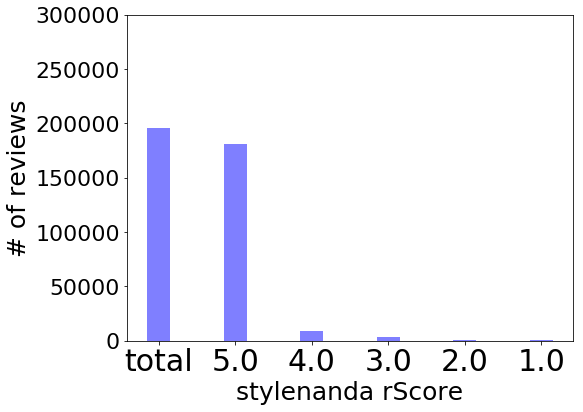

ratio 5.0: 92.682
ratio 4.0 : 4.767
ratio 3.0: 1.698
ratio 2.0 : 0.474
ratio 1.0 : 0.379


In [582]:
score = ('total', '5.0', '4.0', '3.0', '2.0', '1.0')
total=195503
score5= 181197
score4=9319
score3= 3319
score2= 927
score1=741
number_of_reviews = [total,
                     score5,
                     score4,
                     score3,
                     score2,
                     score1]

plt.bar(score, number_of_reviews, color=['blue'],
        width=0.3, alpha=0.5)
plt.xticks(score, fontsize=30)
plt.yticks(fontsize=22)
plt.ylabel('# of reviews', fontsize=25)
plt.rcParams["figure.figsize"] = (8,6)
plt.xlabel('stylenanda rScore', fontsize=25)
ax = plt.gca()
ax.set_ylim([0.0, 300000])
plt.show()


print ("ratio 5.0: " + str(short_float(1.0*(score5)*100/total)))
print ("ratio 4.0 : " + str(short_float(1.0*(score4)*100/total)))
print ("ratio 3.0: " + str(short_float(1.0*(score3)*100/total)))
print ("ratio 2.0 : " + str(short_float(1.0*(score2)*100/total)))
print ("ratio 1.0 : " + str(short_float(1.0*(score1)*100/total)))


In [573]:
t_spammer=sn_spammer+sn_spammer2
t_spammer=list(set(t_spammer))

In [574]:
len(t_spammer)

3680

In [576]:
copy_df3=sn_data
for i in range(len(t_spammer)): # 조건 1 + 2
    copy_df3=copy_df3[copy_df3.cId != t_spammer[i]]

In [577]:
len(copy_df3)

195503

In [578]:
copy_df3['rScore'].value_counts()

5.0    181197
4.0      9319
3.0      3319
2.0       927
1.0       741
Name: rScore, dtype: int64

In [ ]:
score = ('total', '5.0', '4.0', '3.0', '2.0', '1.0')
total=195503
score5= 181197
score4=9319
score3= 3319
score2= 927
score1=741
number_of_reviews = [total,
                     score5,
                     score4,
                     score3,
                     score2,
                     score1]

plt.bar(score, number_of_reviews, color=['blue'],
        width=0.3, alpha=0.5)
plt.xticks(score, fontsize=30)
plt.yticks(fontsize=22)
plt.ylabel('# of reviews', fontsize=25)
plt.rcParams["figure.figsize"] = (8,6)
plt.xlabel('attrangs rScore', fontsize=25)
ax = plt.gca()
ax.set_ylim([0.0, 200000])
plt.show()


print ("ratio 5.0: " + str(short_float(1.0*(score5)*100/total)))
print ("ratio 4.0 : " + str(short_float(1.0*(score4)*100/total)))
print ("ratio 3.0: " + str(short_float(1.0*(score3)*100/total)))
print ("ratio 2.0 : " + str(short_float(1.0*(score2)*100/total)))
print ("ratio 1.0 : " + str(short_float(1.0*(score1)*100/total)))


# delete spammer dataframe

In [518]:
copy_data=sn_data

In [519]:
for i in range(len(spammer)):
    copy_data=copy_data[copy_data.cId != spammer[i]]

In [533]:
len(copy_data)

286204

In [536]:
len(copy_data['cId'].value_counts())

42615

In [521]:
len(sn_data)

304756

In [522]:
original_rscore = copy_data['rScore'].value_counts()
original_rscore

5.0    266393
4.0     12499
3.0      4862
2.0      1401
1.0      1049
Name: rScore, dtype: int64

In [523]:
cnt=copy_data['rScore'].value_counts()
cnt=pd.DataFrame(cnt)
cnt

,rScore
5.0,266393
4.0,12499
3.0,4862
2.0,1401
1.0,1049


In [346]:
total=0
for i in range(len(cnt)):
    total+=cnt['rScore'][i+1]
total

286204

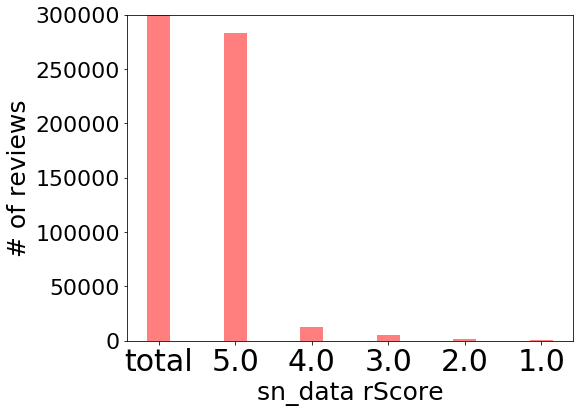

ratio btw 5.0 and 4.0 : 21.9701619778
ratio btw 5.0 and 3.0 : 55.8913643533
ratio btw 5.0 and 2.0 : 261.513837638
ratio btw 5.0 and 1.0 : 261.513837638


ratio 5.0: 93.254
ratio 4.0 : 4.245
ratio 3.0: 1.668
ratio 2.0 : 0.476
ratio 1.0 : 0.357


In [529]:
# 실험 1, spammer 약 1천명 (smilarity=1 수가 10개 이상인사람)
score = ('total', '5.0', '4.0', '3.0', '2.0', '1.0')
number_of_reviews = [303987,
                     283481,
                     12903,
                     5072,
                     1447,
                     1084]

plt.bar(score, number_of_reviews, color=['red'],
        width=0.3, alpha=0.5)
plt.xticks(score, fontsize=30)
plt.yticks(fontsize=22)
plt.ylabel('# of reviews', fontsize=25)
plt.rcParams["figure.figsize"] = (10,10)
plt.xlabel('sn_data rScore', fontsize=25)
ax = plt.gca()
ax.set_ylim([0.0, 300000])
plt.show()

print ("ratio btw 5.0 and 4.0 : " + str(float(283481)/12903))
print ("ratio btw 5.0 and 3.0 : " + str(float(283481)/5072))
print ("ratio btw 5.0 and 2.0 : " + str(float(283481)/1084))
print ("ratio btw 5.0 and 1.0 : " + str(float(283481)/1084))
print('\n')
print ("ratio 5.0: " + str(short_float(1.0*(283481)*100/303987)))
print ("ratio 4.0 : " + str(short_float(1.0*(12903)*100/303987)))
print ("ratio 3.0: " + str(short_float(1.0*(5072)*100/303987)))
print ("ratio 2.0 : " + str(short_float(1.0*(1447)*100/303987)))
print ("ratio 1.0 : " + str(short_float(1.0*(1084)*100/303987)))




In [517]:
len(spammer)

302

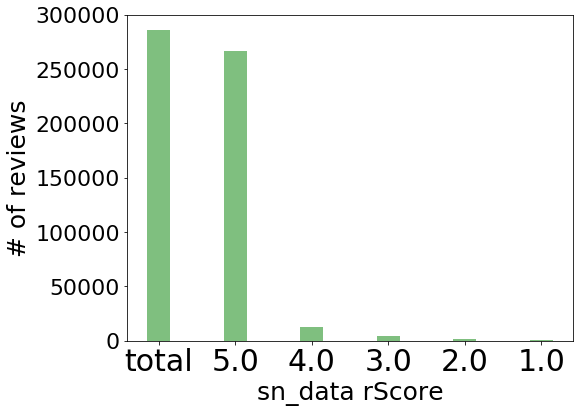

ratio 5.0: 93.078
ratio 4.0 : 4.367
ratio 3.0: 1.699
ratio 2.0 : 0.49
ratio 1.0 : 0.367


In [528]:
# 실험 1-2, spammer 약 9천명 (smilarity=1 수가 10개 이상인사람)
score = ('total', '5.0', '4.0', '3.0', '2.0', '1.0')
total=286204
score5=266393
score4=12499
score3=4862
score2=1401
score1=1049
number_of_reviews = [total,
                     score5,
                     score4,
                     score3,
                     score2,
                     score1]

plt.bar(score, number_of_reviews, color=['green'],
        width=0.3, alpha=0.5)
plt.xticks(score, fontsize=30)
plt.yticks(fontsize=22)
plt.ylabel('# of reviews', fontsize=25)
plt.rcParams["figure.figsize"] = (8,6)
plt.xlabel('sn_data rScore', fontsize=25)
ax = plt.gca()
ax.set_ylim([0.0, 300000])
plt.show()


print ("ratio 5.0: " + str(short_float(1.0*(score5)*100/total)))
print ("ratio 4.0 : " + str(short_float(1.0*(score4)*100/total)))
print ("ratio 3.0: " + str(short_float(1.0*(score3)*100/total)))
print ("ratio 2.0 : " + str(short_float(1.0*(score2)*100/total)))
print ("ratio 1.0 : " + str(short_float(1.0*(score1)*100/total)))


# Ratio similarity=1

In [400]:
cid

Index([u'mkh6***', u'gaki2***', u'suji8***', u'mny***', u'rkdrudw***',
       u'gbles***', u'rhswl0***', u'ovvvvv***', u'b***', u'ejc***',
       ...
       u'goms***', u'jleya1***', u'tlsgkfla1***', u'ssangyong***', u'dz***',
       u'ryu7***', u'saturda***', u'msw8***', u'kaeunl***', u'miok2***'],
      dtype='object', length=42917)

In [436]:
group1=[]
group2=[]
group3=[]
group4=[]
group5=[]
group6=[]

for i in range(len(cid)):
    print(i+1),;print(u'번째 리뷰어');
    reviews=make_reviews(cid[i])
    make_morphs(reviews)
    term_fre(reviews)
    make_table(reviews)
    vectors=table_to_review_vector(reviews)
    cnt=review_similarity(vectors)
    review_num=len(reviews)

    print('ratio_similarity=1: ', short_float((1.0*cnt/nCr(review_num,2))*100))
    ratio=short_float((1.0*cnt/nCr(review_num,2))*100)
    
    if(ratio<0.001):
        group1.append(cid[i])
    elif(ratio >=0.001 and ratio < 0.01):
        group2.append(cid[i])
    elif(ratio >=0.01 and ratio < 0.1):
        group3.append(cid[i])
    elif(ratio >=0.1 and ratio < 1):
        group4.append(cid[i])
    elif(ratio >=1 and ratio < 5):
        group5.append(cid[i])
    elif(ratio >=5):
        group6.append(cid[i])
        

1 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 98723)
('avg', 0.46)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 25.883)
2 번째 리뷰어
('min', 0.087)
('max', 1.0)
('num of similarity=0.8 over : ', 139030)
('avg', 0.805)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 17.676)
3 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 880)
('avg', 0.243)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.39)
4 번째 리뷰어
('min', 0.005)
('max', 0.991)
('num of similarity=0.8 over : ', 9290)
('avg', 0.331)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 470)
('avg', 0.393)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.02)
6 번째 리뷰어
('min', 0.098)
('max', 0.836)
('num of similarity=0.8 over : ', 3)
('avg', 0.456)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 5)
('avg', 0.424)
('ra

('min', 0.045)
('max', 0.726)
('num of similarity=0.8 over : ', 0)
('avg', 0.406)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
57 번째 리뷰어
('min', 0.0)
('max', 0.958)
('num of similarity=0.8 over : ', 57)
('avg', 0.206)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
58 번째 리뷰어
('min', 0.021)
('max', 0.959)
('num of similarity=0.8 over : ', 8980)
('avg', 0.744)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
59 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 59)
('avg', 0.274)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.109)
60 번째 리뷰어
('min', 0.0)
('max', 0.716)
('num of similarity=0.8 over : ', 0)
('avg', 0.316)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
61 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 16160)
('avg', 0.817)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 26.623)
62 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.373)
('ratio of sim

('min', 0.226)
('max', 0.831)
('num of similarity=0.8 over : ', 36)
('avg', 0.524)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
112 번째 리뷰어
('min', 0.03)
('max', 0.754)
('num of similarity=0.8 over : ', 0)
('avg', 0.463)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
113 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 2061)
('avg', 0.276)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 3.642)
114 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 4)
('avg', 0.253)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.016)
115 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 7)
('avg', 0.244)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.025)
116 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.397)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.008)
117 번째 리뷰어
('min', 0.0)
('max', 0.845)
('num of similarity=0.8 over : ', 9)
('avg', 0.314)
('ratio of si

('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.315)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.012)
167 번째 리뷰어
('min', 0.026)
('max', 0.664)
('num of similarity=0.8 over : ', 0)
('avg', 0.336)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
168 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 11)
('avg', 0.246)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.025)
169 번째 리뷰어
('min', 0.041)
('max', 0.858)
('num of similarity=0.8 over : ', 10)
('avg', 0.472)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
170 번째 리뷰어
('min', 0.0)
('max', 0.857)
('num of similarity=0.8 over : ', 2)
('avg', 0.304)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
171 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 281)
('avg', 0.247)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.765)
172 번째 리뷰어
('min', 0.0)
('max', 0.676)
('num of similarity=0.8 over : ', 0)
('avg', 0.295)
('ratio of s

('min', 0.053)
('max', 0.765)
('num of similarity=0.8 over : ', 0)
('avg', 0.422)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
222 번째 리뷰어
('min', 0.068)
('max', 0.709)
('num of similarity=0.8 over : ', 0)
('avg', 0.373)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
223 번째 리뷰어
('min', 0.017)
('max', 0.715)
('num of similarity=0.8 over : ', 0)
('avg', 0.33)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
224 번째 리뷰어
('min', 0.0)
('max', 0.828)
('num of similarity=0.8 over : ', 3)
('avg', 0.351)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
225 번째 리뷰어
('min', 0.074)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.463)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.017)
226 번째 리뷰어
('min', 0.085)
('max', 0.993)
('num of similarity=0.8 over : ', 9)
('avg', 0.486)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
227 번째 리뷰어
('min', 0.0)
('max', 0.707)
('num of similarity=0.8 over : ', 0)
('avg', 0.346)
('ratio of 

('min', 0.0)
('max', 0.962)
('num of similarity=0.8 over : ', 9)
('avg', 0.214)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
277 번째 리뷰어
('min', 0.0)
('max', 0.696)
('num of similarity=0.8 over : ', 0)
('avg', 0.263)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
278 번째 리뷰어
('min', 0.013)
('max', 0.857)
('num of similarity=0.8 over : ', 2)
('avg', 0.402)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
279 번째 리뷰어
('min', 0.0)
('max', 0.761)
('num of similarity=0.8 over : ', 0)
('avg', 0.169)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
280 번째 리뷰어
('min', 0.0)
('max', 0.766)
('num of similarity=0.8 over : ', 0)
('avg', 0.177)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
281 번째 리뷰어
('min', 0.0)
('max', 0.639)
('num of similarity=0.8 over : ', 0)
('avg', 0.196)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
282 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 569)
('avg', 0.213)
('ratio of similar

('min', 0.0)
('max', 0.723)
('num of similarity=0.8 over : ', 0)
('avg', 0.331)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
332 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1768)
('avg', 0.475)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 46.186)
333 번째 리뷰어
('min', 0.0)
('max', 0.831)
('num of similarity=0.8 over : ', 3)
('avg', 0.47)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
334 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 47)
('avg', 0.242)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.366)
335 번째 리뷰어
('min', 0.0)
('max', 0.793)
('num of similarity=0.8 over : ', 0)
('avg', 0.331)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
336 번째 리뷰어
('min', 0.0)
('max', 0.943)
('num of similarity=0.8 over : ', 6)
('avg', 0.309)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
337 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 37)
('avg', 0.373)
('ratio of simila

('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 244)
('avg', 0.307)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 3.644)
387 번째 리뷰어
('min', 0.0)
('max', 0.943)
('num of similarity=0.8 over : ', 1)
('avg', 0.236)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
388 번째 리뷰어
('min', 0.062)
('max', 1.0)
('num of similarity=0.8 over : ', 4)
('avg', 0.404)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.088)
389 번째 리뷰어
('min', 0.032)
('max', 0.782)
('num of similarity=0.8 over : ', 0)
('avg', 0.587)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
390 번째 리뷰어
('min', 0.11)
('max', 0.761)
('num of similarity=0.8 over : ', 0)
('avg', 0.496)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
391 번째 리뷰어
('min', 0.062)
('max', 1.0)
('num of similarity=0.8 over : ', 4)
('avg', 0.437)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.03)
392 번째 리뷰어
('min', 0.079)
('max', 0.894)
('num of similarity=0.8 over : ', 111)
('avg', 0.507)
('ratio 

('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 117)
('avg', 0.318)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.733)
442 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 5)
('avg', 0.409)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.068)
443 번째 리뷰어
('min', 0.0)
('max', 0.722)
('num of similarity=0.8 over : ', 0)
('avg', 0.307)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
444 번째 리뷰어
('min', 0.0)
('max', 0.894)
('num of similarity=0.8 over : ', 1)
('avg', 0.31)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
445 번째 리뷰어
('min', 0.121)
('max', 0.716)
('num of similarity=0.8 over : ', 0)
('avg', 0.392)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
446 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 25)
('avg', 0.344)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.41)
447 번째 리뷰어
('min', 0.115)
('max', 0.772)
('num of similarity=0.8 over : ', 0)
('avg', 0.451)
('ratio of simi

('min', 0.05)
('max', 0.668)
('num of similarity=0.8 over : ', 0)
('avg', 0.344)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
497 번째 리뷰어
('min', 0.121)
('max', 0.82)
('num of similarity=0.8 over : ', 2)
('avg', 0.407)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
498 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.294)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.038)
499 번째 리뷰어
('min', 0.131)
('max', 0.713)
('num of similarity=0.8 over : ', 0)
('avg', 0.449)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
500 번째 리뷰어
('min', 0.077)
('max', 0.991)
('num of similarity=0.8 over : ', 1)
('avg', 0.475)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
501 번째 리뷰어
('min', 0.0)
('max', 0.844)
('num of similarity=0.8 over : ', 2)
('avg', 0.431)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
502 번째 리뷰어
('min', 0.0)
('max', 0.984)
('num of similarity=0.8 over : ', 1)
('avg', 0.315)
('ratio of sim

('min', 0.0)
('max', 0.838)
('num of similarity=0.8 over : ', 1)
('avg', 0.274)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
552 번째 리뷰어
('min', 0.143)
('max', 0.825)
('num of similarity=0.8 over : ', 3)
('avg', 0.49)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
553 번째 리뷰어
('min', 0.0)
('max', 0.727)
('num of similarity=0.8 over : ', 0)
('avg', 0.42)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
554 번째 리뷰어
('min', 0.0)
('max', 0.95)
('num of similarity=0.8 over : ', 3)
('avg', 0.402)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
555 번째 리뷰어
('min', 0.12)
('max', 0.679)
('num of similarity=0.8 over : ', 0)
('avg', 0.383)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
556 번째 리뷰어
('min', 0.0)
('max', 0.943)
('num of similarity=0.8 over : ', 4)
('avg', 0.322)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
557 번째 리뷰어
('min', 0.046)
('max', 0.629)
('num of similarity=0.8 over : ', 0)
('avg', 0.305)
('ratio of similar

('min', 0.019)
('max', 0.774)
('num of similarity=0.8 over : ', 0)
('avg', 0.373)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
607 번째 리뷰어
('min', 0.031)
('max', 0.694)
('num of similarity=0.8 over : ', 0)
('avg', 0.395)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
608 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.413)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.05)
609 번째 리뷰어
('min', 0.077)
('max', 0.63)
('num of similarity=0.8 over : ', 0)
('avg', 0.332)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
610 번째 리뷰어
('min', 0.0)
('max', 0.843)
('num of similarity=0.8 over : ', 11)
('avg', 0.411)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
611 번째 리뷰어
('min', 0.032)
('max', 0.725)
('num of similarity=0.8 over : ', 0)
('avg', 0.389)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
612 번째 리뷰어
('min', 0.132)
('max', 0.695)
('num of similarity=0.8 over : ', 0)
('avg', 0.421)
('ratio of 

('min', 0.0)
('max', 0.947)
('num of similarity=0.8 over : ', 247)
('avg', 0.518)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
716 번째 리뷰어
('min', 0.073)
('max', 0.683)
('num of similarity=0.8 over : ', 0)
('avg', 0.42)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
717 번째 리뷰어
('min', 0.021)
('max', 1.0)
('num of similarity=0.8 over : ', 3)
('avg', 0.385)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.06)
718 번째 리뷰어
('min', 0.0)
('max', 0.837)
('num of similarity=0.8 over : ', 1)
('avg', 0.182)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
719 번째 리뷰어
('min', 0.0)
('max', 0.772)
('num of similarity=0.8 over : ', 0)
('avg', 0.275)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
720 번째 리뷰어
('min', 0.0)
('max', 0.782)
('num of similarity=0.8 over : ', 0)
('avg', 0.317)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
721 번째 리뷰어
('min', 0.0)
('max', 0.911)
('num of similarity=0.8 over : ', 49)
('avg', 0.401)
('ratio of simi

('min', 0.143)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.371)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.067)
771 번째 리뷰어
('min', 0.0)
('max', 0.964)
('num of similarity=0.8 over : ', 1)
('avg', 0.269)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
772 번째 리뷰어
('min', 0.021)
('max', 0.97)
('num of similarity=0.8 over : ', 2)
('avg', 0.38)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
773 번째 리뷰어
('min', 0.0)
('max', 0.816)
('num of similarity=0.8 over : ', 2)
('avg', 0.253)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
774 번째 리뷰어
('min', 0.0)
('max', 0.746)
('num of similarity=0.8 over : ', 0)
('avg', 0.332)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
775 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 281)
('avg', 0.404)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 18.788)
776 번째 리뷰어
('min', 0.047)
('max', 0.734)
('num of similarity=0.8 over : ', 0)
('avg', 0.351)
('ratio of si

('min', 0.0)
('max', 0.959)
('num of similarity=0.8 over : ', 2)
('avg', 0.295)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
826 번째 리뷰어
('min', 0.034)
('max', 0.944)
('num of similarity=0.8 over : ', 455)
('avg', 0.551)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
827 번째 리뷰어
('min', 0.0)
('max', 0.63)
('num of similarity=0.8 over : ', 0)
('avg', 0.231)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
828 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 6)
('avg', 0.197)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.073)
829 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 41)
('avg', 0.254)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.29)
830 번째 리뷰어
('min', 0.122)
('max', 0.797)
('num of similarity=0.8 over : ', 0)
('avg', 0.522)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
831 번째 리뷰어
('min', 0.178)
('max', 1.0)
('num of similarity=0.8 over : ', 484)
('avg', 0.601)
('ratio of si

('min', 0.108)
('max', 0.689)
('num of similarity=0.8 over : ', 0)
('avg', 0.422)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
881 번째 리뷰어
('min', 0.059)
('max', 0.678)
('num of similarity=0.8 over : ', 0)
('avg', 0.374)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
882 번째 리뷰어
('min', 0.0)
('max', 0.711)
('num of similarity=0.8 over : ', 0)
('avg', 0.252)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
883 번째 리뷰어
('min', 0.0)
('max', 0.686)
('num of similarity=0.8 over : ', 0)
('avg', 0.28)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
884 번째 리뷰어
('min', 0.0)
('max', 0.775)
('num of similarity=0.8 over : ', 0)
('avg', 0.26)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
885 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.273)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.078)
886 번째 리뷰어
('min', 0.118)
('max', 0.709)
('num of similarity=0.8 over : ', 0)
('avg', 0.402)
('ratio of simil

('min', 0.173)
('max', 0.776)
('num of similarity=0.8 over : ', 0)
('avg', 0.447)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
936 번째 리뷰어
('min', 0.0)
('max', 0.671)
('num of similarity=0.8 over : ', 0)
('avg', 0.254)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
937 번째 리뷰어
('min', 0.0)
('max', 0.696)
('num of similarity=0.8 over : ', 0)
('avg', 0.243)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
938 번째 리뷰어
('min', 0.0)
('max', 0.803)
('num of similarity=0.8 over : ', 3)
('avg', 0.402)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
939 번째 리뷰어
('min', 0.0)
('max', 0.684)
('num of similarity=0.8 over : ', 0)
('avg', 0.343)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
940 번째 리뷰어
('min', 0.056)
('max', 0.753)
('num of similarity=0.8 over : ', 0)
('avg', 0.403)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
941 번째 리뷰어
('min', 0.02)
('max', 0.986)
('num of similarity=0.8 over : ', 15)
('avg', 0.339)
('ratio of sim

('min', 0.0)
('max', 0.62)
('num of similarity=0.8 over : ', 0)
('avg', 0.257)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
991 번째 리뷰어
('min', 0.0)
('max', 0.711)
('num of similarity=0.8 over : ', 0)
('avg', 0.345)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
992 번째 리뷰어
('min', 0.0)
('max', 0.857)
('num of similarity=0.8 over : ', 2)
('avg', 0.308)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
993 번째 리뷰어
('min', 0.027)
('max', 0.748)
('num of similarity=0.8 over : ', 0)
('avg', 0.466)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
994 번째 리뷰어
('min', 0.0)
('max', 0.813)
('num of similarity=0.8 over : ', 1)
('avg', 0.316)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
995 번째 리뷰어
('min', 0.09)
('max', 0.786)
('num of similarity=0.8 over : ', 0)
('avg', 0.383)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
996 번째 리뷰어
('min', 0.171)
('max', 0.805)
('num of similarity=0.8 over : ', 2)
('avg', 0.503)
('ratio of simil

('min', 0.042)
('max', 0.824)
('num of similarity=0.8 over : ', 1)
('avg', 0.419)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1045 번째 리뷰어
('min', 0.05)
('max', 0.786)
('num of similarity=0.8 over : ', 0)
('avg', 0.367)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1046 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 6)
('avg', 0.297)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.101)
1047 번째 리뷰어
('min', 0.11)
('max', 0.709)
('num of similarity=0.8 over : ', 0)
('avg', 0.393)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1048 번째 리뷰어
('min', 0.0)
('max', 0.667)
('num of similarity=0.8 over : ', 0)
('avg', 0.332)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1049 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 77)
('avg', 0.18)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 7.879)
1050 번째 리뷰어
('min', 0.037)
('max', 0.695)
('num of similarity=0.8 over : ', 0)
('avg', 0.33)
('ratio o

('min', 0.043)
('max', 0.765)
('num of similarity=0.8 over : ', 0)
('avg', 0.345)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1099 번째 리뷰어
('min', 0.086)
('max', 0.722)
('num of similarity=0.8 over : ', 0)
('avg', 0.416)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1100 번째 리뷰어
('min', 0.0)
('max', 0.785)
('num of similarity=0.8 over : ', 0)
('avg', 0.408)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1101 번째 리뷰어
('min', 0.012)
('max', 0.811)
('num of similarity=0.8 over : ', 1)
('avg', 0.375)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1102 번째 리뷰어
('min', 0.036)
('max', 0.962)
('num of similarity=0.8 over : ', 13)
('avg', 0.442)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1103 번째 리뷰어
('min', 0.119)
('max', 0.706)
('num of similarity=0.8 over : ', 0)
('avg', 0.484)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1104 번째 리뷰어
('min', 0.042)
('max', 0.69)
('num of similarity=0.8 over : ', 0)
('avg', 0.411)
('

('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.165)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.116)
1153 번째 리뷰어
('min', 0.066)
('max', 0.766)
('num of similarity=0.8 over : ', 0)
('avg', 0.372)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1154 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.305)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.348)
1155 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 20)
('avg', 0.29)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 2.091)
1156 번째 리뷰어
('min', 0.0)
('max', 0.706)
('num of similarity=0.8 over : ', 0)
('avg', 0.335)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1157 번째 리뷰어
('min', 0.07)
('max', 0.592)
('num of similarity=0.8 over : ', 0)
('avg', 0.306)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1158 번째 리뷰어
('min', 0.129)
('max', 0.702)
('num of similarity=0.8 over : ', 0)
('avg', 0.455)
('ratio o

('min', 0.099)
('max', 0.759)
('num of similarity=0.8 over : ', 0)
('avg', 0.44)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1207 번째 리뷰어
('min', 0.218)
('max', 0.881)
('num of similarity=0.8 over : ', 18)
('avg', 0.589)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1208 번째 리뷰어
('min', 0.0)
('max', 0.768)
('num of similarity=0.8 over : ', 0)
('avg', 0.3)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1209 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 11)
('avg', 0.275)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.463)
1210 번째 리뷰어
('min', 0.05)
('max', 0.764)
('num of similarity=0.8 over : ', 0)
('avg', 0.328)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1211 번째 리뷰어
('min', 0.165)
('max', 0.992)
('num of similarity=0.8 over : ', 4)
('avg', 0.433)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1212 번째 리뷰어
('min', 0.0)
('max', 0.554)
('num of similarity=0.8 over : ', 0)
('avg', 0.245)
('ratio 

('min', 0.078)
('max', 0.745)
('num of similarity=0.8 over : ', 0)
('avg', 0.407)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1261 번째 리뷰어
('min', 0.033)
('max', 0.769)
('num of similarity=0.8 over : ', 0)
('avg', 0.348)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1262 번째 리뷰어
('min', 0.191)
('max', 0.701)
('num of similarity=0.8 over : ', 0)
('avg', 0.473)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1263 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 3)
('avg', 0.247)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.135)
1264 번째 리뷰어
('min', 0.0)
('max', 0.722)
('num of similarity=0.8 over : ', 0)
('avg', 0.316)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1265 번째 리뷰어
('min', 0.072)
('max', 0.767)
('num of similarity=0.8 over : ', 0)
('avg', 0.395)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1266 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 35)
('avg', 0.371)
('ratio

('min', 0.064)
('max', 0.915)
('num of similarity=0.8 over : ', 3)
('avg', 0.441)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1315 번째 리뷰어
('min', 0.233)
('max', 0.766)
('num of similarity=0.8 over : ', 0)
('avg', 0.569)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1316 번째 리뷰어
('min', 0.033)
('max', 0.822)
('num of similarity=0.8 over : ', 1)
('avg', 0.341)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1317 번째 리뷰어
('min', 0.098)
('max', 0.666)
('num of similarity=0.8 over : ', 0)
('avg', 0.425)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1318 번째 리뷰어
('min', 0.102)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.378)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.142)
1319 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 6)
('avg', 0.18)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.142)
1320 번째 리뷰어
('min', 0.0)
('max', 0.816)
('num of similarity=0.8 over : ', 3)
('avg', 0.32)
('rati

('min', 0.059)
('max', 0.622)
('num of similarity=0.8 over : ', 0)
('avg', 0.366)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1369 번째 리뷰어
('min', 0.138)
('max', 1.0)
('num of similarity=0.8 over : ', 4)
('avg', 0.48)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.15)
1370 번째 리뷰어
('min', 0.011)
('max', 0.873)
('num of similarity=0.8 over : ', 10)
('avg', 0.414)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1371 번째 리뷰어
('min', 0.0)
('max', 0.655)
('num of similarity=0.8 over : ', 0)
('avg', 0.338)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1372 번째 리뷰어
('min', 0.374)
('max', 1.0)
('num of similarity=0.8 over : ', 5)
('avg', 0.659)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.15)
1373 번째 리뷰어
('min', 0.117)
('max', 0.675)
('num of similarity=0.8 over : ', 0)
('avg', 0.382)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1374 번째 리뷰어
('min', 0.076)
('max', 0.75)
('num of similarity=0.8 over : ', 0)
('avg', 0.418)
('rat

('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 28)
('avg', 0.329)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 3.333)
1424 번째 리뷰어
('min', 0.0)
('max', 0.713)
('num of similarity=0.8 over : ', 0)
('avg', 0.354)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1425 번째 리뷰어
('min', 0.149)
('max', 0.862)
('num of similarity=0.8 over : ', 28)
('avg', 0.57)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1426 번째 리뷰어
('min', 0.066)
('max', 0.63)
('num of similarity=0.8 over : ', 0)
('avg', 0.315)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1427 번째 리뷰어
('min', 0.0)
('max', 0.723)
('num of similarity=0.8 over : ', 0)
('avg', 0.237)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1428 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 3)
('avg', 0.268)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.476)
1429 번째 리뷰어
('min', 0.06)
('max', 0.78)
('num of similarity=0.8 over : ', 0)
('avg', 0.44)
('ratio of 

('min', 0.074)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.385)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.168)
1478 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 15)
('avg', 0.246)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.008)
1479 번째 리뷰어
('min', 0.08)
('max', 0.734)
('num of similarity=0.8 over : ', 0)
('avg', 0.462)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1480 번째 리뷰어
('min', 0.0)
('max', 0.715)
('num of similarity=0.8 over : ', 0)
('avg', 0.28)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1481 번째 리뷰어
('min', 0.147)
('max', 0.751)
('num of similarity=0.8 over : ', 0)
('avg', 0.419)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1482 번째 리뷰어
('min', 0.048)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.377)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.168)
1483 번째 리뷰어
('min', 0.0)
('max', 0.964)
('num of similarity=0.8 over : ', 32)
('avg', 0.376)
('rati

('min', 0.354)
('max', 0.792)
('num of similarity=0.8 over : ', 0)
('avg', 0.615)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1532 번째 리뷰어
('min', 0.204)
('max', 0.986)
('num of similarity=0.8 over : ', 5)
('avg', 0.532)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1533 번째 리뷰어
('min', 0.155)
('max', 0.83)
('num of similarity=0.8 over : ', 1)
('avg', 0.534)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1534 번째 리뷰어
('min', 0.022)
('max', 0.603)
('num of similarity=0.8 over : ', 0)
('avg', 0.293)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1535 번째 리뷰어
('min', 0.0)
('max', 0.813)
('num of similarity=0.8 over : ', 1)
('avg', 0.389)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1536 번째 리뷰어
('min', 0.161)
('max', 0.724)
('num of similarity=0.8 over : ', 0)
('avg', 0.498)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1537 번째 리뷰어
('min', 0.057)
('max', 0.59)
('num of similarity=0.8 over : ', 0)
('avg', 0.307)
('ra

('min', 0.032)
('max', 0.68)
('num of similarity=0.8 over : ', 0)
('avg', 0.275)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1586 번째 리뷰어
('min', 0.044)
('max', 0.938)
('num of similarity=0.8 over : ', 2)
('avg', 0.465)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1587 번째 리뷰어
('min', 0.109)
('max', 0.669)
('num of similarity=0.8 over : ', 0)
('avg', 0.452)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1588 번째 리뷰어
('min', 0.0)
('max', 0.884)
('num of similarity=0.8 over : ', 7)
('avg', 0.3)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1589 번째 리뷰어
('min', 0.18)
('max', 0.789)
('num of similarity=0.8 over : ', 0)
('avg', 0.439)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1590 번째 리뷰어
('min', 0.056)
('max', 0.729)
('num of similarity=0.8 over : ', 0)
('avg', 0.344)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1591 번째 리뷰어
('min', 0.0)
('max', 0.614)
('num of similarity=0.8 over : ', 0)
('avg', 0.268)
('ratio 

('min', 0.022)
('max', 0.965)
('num of similarity=0.8 over : ', 102)
('avg', 0.512)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1640 번째 리뷰어
('min', 0.0)
('max', 0.79)
('num of similarity=0.8 over : ', 0)
('avg', 0.38)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1641 번째 리뷰어
('min', 0.112)
('max', 0.645)
('num of similarity=0.8 over : ', 0)
('avg', 0.345)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1642 번째 리뷰어
('min', 0.106)
('max', 0.656)
('num of similarity=0.8 over : ', 0)
('avg', 0.411)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1643 번째 리뷰어
('min', 0.029)
('max', 0.685)
('num of similarity=0.8 over : ', 0)
('avg', 0.315)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1644 번째 리뷰어
('min', 0.176)
('max', 0.694)
('num of similarity=0.8 over : ', 0)
('avg', 0.458)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1645 번째 리뷰어
('min', 0.0)
('max', 0.686)
('num of similarity=0.8 over : ', 0)
('avg', 0.231)
('ra

('min', 0.058)
('max', 0.759)
('num of similarity=0.8 over : ', 0)
('avg', 0.388)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1694 번째 리뷰어
('min', 0.0)
('max', 0.825)
('num of similarity=0.8 over : ', 1)
('avg', 0.254)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1695 번째 리뷰어
('min', 0.345)
('max', 0.98)
('num of similarity=0.8 over : ', 8)
('avg', 0.562)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1696 번째 리뷰어
('min', 0.224)
('max', 1.0)
('num of similarity=0.8 over : ', 404)
('avg', 0.853)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 65.726)
1697 번째 리뷰어
('min', 0.061)
('max', 0.756)
('num of similarity=0.8 over : ', 0)
('avg', 0.382)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1698 번째 리뷰어
('min', 0.0)
('max', 0.625)
('num of similarity=0.8 over : ', 0)
('avg', 0.191)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1699 번째 리뷰어
('min', 0.027)
('max', 0.822)
('num of similarity=0.8 over : ', 1)
('avg', 0.325)
('

('min', 0.0)
('max', 0.963)
('num of similarity=0.8 over : ', 2)
('avg', 0.263)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1748 번째 리뷰어
('min', 0.0)
('max', 0.877)
('num of similarity=0.8 over : ', 3)
('avg', 0.38)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1749 번째 리뷰어
('min', 0.18)
('max', 0.709)
('num of similarity=0.8 over : ', 0)
('avg', 0.439)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1750 번째 리뷰어
('min', 0.032)
('max', 0.651)
('num of similarity=0.8 over : ', 0)
('avg', 0.289)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1751 번째 리뷰어
('min', 0.0)
('max', 0.842)
('num of similarity=0.8 over : ', 3)
('avg', 0.407)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1752 번째 리뷰어
('min', 0.031)
('max', 0.751)
('num of similarity=0.8 over : ', 0)
('avg', 0.37)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1753 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.313)
('ratio of si

('min', 0.022)
('max', 0.616)
('num of similarity=0.8 over : ', 0)
('avg', 0.235)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1802 번째 리뷰어
('min', 0.316)
('max', 0.804)
('num of similarity=0.8 over : ', 1)
('avg', 0.587)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1803 번째 리뷰어
('min', 0.134)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.385)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.23)
1804 번째 리뷰어
('min', 0.0)
('max', 0.701)
('num of similarity=0.8 over : ', 0)
('avg', 0.251)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1805 번째 리뷰어
('min', 0.068)
('max', 0.619)
('num of similarity=0.8 over : ', 0)
('avg', 0.287)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1806 번째 리뷰어
('min', 0.042)
('max', 0.64)
('num of similarity=0.8 over : ', 0)
('avg', 0.327)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1807 번째 리뷰어
('min', 0.0)
('max', 0.708)
('num of similarity=0.8 over : ', 0)
('avg', 0.295)
('rati

('min', 0.106)
('max', 0.667)
('num of similarity=0.8 over : ', 0)
('avg', 0.384)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1856 번째 리뷰어
('min', 0.173)
('max', 0.816)
('num of similarity=0.8 over : ', 2)
('avg', 0.529)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1857 번째 리뷰어
('min', 0.252)
('max', 0.758)
('num of similarity=0.8 over : ', 0)
('avg', 0.494)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1858 번째 리뷰어
('min', 0.155)
('max', 0.698)
('num of similarity=0.8 over : ', 0)
('avg', 0.455)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1859 번째 리뷰어
('min', 0.042)
('max', 0.866)
('num of similarity=0.8 over : ', 2)
('avg', 0.367)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1860 번째 리뷰어
('min', 0.127)
('max', 0.68)
('num of similarity=0.8 over : ', 0)
('avg', 0.375)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1861 번째 리뷰어
('min', 0.044)
('max', 0.829)
('num of similarity=0.8 over : ', 5)
('avg', 0.474)
(

('min', 0.232)
('max', 0.683)
('num of similarity=0.8 over : ', 0)
('avg', 0.434)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1910 번째 리뷰어
('min', 0.0)
('max', 0.693)
('num of similarity=0.8 over : ', 0)
('avg', 0.199)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1911 번째 리뷰어
('min', 0.038)
('max', 0.683)
('num of similarity=0.8 over : ', 0)
('avg', 0.334)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1912 번째 리뷰어
('min', 0.0)
('max', 0.667)
('num of similarity=0.8 over : ', 0)
('avg', 0.29)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1913 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 98)
('avg', 0.372)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 23.645)
1914 번째 리뷰어
('min', 0.065)
('max', 0.711)
('num of similarity=0.8 over : ', 0)
('avg', 0.434)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1915 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 233)
('avg', 0.69)
('ratio 

('min', 0.078)
('max', 1.0)
('num of similarity=0.8 over : ', 3)
('avg', 0.352)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.246)
1964 번째 리뷰어
('min', 0.083)
('max', 0.736)
('num of similarity=0.8 over : ', 0)
('avg', 0.397)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1965 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.16)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.246)
1966 번째 리뷰어
('min', 0.012)
('max', 0.7)
('num of similarity=0.8 over : ', 0)
('avg', 0.369)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1967 번째 리뷰어
('min', 0.0)
('max', 0.849)
('num of similarity=0.8 over : ', 1)
('avg', 0.186)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1968 번째 리뷰어
('min', 0.109)
('max', 0.797)
('num of similarity=0.8 over : ', 0)
('avg', 0.426)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1969 번째 리뷰어
('min', 0.073)
('max', 0.957)
('num of similarity=0.8 over : ', 0)
('avg', 0.457)
('ratio

('avg', 0.243)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2018 번째 리뷰어
('min', 0.203)
('max', 0.702)
('num of similarity=0.8 over : ', 0)
('avg', 0.446)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2019 번째 리뷰어
('min', 0.0)
('max', 0.758)
('num of similarity=0.8 over : ', 0)
('avg', 0.287)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2020 번째 리뷰어
('min', 0.273)
('max', 0.775)
('num of similarity=0.8 over : ', 0)
('avg', 0.483)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2021 번째 리뷰어
('min', 0.0)
('max', 0.646)
('num of similarity=0.8 over : ', 0)
('avg', 0.269)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2022 번째 리뷰어
('min', 0.236)
('max', 0.734)
('num of similarity=0.8 over : ', 0)
('avg', 0.469)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2023 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.283)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.265)
2024 번째 리뷰어
('

('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.359)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.265)
2073 번째 리뷰어
('min', 0.127)
('max', 0.807)
('num of similarity=0.8 over : ', 1)
('avg', 0.456)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2074 번째 리뷰어
('min', 0.141)
('max', 0.712)
('num of similarity=0.8 over : ', 0)
('avg', 0.437)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2075 번째 리뷰어
('min', 0.0)
('max', 0.727)
('num of similarity=0.8 over : ', 0)
('avg', 0.347)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2076 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 66)
('avg', 0.342)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 10.317)
2077 번째 리뷰어
('min', 0.0)
('max', 0.816)
('num of similarity=0.8 over : ', 2)
('avg', 0.173)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2078 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 13)
('avg', 0.162)
('ratio o

('min', 0.0)
('max', 0.885)
('num of similarity=0.8 over : ', 1)
('avg', 0.19)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2128 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 3)
('avg', 0.155)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.855)
2129 번째 리뷰어
('min', 0.004)
('max', 0.782)
('num of similarity=0.8 over : ', 0)
('avg', 0.325)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2130 번째 리뷰어
('min', 0.035)
('max', 0.544)
('num of similarity=0.8 over : ', 0)
('avg', 0.245)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2131 번째 리뷰어
('min', 0.338)
('max', 0.734)
('num of similarity=0.8 over : ', 0)
('avg', 0.528)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2132 번째 리뷰어
('min', 0.488)
('max', 0.85)
('num of similarity=0.8 over : ', 55)
('avg', 0.71)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2133 번째 리뷰어
('min', 0.092)
('max', 0.929)
('num of similarity=0.8 over : ', 20)
('avg', 0.502)
('rat

('min', 0.13)
('max', 0.706)
('num of similarity=0.8 over : ', 0)
('avg', 0.45)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2182 번째 리뷰어
('min', 0.068)
('max', 0.746)
('num of similarity=0.8 over : ', 0)
('avg', 0.308)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2183 번째 리뷰어
('min', 0.117)
('max', 0.996)
('num of similarity=0.8 over : ', 2)
('avg', 0.404)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2184 번째 리뷰어
('min', 0.17)
('max', 0.687)
('num of similarity=0.8 over : ', 0)
('avg', 0.414)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2185 번째 리뷰어
('min', 0.087)
('max', 0.742)
('num of similarity=0.8 over : ', 0)
('avg', 0.384)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2186 번째 리뷰어
('min', 0.056)
('max', 0.991)
('num of similarity=0.8 over : ', 1)
('avg', 0.347)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2187 번째 리뷰어
('min', 0.0)
('max', 0.662)
('num of similarity=0.8 over : ', 0)
('avg', 0.231)
('rat

('min', 0.164)
('max', 0.737)
('num of similarity=0.8 over : ', 0)
('avg', 0.477)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2236 번째 리뷰어
('min', 0.113)
('max', 0.636)
('num of similarity=0.8 over : ', 0)
('avg', 0.388)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2237 번째 리뷰어
('min', 0.049)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.302)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.308)
2238 번째 리뷰어
('min', 0.055)
('max', 0.686)
('num of similarity=0.8 over : ', 0)
('avg', 0.337)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2239 번째 리뷰어
('min', 0.043)
('max', 0.684)
('num of similarity=0.8 over : ', 0)
('avg', 0.36)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2240 번째 리뷰어
('min', 0.017)
('max', 0.804)
('num of similarity=0.8 over : ', 1)
('avg', 0.303)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2241 번째 리뷰어
('min', 0.075)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.332)
('r

('min', 0.144)
('max', 0.676)
('num of similarity=0.8 over : ', 0)
('avg', 0.442)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2290 번째 리뷰어
('min', 0.024)
('max', 0.814)
('num of similarity=0.8 over : ', 1)
('avg', 0.338)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2291 번째 리뷰어
('min', 0.0)
('max', 0.688)
('num of similarity=0.8 over : ', 0)
('avg', 0.358)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2292 번째 리뷰어
('min', 0.146)
('max', 0.785)
('num of similarity=0.8 over : ', 0)
('avg', 0.429)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2293 번째 리뷰어
('min', 0.192)
('max', 1.0)
('num of similarity=0.8 over : ', 6)
('avg', 0.487)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.667)
2294 번째 리뷰어
('min', 0.0)
('max', 0.613)
('num of similarity=0.8 over : ', 0)
('avg', 0.313)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2295 번째 리뷰어
('min', 0.047)
('max', 0.989)
('num of similarity=0.8 over : ', 1)
('avg', 0.379)
('ra

('num of similarity=0.8 over : ', 0)
('avg', 0.317)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2344 번째 리뷰어
('min', 0.056)
('max', 0.74)
('num of similarity=0.8 over : ', 0)
('avg', 0.45)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2345 번째 리뷰어
('min', 0.0)
('max', 0.695)
('num of similarity=0.8 over : ', 0)
('avg', 0.331)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2346 번째 리뷰어
('min', 0.247)
('max', 0.774)
('num of similarity=0.8 over : ', 0)
('avg', 0.512)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2347 번째 리뷰어
('min', 0.048)
('max', 1.0)
('num of similarity=0.8 over : ', 3)
('avg', 0.327)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.0)
2348 번째 리뷰어
('min', 0.077)
('max', 0.713)
('num of similarity=0.8 over : ', 0)
('avg', 0.36)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2349 번째 리뷰어
('min', 0.149)
('max', 0.966)
('num of similarity=0.8 over : ', 1)
('avg', 0.429)
('ratio of similarity=1: ',)
('ratio_

('min', 0.064)
('max', 0.571)
('num of similarity=0.8 over : ', 0)
('avg', 0.308)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2399 번째 리뷰어
('min', 0.0)
('max', 0.694)
('num of similarity=0.8 over : ', 0)
('avg', 0.297)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2400 번째 리뷰어
('min', 0.085)
('max', 0.596)
('num of similarity=0.8 over : ', 0)
('avg', 0.312)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2401 번째 리뷰어
('min', 0.175)
('max', 0.682)
('num of similarity=0.8 over : ', 0)
('avg', 0.382)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2402 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 199)
('avg', 0.747)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 19.333)
2403 번째 리뷰어
('min', 0.124)
('max', 0.703)
('num of similarity=0.8 over : ', 0)
('avg', 0.371)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2404 번째 리뷰어
('min', 0.309)
('max', 0.788)
('num of similarity=0.8 over : ', 0)
('avg', 0.538)
(

('min', 0.001)
('max', 1.0)
('num of similarity=0.8 over : ', 6)
('avg', 0.309)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.362)
2453 번째 리뷰어
('min', 0.0)
('max', 0.71)
('num of similarity=0.8 over : ', 0)
('avg', 0.228)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2454 번째 리뷰어
('min', 0.175)
('max', 0.74)
('num of similarity=0.8 over : ', 0)
('avg', 0.445)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2455 번째 리뷰어
('min', 0.333)
('max', 0.837)
('num of similarity=0.8 over : ', 4)
('avg', 0.595)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2456 번째 리뷰어
('min', 0.189)
('max', 0.822)
('num of similarity=0.8 over : ', 1)
('avg', 0.463)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2457 번째 리뷰어
('min', 0.067)
('max', 1.0)
('num of similarity=0.8 over : ', 26)
('avg', 0.482)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.449)
2458 번째 리뷰어
('min', 0.252)
('max', 0.714)
('num of similarity=0.8 over : ', 0)
('avg', 0.535)
('r

('min', 0.0)
('max', 0.839)
('num of similarity=0.8 over : ', 9)
('avg', 0.506)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2507 번째 리뷰어
('min', 0.0)
('max', 0.687)
('num of similarity=0.8 over : ', 0)
('avg', 0.321)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2508 번째 리뷰어
('min', 0.0)
('max', 0.591)
('num of similarity=0.8 over : ', 0)
('avg', 0.241)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2509 번째 리뷰어
('min', 0.294)
('max', 0.844)
('num of similarity=0.8 over : ', 14)
('avg', 0.64)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2510 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 4)
('avg', 0.312)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.362)
2511 번째 리뷰어
('min', 0.132)
('max', 0.53)
('num of similarity=0.8 over : ', 0)
('avg', 0.331)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2512 번째 리뷰어
('min', 0.03)
('max', 0.629)
('num of similarity=0.8 over : ', 0)
('avg', 0.338)
('ratio of

('min', 0.075)
('max', 0.8)
('num of similarity=0.8 over : ', 1)
('avg', 0.464)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2562 번째 리뷰어
('min', 0.021)
('max', 0.857)
('num of similarity=0.8 over : ', 8)
('avg', 0.573)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2563 번째 리뷰어
('min', 0.049)
('max', 0.565)
('num of similarity=0.8 over : ', 0)
('avg', 0.299)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2564 번째 리뷰어
('min', 0.246)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.427)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.395)
2565 번째 리뷰어
('min', 0.336)
('max', 0.723)
('num of similarity=0.8 over : ', 0)
('avg', 0.538)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2566 번째 리뷰어
('min', 0.042)
('max', 1.0)
('num of similarity=0.8 over : ', 12)
('avg', 0.369)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.791)
2567 번째 리뷰어
('min', 0.079)
('max', 0.582)
('num of similarity=0.8 over : ', 0)
('avg', 0.328)
(

('min', 0.365)
('max', 0.738)
('num of similarity=0.8 over : ', 0)
('avg', 0.536)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2617 번째 리뷰어
('min', 0.023)
('max', 1.0)
('num of similarity=0.8 over : ', 6)
('avg', 0.318)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.186)
2618 번째 리뷰어
('min', 0.221)
('max', 0.704)
('num of similarity=0.8 over : ', 0)
('avg', 0.491)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2619 번째 리뷰어
('min', 0.0)
('max', 0.857)
('num of similarity=0.8 over : ', 2)
('avg', 0.336)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2620 번째 리뷰어
('min', 0.107)
('max', 0.764)
('num of similarity=0.8 over : ', 0)
('avg', 0.455)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2621 번째 리뷰어
('min', 0.276)
('max', 0.975)
('num of similarity=0.8 over : ', 1)
('avg', 0.572)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2622 번째 리뷰어
('min', 0.237)
('max', 0.787)
('num of similarity=0.8 over : ', 0)
('avg', 0.515)
('

('num of similarity=0.8 over : ', 0)
('avg', 0.283)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2671 번째 리뷰어
('min', 0.187)
('max', 0.611)
('num of similarity=0.8 over : ', 0)
('avg', 0.397)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2672 번째 리뷰어
('min', 0.0)
('max', 0.624)
('num of similarity=0.8 over : ', 0)
('avg', 0.234)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2673 번째 리뷰어
('min', 0.004)
('max', 0.963)
('num of similarity=0.8 over : ', 6)
('avg', 0.318)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2674 번째 리뷰어
('min', 0.078)
('max', 0.867)
('num of similarity=0.8 over : ', 1)
('avg', 0.355)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2675 번째 리뷰어
('min', 0.143)
('max', 0.636)
('num of similarity=0.8 over : ', 0)
('avg', 0.43)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2676 번째 리뷰어
('min', 0.109)
('max', 0.651)
('num of similarity=0.8 over : ', 0)
('avg', 0.412)
('ratio of similarity=1: ',)
('ra

('min', 0.234)
('max', 0.731)
('num of similarity=0.8 over : ', 0)
('avg', 0.457)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2725 번째 리뷰어
('min', 0.037)
('max', 1.0)
('num of similarity=0.8 over : ', 0)
('avg', 0.348)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.433)
2726 번째 리뷰어
('min', 0.214)
('max', 0.756)
('num of similarity=0.8 over : ', 0)
('avg', 0.439)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2727 번째 리뷰어
('min', 0.041)
('max', 0.62)
('num of similarity=0.8 over : ', 0)
('avg', 0.294)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2728 번째 리뷰어
('min', 0.169)
('max', 0.586)
('num of similarity=0.8 over : ', 0)
('avg', 0.387)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2729 번째 리뷰어
('min', 0.216)
('max', 0.693)
('num of similarity=0.8 over : ', 0)
('avg', 0.447)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2730 번째 리뷰어
('min', 0.0)
('max', 0.659)
('num of similarity=0.8 over : ', 0)
('avg', 0.215)
('r

('min', 0.0)
('max', 0.693)
('num of similarity=0.8 over : ', 0)
('avg', 0.283)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2779 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 12)
('avg', 0.425)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 4.329)
2780 번째 리뷰어
('min', 0.18)
('max', 0.73)
('num of similarity=0.8 over : ', 0)
('avg', 0.452)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2781 번째 리뷰어
('min', 0.0)
('max', 0.574)
('num of similarity=0.8 over : ', 0)
('avg', 0.277)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2782 번째 리뷰어
('min', 0.0)
('max', 0.622)
('num of similarity=0.8 over : ', 0)
('avg', 0.267)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2783 번째 리뷰어
('min', 0.38)
('max', 0.747)
('num of similarity=0.8 over : ', 0)
('avg', 0.565)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2784 번째 리뷰어
('min', 0.311)
('max', 0.677)
('num of similarity=0.8 over : ', 0)
('avg', 0.471)
('ratio of

('min', 0.202)
('max', 0.905)
('num of similarity=0.8 over : ', 1)
('avg', 0.47)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2834 번째 리뷰어
('min', 0.313)
('max', 0.748)
('num of similarity=0.8 over : ', 0)
('avg', 0.573)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2835 번째 리뷰어
('min', 0.267)
('max', 0.734)
('num of similarity=0.8 over : ', 0)
('avg', 0.472)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2836 번째 리뷰어
('min', 0.0)
('max', 0.562)
('num of similarity=0.8 over : ', 0)
('avg', 0.228)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2837 번째 리뷰어
('min', 0.117)
('max', 0.82)
('num of similarity=0.8 over : ', 1)
('avg', 0.392)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2838 번째 리뷰어
('min', 0.135)
('max', 0.687)
('num of similarity=0.8 over : ', 0)
('avg', 0.38)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2839 번째 리뷰어
('min', 0.0)
('max', 0.732)
('num of similarity=0.8 over : ', 0)
('avg', 0.394)
('ratio

('min', 0.121)
('max', 0.812)
('num of similarity=0.8 over : ', 1)
('avg', 0.399)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2889 번째 리뷰어
('min', 0.0)
('max', 0.722)
('num of similarity=0.8 over : ', 0)
('avg', 0.395)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2890 번째 리뷰어
('min', 0.0)
('max', 0.572)
('num of similarity=0.8 over : ', 0)
('avg', 0.25)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2891 번째 리뷰어
('min', 0.228)
('max', 0.728)
('num of similarity=0.8 over : ', 0)
('avg', 0.476)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2892 번째 리뷰어
('min', 0.253)
('max', 0.653)
('num of similarity=0.8 over : ', 0)
('avg', 0.443)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2893 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 19)
('avg', 0.454)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.476)
2894 번째 리뷰어
('min', 0.0)
('max', 0.646)
('num of similarity=0.8 over : ', 0)
('avg', 0.227)
('ratio 

('num of similarity=0.8 over : ', 1)
('avg', 0.201)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2943 번째 리뷰어
('min', 0.0)
('max', 0.743)
('num of similarity=0.8 over : ', 0)
('avg', 0.411)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2944 번째 리뷰어
('min', 0.094)
('max', 0.641)
('num of similarity=0.8 over : ', 0)
('avg', 0.365)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2945 번째 리뷰어
('min', 0.097)
('max', 0.798)
('num of similarity=0.8 over : ', 0)
('avg', 0.382)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2946 번째 리뷰어
('min', 0.266)
('max', 0.777)
('num of similarity=0.8 over : ', 0)
('avg', 0.498)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2947 번째 리뷰어
('min', 0.0)
('max', 0.819)
('num of similarity=0.8 over : ', 1)
('avg', 0.306)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2948 번째 리뷰어
('min', 0.0)
('max', 0.822)
('num of similarity=0.8 over : ', 1)
('avg', 0.294)
('ratio of similarity=1: ',)
('ratio

('min', 0.032)
('max', 0.643)
('num of similarity=0.8 over : ', 0)
('avg', 0.312)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2998 번째 리뷰어
('min', 0.218)
('max', 0.694)
('num of similarity=0.8 over : ', 0)
('avg', 0.429)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
2999 번째 리뷰어
('min', 0.0)
('max', 0.963)
('num of similarity=0.8 over : ', 1)
('avg', 0.326)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3000 번째 리뷰어
('min', 0.162)
('max', 0.606)
('num of similarity=0.8 over : ', 0)
('avg', 0.384)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3001 번째 리뷰어
('min', 0.355)
('max', 0.784)
('num of similarity=0.8 over : ', 0)
('avg', 0.516)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3002 번째 리뷰어
('min', 0.021)
('max', 0.997)
('num of similarity=0.8 over : ', 10)
('avg', 0.281)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3003 번째 리뷰어
('min', 0.0)
('max', 0.529)
('num of similarity=0.8 over : ', 0)
('avg', 0.238)
('r

('min', 0.315)
('max', 0.685)
('num of similarity=0.8 over : ', 0)
('avg', 0.526)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3052 번째 리뷰어
('min', 0.103)
('max', 0.913)
('num of similarity=0.8 over : ', 6)
('avg', 0.454)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3053 번째 리뷰어
('min', 0.032)
('max', 0.734)
('num of similarity=0.8 over : ', 0)
('avg', 0.415)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3054 번째 리뷰어
('min', 0.0)
('max', 0.68)
('num of similarity=0.8 over : ', 0)
('avg', 0.364)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3055 번째 리뷰어
('min', 0.15)
('max', 0.644)
('num of similarity=0.8 over : ', 0)
('avg', 0.379)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3056 번째 리뷰어
('min', 0.083)
('max', 0.693)
('num of similarity=0.8 over : ', 0)
('avg', 0.419)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3057 번째 리뷰어
('min', 0.0)
('max', 0.648)
('num of similarity=0.8 over : ', 0)
('avg', 0.297)
('rati

('min', 0.091)
('max', 0.627)
('num of similarity=0.8 over : ', 0)
('avg', 0.412)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3106 번째 리뷰어
('min', 0.032)
('max', 0.844)
('num of similarity=0.8 over : ', 1)
('avg', 0.352)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3107 번째 리뷰어
('min', 0.126)
('max', 0.805)
('num of similarity=0.8 over : ', 2)
('avg', 0.37)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3108 번째 리뷰어
('min', 0.013)
('max', 0.673)
('num of similarity=0.8 over : ', 0)
('avg', 0.262)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3109 번째 리뷰어
('min', 0.123)
('max', 0.647)
('num of similarity=0.8 over : ', 0)
('avg', 0.37)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3110 번째 리뷰어
('min', 0.119)
('max', 0.746)
('num of similarity=0.8 over : ', 0)
('avg', 0.499)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3111 번째 리뷰어
('min', 0.0)
('max', 0.799)
('num of similarity=0.8 over : ', 0)
('avg', 0.2)
('rati

('min', 0.191)
('max', 0.769)
('num of similarity=0.8 over : ', 0)
('avg', 0.443)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3160 번째 리뷰어
('min', 0.0)
('max', 0.628)
('num of similarity=0.8 over : ', 0)
('avg', 0.226)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3161 번째 리뷰어
('min', 0.297)
('max', 0.636)
('num of similarity=0.8 over : ', 0)
('avg', 0.454)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3162 번째 리뷰어
('min', 0.138)
('max', 0.854)
('num of similarity=0.8 over : ', 5)
('avg', 0.577)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3163 번째 리뷰어
('min', 0.242)
('max', 0.63)
('num of similarity=0.8 over : ', 0)
('avg', 0.411)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3164 번째 리뷰어
('min', 0.153)
('max', 0.663)
('num of similarity=0.8 over : ', 0)
('avg', 0.386)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3165 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 31)
('avg', 0.173)
('rati

('min', 0.166)
('max', 0.638)
('num of similarity=0.8 over : ', 0)
('avg', 0.418)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3214 번째 리뷰어
('min', 0.224)
('max', 0.652)
('num of similarity=0.8 over : ', 0)
('avg', 0.397)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3215 번째 리뷰어
('min', 0.165)
('max', 0.731)
('num of similarity=0.8 over : ', 0)
('avg', 0.414)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3216 번째 리뷰어
('min', 0.045)
('max', 0.613)
('num of similarity=0.8 over : ', 0)
('avg', 0.322)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3217 번째 리뷰어
('min', 0.057)
('max', 0.949)
('num of similarity=0.8 over : ', 1)
('avg', 0.302)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3218 번째 리뷰어
('min', 0.026)
('max', 0.672)
('num of similarity=0.8 over : ', 0)
('avg', 0.298)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3219 번째 리뷰어
('min', 0.0)
('max', 0.707)
('num of similarity=0.8 over : ', 0)
('avg', 0.344)
('

('min', 0.208)
('max', 0.692)
('num of similarity=0.8 over : ', 0)
('avg', 0.456)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3268 번째 리뷰어
('min', 0.0)
('max', 0.733)
('num of similarity=0.8 over : ', 0)
('avg', 0.306)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3269 번째 리뷰어
('min', 0.021)
('max', 0.906)
('num of similarity=0.8 over : ', 2)
('avg', 0.49)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3270 번째 리뷰어
('min', 0.0)
('max', 0.645)
('num of similarity=0.8 over : ', 0)
('avg', 0.218)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3271 번째 리뷰어
('min', 0.0)
('max', 0.783)
('num of similarity=0.8 over : ', 0)
('avg', 0.358)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3272 번째 리뷰어
('min', 0.049)
('max', 0.625)
('num of similarity=0.8 over : ', 0)
('avg', 0.345)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3273 번째 리뷰어
('min', 0.213)
('max', 0.729)
('num of similarity=0.8 over : ', 0)
('avg', 0.561)
('ratio

('min', 0.23)
('max', 0.645)
('num of similarity=0.8 over : ', 0)
('avg', 0.453)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3322 번째 리뷰어
('min', 0.037)
('max', 0.737)
('num of similarity=0.8 over : ', 0)
('avg', 0.328)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3323 번째 리뷰어
('min', 0.202)
('max', 0.725)
('num of similarity=0.8 over : ', 0)
('avg', 0.444)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3324 번째 리뷰어
('min', 0.176)
('max', 0.648)
('num of similarity=0.8 over : ', 0)
('avg', 0.407)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3325 번째 리뷰어
('min', 0.246)
('max', 0.741)
('num of similarity=0.8 over : ', 0)
('avg', 0.493)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3326 번째 리뷰어
('min', 0.146)
('max', 0.767)
('num of similarity=0.8 over : ', 0)
('avg', 0.532)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3327 번째 리뷰어
('min', 0.0)
('max', 0.866)
('num of similarity=0.8 over : ', 2)
('avg', 0.27)
('ra

('min', 0.269)
('max', 0.682)
('num of similarity=0.8 over : ', 0)
('avg', 0.449)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3377 번째 리뷰어
('min', 0.0)
('max', 0.617)
('num of similarity=0.8 over : ', 0)
('avg', 0.305)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3378 번째 리뷰어
('min', 0.0)
('max', 0.575)
('num of similarity=0.8 over : ', 0)
('avg', 0.252)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3379 번째 리뷰어
('min', 0.236)
('max', 0.676)
('num of similarity=0.8 over : ', 0)
('avg', 0.411)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3380 번째 리뷰어
('min', 0.0)
('max', 0.655)
('num of similarity=0.8 over : ', 0)
('avg', 0.27)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3381 번째 리뷰어
('min', 0.045)
('max', 0.604)
('num of similarity=0.8 over : ', 0)
('avg', 0.316)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3382 번째 리뷰어
('min', 0.182)
('max', 0.735)
('num of similarity=0.8 over : ', 0)
('avg', 0.473)
('ratio

('min', 0.228)
('max', 0.822)
('num of similarity=0.8 over : ', 4)
('avg', 0.615)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3431 번째 리뷰어
('min', 0.09)
('max', 0.576)
('num of similarity=0.8 over : ', 0)
('avg', 0.352)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3432 번째 리뷰어
('min', 0.077)
('max', 0.68)
('num of similarity=0.8 over : ', 0)
('avg', 0.382)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3433 번째 리뷰어
('min', 0.042)
('max', 0.698)
('num of similarity=0.8 over : ', 0)
('avg', 0.352)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3434 번째 리뷰어
('min', 0.182)
('max', 0.592)
('num of similarity=0.8 over : ', 0)
('avg', 0.403)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3435 번째 리뷰어
('min', 0.073)
('max', 0.702)
('num of similarity=0.8 over : ', 0)
('avg', 0.419)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3436 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 57)
('avg', 0.493)
('rat

('min', 0.217)
('max', 0.791)
('num of similarity=0.8 over : ', 0)
('avg', 0.566)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3486 번째 리뷰어
('min', 0.086)
('max', 0.756)
('num of similarity=0.8 over : ', 0)
('avg', 0.441)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3487 번째 리뷰어
('min', 0.067)
('max', 0.624)
('num of similarity=0.8 over : ', 0)
('avg', 0.387)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3488 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 23)
('avg', 0.419)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 13.725)
3489 번째 리뷰어
('min', 0.0)
('max', 0.617)
('num of similarity=0.8 over : ', 0)
('avg', 0.228)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3490 번째 리뷰어
('min', 0.228)
('max', 0.673)
('num of similarity=0.8 over : ', 0)
('avg', 0.496)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3491 번째 리뷰어
('min', 0.139)
('max', 0.668)
('num of similarity=0.8 over : ', 0)
('avg', 0.47)
('r

('min', 0.053)
('max', 0.669)
('num of similarity=0.8 over : ', 0)
('avg', 0.341)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3540 번째 리뷰어
('min', 0.048)
('max', 0.517)
('num of similarity=0.8 over : ', 0)
('avg', 0.293)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3541 번째 리뷰어
('min', 0.061)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.361)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.654)
3542 번째 리뷰어
('min', 0.024)
('max', 0.617)
('num of similarity=0.8 over : ', 0)
('avg', 0.285)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3543 번째 리뷰어
('min', 0.045)
('max', 0.735)
('num of similarity=0.8 over : ', 0)
('avg', 0.3)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3544 번째 리뷰어
('min', 0.333)
('max', 0.761)
('num of similarity=0.8 over : ', 0)
('avg', 0.578)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3545 번째 리뷰어
('min', 0.16)
('max', 0.689)
('num of similarity=0.8 over : ', 0)
('avg', 0.421)
('r

('min', 0.184)
('max', 0.701)
('num of similarity=0.8 over : ', 0)
('avg', 0.471)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3594 번째 리뷰어
('min', 0.03)
('max', 0.683)
('num of similarity=0.8 over : ', 0)
('avg', 0.377)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3595 번째 리뷰어
('min', 0.0)
('max', 0.645)
('num of similarity=0.8 over : ', 0)
('avg', 0.351)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3596 번째 리뷰어
('min', 0.073)
('max', 1.0)
('num of similarity=0.8 over : ', 12)
('avg', 0.498)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.735)
3597 번째 리뷰어
('min', 0.102)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.345)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.735)
3598 번째 리뷰어
('min', 0.203)
('max', 0.623)
('num of similarity=0.8 over : ', 0)
('avg', 0.382)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3599 번째 리뷰어
('min', 0.069)
('max', 0.583)
('num of similarity=0.8 over : ', 0)
('avg', 0.332)
('

('min', 0.0)
('max', 0.594)
('num of similarity=0.8 over : ', 0)
('avg', 0.234)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3650 번째 리뷰어
('min', 0.0)
('max', 0.615)
('num of similarity=0.8 over : ', 0)
('avg', 0.322)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3651 번째 리뷰어
('min', 0.0)
('max', 0.822)
('num of similarity=0.8 over : ', 2)
('avg', 0.263)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3652 번째 리뷰어
('min', 0.033)
('max', 0.729)
('num of similarity=0.8 over : ', 0)
('avg', 0.437)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3653 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 119)
('avg', 0.882)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 88.235)
3654 번째 리뷰어
('min', 0.0)
('max', 0.551)
('num of similarity=0.8 over : ', 0)
('avg', 0.248)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3655 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 12)
('avg', 0.283)
('ratio of

('avg', 0.336)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3704 번째 리뷰어
('min', 0.05)
('max', 0.742)
('num of similarity=0.8 over : ', 0)
('avg', 0.291)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3705 번째 리뷰어
('min', 0.059)
('max', 0.543)
('num of similarity=0.8 over : ', 0)
('avg', 0.304)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3706 번째 리뷰어
('min', 0.0)
('max', 0.496)
('num of similarity=0.8 over : ', 0)
('avg', 0.213)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3707 번째 리뷰어
('min', 0.088)
('max', 1.0)
('num of similarity=0.8 over : ', 15)
('avg', 0.437)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 2.941)
3708 번째 리뷰어
('min', 0.285)
('max', 0.717)
('num of similarity=0.8 over : ', 0)
('avg', 0.554)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3709 번째 리뷰어
('min', 0.0)
('max', 0.447)
('num of similarity=0.8 over : ', 0)
('avg', 0.109)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3710 번째 리뷰어


('ratio_similarity=1: ', 0.0)
3759 번째 리뷰어
('min', 0.098)
('max', 0.633)
('num of similarity=0.8 over : ', 0)
('avg', 0.414)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3760 번째 리뷰어
('min', 0.083)
('max', 0.996)
('num of similarity=0.8 over : ', 3)
('avg', 0.38)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3761 번째 리뷰어
('min', 0.071)
('max', 0.72)
('num of similarity=0.8 over : ', 0)
('avg', 0.383)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3762 번째 리뷰어
('min', 0.0)
('max', 0.611)
('num of similarity=0.8 over : ', 0)
('avg', 0.229)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3763 번째 리뷰어
('min', 0.117)
('max', 0.634)
('num of similarity=0.8 over : ', 0)
('avg', 0.359)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3764 번째 리뷰어
('min', 0.221)
('max', 0.998)
('num of similarity=0.8 over : ', 3)
('avg', 0.629)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3765 번째 리뷰어
('min', 0.015)
('max', 0.73)
('num of simila

('min', 0.034)
('max', 0.66)
('num of similarity=0.8 over : ', 0)
('avg', 0.29)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3814 번째 리뷰어
('min', 0.152)
('max', 0.629)
('num of similarity=0.8 over : ', 0)
('avg', 0.397)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3815 번째 리뷰어
('min', 0.0)
('max', 0.521)
('num of similarity=0.8 over : ', 0)
('avg', 0.236)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3816 번째 리뷰어
('min', 0.35)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.497)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.471)
3817 번째 리뷰어
('min', 0.0)
('max', 0.612)
('num of similarity=0.8 over : ', 0)
('avg', 0.197)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3818 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 5)
('avg', 0.181)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 2.941)
3819 번째 리뷰어
('min', 0.143)
('max', 0.72)
('num of similarity=0.8 over : ', 0)
('avg', 0.395)
('ratio of

('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 16)
('avg', 0.282)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 13.333)
3868 번째 리뷰어
('min', 0.387)
('max', 0.913)
('num of similarity=0.8 over : ', 1)
('avg', 0.586)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3869 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.221)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.833)
3870 번째 리뷰어
('min', 0.174)
('max', 0.64)
('num of similarity=0.8 over : ', 0)
('avg', 0.379)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3871 번째 리뷰어
('min', 0.194)
('max', 0.751)
('num of similarity=0.8 over : ', 0)
('avg', 0.433)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3872 번째 리뷰어
('min', 0.07)
('max', 0.586)
('num of similarity=0.8 over : ', 0)
('avg', 0.331)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3873 번째 리뷰어
('min', 0.363)
('max', 0.803)
('num of similarity=0.8 over : ', 1)
('avg', 0.523)
('ra

('min', 0.09)
('max', 0.871)
('num of similarity=0.8 over : ', 12)
('avg', 0.446)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3922 번째 리뷰어
('min', 0.02)
('max', 0.622)
('num of similarity=0.8 over : ', 0)
('avg', 0.343)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3923 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.296)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.833)
3924 번째 리뷰어
('min', 0.283)
('max', 0.706)
('num of similarity=0.8 over : ', 0)
('avg', 0.506)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3925 번째 리뷰어
('min', 0.136)
('max', 0.889)
('num of similarity=0.8 over : ', 1)
('avg', 0.385)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3926 번째 리뷰어
('min', 0.096)
('max', 0.576)
('num of similarity=0.8 over : ', 0)
('avg', 0.351)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3927 번째 리뷰어
('min', 0.016)
('max', 0.774)
('num of similarity=0.8 over : ', 0)
('avg', 0.406)
('r

('min', 0.045)
('max', 0.721)
('num of similarity=0.8 over : ', 0)
('avg', 0.35)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3976 번째 리뷰어
('min', 0.135)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.405)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.833)
3977 번째 리뷰어
('min', 0.136)
('max', 0.688)
('num of similarity=0.8 over : ', 0)
('avg', 0.459)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3978 번째 리뷰어
('min', 0.339)
('max', 0.72)
('num of similarity=0.8 over : ', 0)
('avg', 0.514)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3979 번째 리뷰어
('min', 0.0)
('max', 0.605)
('num of similarity=0.8 over : ', 0)
('avg', 0.236)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
3980 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 3)
('avg', 0.19)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 2.5)
3981 번째 리뷰어
('min', 0.0)
('max', 0.614)
('num of similarity=0.8 over : ', 0)
('avg', 0.272)
('ratio of 

('min', 0.164)
('max', 0.807)
('num of similarity=0.8 over : ', 1)
('avg', 0.475)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4031 번째 리뷰어
('min', 0.058)
('max', 1.0)
('num of similarity=0.8 over : ', 23)
('avg', 0.457)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 10.833)
4032 번째 리뷰어
('min', 0.126)
('max', 0.8)
('num of similarity=0.8 over : ', 1)
('avg', 0.338)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4033 번째 리뷰어
('min', 0.157)
('max', 0.713)
('num of similarity=0.8 over : ', 0)
('avg', 0.434)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4034 번째 리뷰어
('min', 0.176)
('max', 0.677)
('num of similarity=0.8 over : ', 0)
('avg', 0.456)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4035 번째 리뷰어
('min', 0.05)
('max', 0.659)
('num of similarity=0.8 over : ', 0)
('avg', 0.362)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4036 번째 리뷰어
('min', 0.141)
('max', 0.719)
('num of similarity=0.8 over : ', 0)
('avg', 0.443)
(

('min', 0.447)
('max', 0.743)
('num of similarity=0.8 over : ', 0)
('avg', 0.606)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4085 번째 리뷰어
('min', 0.262)
('max', 0.676)
('num of similarity=0.8 over : ', 0)
('avg', 0.501)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4086 번째 리뷰어
('min', 0.111)
('max', 0.634)
('num of similarity=0.8 over : ', 0)
('avg', 0.384)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4087 번째 리뷰어
('min', 0.173)
('max', 0.784)
('num of similarity=0.8 over : ', 0)
('avg', 0.483)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4088 번째 리뷰어
('min', 0.195)
('max', 0.664)
('num of similarity=0.8 over : ', 0)
('avg', 0.481)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4089 번째 리뷰어
('min', 0.063)
('max', 0.645)
('num of similarity=0.8 over : ', 0)
('avg', 0.381)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4090 번째 리뷰어
('min', 0.37)
('max', 0.781)
('num of similarity=0.8 over : ', 0)
('avg', 0.591)
(

('min', 0.111)
('max', 0.708)
('num of similarity=0.8 over : ', 0)
('avg', 0.334)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4139 번째 리뷰어
('min', 0.265)
('max', 0.676)
('num of similarity=0.8 over : ', 0)
('avg', 0.508)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4140 번째 리뷰어
('min', 0.126)
('max', 0.782)
('num of similarity=0.8 over : ', 0)
('avg', 0.386)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4141 번째 리뷰어
('min', 0.208)
('max', 0.8)
('num of similarity=0.8 over : ', 1)
('avg', 0.51)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4142 번째 리뷰어
('min', 0.434)
('max', 0.897)
('num of similarity=0.8 over : ', 20)
('avg', 0.707)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4143 번째 리뷰어
('min', 0.076)
('max', 0.765)
('num of similarity=0.8 over : ', 0)
('avg', 0.401)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4144 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.177)
('rati

('min', 0.097)
('max', 0.621)
('num of similarity=0.8 over : ', 0)
('avg', 0.31)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4193 번째 리뷰어
('min', 0.305)
('max', 0.763)
('num of similarity=0.8 over : ', 0)
('avg', 0.54)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4194 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.308)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.952)
4195 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 7)
('avg', 0.246)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.952)
4196 번째 리뷰어
('min', 0.021)
('max', 0.561)
('num of similarity=0.8 over : ', 0)
('avg', 0.271)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4197 번째 리뷰어
('min', 0.144)
('max', 0.724)
('num of similarity=0.8 over : ', 0)
('avg', 0.515)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4198 번째 리뷰어
('min', 0.038)
('max', 0.53)
('num of similarity=0.8 over : ', 0)
('avg', 0.301)
('ratio

('min', 0.083)
('max', 0.744)
('num of similarity=0.8 over : ', 0)
('avg', 0.349)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4247 번째 리뷰어
('min', 0.072)
('max', 0.755)
('num of similarity=0.8 over : ', 0)
('avg', 0.314)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4248 번째 리뷰어
('min', 0.0)
('max', 0.609)
('num of similarity=0.8 over : ', 0)
('avg', 0.287)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4249 번째 리뷰어
('min', 0.138)
('max', 0.647)
('num of similarity=0.8 over : ', 0)
('avg', 0.342)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4250 번째 리뷰어
('min', 0.251)
('max', 0.868)
('num of similarity=0.8 over : ', 0)
('avg', 0.535)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4251 번째 리뷰어
('min', 0.236)
('max', 0.706)
('num of similarity=0.8 over : ', 0)
('avg', 0.457)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4252 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.268)
('rati

('min', 0.131)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.405)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.952)
4302 번째 리뷰어
('min', 0.215)
('max', 0.642)
('num of similarity=0.8 over : ', 0)
('avg', 0.404)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4303 번째 리뷰어
('min', 0.098)
('max', 0.564)
('num of similarity=0.8 over : ', 0)
('avg', 0.355)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4304 번째 리뷰어
('min', 0.048)
('max', 0.657)
('num of similarity=0.8 over : ', 0)
('avg', 0.385)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4305 번째 리뷰어
('min', 0.325)
('max', 0.668)
('num of similarity=0.8 over : ', 0)
('avg', 0.5)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4306 번째 리뷰어
('min', 0.174)
('max', 0.548)
('num of similarity=0.8 over : ', 0)
('avg', 0.369)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4307 번째 리뷰어
('min', 0.053)
('max', 0.621)
('num of similarity=0.8 over : ', 0)
('avg', 0.34)
('r

('min', 0.304)
('max', 0.712)
('num of similarity=0.8 over : ', 0)
('avg', 0.487)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4357 번째 리뷰어
('min', 0.03)
('max', 0.605)
('num of similarity=0.8 over : ', 0)
('avg', 0.352)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4358 번째 리뷰어
('min', 0.278)
('max', 0.782)
('num of similarity=0.8 over : ', 0)
('avg', 0.511)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4359 번째 리뷰어
('min', 0.0)
('max', 0.987)
('num of similarity=0.8 over : ', 3)
('avg', 0.519)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4360 번째 리뷰어
('min', 0.169)
('max', 0.487)
('num of similarity=0.8 over : ', 0)
('avg', 0.298)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4361 번째 리뷰어
('min', 0.03)
('max', 0.837)
('num of similarity=0.8 over : ', 1)
('avg', 0.324)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4362 번째 리뷰어
('min', 0.0)
('max', 0.585)
('num of similarity=0.8 over : ', 0)
('avg', 0.256)
('rati

('min', 0.06)
('max', 0.791)
('num of similarity=0.8 over : ', 0)
('avg', 0.388)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4411 번째 리뷰어
('min', 0.371)
('max', 0.773)
('num of similarity=0.8 over : ', 0)
('avg', 0.498)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4412 번째 리뷰어
('min', 0.199)
('max', 0.631)
('num of similarity=0.8 over : ', 0)
('avg', 0.444)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4413 번째 리뷰어
('min', 0.227)
('max', 0.773)
('num of similarity=0.8 over : ', 0)
('avg', 0.49)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4414 번째 리뷰어
('min', 0.069)
('max', 0.68)
('num of similarity=0.8 over : ', 0)
('avg', 0.363)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4415 번째 리뷰어
('min', 0.217)
('max', 0.676)
('num of similarity=0.8 over : ', 0)
('avg', 0.47)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4416 번째 리뷰어
('min', 0.041)
('max', 0.701)
('num of similarity=0.8 over : ', 0)
('avg', 0.291)
('ra

('num of similarity=0.8 over : ', 1)
('avg', 0.317)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4465 번째 리뷰어
('min', 0.04)
('max', 0.61)
('num of similarity=0.8 over : ', 0)
('avg', 0.334)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4466 번째 리뷰어
('min', 0.125)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.41)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.099)
4467 번째 리뷰어
('min', 0.09)
('max', 0.715)
('num of similarity=0.8 over : ', 0)
('avg', 0.426)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4468 번째 리뷰어
('min', 0.436)
('max', 0.811)
('num of similarity=0.8 over : ', 2)
('avg', 0.681)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4469 번째 리뷰어
('min', 0.0)
('max', 0.525)
('num of similarity=0.8 over : ', 0)
('avg', 0.222)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4470 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 20)
('avg', 0.285)
('ratio of similarity=1: ',)
('ratio_si

('min', 0.0)
('max', 0.716)
('num of similarity=0.8 over : ', 0)
('avg', 0.274)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4519 번째 리뷰어
('min', 0.0)
('max', 0.764)
('num of similarity=0.8 over : ', 0)
('avg', 0.285)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4520 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 10)
('avg', 0.351)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 6.593)
4521 번째 리뷰어
('min', 0.437)
('max', 0.746)
('num of similarity=0.8 over : ', 0)
('avg', 0.581)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4522 번째 리뷰어
('min', 0.504)
('max', 0.928)
('num of similarity=0.8 over : ', 60)
('avg', 0.785)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4523 번째 리뷰어
('min', 0.307)
('max', 0.684)
('num of similarity=0.8 over : ', 0)
('avg', 0.529)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4524 번째 리뷰어
('min', 0.312)
('max', 0.712)
('num of similarity=0.8 over : ', 0)
('avg', 0.472)
('ra

('min', 0.0)
('max', 0.639)
('num of similarity=0.8 over : ', 0)
('avg', 0.305)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4574 번째 리뷰어
('min', 0.07)
('max', 0.652)
('num of similarity=0.8 over : ', 0)
('avg', 0.391)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4575 번째 리뷰어
('min', 0.118)
('max', 0.681)
('num of similarity=0.8 over : ', 0)
('avg', 0.387)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4576 번째 리뷰어
('min', 0.136)
('max', 0.754)
('num of similarity=0.8 over : ', 0)
('avg', 0.384)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4577 번째 리뷰어
('min', 0.062)
('max', 0.739)
('num of similarity=0.8 over : ', 0)
('avg', 0.366)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4578 번째 리뷰어
('min', 0.065)
('max', 0.572)
('num of similarity=0.8 over : ', 0)
('avg', 0.347)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4579 번째 리뷰어
('min', 0.169)
('max', 0.689)
('num of similarity=0.8 over : ', 0)
('avg', 0.378)
('r

('num of similarity=0.8 over : ', 0)
('avg', 0.397)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4628 번째 리뷰어
('min', 0.061)
('max', 0.587)
('num of similarity=0.8 over : ', 0)
('avg', 0.309)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4629 번째 리뷰어
('min', 0.392)
('max', 0.856)
('num of similarity=0.8 over : ', 7)
('avg', 0.691)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4630 번째 리뷰어
('min', 0.224)
('max', 0.729)
('num of similarity=0.8 over : ', 0)
('avg', 0.439)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4631 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 7)
('avg', 0.225)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 5.495)
4632 번째 리뷰어
('min', 0.256)
('max', 0.999)
('num of similarity=0.8 over : ', 3)
('avg', 0.568)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4633 번째 리뷰어
('min', 0.196)
('max', 0.615)
('num of similarity=0.8 over : ', 0)
('avg', 0.405)
('ratio of similarity=1: ',)
('r

('min', 0.094)
('max', 0.884)
('num of similarity=0.8 over : ', 25)
('avg', 0.677)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4683 번째 리뷰어
('min', 0.1)
('max', 0.998)
('num of similarity=0.8 over : ', 3)
('avg', 0.496)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4684 번째 리뷰어
('min', 0.0)
('max', 0.614)
('num of similarity=0.8 over : ', 0)
('avg', 0.328)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4685 번째 리뷰어
('min', 0.393)
('max', 0.793)
('num of similarity=0.8 over : ', 0)
('avg', 0.615)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4686 번째 리뷰어
('min', 0.131)
('max', 0.646)
('num of similarity=0.8 over : ', 0)
('avg', 0.386)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4687 번째 리뷰어
('min', 0.287)
('max', 0.645)
('num of similarity=0.8 over : ', 0)
('avg', 0.487)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4688 번째 리뷰어
('min', 0.0)
('max', 0.597)
('num of similarity=0.8 over : ', 0)
('avg', 0.293)
('rat

('min', 0.108)
('max', 0.885)
('num of similarity=0.8 over : ', 3)
('avg', 0.416)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4737 번째 리뷰어
('min', 0.053)
('max', 0.795)
('num of similarity=0.8 over : ', 0)
('avg', 0.429)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4738 번째 리뷰어
('min', 0.042)
('max', 0.736)
('num of similarity=0.8 over : ', 0)
('avg', 0.48)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4739 번째 리뷰어
('min', 0.033)
('max', 0.625)
('num of similarity=0.8 over : ', 0)
('avg', 0.349)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4740 번째 리뷰어
('min', 0.233)
('max', 0.731)
('num of similarity=0.8 over : ', 0)
('avg', 0.515)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4741 번째 리뷰어
('min', 0.0)
('max', 0.733)
('num of similarity=0.8 over : ', 0)
('avg', 0.362)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4742 번째 리뷰어
('min', 0.059)
('max', 0.668)
('num of similarity=0.8 over : ', 0)
('avg', 0.303)
('r

('min', 0.395)
('max', 0.766)
('num of similarity=0.8 over : ', 0)
('avg', 0.63)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4791 번째 리뷰어
('min', 0.25)
('max', 0.79)
('num of similarity=0.8 over : ', 0)
('avg', 0.518)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4792 번째 리뷰어
('min', 0.059)
('max', 0.603)
('num of similarity=0.8 over : ', 0)
('avg', 0.311)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4793 번째 리뷰어
('min', 0.087)
('max', 0.775)
('num of similarity=0.8 over : ', 0)
('avg', 0.39)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4794 번째 리뷰어
('min', 0.464)
('max', 0.835)
('num of similarity=0.8 over : ', 1)
('avg', 0.598)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4795 번째 리뷰어
('min', 0.19)
('max', 0.645)
('num of similarity=0.8 over : ', 0)
('avg', 0.428)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4796 번째 리뷰어
('min', 0.064)
('max', 0.702)
('num of similarity=0.8 over : ', 0)
('avg', 0.339)
('rat

('min', 0.0)
('max', 0.932)
('num of similarity=0.8 over : ', 28)
('avg', 0.487)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4846 번째 리뷰어
('min', 0.127)
('max', 0.677)
('num of similarity=0.8 over : ', 0)
('avg', 0.38)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4847 번째 리뷰어
('min', 0.233)
('max', 0.65)
('num of similarity=0.8 over : ', 0)
('avg', 0.439)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4848 번째 리뷰어
('min', 0.0)
('max', 0.684)
('num of similarity=0.8 over : ', 0)
('avg', 0.272)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4849 번째 리뷰어
('min', 0.36)
('max', 0.867)
('num of similarity=0.8 over : ', 8)
('avg', 0.674)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4850 번째 리뷰어
('min', 0.145)
('max', 0.982)
('num of similarity=0.8 over : ', 2)
('avg', 0.501)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4851 번째 리뷰어
('min', 0.14)
('max', 0.624)
('num of similarity=0.8 over : ', 0)
('avg', 0.407)
('ratio

('min', 0.228)
('max', 0.745)
('num of similarity=0.8 over : ', 0)
('avg', 0.518)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4901 번째 리뷰어
('min', 0.052)
('max', 0.452)
('num of similarity=0.8 over : ', 0)
('avg', 0.219)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4902 번째 리뷰어
('min', 0.118)
('max', 0.676)
('num of similarity=0.8 over : ', 0)
('avg', 0.337)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4903 번째 리뷰어
('min', 0.106)
('max', 0.587)
('num of similarity=0.8 over : ', 0)
('avg', 0.306)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4904 번째 리뷰어
('min', 0.031)
('max', 0.529)
('num of similarity=0.8 over : ', 0)
('avg', 0.268)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4905 번째 리뷰어
('min', 0.09)
('max', 1.0)
('num of similarity=0.8 over : ', 6)
('avg', 0.342)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 7.692)
4906 번째 리뷰어
('min', 0.21)
('max', 0.681)
('num of similarity=0.8 over : ', 0)
('avg', 0.42)
('r

('min', 0.0)
('max', 0.645)
('num of similarity=0.8 over : ', 0)
('avg', 0.211)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4957 번째 리뷰어
('min', 0.0)
('max', 0.596)
('num of similarity=0.8 over : ', 0)
('avg', 0.248)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4958 번째 리뷰어
('min', 0.0)
('max', 0.757)
('num of similarity=0.8 over : ', 0)
('avg', 0.281)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4959 번째 리뷰어
('min', 0.0)
('max', 0.577)
('num of similarity=0.8 over : ', 0)
('avg', 0.095)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4960 번째 리뷰어
('min', 0.0)
('max', 0.588)
('num of similarity=0.8 over : ', 0)
('avg', 0.263)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4961 번째 리뷰어
('min', 0.444)
('max', 0.917)
('num of similarity=0.8 over : ', 20)
('avg', 0.734)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
4962 번째 리뷰어
('min', 0.048)
('max', 0.563)
('num of similarity=0.8 over : ', 0)
('avg', 0.291)
('ratio o

('num of similarity=0.8 over : ', 0)
('avg', 0.369)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5011 번째 리뷰어
('min', 0.09)
('max', 0.488)
('num of similarity=0.8 over : ', 0)
('avg', 0.295)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5012 번째 리뷰어
('min', 0.154)
('max', 0.633)
('num of similarity=0.8 over : ', 0)
('avg', 0.391)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5013 번째 리뷰어
('min', 0.047)
('max', 0.816)
('num of similarity=0.8 over : ', 0)
('avg', 0.476)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5014 번째 리뷰어
('min', 0.18)
('max', 0.774)
('num of similarity=0.8 over : ', 0)
('avg', 0.426)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5015 번째 리뷰어
('min', 0.166)
('max', 0.671)
('num of similarity=0.8 over : ', 0)
('avg', 0.454)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5016 번째 리뷰어
('min', 0.051)
('max', 0.643)
('num of similarity=0.8 over : ', 0)
('avg', 0.303)
('ratio of similarity=1: ',)
('r

('min', 0.0)
('max', 0.935)
('num of similarity=0.8 over : ', 1)
('avg', 0.16)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5066 번째 리뷰어
('min', 0.0)
('max', 0.722)
('num of similarity=0.8 over : ', 0)
('avg', 0.271)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5067 번째 리뷰어
('min', 0.048)
('max', 0.639)
('num of similarity=0.8 over : ', 0)
('avg', 0.397)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5068 번째 리뷰어
('min', 0.074)
('max', 0.74)
('num of similarity=0.8 over : ', 0)
('avg', 0.389)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5069 번째 리뷰어
('min', 0.319)
('max', 0.734)
('num of similarity=0.8 over : ', 0)
('avg', 0.497)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5070 번째 리뷰어
('min', 0.305)
('max', 0.803)
('num of similarity=0.8 over : ', 1)
('avg', 0.491)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5071 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 0)
('avg', 0.269)
('ratio of

('min', 0.07)
('max', 0.605)
('num of similarity=0.8 over : ', 0)
('avg', 0.351)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5120 번째 리뷰어
('min', 0.195)
('max', 0.641)
('num of similarity=0.8 over : ', 0)
('avg', 0.421)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5121 번째 리뷰어
('min', 0.052)
('max', 0.592)
('num of similarity=0.8 over : ', 0)
('avg', 0.356)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5122 번째 리뷰어
('min', 0.0)
('max', 0.843)
('num of similarity=0.8 over : ', 1)
('avg', 0.384)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5123 번째 리뷰어
('min', 0.053)
('max', 0.641)
('num of similarity=0.8 over : ', 0)
('avg', 0.324)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5124 번째 리뷰어
('min', 0.153)
('max', 0.894)
('num of similarity=0.8 over : ', 6)
('avg', 0.492)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5125 번째 리뷰어
('min', 0.139)
('max', 0.6)
('num of similarity=0.8 over : ', 0)
('avg', 0.372)
('rat

('min', 0.209)
('max', 0.641)
('num of similarity=0.8 over : ', 0)
('avg', 0.472)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5174 번째 리뷰어
('min', 0.051)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.276)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.515)
5175 번째 리뷰어
('min', 0.0)
('max', 0.514)
('num of similarity=0.8 over : ', 0)
('avg', 0.231)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5176 번째 리뷰어
('min', 0.16)
('max', 0.658)
('num of similarity=0.8 over : ', 0)
('avg', 0.468)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5177 번째 리뷰어
('min', 0.169)
('max', 0.586)
('num of similarity=0.8 over : ', 0)
('avg', 0.381)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5178 번째 리뷰어
('min', 0.0)
('max', 0.581)
('num of similarity=0.8 over : ', 0)
('avg', 0.23)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5179 번째 리뷰어
('min', 0.258)
('max', 0.804)
('num of similarity=0.8 over : ', 1)
('avg', 0.456)
('rati

('min', 0.39)
('max', 0.682)
('num of similarity=0.8 over : ', 0)
('avg', 0.536)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5228 번째 리뷰어
('min', 0.062)
('max', 0.591)
('num of similarity=0.8 over : ', 0)
('avg', 0.314)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5229 번째 리뷰어
('min', 0.352)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.489)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.515)
5230 번째 리뷰어
('min', 0.0)
('max', 0.598)
('num of similarity=0.8 over : ', 0)
('avg', 0.255)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5231 번째 리뷰어
('min', 0.072)
('max', 0.509)
('num of similarity=0.8 over : ', 0)
('avg', 0.282)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5232 번째 리뷰어
('min', 0.237)
('max', 0.631)
('num of similarity=0.8 over : ', 0)
('avg', 0.451)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5233 번째 리뷰어
('min', 0.262)
('max', 0.806)
('num of similarity=0.8 over : ', 1)
('avg', 0.484)
('r

('min', 0.032)
('max', 0.755)
('num of similarity=0.8 over : ', 0)
('avg', 0.314)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5283 번째 리뷰어
('min', 0.303)
('max', 1.0)
('num of similarity=0.8 over : ', 21)
('avg', 0.706)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.515)
5284 번째 리뷰어
('min', 0.334)
('max', 0.665)
('num of similarity=0.8 over : ', 0)
('avg', 0.487)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5285 번째 리뷰어
('min', 0.0)
('max', 0.775)
('num of similarity=0.8 over : ', 0)
('avg', 0.093)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5286 번째 리뷰어
('min', 0.455)
('max', 0.747)
('num of similarity=0.8 over : ', 0)
('avg', 0.607)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5287 번째 리뷰어
('min', 0.127)
('max', 0.747)
('num of similarity=0.8 over : ', 0)
('avg', 0.407)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5288 번째 리뷰어
('min', 0.063)
('max', 0.605)
('num of similarity=0.8 over : ', 0)
('avg', 0.39)
('

('min', 0.0)
('max', 0.749)
('num of similarity=0.8 over : ', 0)
('avg', 0.224)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5337 번째 리뷰어
('min', 0.081)
('max', 0.703)
('num of similarity=0.8 over : ', 0)
('avg', 0.351)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5338 번째 리뷰어
('min', 0.342)
('max', 0.744)
('num of similarity=0.8 over : ', 0)
('avg', 0.545)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5339 번째 리뷰어
('min', 0.0)
('max', 0.566)
('num of similarity=0.8 over : ', 0)
('avg', 0.192)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5340 번째 리뷰어
('min', 0.057)
('max', 0.689)
('num of similarity=0.8 over : ', 0)
('avg', 0.405)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5341 번째 리뷰어
('min', 0.0)
('max', 0.52)
('num of similarity=0.8 over : ', 0)
('avg', 0.244)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5342 번째 리뷰어
('min', 0.068)
('max', 0.707)
('num of similarity=0.8 over : ', 0)
('avg', 0.319)
('ratio

('min', 0.301)
('max', 0.714)
('num of similarity=0.8 over : ', 0)
('avg', 0.455)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5391 번째 리뷰어
('min', 0.0)
('max', 0.816)
('num of similarity=0.8 over : ', 2)
('avg', 0.165)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5392 번째 리뷰어
('min', 0.145)
('max', 0.669)
('num of similarity=0.8 over : ', 0)
('avg', 0.433)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5393 번째 리뷰어
('min', 0.101)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.378)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.515)
5394 번째 리뷰어
('min', 0.0)
('max', 0.896)
('num of similarity=0.8 over : ', 4)
('avg', 0.407)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5395 번째 리뷰어
('min', 0.248)
('max', 0.676)
('num of similarity=0.8 over : ', 0)
('avg', 0.434)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5396 번째 리뷰어
('min', 0.114)
('max', 0.541)
('num of similarity=0.8 over : ', 0)
('avg', 0.348)
('ra

('min', 0.357)
('max', 0.648)
('num of similarity=0.8 over : ', 0)
('avg', 0.505)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5445 번째 리뷰어
('min', 0.0)
('max', 0.754)
('num of similarity=0.8 over : ', 0)
('avg', 0.28)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5446 번째 리뷰어
('min', 0.101)
('max', 0.614)
('num of similarity=0.8 over : ', 0)
('avg', 0.391)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5447 번째 리뷰어
('min', 0.0)
('max', 0.953)
('num of similarity=0.8 over : ', 5)
('avg', 0.338)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5448 번째 리뷰어
('min', 0.19)
('max', 0.781)
('num of similarity=0.8 over : ', 0)
('avg', 0.52)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5449 번째 리뷰어
('min', 0.482)
('max', 0.872)
('num of similarity=0.8 over : ', 9)
('avg', 0.69)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5450 번째 리뷰어
('min', 0.049)
('max', 0.64)
('num of similarity=0.8 over : ', 0)
('avg', 0.288)
('ratio o

('min', 0.273)
('max', 0.693)
('num of similarity=0.8 over : ', 0)
('avg', 0.538)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5500 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.111)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.515)
5501 번째 리뷰어
('min', 0.178)
('max', 0.643)
('num of similarity=0.8 over : ', 0)
('avg', 0.455)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5502 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.296)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.515)
5503 번째 리뷰어
('min', 0.147)
('max', 0.784)
('num of similarity=0.8 over : ', 0)
('avg', 0.562)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5504 번째 리뷰어
('min', 0.2)
('max', 0.583)
('num of similarity=0.8 over : ', 0)
('avg', 0.389)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5505 번째 리뷰어
('min', 0.0)
('max', 0.516)
('num of similarity=0.8 over : ', 0)
('avg', 0.247)
('ratio 

('ratio_similarity=1: ', 0.0)
5553 번째 리뷰어
('min', 0.135)
('max', 0.651)
('num of similarity=0.8 over : ', 0)
('avg', 0.362)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5554 번째 리뷰어
('min', 0.062)
('max', 0.696)
('num of similarity=0.8 over : ', 0)
('avg', 0.378)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5555 번째 리뷰어
('min', 0.0)
('max', 0.97)
('num of similarity=0.8 over : ', 1)
('avg', 0.24)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5556 번째 리뷰어
('min', 0.187)
('max', 0.813)
('num of similarity=0.8 over : ', 1)
('avg', 0.443)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5557 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 3)
('avg', 0.146)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 4.545)
5558 번째 리뷰어
('min', 0.289)
('max', 0.681)
('num of similarity=0.8 over : ', 0)
('avg', 0.523)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5559 번째 리뷰어
('min', 0.0)
('max', 0.894)
('num of similarit

('min', 0.197)
('max', 0.697)
('num of similarity=0.8 over : ', 0)
('avg', 0.425)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5608 번째 리뷰어
('min', 0.189)
('max', 0.641)
('num of similarity=0.8 over : ', 0)
('avg', 0.411)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5609 번째 리뷰어
('min', 0.125)
('max', 0.608)
('num of similarity=0.8 over : ', 0)
('avg', 0.361)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5610 번째 리뷰어
('min', 0.062)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.316)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.515)
5611 번째 리뷰어
('min', 0.025)
('max', 0.786)
('num of similarity=0.8 over : ', 0)
('avg', 0.277)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5612 번째 리뷰어
('min', 0.212)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.51)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.515)
5613 번째 리뷰어
('min', 0.0)
('max', 0.806)
('num of similarity=0.8 over : ', 1)
('avg', 0.208)
('r

('min', 0.203)
('max', 0.736)
('num of similarity=0.8 over : ', 0)
('avg', 0.451)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5664 번째 리뷰어
('min', 0.17)
('max', 0.7)
('num of similarity=0.8 over : ', 0)
('avg', 0.409)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5665 번째 리뷰어
('min', 0.0)
('max', 0.567)
('num of similarity=0.8 over : ', 0)
('avg', 0.355)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5666 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.237)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.818)
5667 번째 리뷰어
('min', 0.334)
('max', 0.662)
('num of similarity=0.8 over : ', 0)
('avg', 0.537)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5668 번째 리뷰어
('min', 0.0)
('max', 0.48)
('num of similarity=0.8 over : ', 0)
('avg', 0.259)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5669 번째 리뷰어
('min', 0.096)
('max', 0.575)
('num of similarity=0.8 over : ', 0)
('avg', 0.308)
('ratio of

('min', 0.0)
('max', 0.713)
('num of similarity=0.8 over : ', 0)
('avg', 0.301)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5719 번째 리뷰어
('min', 0.298)
('max', 0.712)
('num of similarity=0.8 over : ', 0)
('avg', 0.497)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5720 번째 리뷰어
('min', 0.144)
('max', 0.658)
('num of similarity=0.8 over : ', 0)
('avg', 0.361)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5721 번째 리뷰어
('min', 0.0)
('max', 0.566)
('num of similarity=0.8 over : ', 0)
('avg', 0.24)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5722 번째 리뷰어
('min', 0.528)
('max', 0.936)
('num of similarity=0.8 over : ', 44)
('avg', 0.824)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5723 번째 리뷰어
('min', 0.12)
('max', 0.608)
('num of similarity=0.8 over : ', 0)
('avg', 0.366)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5724 번째 리뷰어
('min', 0.18)
('max', 0.728)
('num of similarity=0.8 over : ', 0)
('avg', 0.501)
('rati

('min', 0.0)
('max', 0.658)
('num of similarity=0.8 over : ', 0)
('avg', 0.227)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5774 번째 리뷰어
('min', 0.077)
('max', 0.841)
('num of similarity=0.8 over : ', 1)
('avg', 0.326)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5775 번째 리뷰어
('min', 0.189)
('max', 0.686)
('num of similarity=0.8 over : ', 0)
('avg', 0.456)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5776 번째 리뷰어
('min', 0.355)
('max', 0.698)
('num of similarity=0.8 over : ', 0)
('avg', 0.552)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5777 번째 리뷰어
('min', 0.207)
('max', 0.616)
('num of similarity=0.8 over : ', 0)
('avg', 0.419)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5778 번째 리뷰어
('min', 0.207)
('max', 0.604)
('num of similarity=0.8 over : ', 0)
('avg', 0.434)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5779 번째 리뷰어
('min', 0.308)
('max', 0.593)
('num of similarity=0.8 over : ', 0)
('avg', 0.463)
('

('min', 0.248)
('max', 0.647)
('num of similarity=0.8 over : ', 0)
('avg', 0.444)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5828 번째 리뷰어
('min', 0.081)
('max', 0.96)
('num of similarity=0.8 over : ', 3)
('avg', 0.327)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5829 번째 리뷰어
('min', 0.153)
('max', 0.714)
('num of similarity=0.8 over : ', 0)
('avg', 0.331)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5830 번째 리뷰어
('min', 0.049)
('max', 0.584)
('num of similarity=0.8 over : ', 0)
('avg', 0.311)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5831 번째 리뷰어
('min', 0.038)
('max', 0.545)
('num of similarity=0.8 over : ', 0)
('avg', 0.307)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5832 번째 리뷰어
('min', 0.521)
('max', 0.755)
('num of similarity=0.8 over : ', 0)
('avg', 0.632)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5833 번째 리뷰어
('min', 0.0)
('max', 0.422)
('num of similarity=0.8 over : ', 0)
('avg', 0.167)
('r

('avg', 0.35)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5882 번째 리뷰어
('min', 0.232)
('max', 0.61)
('num of similarity=0.8 over : ', 0)
('avg', 0.444)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5883 번째 리뷰어
('min', 0.0)
('max', 0.654)
('num of similarity=0.8 over : ', 0)
('avg', 0.299)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5884 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.106)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 1.818)
5885 번째 리뷰어
('min', 0.319)
('max', 0.658)
('num of similarity=0.8 over : ', 0)
('avg', 0.491)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5886 번째 리뷰어
('min', 0.192)
('max', 0.62)
('num of similarity=0.8 over : ', 0)
('avg', 0.377)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5887 번째 리뷰어
('min', 0.151)
('max', 0.602)
('num of similarity=0.8 over : ', 0)
('avg', 0.337)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5888 번째 리뷰어
('m

('min', 0.095)
('max', 0.832)
('num of similarity=0.8 over : ', 3)
('avg', 0.316)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5939 번째 리뷰어
('min', 0.0)
('max', 0.853)
('num of similarity=0.8 over : ', 1)
('avg', 0.285)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5940 번째 리뷰어
('min', 0.388)
('max', 0.956)
('num of similarity=0.8 over : ', 6)
('avg', 0.634)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5941 번째 리뷰어
('min', 0.129)
('max', 0.645)
('num of similarity=0.8 over : ', 0)
('avg', 0.382)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5942 번째 리뷰어
('min', 0.072)
('max', 0.624)
('num of similarity=0.8 over : ', 0)
('avg', 0.397)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5943 번째 리뷰어
('min', 0.36)
('max', 0.924)
('num of similarity=0.8 over : ', 1)
('avg', 0.555)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5944 번째 리뷰어
('min', 0.061)
('max', 0.688)
('num of similarity=0.8 over : ', 0)
('avg', 0.286)
('r

('avg', 0.319)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5994 번째 리뷰어
('min', 0.023)
('max', 0.867)
('num of similarity=0.8 over : ', 1)
('avg', 0.232)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5995 번째 리뷰어
('min', 0.399)
('max', 0.627)
('num of similarity=0.8 over : ', 0)
('avg', 0.51)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5996 번째 리뷰어
('min', 0.14)
('max', 0.589)
('num of similarity=0.8 over : ', 0)
('avg', 0.337)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5997 번째 리뷰어
('min', 0.32)
('max', 0.728)
('num of similarity=0.8 over : ', 0)
('avg', 0.506)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5998 번째 리뷰어
('min', 0.118)
('max', 0.787)
('num of similarity=0.8 over : ', 0)
('avg', 0.594)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
5999 번째 리뷰어
('min', 0.138)
('max', 0.829)
('num of similarity=0.8 over : ', 1)
('avg', 0.391)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6000 번째 리뷰어

('min', 0.101)
('max', 0.682)
('num of similarity=0.8 over : ', 0)
('avg', 0.405)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6049 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 5)
('avg', 0.221)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 7.273)
6050 번째 리뷰어
('min', 0.302)
('max', 0.98)
('num of similarity=0.8 over : ', 5)
('avg', 0.65)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6051 번째 리뷰어
('min', 0.04)
('max', 0.528)
('num of similarity=0.8 over : ', 0)
('avg', 0.272)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6052 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 31)
('avg', 0.682)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 16.364)
6053 번째 리뷰어
('min', 0.295)
('max', 0.773)
('num of similarity=0.8 over : ', 0)
('avg', 0.586)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6054 번째 리뷰어
('min', 0.089)
('max', 0.513)
('num of similarity=0.8 over : ', 0)
('avg', 0.322)
('rat

('min', 0.258)
('max', 0.725)
('num of similarity=0.8 over : ', 0)
('avg', 0.503)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6103 번째 리뷰어
('min', 0.283)
('max', 0.645)
('num of similarity=0.8 over : ', 0)
('avg', 0.409)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6104 번째 리뷰어
('min', 0.0)
('max', 0.693)
('num of similarity=0.8 over : ', 0)
('avg', 0.379)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6105 번째 리뷰어
('min', 0.448)
('max', 0.721)
('num of similarity=0.8 over : ', 0)
('avg', 0.584)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6106 번째 리뷰어
('min', 0.192)
('max', 0.722)
('num of similarity=0.8 over : ', 0)
('avg', 0.453)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6107 번째 리뷰어
('min', 0.209)
('max', 0.655)
('num of similarity=0.8 over : ', 0)
('avg', 0.403)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6108 번째 리뷰어
('min', 0.068)
('max', 0.673)
('num of similarity=0.8 over : ', 0)
('avg', 0.363)
('

('min', 0.192)
('max', 0.685)
('num of similarity=0.8 over : ', 0)
('avg', 0.472)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6157 번째 리뷰어
('min', 0.0)
('max', 0.571)
('num of similarity=0.8 over : ', 0)
('avg', 0.268)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6158 번째 리뷰어
('min', 0.111)
('max', 0.518)
('num of similarity=0.8 over : ', 0)
('avg', 0.335)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6159 번째 리뷰어
('min', 0.276)
('max', 0.8)
('num of similarity=0.8 over : ', 1)
('avg', 0.534)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6160 번째 리뷰어
('min', 0.0)
('max', 0.789)
('num of similarity=0.8 over : ', 0)
('avg', 0.257)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6161 번째 리뷰어
('min', 0.0)
('max', 0.519)
('num of similarity=0.8 over : ', 0)
('avg', 0.218)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6162 번째 리뷰어
('min', 0.111)
('max', 0.673)
('num of similarity=0.8 over : ', 0)
('avg', 0.359)
('ratio 

('min', 0.391)
('max', 0.711)
('num of similarity=0.8 over : ', 0)
('avg', 0.52)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6211 번째 리뷰어
('min', 0.053)
('max', 0.506)
('num of similarity=0.8 over : ', 0)
('avg', 0.276)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6212 번째 리뷰어
('min', 0.231)
('max', 0.626)
('num of similarity=0.8 over : ', 0)
('avg', 0.452)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6213 번째 리뷰어
('min', 0.0)
('max', 0.816)
('num of similarity=0.8 over : ', 1)
('avg', 0.249)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6214 번째 리뷰어
('min', 0.264)
('max', 0.789)
('num of similarity=0.8 over : ', 0)
('avg', 0.474)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6215 번째 리뷰어
('min', 0.312)
('max', 0.62)
('num of similarity=0.8 over : ', 0)
('avg', 0.487)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6216 번째 리뷰어
('min', 0.068)
('max', 0.522)
('num of similarity=0.8 over : ', 0)
('avg', 0.287)
('ra

('min', 0.253)
('max', 0.724)
('num of similarity=0.8 over : ', 0)
('avg', 0.534)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6265 번째 리뷰어
('min', 0.157)
('max', 0.988)
('num of similarity=0.8 over : ', 1)
('avg', 0.371)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6266 번째 리뷰어
('min', 0.121)
('max', 0.53)
('num of similarity=0.8 over : ', 0)
('avg', 0.346)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6267 번째 리뷰어
('min', 0.222)
('max', 0.647)
('num of similarity=0.8 over : ', 0)
('avg', 0.496)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6268 번째 리뷰어
('min', 0.182)
('max', 0.609)
('num of similarity=0.8 over : ', 0)
('avg', 0.44)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6269 번째 리뷰어
('min', 0.176)
('max', 0.687)
('num of similarity=0.8 over : ', 0)
('avg', 0.402)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6270 번째 리뷰어
('min', 0.286)
('max', 0.689)
('num of similarity=0.8 over : ', 0)
('avg', 0.455)
('

('num of similarity=0.8 over : ', 12)
('avg', 0.415)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 28.889)
6320 번째 리뷰어
('min', 0.3)
('max', 0.647)
('num of similarity=0.8 over : ', 0)
('avg', 0.484)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6321 번째 리뷰어
('min', 0.298)
('max', 0.625)
('num of similarity=0.8 over : ', 0)
('avg', 0.447)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6322 번째 리뷰어
('min', 0.437)
('max', 0.781)
('num of similarity=0.8 over : ', 0)
('avg', 0.591)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6323 번째 리뷰어
('min', 0.114)
('max', 0.819)
('num of similarity=0.8 over : ', 1)
('avg', 0.413)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6324 번째 리뷰어
('min', 0.0)
('max', 0.905)
('num of similarity=0.8 over : ', 2)
('avg', 0.354)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6325 번째 리뷰어
('min', 0.258)
('max', 0.621)
('num of similarity=0.8 over : ', 0)
('avg', 0.486)
('ratio of similarity=1: ',)
(

('min', 0.185)
('max', 0.946)
('num of similarity=0.8 over : ', 1)
('avg', 0.418)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6374 번째 리뷰어
('min', 0.067)
('max', 0.754)
('num of similarity=0.8 over : ', 0)
('avg', 0.333)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6375 번째 리뷰어
('min', 0.0)
('max', 0.546)
('num of similarity=0.8 over : ', 0)
('avg', 0.227)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6376 번째 리뷰어
('min', 0.163)
('max', 0.615)
('num of similarity=0.8 over : ', 0)
('avg', 0.343)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6377 번째 리뷰어
('min', 0.05)
('max', 0.705)
('num of similarity=0.8 over : ', 0)
('avg', 0.229)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6378 번째 리뷰어
('min', 0.097)
('max', 0.657)
('num of similarity=0.8 over : ', 0)
('avg', 0.327)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6379 번째 리뷰어
('min', 0.128)
('max', 0.598)
('num of similarity=0.8 over : ', 0)
('avg', 0.275)
('r

('avg', 0.447)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6428 번째 리뷰어
('min', 0.0)
('max', 0.631)
('num of similarity=0.8 over : ', 0)
('avg', 0.287)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6429 번째 리뷰어
('min', 0.175)
('max', 0.548)
('num of similarity=0.8 over : ', 0)
('avg', 0.339)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6430 번째 리뷰어
('min', 0.302)
('max', 0.631)
('num of similarity=0.8 over : ', 0)
('avg', 0.47)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6431 번째 리뷰어
('min', 0.251)
('max', 0.762)
('num of similarity=0.8 over : ', 0)
('avg', 0.509)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6432 번째 리뷰어
('min', 0.129)
('max', 0.566)
('num of similarity=0.8 over : ', 0)
('avg', 0.329)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6433 번째 리뷰어
('min', 0.0)
('max', 0.843)
('num of similarity=0.8 over : ', 1)
('avg', 0.428)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6434 번째 리뷰어
(

('min', 0.153)
('max', 0.664)
('num of similarity=0.8 over : ', 0)
('avg', 0.373)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6483 번째 리뷰어
('min', 0.2)
('max', 0.642)
('num of similarity=0.8 over : ', 0)
('avg', 0.407)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6484 번째 리뷰어
('min', 0.116)
('max', 0.987)
('num of similarity=0.8 over : ', 3)
('avg', 0.438)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6485 번째 리뷰어
('min', 0.078)
('max', 0.694)
('num of similarity=0.8 over : ', 0)
('avg', 0.354)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6486 번째 리뷰어
('min', 0.0)
('max', 0.612)
('num of similarity=0.8 over : ', 0)
('avg', 0.279)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6487 번째 리뷰어
('min', 0.049)
('max', 0.918)
('num of similarity=0.8 over : ', 6)
('avg', 0.352)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6488 번째 리뷰어
('min', 0.245)
('max', 0.577)
('num of similarity=0.8 over : ', 0)
('avg', 0.382)
('ra

('min', 0.0)
('max', 0.433)
('num of similarity=0.8 over : ', 0)
('avg', 0.156)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6539 번째 리뷰어
('min', 0.243)
('max', 0.662)
('num of similarity=0.8 over : ', 0)
('avg', 0.432)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6540 번째 리뷰어
('min', 0.218)
('max', 0.537)
('num of similarity=0.8 over : ', 0)
('avg', 0.35)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6541 번째 리뷰어
('min', 0.388)
('max', 0.813)
('num of similarity=0.8 over : ', 1)
('avg', 0.634)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6542 번째 리뷰어
('min', 0.102)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.307)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 2.222)
6543 번째 리뷰어
('min', 0.105)
('max', 0.512)
('num of similarity=0.8 over : ', 0)
('avg', 0.338)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6544 번째 리뷰어
('min', 0.0)
('max', 0.581)
('num of similarity=0.8 over : ', 0)
('avg', 0.293)
('rat

('min', 0.454)
('max', 0.686)
('num of similarity=0.8 over : ', 0)
('avg', 0.56)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6593 번째 리뷰어
('min', 0.142)
('max', 0.799)
('num of similarity=0.8 over : ', 0)
('avg', 0.471)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6594 번째 리뷰어
('min', 0.0)
('max', 0.501)
('num of similarity=0.8 over : ', 0)
('avg', 0.117)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6595 번째 리뷰어
('min', 0.233)
('max', 0.78)
('num of similarity=0.8 over : ', 0)
('avg', 0.528)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6596 번째 리뷰어
('min', 0.0)
('max', 0.585)
('num of similarity=0.8 over : ', 0)
('avg', 0.307)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6597 번째 리뷰어
('min', 0.0)
('max', 0.591)
('num of similarity=0.8 over : ', 0)
('avg', 0.179)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6598 번째 리뷰어
('min', 0.41)
('max', 0.687)
('num of similarity=0.8 over : ', 0)
('avg', 0.527)
('ratio o

('num of similarity=0.8 over : ', 0)
('avg', 0.383)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6647 번째 리뷰어
('min', 0.167)
('max', 0.668)
('num of similarity=0.8 over : ', 0)
('avg', 0.405)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6648 번째 리뷰어
('min', 0.158)
('max', 0.642)
('num of similarity=0.8 over : ', 0)
('avg', 0.391)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6649 번째 리뷰어
('min', 0.17)
('max', 0.838)
('num of similarity=0.8 over : ', 1)
('avg', 0.394)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6650 번째 리뷰어
('min', 0.185)
('max', 0.674)
('num of similarity=0.8 over : ', 0)
('avg', 0.393)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6651 번째 리뷰어
('min', 0.224)
('max', 1.0)
('num of similarity=0.8 over : ', 15)
('avg', 0.559)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 13.333)
6652 번째 리뷰어
('min', 0.338)
('max', 0.68)
('num of similarity=0.8 over : ', 0)
('avg', 0.502)
('ratio of similarity=1: ',)
(

('min', 0.036)
('max', 0.626)
('num of similarity=0.8 over : ', 0)
('avg', 0.373)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6702 번째 리뷰어
('min', 0.088)
('max', 0.546)
('num of similarity=0.8 over : ', 0)
('avg', 0.326)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6703 번째 리뷰어
('min', 0.205)
('max', 0.533)
('num of similarity=0.8 over : ', 0)
('avg', 0.381)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6704 번째 리뷰어
('min', 1.0)
('max', 1.0)
('num of similarity=0.8 over : ', 44)
('avg', 1.0)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 100.0)
6705 번째 리뷰어
('min', 0.469)
('max', 0.836)
('num of similarity=0.8 over : ', 1)
('avg', 0.675)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6706 번째 리뷰어
('min', 0.048)
('max', 0.593)
('num of similarity=0.8 over : ', 0)
('avg', 0.354)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6707 번째 리뷰어
('min', 0.144)
('max', 0.761)
('num of similarity=0.8 over : ', 0)
('avg', 0.449)
('r

('min', 0.163)
('max', 0.518)
('num of similarity=0.8 over : ', 0)
('avg', 0.34)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6756 번째 리뷰어
('min', 0.056)
('max', 0.762)
('num of similarity=0.8 over : ', 0)
('avg', 0.363)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6757 번째 리뷰어
('min', 0.148)
('max', 0.864)
('num of similarity=0.8 over : ', 1)
('avg', 0.407)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6758 번째 리뷰어
('min', 0.27)
('max', 0.713)
('num of similarity=0.8 over : ', 0)
('avg', 0.554)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6759 번째 리뷰어
('min', 0.26)
('max', 0.648)
('num of similarity=0.8 over : ', 0)
('avg', 0.399)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6760 번째 리뷰어
('min', 0.073)
('max', 0.473)
('num of similarity=0.8 over : ', 0)
('avg', 0.269)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6761 번째 리뷰어
('min', 0.247)
('max', 0.837)
('num of similarity=0.8 over : ', 1)
('avg', 0.522)
('r

('min', 0.197)
('max', 0.507)
('num of similarity=0.8 over : ', 0)
('avg', 0.335)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6811 번째 리뷰어
('min', 0.213)
('max', 0.653)
('num of similarity=0.8 over : ', 0)
('avg', 0.447)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6812 번째 리뷰어
('min', 0.0)
('max', 0.661)
('num of similarity=0.8 over : ', 0)
('avg', 0.282)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6813 번째 리뷰어
('min', 0.204)
('max', 0.775)
('num of similarity=0.8 over : ', 0)
('avg', 0.422)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6814 번째 리뷰어
('min', 0.0)
('max', 0.802)
('num of similarity=0.8 over : ', 1)
('avg', 0.261)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6815 번째 리뷰어
('min', 0.173)
('max', 0.765)
('num of similarity=0.8 over : ', 0)
('avg', 0.392)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6816 번째 리뷰어
('min', 0.247)
('max', 0.73)
('num of similarity=0.8 over : ', 0)
('avg', 0.449)
('rat

('min', 0.371)
('max', 0.97)
('num of similarity=0.8 over : ', 2)
('avg', 0.578)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6867 번째 리뷰어
('min', 0.1)
('max', 0.59)
('num of similarity=0.8 over : ', 0)
('avg', 0.349)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6868 번째 리뷰어
('min', 0.213)
('max', 0.638)
('num of similarity=0.8 over : ', 0)
('avg', 0.411)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6869 번째 리뷰어
('min', 0.181)
('max', 0.635)
('num of similarity=0.8 over : ', 0)
('avg', 0.479)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6870 번째 리뷰어
('min', 0.0)
('max', 0.702)
('num of similarity=0.8 over : ', 0)
('avg', 0.236)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6871 번째 리뷰어
('min', 0.19)
('max', 0.674)
('num of similarity=0.8 over : ', 0)
('avg', 0.463)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6872 번째 리뷰어
('min', 0.0)
('max', 0.5)
('num of similarity=0.8 over : ', 0)
('avg', 0.221)
('ratio of 

('min', 0.184)
('max', 0.659)
('num of similarity=0.8 over : ', 0)
('avg', 0.441)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6921 번째 리뷰어
('min', 0.239)
('max', 0.788)
('num of similarity=0.8 over : ', 0)
('avg', 0.462)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6922 번째 리뷰어
('min', 0.0)
('max', 0.517)
('num of similarity=0.8 over : ', 0)
('avg', 0.269)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6923 번째 리뷰어
('min', 0.118)
('max', 0.615)
('num of similarity=0.8 over : ', 0)
('avg', 0.321)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6924 번째 리뷰어
('min', 0.041)
('max', 0.492)
('num of similarity=0.8 over : ', 0)
('avg', 0.244)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6925 번째 리뷰어
('min', 0.107)
('max', 0.576)
('num of similarity=0.8 over : ', 0)
('avg', 0.332)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6926 번째 리뷰어
('min', 0.368)
('max', 0.725)
('num of similarity=0.8 over : ', 0)
('avg', 0.534)
('

('max', 0.602)
('num of similarity=0.8 over : ', 0)
('avg', 0.343)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6975 번째 리뷰어
('min', 0.347)
('max', 0.676)
('num of similarity=0.8 over : ', 0)
('avg', 0.538)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6976 번째 리뷰어
('min', 0.209)
('max', 0.62)
('num of similarity=0.8 over : ', 0)
('avg', 0.421)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6977 번째 리뷰어
('min', 0.189)
('max', 0.655)
('num of similarity=0.8 over : ', 0)
('avg', 0.46)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6978 번째 리뷰어
('min', 0.409)
('max', 0.646)
('num of similarity=0.8 over : ', 0)
('avg', 0.552)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6979 번째 리뷰어
('min', 0.0)
('max', 0.629)
('num of similarity=0.8 over : ', 0)
('avg', 0.188)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
6980 번째 리뷰어
('min', 0.259)
('max', 0.732)
('num of similarity=0.8 over : ', 0)
('avg', 0.483)
('ratio of similari

('min', 0.109)
('max', 0.732)
('num of similarity=0.8 over : ', 0)
('avg', 0.375)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7031 번째 리뷰어
('min', 0.41)
('max', 0.744)
('num of similarity=0.8 over : ', 0)
('avg', 0.602)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7032 번째 리뷰어
('min', 0.047)
('max', 0.643)
('num of similarity=0.8 over : ', 0)
('avg', 0.292)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7033 번째 리뷰어
('min', 0.138)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.37)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 2.778)
7034 번째 리뷰어
('min', 0.138)
('max', 0.681)
('num of similarity=0.8 over : ', 0)
('avg', 0.421)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7035 번째 리뷰어
('min', 0.0)
('max', 0.656)
('num of similarity=0.8 over : ', 0)
('avg', 0.263)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7036 번째 리뷰어
('min', 0.0)
('max', 0.603)
('num of similarity=0.8 over : ', 0)
('avg', 0.244)
('rati

('avg', 0.479)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 16.667)
7086 번째 리뷰어
('min', 0.056)
('max', 0.839)
('num of similarity=0.8 over : ', 1)
('avg', 0.428)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7087 번째 리뷰어
('min', 0.08)
('max', 1.0)
('num of similarity=0.8 over : ', 6)
('avg', 0.508)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 16.667)
7088 번째 리뷰어
('min', 0.0)
('max', 0.816)
('num of similarity=0.8 over : ', 1)
('avg', 0.337)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7089 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 3)
('avg', 0.24)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 8.333)
7090 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 20)
('avg', 0.575)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 41.667)
7091 번째 리뷰어
('min', 0.027)
('max', 0.479)
('num of similarity=0.8 over : ', 0)
('avg', 0.228)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7092 번째 리뷰

('num of similarity=0.8 over : ', 0)
('avg', 0.436)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7140 번째 리뷰어
('min', 0.103)
('max', 0.802)
('num of similarity=0.8 over : ', 1)
('avg', 0.341)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7141 번째 리뷰어
('min', 0.155)
('max', 0.762)
('num of similarity=0.8 over : ', 0)
('avg', 0.463)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7142 번째 리뷰어
('min', 0.293)
('max', 0.738)
('num of similarity=0.8 over : ', 0)
('avg', 0.52)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7143 번째 리뷰어
('min', 0.22)
('max', 0.738)
('num of similarity=0.8 over : ', 0)
('avg', 0.473)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7144 번째 리뷰어
('min', 0.073)
('max', 0.671)
('num of similarity=0.8 over : ', 0)
('avg', 0.343)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7145 번째 리뷰어
('min', 0.068)
('max', 1.0)
('num of similarity=0.8 over : ', 8)
('avg', 0.455)
('ratio of similarity=1: ',)
('rat

('max', 0.623)
('num of similarity=0.8 over : ', 0)
('avg', 0.397)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7195 번째 리뷰어
('min', 0.0)
('max', 0.617)
('num of similarity=0.8 over : ', 0)
('avg', 0.23)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7196 번째 리뷰어
('min', 0.153)
('max', 0.589)
('num of similarity=0.8 over : ', 0)
('avg', 0.349)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7197 번째 리뷰어
('min', 0.204)
('max', 0.716)
('num of similarity=0.8 over : ', 0)
('avg', 0.523)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7198 번째 리뷰어
('min', 0.312)
('max', 0.739)
('num of similarity=0.8 over : ', 0)
('avg', 0.513)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7199 번째 리뷰어
('min', 0.181)
('max', 0.63)
('num of similarity=0.8 over : ', 0)
('avg', 0.408)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7200 번째 리뷰어
('min', 0.112)
('max', 0.72)
('num of similarity=0.8 over : ', 0)
('avg', 0.372)
('ratio of similarit

('min', 0.401)
('max', 0.689)
('num of similarity=0.8 over : ', 0)
('avg', 0.522)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7249 번째 리뷰어
('min', 0.183)
('max', 0.578)
('num of similarity=0.8 over : ', 0)
('avg', 0.347)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7250 번째 리뷰어
('min', 0.052)
('max', 0.676)
('num of similarity=0.8 over : ', 0)
('avg', 0.361)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7251 번째 리뷰어
('min', 0.0)
('max', 0.803)
('num of similarity=0.8 over : ', 1)
('avg', 0.286)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7252 번째 리뷰어
('min', 0.027)
('max', 0.588)
('num of similarity=0.8 over : ', 0)
('avg', 0.222)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7253 번째 리뷰어
('min', 0.0)
('max', 0.503)
('num of similarity=0.8 over : ', 0)
('avg', 0.263)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7254 번째 리뷰어
('min', 0.176)
('max', 0.659)
('num of similarity=0.8 over : ', 0)
('avg', 0.389)
('ra

('min', 0.374)
('max', 0.604)
('num of similarity=0.8 over : ', 0)
('avg', 0.474)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7304 번째 리뷰어
('min', 0.0)
('max', 0.515)
('num of similarity=0.8 over : ', 0)
('avg', 0.24)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7305 번째 리뷰어
('min', 0.192)
('max', 0.564)
('num of similarity=0.8 over : ', 0)
('avg', 0.41)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7306 번째 리뷰어
('min', 0.37)
('max', 0.77)
('num of similarity=0.8 over : ', 0)
('avg', 0.53)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7307 번째 리뷰어
('min', 0.358)
('max', 0.731)
('num of similarity=0.8 over : ', 0)
('avg', 0.528)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7308 번째 리뷰어
('min', 0.295)
('max', 0.663)
('num of similarity=0.8 over : ', 0)
('avg', 0.503)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7309 번째 리뷰어
('min', 0.136)
('max', 1.0)
('num of similarity=0.8 over : ', 9)
('avg', 0.533)
('ratio o

('min', 0.159)
('max', 0.719)
('num of similarity=0.8 over : ', 0)
('avg', 0.49)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7358 번째 리뷰어
('min', 0.132)
('max', 0.977)
('num of similarity=0.8 over : ', 1)
('avg', 0.353)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7359 번째 리뷰어
('min', 0.128)
('max', 0.566)
('num of similarity=0.8 over : ', 0)
('avg', 0.342)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7360 번째 리뷰어
('min', 0.364)
('max', 0.676)
('num of similarity=0.8 over : ', 0)
('avg', 0.518)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7361 번째 리뷰어
('min', 0.417)
('max', 0.769)
('num of similarity=0.8 over : ', 0)
('avg', 0.535)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7362 번째 리뷰어
('min', 0.151)
('max', 0.573)
('num of similarity=0.8 over : ', 0)
('avg', 0.3)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7363 번째 리뷰어
('min', 0.0)
('max', 0.516)
('num of similarity=0.8 over : ', 0)
('avg', 0.214)
('rat

('min', 0.27)
('max', 0.697)
('num of similarity=0.8 over : ', 0)
('avg', 0.495)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7412 번째 리뷰어
('min', 0.0)
('max', 0.499)
('num of similarity=0.8 over : ', 0)
('avg', 0.217)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7413 번째 리뷰어
('min', 0.034)
('max', 1.0)
('num of similarity=0.8 over : ', 12)
('avg', 0.653)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 36.111)
7414 번째 리뷰어
('min', 0.0)
('max', 0.522)
('num of similarity=0.8 over : ', 0)
('avg', 0.253)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7415 번째 리뷰어
('min', 0.183)
('max', 0.649)
('num of similarity=0.8 over : ', 0)
('avg', 0.449)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7416 번째 리뷰어
('min', 0.0)
('max', 0.791)
('num of similarity=0.8 over : ', 0)
('avg', 0.207)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7417 번째 리뷰어
('min', 0.131)
('max', 0.609)
('num of similarity=0.8 over : ', 0)
('avg', 0.339)
('rat

('num of similarity=0.8 over : ', 0)
('avg', 0.472)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7468 번째 리뷰어
('min', 0.057)
('max', 0.554)
('num of similarity=0.8 over : ', 0)
('avg', 0.264)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7469 번째 리뷰어
('min', 0.049)
('max', 0.614)
('num of similarity=0.8 over : ', 0)
('avg', 0.322)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7470 번째 리뷰어
('min', 0.209)
('max', 0.831)
('num of similarity=0.8 over : ', 3)
('avg', 0.535)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7471 번째 리뷰어
('min', 0.322)
('max', 0.7)
('num of similarity=0.8 over : ', 0)
('avg', 0.547)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7472 번째 리뷰어
('min', 0.312)
('max', 0.587)
('num of similarity=0.8 over : ', 0)
('avg', 0.437)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7473 번째 리뷰어
('min', 0.172)
('max', 0.616)
('num of similarity=0.8 over : ', 0)
('avg', 0.409)
('ratio of similarity=1: ',)
('r

('max', 0.683)
('num of similarity=0.8 over : ', 0)
('avg', 0.405)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7522 번째 리뷰어
('min', 0.201)
('max', 0.612)
('num of similarity=0.8 over : ', 0)
('avg', 0.402)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7523 번째 리뷰어
('min', 0.157)
('max', 0.701)
('num of similarity=0.8 over : ', 0)
('avg', 0.365)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7524 번째 리뷰어
('min', 0.183)
('max', 0.734)
('num of similarity=0.8 over : ', 0)
('avg', 0.443)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7525 번째 리뷰어
('min', 0.387)
('max', 0.686)
('num of similarity=0.8 over : ', 0)
('avg', 0.507)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7526 번째 리뷰어
('min', 0.209)
('max', 0.53)
('num of similarity=0.8 over : ', 0)
('avg', 0.391)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7527 번째 리뷰어
('min', 0.382)
('max', 0.675)
('num of similarity=0.8 over : ', 0)
('avg', 0.505)
('ratio of simil

('min', 0.327)
('max', 0.651)
('num of similarity=0.8 over : ', 0)
('avg', 0.508)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7576 번째 리뷰어
('min', 0.0)
('max', 0.528)
('num of similarity=0.8 over : ', 0)
('avg', 0.203)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7577 번째 리뷰어
('min', 0.271)
('max', 0.622)
('num of similarity=0.8 over : ', 0)
('avg', 0.429)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7578 번째 리뷰어
('min', 0.3)
('max', 0.698)
('num of similarity=0.8 over : ', 0)
('avg', 0.52)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7579 번째 리뷰어
('min', 0.366)
('max', 0.745)
('num of similarity=0.8 over : ', 0)
('avg', 0.561)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7580 번째 리뷰어
('min', 0.051)
('max', 0.555)
('num of similarity=0.8 over : ', 0)
('avg', 0.267)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7581 번째 리뷰어
('min', 0.149)
('max', 0.58)
('num of similarity=0.8 over : ', 0)
('avg', 0.376)
('rati

('min', 0.148)
('max', 0.706)
('num of similarity=0.8 over : ', 0)
('avg', 0.401)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7630 번째 리뷰어
('min', 0.266)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.404)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 2.778)
7631 번째 리뷰어
('min', 0.02)
('max', 0.866)
('num of similarity=0.8 over : ', 1)
('avg', 0.341)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7632 번째 리뷰어
('min', 0.201)
('max', 0.687)
('num of similarity=0.8 over : ', 0)
('avg', 0.39)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7633 번째 리뷰어
('min', 0.0)
('max', 0.577)
('num of similarity=0.8 over : ', 0)
('avg', 0.244)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7634 번째 리뷰어
('min', 0.123)
('max', 0.58)
('num of similarity=0.8 over : ', 0)
('avg', 0.331)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7635 번째 리뷰어
('min', 0.139)
('max', 0.754)
('num of similarity=0.8 over : ', 0)
('avg', 0.34)
('rati

('num of similarity=0.8 over : ', 0)
('avg', 0.47)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7684 번째 리뷰어
('min', 0.217)
('max', 0.607)
('num of similarity=0.8 over : ', 0)
('avg', 0.372)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7685 번째 리뷰어
('min', 0.378)
('max', 0.759)
('num of similarity=0.8 over : ', 0)
('avg', 0.581)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7686 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 0)
('avg', 0.193)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 2.778)
7687 번째 리뷰어
('min', 0.0)
('max', 0.533)
('num of similarity=0.8 over : ', 0)
('avg', 0.153)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7688 번째 리뷰어
('min', 0.089)
('max', 0.515)
('num of similarity=0.8 over : ', 0)
('avg', 0.313)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7689 번째 리뷰어
('min', 0.152)
('max', 0.709)
('num of similarity=0.8 over : ', 0)
('avg', 0.407)
('ratio of similarity=1: ',)
('rati

('ratio of similarity=1: ',)
('ratio_similarity=1: ', 3.571)
7738 번째 리뷰어
('min', 0.266)
('max', 0.688)
('num of similarity=0.8 over : ', 0)
('avg', 0.458)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7739 번째 리뷰어
('min', 0.0)
('max', 0.802)
('num of similarity=0.8 over : ', 1)
('avg', 0.336)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7740 번째 리뷰어
('min', 0.284)
('max', 0.655)
('num of similarity=0.8 over : ', 0)
('avg', 0.478)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7741 번째 리뷰어
('min', 0.476)
('max', 0.876)
('num of similarity=0.8 over : ', 5)
('avg', 0.7)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7742 번째 리뷰어
('min', 0.154)
('max', 0.742)
('num of similarity=0.8 over : ', 0)
('avg', 0.529)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7743 번째 리뷰어
('min', 0.368)
('max', 0.653)
('num of similarity=0.8 over : ', 0)
('avg', 0.489)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7744 번째 리뷰어
('min', 0.373

('min', 0.076)
('max', 0.999)
('num of similarity=0.8 over : ', 10)
('avg', 0.453)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7794 번째 리뷰어
('min', 0.043)
('max', 0.531)
('num of similarity=0.8 over : ', 0)
('avg', 0.277)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7795 번째 리뷰어
('min', 0.126)
('max', 0.564)
('num of similarity=0.8 over : ', 0)
('avg', 0.269)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7796 번째 리뷰어
('min', 0.316)
('max', 0.636)
('num of similarity=0.8 over : ', 0)
('avg', 0.482)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7797 번째 리뷰어
('min', 0.258)
('max', 0.763)
('num of similarity=0.8 over : ', 0)
('avg', 0.433)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7798 번째 리뷰어
('min', 0.149)
('max', 0.479)
('num of similarity=0.8 over : ', 0)
('avg', 0.325)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7799 번째 리뷰어
('min', 0.091)
('max', 0.701)
('num of similarity=0.8 over : ', 0)
('avg', 0.43)


('min', 0.044)
('max', 0.512)
('num of similarity=0.8 over : ', 0)
('avg', 0.275)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7848 번째 리뷰어
('min', 0.085)
('max', 0.694)
('num of similarity=0.8 over : ', 0)
('avg', 0.342)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7849 번째 리뷰어
('min', 0.065)
('max', 0.602)
('num of similarity=0.8 over : ', 0)
('avg', 0.336)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7850 번째 리뷰어
('min', 0.0)
('max', 0.67)
('num of similarity=0.8 over : ', 0)
('avg', 0.249)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7851 번째 리뷰어
('min', 0.076)
('max', 0.574)
('num of similarity=0.8 over : ', 0)
('avg', 0.299)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7852 번째 리뷰어
('min', 0.053)
('max', 0.49)
('num of similarity=0.8 over : ', 0)
('avg', 0.254)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7853 번째 리뷰어
('min', 0.25)
('max', 0.567)
('num of similarity=0.8 over : ', 0)
('avg', 0.437)
('rat

('avg', 0.669)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 53.571)
7902 번째 리뷰어
('min', 0.378)
('max', 0.661)
('num of similarity=0.8 over : ', 0)
('avg', 0.488)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7903 번째 리뷰어
('min', 0.149)
('max', 0.586)
('num of similarity=0.8 over : ', 0)
('avg', 0.35)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7904 번째 리뷰어
('min', 0.189)
('max', 0.488)
('num of similarity=0.8 over : ', 0)
('avg', 0.338)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7905 번째 리뷰어
('min', 0.277)
('max', 0.774)
('num of similarity=0.8 over : ', 0)
('avg', 0.506)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7906 번째 리뷰어
('min', 0.479)
('max', 0.756)
('num of similarity=0.8 over : ', 0)
('avg', 0.62)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7907 번째 리뷰어
('min', 0.28)
('max', 1.0)
('num of similarity=0.8 over : ', 0)
('avg', 0.491)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 3.571)
7908 번째 

('min', 0.171)
('max', 0.741)
('num of similarity=0.8 over : ', 0)
('avg', 0.487)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7957 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 9)
('avg', 0.508)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 35.714)
7958 번째 리뷰어
('min', 0.175)
('max', 0.533)
('num of similarity=0.8 over : ', 0)
('avg', 0.312)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7959 번째 리뷰어
('min', 0.138)
('max', 0.556)
('num of similarity=0.8 over : ', 0)
('avg', 0.262)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7960 번째 리뷰어
('min', 0.254)
('max', 0.823)
('num of similarity=0.8 over : ', 1)
('avg', 0.489)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7961 번째 리뷰어
('min', 0.236)
('max', 0.535)
('num of similarity=0.8 over : ', 0)
('avg', 0.383)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
7962 번째 리뷰어
('min', 0.22)
('max', 0.674)
('num of similarity=0.8 over : ', 0)
('avg', 0.483)
('

('min', 0.243)
('max', 0.894)
('num of similarity=0.8 over : ', 1)
('avg', 0.436)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8012 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 6)
('avg', 0.541)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 10.714)
8013 번째 리뷰어
('min', 0.244)
('max', 0.568)
('num of similarity=0.8 over : ', 0)
('avg', 0.396)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8014 번째 리뷰어
('min', 0.206)
('max', 0.634)
('num of similarity=0.8 over : ', 0)
('avg', 0.383)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8015 번째 리뷰어
('min', 0.573)
('max', 0.748)
('num of similarity=0.8 over : ', 0)
('avg', 0.672)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8016 번째 리뷰어
('min', 0.0)
('max', 0.589)
('num of similarity=0.8 over : ', 0)
('avg', 0.162)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8017 번째 리뷰어
('min', 0.249)
('max', 0.58)
('num of similarity=0.8 over : ', 0)
('avg', 0.427)
('ra

('min', 0.196)
('max', 0.808)
('num of similarity=0.8 over : ', 0)
('avg', 0.518)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8068 번째 리뷰어
('min', 0.219)
('max', 0.548)
('num of similarity=0.8 over : ', 0)
('avg', 0.364)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8069 번째 리뷰어
('min', 0.293)
('max', 0.703)
('num of similarity=0.8 over : ', 0)
('avg', 0.454)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8070 번째 리뷰어
('min', 0.113)
('max', 0.575)
('num of similarity=0.8 over : ', 0)
('avg', 0.358)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8071 번째 리뷰어
('min', 0.238)
('max', 0.612)
('num of similarity=0.8 over : ', 0)
('avg', 0.389)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8072 번째 리뷰어
('min', 0.463)
('max', 0.699)
('num of similarity=0.8 over : ', 0)
('avg', 0.611)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8073 번째 리뷰어
('min', 0.248)
('max', 0.615)
('num of similarity=0.8 over : ', 0)
('avg', 0.424)


('avg', 0.309)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8123 번째 리뷰어
('min', 0.273)
('max', 0.611)
('num of similarity=0.8 over : ', 0)
('avg', 0.421)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8124 번째 리뷰어
('min', 0.315)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.555)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 3.571)
8125 번째 리뷰어
('min', 0.0)
('max', 0.679)
('num of similarity=0.8 over : ', 0)
('avg', 0.317)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8126 번째 리뷰어
('min', 0.282)
('max', 0.781)
('num of similarity=0.8 over : ', 0)
('avg', 0.534)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8127 번째 리뷰어
('min', 0.071)
('max', 0.652)
('num of similarity=0.8 over : ', 0)
('avg', 0.403)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8128 번째 리뷰어
('min', 0.0)
('max', 0.437)
('num of similarity=0.8 over : ', 0)
('avg', 0.177)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8129 번째 리뷰어


('avg', 0.414)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8177 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 3)
('avg', 0.284)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 10.714)
8178 번째 리뷰어
('min', 0.253)
('max', 0.483)
('num of similarity=0.8 over : ', 0)
('avg', 0.364)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8179 번째 리뷰어
('min', 0.152)
('max', 0.544)
('num of similarity=0.8 over : ', 0)
('avg', 0.315)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8180 번째 리뷰어
('min', 0.15)
('max', 0.437)
('num of similarity=0.8 over : ', 0)
('avg', 0.292)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8181 번째 리뷰어
('min', 0.163)
('max', 1.0)
('num of similarity=0.8 over : ', 0)
('avg', 0.352)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 3.571)
8182 번째 리뷰어
('min', 0.195)
('max', 0.679)
('num of similarity=0.8 over : ', 0)
('avg', 0.428)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8183 번째 리뷰

('min', 0.231)
('max', 0.663)
('num of similarity=0.8 over : ', 0)
('avg', 0.443)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8234 번째 리뷰어
('min', 0.274)
('max', 0.744)
('num of similarity=0.8 over : ', 0)
('avg', 0.524)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8235 번째 리뷰어
('min', 0.152)
('max', 0.681)
('num of similarity=0.8 over : ', 0)
('avg', 0.452)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8236 번째 리뷰어
('min', 0.221)
('max', 0.659)
('num of similarity=0.8 over : ', 0)
('avg', 0.413)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8237 번째 리뷰어
('min', 0.057)
('max', 0.522)
('num of similarity=0.8 over : ', 0)
('avg', 0.254)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8238 번째 리뷰어
('min', 0.255)
('max', 0.701)
('num of similarity=0.8 over : ', 0)
('avg', 0.5)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8239 번째 리뷰어
('min', 0.0)
('max', 0.534)
('num of similarity=0.8 over : ', 0)
('avg', 0.263)
('ra

('avg', 0.418)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8288 번째 리뷰어
('min', 0.515)
('max', 0.71)
('num of similarity=0.8 over : ', 0)
('avg', 0.604)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8289 번째 리뷰어
('min', 0.283)
('max', 0.787)
('num of similarity=0.8 over : ', 0)
('avg', 0.554)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8290 번째 리뷰어
('min', 0.441)
('max', 0.77)
('num of similarity=0.8 over : ', 0)
('avg', 0.622)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8291 번째 리뷰어
('min', 0.177)
('max', 0.559)
('num of similarity=0.8 over : ', 0)
('avg', 0.353)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8292 번째 리뷰어
('min', 0.092)
('max', 0.586)
('num of similarity=0.8 over : ', 0)
('avg', 0.317)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8293 번째 리뷰어
('min', 0.369)
('max', 0.732)
('num of similarity=0.8 over : ', 0)
('avg', 0.487)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8294 번째 리뷰

('min', 0.073)
('max', 0.617)
('num of similarity=0.8 over : ', 0)
('avg', 0.34)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8344 번째 리뷰어
('min', 0.063)
('max', 0.875)
('num of similarity=0.8 over : ', 1)
('avg', 0.301)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8345 번째 리뷰어
('min', 0.3)
('max', 0.649)
('num of similarity=0.8 over : ', 0)
('avg', 0.484)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8346 번째 리뷰어
('min', 0.263)
('max', 0.454)
('num of similarity=0.8 over : ', 0)
('avg', 0.361)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8347 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 6)
('avg', 0.281)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 7.143)
8348 번째 리뷰어
('min', 0.238)
('max', 0.604)
('num of similarity=0.8 over : ', 0)
('avg', 0.41)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8349 번째 리뷰어
('min', 0.291)
('max', 0.655)
('num of similarity=0.8 over : ', 0)
('avg', 0.471)
('rati

('min', 0.125)
('max', 0.62)
('num of similarity=0.8 over : ', 0)
('avg', 0.4)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8399 번째 리뷰어
('min', 0.19)
('max', 0.738)
('num of similarity=0.8 over : ', 0)
('avg', 0.416)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8400 번째 리뷰어
('min', 0.219)
('max', 0.628)
('num of similarity=0.8 over : ', 0)
('avg', 0.426)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8401 번째 리뷰어
('min', 0.251)
('max', 0.713)
('num of similarity=0.8 over : ', 0)
('avg', 0.47)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8402 번째 리뷰어
('min', 0.144)
('max', 0.866)
('num of similarity=0.8 over : ', 1)
('avg', 0.457)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8403 번째 리뷰어
('min', 0.152)
('max', 0.474)
('num of similarity=0.8 over : ', 0)
('avg', 0.349)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8404 번째 리뷰어
('min', 0.194)
('max', 0.602)
('num of similarity=0.8 over : ', 0)
('avg', 0.408)
('rat

('num of similarity=0.8 over : ', 15)
('avg', 0.563)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 53.571)
8453 번째 리뷰어
('min', 0.21)
('max', 0.687)
('num of similarity=0.8 over : ', 0)
('avg', 0.401)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8454 번째 리뷰어
('min', 0.317)
('max', 0.695)
('num of similarity=0.8 over : ', 0)
('avg', 0.555)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8455 번째 리뷰어
('min', 0.262)
('max', 0.624)
('num of similarity=0.8 over : ', 0)
('avg', 0.458)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8456 번째 리뷰어
('min', 0.233)
('max', 0.632)
('num of similarity=0.8 over : ', 0)
('avg', 0.37)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8457 번째 리뷰어
('min', 0.227)
('max', 0.725)
('num of similarity=0.8 over : ', 0)
('avg', 0.522)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8458 번째 리뷰어
('min', 0.043)
('max', 0.658)
('num of similarity=0.8 over : ', 0)
('avg', 0.278)
('ratio of similarity=1: ',)

('min', 0.168)
('max', 0.655)
('num of similarity=0.8 over : ', 0)
('avg', 0.469)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8508 번째 리뷰어
('min', 0.072)
('max', 0.719)
('num of similarity=0.8 over : ', 0)
('avg', 0.456)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8509 번째 리뷰어
('min', 0.0)
('max', 0.607)
('num of similarity=0.8 over : ', 0)
('avg', 0.401)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8510 번째 리뷰어
('min', 0.0)
('max', 0.476)
('num of similarity=0.8 over : ', 0)
('avg', 0.259)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8511 번째 리뷰어
('min', 0.291)
('max', 0.988)
('num of similarity=0.8 over : ', 1)
('avg', 0.537)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8512 번째 리뷰어
('min', 0.05)
('max', 0.63)
('num of similarity=0.8 over : ', 0)
('avg', 0.32)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8513 번째 리뷰어
('min', 0.118)
('max', 0.645)
('num of similarity=0.8 over : ', 0)
('avg', 0.274)
('ratio

('min', 0.392)
('max', 0.774)
('num of similarity=0.8 over : ', 0)
('avg', 0.585)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8562 번째 리뷰어
('min', 0.0)
('max', 0.577)
('num of similarity=0.8 over : ', 0)
('avg', 0.092)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8563 번째 리뷰어
('min', 0.375)
('max', 0.664)
('num of similarity=0.8 over : ', 0)
('avg', 0.475)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8564 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 10)
('avg', 0.357)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 35.714)
8565 번째 리뷰어
('min', 0.266)
('max', 0.713)
('num of similarity=0.8 over : ', 0)
('avg', 0.514)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8566 번째 리뷰어
('min', 0.067)
('max', 0.523)
('num of similarity=0.8 over : ', 0)
('avg', 0.306)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8567 번째 리뷰어
('min', 0.242)
('max', 0.754)
('num of similarity=0.8 over : ', 0)
('avg', 0.468)
('

('min', 0.391)
('max', 0.659)
('num of similarity=0.8 over : ', 0)
('avg', 0.547)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8616 번째 리뷰어
('min', 0.398)
('max', 0.757)
('num of similarity=0.8 over : ', 0)
('avg', 0.557)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8617 번째 리뷰어
('min', 0.183)
('max', 0.615)
('num of similarity=0.8 over : ', 0)
('avg', 0.408)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8618 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.234)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 10.714)
8619 번째 리뷰어
('min', 0.546)
('max', 0.768)
('num of similarity=0.8 over : ', 0)
('avg', 0.619)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8620 번째 리뷰어
('min', 0.234)
('max', 0.708)
('num of similarity=0.8 over : ', 0)
('avg', 0.458)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8621 번째 리뷰어
('min', 0.191)
('max', 0.612)
('num of similarity=0.8 over : ', 0)
('avg', 0.401)
(

('num of similarity=0.8 over : ', 0)
('avg', 0.398)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8670 번째 리뷰어
('min', 0.0)
('max', 0.497)
('num of similarity=0.8 over : ', 0)
('avg', 0.28)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8671 번째 리뷰어
('min', 0.0)
('max', 0.465)
('num of similarity=0.8 over : ', 0)
('avg', 0.213)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8672 번째 리뷰어
('min', 0.0)
('max', 0.368)
('num of similarity=0.8 over : ', 0)
('avg', 0.183)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8673 번째 리뷰어
('min', 0.202)
('max', 0.585)
('num of similarity=0.8 over : ', 0)
('avg', 0.44)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8674 번째 리뷰어
('min', 0.0)
('max', 0.334)
('num of similarity=0.8 over : ', 0)
('avg', 0.071)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8675 번째 리뷰어
('min', 0.132)
('max', 0.576)
('num of similarity=0.8 over : ', 0)
('avg', 0.381)
('ratio of similarity=1: ',)
('ratio_sim

('min', 0.14)
('max', 0.575)
('num of similarity=0.8 over : ', 0)
('avg', 0.358)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8725 번째 리뷰어
('min', 0.0)
('max', 0.716)
('num of similarity=0.8 over : ', 0)
('avg', 0.282)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8726 번째 리뷰어
('min', 0.03)
('max', 0.503)
('num of similarity=0.8 over : ', 0)
('avg', 0.268)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8727 번째 리뷰어
('min', 0.153)
('max', 0.679)
('num of similarity=0.8 over : ', 0)
('avg', 0.387)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8728 번째 리뷰어
('min', 0.235)
('max', 0.759)
('num of similarity=0.8 over : ', 0)
('avg', 0.481)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8729 번째 리뷰어
('min', 0.344)
('max', 0.688)
('num of similarity=0.8 over : ', 0)
('avg', 0.473)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8730 번째 리뷰어
('min', 0.38)
('max', 0.587)
('num of similarity=0.8 over : ', 0)
('avg', 0.474)
('rat

('min', 0.0)
('max', 0.499)
('num of similarity=0.8 over : ', 0)
('avg', 0.18)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8779 번째 리뷰어
('min', 0.23)
('max', 0.647)
('num of similarity=0.8 over : ', 0)
('avg', 0.434)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8780 번째 리뷰어
('min', 1.0)
('max', 1.0)
('num of similarity=0.8 over : ', 20)
('avg', 1.0)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 100.0)
8781 번째 리뷰어
('min', 0.0)
('max', 0.639)
('num of similarity=0.8 over : ', 0)
('avg', 0.213)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8782 번째 리뷰어
('min', 0.316)
('max', 1.0)
('num of similarity=0.8 over : ', 7)
('avg', 0.761)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 33.333)
8783 번째 리뷰어
('min', 0.073)
('max', 0.863)
('num of similarity=0.8 over : ', 1)
('avg', 0.426)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8784 번째 리뷰어
('min', 0.179)
('max', 0.658)
('num of similarity=0.8 over : ', 0)
('avg', 0.372)
('ratio 

('min', 0.304)
('max', 0.686)
('num of similarity=0.8 over : ', 0)
('avg', 0.489)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8835 번째 리뷰어
('min', 0.369)
('max', 1.0)
('num of similarity=0.8 over : ', 14)
('avg', 0.82)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 71.429)
8836 번째 리뷰어
('min', 0.208)
('max', 0.779)
('num of similarity=0.8 over : ', 0)
('avg', 0.536)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8837 번째 리뷰어
('min', 0.145)
('max', 0.433)
('num of similarity=0.8 over : ', 0)
('avg', 0.312)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8838 번째 리뷰어
('min', 0.381)
('max', 0.834)
('num of similarity=0.8 over : ', 2)
('avg', 0.503)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8839 번째 리뷰어
('min', 0.37)
('max', 0.677)
('num of similarity=0.8 over : ', 0)
('avg', 0.567)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8840 번째 리뷰어
('min', 0.343)
('max', 0.584)
('num of similarity=0.8 over : ', 0)
('avg', 0.468)


('min', 0.227)
('max', 0.618)
('num of similarity=0.8 over : ', 0)
('avg', 0.398)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8890 번째 리뷰어
('min', 0.266)
('max', 0.627)
('num of similarity=0.8 over : ', 0)
('avg', 0.453)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8891 번째 리뷰어
('min', 0.117)
('max', 0.559)
('num of similarity=0.8 over : ', 0)
('avg', 0.359)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8892 번째 리뷰어
('min', 0.327)
('max', 0.962)
('num of similarity=0.8 over : ', 3)
('avg', 0.596)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8893 번째 리뷰어
('min', 0.287)
('max', 0.629)
('num of similarity=0.8 over : ', 0)
('avg', 0.386)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8894 번째 리뷰어
('min', 0.235)
('max', 0.619)
('num of similarity=0.8 over : ', 0)
('avg', 0.42)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8895 번째 리뷰어
('min', 0.158)
('max', 0.478)
('num of similarity=0.8 over : ', 0)
('avg', 0.351)
(

('avg', 0.487)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8944 번째 리뷰어
('min', 0.23)
('max', 0.558)
('num of similarity=0.8 over : ', 0)
('avg', 0.41)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8945 번째 리뷰어
('min', 0.415)
('max', 0.871)
('num of similarity=0.8 over : ', 3)
('avg', 0.668)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8946 번째 리뷰어
('min', 0.275)
('max', 0.654)
('num of similarity=0.8 over : ', 0)
('avg', 0.452)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8947 번째 리뷰어
('min', 0.0)
('max', 0.6)
('num of similarity=0.8 over : ', 0)
('avg', 0.176)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8948 번째 리뷰어
('min', 0.122)
('max', 0.666)
('num of similarity=0.8 over : ', 0)
('avg', 0.371)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8949 번째 리뷰어
('min', 0.121)
('max', 0.632)
('num of similarity=0.8 over : ', 0)
('avg', 0.375)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
8950 번째 리뷰어
('

('min', 0.282)
('max', 0.691)
('num of similarity=0.8 over : ', 0)
('avg', 0.499)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9000 번째 리뷰어
('min', 0.214)
('max', 0.742)
('num of similarity=0.8 over : ', 0)
('avg', 0.461)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9001 번째 리뷰어
('min', 0.319)
('max', 0.643)
('num of similarity=0.8 over : ', 0)
('avg', 0.428)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9002 번째 리뷰어
('min', 0.105)
('max', 0.568)
('num of similarity=0.8 over : ', 0)
('avg', 0.27)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9003 번째 리뷰어
('min', 0.287)
('max', 0.632)
('num of similarity=0.8 over : ', 0)
('avg', 0.433)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9004 번째 리뷰어
('min', 0.231)
('max', 0.657)
('num of similarity=0.8 over : ', 0)
('avg', 0.344)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9005 번째 리뷰어
('min', 0.495)
('max', 0.763)
('num of similarity=0.8 over : ', 0)
('avg', 0.635)
(

('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9055 번째 리뷰어
('min', 0.0)
('max', 0.556)
('num of similarity=0.8 over : ', 0)
('avg', 0.235)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9056 번째 리뷰어
('min', 0.041)
('max', 0.785)
('num of similarity=0.8 over : ', 0)
('avg', 0.486)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9057 번째 리뷰어
('min', 0.224)
('max', 0.614)
('num of similarity=0.8 over : ', 0)
('avg', 0.431)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9058 번째 리뷰어
('min', 0.091)
('max', 0.525)
('num of similarity=0.8 over : ', 0)
('avg', 0.222)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9059 번째 리뷰어
('min', 0.458)
('max', 0.752)
('num of similarity=0.8 over : ', 0)
('avg', 0.603)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9060 번째 리뷰어
('min', 0.165)
('max', 0.571)
('num of similarity=0.8 over : ', 0)
('avg', 0.393)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9061 번째 리뷰어
('min', 0.362

('min', 0.123)
('max', 0.501)
('num of similarity=0.8 over : ', 0)
('avg', 0.29)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9112 번째 리뷰어
('min', 0.543)
('max', 0.702)
('num of similarity=0.8 over : ', 0)
('avg', 0.599)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9113 번째 리뷰어
('min', 0.447)
('max', 0.771)
('num of similarity=0.8 over : ', 0)
('avg', 0.638)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9114 번째 리뷰어
('min', 0.337)
('max', 0.608)
('num of similarity=0.8 over : ', 0)
('avg', 0.44)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9115 번째 리뷰어
('min', 0.348)
('max', 0.737)
('num of similarity=0.8 over : ', 0)
('avg', 0.534)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9116 번째 리뷰어
('min', 0.142)
('max', 0.487)
('num of similarity=0.8 over : ', 0)
('avg', 0.3)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9117 번째 리뷰어
('min', 0.225)
('max', 0.805)
('num of similarity=0.8 over : ', 1)
('avg', 0.518)
('ra

('min', 0.261)
('max', 0.559)
('num of similarity=0.8 over : ', 0)
('avg', 0.399)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9166 번째 리뷰어
('min', 0.151)
('max', 0.636)
('num of similarity=0.8 over : ', 0)
('avg', 0.398)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9167 번째 리뷰어
('min', 0.057)
('max', 0.776)
('num of similarity=0.8 over : ', 0)
('avg', 0.416)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9168 번째 리뷰어
('min', 0.51)
('max', 0.783)
('num of similarity=0.8 over : ', 0)
('avg', 0.613)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9169 번째 리뷰어
('min', 0.151)
('max', 0.535)
('num of similarity=0.8 over : ', 0)
('avg', 0.344)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9170 번째 리뷰어
('min', 0.247)
('max', 0.628)
('num of similarity=0.8 over : ', 0)
('avg', 0.426)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9171 번째 리뷰어
('min', 0.243)
('max', 0.617)
('num of similarity=0.8 over : ', 0)
('avg', 0.446)
(

('min', 0.362)
('max', 0.591)
('num of similarity=0.8 over : ', 0)
('avg', 0.488)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9220 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 7)
('avg', 0.602)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 4.762)
9221 번째 리뷰어
('min', 0.093)
('max', 0.749)
('num of similarity=0.8 over : ', 0)
('avg', 0.369)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9222 번째 리뷰어
('min', 0.333)
('max', 0.646)
('num of similarity=0.8 over : ', 0)
('avg', 0.472)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9223 번째 리뷰어
('min', 0.28)
('max', 0.673)
('num of similarity=0.8 over : ', 0)
('avg', 0.513)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9224 번째 리뷰어
('min', 0.249)
('max', 0.547)
('num of similarity=0.8 over : ', 0)
('avg', 0.359)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9225 번째 리뷰어
('min', 0.302)
('max', 0.59)
('num of similarity=0.8 over : ', 0)
('avg', 0.408)
('ra

('avg', 0.316)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9275 번째 리뷰어
('min', 0.256)
('max', 0.617)
('num of similarity=0.8 over : ', 0)
('avg', 0.405)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9276 번째 리뷰어
('min', 0.062)
('max', 0.432)
('num of similarity=0.8 over : ', 0)
('avg', 0.225)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9277 번째 리뷰어
('min', 0.3)
('max', 0.615)
('num of similarity=0.8 over : ', 0)
('avg', 0.462)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9278 번째 리뷰어
('min', 0.214)
('max', 0.701)
('num of similarity=0.8 over : ', 0)
('avg', 0.426)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9279 번째 리뷰어
('min', 0.435)
('max', 0.698)
('num of similarity=0.8 over : ', 0)
('avg', 0.539)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9280 번째 리뷰어
('min', 0.421)
('max', 0.943)
('num of similarity=0.8 over : ', 13)
('avg', 0.766)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9281 번째 리

('min', 0.494)
('max', 0.678)
('num of similarity=0.8 over : ', 0)
('avg', 0.583)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9330 번째 리뷰어
('min', 0.106)
('max', 0.521)
('num of similarity=0.8 over : ', 0)
('avg', 0.334)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9331 번째 리뷰어
('min', 0.348)
('max', 0.752)
('num of similarity=0.8 over : ', 0)
('avg', 0.536)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9332 번째 리뷰어
('min', 0.088)
('max', 0.484)
('num of similarity=0.8 over : ', 0)
('avg', 0.321)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9333 번째 리뷰어
('min', 0.077)
('max', 0.668)
('num of similarity=0.8 over : ', 0)
('avg', 0.234)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9334 번째 리뷰어
('min', 0.535)
('max', 0.956)
('num of similarity=0.8 over : ', 5)
('avg', 0.735)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9335 번째 리뷰어
('min', 0.27)
('max', 0.698)
('num of similarity=0.8 over : ', 0)
('avg', 0.437)
(

('min', 0.285)
('max', 0.65)
('num of similarity=0.8 over : ', 0)
('avg', 0.502)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9384 번째 리뷰어
('min', 0.0)
('max', 0.506)
('num of similarity=0.8 over : ', 0)
('avg', 0.261)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9385 번째 리뷰어
('min', 0.285)
('max', 0.631)
('num of similarity=0.8 over : ', 0)
('avg', 0.446)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9386 번째 리뷰어
('min', 0.098)
('max', 0.428)
('num of similarity=0.8 over : ', 0)
('avg', 0.277)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9387 번째 리뷰어
('min', 0.0)
('max', 0.556)
('num of similarity=0.8 over : ', 0)
('avg', 0.177)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9388 번째 리뷰어
('min', 0.071)
('max', 0.427)
('num of similarity=0.8 over : ', 0)
('avg', 0.254)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9389 번째 리뷰어
('min', 0.157)
('max', 0.636)
('num of similarity=0.8 over : ', 0)
('avg', 0.401)
('rat

('min', 0.276)
('max', 0.661)
('num of similarity=0.8 over : ', 0)
('avg', 0.46)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9439 번째 리뷰어
('min', 0.319)
('max', 0.562)
('num of similarity=0.8 over : ', 0)
('avg', 0.431)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9440 번째 리뷰어
('min', 0.279)
('max', 0.54)
('num of similarity=0.8 over : ', 0)
('avg', 0.396)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9441 번째 리뷰어
('min', 0.284)
('max', 0.62)
('num of similarity=0.8 over : ', 0)
('avg', 0.447)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9442 번째 리뷰어
('min', 0.307)
('max', 0.76)
('num of similarity=0.8 over : ', 0)
('avg', 0.537)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9443 번째 리뷰어
('min', 0.365)
('max', 0.658)
('num of similarity=0.8 over : ', 0)
('avg', 0.505)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9444 번째 리뷰어
('min', 0.372)
('max', 0.654)
('num of similarity=0.8 over : ', 0)
('avg', 0.513)
('ra

('min', 0.45)
('max', 0.701)
('num of similarity=0.8 over : ', 0)
('avg', 0.569)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9494 번째 리뷰어
('min', 0.235)
('max', 0.596)
('num of similarity=0.8 over : ', 0)
('avg', 0.455)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9495 번째 리뷰어
('min', 0.268)
('max', 0.643)
('num of similarity=0.8 over : ', 0)
('avg', 0.453)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9496 번째 리뷰어
('min', 0.257)
('max', 0.643)
('num of similarity=0.8 over : ', 0)
('avg', 0.445)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9497 번째 리뷰어
('min', 0.149)
('max', 0.65)
('num of similarity=0.8 over : ', 0)
('avg', 0.295)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9498 번째 리뷰어
('min', 0.342)
('max', 1.0)
('num of similarity=0.8 over : ', 14)
('avg', 0.812)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 71.429)
9499 번째 리뷰어
('min', 0.171)
('max', 0.594)
('num of similarity=0.8 over : ', 0)
('avg', 0.362)


('min', 0.241)
('max', 0.589)
('num of similarity=0.8 over : ', 0)
('avg', 0.429)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9549 번째 리뷰어
('min', 0.091)
('max', 0.804)
('num of similarity=0.8 over : ', 1)
('avg', 0.363)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9550 번째 리뷰어
('min', 0.049)
('max', 0.602)
('num of similarity=0.8 over : ', 0)
('avg', 0.273)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9551 번째 리뷰어
('min', 0.278)
('max', 0.586)
('num of similarity=0.8 over : ', 0)
('avg', 0.421)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9552 번째 리뷰어
('min', 0.079)
('max', 0.46)
('num of similarity=0.8 over : ', 0)
('avg', 0.308)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9553 번째 리뷰어
('min', 0.462)
('max', 0.785)
('num of similarity=0.8 over : ', 0)
('avg', 0.58)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9554 번째 리뷰어
('min', 0.242)
('max', 0.622)
('num of similarity=0.8 over : ', 0)
('avg', 0.437)
('

('min', 0.051)
('max', 0.57)
('num of similarity=0.8 over : ', 0)
('avg', 0.292)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9604 번째 리뷰어
('min', 0.458)
('max', 0.692)
('num of similarity=0.8 over : ', 0)
('avg', 0.589)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9605 번째 리뷰어
('min', 0.332)
('max', 0.614)
('num of similarity=0.8 over : ', 0)
('avg', 0.465)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9606 번째 리뷰어
('min', 0.443)
('max', 0.667)
('num of similarity=0.8 over : ', 0)
('avg', 0.566)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9607 번째 리뷰어
('min', 0.3)
('max', 0.662)
('num of similarity=0.8 over : ', 0)
('avg', 0.469)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9608 번째 리뷰어
('min', 0.631)
('max', 0.807)
('num of similarity=0.8 over : ', 2)
('avg', 0.707)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9609 번째 리뷰어
('min', 0.161)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.423)
('rat

('min', 0.404)
('max', 0.692)
('num of similarity=0.8 over : ', 0)
('avg', 0.554)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9659 번째 리뷰어
('min', 0.17)
('max', 0.542)
('num of similarity=0.8 over : ', 0)
('avg', 0.349)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9660 번째 리뷰어
('min', 0.574)
('max', 0.865)
('num of similarity=0.8 over : ', 3)
('avg', 0.714)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9661 번째 리뷰어
('min', 0.0)
('max', 0.604)
('num of similarity=0.8 over : ', 0)
('avg', 0.312)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9662 번째 리뷰어
('min', 0.33)
('max', 0.723)
('num of similarity=0.8 over : ', 0)
('avg', 0.474)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9663 번째 리뷰어
('min', 0.09)
('max', 0.531)
('num of similarity=0.8 over : ', 0)
('avg', 0.331)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9664 번째 리뷰어
('min', 0.128)
('max', 0.612)
('num of similarity=0.8 over : ', 0)
('avg', 0.3)
('ratio

('min', 0.382)
('max', 0.62)
('num of similarity=0.8 over : ', 0)
('avg', 0.514)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9713 번째 리뷰어
('min', 0.357)
('max', 0.592)
('num of similarity=0.8 over : ', 0)
('avg', 0.486)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9714 번째 리뷰어
('min', 0.032)
('max', 0.544)
('num of similarity=0.8 over : ', 0)
('avg', 0.221)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9715 번째 리뷰어
('min', 0.0)
('max', 0.478)
('num of similarity=0.8 over : ', 0)
('avg', 0.16)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9716 번째 리뷰어
('min', 0.248)
('max', 0.664)
('num of similarity=0.8 over : ', 0)
('avg', 0.482)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9717 번째 리뷰어
('min', 0.399)
('max', 0.719)
('num of similarity=0.8 over : ', 0)
('avg', 0.579)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9718 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.283)
('ratio 

('min', 0.0)
('max', 0.879)
('num of similarity=0.8 over : ', 2)
('avg', 0.279)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9767 번째 리뷰어
('min', 0.0)
('max', 0.447)
('num of similarity=0.8 over : ', 0)
('avg', 0.16)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9768 번째 리뷰어
('min', 0.175)
('max', 0.716)
('num of similarity=0.8 over : ', 0)
('avg', 0.376)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9769 번째 리뷰어
('min', 0.191)
('max', 0.569)
('num of similarity=0.8 over : ', 0)
('avg', 0.374)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9770 번째 리뷰어
('min', 0.74)
('max', 0.941)
('num of similarity=0.8 over : ', 14)
('avg', 0.861)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9771 번째 리뷰어
('min', 0.308)
('max', 0.69)
('num of similarity=0.8 over : ', 0)
('avg', 0.472)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9772 번째 리뷰어
('min', 0.309)
('max', 0.734)
('num of similarity=0.8 over : ', 0)
('avg', 0.465)
('rati

('min', 0.297)
('max', 0.665)
('num of similarity=0.8 over : ', 0)
('avg', 0.443)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9822 번째 리뷰어
('min', 0.297)
('max', 0.546)
('num of similarity=0.8 over : ', 0)
('avg', 0.428)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9823 번째 리뷰어
('min', 0.252)
('max', 0.581)
('num of similarity=0.8 over : ', 0)
('avg', 0.44)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9824 번째 리뷰어
('min', 0.042)
('max', 0.519)
('num of similarity=0.8 over : ', 0)
('avg', 0.25)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9825 번째 리뷰어
('min', 0.453)
('max', 0.683)
('num of similarity=0.8 over : ', 0)
('avg', 0.547)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9826 번째 리뷰어
('min', 0.015)
('max', 0.621)
('num of similarity=0.8 over : ', 0)
('avg', 0.203)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9827 번째 리뷰어
('min', 0.126)
('max', 0.816)
('num of similarity=0.8 over : ', 1)
('avg', 0.326)
('

('min', 0.158)
('max', 0.661)
('num of similarity=0.8 over : ', 0)
('avg', 0.367)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9876 번째 리뷰어
('min', 0.202)
('max', 0.725)
('num of similarity=0.8 over : ', 0)
('avg', 0.473)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9877 번째 리뷰어
('min', 0.182)
('max', 0.933)
('num of similarity=0.8 over : ', 15)
('avg', 0.717)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9878 번째 리뷰어
('min', 0.111)
('max', 0.704)
('num of similarity=0.8 over : ', 0)
('avg', 0.33)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9879 번째 리뷰어
('min', 0.087)
('max', 0.655)
('num of similarity=0.8 over : ', 0)
('avg', 0.4)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9880 번째 리뷰어
('min', 0.062)
('max', 0.571)
('num of similarity=0.8 over : ', 0)
('avg', 0.314)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9881 번째 리뷰어
('min', 0.2)
('max', 0.665)
('num of similarity=0.8 over : ', 0)
('avg', 0.421)
('ra

('min', 0.324)
('max', 0.728)
('num of similarity=0.8 over : ', 0)
('avg', 0.512)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9931 번째 리뷰어
('min', 0.357)
('max', 0.557)
('num of similarity=0.8 over : ', 0)
('avg', 0.468)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9932 번째 리뷰어
('min', 0.284)
('max', 0.605)
('num of similarity=0.8 over : ', 0)
('avg', 0.412)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9933 번째 리뷰어
('min', 0.456)
('max', 0.677)
('num of similarity=0.8 over : ', 0)
('avg', 0.545)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9934 번째 리뷰어
('min', 0.232)
('max', 0.516)
('num of similarity=0.8 over : ', 0)
('avg', 0.339)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9935 번째 리뷰어
('min', 0.064)
('max', 1.0)
('num of similarity=0.8 over : ', 3)
('avg', 0.381)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 20.0)
9936 번째 리뷰어
('min', 0.244)
('max', 0.548)
('num of similarity=0.8 over : ', 0)
('avg', 0.426)
(

('min', 0.189)
('max', 0.553)
('num of similarity=0.8 over : ', 0)
('avg', 0.38)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9987 번째 리뷰어
('min', 0.129)
('max', 0.461)
('num of similarity=0.8 over : ', 0)
('avg', 0.285)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9988 번째 리뷰어
('min', 0.424)
('max', 0.643)
('num of similarity=0.8 over : ', 0)
('avg', 0.533)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9989 번째 리뷰어
('min', 0.181)
('max', 0.615)
('num of similarity=0.8 over : ', 0)
('avg', 0.363)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9990 번째 리뷰어
('min', 0.107)
('max', 0.546)
('num of similarity=0.8 over : ', 0)
('avg', 0.389)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9991 번째 리뷰어
('min', 0.269)
('max', 0.526)
('num of similarity=0.8 over : ', 0)
('avg', 0.391)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
9992 번째 리뷰어
('min', 0.133)
('max', 0.524)
('num of similarity=0.8 over : ', 0)
('avg', 0.362)
(

('num of similarity=0.8 over : ', 0)
('avg', 0.283)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10042 번째 리뷰어
('min', 0.454)
('max', 0.769)
('num of similarity=0.8 over : ', 0)
('avg', 0.618)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10043 번째 리뷰어
('min', 0.089)
('max', 0.639)
('num of similarity=0.8 over : ', 0)
('avg', 0.294)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10044 번째 리뷰어
('min', 0.086)
('max', 0.512)
('num of similarity=0.8 over : ', 0)
('avg', 0.324)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10045 번째 리뷰어
('min', 0.161)
('max', 0.543)
('num of similarity=0.8 over : ', 0)
('avg', 0.372)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10046 번째 리뷰어
('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.311)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 6.667)
10047 번째 리뷰어
('min', 0.177)
('max', 0.515)
('num of similarity=0.8 over : ', 0)
('avg', 0.311)
('ratio of similarity=1: '

('min', 0.0)
('max', 1.0)
('num of similarity=0.8 over : ', 2)
('avg', 0.263)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 20.0)
10097 번째 리뷰어
('min', 0.109)
('max', 0.641)
('num of similarity=0.8 over : ', 0)
('avg', 0.338)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10098 번째 리뷰어
('min', 0.291)
('max', 0.649)
('num of similarity=0.8 over : ', 0)
('avg', 0.492)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10099 번째 리뷰어
('min', 0.289)
('max', 0.609)
('num of similarity=0.8 over : ', 0)
('avg', 0.419)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10100 번째 리뷰어
('min', 0.051)
('max', 0.689)
('num of similarity=0.8 over : ', 0)
('avg', 0.277)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10101 번째 리뷰어
('min', 0.144)
('max', 0.636)
('num of similarity=0.8 over : ', 0)
('avg', 0.355)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10102 번째 리뷰어
('min', 0.0)
('max', 0.497)
('num of similarity=0.8 over : ', 0)
('avg', 0.147)

('min', 0.436)
('max', 0.683)
('num of similarity=0.8 over : ', 0)
('avg', 0.555)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10152 번째 리뷰어
('min', 0.342)
('max', 0.653)
('num of similarity=0.8 over : ', 0)
('avg', 0.478)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10153 번째 리뷰어
('min', 0.208)
('max', 0.524)
('num of similarity=0.8 over : ', 0)
('avg', 0.395)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10154 번째 리뷰어
('min', 0.263)
('max', 0.7)
('num of similarity=0.8 over : ', 0)
('avg', 0.436)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10155 번째 리뷰어
('min', 0.0)
('max', 0.488)
('num of similarity=0.8 over : ', 0)
('avg', 0.292)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10156 번째 리뷰어
('min', 0.477)
('max', 0.706)
('num of similarity=0.8 over : ', 0)
('avg', 0.574)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10157 번째 리뷰어
('min', 0.246)
('max', 0.533)
('num of similarity=0.8 over : ', 0)
('avg', 0.374

('avg', 0.127)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10207 번째 리뷰어
('min', 0.323)
('max', 0.546)
('num of similarity=0.8 over : ', 0)
('avg', 0.441)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10208 번째 리뷰어
('min', 0.369)
('max', 0.7)
('num of similarity=0.8 over : ', 0)
('avg', 0.503)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10209 번째 리뷰어
('min', 0.455)
('max', 0.687)
('num of similarity=0.8 over : ', 0)
('avg', 0.568)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10210 번째 리뷰어
('min', 0.255)
('max', 0.632)
('num of similarity=0.8 over : ', 0)
('avg', 0.446)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10211 번째 리뷰어
('min', 0.455)
('max', 0.661)
('num of similarity=0.8 over : ', 0)
('avg', 0.548)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10212 번째 리뷰어
('min', 0.225)
('max', 0.58)
('num of similarity=0.8 over : ', 0)
('avg', 0.371)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10213

('min', 0.463)
('max', 0.689)
('num of similarity=0.8 over : ', 0)
('avg', 0.565)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10261 번째 리뷰어
('min', 0.484)
('max', 0.657)
('num of similarity=0.8 over : ', 0)
('avg', 0.58)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10262 번째 리뷰어
('min', 0.313)
('max', 0.637)
('num of similarity=0.8 over : ', 0)
('avg', 0.504)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10263 번째 리뷰어
('min', 0.159)
('max', 0.514)
('num of similarity=0.8 over : ', 0)
('avg', 0.344)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10264 번째 리뷰어
('min', 0.268)
('max', 0.509)
('num of similarity=0.8 over : ', 0)
('avg', 0.409)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10265 번째 리뷰어
('min', 0.246)
('max', 0.49)
('num of similarity=0.8 over : ', 0)
('avg', 0.369)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10266 번째 리뷰어
('min', 0.512)
('max', 0.716)
('num of similarity=0.8 over : ', 0)
('avg', 0.6

('min', 0.368)
('max', 0.587)
('num of similarity=0.8 over : ', 0)
('avg', 0.471)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10315 번째 리뷰어
('min', 0.182)
('max', 0.532)
('num of similarity=0.8 over : ', 0)
('avg', 0.352)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10316 번째 리뷰어
('min', 0.3)
('max', 0.662)
('num of similarity=0.8 over : ', 0)
('avg', 0.471)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10317 번째 리뷰어
('min', 0.255)
('max', 0.602)
('num of similarity=0.8 over : ', 0)
('avg', 0.385)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10318 번째 리뷰어
('min', 0.0)
('max', 0.561)
('num of similarity=0.8 over : ', 0)
('avg', 0.22)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10319 번째 리뷰어
('min', 0.516)
('max', 0.714)
('num of similarity=0.8 over : ', 0)
('avg', 0.617)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10320 번째 리뷰어
('min', 0.339)
('max', 0.546)
('num of similarity=0.8 over : ', 0)
('avg', 0.446)

('min', 0.097)
('max', 0.556)
('num of similarity=0.8 over : ', 0)
('avg', 0.363)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10371 번째 리뷰어
('min', 0.201)
('max', 1.0)
('num of similarity=0.8 over : ', 1)
('avg', 0.384)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 6.667)
10372 번째 리뷰어
('min', 0.407)
('max', 0.663)
('num of similarity=0.8 over : ', 0)
('avg', 0.526)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10373 번째 리뷰어
('min', 0.125)
('max', 0.51)
('num of similarity=0.8 over : ', 0)
('avg', 0.315)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10374 번째 리뷰어
('min', 0.0)
('max', 0.763)
('num of similarity=0.8 over : ', 0)
('avg', 0.2)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10375 번째 리뷰어
('min', 0.025)
('max', 0.636)
('num of similarity=0.8 over : ', 0)
('avg', 0.255)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10376 번째 리뷰어
('min', 0.345)
('max', 0.611)
('num of similarity=0.8 over : ', 0)
('avg', 0.487)

('avg', 0.389)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10426 번째 리뷰어
('min', 0.454)
('max', 0.886)
('num of similarity=0.8 over : ', 5)
('avg', 0.679)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10427 번째 리뷰어
('min', 0.0)
('max', 0.866)
('num of similarity=0.8 over : ', 1)
('avg', 0.279)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10428 번째 리뷰어
('min', 0.044)
('max', 0.627)
('num of similarity=0.8 over : ', 0)
('avg', 0.31)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10429 번째 리뷰어
('min', 0.297)
('max', 0.696)
('num of similarity=0.8 over : ', 0)
('avg', 0.511)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10430 번째 리뷰어
('min', 0.196)
('max', 0.659)
('num of similarity=0.8 over : ', 0)
('avg', 0.439)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10431 번째 리뷰어
('min', 0.169)
('max', 0.866)
('num of similarity=0.8 over : ', 1)
('avg', 0.437)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10432

('min', 0.165)
('max', 0.533)
('num of similarity=0.8 over : ', 0)
('avg', 0.327)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10481 번째 리뷰어
('min', 0.194)
('max', 0.506)
('num of similarity=0.8 over : ', 0)
('avg', 0.408)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10482 번째 리뷰어
('min', 0.234)
('max', 0.608)
('num of similarity=0.8 over : ', 0)
('avg', 0.401)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10483 번째 리뷰어
('min', 0.0)
('max', 0.862)
('num of similarity=0.8 over : ', 1)
('avg', 0.301)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10484 번째 리뷰어
('min', 0.038)
('max', 0.612)
('num of similarity=0.8 over : ', 0)
('avg', 0.335)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10485 번째 리뷰어
('min', 0.356)
('max', 0.708)
('num of similarity=0.8 over : ', 0)
('avg', 0.486)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10486 번째 리뷰어
('min', 0.0)
('max', 0.526)
('num of similarity=0.8 over : ', 0)
('avg', 0.264

('min', 0.29)
('max', 0.692)
('num of similarity=0.8 over : ', 0)
('avg', 0.49)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10535 번째 리뷰어
('min', 0.281)
('max', 0.708)
('num of similarity=0.8 over : ', 0)
('avg', 0.427)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10536 번째 리뷰어
('min', 0.189)
('max', 0.656)
('num of similarity=0.8 over : ', 0)
('avg', 0.413)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10537 번째 리뷰어
('min', 0.349)
('max', 0.607)
('num of similarity=0.8 over : ', 0)
('avg', 0.486)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10538 번째 리뷰어
('min', 0.185)
('max', 0.513)
('num of similarity=0.8 over : ', 0)
('avg', 0.395)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10539 번째 리뷰어
('min', 0.448)
('max', 0.645)
('num of similarity=0.8 over : ', 0)
('avg', 0.534)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10540 번째 리뷰어
('min', 0.583)
('max', 0.777)
('num of similarity=0.8 over : ', 0)
('avg', 0.6

('min', 0.376)
('max', 0.577)
('num of similarity=0.8 over : ', 0)
('avg', 0.478)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10589 번째 리뷰어
('min', 0.173)
('max', 0.634)
('num of similarity=0.8 over : ', 0)
('avg', 0.392)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10590 번째 리뷰어
('min', 0.156)
('max', 0.804)
('num of similarity=0.8 over : ', 1)
('avg', 0.381)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10591 번째 리뷰어
('min', 0.0)
('max', 0.603)
('num of similarity=0.8 over : ', 0)
('avg', 0.279)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10592 번째 리뷰어
('min', 0.242)
('max', 0.689)
('num of similarity=0.8 over : ', 0)
('avg', 0.505)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10593 번째 리뷰어
('min', 0.011)
('max', 0.929)
('num of similarity=0.8 over : ', 1)
('avg', 0.247)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10594 번째 리뷰어
('min', 0.479)
('max', 0.71)
('num of similarity=0.8 over : ', 0)
('avg', 0.60

('min', 0.258)
('max', 0.676)
('num of similarity=0.8 over : ', 0)
('avg', 0.47)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10643 번째 리뷰어
('min', 0.267)
('max', 0.567)
('num of similarity=0.8 over : ', 0)
('avg', 0.428)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10644 번째 리뷰어
('min', 0.038)
('max', 1.0)
('num of similarity=0.8 over : ', 0)
('avg', 0.295)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 6.667)
10645 번째 리뷰어
('min', 0.195)
('max', 0.498)
('num of similarity=0.8 over : ', 0)
('avg', 0.354)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10646 번째 리뷰어
('min', 0.0)
('max', 0.425)
('num of similarity=0.8 over : ', 0)
('avg', 0.195)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10647 번째 리뷰어
('min', 0.377)
('max', 0.665)
('num of similarity=0.8 over : ', 0)
('avg', 0.525)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10648 번째 리뷰어
('min', 0.156)
('max', 0.687)
('num of similarity=0.8 over : ', 0)
('avg', 0.36

('ratio_similarity=1: ', 0.0)
10697 번째 리뷰어
('min', 0.142)
('max', 0.514)
('num of similarity=0.8 over : ', 0)
('avg', 0.384)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10698 번째 리뷰어
('min', 0.2)
('max', 0.821)
('num of similarity=0.8 over : ', 1)
('avg', 0.52)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10699 번째 리뷰어
('min', 0.26)
('max', 0.543)
('num of similarity=0.8 over : ', 0)
('avg', 0.435)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10700 번째 리뷰어
('min', 0.06)
('max', 0.624)
('num of similarity=0.8 over : ', 0)
('avg', 0.264)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10701 번째 리뷰어
('min', 0.346)
('max', 0.549)
('num of similarity=0.8 over : ', 0)
('avg', 0.459)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10702 번째 리뷰어
('min', 0.16)
('max', 0.67)
('num of similarity=0.8 over : ', 0)
('avg', 0.464)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10703 번째 리뷰어
('min', 0.262)
('max', 0.618)
('num of s

('min', 0.098)
('max', 0.802)
('num of similarity=0.8 over : ', 1)
('avg', 0.421)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10753 번째 리뷰어
('min', 0.205)
('max', 0.543)
('num of similarity=0.8 over : ', 0)
('avg', 0.426)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10754 번째 리뷰어
('min', 0.227)
('max', 0.635)
('num of similarity=0.8 over : ', 0)
('avg', 0.477)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10755 번째 리뷰어
('min', 0.398)
('max', 0.657)
('num of similarity=0.8 over : ', 0)
('avg', 0.532)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10756 번째 리뷰어
('min', 0.255)
('max', 0.543)
('num of similarity=0.8 over : ', 0)
('avg', 0.368)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10757 번째 리뷰어
('min', 0.157)
('max', 0.524)
('num of similarity=0.8 over : ', 0)
('avg', 0.308)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10758 번째 리뷰어
('min', 0.206)
('max', 0.515)
('num of similarity=0.8 over : ', 0)
('avg', 0

('avg', 0.679)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10807 번째 리뷰어
('min', 0.432)
('max', 0.686)
('num of similarity=0.8 over : ', 0)
('avg', 0.553)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10808 번째 리뷰어
('min', 0.0)
('max', 0.866)
('num of similarity=0.8 over : ', 2)
('avg', 0.355)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10809 번째 리뷰어
('min', 0.298)
('max', 0.795)
('num of similarity=0.8 over : ', 0)
('avg', 0.565)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10810 번째 리뷰어
('min', 0.383)
('max', 0.742)
('num of similarity=0.8 over : ', 0)
('avg', 0.603)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10811 번째 리뷰어
('min', 0.536)
('max', 0.848)
('num of similarity=0.8 over : ', 1)
('avg', 0.672)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10812 번째 리뷰어
('min', 0.402)
('max', 0.616)
('num of similarity=0.8 over : ', 0)
('avg', 0.508)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
1081

('num of similarity=0.8 over : ', 0)
('avg', 0.451)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10861 번째 리뷰어
('min', 0.183)
('max', 0.943)
('num of similarity=0.8 over : ', 5)
('avg', 0.588)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10862 번째 리뷰어
('min', 0.471)
('max', 0.712)
('num of similarity=0.8 over : ', 0)
('avg', 0.557)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10863 번째 리뷰어
('min', 0.429)
('max', 0.686)
('num of similarity=0.8 over : ', 0)
('avg', 0.537)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10864 번째 리뷰어
('min', 0.204)
('max', 0.624)
('num of similarity=0.8 over : ', 0)
('avg', 0.396)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10865 번째 리뷰어
('min', 0.218)
('max', 0.755)
('num of similarity=0.8 over : ', 0)
('avg', 0.455)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10866 번째 리뷰어
('min', 0.227)
('max', 0.594)
('num of similarity=0.8 over : ', 0)
('avg', 0.428)
('ratio of similarity=1:

('min', 0.309)
('max', 0.59)
('num of similarity=0.8 over : ', 0)
('avg', 0.458)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10916 번째 리뷰어
('min', 0.438)
('max', 0.788)
('num of similarity=0.8 over : ', 0)
('avg', 0.606)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10917 번째 리뷰어
('min', 0.084)
('max', 0.446)
('num of similarity=0.8 over : ', 0)
('avg', 0.268)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10918 번째 리뷰어
('min', 0.059)
('max', 0.516)
('num of similarity=0.8 over : ', 0)
('avg', 0.256)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10919 번째 리뷰어
('min', 0.337)
('max', 0.98)
('num of similarity=0.8 over : ', 1)
('avg', 0.552)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10920 번째 리뷰어
('min', 0.235)
('max', 0.534)
('num of similarity=0.8 over : ', 0)
('avg', 0.399)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10921 번째 리뷰어
('min', 0.187)
('max', 0.633)
('num of similarity=0.8 over : ', 0)
('avg', 0.3

('num of similarity=0.8 over : ', 0)
('avg', 0.126)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10970 번째 리뷰어
('min', 0.141)
('max', 0.383)
('num of similarity=0.8 over : ', 0)
('avg', 0.264)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10971 번째 리뷰어
('min', 0.146)
('max', 0.519)
('num of similarity=0.8 over : ', 0)
('avg', 0.34)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10972 번째 리뷰어
('min', 0.443)
('max', 0.598)
('num of similarity=0.8 over : ', 0)
('avg', 0.544)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10973 번째 리뷰어
('min', 0.333)
('max', 0.665)
('num of similarity=0.8 over : ', 0)
('avg', 0.485)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10974 번째 리뷰어
('min', 0.343)
('max', 0.691)
('num of similarity=0.8 over : ', 0)
('avg', 0.511)
('ratio of similarity=1: ',)
('ratio_similarity=1: ', 0.0)
10975 번째 리뷰어
('min', 0.249)
('max', 0.618)
('num of similarity=0.8 over : ', 0)
('avg', 0.458)
('ratio of similarity=1: 

KeyboardInterrupt: 

In [466]:
print('약 11,000명의 reviewer 중에서 similarity=1 인 비율을 그룹화')
print('\n')
print('group1 = 0.001 미만 :') + str(len(group1))
print('group2 = 0.001 이상 0.01 미만 :') + str(len(group2))
print('group3 = 0.01 이상 0.1 미만 :') + str(len(group3))
print('group4 = 0.1 이상 1.0 미만 :') + str(len(group4))
print('group5 = 1.0 이상 5.0 미만 :') + str(len(group5))
print('group6 = 5.0 이상 :') + str(len(group6))


약 11,000명의 reviewer 중에서 similarity=1 인 비율을 그룹화


group1 = 0.001 미만 :9720
group2 = 0.001 이상 0.01 미만 :29
group3 = 0.01 이상 0.1 미만 :133
group4 = 0.1 이상 1.0 미만 :375
group5 = 1.0 이상 5.0 미만 :341
group6 = 5.0 이상 :399


In [460]:
x=[u'0.001 under',u'0.001~0.01',u'0.01~0.1',u'0.1~1.0',u'1.0~5.0',u'5.0 over']
y=[len(group1),len(group2),len(group3),len(group4),len(group5),len(group6)]
labels=[len(group1),len(group2),len(group3),len(group4),len(group5),len(group6)]

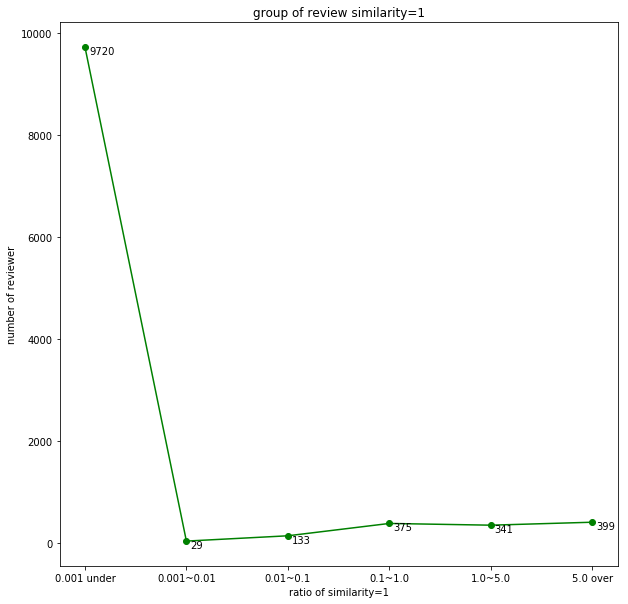

In [465]:
plt.plot(x,y,color='green',marker='o',linestyle='solid')
plt.title('group of review similarity=1')
plt.xlabel("ratio of similarity=1")
plt.ylabel("number of reviewer")
for label, x_count, y_count in zip(labels, x, y):
    plt.annotate(label,
                 xy=(x_count, y_count), #label을 데이터포인트에 두되
                 xytext=(4,-7), # 약간 떨어져 있게
                 textcoords='offset points')
plt.show()

같은 내용(리뷰 내용의 similarity=1)을 반복적으로 적은 비율이 5.0 이상인 사람은 11,000명 중에서 약 400명 (약 3.6%)

group3+4+5+6

In [474]:
group_spammer=group3+group4+group5+group6

In [475]:
len(group_spammer)

1248

In [487]:
group_spammer

[u'rkdrudw***',
 u'ovvvvv***',
 u'h3j***',
 u'ei7***',
 u'mari***',
 u'bani0***',
 u'jin***',
 u'hk8***',
 u'pinkholi***',
 u'se***',
 u'kkims***',
 u'ttsaldu***',
 u'pc***',
 u'yuri1***',
 u'alsrud8***',
 u'serenad***',
 u'cutie0***',
 u'hide***',
 u'n***',
 u'yu***',
 u'dk9***',
 u'wnfl1***',
 u'sal***',
 u'cjswls0***',
 u'dmsdk8***',
 u'funn***',
 u'ams4***',
 u'eu***',
 u'sad***',
 u'l990***',
 u'rhehd9***',
 u'sunmi840***',
 u'h***',
 u'ihpar***',
 u'boom5***',
 u'blue***',
 u'vbn7***',
 u'wndu***',
 u'k01028825***',
 u'jihae1***',
 u'sujeong1***',
 u'poo***',
 u'qkqh2***',
 u'sweetofl***',
 u'stellaz***',
 u'ssdd1***',
 u'hmh6***',
 u'znznd***',
 u'ymj9***',
 u'dnfslatkf***',
 u'rlaqh***',
 u'thdh***',
 u'freedom***',
 u'ruddu***',
 u'jujae***',
 u'omylove***',
 u'mini100***',
 u'wldnjs***',
 u'www3***',
 u'yo***',
 u'lhj***',
 u'dbsls***',
 u'tkdkd2***',
 u'shs***',
 u'e***',
 u'pkj2***',
 u'dhtof***',
 u'naay***',
 u'brs0***',
 u'psun***',
 u'yuni1***',
 u'lyhee***',
 u'jonghyu

In [491]:
copy_data2=sn_data
for i in range(len(group_spammer)):
    copy_data2=copy_data2[copy_data2.cId != group_spammer[i]]

In [492]:
len(copy_data2)

256936

In [499]:
copy_data2['rScore'].value_counts()

5.0    239201
4.0     11372
3.0      4236
2.0      1198
1.0       929
Name: rScore, dtype: int64

In [497]:
cnt2=copy_data2['rScore'].value_counts()
cnt2=pd.DataFrame(cnt2)
cnt2

,rScore
5.0,239201
4.0,11372
3.0,4236
2.0,1198
1.0,929


In [498]:
total=0
for i in range(len(cnt2)):
    total+=cnt2['rScore'][i+1]
total

256936

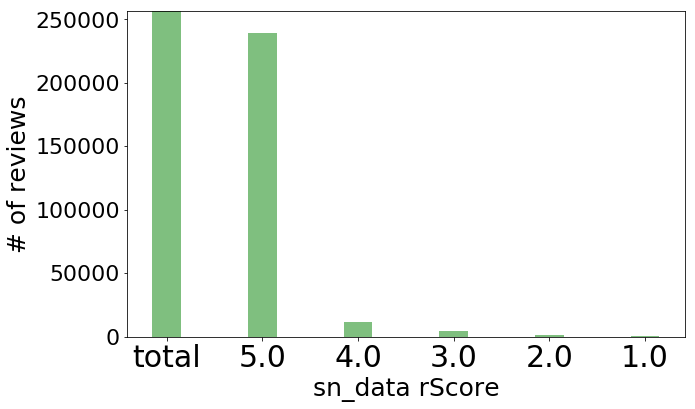

ratio 5.0: 93.098
ratio 4.0 : 4.426
ratio 3.0: 1.649
ratio 2.0 : 0.466
ratio 1.0 : 0.362


In [539]:
# 실험 2, spammer 약 9천명 (smilarity=1 수가 10개 이상인사람)
score = ('total','5.0', '4.0', '3.0', '2.0', '1.0')
number_of_reviews = [ 256936,
                      239201,
                      11372,
                      4236,
                      1198,
                      929
                    ]

plt.bar(score, number_of_reviews, color=['green'],
        width=0.3, alpha=0.5)
plt.xticks(score, fontsize=30)
plt.yticks(fontsize=22)
plt.ylabel('# of reviews', fontsize=25)
plt.rcParams["figure.figsize"] = (10,6)
plt.xlabel('sn_data rScore', fontsize=25)
ax = plt.gca()
ax.set_ylim([0.0,256936])
plt.show()

print ("ratio 5.0: " + str(short_float(1.0*(239201)*100/256936)))
print ("ratio 4.0 : " + str(short_float(1.0* (11372)*100/256936)))
print ("ratio 3.0: " + str(short_float(1.0* (4236)*100/256936)))
print ("ratio 2.0 : " + str(short_float(1.0* (1198)*100/256936)))
print ("ratio 1.0 : " + str(short_float(1.0* (929)*100/256936)))